In [1]:
# Implementing Q learning . 

# Reference: https://github.tamu.edu/desik-rengarajan/IRL
from car_ped import CarEnv
import numpy as np
import random
import math
from time import sleep
import matplotlib.pyplot as plt
import pdb
%matplotlib inline
import pickle


## Initialize the "Pedestrian" environment
env = CarEnv()

# (common)
observation_space_low = [0,0,2.5,0,-3]
observation_space_high = [10,60,10,15,3]

## Defining the environment related constants

# Number of discrete states and actions (bucket) per dimension
PED_NUM_BUCKETS = (21,61,4,21,13)  
CAR_NUM_BUCKETS = (21,61,4,21,13)  
PED_NUM_ACTIONS = 10
CAR_NUM_ACTIONS = 10

# bounds for each discrete state
# (common)
STATE_BOUNDS = list(zip(observation_space_low, observation_space_high))

# bounds for action and state spaces

#car
Car_action_space_low = -1*env.C_acceleration_limit
Car_action_space_high = 1*env.C_acceleration_limit
Car_action_bins = np.squeeze(np.linspace(Car_action_space_low, Car_action_space_high, CAR_NUM_ACTIONS))

#ped
Ped_action_space_low = -1*env.P_velocity_limit
Ped_action_space_high = 1*env.P_velocity_limit
Ped_action_bins = np.squeeze(np.linspace(Ped_action_space_low, Ped_action_space_high, PED_NUM_ACTIONS))

# (common)
state_bins = []
for i in range(5):
    state_bins.append(np.linspace(STATE_BOUNDS[i][0], STATE_BOUNDS[i][1], CAR_NUM_BUCKETS[i]-1))

## Defining the simulation related constants
NUM_EPISODES = 100000
DEBUG_MODE = False

## Q-Table for each state-action pair

#CAR
q_table_car = np.zeros(CAR_NUM_BUCKETS + (CAR_NUM_ACTIONS,))

#PED
with open('pedQL.pickle', 'rb') as f:
    q_table_ped = pickle.load(f)

#CAR
# with open('CarQL.pickle', 'rb') as f:
#     q_table_car = pickle.load(f)

##############################################################################################################


In [2]:
def map_action(action_idx, action_bins, action_space_low, action_space_high, NUM_ACTIONS):
    if(action_idx == 0):
        lower_limit = action_space_low
        upper_limit = action_space_low
    elif(action_idx == NUM_ACTIONS):
        lower_limit = action_space_high
        upper_limit = action_space_high
    else:
        lower_limit = action_bins[action_idx-1]
        upper_limit = action_bins[action_idx]
    
    action = np.random.uniform(low=lower_limit, high=upper_limit, size=1)
    return action


def select_action(state, explore_rate ,q_table, action_bins, action_space_low, action_space_high,NUM_ACTIONS):
    # Select a random action
    if random.random() < explore_rate:
        action = env.action_space.sample()
    else:
        action = np.argmax(q_table[state])
        action = map_action(action, action_bins, action_space_low, action_space_high,NUM_ACTIONS)
        
    return action

def bucket_action(action,action_bins):
    return np.digitize(action, action_bins, right=True) #right is different

def bucket_state(states):
    idx = []
    for i, state in enumerate(states):
        idx.append(np.digitize(state, state_bins[i], right=True)) #right is different
    return tuple(idx)

In [3]:
##############################################################################################################
## Instantiating the learning related parameters

# Learning rate
learning_rate = 1
decay_rate_lea = 0.0002
max_learn_rate = 1
min_learn_rate = 0.01

# Explore rate
explore_rate = 1
decay_rate_exp = 0.00002
max_explore_rate = 1
min_explore_rate = 0.01

# discount factors
discount_factor = 0.99
rew = np.zeros(NUM_EPISODES)
Rate_explore = np.zeros((NUM_EPISODES,1))
Rate_learn = np.zeros((NUM_EPISODES,1))

death_toll=0
safe_chicken=0
done_count=0
count=0
actions_list = []
final_reward = []

In [4]:
from __future__ import print_function
import sys

for episode in range(NUM_EPISODES):
    
    c_state = bucket_state(env.reset(np.random.randint(1,4)))
    cum_rew_ep = 0
    
    while True:
        
        # Select an action
        
        action_car = select_action(c_state, explore_rate ,q_table_car, 
                                   Car_action_bins, Car_action_space_low, Car_action_space_high,CAR_NUM_ACTIONS)
        
        action_ped = select_action(c_state, 0.0, q_table_ped, 
                                   Ped_action_bins, Ped_action_space_low, Ped_action_space_high,PED_NUM_ACTIONS)
        
        # Execute the action
        
        n_state, reward, done = env.step(action_car,action_ped)
        
        temp = n_state
        
        n_state = np.array(n_state)
        
        action_car = bucket_action(action_car,Car_action_bins)
        
        n_state = bucket_state(n_state)

        # Update the Q based on the result
        
        best_q = np.amax(q_table_car[n_state])
        
        q_table_car[c_state + (action_car,)] = ((1-learning_rate) * q_table_car[c_state + (action_car,)] + 
                                    learning_rate * (reward + discount_factor * best_q))
            
        # Setting up for the next iteration
        
        c_state = n_state
        
        cum_rew_ep += reward
        

        # Print data
        if done:
            
            print(temp)
            # print the episode number and remaning cumulative reward
            print('EPISODE:'+str(episode)+'   REWARD: '+str(reward) + ' Cumulative Reward: '+str(cum_rew_ep)) 
            final_reward.append(reward)
            done_count+=1
            
            if (reward==-500):
                death_toll+=1               
            
            if (reward==75):
                safe_chicken+=1
            
            break
        
    Rate_explore[episode] = explore_rate
    
    Rate_learn[episode] = learning_rate

    # Update parameters
    rew[episode] = cum_rew_ep
 
    decay_parameter_exp = np.exp(-decay_rate_exp * (episode+1))
    
    decay_parameter_lea = np.exp(-decay_rate_lea * (episode+1))
    
    explore_rate = min_explore_rate + (max_explore_rate - min_explore_rate)*decay_parameter_exp
    
    learning_rate = min_learn_rate + (max_learn_rate - min_learn_rate)*decay_parameter_lea


[0.9923321621898842, 70.04768045665696, 5.707109576352165, 13.933740586042404, 1.6689405]
EPISODE:0   REWARD: 75.0 Cumulative Reward: -508.55291856933763
[0.6169806146098327, 69.83317394414917, 2.7905472234306306, 14.567334830760956, 0.701604]
EPISODE:1   REWARD: 75.0 Cumulative Reward: -483.7563298021429
[1.771793719636895, 70.1289779106155, 3.351970404697787, 12.429078422486782, -1.4802504]
EPISODE:2   REWARD: 75.0 Cumulative Reward: -443.24727218444525
[1.161994981699025, 70.06039864849299, 6.737070966914158, 12.294527098536491, -1.2231588]
EPISODE:3   REWARD: 75.0 Cumulative Reward: -371.8953430538115
[1.2458803775948661, 69.73324406472966, 6.210337659445718, 11.713460374623537, -2.971827]
EPISODE:4   REWARD: 75.0 Cumulative Reward: -370.165124797413
[0.813018477774683, 71.13027601502836, 7.305184791452261, 15, 2.2904122]
EPISODE:5   REWARD: 75.0 Cumulative Reward: -476.1824881407571
[1.5652240112217641, 71.23453105270164, 2.78108169334668, 13.938040025532246, 0.9126196]
EPISODE:6 

[1.8690707388640713, 70.67971724108793, 5.579128314784041, 14.42899858765304, 2.4040515]
EPISODE:85   REWARD: 75.0 Cumulative Reward: -424.3043583267766
[1.0317522203115437, 70.10979471239261, 7.3554895054029235, 13.490818491205573, 2.5621233]
EPISODE:86   REWARD: 75.0 Cumulative Reward: -383.859735153225
[1.487377649822145, 68.65569780929945, 7.147377236585696, 11.683055708184838, 2.3445861]
EPISODE:87   REWARD: 75.0 Cumulative Reward: -354.918020197692
[0.8534201999077218, 69.71457477286458, 7.1097185731910315, 13.48731592297554, 2.84336]
EPISODE:88   REWARD: 75.0 Cumulative Reward: -378.11910156149037
[1.057566121961481, 68.6982271564193, 8.532219653720114, 14.482015185058117, 1.6000158]
EPISODE:89   REWARD: 75.0 Cumulative Reward: -469.1649550885942
[1.2343824787693634, 69.54169571399689, 5.981678477843064, 14.589294463396072, -1.6428221]
EPISODE:90   REWARD: 75.0 Cumulative Reward: -440.52071235830374
[1.7084291799188676, 71.8173627089418, 6.737412858505139, 14.11077505722642, -2.

[0.5157755600806974, 69.33378112409264, 2.6076622313114686, 13.247498288750648, -0.4232005]
EPISODE:152   REWARD: 75.0 Cumulative Reward: -500.040932510012
[1.668108123208073, 70.07509170578851, 4.930412331567858, 14.354682445526123, -2.5812702]
EPISODE:153   REWARD: 75.0 Cumulative Reward: -471.8158486018798
[1.9691953716693198, 68.23623173538363, 7.789205324351995, 12.678346551489085, 2.621177]
EPISODE:154   REWARD: 75.0 Cumulative Reward: -358.3599845763657
[1.8162578014693853, 70.36075427290052, 3.8237166195785104, 14.253262124955654, -0.27402765]
EPISODE:155   REWARD: 75.0 Cumulative Reward: -471.8343296315661
[1.3698170863361725, 71.4138513226062, 7.027324580156542, 15, 0.98807234]
EPISODE:156   REWARD: 75.0 Cumulative Reward: -425.72975942555786
[0.6113394915506012, 69.87136093946174, 8.974069784080267, 14.465592056512833, 1.2575463]
EPISODE:157   REWARD: 75.0 Cumulative Reward: -459.84363142285576
[1.3507421057989142, 69.82165204826742, 8.364836213018123, 11.823904566466808, -0

[0.9738385920400241, 70.58552519164368, 3.5502743943987927, 12.934256995271426, 0.002092459]
EPISODE:221   REWARD: 75.0 Cumulative Reward: -450.2377840364718
[1.65256767387538, 71.29786510948907, 8.48776883562348, 12.05575618497096, -2.9731522]
EPISODE:222   REWARD: 75.0 Cumulative Reward: -407.85243390950245
[1.5386019806743025, 68.6582408133545, 4.572211273622104, 8.986969920340925, -2.0473905]
EPISODE:223   REWARD: 75.0 Cumulative Reward: -376.4135450913256
[0.6576548299962683, 68.56076787575148, 7.807431996613683, 13.804416904225945, 0.97072226]
EPISODE:224   REWARD: 75.0 Cumulative Reward: -383.51276020079075
[0.5156795663073729, 69.69514754740521, 3.6698288671743517, 14.952497500926256, -0.19001]
EPISODE:225   REWARD: 75.0 Cumulative Reward: -447.8700291466439
[1.700913238735097, 72.15052207186818, 3.1459608100460397, 15, 1.2249091]
EPISODE:226   REWARD: 75.0 Cumulative Reward: -414.109584596695
[1.2473721111394869, 70.52487878967077, 7.10771947486892, 14.589295893907547, -1.6428

[1.60321783666835, 71.36115278224233, 7.250181628028462, 13.78263534605503, -1.4384831]
EPISODE:288   REWARD: 75.0 Cumulative Reward: -404.79111224986104
[1.574663096045241, 69.74536039424129, 7.847066631182893, 11.990748861804605, 2.0355084]
EPISODE:289   REWARD: 75.0 Cumulative Reward: -387.4315022259127
[1.2020225512010627, 69.92322153039277, 6.210845010503188, 12.331665866076946, 2.941837]
EPISODE:290   REWARD: 75.0 Cumulative Reward: -385.9378014020443
[0.6480000497149241, 68.87104398524389, 3.2454130825954413, 14.429574131965637, -2.2817035]
EPISODE:291   REWARD: 75.0 Cumulative Reward: -434.282353847143
[0.6997489282088695, 69.58768683345988, 7.840127391171544, 14.04933401197195, -0.69733965]
EPISODE:292   REWARD: 75.0 Cumulative Reward: -476.0047022092235
[1.1381702761398067, 70.05466436245479, 8.643870769370839, 13.258655816316605, -2.041457]
EPISODE:293   REWARD: 75.0 Cumulative Reward: -484.76015159437543
[0.9569989920819733, 70.52699895109981, 8.665797259674934, 14.36361037

[1.6006891216268928, 69.07516937004402, 4.3975426355313845, 10.030530910938978, -0.7370969]
EPISODE:356   REWARD: 75.0 Cumulative Reward: -363.90509942877577
[0.9568729567218356, 69.447124289567, 3.537691543210422, 15, 1.2480389]
EPISODE:357   REWARD: 75.0 Cumulative Reward: -442.378138466055
[1.3199535314281654, 70.87390206567943, 6.944944193174203, 12.827898681163788, 1.541907]
EPISODE:358   REWARD: 75.0 Cumulative Reward: -477.91676035296064
[1.3620628461769408, 68.44056690245634, 6.891899593828903, 10.022299175616354, -2.666969]
EPISODE:359   REWARD: 75.0 Cumulative Reward: -373.8278337306719
[0.9612221665603291, 68.93928009364754, 5.181647180519997, 14.802672244608402, 1.1053721]
EPISODE:360   REWARD: 75.0 Cumulative Reward: -390.65054840439973
[0.44566633856558563, 68.98862676159479, 4.862710167064562, 13.756738603115082, -1.9638402]
EPISODE:361   REWARD: 75.0 Cumulative Reward: -446.69818509393997
[1.2122759187791192, 69.76007499778643, 4.751776193002165, 14.646948132663965, 2.3

[1.2140629417908126, 71.81000128039159, 7.723132764514869, 15, 1.6546074]
EPISODE:440   REWARD: 75.0 Cumulative Reward: -368.79402969903157
[1.371483278333303, 71.60742740437854, 6.110779219192346, 14.27305541653186, 2.0561125]
EPISODE:441   REWARD: 75.0 Cumulative Reward: -440.2353164560765
[1.277572423934751, 70.08310069516301, 7.444431655615996, 14.547136515378952, 0.82158154]
EPISODE:442   REWARD: 75.0 Cumulative Reward: -463.47119394516506
[1.3881045692501526, 70.78867213451304, 8.648387364501794, 14.821681151166558, 1.8298391]
EPISODE:443   REWARD: 75.0 Cumulative Reward: -392.071102794983
[1.4221882454284085, 69.31712636095472, 4.984948990962849, 11.032736236229539, -2.643312]
EPISODE:444   REWARD: 75.0 Cumulative Reward: -372.02501835020433
[1.5068878062667723, 70.84741534292698, 3.8619859879782816, 12.892011672258377, 2.170372]
EPISODE:445   REWARD: 75.0 Cumulative Reward: -387.7664340910773
[1.1186965070435662, 70.57836870895699, 8.551751764649447, 14.062278736382723, -1.0473

[1.2557085326467226, 69.11950156232342, 6.982832784921145, 13.088481705635786, 1.9222447]
EPISODE:518   REWARD: 75.0 Cumulative Reward: -375.41508720897616
[1.4719257815258036, 72.21659844159149, 5.706150909657286, 14.33010739274323, -2.390425]
EPISODE:519   REWARD: 75.0 Cumulative Reward: -455.85415628405167
[1.097360088168045, 70.46912094438449, 5.121181643347247, 14.850393440574408, -0.5871626]
EPISODE:520   REWARD: 75.0 Cumulative Reward: -385.16912032878923
[1.7814139353945073, 70.13212872250006, 5.530383649972456, 12.646368559449911, -0.9950219]
EPISODE:521   REWARD: 75.0 Cumulative Reward: -387.32611946173006
[1.012457191719734, 70.37660656822845, 6.879633978126418, 13.11343115195632, 0.39318314]
EPISODE:522   REWARD: 75.0 Cumulative Reward: -379.66964578752777
[1.4232432298763669, 72.18820008274633, 5.206098815522003, 15, 2.5360537]
EPISODE:523   REWARD: 75.0 Cumulative Reward: -423.60097272087353
[1.0408800589462306, 68.64311368297786, 4.444680525699673, 12.434307485818863, -1

[1.967417276779508, 71.19693723856471, 4.968420548246951, 12.634430067613721, -0.24858485]
EPISODE:593   REWARD: 75.0 Cumulative Reward: -453.289621310425
[0.8616869465330794, 69.53509443500297, 8.927246958951578, 14.063773386151297, 1.137684]
EPISODE:594   REWARD: 75.0 Cumulative Reward: -381.80078831912147
[1.4555132501877526, 70.3031146634894, 5.908046982678068, 13.33240771270357, -0.1777727]
EPISODE:595   REWARD: 75.0 Cumulative Reward: -414.9263120101976
[0.5194316853468495, 69.38671598793007, 5.099403101912428, 13.43308144249022, -2.6359763]
EPISODE:596   REWARD: 75.0 Cumulative Reward: -429.2633228907318
[0.7262192413650594, 69.03717919671908, 6.78268409019365, 13.150758001953363, -1.8642981]
EPISODE:597   REWARD: 75.0 Cumulative Reward: -378.84939843512007
[1.343646467827488, 71.96050550421933, 5.244248279053364, 13.545325542334467, -2.8246393]
EPISODE:598   REWARD: 75.0 Cumulative Reward: -385.7378061140093
[1.004602129189504, 70.17546985729132, 7.624346736705822, 14.191479277

[1.1545454729012279, 69.33424119860865, 6.58198272272302, 14.295740520581603, -0.039507486]
EPISODE:677   REWARD: 75.0 Cumulative Reward: -437.84447369112695
[1.6398925569252485, 70.41755105368793, 7.165497860419313, 12.521858774125576, -2.3260798]
EPISODE:678   REWARD: 75.0 Cumulative Reward: -396.2888596342089
[1.6664076591974795, 69.05375179462135, 8.178234030719716, 11.386171147227287, -1.4736563]
EPISODE:679   REWARD: 75.0 Cumulative Reward: -368.89377689911663
[1.473926746275212, 72.36623345920816, 7.9929829738163285, 15, 2.8697042]
EPISODE:680   REWARD: 75.0 Cumulative Reward: -420.93911879627217
[1.4850471658726103, 68.14508041995578, 5.139260293951243, 9.570319948717952, -0.42620626]
EPISODE:681   REWARD: 75.0 Cumulative Reward: -380.26746177716643
[2.0014362847689333, 72.25693688447063, 4.403408614104127, 15, 1.6718454]
EPISODE:682   REWARD: 75.0 Cumulative Reward: -440.8833959196862
[1.4381163472270866, 70.43982070020866, 4.386894070097709, 13.812463375739753, 0.40605095]
EP

[0.9171586758594228, 69.8144968226552, 5.370039807859518, 13.539185345172882, -2.8586733]
EPISODE:759   REWARD: 75.0 Cumulative Reward: -501.31729412185996
[1.0799023787827728, 70.16062327520922, 5.309991895677809, 14.366837862879038, 1.8156365]
EPISODE:760   REWARD: 75.0 Cumulative Reward: -382.52278533583404
[1.1600082714043958, 68.48128212002872, 5.261855512744226, 12.627937895567957, -1.4190666290154357]
EPISODE:761   REWARD: 75.0 Cumulative Reward: -387.2181542954884
[0.7516342914783712, 69.11682005925104, 8.100636659957821, 11.800866801291704, -1.910597]
EPISODE:762   REWARD: 75.0 Cumulative Reward: -401.62657467992705
[1.5408185225459317, 69.60904874792323, 7.621465208473463, 12.329364582896233, 1.6513429]
EPISODE:763   REWARD: 75.0 Cumulative Reward: -460.7040830309287
[1.2628244453280433, 71.9744563093409, 5.161166606144846, 14.151592820882797, -2.929357]
EPISODE:764   REWARD: 75.0 Cumulative Reward: -423.28210094758316
[0.8656273921112733, 69.86827369220555, 8.63128891730904,

[1.353103761212765, 70.40382357964228, 5.886658244798131, 13.870380163192749, -2.4619265]
EPISODE:846   REWARD: 75.0 Cumulative Reward: -461.75480046847065
[1.8213519781856446, 70.80856285942718, 4.460448408176937, 14.29106056317687, 1.8376032]
EPISODE:847   REWARD: 75.0 Cumulative Reward: -422.1906054897802
[1.4450647368955374, 71.52676465292461, 7.419808718755126, 13.567605691030622, -1.3322929]
EPISODE:848   REWARD: 75.0 Cumulative Reward: -371.52808382200624
[1.3213117737583207, 68.8015178097412, 8.672379744383363, 13.131992802023888, -2.13959]
EPISODE:849   REWARD: 75.0 Cumulative Reward: -481.05676169795026
[1.3399261350523335, 68.86231030104682, 5.517761778892218, 14.188070584088564, -2.863139]
EPISODE:850   REWARD: 75.0 Cumulative Reward: -435.232547668717
[1.0811912295800188, 69.01060151471756, 3.8710376166099403, 14.352044448256493, 1.4241608]
EPISODE:851   REWARD: 75.0 Cumulative Reward: -447.2108899604151
[0.7316040760064991, 68.64860872970894, 8.349381053810337, 12.7558045

[0.5166079685275545, 68.56912507059587, 5.802578291997977, 12.311667467212828, -2.9115632]
EPISODE:933   REWARD: 75.0 Cumulative Reward: -374.3034786446159
[0.6826813671378404, 69.98156756832032, 3.8026165437104296, 14.008924135472625, 0.023401832]
EPISODE:934   REWARD: 75.0 Cumulative Reward: -401.65461621191264
[1.329188321871242, 69.83094377699308, 8.56692536990652, 12.191496407613158, 0.10322916]
EPISODE:935   REWARD: 75.0 Cumulative Reward: -367.79513952149284
[0.6023442766790142, 70.04371825605631, 8.973402272993498, 14.067964762449265, -1.2823446]
EPISODE:936   REWARD: 75.0 Cumulative Reward: -469.43364843064217
[1.861910368987672, 70.47521378705278, 7.69389328385704, 11.888603430241346, -0.47773644]
EPISODE:937   REWARD: 75.0 Cumulative Reward: -384.87794881713586
[0.9478246460626749, 69.2640535873361, 8.997460508169953, 11.930263999849558, -2.9006674]
EPISODE:938   REWARD: 75.0 Cumulative Reward: -386.921033116269
[2.0029596405006793, 69.76415445306338, 7.997798740960535, 14.5

[1.2091860148529767, 69.26633896119893, 7.710734721272775, 14.16319552063942, -2.1548362]
EPISODE:1004   REWARD: 75.0 Cumulative Reward: -439.73614240718166
[1.5968414958460353, 71.75099588278681, 6.298666481685924, 15, 1.0136244]
EPISODE:1005   REWARD: 75.0 Cumulative Reward: -417.33684752114
[0.8745968747905262, 70.1079198596417, 6.098215111833033, 11.640234917867929, -2.6203413]
EPISODE:1006   REWARD: 75.0 Cumulative Reward: -456.71595016215974
[1.3163403634884743, 70.98063129279763, 4.6890350863729084, 14.939993500709534, 2.5159538]
EPISODE:1007   REWARD: 75.0 Cumulative Reward: -479.76126954582605
[1.676735344194463, 69.9476815443486, 7.812431074281298, 14.162198700010777, 1.7810886]
EPISODE:1008   REWARD: 75.0 Cumulative Reward: -415.36389038153635
[1.3263728396870427, 70.86610759841278, 3.74260519730827, 12.599743809551, 0.6765069]
EPISODE:1009   REWARD: 75.0 Cumulative Reward: -420.5600475923993
[1.6194568458811494, 68.35420015105046, 5.091161982644132, 11.666885318234563, 1.33

EPISODE:1079   REWARD: 75.0 Cumulative Reward: -462.6238836907246
[0.5438536484592758, 68.23742349399254, 6.077307527642778, 12.402715597301722, -2.552665]
EPISODE:1080   REWARD: 75.0 Cumulative Reward: -368.25488350421887
[0.6337732168383277, 70.11968553904444, 3.4219800411337182, 13.737317271530628, 0.8584967]
EPISODE:1081   REWARD: 75.0 Cumulative Reward: -379.9753196267306
[1.0038844162223488, 71.33437679579947, 8.89479982115892, 15, 2.5857694]
EPISODE:1082   REWARD: 75.0 Cumulative Reward: -474.65143746467254
[0.5593726198097666, 69.94281350681558, 4.207320940576873, 15, 1.1572344]
EPISODE:1083   REWARD: 75.0 Cumulative Reward: -461.22396404585174
[0.690413434125928, 70.22948288043699, 4.955424512352985, 14.281852662563324, -2.8725893]
EPISODE:1084   REWARD: 75.0 Cumulative Reward: -460.94512699050097
[0.6222494875993951, 69.76295901741832, 4.756963185460219, 15, 2.3866074]
EPISODE:1085   REWARD: 75.0 Cumulative Reward: -452.7740201669237
[0.6387116498919934, 69.71361849611276, 4.

[1.042267613875347, 71.31754036061466, 2.7653319282066207, 14.379312373697758, -0.48411313]
EPISODE:1165   REWARD: 75.0 Cumulative Reward: -509.3544202722784
[0.7275757765315031, 70.16935956192901, 3.3620249927520502, 13.574741132557392, -0.51925355]
EPISODE:1166   REWARD: 75.0 Cumulative Reward: -445.0707918649688
[0.7291188603168699, 69.48651238088496, 2.7646069088287155, 13.049596706405282, -0.92752767]
EPISODE:1167   REWARD: 75.0 Cumulative Reward: -390.8056578853589
[1.6415724668242144, 69.89813314331695, 6.426429583824612, 14.885997027158737, -0.4560119]
EPISODE:1168   REWARD: 75.0 Cumulative Reward: -448.91389004487587
[1.4836807821270306, 70.05617939936928, 3.7629391650955384, 12.53977575711906, 1.6716574]
EPISODE:1169   REWARD: 75.0 Cumulative Reward: -384.7642493580996
[1.118393097619683, 69.34547233139165, 7.3644873409639136, 14.22402723878622, -1.7776344]
EPISODE:1170   REWARD: 75.0 Cumulative Reward: -443.93534638548726
[1.7882492529332488, 71.3051490625221, 3.397974586631

[1.3305882776922515, 70.9827335930895, 7.52228671580505, 15, 0.33304864]
EPISODE:1250   REWARD: 75.0 Cumulative Reward: -473.2457263549172
[0.7533759181344409, 71.6689302471932, 7.6109336281831625, 13.475454518571496, -2.5219247]
EPISODE:1251   REWARD: 75.0 Cumulative Reward: -453.6492658435279
[0.9792945808775592, 71.51785418135114, 5.70697796849329, 14.825422137975693, -0.69831145]
EPISODE:1252   REWARD: 75.0 Cumulative Reward: -490.01806258715226
[1.6351214773480063, 68.75119550083764, 7.2344952154475495, 11.715632261708379, -2.636442]
EPISODE:1253   REWARD: 75.0 Cumulative Reward: -422.65599183881363
[0.633302259780138, 70.17256085248664, 4.258728645290879, 13.843650426715612, 0.87013364]
EPISODE:1254   REWARD: 75.0 Cumulative Reward: -496.1327003564926
[0.6814858474724856, 70.48047391977161, 8.892988389375224, 14.909678183495998, 2.1702511]
EPISODE:1255   REWARD: 75.0 Cumulative Reward: -397.76352213939333
[1.6041287717269945, 70.30284883035347, 4.314814535876409, 14.1636308878660

[1.7731547081791936, 69.67252809880301, 8.173518091593682, 14.960882067680359, -0.15647173]
EPISODE:1340   REWARD: 75.0 Cumulative Reward: -449.24738229027344
[0.8323192478883457, 68.98240186809562, 4.489577572297605, 15, 0.25746006]
EPISODE:1341   REWARD: 75.0 Cumulative Reward: -430.00797735746204
[1.34615912374028, 70.22331781842513, 6.669359989015052, 13.496282011270523, 1.9163294]
EPISODE:1342   REWARD: 75.0 Cumulative Reward: -438.57455399126434
[1.1950171258741713, 72.45797399667208, 6.681898207940776, 15, 1.5653769]
EPISODE:1343   REWARD: 75.0 Cumulative Reward: -418.5902151444778
[0.690783983406648, 69.0419978229329, 4.968355284661729, 14.115616591647267, 0.06145621]
EPISODE:1344   REWARD: 75.0 Cumulative Reward: -486.3043358424901
[1.3338348426946198, 70.81938706617802, 3.7816160202768856, 14.705239087343216, -0.64270025]
EPISODE:1345   REWARD: 75.0 Cumulative Reward: -507.6829197561175
[1.1693041556466652, 70.38051437132526, 2.8335963897559937, 12.877513349987566, -0.0188755

[1.49699204941597, 69.20427379064495, 8.91042751826295, 13.700475245714188, 0.4586365]
EPISODE:1409   REWARD: 75.0 Cumulative Reward: -471.15063644424583
[1.2221950064580454, 69.86316047795117, 6.514717885216875, 13.583254307508469, -1.4549042]
EPISODE:1410   REWARD: 75.0 Cumulative Reward: -429.03755474098614
[1.178793953790349, 71.1868218081072, 5.880521349616375, 13.524343766272068, -0.9288868]
EPISODE:1411   REWARD: 75.0 Cumulative Reward: -376.5374940613137
[0.893098595139533, 69.43403671535785, 8.500685132009142, 14.231340323574841, 0.046313483]
EPISODE:1412   REWARD: 75.0 Cumulative Reward: -467.171205795544
[0.6275557447178889, 69.13067046739161, 6.082903717180056, 14.153296940028667, 0.78402644]
EPISODE:1413   REWARD: 75.0 Cumulative Reward: -462.62326565166586
[1.6877538514284136, 69.89861274696887, 3.959690118433679, 13.891233518719673, 0.9286076]
EPISODE:1414   REWARD: 75.0 Cumulative Reward: -424.83568338661433
[1.0909729988284829, 70.56296315230429, 3.365790194281524, 14.

[0.6417005900186601, 69.1785906557925, 8.776017091939963, 13.0359988771379, -0.63854223]
EPISODE:1481   REWARD: 75.0 Cumulative Reward: -372.1686147308627
[1.570474233611801, 71.32948999166504, 3.908247752144347, 14.707878349185226, 0.7207307]
EPISODE:1482   REWARD: 75.0 Cumulative Reward: -384.00295782787373
[1.7597639086428003, 69.5928247901611, 7.66135918057825, 14.913984477519989, 1.5868433]
EPISODE:1483   REWARD: 75.0 Cumulative Reward: -446.41972004002923
[0.5720480731335592, 69.30868932511657, 4.772239987693009, 15, 2.5269086]
EPISODE:1484   REWARD: 75.0 Cumulative Reward: -431.8370434294894
[0.29850100884407454, 69.27489049022552, 6.72831506801505, 14.161153734661639, 0.17790738]
EPISODE:1485   REWARD: 75.0 Cumulative Reward: -387.2366319972386
[1.1961756171126594, 68.90868066670373, 8.890653225517767, 14.059132352471352, -1.4009602]
EPISODE:1486   REWARD: 75.0 Cumulative Reward: -453.59179248930934
[0.8203674108065795, 70.66064998856746, 7.79411705431381, 14.05847660265863, 0.

[1.0826908877308432, 69.48500651540235, 8.406948978103095, 14.730352226644754, 2.1234372]
EPISODE:1553   REWARD: 75.0 Cumulative Reward: -391.4495376860107
[1.4558304119302405, 70.52790497872047, 3.693788317074513, 12.187242539599538, 0.4681816]
EPISODE:1554   REWARD: 75.0 Cumulative Reward: -367.97795515470017
[1.9659066656458233, 68.20600616396405, 6.79213230474375, 9.705080104991794, -1.8674661]
EPISODE:1555   REWARD: 75.0 Cumulative Reward: -365.45029577518727
[1.356880455839675, 68.57304960954934, 7.651112976917285, 13.369542434811592, 2.871127]
EPISODE:1556   REWARD: 75.0 Cumulative Reward: -494.96210351321554
[1.1183657825985522, 71.2147060903571, 8.946151507133685, 13.511890858170844, 0.031938832]
EPISODE:1557   REWARD: 75.0 Cumulative Reward: -403.1364153068245
[0.9616617423270645, 68.41719914460555, 6.097931871014486, 13.250008840113878, -1.6292115]
EPISODE:1558   REWARD: 75.0 Cumulative Reward: -440.7700315435071
[0.6896749679567447, 68.54094491805881, 4.541362963806108, 14.

[1.5138451136315327, 72.40204799734056, 7.785716815662703, 15, 1.7063007]
EPISODE:1624   REWARD: 75.0 Cumulative Reward: -425.0391532947096
[1.6394977374921575, 70.06276772287674, 7.132427973019745, 11.063041970133781, 1.7953562]
EPISODE:1625   REWARD: 75.0 Cumulative Reward: -399.89076856218264
[0.9950413870968278, 69.21419352455996, 5.493549702148615, 13.27537278085947, -2.7498024]
EPISODE:1626   REWARD: 75.0 Cumulative Reward: -452.8924377731187
[1.1853252152296707, 70.02570796187501, 5.459402783467887, 14.843087702989578, 2.7164147]
EPISODE:1627   REWARD: 75.0 Cumulative Reward: -473.62639845540855
[0.5266324830576392, 70.06166334811132, 5.874416873184876, 14.314192336052656, 1.2816863]
EPISODE:1628   REWARD: 75.0 Cumulative Reward: -484.5292280631269
[1.7940169714333871, 70.52885679341853, 6.413747556709934, 14.038281589746475, -1.7465574]
EPISODE:1629   REWARD: 75.0 Cumulative Reward: -461.5667180071972
[1.1623314864602123, 68.07595918170409, 5.342880600080421, 11.40282711898908,

[0.9449270703339967, 71.00201157003175, 8.548409548693762, 15, 1.8594204]
EPISODE:1697   REWARD: 75.0 Cumulative Reward: -470.3596641580061
[1.2017752130546466, 69.91392244889745, 7.4849291654089996, 15, 0.24284834]
EPISODE:1698   REWARD: 75.0 Cumulative Reward: -459.8877573471091
[0.9241895880549522, 68.83166164066643, 3.924455474832446, 12.430420897901058, -2.3371875]
EPISODE:1699   REWARD: 75.0 Cumulative Reward: -391.34586715419175
[0.623946094770756, 69.19299645535648, 6.205363549986255, 13.072053089737892, -1.2156501]
EPISODE:1700   REWARD: 75.0 Cumulative Reward: -403.15926239613515
[0.9432170393710495, 71.00453701236984, 6.377028537344337, 15, 1.906018]
EPISODE:1701   REWARD: 75.0 Cumulative Reward: -383.8642637483813
[1.2230103444364422, 68.4680167820645, 5.873555830642518, 14.05694591999054, 1.6804379]
EPISODE:1702   REWARD: 75.0 Cumulative Reward: -447.6978768010192
[1.5032234317644622, 70.19506000727415, 5.165854663440847, 14.087714403867722, -1.1118304]
EPISODE:1703   REWA

[1.2842362925222708, 70.25824639899656, 7.6331951880331115, 13.03525086119771, -0.38465157]
EPISODE:1777   REWARD: 75.0 Cumulative Reward: -387.1027569049914
[0.982839704335275, 71.06938864523545, 7.583143984872159, 15, 1.4404318]
EPISODE:1778   REWARD: 75.0 Cumulative Reward: -463.12942216897125
[1.9785911255373783, 69.91821090877056, 7.0347877269911425, 15, 1.6835204]
EPISODE:1779   REWARD: 75.0 Cumulative Reward: -455.5989933698121
[1.520352329065528, 70.4584513524751, 5.585676971587445, 11.456907757208683, 2.1499462]
EPISODE:1780   REWARD: 75.0 Cumulative Reward: -416.4116897122438
[0.8892848782476868, 68.8773030663724, 6.304195582453951, 13.537535328883678, -1.2781073]
EPISODE:1781   REWARD: 75.0 Cumulative Reward: -462.6851551164075
[1.1913867621835064, 70.27909619780257, 4.9210266779212155, 11.450294632464647, 2.824099]
EPISODE:1782   REWARD: 75.0 Cumulative Reward: -401.61632570451144
[1.4153108937914565, 71.45891021568677, 6.256560588394642, 15, 2.331015]
EPISODE:1783   REWARD

[1.3285975604333757, 70.04434453509748, 8.102747422123185, 10.679349586367607, -1.9863559]
EPISODE:1865   REWARD: 75.0 Cumulative Reward: -368.7210658873281
[1.410316428921616, 68.7263827463612, 7.697233014920627, 13.100408293306828, -0.7354208]
EPISODE:1866   REWARD: 75.0 Cumulative Reward: -358.35389530584763
[0.6082646355918985, 69.24344635930993, 2.9141809630218583, 14.39675136655569, -0.47402826]
EPISODE:1867   REWARD: 75.0 Cumulative Reward: -443.3099807411917
[1.4965100023233295, 70.21099832671462, 8.741103663469636, 13.533084750175476, -2.332332]
EPISODE:1868   REWARD: 75.0 Cumulative Reward: -478.361187398419
[1.04957178598651, 68.49549298267812, 7.127544733674454, 13.354972511529922, -2.5336857]
EPISODE:1869   REWARD: 75.0 Cumulative Reward: -427.8974660651237
[1.8404521811853058, 71.11338614602573, 7.253009030054149, 14.928801590576768, 0.9509106]
EPISODE:1870   REWARD: 75.0 Cumulative Reward: -420.1790316373397
[1.7815743334336773, 71.0640955530107, 7.165090504061844, 13.44

[0.6128665871836706, 69.28530656453222, 8.409351956908136, 13.068898789584637, -0.82887894]
EPISODE:1945   REWARD: 75.0 Cumulative Reward: -392.8358103963246
[1.183050366952992, 72.18082763900748, 2.891299536732433, 14.135159619152546, -1.3791357]
EPISODE:1946   REWARD: 75.0 Cumulative Reward: -445.49589998243243
[1.2868071443607827, 71.92273971764371, 2.630100699268419, 14.687393248081207, -1.250427]
EPISODE:1947   REWARD: 75.0 Cumulative Reward: -386.1501301794346
[1.5016836517560372, 68.35245019663125, 4.648762132767573, 10.541908971965313, -0.2146213]
EPISODE:1948   REWARD: 75.0 Cumulative Reward: -433.9237185700423
[0.8731278443433481, 70.42243238457013, 6.344318813543849, 12.813414729200304, -2.1966496]
EPISODE:1949   REWARD: 75.0 Cumulative Reward: -413.35944627513487
[0.6733013586829348, 68.89976488472894, 4.399477423080724, 13.401438534259796, -2.601271]
EPISODE:1950   REWARD: 75.0 Cumulative Reward: -478.9526859838362
[0.5891850919571278, 69.35770584596321, 8.829745908053475,

[0.7426459491525401, 68.9623595162447, 4.696864009865883, 13.95836487408078, 1.8252864]
EPISODE:2020   REWARD: 75.0 Cumulative Reward: -373.74519704860626
[0.31555281518110645, 69.13499743787816, 8.49126058198832, 14.582436187025445, 2.2937257]
EPISODE:2021   REWARD: 75.0 Cumulative Reward: -451.27778901237525
[0.5825880974041738, 70.12137347226962, 4.305078499541524, 13.89263192936778, -0.4323172]
EPISODE:2022   REWARD: 75.0 Cumulative Reward: -406.638912409314
[1.3767116860446609, 69.3596730073914, 7.35462711726842, 13.194732248783112, -2.0810513]
EPISODE:2023   REWARD: 75.0 Cumulative Reward: -488.7115817516585
[1.4140608544490392, 69.19161799823632, 4.520750924088674, 11.239005014766008, -1.8253753]
EPISODE:2024   REWARD: 75.0 Cumulative Reward: -386.61303461273184
[1.3494654152959613, 70.81570454938453, 5.5482525982074415, 12.725132428586699, 0.5342596]
EPISODE:2025   REWARD: 75.0 Cumulative Reward: -468.98799386191297
[0.9077255921661507, 70.42225020332262, 5.073776244998366, 14.

[1.4044407108801689, 71.58040965721011, 6.479517593801635, 13.84756714105606, -1.3266786]
EPISODE:2097   REWARD: 75.0 Cumulative Reward: -416.9154559580248
[0.7743042919672412, 70.72402897104621, 3.48544910258138, 14.013313621282578, -2.3168354]
EPISODE:2098   REWARD: 75.0 Cumulative Reward: -399.4976834666033
[1.4817449947113581, 70.16829513944685, 3.4044752432858214, 14.671365022659302, -1.3145399]
EPISODE:2099   REWARD: 75.0 Cumulative Reward: -465.811236747258
[1.3770225099354751, 71.06344457576051, 5.203816948200409, 12.106186378747225, -0.24520028]
EPISODE:2100   REWARD: 75.0 Cumulative Reward: -361.26633932237917
[1.0511751150326056, 70.01352458977257, 7.507372076531973, 13.89134606719017, -1.7223734]
EPISODE:2101   REWARD: 75.0 Cumulative Reward: -477.7693319750915
[1.5441706622362616, 69.02502351626754, 5.996876043893999, 14.579769268631935, 2.587769]
EPISODE:2102   REWARD: 75.0 Cumulative Reward: -384.3412830335019
[0.4892739157893571, 68.94946305606283, 5.618298090048659, 15

[0.9300715142033705, 68.9638690931024, 5.7920573065473135, 9.157625570893288, 0.27603224]
EPISODE:2184   REWARD: 75.0 Cumulative Reward: -374.4568317729753
[1.0167434464443537, 68.84610167192295, 8.537876848963887, 15, 0.648637]
EPISODE:2185   REWARD: 75.0 Cumulative Reward: -419.01527950728985
[1.3519851980003532, 70.11903813486647, 5.209334593728512, 13.820704885252406, 0.6703713329755809]
EPISODE:2186   REWARD: 75.0 Cumulative Reward: -369.3374612090972
[1.6329568229316829, 71.47625816101208, 5.56558866415589, 14.444930791854858, -2.2202768]
EPISODE:2187   REWARD: 75.0 Cumulative Reward: -416.1600166421687
[1.1590819348273105, 70.18563776509836, 8.165425765981388, 11.331931609660387, 1.6758856]
EPISODE:2188   REWARD: 75.0 Cumulative Reward: -372.57196332866823
[1.2834716649595572, 71.64902865514159, 5.947230593626006, 14.27563625574112, -2.897455]
EPISODE:2189   REWARD: 75.0 Cumulative Reward: -387.4568523649063
[0.931153335540609, 68.76140956697054, 5.4183883054894135, 13.894853169

[0.8675721018111311, 68.83210420887917, 3.1731644304278364, 14.785989686846733, 2.0178723]
EPISODE:2271   REWARD: 75.0 Cumulative Reward: -435.4317684433077
[0.5679414065839519, 70.36927232529257, 8.286241110943081, 14.268818497657776, -2.924726]
EPISODE:2272   REWARD: 75.0 Cumulative Reward: -465.250064685588
[1.2650927533372236, 71.88684083719272, 5.783864568907096, 15, 0.43782333]
EPISODE:2273   REWARD: 75.0 Cumulative Reward: -430.3095477610625
[1.7012564579892882, 70.84556505572982, 4.855869167113611, 12.495606346055865, 1.686134]
EPISODE:2274   REWARD: 75.0 Cumulative Reward: -394.954610719036
[0.8308808858212239, 69.88019559953224, 5.01120682145857, 15, 2.0271106]
EPISODE:2275   REWARD: 75.0 Cumulative Reward: -457.8334043569398
[1.902738231822557, 70.78579175022774, 5.113312039964219, 11.39439894873894, -2.941472114905954]
EPISODE:2276   REWARD: 75.0 Cumulative Reward: -362.32479266794184
[1.6394596533590615, 70.81802417966537, 4.715636971814542, 12.428717887029052, -1.4336432]

[2.142469755214722, 70.39807998237096, 7.158166547521027, 13.232241626503267, -2.063556]
EPISODE:2355   REWARD: 75.0 Cumulative Reward: -424.3330227249583
[0.6220882906800722, 70.35867740400136, 3.839317695108255, 15, 0.27803212]
EPISODE:2356   REWARD: 75.0 Cumulative Reward: -475.8265368959495
[1.383341317837414, 71.21786970645189, 3.7184822392155867, 13.447655372321606, 0.34184918]
EPISODE:2357   REWARD: 75.0 Cumulative Reward: -483.69794219254027
[1.0069450917011058, 68.87439931370318, 5.1570337220633675, 12.491672173142433, -2.726179]
EPISODE:2358   REWARD: 75.0 Cumulative Reward: -402.38060233915775
[1.41054919795747, 69.54852368682623, 5.257155345007463, 14.539068192243576, -1.8437272]
EPISODE:2359   REWARD: 75.0 Cumulative Reward: -441.3001504503553
[1.9207641760921117, 70.13342879444826, 8.394954094366637, 13.548087366856635, 2.3587437]
EPISODE:2360   REWARD: 75.0 Cumulative Reward: -437.9486687634409
[1.5609734447171686, 71.64741624426097, 6.4519290608683555, 14.83241230249404

[1.284175910373373, 70.12507966122885, 3.045046842046302, 14.259452849626541, -1.7873087]
EPISODE:2429   REWARD: 75.0 Cumulative Reward: -475.1487643678804
[1.6153241328595014, 70.22008288365254, 5.839230736879744, 12.52950927414625, 0.651382]
EPISODE:2430   REWARD: 75.0 Cumulative Reward: -442.58131213701097
[1.1223863978619706, 69.5620751568774, 3.520859529512088, 14.270517509877743, 0.06661379]
EPISODE:2431   REWARD: 75.0 Cumulative Reward: -471.9907362497888
[0.9897443127356739, 70.31386221386492, 4.856832206315026, 14.559040278196335, 1.9336766]
EPISODE:2432   REWARD: 75.0 Cumulative Reward: -428.4047771621495
[0.5442035156645904, 68.29968987964094, 6.854296070861015, 12.3235152810812, -1.5176301]
EPISODE:2433   REWARD: 75.0 Cumulative Reward: -367.14908859098824
[0.5446053083954552, 69.92325364146382, 2.8683465639458063, 13.726383052766323, 1.3779122]
EPISODE:2434   REWARD: 75.0 Cumulative Reward: -376.6736723505595
[1.559604380481091, 71.75312647921976, 4.668255565374846, 14.662

[1.5146552479277484, 69.9458770468785, 6.235947411137138, 14.051170691847801, -0.67323035]
EPISODE:2508   REWARD: 75.0 Cumulative Reward: -469.0138741733175
[0.8666949669975341, 69.04926020826679, 4.862451254990503, 14.833754882216454, 0.8540972]
EPISODE:2509   REWARD: 75.0 Cumulative Reward: -426.5057805328611
[1.018590324544487, 69.79902105405927, 5.370174449898233, 13.993539098650217, 1.6831417]
EPISODE:2510   REWARD: 75.0 Cumulative Reward: -430.32508727448635
[1.212961463717869, 68.77058333938476, 5.210971533169589, 13.969243109226227, -2.2725763]
EPISODE:2511   REWARD: 75.0 Cumulative Reward: -434.37165353977366
[0.5183354723603423, 70.1255768990377, 7.56485260650552, 13.407529064454138, -2.547466]
EPISODE:2512   REWARD: 75.0 Cumulative Reward: -492.0833684762233
[1.6060039465548024, 68.87824120662921, 8.713306064482476, 14.128511667251587, -0.86452615]
EPISODE:2513   REWARD: 75.0 Cumulative Reward: -452.6485461626621
[1.2226288781247325, 70.22774462145753, 3.5158077479998022, 13

[0.34568383672055203, 69.57478181141778, 6.248875532176197, 14.650700435042381, 0.8185174]
EPISODE:2595   REWARD: 75.0 Cumulative Reward: -454.14193025868576
[0.6816718157786594, 69.9750413550646, 7.323264043449097, 14.807228818535805, -0.7710847]
EPISODE:2596   REWARD: 75.0 Cumulative Reward: -491.6401492263981
[1.4066514410856905, 70.16046277992427, 4.932012886334452, 14.959600061178207, 1.0728397]
EPISODE:2597   REWARD: 75.0 Cumulative Reward: -460.68321344389267
[1.339601001667476, 71.27820185665041, 5.591646647576841, 14.504292100667953, -1.9828316]
EPISODE:2598   REWARD: 75.0 Cumulative Reward: -480.2328821431719
[1.5969397985804101, 71.31269980018504, 5.678615072573029, 15, 1.8860582]
EPISODE:2599   REWARD: 75.0 Cumulative Reward: -427.2138834020118
[1.0985121437505372, 70.3651739275083, 7.147444659772969, 12.113563872873783, -2.312062]
EPISODE:2600   REWARD: 75.0 Cumulative Reward: -433.2920022079466
[1.3491960355361927, 71.91286886535818, 6.052221315494718, 14.827727869153023,

[1.2052691368471726, 70.0334739669803, 8.835814776389721, 11.585520357792426, 0.61144924]
EPISODE:2667   REWARD: 75.0 Cumulative Reward: -365.31986728950386
[1.489851663197725, 68.43137114215642, 8.0352382969951, 10.481264762580395, -2.8290143]
EPISODE:2668   REWARD: 75.0 Cumulative Reward: -353.05644251224396
[1.5629342280254175, 70.0274710317432, 4.57988229999632, 11.969117219007572, -1.0827411]
EPISODE:2669   REWARD: 75.0 Cumulative Reward: -461.5576440542577
[1.226572360441505, 70.96227905807609, 8.890177927891953, 14.04018346592784, -0.23866315]
EPISODE:2670   REWARD: 75.0 Cumulative Reward: -483.0356136907212
[0.8380616609054405, 69.55656698904932, 4.374616317853494, 10.857781358063221, 0.19778062]
EPISODE:2671   REWARD: 75.0 Cumulative Reward: -366.89897484728715
[0.5678549761977126, 68.89650929765776, 7.471528765234502, 12.929177358746529, -2.6652288]
EPISODE:2672   REWARD: 75.0 Cumulative Reward: -452.96658755680585
[0.5958291080125867, 68.45423663238762, 7.8272867441167975, 1

[0.6715923170616215, 69.5627463439379, 8.576183682684597, 13.292655586672852, 1.1436666]
EPISODE:2738   REWARD: 75.0 Cumulative Reward: -403.6611900722081
[1.2135535067426682, 70.76241909712553, 6.293138091595792, 14.40705893933773, -1.8825753]
EPISODE:2739   REWARD: 75.0 Cumulative Reward: -474.8629642867402
[0.9666214062465048, 70.50280187930912, 5.085355731614891, 13.41613720357418, -2.5425854]
EPISODE:2740   REWARD: 75.0 Cumulative Reward: -472.4233468778698
[1.3998415622559082, 67.9163884128211, 2.5556005684621437, 11.396037592552602, -1.0145768]
EPISODE:2741   REWARD: 75.0 Cumulative Reward: -382.8003563146484
[1.5184883344624156, 70.4413575688086, 4.8605097061192115, 13.837262960374044, -1.5809203]
EPISODE:2742   REWARD: 75.0 Cumulative Reward: -426.7348216509435
[1.6338539368803224, 69.77140706700447, 3.7406429750423444, 13.066285291686654, -1.926317]
EPISODE:2743   REWARD: 75.0 Cumulative Reward: -450.462509591487
[0.9463605606492449, 70.39317502016713, 8.971872309809525, 15, 

[1.185193996003021, 68.91693891733487, 8.370477518267581, 14.213009293754762, 2.585319]
EPISODE:2808   REWARD: 75.0 Cumulative Reward: -391.6624294477491
[1.4779052244435578, 71.63197200698778, 6.748717011457639, 15, 2.920853]
EPISODE:2809   REWARD: 75.0 Cumulative Reward: -410.60737399450096
[0.5433137992556578, 69.55385534238852, 4.4723727999218585, 15, 0.34976164]
EPISODE:2810   REWARD: 75.0 Cumulative Reward: -451.2663882031313
[1.3423909034787198, 70.81613210926298, 5.562851845615735, 15, 2.7958558]
EPISODE:2811   REWARD: 75.0 Cumulative Reward: -472.79799213837316
[1.3129646163806763, 69.5529591333741, 4.452153485261128, 15, 2.322111635403946]
EPISODE:2812   REWARD: 75.0 Cumulative Reward: -429.8930159113848
[1.3093957505263645, 70.0901307258755, 8.257972940409482, 11.621618457138538, -1.7649769]
EPISODE:2813   REWARD: 75.0 Cumulative Reward: -444.2035800346947
[1.4453589468369068, 70.00127807445824, 2.715589314832532, 15, 0.85663444]
EPISODE:2814   REWARD: 75.0 Cumulative Reward

[1.5513137682763969, 70.18075610999928, 5.753251235188716, 15, 2.456374]
EPISODE:2878   REWARD: 75.0 Cumulative Reward: -457.3030569847575
[0.9400641841982054, 70.25984214952203, 5.8428866701015, 14.10595313519136, -1.7903294241469774]
EPISODE:2879   REWARD: 75.0 Cumulative Reward: -472.5755758438769
[1.2578968499736574, 70.57204567315057, 4.355362530606816, 13.269384611397982, 1.0140553]
EPISODE:2880   REWARD: 75.0 Cumulative Reward: -390.4127005805463
[1.611909231321359, 69.10310897220994, 3.8350501944481517, 14.353452833217569, 1.8010591]
EPISODE:2881   REWARD: 75.0 Cumulative Reward: -480.75985630856246
[0.7127143573603629, 69.9153381718867, 4.628137094269698, 13.394308485896516, -1.5512812]
EPISODE:2882   REWARD: 75.0 Cumulative Reward: -498.8582973894065
[1.3775855845177185, 68.38071429706237, 3.981593239505319, 10.773031130806546, 2.7731159]
EPISODE:2883   REWARD: 75.0 Cumulative Reward: -381.49514404105213
[0.8659350025118537, 69.87115630623884, 4.219460366065297, 14.2861694339

[1.0580983873206506, 71.25710878280748, 7.203060495525783, 14.502968359738588, -0.80828136]
EPISODE:2958   REWARD: 75.0 Cumulative Reward: -490.60744968441225
[0.7028885961526061, 69.12272643111646, 6.356124996865742, 15, 2.6912017]
EPISODE:2959   REWARD: 75.0 Cumulative Reward: -459.8577463572219
[1.3635981287671517, 70.13313360512257, 5.712280528756452, 14.308345787227154, 2.2102911]
EPISODE:2960   REWARD: 75.0 Cumulative Reward: -484.6552586462833
[0.6513901758251393, 68.91334877080723, 2.8653156541598284, 13.299113012850285, -0.34367314]
EPISODE:2961   REWARD: 75.0 Cumulative Reward: -467.31075650377227
[1.1869930022143473, 71.05317005768394, 4.578374694722327, 14.961744965759943, -0.15302013696022831]
EPISODE:2962   REWARD: 75.0 Cumulative Reward: -479.48265669534715
[2.1611736985710728, 71.07001106441021, 4.264586497249125, 12.74504141509533, 2.2245212]
EPISODE:2963   REWARD: 75.0 Cumulative Reward: -409.5198790172446
[1.5614848833842403, 71.21465285494924, 8.397858402031643, 14.

[1.9569701343626789, 70.43268491771222, 6.169618353327426, 13.728849769449239, 0.80552477]
EPISODE:3038   REWARD: 75.0 Cumulative Reward: -385.15864713408564
[1.0678671850895656, 70.44104808552387, 7.21901504967154, 14.950370140373707, -0.19851944]
EPISODE:3039   REWARD: 75.0 Cumulative Reward: -465.67673429862293
[0.9789770737710124, 68.92072659474798, 6.645524674083996, 12.606979291886091, -0.07593131]
EPISODE:3040   REWARD: 75.0 Cumulative Reward: -356.88292748643244
[1.7418243792945258, 71.71737528219819, 7.948783671965343, 13.673776417970657, -1.2126226]
EPISODE:3041   REWARD: 75.0 Cumulative Reward: -361.29921146961124
[1.5912418338108372, 71.40717017343358, 3.217441968970722, 13.323327135793814, -1.9940958]
EPISODE:3042   REWARD: 75.0 Cumulative Reward: -446.90482913396124
[1.839136495394156, 68.76508571139509, 8.531876789522618, 9.354546676598703, 0.37845793]
EPISODE:3043   REWARD: 75.0 Cumulative Reward: -348.1416141769946
[1.2730303299784396, 71.60835149727356, 7.395111380634

[1.7793053853795218, 71.17819274927676, 6.759188319851685, 13.788289204955104, 0.465761]
EPISODE:3123   REWARD: 75.0 Cumulative Reward: -426.4300271666285
[0.9563221104042023, 68.8416370775085, 7.629246841850603, 13.760641539469361, 2.3684027]
EPISODE:3124   REWARD: 75.0 Cumulative Reward: -387.8671436191957
[1.474170437261431, 70.98299700953066, 6.5068811327494585, 12.413793757557869, -1.0206864]
EPISODE:3125   REWARD: 75.0 Cumulative Reward: -383.4118938470134
[0.6794746539024141, 68.49842417729087, 4.587642184360115, 13.366179363802075, 0.62531596]
EPISODE:3126   REWARD: 75.0 Cumulative Reward: -429.2338532551933
[1.433947493731568, 71.93979206774384, 3.0315368291448292, 14.270232558250427, -2.9190698]
EPISODE:3127   REWARD: 75.0 Cumulative Reward: -415.73600986567806
[1.4668941914883005, 70.39870646770578, 7.819333727627344, 14.717338860034943, 1.5218496]
EPISODE:3128   REWARD: 75.0 Cumulative Reward: -477.5543389368037
[1.0178412530470071, 68.53686546720564, 5.364605139801995, 13.

[0.8695284906438348, 68.98990660372786, 3.6718802809633466, 14.147140927612782, -0.4834914]
EPISODE:3191   REWARD: 75.0 Cumulative Reward: -442.6694631449078
[1.239397552282533, 71.4040290354967, 8.853946267826636, 15, 1.8716091]
EPISODE:3192   REWARD: 75.0 Cumulative Reward: -389.81678922637957
[1.0845176867950606, 69.12056493636074, 8.151695250895163, 14.31721985194772, -2.4962728]
EPISODE:3193   REWARD: 75.0 Cumulative Reward: -422.737648373605
[1.357187361935844, 70.85901741985487, 8.651017616596963, 13.809818966790415, 2.1643739]
EPISODE:3194   REWARD: 75.0 Cumulative Reward: -361.68648653979056
[0.9949752045790633, 72.25143230473623, 8.43661661325517, 14.565661460161209, -1.7373542]
EPISODE:3195   REWARD: 75.0 Cumulative Reward: -438.3866105018684
[0.5909427037567406, 68.77727494758653, 8.890381509073576, 14.887597694993019, -0.44960922]
EPISODE:3196   REWARD: 75.0 Cumulative Reward: -421.15773851376497
[1.2615611220384142, 71.79740672151698, 4.144375572621248, 14.24240332314663,

[0.8988021690539172, 68.56311182880842, 7.701006072968418, 12.759845153843832, -2.747038522937014]
EPISODE:3261   REWARD: 75.0 Cumulative Reward: -440.2979593835829
[1.0763820509692759, 71.20229719189228, 5.063496058999412, 12.555088786873966, 0.140234]
EPISODE:3262   REWARD: 75.0 Cumulative Reward: -386.49401389071903
[2.350953164308232, 70.50692505424377, 2.5570102579790364, 12.230132366530597, 0.26292035]
EPISODE:3263   REWARD: 75.0 Cumulative Reward: -393.73739278250423
[0.8735976514712072, 70.02369428157655, 8.889942213689114, 14.178750677991797, -2.1476743]
EPISODE:3264   REWARD: 75.0 Cumulative Reward: -464.91292101763554
[1.7123663738375163, 68.92047370422006, 5.24808141221251, 13.179859929339727, 1.7151135]
EPISODE:3265   REWARD: 75.0 Cumulative Reward: -423.7754015248522
[0.9247854337973838, 70.71258873865008, 6.901324285795465, 12.698070421814919, -2.2310824]
EPISODE:3266   REWARD: 75.0 Cumulative Reward: -422.9878643447883
[1.632379303663744, 71.47355977032566, 4.6547722989

[1.0342836529740622, 69.93502364703454, 7.567147169178952, 13.207350820302963, -2.6590812]
EPISODE:3337   REWARD: 75.0 Cumulative Reward: -435.33740581480635
[1.6697799383047298, 70.15361131599639, 8.780456473732523, 11.521284009329975, -0.50337905]
EPISODE:3338   REWARD: 75.0 Cumulative Reward: -396.22423131601545
[1.3264770424904304, 67.95944759109989, 5.69935195777087, 10.3178679831326, 0.25501457]
EPISODE:3339   REWARD: 75.0 Cumulative Reward: -364.8770363046325
[1.1705254425579628, 71.0803069624436, 2.622335894703639, 15, 1.5173024]
EPISODE:3340   REWARD: 75.0 Cumulative Reward: -389.65678781405666
[0.7436124441302958, 69.96562058362179, 2.98250459364527, 15, 2.6566265]
EPISODE:3341   REWARD: 75.0 Cumulative Reward: -473.42818570769134
[1.792069679444126, 71.28221180895343, 8.212123824604666, 12.98627046123147, -0.8838001]
EPISODE:3342   REWARD: 75.0 Cumulative Reward: -374.9469080833427
[0.5830925847491201, 70.57817292288678, 4.588527902348393, 14.641688898205757, 0.7464352]
EPIS

[0.9775055007331805, 69.54518628859141, 3.8567177759541797, 12.501273155535696, -0.69144183]
EPISODE:3417   REWARD: 75.0 Cumulative Reward: -423.27047330463506
[1.5574031992314792, 71.43892880249768, 6.779420430322956, 12.824055828154087, -2.599039]
EPISODE:3418   REWARD: 75.0 Cumulative Reward: -447.2090200891756
[0.7860790083299376, 69.85506503935237, 8.009096766509629, 14.950918048139101, 2.6907067]
EPISODE:3419   REWARD: 75.0 Cumulative Reward: -475.66686150834755
[1.353858390921987, 68.4800881864503, 8.00003489977414, 11.357666917145252, -0.8850306]
EPISODE:3420   REWARD: 75.0 Cumulative Reward: -377.03397696227154
[1.0271948270441598, 70.2733115689897, 5.715570830896647, 14.290656161828327, 1.9384002587139086]
EPISODE:3421   REWARD: 75.0 Cumulative Reward: -497.8286563314771
[1.4227082990577076, 69.38962358422577, 6.534712930661756, 13.388895705342293, 1.4381142]
EPISODE:3422   REWARD: 75.0 Cumulative Reward: -404.0483144807804
[2.306681026608086, 69.87503316503717, 7.32544823976

[1.2089101027880207, 68.86861563270213, 7.239830999853553, 14.04182599671185, 1.0651969]
EPISODE:3493   REWARD: 75.0 Cumulative Reward: -439.47078802657643
[1.437632937037785, 72.20025018136948, 6.758235719717831, 14.747438490390778, -1.010246]
EPISODE:3494   REWARD: 75.0 Cumulative Reward: -415.555104675863
[0.9316994856069157, 68.35011407512093, 6.884642511532874, 11.820744539446364, -1.6866451230936956]
EPISODE:3495   REWARD: 75.0 Cumulative Reward: -384.0733616194523
[1.150239286254798, 71.35058386499973, 7.005074324320647, 14.646066225245079, 2.4675937]
EPISODE:3496   REWARD: 75.0 Cumulative Reward: -421.4811983248052
[2.0084511912353364, 70.27435936592519, 6.789778298279499, 9.993682488799095, -3.0]
EPISODE:3497   REWARD: 75.0 Cumulative Reward: -377.6779681942813
[1.3978079862746515, 70.4448851402849, 5.787969326264381, 15, 2.1238995]
EPISODE:3498   REWARD: 75.0 Cumulative Reward: -472.82455555604145
[0.9473550638035533, 70.72875124728307, 2.728624889392039, 14.347843706607819, 

[0.521686642763563, 69.69228274710245, 2.565005357373324, 14.403341607672816, 1.9454734]
EPISODE:3574   REWARD: 75.0 Cumulative Reward: -467.8258693071217
[1.4713887390138074, 69.75087904854932, 3.168356022283255, 14.044352406209203, -0.7033822777052985]
EPISODE:3575   REWARD: 75.0 Cumulative Reward: -472.38724966597977
[1.1657096600105303, 69.21576714598632, 6.455810792208523, 9.956509456387721, -2.4899435]
EPISODE:3576   REWARD: 75.0 Cumulative Reward: -387.4632124835366
[0.6311719372458976, 69.14140635848074, 3.4870339906351457, 15, 1.2869384]
EPISODE:3577   REWARD: 75.0 Cumulative Reward: -445.50954316644857
[1.2825882008711207, 71.75580174708415, 3.8220987986360253, 13.91260588685017, 0.94339585]
EPISODE:3578   REWARD: 75.0 Cumulative Reward: -387.25872958897054
[1.4294361169762941, 69.73613001545891, 6.3831772978705095, 14.68919351696968, -1.2432259]
EPISODE:3579   REWARD: 75.0 Cumulative Reward: -460.70415035908127
[1.9120663535644595, 68.96752206515521, 5.709546625642662, 13.89

[2.325225862494205, 68.88712635682896, 3.3645573861050506, 9.99840209260583, 2.821158]
EPISODE:3649   REWARD: 75.0 Cumulative Reward: -378.91035034280634
[1.1870188249260634, 72.02763148662481, 6.215175562927437, 15, 0.23446293]
EPISODE:3650   REWARD: 75.0 Cumulative Reward: -405.35560001145205
[0.8821672742392064, 69.85468486114405, 4.218496595451832, 13.841744542121887, -2.9053578]
EPISODE:3651   REWARD: 75.0 Cumulative Reward: -454.2233364024605
[1.0202487007841166, 69.23416858864948, 7.868150312222346, 13.847629632800817, 0.24121855]
EPISODE:3652   REWARD: 75.0 Cumulative Reward: -386.10923932695306
[1.0734307660830291, 70.48045854456723, 4.671389224759315, 12.326692074537277, -0.86088514]
EPISODE:3653   REWARD: 75.0 Cumulative Reward: -394.58085344548795
[1.026354142876262, 70.83386018010788, 8.309400538666546, 12.450073340907693, 2.5501616]
EPISODE:3654   REWARD: 75.0 Cumulative Reward: -381.6974789042391
[1.2803297620127645, 69.15093669086082, 5.059507807219454, 9.23964491609025

[0.9761780274507601, 72.21168240020774, 3.4130137518911887, 15, 1.5053159]
EPISODE:3726   REWARD: 75.0 Cumulative Reward: -418.80103544612604
[1.608389370151192, 69.87393900722478, 6.863064684341365, 12.175494291690146, -2.5468998251100183]
EPISODE:3727   REWARD: 75.0 Cumulative Reward: -423.2951345730562
[1.7351282998485953, 70.93714929558337, 6.3697251453312145, 13.80460537970066, 0.5125148]
EPISODE:3728   REWARD: 75.0 Cumulative Reward: -371.2656110564114
[1.2057023938589218, 69.81262880548917, 3.171592955902935, 13.521694669101553, -2.667426]
EPISODE:3729   REWARD: 75.0 Cumulative Reward: -493.88396530858836
[1.0892716436828602, 70.72091027853651, 6.932128341852073, 12.863615050911903, 0.9834127]
EPISODE:3730   REWARD: 75.0 Cumulative Reward: -423.21035862873896
[1.004302805676659, 71.60383265882224, 5.481597724905062, 14.547648223183922, -0.14451681]
EPISODE:3731   REWARD: 75.0 Cumulative Reward: -425.4832712729645
[1.3490802982827699, 71.39932557847351, 4.148454056827355, 14.5590

[1.5624111261507905, 70.08986200175322, 6.098432508028484, 13.217554971352762, -2.6077492]
EPISODE:3804   REWARD: 75.0 Cumulative Reward: -413.7272816539175
[1.6806690395764008, 70.43098375721327, 8.213966119044468, 12.447689923770064, -0.3121949]
EPISODE:3805   REWARD: 75.0 Cumulative Reward: -386.7504582040613
[1.8740096564071358, 69.48954364542851, 3.9965502145383023, 9.835052635286075, -2.3471663]
EPISODE:3806   REWARD: 75.0 Cumulative Reward: -407.08606608418273
[1.2159576288524583, 69.88737434856012, 3.2699704907821667, 12.079055131645873, 1.5968168]
EPISODE:3807   REWARD: 75.0 Cumulative Reward: -390.2394762378991
[1.2078774229824294, 69.09487857739441, 7.0820413821519494, 12.757262347266078, 1.3571684]
EPISODE:3808   REWARD: 75.0 Cumulative Reward: -399.42283753002204
[0.5206499018732562, 69.34929586732348, 7.269170073542617, 14.461913985678315, 0.26824546]
EPISODE:3809   REWARD: 75.0 Cumulative Reward: -464.2939431840448
[0.6112887034661609, 69.89723095610718, 6.13155185007963

[0.9244502944447697, 70.1674172940195, 7.769703351727414, 14.159532946446085, -0.81729704]
EPISODE:3894   REWARD: 75.0 Cumulative Reward: -394.2567365510548
[1.3868651400334795, 71.53401214478275, 4.589835664878121, 13.45556450380486, 1.9786253924169008]
EPISODE:3895   REWARD: 75.0 Cumulative Reward: -455.89258543765084
[0.88840209020402, 70.11362045086685, 2.6099916491966764, 13.746912367071259, -2.4337432]
EPISODE:3896   REWARD: 75.0 Cumulative Reward: -372.4123341401666
[0.9209769527415463, 69.90635868946333, 7.630026351176788, 14.251471921801567, -2.6804247]
EPISODE:3897   REWARD: 75.0 Cumulative Reward: -446.1034449883813
[1.2110011843370794, 71.11334560611579, 4.434229058691739, 14.62673932313919, -1.4930427]
EPISODE:3898   REWARD: 75.0 Cumulative Reward: -485.8511714460225
[1.1919726051145885, 69.5153270275332, 3.916592505972682, 14.606231573969126, 1.3894013]
EPISODE:3899   REWARD: 75.0 Cumulative Reward: -394.06566588535327
[0.6581854435558303, 70.23481332231313, 6.81633838992

[0.5864024039512642, 70.17396406345291, 6.021726618618052, 14.252740542447485, -2.8157077]
EPISODE:3984   REWARD: 75.0 Cumulative Reward: -380.1793746009972
[0.7351464765781983, 70.39635247923434, 4.94424910861296, 14.15368589758873, -1.9928153]
EPISODE:3985   REWARD: 75.0 Cumulative Reward: -392.76644933160696
[1.2390479018072647, 70.31370759941638, 4.128355226040336, 13.602740831673145, -1.5175819]
EPISODE:3986   REWARD: 75.0 Cumulative Reward: -461.734517765154
[1.8355565667467775, 71.05520394351333, 7.008307231531576, 13.535255618393421, 1.4980177]
EPISODE:3987   REWARD: 75.0 Cumulative Reward: -383.24890814259174
[1.2632015045968852, 71.39610265346234, 6.74640379403177, 13.866710734207295, -0.1584224]
EPISODE:3988   REWARD: 75.0 Cumulative Reward: -417.8641843520181
[0.7269385751974844, 69.0200026265431, 6.601659703605763, 13.799187689314635, -0.30722103]
EPISODE:3989   REWARD: 75.0 Cumulative Reward: -386.9242956030158
[1.0540787335195319, 69.43076809728518, 4.895109809255782, 12

[0.573335554782566, 68.68743018086553, 8.106271039249576, 13.361652553081512, -0.8928276]
EPISODE:4060   REWARD: 75.0 Cumulative Reward: -442.12940374837183
[1.71623274393871, 69.16986779402941, 3.350664758481847, 13.660041756927967, 2.5067058]
EPISODE:4061   REWARD: 75.0 Cumulative Reward: -451.7496099625927
[1.060384258791099, 68.66133874410298, 5.544549115462171, 11.724565546028316, 0.059155937]
EPISODE:4062   REWARD: 75.0 Cumulative Reward: -356.56547010867183
[1.078172794010868, 68.22591971425572, 8.229105143107507, 12.61784140765667, -0.72858256]
EPISODE:4063   REWARD: 75.0 Cumulative Reward: -441.1429465416277
[0.8883483590612931, 69.25177130562952, 5.117990347251697, 14.816317303106189, 0.4167649]
EPISODE:4064   REWARD: 75.0 Cumulative Reward: -397.25849877456545
[0.581624726911947, 70.31030138995682, 3.7642057618966884, 13.945463463664055, -2.8132308]
EPISODE:4065   REWARD: 75.0 Cumulative Reward: -469.341969795497
[0.9306099678893816, 68.94573790354524, 8.536799124817307, 14.

[1.2673879239393304, 69.17583759948117, 4.082477726688177, 14.538395667899556, 1.9889904]
EPISODE:4137   REWARD: 75.0 Cumulative Reward: -468.9941495291141
[1.0160722602982444, 69.29823611059692, 7.943114600927603, 13.41652846802026, 1.7995051]
EPISODE:4138   REWARD: 75.0 Cumulative Reward: -396.83485777283636
[1.6140390935521318, 71.3522114274092, 3.2509353904683738, 15, 1.3085748]
EPISODE:4139   REWARD: 75.0 Cumulative Reward: -396.24358822035214
[0.5833267421829849, 68.90501325649191, 5.105390732263699, 14.17601208829479, -1.2090588]
EPISODE:4140   REWARD: 75.0 Cumulative Reward: -453.8224040793077
[2.095740998298757, 69.6789974803105, 6.1086744464821425, 11.618689753115177, -1.9623362]
EPISODE:4141   REWARD: 75.0 Cumulative Reward: -387.19450605759283
[1.4888012319877548, 68.14378085862685, 7.666334124348511, 10.198461027110863, -2.8702338]
EPISODE:4142   REWARD: 75.0 Cumulative Reward: -370.80005853032753
[1.4197444716881555, 70.07247401446436, 2.9826341724257768, 11.5880906326745

[1.0789294894547492, 68.99159509447414, 4.294827554295626, 14.791366592049599, -0.83453363]
EPISODE:4215   REWARD: 75.0 Cumulative Reward: -423.2432197290891
[1.4496100597682795, 70.49203997186851, 3.381312067366947, 14.910433359444141, -0.35826656]
EPISODE:4216   REWARD: 75.0 Cumulative Reward: -488.6095335552959
[1.577251252748158, 69.82580677280203, 5.9406094995077705, 15, 1.473358]
EPISODE:4217   REWARD: 75.0 Cumulative Reward: -448.44401861907
[1.803048913743548, 70.77189415600398, 4.711326497871555, 12.615966502865135, 0.7223395]
EPISODE:4218   REWARD: 75.0 Cumulative Reward: -444.4777755905783
[1.0516891095391918, 70.24097957717134, 2.593683891807577, 15, 0.6443718]
EPISODE:4219   REWARD: 75.0 Cumulative Reward: -479.1920168269727
[0.8698158892398544, 68.13760013485856, 3.2370395514786043, 12.21878058852237, 1.76981]
EPISODE:4220   REWARD: 75.0 Cumulative Reward: -392.56605790013845
[1.0466848064611067, 69.24365231097568, 5.319350377421816, 11.341834712037913, -2.9145865]
EPISOD

EPISODE:4297   REWARD: 75.0 Cumulative Reward: -370.23794993960894
[0.9112871371196898, 70.0450652060099, 2.955421380201998, 15, 1.3882573]
EPISODE:4298   REWARD: 75.0 Cumulative Reward: -461.42909019820763
[1.6196872500213828, 69.52120876154943, 3.0803716768466884, 12.334104353510085, -0.36889964]
EPISODE:4299   REWARD: 75.0 Cumulative Reward: -385.87105104960153
[0.659603181325926, 70.89784337999299, 5.139555111978385, 14.506434082984924, -1.9742637]
EPISODE:4300   REWARD: 75.0 Cumulative Reward: -394.32228359381764
[1.3994991962642862, 69.71546485833824, 5.1000815083944, 15, 2.8423202]
EPISODE:4301   REWARD: 75.0 Cumulative Reward: -416.3199015645658
[0.8410038966756788, 68.55325027147774, 8.443381084565306, 9.9723708787933, 2.0623071]
EPISODE:4302   REWARD: 75.0 Cumulative Reward: -367.0585128026002
[1.9002591590006426, 69.69943700766156, 6.81178690484553, 11.962643136271458, 1.4006836]
EPISODE:4303   REWARD: 75.0 Cumulative Reward: -367.8046204653862
[1.1144369298907735, 68.107030

[1.553652805741236, 71.55875151039005, 3.1741356175338247, 13.92971409865365, -1.6931937805770119]
EPISODE:4373   REWARD: 75.0 Cumulative Reward: -426.186616305421
[0.8961947932671471, 68.01952974754386, 5.421107531317822, 11.366156058385968, -0.051047727]
EPISODE:4374   REWARD: 75.0 Cumulative Reward: -418.6660847288787
[1.1151287106366399, 68.82380411330412, 4.176707756644305, 12.049988266480915, 2.2018409]
EPISODE:4375   REWARD: 75.0 Cumulative Reward: -377.9403111036063
[1.1244456151885658, 69.40541835920885, 6.574755385383009, 10.526538614183664, 0.14791995]
EPISODE:4376   REWARD: 75.0 Cumulative Reward: -361.6318483230064
[1.765088605013029, 69.56416257248543, 4.777142145308512, 11.007746574379787, 1.7287277165960673]
EPISODE:4377   REWARD: 75.0 Cumulative Reward: -366.7977823465618
[1.2619580186457484, 70.4503835772237, 6.481165232085312, 15, 2.2618618]
EPISODE:4378   REWARD: 75.0 Cumulative Reward: -389.5833228470049
[1.5646600592413518, 71.01769991434851, 7.953592852973436, 14

[1.4722777566253478, 70.0635826177895, 5.230785619188372, 11.021826028823853, 2.7528915]
EPISODE:4454   REWARD: 75.0 Cumulative Reward: -381.68899626049114
[1.782421704935531, 70.72058883588761, 3.1044937022067858, 12.264652647078037, 0.28132972]
EPISODE:4455   REWARD: 75.0 Cumulative Reward: -374.25915898712725
[1.74113055733173, 70.28471232416632, 6.79996995188275, 10.916729932650924, -1.8658262]
EPISODE:4456   REWARD: 75.0 Cumulative Reward: -430.2056376592571
[1.6150834146925197, 69.84837698996955, 7.390473818381037, 12.684484179358963, -1.4229555]
EPISODE:4457   REWARD: 75.0 Cumulative Reward: -417.05239717246997
[0.8105401941011973, 69.4710868142992, 7.892213831240503, 15, 2.4429567]
EPISODE:4458   REWARD: 75.0 Cumulative Reward: -490.18053186259965
[0.9077398950607798, 69.2593421926722, 5.762703777650236, 14.419426018372178, 1.8124112]
EPISODE:4459   REWARD: 75.0 Cumulative Reward: -461.67392587264806
[0.678105170708636, 69.79783921490889, 3.489531349417933, 13.575936599634588, 

[0.8988793397442364, 69.43015012819558, 6.876788827471484, 14.03323308378458, -2.5300794]
EPISODE:4532   REWARD: 75.0 Cumulative Reward: -456.00050820571914
[0.9808541905070137, 68.56051577911484, 6.088628597769683, 12.407779399305582, -1.3600577]
EPISODE:4533   REWARD: 75.0 Cumulative Reward: -409.6373851374592
[1.2954973396579315, 70.83648316725787, 5.040811100878866, 14.571727717623387, 1.9724318722957166]
EPISODE:4534   REWARD: 75.0 Cumulative Reward: -488.8500965540686
[1.8713777083428687, 70.20585916413553, 8.246106813778125, 14.867373516763658, 2.1927311]
EPISODE:4535   REWARD: 75.0 Cumulative Reward: -416.1062555007737
[1.2770492310014296, 69.41421362533583, 3.1971196495257512, 9.04576308466494, -0.0764954]
EPISODE:4536   REWARD: 75.0 Cumulative Reward: -402.7603313008937
[0.7775738322488104, 68.63639039406553, 3.784795559973725, 13.211122278124094, -2.4483519]
EPISODE:4537   REWARD: 75.0 Cumulative Reward: -454.6582694540042
[1.1183496592824316, 71.02422822616063, 6.5648096658

[1.6485761286677452, 71.0970805503561, 7.776028932411713, 13.840943353201151, 1.9164798]
EPISODE:4607   REWARD: 75.0 Cumulative Reward: -414.6149255422235
[0.7467718014702114, 69.13251507429693, 4.171963840991721, 14.002649687436907, 0.47845846]
EPISODE:4608   REWARD: 75.0 Cumulative Reward: -466.8722742827939
[1.577667056470461, 71.5151804242186, 4.1035401658810935, 13.141967615513654, 0.8430054]
EPISODE:4609   REWARD: 75.0 Cumulative Reward: -459.6120128707005
[1.9248689380612685, 68.86767721333308, 8.44782747444874, 15, 2.1838236]
EPISODE:4610   REWARD: 75.0 Cumulative Reward: -430.46727767711434
[0.9030601367849573, 70.52083183010109, 4.040142132656435, 14.781562589108944, 1.0278081]
EPISODE:4611   REWARD: 75.0 Cumulative Reward: -420.9311956781769
[1.1290208761929976, 70.10991095466484, 2.804859563033891, 12.019078001568724, -2.650154]
EPISODE:4612   REWARD: 75.0 Cumulative Reward: -410.41207935173423
[1.834385249566792, 70.92140819499754, 5.0684950704649765, 15, 2.0927665]
EPISOD

[1.4260779261486092, 70.70209605647156, 5.668318030589168, 12.665316026521655, -1.9219133]
EPISODE:4692   REWARD: 75.0 Cumulative Reward: -403.7723671294986
[1.3949825106414535, 71.62375709984917, 4.357820849789444, 15, 1.6314384]
EPISODE:4693   REWARD: 75.0 Cumulative Reward: -435.23907231271636
[0.6758293327460627, 70.26106354982537, 4.061325929299712, 13.262771212327806, -1.9374014]
EPISODE:4694   REWARD: 75.0 Cumulative Reward: -507.3034181159055
[1.4753461845238411, 70.06707536244309, 5.764808371208767, 14.869666300974819, 2.9734871]
EPISODE:4695   REWARD: 75.0 Cumulative Reward: -394.4689934586717
[1.5764436711903083, 69.21413772716187, 8.87164471039298, 10.869158113375306, -2.094276]
EPISODE:4696   REWARD: 75.0 Cumulative Reward: -371.7295170763765
[1.2811607798991482, 69.47217949957121, 3.2666735480447047, 11.555341179482639, -1.0073149]
EPISODE:4697   REWARD: 75.0 Cumulative Reward: -383.59439462045884
[1.386712419763093, 69.9018147799317, 3.8165534517179482, 15, 1.0399907]
EP

[1.0300305542983743, 69.00778324378246, 8.184126633209354, 13.514683871243786, -1.5309585]
EPISODE:4781   REWARD: 75.0 Cumulative Reward: -454.19552377325044
[1.2779757368488762, 71.59246847002152, 6.987414671702663, 12.735102650465357, -1.5385629]
EPISODE:4782   REWARD: 75.0 Cumulative Reward: -432.0370743572645
[1.359261993493397, 69.73222172866085, 6.851826556712287, 13.644384277338153, -0.023577336]
EPISODE:4783   REWARD: 75.0 Cumulative Reward: -389.94335753110033
[1.1339364010321318, 71.57948598055036, 5.327358929041809, 13.743912189251537, -1.0840076]
EPISODE:4784   REWARD: 75.0 Cumulative Reward: -434.9709873499804
[1.03602743639166, 69.50578698924318, 4.7419645619013515, 14.126605704426765, -1.767829]
EPISODE:4785   REWARD: 75.0 Cumulative Reward: -462.02640026121367
[0.7556209344640478, 69.22033573468798, 3.809785710367279, 13.50340304733254, 0.718324]
EPISODE:4786   REWARD: 75.0 Cumulative Reward: -426.6864637289341
[1.284849516680349, 70.48982258908228, 6.034333836647998, 1

[0.6170340287725311, 69.92289686203003, 8.396799551465227, 13.886383205652237, -1.9486661]
EPISODE:4869   REWARD: 75.0 Cumulative Reward: -464.1629840485209
[0.8994587939082783, 70.27050639510071, 5.025777200124869, 13.764038108289242, -0.3052806]
EPISODE:4870   REWARD: 75.0 Cumulative Reward: -463.1864932118468
[1.5400728919608186, 70.34604984830894, 4.7045849395235555, 14.319545944905144, 0.87980366]
EPISODE:4871   REWARD: 75.0 Cumulative Reward: -374.48678929530564
[1.934997075081149, 70.79804264951963, 8.25022627555381, 13.628505528671667, -2.2143073]
EPISODE:4872   REWARD: 75.0 Cumulative Reward: -408.7639551097951
[1.268644933362607, 69.41892076703944, 3.202160256017666, 13.889031738042831, -2.448292]
EPISODE:4873   REWARD: 75.0 Cumulative Reward: -450.1932808285301
[0.8216236830180452, 69.76314512152778, 3.319573149801609, 12.953329021827848, -1.2083952]
EPISODE:4874   REWARD: 75.0 Cumulative Reward: -378.9416815326559
[1.0795501427920589, 69.56902271748223, 6.810840607857719, 1

[0.8830141301931893, 71.02616479062472, 6.503786451049566, 12.732348969421425, -0.023699667]
EPISODE:4959   REWARD: 75.0 Cumulative Reward: -470.7735306237083
[1.2929205957111705, 69.69518710624206, 4.495813083832262, 15, 0.84745735]
EPISODE:4960   REWARD: 75.0 Cumulative Reward: -447.6206388145524
[0.9131142820600133, 68.65601451362483, 6.23934068813613, 14.353997774422169, 1.879542]
EPISODE:4961   REWARD: 75.0 Cumulative Reward: -383.8393350484934
[1.7889822861726883, 72.12470986157712, 8.81607954661192, 14.964517281056937, 2.5999992]
EPISODE:4962   REWARD: 75.0 Cumulative Reward: -384.84838592403133
[0.9712488041988042, 71.22113155620173, 7.143081902562107, 12.322586845606565, -0.9812919]
EPISODE:4963   REWARD: 75.0 Cumulative Reward: -393.5117219759863
[0.5873467511471245, 70.42257212900131, 2.8359389649165836, 13.414027452468872, -2.3630192]
EPISODE:4964   REWARD: 75.0 Cumulative Reward: -474.64228320291943
[1.6921835945379913, 70.96547766123827, 7.691573836992836, 13.565415203571

[0.5830560784985137, 69.14424985995815, 3.295728571699212, 13.387503731843434, 2.424694]
EPISODE:5047   REWARD: 75.0 Cumulative Reward: -390.7727980839237
[0.8474041016833758, 68.98172971466556, 2.5212746905975427, 15, 2.4836254]
EPISODE:5048   REWARD: 75.0 Cumulative Reward: -450.6729940734515
[1.6203976668427582, 69.57948250719346, 5.733927215389084, 12.749765669927001, -1.5789373]
EPISODE:5049   REWARD: 75.0 Cumulative Reward: -367.2182166115167
[0.5347542898311248, 70.58593038387126, 7.895875076331107, 14.048605561256409, -1.3704832]
EPISODE:5050   REWARD: 75.0 Cumulative Reward: -464.9830655143577
[1.1856230926144886, 69.4564960688364, 6.193223186061308, 14.671480003744364, -0.69516206]
EPISODE:5051   REWARD: 75.0 Cumulative Reward: -490.83107675394467
[0.7252489613003763, 69.49458073186241, 2.6909948156550043, 13.019638970953197, 1.9197929]
EPISODE:5052   REWARD: 75.0 Cumulative Reward: -447.21241454046606
[0.6950436161799871, 70.08274365447897, 3.7022287151766022, 14.32354904711

[1.3867281988303197, 70.882464042533, 8.657979303082165, 12.2414500984832, 1.97202469091986]
EPISODE:5126   REWARD: 75.0 Cumulative Reward: -369.0141959342963
[0.7367642316020134, 70.09660999383777, 7.187090074380415, 15, 2.836541]
EPISODE:5127   REWARD: 75.0 Cumulative Reward: -397.9651097239395
[1.479842382687764, 68.17315027616944, 3.9452782346417745, 12.088983809332312, 0.79035884]
EPISODE:5128   REWARD: 75.0 Cumulative Reward: -431.69562099211146
[1.023711495941708, 68.63353457856985, 5.848787084640298, 14.224225603650954, 2.2241113]
EPISODE:5129   REWARD: 75.0 Cumulative Reward: -456.67391728670236
[1.463511349457634, 70.87058293177893, 8.305223131243228, 14.442102049183145, 1.635794]
EPISODE:5130   REWARD: 75.0 Cumulative Reward: -414.756327205364
[1.2590514139307687, 69.1875146959071, 6.172723678258645, 12.53425539635436, 0.7768735]
EPISODE:5131   REWARD: 75.0 Cumulative Reward: -423.89974869761664
[1.384718744823424, 70.9187917891626, 3.122214407888597, 13.833231336112474, 0.5

[0.9785999559495767, 69.10587914383395, 6.2048338225023505, 13.520020993717905, 1.0690778]
EPISODE:5200   REWARD: 75.0 Cumulative Reward: -364.65472118949486
[2.039229234378149, 71.28795931305713, 3.4580452495484852, 14.759830359199448, -0.24314628938785843]
EPISODE:5201   REWARD: 75.0 Cumulative Reward: -458.7376745859833
[0.9628724211196202, 69.73854686971754, 3.417309723781389, 12.343451045453548, -0.8547499]
EPISODE:5202   REWARD: 75.0 Cumulative Reward: -397.31207835864393
[1.4906489264930471, 70.9546153980773, 3.7289112963687487, 12.70445166528225, 2.5120277]
EPISODE:5203   REWARD: 75.0 Cumulative Reward: -476.96623553597453
[1.27245631879198, 70.24102481943555, 5.46078233765647, 14.169221146032214, -2.7575521]
EPISODE:5204   REWARD: 75.0 Cumulative Reward: -480.14974031254485
[1.4642481012406594, 69.42836329294369, 6.68429712369896, 11.549339462071657, 2.1300466]
EPISODE:5205   REWARD: 75.0 Cumulative Reward: -393.68276243181845
[1.118689160103812, 68.50805917820422, 8.412925310

[0.6724684190199373, 68.85331959334553, 2.851704415020554, 11.75470201839695, 2.3346603]
EPISODE:5278   REWARD: 75.0 Cumulative Reward: -423.2676159505384
[1.4510542797196595, 69.59542295943602, 7.394492197543589, 12.235442241121495, 2.152794]
EPISODE:5279   REWARD: 75.0 Cumulative Reward: -378.2044646073456
[1.6695310898432711, 69.44083648128456, 5.1164721854145006, 11.612423385525638, 1.6701784]
EPISODE:5280   REWARD: 75.0 Cumulative Reward: -370.10525976523064
[1.8580901777743009, 72.28625372755818, 5.477508398191014, 15, 1.6754979]
EPISODE:5281   REWARD: 75.0 Cumulative Reward: -446.2075399946541
[1.448790554888695, 69.78304510838596, 7.345043365192674, 12.977764557567436, -2.1093962]
EPISODE:5282   REWARD: 75.0 Cumulative Reward: -420.31326003710024
[0.5727976142502926, 69.82913797348738, 5.2788514296616444, 13.006153613328934, -2.4635227]
EPISODE:5283   REWARD: 75.0 Cumulative Reward: -423.1171574619038
[2.051553850584426, 67.60113869514316, 7.8568987750079105, 8.639164082705975,

[1.1903482458740662, 70.73858966356927, 4.479370805057403, 15, 1.4453286]
EPISODE:5354   REWARD: 75.0 Cumulative Reward: -463.5691722124227
[2.006090598337722, 70.94830095488578, 6.434609928283506, 12.725142657756805, -1.045809]
EPISODE:5355   REWARD: 75.0 Cumulative Reward: -460.2527416815582
[0.7549358886668336, 69.13302634503205, 2.942536340781886, 13.740328848361969, -2.1289728]
EPISODE:5356   REWARD: 75.0 Cumulative Reward: -463.65875508846125
[1.3032489311205502, 69.94596825141187, 4.014517338281993, 14.903786787517951, 0.09974057129258435]
EPISODE:5357   REWARD: 75.0 Cumulative Reward: -458.79515137629164
[0.8077782904303301, 70.82742652180374, 7.622263887527859, 14.912137806415558, 2.0348706]
EPISODE:5358   REWARD: 75.0 Cumulative Reward: -471.4891665984469
[1.3322536635955915, 72.03209147695452, 5.324566081842107, 15, 0.7063625]
EPISODE:5359   REWARD: 75.0 Cumulative Reward: -415.87823656241966
[1.600948001418126, 69.29559541016744, 7.389974909574657, 15, 1.2893345]
EPISODE:53

[1.2674771882863392, 72.1125004129276, 3.4641997381021437, 14.912156792357564, 1.3017465]
EPISODE:5431   REWARD: 75.0 Cumulative Reward: -449.830936655923
[1.4555828355660276, 70.24585637022066, 4.844610789881633, 14.408640594221652, 0.25500715]
EPISODE:5432   REWARD: 75.0 Cumulative Reward: -395.0146161714538
[1.0361235577386716, 68.8052623272149, 3.7350467719336127, 11.539667925055115, 1.1703006334598371]
EPISODE:5433   REWARD: 75.0 Cumulative Reward: -392.53274617693086
[1.432833180817173, 72.07453332748264, 7.1389933589049885, 14.963552966713905, 2.7875507]
EPISODE:5434   REWARD: 75.0 Cumulative Reward: -456.3296037179987
[1.157703054539175, 71.54645497724414, 7.454725550114777, 13.316943496465683, -0.3194533]
EPISODE:5435   REWARD: 75.0 Cumulative Reward: -359.95244322212
[1.2415540924178428, 69.38652426983816, 5.843217740019286, 13.179324105381966, -2.839338]
EPISODE:5436   REWARD: 75.0 Cumulative Reward: -485.61812922276306
[1.1834518633881075, 68.76949706207961, 3.8801817007242

[1.0637293882994001, 71.33088742796099, 4.95440321994894, 15, 2.76984]
EPISODE:5513   REWARD: 75.0 Cumulative Reward: -428.5498121766611
[1.1957761025828613, 71.50168429452984, 4.901707509993103, 13.135013789418503, 0.08340587314539716]
EPISODE:5514   REWARD: 75.0 Cumulative Reward: -478.4360242675865
[1.140089321662976, 71.17622068859197, 5.160830282290879, 13.001604405010355, 2.2159338174844283]
EPISODE:5515   REWARD: 75.0 Cumulative Reward: -368.86094852700455
[1.07047601869699, 68.66188266185296, 6.784864023904734, 12.957328607348412, -1.0999417]
EPISODE:5516   REWARD: 75.0 Cumulative Reward: -471.69817277694085
[1.8160426649673558, 68.83313646824345, 4.9600513213773, 10.619469806551933, -1.4571265]
EPISODE:5517   REWARD: 75.0 Cumulative Reward: -400.0924995765522
[1.626361357473637, 70.79595933308602, 7.5875715045459025, 14.043178173800227, -2.4762585]
EPISODE:5518   REWARD: 75.0 Cumulative Reward: -381.5482398538438
[1.4697635553744794, 69.9391286447665, 8.248390977313429, 12.422

[0.6559776726757233, 68.36889966612216, 4.348594115226092, 13.1672830497846, -0.7290738]
EPISODE:5600   REWARD: 75.0 Cumulative Reward: -451.956167344685
[0.9314925275782233, 68.55491911092435, 3.0143474829646624, 11.251298336052214, 1.3750293276844072]
EPISODE:5601   REWARD: 75.0 Cumulative Reward: -444.86666122090946
[1.6887435209816404, 69.32185488501624, 6.724576296536715, 11.313752055034552, -1.7053221]
EPISODE:5602   REWARD: 75.0 Cumulative Reward: -368.5928712325487
[0.6576843982336379, 69.74281778938978, 8.259567703951188, 13.84979083286785, -0.66739124]
EPISODE:5603   REWARD: 75.0 Cumulative Reward: -465.5530282786891
[2.2618049965783356, 71.98613348008854, 5.294655630475627, 14.27567741361549, 0.8845497449115604]
EPISODE:5604   REWARD: 75.0 Cumulative Reward: -403.4304568515812
[1.3393969516063478, 69.76508944027591, 8.606672463699436, 13.91544042993337, 0.3952366]
EPISODE:5605   REWARD: 75.0 Cumulative Reward: -385.7474758129941
[1.036621311011693, 69.47129581961781, 8.70100

[1.0355587557345851, 68.85672380211669, 6.013247462897793, 12.428492192136739, 1.1334138]
EPISODE:5678   REWARD: 75.0 Cumulative Reward: -367.2449374881984
[0.8554081800207641, 69.4921010263497, 3.645579432784496, 14.570643484592438, 2.195418]
EPISODE:5679   REWARD: 75.0 Cumulative Reward: -458.0097043835482
[1.8322834058819208, 69.01917894910164, 6.840333980404577, 10.201103344964588, -1.7036349141526719]
EPISODE:5680   REWARD: 75.0 Cumulative Reward: -358.00792162371454
[1.1777931685707466, 69.86321429743208, 6.635856206630013, 14.93683984130621, -0.25264063]
EPISODE:5681   REWARD: 75.0 Cumulative Reward: -378.95512363046413
[1.1955104960296814, 70.87277659683174, 4.166679897358075, 12.831287596935258, 2.3460805]
EPISODE:5682   REWARD: 75.0 Cumulative Reward: -390.7952246596269
[1.3490710715397065, 69.85306880902499, 8.369013170972957, 14.370541542768478, 1.0106102]
EPISODE:5683   REWARD: 75.0 Cumulative Reward: -459.5522698182647
[1.3644034785740393, 71.54495940043957, 8.45687602434

[1.5322829745371294, 68.89561700657941, 8.795405752940296, 11.483649211004376, 1.1705432]
EPISODE:5758   REWARD: 75.0 Cumulative Reward: -356.54196746584415
[0.9615533929743094, 70.25711326181106, 6.755594836597254, 14.52550975366951, 0.37774029908660767]
EPISODE:5759   REWARD: 75.0 Cumulative Reward: -472.53468815883787
[1.8490170972660933, 69.53890525480094, 8.551166307477759, 12.309456989172464, -0.12205206]
EPISODE:5760   REWARD: 75.0 Cumulative Reward: -372.154552411769
[1.054405932189007, 72.06443477696631, 3.370397555592312, 15, 0.9994264]
EPISODE:5761   REWARD: 75.0 Cumulative Reward: -404.1036102821171
[0.8465073084071779, 68.96015634759215, 5.375277411377534, 11.458570860599139, -2.4138215]
EPISODE:5762   REWARD: 75.0 Cumulative Reward: -387.2453305846754
[1.1493512293784156, 69.73237412443306, 7.62625221077465, 11.320454757232849, 2.9526918]
EPISODE:5763   REWARD: 75.0 Cumulative Reward: -369.03399608542264
[1.2404431187195386, 69.97503511966384, 7.860036832078949, 12.867402

[1.4603950092677584, 70.37998481849374, 8.270622868326043, 14.698992401361465, -0.36584485]
EPISODE:5846   REWARD: 75.0 Cumulative Reward: -476.2231319406303
[1.307085867333274, 70.17432218359639, 5.4848052983779185, 13.017074788886084, 0.30044645]
EPISODE:5847   REWARD: 75.0 Cumulative Reward: -375.10487942353336
[1.1353973956828458, 70.73611329426058, 2.5911082846001205, 12.389802196994424, -1.811886]
EPISODE:5848   REWARD: 75.0 Cumulative Reward: -388.8137177067648
[0.669138751977413, 70.35277055676221, 2.782025243816496, 14.32998213171959, -2.1235244]
EPISODE:5849   REWARD: 75.0 Cumulative Reward: -470.09569918197076
[0.9001210681701539, 68.62201423349325, 4.235030146113028, 12.62168229278177, -1.3136497]
EPISODE:5850   REWARD: 75.0 Cumulative Reward: -436.4853658310958
[0.7668400815157506, 69.69726342056309, 8.558364242439172, 13.835445754623269, -2.3056455]
EPISODE:5851   REWARD: 75.0 Cumulative Reward: -465.86479365862726
[1.1247816720755346, 68.91819795058109, 8.852752691847813

[1.0443431761281037, 69.37904348682316, 2.828180838145315, 14.745957143157895, 0.26106456]
EPISODE:5929   REWARD: 75.0 Cumulative Reward: -448.09839273044713
[1.4774935777542293, 70.39231821372361, 3.728569986230175, 15, 1.1552573]
EPISODE:5930   REWARD: 75.0 Cumulative Reward: -402.3706416378821
[1.2386367898992796, 69.3768958451692, 6.288157229091982, 14.697420420125127, 1.7286576]
EPISODE:5931   REWARD: 75.0 Cumulative Reward: -402.7413990786294
[0.6254520190540205, 69.29899397172284, 8.130368296575318, 13.650605365633965, 2.1877522]
EPISODE:5932   REWARD: 75.0 Cumulative Reward: -406.645510510053
[0.9110488716564753, 72.36620033167783, 5.837453421023316, 15, 1.2185885]
EPISODE:5933   REWARD: 75.0 Cumulative Reward: -447.54352474621874
[1.3875326389002784, 68.66955306134011, 8.752681457164435, 11.980442755593907, -2.8749006]
EPISODE:5934   REWARD: 75.0 Cumulative Reward: -469.92708704175993
[1.2667237725371867, 70.8891057729502, 3.4414481744117027, 14.273111557795355, 1.728953881207

[1.3681073823725867, 68.19117813115008, 6.239935139791947, 9.530254343524575, -1.7745942]
EPISODE:6008   REWARD: 75.0 Cumulative Reward: -391.0270289300458
[0.7643834690650118, 69.90746107096544, 8.562038445926841, 14.345506384294357, 0.8586669]
EPISODE:6009   REWARD: 75.0 Cumulative Reward: -394.7821261314811
[1.477533154932781, 71.9695408058035, 7.1846528616289, 14.70367309419582, -0.52007586]
EPISODE:6010   REWARD: 75.0 Cumulative Reward: -407.46172382701894
[1.5819946413399684, 71.36207774467766, 5.34312408610483, 12.274644367396832, -2.1865396]
EPISODE:6011   REWARD: 75.0 Cumulative Reward: -477.5967223568913
[1.8362114766887685, 71.04425687226467, 4.542693139360319, 15, 2.9997404]
EPISODE:6012   REWARD: 75.0 Cumulative Reward: -417.62310895533733
[1.2806018303200504, 71.55828993315183, 4.46930803472387, 14.137994804555749, -0.3292743520952259]
EPISODE:6013   REWARD: 75.0 Cumulative Reward: -425.4094103518255
[1.0052263323423587, 68.50702011130369, 5.815850192699601, 10.8885515663

[1.3334119178591757, 70.80573875870385, 6.599045994885622, 13.82901152133837, 1.1663129]
EPISODE:6089   REWARD: 75.0 Cumulative Reward: -427.6007990258358
[1.7051967187488906, 71.01657388941385, 2.6744743604466357, 12.871464041993022, 0.97744197]
EPISODE:6090   REWARD: 75.0 Cumulative Reward: -390.4760034622316
[1.3177134941234923, 71.20684852938633, 6.186256500954523, 14.910271197119014, -0.21010332]
EPISODE:6091   REWARD: 75.0 Cumulative Reward: -396.7866065586693
[1.9569214354171318, 72.36415541267573, 3.3881017797983817, 14.855001159205402, -0.5799953631783904]
EPISODE:6092   REWARD: 75.0 Cumulative Reward: -438.86770670140606
[0.8341843766501322, 70.46021681987358, 2.7508492838168084, 15, 1.1074146]
EPISODE:6093   REWARD: 75.0 Cumulative Reward: -418.36407746546814
[1.3603490484759932, 70.87827393195577, 4.290792476683576, 13.823501681099996, 2.7981925]
EPISODE:6094   REWARD: 75.0 Cumulative Reward: -431.00389329046044
[0.9783300468572856, 71.05976237064087, 8.047354375090157, 14.

[0.8701553015547714, 70.25158882638277, 6.5322338720716555, 14.539280004480815, -0.5108117]
EPISODE:6174   REWARD: 75.0 Cumulative Reward: -461.27778329998546
[1.2760280528567933, 69.93391047778968, 3.7145945701736425, 13.987060367957248, 1.2631651]
EPISODE:6175   REWARD: 75.0 Cumulative Reward: -475.92568383848334
[0.9777206146680875, 70.298150054402, 4.999525063157528, 15, 0.97626543]
EPISODE:6176   REWARD: 75.0 Cumulative Reward: -480.40535961434716
[1.4049922909498211, 71.08659130755643, 3.4093851804091058, 13.914782561591982, 2.656578941371399]
EPISODE:6177   REWARD: 75.0 Cumulative Reward: -385.0944562457316
[1.8613786149791474, 70.81886000684726, 5.778050282082339, 14.642938922071199, 1.5107725]
EPISODE:6178   REWARD: 75.0 Cumulative Reward: -403.0771645736587
[1.4880201327262315, 71.9871194398194, 7.456641847847557, 14.470827941964757, 0.35634875]
EPISODE:6179   REWARD: 75.0 Cumulative Reward: -423.0375302800551
[0.5196403199654738, 67.96534242585767, 4.418806703858613, 11.5506

[0.49668851839260986, 70.90446839155629, 5.138295261268477, 15, 1.8927355]
EPISODE:6262   REWARD: 75.0 Cumulative Reward: -470.85296271778213
[1.1747181430281037, 69.32259653770147, 3.2653295717281323, 14.647752020684385, 2.7483687]
EPISODE:6263   REWARD: 75.0 Cumulative Reward: -494.86604449347885
[1.3686371064370195, 69.7716550149878, 7.83454282446545, 15, 0.44854796]
EPISODE:6264   REWARD: 75.0 Cumulative Reward: -462.4973013495372
[0.4959370315369614, 71.12006207741797, 5.3575008208257735, 15, 0.2081064]
EPISODE:6265   REWARD: 75.0 Cumulative Reward: -477.50111401138804
[1.3707481774667598, 70.42607026496822, 3.871858350627244, 12.73378324508667, 0.57387877]
EPISODE:6266   REWARD: 75.0 Cumulative Reward: -448.32896699237847
[1.2629593360756464, 67.63445531381876, 4.758567506249337, 8.225500947097316, -1.9692609]
EPISODE:6267   REWARD: 75.0 Cumulative Reward: -361.5989756668231
[0.9104870649773468, 68.57319209288107, 8.188863769514366, 13.359438101295382, 0.04875366]
EPISODE:6268   

[1.8160507363884206, 70.62747952084747, 8.614819556335783, 12.94969589929845, 0.67532206]
EPISODE:6347   REWARD: 75.0 Cumulative Reward: -380.29073615268373
[1.2562239164436573, 70.38036642502993, 8.784874033402412, 11.875578716397285, -0.49334282]
EPISODE:6348   REWARD: 75.0 Cumulative Reward: -405.1051018637431
[1.0103919046363634, 71.37258422236208, 8.487882430969037, 14.750684693455696, -0.9972612]
EPISODE:6349   REWARD: 75.0 Cumulative Reward: -394.5382758743447
[1.1895408848529372, 69.53171822381324, 7.7192715822663684, 14.375021019307923, -2.330983]
EPISODE:6350   REWARD: 75.0 Cumulative Reward: -448.15308555024683
[0.9303280898037352, 69.7170673775168, 7.252270782155065, 14.321789031785022, -0.21569392855449243]
EPISODE:6351   REWARD: 75.0 Cumulative Reward: -455.0584661762646
[1.3667012664588651, 69.06614908122287, 7.847588211759919, 13.044799489730424, 1.2425576]
EPISODE:6352   REWARD: 75.0 Cumulative Reward: -374.2901258992863
[1.0039341727458644, 71.63427026255394, 4.265323

[0.9036043338699821, 69.87895809290494, 7.555599764263013, 15, 2.2675738]
EPISODE:6433   REWARD: 75.0 Cumulative Reward: -451.01098896591714
[1.665710128016922, 70.93464324186708, 8.514774231777912, 12.72967322463283, -2.769641]
EPISODE:6434   REWARD: 75.0 Cumulative Reward: -357.96826486484537
[1.2445224660619056, 69.76180004459674, 6.474765748718905, 10.609889216183577, -1.4227667]
EPISODE:6435   REWARD: 75.0 Cumulative Reward: -385.3930992134093
[0.8933776433998851, 69.50860339908884, 5.614740749917851, 14.905872392468154, 0.053826433]
EPISODE:6436   REWARD: 75.0 Cumulative Reward: -391.1253274536617
[0.9427654464301807, 71.3121840395135, 5.658671673143077, 12.655741330252464, -0.4050297]
EPISODE:6437   REWARD: 75.0 Cumulative Reward: -502.86208191719345
[1.8570201486384847, 70.30572668287596, 8.710521324750713, 14.051978698430807, 2.495873]
EPISODE:6438   REWARD: 75.0 Cumulative Reward: -405.5913254669938
[0.7411669253156765, 68.95124816534828, 8.704261492672558, 13.53275953456055,

[1.8864109769568986, 69.81545933446309, 7.99710025355849, 10.391060448712453, -1.4766906]
EPISODE:6509   REWARD: 75.0 Cumulative Reward: -386.78421575536044
[1.2528262955066212, 70.98737079789862, 8.682067836326626, 15, 2.0099015]
EPISODE:6510   REWARD: 75.0 Cumulative Reward: -476.04174264478866
[1.4003374242599587, 69.2466280956287, 3.6972813098879636, 11.58828224055469, -1.750472]
EPISODE:6511   REWARD: 75.0 Cumulative Reward: -401.7552477799053
[1.07582286552965, 71.16815965586217, 7.873271229513298, 14.616322051231824, 0.22268052478374223]
EPISODE:6512   REWARD: 75.0 Cumulative Reward: -416.4378536832159
[1.0879676182334457, 69.28249869958303, 4.904918491518508, 12.401047880751264, -0.1378614]
EPISODE:6513   REWARD: 75.0 Cumulative Reward: -404.1159666254848
[1.5153978977336542, 71.54753531488414, 8.329286531604899, 13.491557110617844, 0.66049486]
EPISODE:6514   REWARD: 75.0 Cumulative Reward: -402.6390392146661
[1.084830864138981, 69.38574194583816, 7.421231560168398, 13.91843667

[1.4674735713121314, 70.90265318192695, 3.3686501557874955, 13.596067603089953, -1.2346253]
EPISODE:6587   REWARD: 75.0 Cumulative Reward: -435.1060742765583
[1.3954305812099104, 67.09622177318103, 4.452468947393, 8.045575270296126, -1.5675828065672968]
EPISODE:6588   REWARD: 75.0 Cumulative Reward: -361.73976513348464
[1.3421592155572688, 70.67460458935693, 8.434400659430786, 14.334314161864866, 0.3895909]
EPISODE:6589   REWARD: 75.0 Cumulative Reward: -411.3807512714043
[1.1563986432533342, 71.60423385642063, 3.6680727768689385, 13.40881073474884, -1.8173296]
EPISODE:6590   REWARD: 75.0 Cumulative Reward: -440.46789432737216
[0.6162729611728379, 70.05024473986938, 7.37166352274356, 14.228223383426666, -2.4208844]
EPISODE:6591   REWARD: 75.0 Cumulative Reward: -380.4485559619395
[1.75985399413341, 70.56015556957573, 6.073729088330996, 13.821401663124561, 2.1246102]
EPISODE:6592   REWARD: 75.0 Cumulative Reward: -394.3031607255954
[1.3277647099333258, 69.01947845869317, 8.8983338964735

[0.581104207366129, 69.61964290994591, 8.215434236982125, 13.052148874817767, 1.5299621]
EPISODE:6665   REWARD: 75.0 Cumulative Reward: -397.86525562991443
[1.0965815011860691, 68.38618151743583, 7.066243195073902, 12.885297099049804, -0.97220695]
EPISODE:6666   REWARD: 75.0 Cumulative Reward: -381.06025257164
[0.6941616110443141, 69.38990898942575, 3.460111366708724, 12.391297779977322, -1.931285]
EPISODE:6667   REWARD: 75.0 Cumulative Reward: -383.0362078725308
[0.725203811173543, 68.32939759967849, 5.28586507279147, 11.670125648379326, -0.053200036]
EPISODE:6668   REWARD: 75.0 Cumulative Reward: -381.4847377945032
[1.1860864111981644, 68.8357004985852, 3.469349923595172, 14.463802971985375, 0.17872985]
EPISODE:6669   REWARD: 75.0 Cumulative Reward: -426.5523831977572
[0.9991598541663944, 70.79119731334981, 6.875195966469961, 15, 0.18695447]
EPISODE:6670   REWARD: 75.0 Cumulative Reward: -473.95140039795774
[1.443357018422447, 70.00234805978835, 6.913589112726414, 13.929928220808506,

[1.262882284474053, 72.01343387244748, 3.256945364628833, 13.976934249908126, -0.8465445]
EPISODE:6744   REWARD: 75.0 Cumulative Reward: -432.5692681886705
[1.460316589664481, 70.48510448122397, 4.754682536799244, 13.381410006433725, 1.8754678]
EPISODE:6745   REWARD: 75.0 Cumulative Reward: -455.6310237953003
[1.4064303649197833, 69.30448215176318, 3.43652000987323, 14.773031771183014, 1.4444423]
EPISODE:6746   REWARD: 75.0 Cumulative Reward: -439.40361609496836
[2.1073509249078914, 69.5483886501461, 8.377172889084319, 11.222317363346175, 2.1949046]
EPISODE:6747   REWARD: 75.0 Cumulative Reward: -362.9693155083644
[0.659608119989751, 69.88686203477539, 6.740349702130042, 14.748646199703217, 1.5417054]
EPISODE:6748   REWARD: 75.0 Cumulative Reward: -473.5067939900847
[1.113318924490127, 67.97682643207268, 7.9931154958538615, 11.14682819422369, -2.919276]
EPISODE:6749   REWARD: 75.0 Cumulative Reward: -416.1080678088741
[1.1757579158313782, 71.50541336694732, 7.625338598851179, 14.815563

[0.5569419546591525, 69.26122359341332, 2.808481074812189, 15, 1.4766686]
EPISODE:6825   REWARD: 75.0 Cumulative Reward: -446.01892395055404
[1.330834422987205, 68.82810209947638, 4.719890645796353, 10.621627720072865, -0.99337983]
EPISODE:6826   REWARD: 75.0 Cumulative Reward: -368.9060654200631
[1.6709091648652576, 69.29393101776819, 2.610484260548373, 12.293531452491383, 0.035079647]
EPISODE:6827   REWARD: 75.0 Cumulative Reward: -440.8632428872206
[0.9047910836374662, 69.54535807438252, 5.305761389237863, 15, 1.9667419]
EPISODE:6828   REWARD: 75.0 Cumulative Reward: -441.49607499065553
[0.8088973763234459, 70.50149679275533, 5.806361754789409, 15, 0.57329845]
EPISODE:6829   REWARD: 75.0 Cumulative Reward: -468.07267942824865
[1.4386286770259273, 70.82983692537007, 8.138160949734731, 14.697026876441242, 0.7563110503816699]
EPISODE:6830   REWARD: 75.0 Cumulative Reward: -474.3295813530924
[1.220826172964375, 70.27881604626599, 3.487394759697026, 12.579001964574314, 2.5047624]
EPISODE

[2.1764621763101637, 71.16713109105113, 8.760567683081884, 13.597731887797606, -3.0]
EPISODE:6904   REWARD: 75.0 Cumulative Reward: -406.18153425208175
[0.7312204135598368, 70.52224929329103, 6.082311231706745, 14.709273574873805, 0.08191275]
EPISODE:6905   REWARD: 75.0 Cumulative Reward: -475.79481136562833
[1.5324014433901911, 70.76754396019257, 5.567784451339384, 14.649720638990402, -1.4011174]
EPISODE:6906   REWARD: 75.0 Cumulative Reward: -478.44686564201254
[1.6657137459378293, 69.47030136716808, 8.346551912121749, 13.274174904904397, 1.4750155]
EPISODE:6907   REWARD: 75.0 Cumulative Reward: -372.3526997334367
[1.3839545618137539, 70.17674034181982, 8.4190573917048, 12.314895890653133, -2.4259255]
EPISODE:6908   REWARD: 75.0 Cumulative Reward: -356.9078308287726
[1.1402625646957918, 68.96645933707543, 3.0719011495452726, 13.53130690467752, 0.6580654]
EPISODE:6909   REWARD: 75.0 Cumulative Reward: -404.7926531563784
[0.6313469746135113, 70.26488068847384, 8.981343685006149, 13.894

[1.0256308936294156, 70.23208558186889, 8.571562555900677, 14.354087688028812, 0.70028317]
EPISODE:6993   REWARD: 75.0 Cumulative Reward: -472.63246391167195
[1.3458940748037862, 71.98869347467895, 4.714372838082754, 15, 2.5150871]
EPISODE:6994   REWARD: 75.0 Cumulative Reward: -430.33597549593213
[0.7649430524001315, 69.54500508438055, 5.015441358455467, 14.082759377457297, -2.8348134]
EPISODE:6995   REWARD: 75.0 Cumulative Reward: -388.60078840397523
[1.425938748409634, 68.48342858499382, 8.842089485746781, 12.589864854700863, -0.61763835]
EPISODE:6996   REWARD: 75.0 Cumulative Reward: -351.2143930839928
[0.4942276429918864, 68.5884277104027, 8.842992767868308, 8.567009675469325, -3.0]
EPISODE:6997   REWARD: 75.0 Cumulative Reward: -366.05428955358497
[0.8597366625080596, 71.44553746270313, 6.276513519934141, 13.714553952217102, -2.4022179]
EPISODE:6998   REWARD: 75.0 Cumulative Reward: -410.05920537471553
[0.6079039627582575, 67.80439387602833, 7.0210391915756905, 10.526450567531972

[1.8123318027804922, 70.16287648183767, 8.02286790964872, 12.374962316745624, 1.503665]
EPISODE:7083   REWARD: 75.0 Cumulative Reward: -362.8105310813986
[0.46039574318071036, 69.24331912968773, 7.001400075318231, 10.273362484760582, 0.9182688]
EPISODE:7084   REWARD: 75.0 Cumulative Reward: -361.54346191928323
[1.163297171218121, 69.86733209543314, 5.079899522695554, 14.692528545856476, -1.2298858]
EPISODE:7085   REWARD: 75.0 Cumulative Reward: -456.38316462139016
[1.6516416973965984, 71.13617536110685, 5.2010455431886635, 14.741407867093317, 2.122723]
EPISODE:7086   REWARD: 75.0 Cumulative Reward: -432.66255089506484
[1.6572848145446382, 68.71504318062216, 7.916079688231486, 8.758884601294994, -0.411583]
EPISODE:7087   REWARD: 75.0 Cumulative Reward: -368.18392921674683
[0.5571467716475103, 69.96542597730635, 7.235868890793226, 14.49588819100212, 1.7105487243099655]
EPISODE:7088   REWARD: 75.0 Cumulative Reward: -455.0290889306925
[1.2501268999375275, 69.65490780792332, 6.340799334243

[1.3240012838804909, 71.91956125349262, 2.5278088565568115, 15, 2.580046679563687]
EPISODE:7173   REWARD: 75.0 Cumulative Reward: -434.7902391975575
[1.8160160986800198, 71.3988852056178, 7.19765691204498, 13.292806594626159, 1.091319065154747]
EPISODE:7174   REWARD: 75.0 Cumulative Reward: -476.66833122656203
[0.7214539335684995, 70.51418761223577, 2.9136254061766245, 14.834287411120856, 1.1417463]
EPISODE:7175   REWARD: 75.0 Cumulative Reward: -470.6432281766323
[0.5977839038955581, 70.44162025212225, 6.681790283158014, 14.413217708468437, -0.64093107]
EPISODE:7176   REWARD: 75.0 Cumulative Reward: -479.7209122581289
[1.3923886302842585, 69.84666273981698, 8.084252326050454, 10.642077232148278, -1.847379533643195]
EPISODE:7177   REWARD: 75.0 Cumulative Reward: -373.6437869090976
[1.1940119181204023, 69.27079516196586, 3.115481414312336, 12.530109150944226, -2.3365996]
EPISODE:7178   REWARD: 75.0 Cumulative Reward: -406.2341372918163
[1.0271182559697587, 70.47509506749256, 7.128095555

[0.5550182714613637, 66.9681957206488, 8.11946695943938, 4.408409671766977, -2.1868634]
EPISODE:7262   REWARD: 75.0 Cumulative Reward: -365.6835821799322
[1.0683412484005461, 69.17595335096121, 3.818366900471522, 15, 0.5649079]
EPISODE:7263   REWARD: 75.0 Cumulative Reward: -451.99564676720877
[0.4811007057008587, 68.63333411249596, 2.8785875028123273, 13.451378971338272, -2.3194258]
EPISODE:7264   REWARD: 75.0 Cumulative Reward: -440.777716459031
[1.596402952975886, 69.80141105742126, 5.813990330540532, 14.214923419058323, -1.0535342]
EPISODE:7265   REWARD: 75.0 Cumulative Reward: -453.55519254945386
[1.0960937064354996, 70.58118126135219, 3.369037957196789, 13.176692062870664, -0.70308]
EPISODE:7266   REWARD: 75.0 Cumulative Reward: -443.75755638151884
[0.978570268412838, 69.06362003488334, 3.0787763181858954, 13.655007082509439, -1.4643433]
EPISODE:7267   REWARD: 75.0 Cumulative Reward: -405.637896539969
[1.9414969509568483, 68.27194868901279, 5.868576786147518, 11.443836431019008, 

[1.4190036379957798, 71.29406906622043, 3.740608426910902, 13.047781260884292, -0.52222776]
EPISODE:7354   REWARD: 75.0 Cumulative Reward: -377.8078856275215
[1.4420103657929313, 69.80769172264263, 7.381211893708405, 13.026762399822474, 2.453]
EPISODE:7355   REWARD: 75.0 Cumulative Reward: -437.3045295083331
[1.1909225465797708, 70.00166479359355, 5.129638030241677, 13.92071008682251, 1.978028]
EPISODE:7356   REWARD: 75.0 Cumulative Reward: -474.52413228178716
[1.2874772540772454, 69.35301963145321, 2.7157553376201276, 13.12979618087411, -2.5992262]
EPISODE:7357   REWARD: 75.0 Cumulative Reward: -466.1438497212421
[1.0421975123839675, 71.90953356617415, 5.990469826762306, 15, 2.923388058431705]
EPISODE:7358   REWARD: 75.0 Cumulative Reward: -420.4203111669291
[1.7944798313508614, 70.58899386238772, 8.75822344617939, 12.011959719471633, -2.0592985]
EPISODE:7359   REWARD: 75.0 Cumulative Reward: -346.05146482362863
[1.3761405204225137, 68.59319517412223, 6.979318790179044, 11.45609560795

[1.096148039061839, 68.76903580756984, 3.9851672591070377, 14.969044488790193, 1.923487592230473]
EPISODE:7439   REWARD: 75.0 Cumulative Reward: -437.5528273975997
[0.561325535065412, 68.79579151631333, 8.354369622730216, 14.126091487705708, 0.3464344]
EPISODE:7440   REWARD: 75.0 Cumulative Reward: -439.7927412780234
[1.1269528486149936, 72.01794347274998, 6.051933267573096, 14.944386206567287, -0.22245517]
EPISODE:7441   REWARD: 75.0 Cumulative Reward: -413.2889051161162
[1.740577252184409, 70.88324951038095, 8.637054223796685, 11.911710080789732, -2.8740687]
EPISODE:7442   REWARD: 75.0 Cumulative Reward: -375.75160149037396
[0.7052314141965167, 70.64379220011902, 7.197674124147709, 15, 0.91220033]
EPISODE:7443   REWARD: 75.0 Cumulative Reward: -476.92044819749367
[1.2815717121980281, 69.96507049445063, 7.854797054934194, 15, 0.9000978]
EPISODE:7444   REWARD: 75.0 Cumulative Reward: -390.8362222695941
[1.3957323848665182, 70.43116243369877, 6.4871031329293185, 12.889341697096825, -1.6

[1.657467582482803, 68.44612521411683, 2.863416134911093, 12.9333165960583, 1.8752782]
EPISODE:7528   REWARD: 75.0 Cumulative Reward: -379.58189419822673
[1.3904473715089867, 69.64529688912444, 6.989598184460761, 13.591384591534734, -0.15263976]
EPISODE:7529   REWARD: 75.0 Cumulative Reward: -364.198572696194
[1.2706563380094458, 71.01503951975188, 6.3201889114941086, 12.828182725858593, -2.075485]
EPISODE:7530   REWARD: 75.0 Cumulative Reward: -377.29800213472345
[0.9492600506480195, 70.68008275979054, 6.26598296731601, 12.95601350617662, -0.37793955334043594]
EPISODE:7531   REWARD: 75.0 Cumulative Reward: -398.7987858479754
[0.8061913771759877, 69.8305973691234, 5.348380141680666, 13.325946375367991, 1.0850928]
EPISODE:7532   REWARD: 75.0 Cumulative Reward: -454.8512204387383
[1.2562597607930686, 70.53002559149172, 2.633235523447508, 14.07957127969712, -0.0283628]
EPISODE:7533   REWARD: 75.0 Cumulative Reward: -482.2629001243977
[1.4522797180354616, 70.28942515235394, 4.9618984499805

[0.6256012074231797, 70.10135390319569, 3.4320998879311144, 14.87174168229103, 0.5735241]
EPISODE:7619   REWARD: 75.0 Cumulative Reward: -474.576907202018
[1.042175441741764, 69.15339110788807, 8.327737913806237, 13.637648543130773, -1.8879199]
EPISODE:7620   REWARD: 75.0 Cumulative Reward: -474.95823730219263
[1.7507486716296037, 71.67553821815817, 6.310335620377787, 14.499296226173257, -1.7355104616625054]
EPISODE:7621   REWARD: 75.0 Cumulative Reward: -434.0838606550428
[1.0200399318607887, 70.17484961883767, 3.3599809068293167, 12.817337151616812, -2.5589514]
EPISODE:7622   REWARD: 75.0 Cumulative Reward: -402.84442810441135
[0.3415470809536474, 67.46879109970236, 7.1252393266584635, 7.194151875632304, -1.319471]
EPISODE:7623   REWARD: 75.0 Cumulative Reward: -363.7108244834642
[1.6883295619321226, 69.95356474734349, 4.166842426463928, 12.298113592719286, 0.2518236]
EPISODE:7624   REWARD: 75.0 Cumulative Reward: -366.67068189843013
[0.8114041424643182, 70.99813817167953, 3.43262016

[1.03140656692653, 70.07345607550815, 3.487064933744133, 14.692504197359085, 1.3519756]
EPISODE:7707   REWARD: 75.0 Cumulative Reward: -469.3429691768888
[1.69594675411479, 70.89281136002379, 2.941051426767338, 13.53863040727642, -2.2324796]
EPISODE:7708   REWARD: 75.0 Cumulative Reward: -376.62765029862226
[1.3592929016738404, 70.66152884926342, 5.902940774753385, 15, 0.87845707]
EPISODE:7709   REWARD: 75.0 Cumulative Reward: -464.4534117033061
[0.9922289678184715, 69.83344970836944, 5.193185163413418, 14.008368536829948, 1.6893351]
EPISODE:7710   REWARD: 75.0 Cumulative Reward: -477.2582403524459
[0.6848776841203217, 70.37715986045077, 3.166360661628778, 15, 2.0286524]
EPISODE:7711   REWARD: 75.0 Cumulative Reward: -474.786155325241
[1.985009135275917, 68.52599807305516, 5.401345119522719, 8.973951330383382, -1.2256145]
EPISODE:7712   REWARD: 75.0 Cumulative Reward: -364.7235307782857
[0.5361163073073267, 68.19104814184954, 4.240135150669255, 12.674685378656228, -0.69410354]
EPISODE:

[1.2968914999444467, 72.32640224463039, 7.811817208188073, 15, 2.8346827]
EPISODE:7799   REWARD: 75.0 Cumulative Reward: -418.36302144625296
[1.7565973178599057, 70.2000815042993, 8.203407867350617, 12.926174159161747, -2.0881026]
EPISODE:7800   REWARD: 75.0 Cumulative Reward: -375.8207679145493
[0.9294293838268677, 71.05393934025707, 3.805164225057193, 14.140772007701518, -0.1722154903502409]
EPISODE:7801   REWARD: 75.0 Cumulative Reward: -413.3563919741326
[1.3537677757764452, 69.06114591915897, 8.448027504072881, 14.392729664993155, 0.28300053]
EPISODE:7802   REWARD: 75.0 Cumulative Reward: -465.946192828157
[0.6366933075989736, 69.55124385768431, 6.776413971613873, 14.62906670384109, 0.47711283]
EPISODE:7803   REWARD: 75.0 Cumulative Reward: -456.1598621399387
[1.4608194714010403, 69.31659784007158, 2.65749649226729, 14.28330284357071, -1.6629109]
EPISODE:7804   REWARD: 75.0 Cumulative Reward: -455.8401862275143
[0.47561842674374877, 67.72299990738975, 5.153364499409118, 8.62202404

[1.1304090454148703, 72.09620177903899, 5.532325891898215, 14.905825167887542, -0.376699328449832]
EPISODE:7883   REWARD: 75.0 Cumulative Reward: -424.3309194832199
[0.5675076130608743, 70.02976737927366, 3.6356042244780697, 14.974569708980695, 1.8954031502309487]
EPISODE:7884   REWARD: 75.0 Cumulative Reward: -474.1741889259299
[1.6890430557229406, 71.45972879778746, 2.6023383772626367, 13.905769330886086, 1.9968361]
EPISODE:7885   REWARD: 75.0 Cumulative Reward: -449.1944427162206
[2.12970225890622, 69.1833340123423, 7.389399153840045, 15, 1.7292784]
EPISODE:7886   REWARD: 75.0 Cumulative Reward: -424.9563637602212
[1.7887079404371962, 70.73819558086414, 5.139810989004442, 12.087165499419154, 2.758794]
EPISODE:7887   REWARD: 75.0 Cumulative Reward: -375.30569209724763
[1.2030419624903184, 71.0917478549527, 5.423083513642339, 15, 1.7038699]
EPISODE:7888   REWARD: 75.0 Cumulative Reward: -490.0830194727032
[1.9267160349028596, 68.60066582846952, 2.8674962373362027, 9.377696437949945, -

[1.1023530886962223, 71.00904947014817, 3.8933200937871093, 14.389028909755424, 2.9690442]
EPISODE:7973   REWARD: 75.0 Cumulative Reward: -417.046438989203
[1.2058975337001347, 69.57069528766142, 4.204357176137917, 14.502560183405876, -1.3825619]
EPISODE:7974   REWARD: 75.0 Cumulative Reward: -454.34886575906194
[1.2136639315901414, 69.89046164289246, 3.7352989385975963, 14.538058906793594, 1.1375512]
EPISODE:7975   REWARD: 75.0 Cumulative Reward: -462.2807726382656
[1.2872043716825736, 70.35713808462852, 4.1414512220475075, 13.415150583531364, -0.5871834]
EPISODE:7976   REWARD: 75.0 Cumulative Reward: -411.94862296620533
[1.5025976080970866, 68.62074183323435, 8.974175846469356, 10.025969867312508, -2.2153756496839785]
EPISODE:7977   REWARD: 75.0 Cumulative Reward: -359.63950288295825
[1.5489152774776658, 69.35430151270702, 8.522322804112225, 8.985337261110544, 0.4636607]
EPISODE:7978   REWARD: 75.0 Cumulative Reward: -372.16674385807136
[1.0963409066413674, 70.62578274247858, 3.48494

[1.533721744239148, 70.72732764461682, 3.4185247325565205, 12.894145637417578, -2.7370932]
EPISODE:8042   REWARD: 75.0 Cumulative Reward: -432.6578189018207
[1.418745232298678, 70.35449227455106, 4.333828647250661, 12.329403988985487, -0.0790108]
EPISODE:8043   REWARD: 75.0 Cumulative Reward: -396.9645698004747
[0.9432494015020727, 69.08960279305006, 8.854011286475012, 13.80205877090713, -1.2241191363135826]
EPISODE:8044   REWARD: 75.0 Cumulative Reward: -448.1184913762452
[1.6598543695942827, 68.5097701238615, 4.672520353203804, 13.221179018358145, -1.9528028]
EPISODE:8045   REWARD: 75.0 Cumulative Reward: -442.4907059591916
[1.0735481222579581, 70.91835434675292, 4.924229995307907, 13.106967622249185, -1.2734922]
EPISODE:8046   REWARD: 75.0 Cumulative Reward: -406.54091460555696
[1.4265987131778601, 72.07524798630814, 3.3364468438009967, 15, 1.2624608]
EPISODE:8047   REWARD: 75.0 Cumulative Reward: -418.5743751777548
[1.3897183643282534, 68.78712541724023, 7.168150737712221, 11.95908

[0.690746829001905, 68.23558513593858, 6.19019428528539, 8.366744755891947, 0.74968296]
EPISODE:8120   REWARD: 75.0 Cumulative Reward: -400.3885883526842
[1.3289644378451055, 69.00252962832302, 5.281622481381261, 12.038018338003626, -1.4262285]
EPISODE:8121   REWARD: 75.0 Cumulative Reward: -390.0414140854173
[1.2111062285659298, 69.88307959656353, 5.464727030738895, 14.86437739431858, -0.5424904]
EPISODE:8122   REWARD: 75.0 Cumulative Reward: -393.23049378125586
[1.6766183874510283, 69.92822264858553, 4.280167553106741, 13.726200121409558, -2.2087445]
EPISODE:8123   REWARD: 75.0 Cumulative Reward: -478.0434941256948
[1.3146380812405338, 68.84533009165898, 6.4067133271652255, 13.265650991350412, 1.9065034]
EPISODE:8124   REWARD: 75.0 Cumulative Reward: -372.23199749644704
[0.9186373816197189, 68.88680730977845, 5.237261891796404, 12.964562955473102, -0.55954224]
EPISODE:8125   REWARD: 75.0 Cumulative Reward: -476.57297898604656
[0.9167065574102926, 69.19251108942892, 5.041298889453494,

[0.6877574322053126, 70.7301345973023, 5.819250812485757, 15, 0.5436472]
EPISODE:8198   REWARD: 75.0 Cumulative Reward: -469.7177157692006
[1.7072917502925804, 69.19270293597447, 2.562391722365968, 10.906982381935517, -0.6426292]
EPISODE:8199   REWARD: 75.0 Cumulative Reward: -388.6053682521273
[1.424962579823062, 67.64632885150994, 3.425543766316152, 9.83553776973295, 0.13291697816744275]
EPISODE:8200   REWARD: 75.0 Cumulative Reward: -406.2443658028065
[1.4381292233643042, 70.01128817150979, 6.98331425956423, 12.495929345967118, -1.076058]
EPISODE:8201   REWARD: 75.0 Cumulative Reward: -451.599110416655
[1.9873992846963193, 70.72604225604566, 7.392271273689751, 13.848866419914325, -0.23758098]
EPISODE:8202   REWARD: 75.0 Cumulative Reward: -408.564765714408
[1.8197544634200113, 71.76362995112515, 4.44216656127841, 14.875991970300674, 1.8098398]
EPISODE:8203   REWARD: 75.0 Cumulative Reward: -428.07438294202564
[0.7316106371019181, 69.24818981192168, 2.9197392521877887, 14.68439877676

[1.2545556855999065, 69.63159629403685, 5.575282595350363, 12.078197340507492, -0.71970004]
EPISODE:8283   REWARD: 75.0 Cumulative Reward: -378.6437298271109
[1.0723580979484708, 69.3116021945169, 6.928470410085457, 10.55125358534167, -1.942197]
EPISODE:8284   REWARD: 75.0 Cumulative Reward: -393.99643210066864
[1.2773861235675903, 68.46189570216366, 3.4118572799628284, 13.016554078002397, 1.9163706]
EPISODE:8285   REWARD: 75.0 Cumulative Reward: -376.0372859273074
[1.4610320089913043, 70.45845754258335, 4.256384465486718, 12.810590073466301, 0.74840075]
EPISODE:8286   REWARD: 75.0 Cumulative Reward: -454.3707618141209
[1.4558372634296597, 71.16567950227903, 6.645840383713727, 14.810727894306183, -0.7570884]
EPISODE:8287   REWARD: 75.0 Cumulative Reward: -395.67407001419593
[0.6921634528066081, 69.72155825861765, 6.457283473130907, 14.989552655568328, 0.2952129508535778]
EPISODE:8288   REWARD: 75.0 Cumulative Reward: -451.36574490107387
[1.1624629251453416, 71.56919787517461, 6.0179906

[1.5006972159905128, 69.7580930506236, 3.38366389008944, 11.638789359755174, 0.7834120035519312]
EPISODE:8348   REWARD: 75.0 Cumulative Reward: -367.3281081929129
[0.7935731776597987, 67.90469529937445, 8.196545474212051, 11.402746728916062, 2.525128332213933]
EPISODE:8349   REWARD: 75.0 Cumulative Reward: -361.0882126502262
[0.18742685231273737, 67.43619688222647, 7.716595444510903, 7.04325238648801, -0.80725735]
EPISODE:8350   REWARD: 75.0 Cumulative Reward: -364.00083003439727
[1.5168739771949273, 71.81672497655791, 8.624478320318692, 13.710730239434438, 0.58262074]
EPISODE:8351   REWARD: 75.0 Cumulative Reward: -435.08688108746355
[1.6624096044658614, 70.86184040424843, 8.41144962952779, 13.038452247861454, 1.4970939]
EPISODE:8352   REWARD: 75.0 Cumulative Reward: -355.77660869944884
[1.5567523334522455, 67.90070499824557, 3.853955456079259, 10.910596601038579, 0.48873082]
EPISODE:8353   REWARD: 75.0 Cumulative Reward: -385.7778884681959
[0.9603672315206582, 69.81966971732885, 6.71

[1.8102601859706144, 70.0829382183365, 7.743067454451531, 13.888133668131044, -2.4120942623360553]
EPISODE:8433   REWARD: 75.0 Cumulative Reward: -485.4419693418903
[0.9820143965794943, 70.86883218423463, 5.20324237891565, 14.027626035735011, 0.63149595]
EPISODE:8434   REWARD: 75.0 Cumulative Reward: -416.24554406011976
[1.418042772312863, 70.04891272943816, 8.310394381842155, 12.59369611936864, -1.0503306]
EPISODE:8435   REWARD: 75.0 Cumulative Reward: -377.5522386635945
[1.2777809988771889, 71.33106672368012, 4.245191470829023, 15, 0.081064634]
EPISODE:8436   REWARD: 75.0 Cumulative Reward: -414.7408919116971
[1.1498865783196297, 69.54075821268479, 3.6917763262030645, 13.85657422102616, -0.14398122]
EPISODE:8437   REWARD: 75.0 Cumulative Reward: -399.1815006068546
[1.5508531497944051, 68.23219577063995, 8.719673578387539, 12.078544010738684, 2.9178984]
EPISODE:8438   REWARD: 75.0 Cumulative Reward: -378.45390128721573
[2.1254331274209015, 67.47817130224621, 5.550375236871575, 5.20024

[0.9492935080331153, 69.77357075143945, 7.190754011490453, 14.87243514230337, 1.2476101]
EPISODE:8519   REWARD: 75.0 Cumulative Reward: -452.7707454398826
[1.0761835564690208, 69.69536274498432, 4.429523064529459, 13.057098258342053, -1.1616523]
EPISODE:8520   REWARD: 75.0 Cumulative Reward: -375.15563658613377
[0.7905721034731102, 69.89570946428094, 7.611133572574267, 14.285115420818329, -2.8595383]
EPISODE:8521   REWARD: 75.0 Cumulative Reward: -444.93008132884097
[0.9790160930063001, 70.47174541919823, 7.252338328707992, 14.745495765459188, 0.20278524975636447]
EPISODE:8522   REWARD: 75.0 Cumulative Reward: -474.3094218834119
[1.26511273232975, 71.4614721086582, 7.35952688342913, 14.304547788339864, -0.8794209]
EPISODE:8523   REWARD: 75.0 Cumulative Reward: -436.9397121128432
[1.310086999175808, 70.99162011558981, 4.8607279676833315, 14.248300544904659, -2.2111561]
EPISODE:8524   REWARD: 75.0 Cumulative Reward: -438.1315775833734
[0.6494263545590919, 70.05720427328946, 7.98289683695

[0.4656001697977444, 70.00551992154215, 6.144775116899193, 13.053035895340145, -2.2264683]
EPISODE:8589   REWARD: 75.0 Cumulative Reward: -407.57388269534107
[0.552967329584521, 69.3288204583136, 3.993820120476628, 14.665812626481056, 2.7994099]
EPISODE:8590   REWARD: 75.0 Cumulative Reward: -447.4374840890805
[1.1990866127766342, 69.51603234479887, 4.561951746731998, 10.680073131101995, -1.5666001]
EPISODE:8591   REWARD: 75.0 Cumulative Reward: -377.8293524845759
[0.8319163225728825, 69.88101538193678, 6.052018989909336, 13.801461114991971, -0.78872997]
EPISODE:8592   REWARD: 75.0 Cumulative Reward: -424.50132548282465
[1.0415573291159461, 70.66269631829526, 5.814334928939033, 14.930718645453453, 0.7085494]
EPISODE:8593   REWARD: 75.0 Cumulative Reward: -487.0544130154817
[1.7871285551435019, 72.10714420717008, 3.247159511446304, 15, 0.5521093]
EPISODE:8594   REWARD: 75.0 Cumulative Reward: -437.9125730986799
[0.6303373416312789, 69.84025416497047, 2.797266173359821, 14.83035887684673

[1.773658908773035, 69.18461609282531, 4.107531876537496, 11.662902425974607, -0.49420133]
EPISODE:8668   REWARD: 75.0 Cumulative Reward: -411.7259485442701
[1.3905172728931228, 69.04166061141241, 4.47109914348733, 13.80271781831566, 0.6315289]
EPISODE:8669   REWARD: 75.0 Cumulative Reward: -385.03396224543525
[1.2828960057440812, 69.00142990680862, 5.175620356445137, 13.64449869696739, -0.53836554]
EPISODE:8670   REWARD: 75.0 Cumulative Reward: -383.5860833347737
[0.9595079584853206, 69.05957150387263, 8.634937809639952, 14.588162931674221, 0.40228236]
EPISODE:8671   REWARD: 75.0 Cumulative Reward: -448.5749419173918
[1.446827796226525, 70.23777118138969, 6.2768543081590344, 15, 1.7792641]
EPISODE:8672   REWARD: 75.0 Cumulative Reward: -468.4729969127005
[0.9840880856708922, 70.59485974135372, 7.821785914115709, 15, 0.7886874703457054]
EPISODE:8673   REWARD: 75.0 Cumulative Reward: -392.0784810975427
[0.09435369239867601, 69.94068026205059, 7.764995622183417, 13.06908703316003, -1.623

[1.5370162292401433, 71.82115914495772, 7.771298283027754, 13.98776150601798, 0.17405225]
EPISODE:8746   REWARD: 75.0 Cumulative Reward: -391.15112956809105
[0.8406201223559291, 69.16892333086389, 6.0521925060469846, 14.79640282461277, 1.4428451]
EPISODE:8747   REWARD: 75.0 Cumulative Reward: -446.0150676559091
[1.0522788083658836, 70.13682198713047, 8.682539138543794, 13.5311658680439, -1.0137688]
EPISODE:8748   REWARD: 75.0 Cumulative Reward: -462.5285109057785
[0.16312146186793813, 68.4634577512922, 6.98849100078546, 11.295019485543689, -2.9274487]
EPISODE:8749   REWARD: 75.0 Cumulative Reward: -372.7972658681071
[0.9248457023027861, 69.88382281617406, 4.015982870455609, 13.56348911000412, 1.2015028]
EPISODE:8750   REWARD: 75.0 Cumulative Reward: -390.0410678600385
[2.175574836435743, 71.15138547663261, 5.966254269591898, 13.367970691605858, -0.5793556780299733]
EPISODE:8751   REWARD: 75.0 Cumulative Reward: -372.76979091467865
[1.579231881389933, 70.97707809371576, 3.32122444116416

[0.8387695525066797, 70.23719401895875, 3.4849261938547587, 13.694339621001955, -2.4362624]
EPISODE:8820   REWARD: 75.0 Cumulative Reward: -416.7659476598674
[1.8782873428981328, 69.51972202970096, 4.519817529930052, 9.002726589538877, -1.687423]
EPISODE:8821   REWARD: 75.0 Cumulative Reward: -387.52927329770637
[1.4008125803300406, 70.24239143819753, 6.7061089115894115, 14.918616289588517, -0.32553484164593177]
EPISODE:8822   REWARD: 75.0 Cumulative Reward: -463.40024091761643
[1.6925211395882591, 70.31430282547987, 7.997796042792912, 14.267882534918016, 2.0679827]
EPISODE:8823   REWARD: 75.0 Cumulative Reward: -411.2032789419929
[1.7497956411637061, 69.42399751497487, 4.336236417876186, 10.496123564989851, 2.7353394]
EPISODE:8824   REWARD: 75.0 Cumulative Reward: -375.0479300594332
[0.6525695714035744, 69.99107290829292, 2.516297851383418, 14.829451542302698, 1.2032342]
EPISODE:8825   REWARD: 75.0 Cumulative Reward: -410.8688847019971
[1.1714821280034817, 71.01383972464134, 6.3914620

[1.1503529606300953, 68.95615154940911, 8.29423943104263, 14.347247726331961, 2.8363862]
EPISODE:8908   REWARD: 75.0 Cumulative Reward: -455.18700184022816
[0.9860298761702849, 69.62705274717501, 5.580062556632187, 13.14775496823897, -2.7888741]
EPISODE:8909   REWARD: 75.0 Cumulative Reward: -485.5095314016788
[1.3399870512997856, 70.41098266583867, 5.95076377864975, 14.487580001354218, -2.04968]
EPISODE:8910   REWARD: 75.0 Cumulative Reward: -472.3447924982145
[1.4223244483597623, 70.05740564619191, 4.614851340303307, 13.098242936655879, -1.469012]
EPISODE:8911   REWARD: 75.0 Cumulative Reward: -410.39873039154406
[0.8302292119244405, 70.39382637840325, 8.958753888802221, 14.9810064509511, -0.075974196]
EPISODE:8912   REWARD: 75.0 Cumulative Reward: -468.75755914185436
[0.6147111431978082, 69.2063608644369, 6.846410933142639, 14.332686305046082, 1.0287359]
EPISODE:8913   REWARD: 75.0 Cumulative Reward: -450.28399279738676
[1.2887237214472114, 70.26486922590831, 8.508313890881436, 13.3

[1.476771065811901, 70.28158442010677, 7.079385058402581, 15, 2.2786932411131975]
EPISODE:8985   REWARD: 75.0 Cumulative Reward: -460.3703131393362
[0.9401825192388535, 68.73673002375173, 2.8431614231203812, 11.673863343385648, -1.3783526]
EPISODE:8986   REWARD: 75.0 Cumulative Reward: -435.2683521740518
[0.9352861144999246, 68.92846066815925, 4.753026552833603, 14.63778554632337, 1.3042839]
EPISODE:8987   REWARD: 75.0 Cumulative Reward: -394.85309738235765
[0.9608643467160589, 69.14216739443847, 5.386527503218233, 14.024049904161384, -0.09251568]
EPISODE:8988   REWARD: 75.0 Cumulative Reward: -401.56379346727374
[1.4243382489262744, 70.00104177995163, 4.494422117695103, 12.0996018282428, -0.11817791]
EPISODE:8989   REWARD: 75.0 Cumulative Reward: -454.25165284029333
[1.3805569213634095, 71.21913437362743, 5.350615568648912, 14.23164990982834, 2.757347]
EPISODE:8990   REWARD: 75.0 Cumulative Reward: -389.2038010878151
[1.0202235519778173, 68.94156083384836, 6.094264491718734, 12.788753

[1.48374931297525, 69.37396850525057, 3.2537462506427963, 10.0493705605156, -0.7577820164263536]
EPISODE:9061   REWARD: 75.0 Cumulative Reward: -386.07373493981197
[1.2608111458916422, 69.71213735860333, 7.466553291409671, 14.520833045244217, -1.9166678]
EPISODE:9062   REWARD: 75.0 Cumulative Reward: -433.9528436721721
[0.897704061275792, 67.89961941243924, 7.833036198229183, 11.643575697388712, 1.0847816]
EPISODE:9063   REWARD: 75.0 Cumulative Reward: -354.35690656409946
[1.6276608148024287, 69.59613960017757, 8.8915349738014, 11.763463832437992, 2.4977188]
EPISODE:9064   REWARD: 75.0 Cumulative Reward: -362.6495804466901
[1.600302788684183, 72.00886358250249, 6.381526926158257, 14.0368246397423, -2.2294843]
EPISODE:9065   REWARD: 75.0 Cumulative Reward: -381.8270937239251
[1.5818368487401204, 69.23616054412011, 6.237077187302627, 12.902324835460426, -0.4418652]
EPISODE:9066   REWARD: 75.0 Cumulative Reward: -382.5083500420058
[1.3814334811091002, 69.10657650325447, 7.910562351256992,

[2.2412892305119265, 69.2909698608067, 8.618803625936385, 9.340373199530886, -3.0]
EPISODE:9167   REWARD: 75.0 Cumulative Reward: -364.9313864055671
[1.2036737646101021, 69.16594730697841, 7.236362297265359, 13.907115803150878, 2.4137197]
EPISODE:9168   REWARD: 75.0 Cumulative Reward: -474.60496893447305
[1.2168860738044818, 71.54224798714206, 3.8307604941391875, 14.470469360159818, 2.7712748]
EPISODE:9169   REWARD: 75.0 Cumulative Reward: -395.4304128450186
[1.7533405042675474, 71.81320445439148, 6.087795207372644, 14.7421173453331, -1.0315306]
EPISODE:9170   REWARD: 75.0 Cumulative Reward: -402.4126856288082
[1.201275283461825, 71.15519688100872, 3.4160881053424634, 12.059033630987058, -2.6668904]
EPISODE:9171   REWARD: 75.0 Cumulative Reward: -382.45726360662763
[0.6162398614603296, 70.74366632577332, 6.403601574445768, 12.266073123240654, 2.9581248188979816]
EPISODE:9172   REWARD: 75.0 Cumulative Reward: -394.79712766928327
[1.331789486897817, 69.17324374197051, 8.319172383824284, 

[1.1643483813802555, 69.57336446894139, 5.852578799464474, 14.107188427851721, 0.057471342]
EPISODE:9247   REWARD: 75.0 Cumulative Reward: -465.65705949387245
[0.5608873221837255, 69.15811579302414, 4.826617336647999, 14.812178644277338, -0.43220234]
EPISODE:9248   REWARD: 75.0 Cumulative Reward: -451.8833349683126
[1.651050173834809, 70.43283223566205, 2.84427444037334, 14.655342798213164, 2.2662902]
EPISODE:9249   REWARD: 75.0 Cumulative Reward: -460.4129915868424
[1.246372122224295, 71.70676071488538, 8.301902909639802, 13.822888614004484, -1.533159]
EPISODE:9250   REWARD: 75.0 Cumulative Reward: -369.7335566461569
[0.5861538039375244, 69.18506508506835, 2.926729313575254, 14.496679365634918, -2.0132825]
EPISODE:9251   REWARD: 75.0 Cumulative Reward: -433.46376287705925
[0.8983429475975551, 70.30312832628556, 6.7187820085315595, 13.969046576872008, 0.16630578]
EPISODE:9252   REWARD: 75.0 Cumulative Reward: -358.48939705771727
[1.3452377425330018, 72.04546286138962, 5.779384535157463

EPISODE:9321   REWARD: 75.0 Cumulative Reward: -385.66626117704254
[0.8433481733864476, 68.64974022516981, 7.617501349706043, 13.82656304165721, -0.28823203]
EPISODE:9322   REWARD: 75.0 Cumulative Reward: -450.8761671838387
[1.0944176283482079, 70.74767752289469, 5.382163913454859, 12.831366137148823, -2.1279266]
EPISODE:9323   REWARD: 75.0 Cumulative Reward: -431.95393329769564
[1.6611410906132358, 72.18145443059204, 5.92622366989197, 15, 2.6971538]
EPISODE:9324   REWARD: 75.0 Cumulative Reward: -421.64490269004784
[1.3386449312186708, 71.67225349945653, 6.649132866344854, 13.228595489146187, -1.703595]
EPISODE:9325   REWARD: 75.0 Cumulative Reward: -421.55646140352616
[1.1457186635885828, 68.74734479191007, 2.5983886355369084, 12.334229233382821, 2.1340265]
EPISODE:9326   REWARD: 75.0 Cumulative Reward: -379.1881440184118
[0.6830274554897053, 69.95705049389365, 8.585997040626417, 13.709842063778005, -0.00053301925]
EPISODE:9327   REWARD: 75.0 Cumulative Reward: -410.2866006992323
[1.

[1.7139434836789758, 69.59269938775786, 3.027362869830328, 13.31078312371222, -0.1644905]
EPISODE:9395   REWARD: 75.0 Cumulative Reward: -442.5600660434394
[1.6541382927713353, 70.88198607682716, 4.054875810847182, 13.703312431462109, -2.0470529]
EPISODE:9396   REWARD: 75.0 Cumulative Reward: -411.70189869177364
[0.4973674333299497, 70.50846396812213, 3.4469382296267974, 14.720751463035585, -1.11699414785766]
EPISODE:9397   REWARD: 75.0 Cumulative Reward: -473.87640081537836
[0.6565908649732386, 69.01532520540059, 7.074181081615173, 14.172879472374916, 1.2345865]
EPISODE:9398   REWARD: 75.0 Cumulative Reward: -400.2792852375082
[0.7472495483520527, 68.63755084860863, 7.9187504334174745, 11.587892539837847, -1.8707387]
EPISODE:9399   REWARD: 75.0 Cumulative Reward: -417.9713822950828
[1.1055535913609116, 71.96942130622274, 8.71730429472554, 14.386769027749542, -0.2488526937099359]
EPISODE:9400   REWARD: 75.0 Cumulative Reward: -466.47394988148255
[1.3439415762523315, 71.81730567768447, 

[0.484137553730665, 69.35525966381721, 8.732510696314677, 12.521210891402358, -1.9763349]
EPISODE:9469   REWARD: 75.0 Cumulative Reward: -394.23027470331004
[1.327262761099614, 71.0200487759072, 6.430261200899872, 12.901150459333962, -0.4581906035316359]
EPISODE:9470   REWARD: 75.0 Cumulative Reward: -365.42806208598984
[0.9008921062542006, 69.36092985928067, 7.304861366528598, 13.438469932260483, 1.9388212]
EPISODE:9471   REWARD: 75.0 Cumulative Reward: -379.05775800589834
[1.021863366700848, 71.0158342966994, 3.196525885492232, 15, 2.37415888010857]
EPISODE:9472   REWARD: 75.0 Cumulative Reward: -375.47258559393583
[0.5923552327094366, 70.04609424104825, 5.369685035755308, 14.14620628207922, -0.404458]
EPISODE:9473   REWARD: 75.0 Cumulative Reward: -484.11402646297415
[0.974753792420058, 69.91540391139631, 7.723875686371741, 14.297327160835266, -2.8106914]
EPISODE:9474   REWARD: 75.0 Cumulative Reward: -452.94199622653093
[0.8659015286026936, 69.6438022691458, 4.132938000206391, 13.8

[1.1294138302392482, 70.45361296843728, 4.415142433223121, 11.696662667079117, -0.52048606]
EPISODE:9541   REWARD: 75.0 Cumulative Reward: -373.8290641002224
[0.907404408052394, 68.47183586076444, 3.0669980142741298, 13.736218850223722, 1.0012195]
EPISODE:9542   REWARD: 75.0 Cumulative Reward: -465.71738222043314
[1.01226742250435, 70.9539269286387, 8.812311430055981, 14.671774248177028, -0.09557231309327571]
EPISODE:9543   REWARD: 75.0 Cumulative Reward: -484.010731218262
[1.5741462215649134, 68.91803907439866, 3.233729744370046, 14.908317603170872, -0.3667296]
EPISODE:9544   REWARD: 75.0 Cumulative Reward: -447.6544137066618
[0.8773935019973242, 70.80156277602609, 6.7511201112925825, 14.337893407231173, -1.6197212]
EPISODE:9545   REWARD: 75.0 Cumulative Reward: -395.8050213447713
[1.3169326787590503, 71.41938875074266, 7.652082139593483, 14.047153959516436, 1.9765947]
EPISODE:9546   REWARD: 75.0 Cumulative Reward: -375.9098957803588
[1.4505570640297587, 72.31428344543731, 6.055669513

[0.7669458332318636, 69.44749342065757, 5.849278108443608, 14.412547621491555, 0.7494777]
EPISODE:9635   REWARD: 75.0 Cumulative Reward: -407.5641546118622
[1.0507137439287049, 68.75085518217494, 4.6208970099673765, 12.749852741073097, 2.558359]
EPISODE:9636   REWARD: 75.0 Cumulative Reward: -365.58280213267875
[0.6960679760715183, 69.44432275040714, 3.63776882654117, 13.844613057883725, -0.70365226]
EPISODE:9637   REWARD: 75.0 Cumulative Reward: -395.5643769540235
[0.4889550469635671, 68.9919252282707, 4.433657575751743, 14.133687481284142, -1.0598543]
EPISODE:9638   REWARD: 75.0 Cumulative Reward: -447.73073929937857
[1.6583893870898962, 71.07623759520064, 3.6575582383639755, 13.362340380653665, 0.77234256]
EPISODE:9639   REWARD: 75.0 Cumulative Reward: -381.69484213824705
[1.7738296230826809, 68.9420685234798, 5.921266451237448, 12.185446608172496, -0.12289038]
EPISODE:9640   REWARD: 75.0 Cumulative Reward: -367.1562346361596
[1.51351584583269, 70.30372364778842, 8.56995297042691, 1

[0.5199519724079364, 68.98790512718138, 6.502259702778303, 12.7289686590335, 2.3996285557354398]
EPISODE:9696   REWARD: 75.0 Cumulative Reward: -386.0659870261343
[1.6941408490985777, 69.08551687325193, 6.250899094766174, 13.805347745406118, 2.2709002]
EPISODE:9697   REWARD: 75.0 Cumulative Reward: -376.29141128856276
[1.2171889472067288, 69.45071210947415, 8.630274603565603, 14.711809352636871, 1.0043472522518553]
EPISODE:9698   REWARD: 75.0 Cumulative Reward: -446.41223155484386
[0.7054994120222275, 69.9438050416873, 5.451494515138976, 14.048874372014742, -1.5712137534058859]
EPISODE:9699   REWARD: 75.0 Cumulative Reward: -478.98571444621473
[1.5554742109596102, 72.05738925399876, 3.3753924606202315, 15, 0.59750056]
EPISODE:9700   REWARD: 75.0 Cumulative Reward: -403.62248380059407
[1.067213617801106, 70.87664915141896, 7.354323156509951, 13.808513842708042, -2.8206246]
EPISODE:9701   REWARD: 75.0 Cumulative Reward: -397.8033627767733
[1.4933741613550011, 68.72939349423467, 3.1372803

[0.9098991023976333, 71.49424402380366, 5.1755596879706705, 14.478931781798856, 0.9619962459812857]
EPISODE:9772   REWARD: 75.0 Cumulative Reward: -436.83249437106656
[1.5376388253735118, 67.66624770807255, 8.608474571907044, 8.60056146708804, -3.0]
EPISODE:9773   REWARD: 75.0 Cumulative Reward: -370.3997174716436
[1.3511412265598457, 68.88569054314284, 6.815720258182147, 11.718599484662391, 1.5705426]
EPISODE:9774   REWARD: 75.0 Cumulative Reward: -367.87682191741754
[1.168525547594273, 70.1336788217533, 2.5962727781364636, 14.323812107189202, -0.95365965]
EPISODE:9775   REWARD: 75.0 Cumulative Reward: -475.484517918635
[1.0326187287633681, 71.28105247748434, 7.657913887998404, 13.071766137141683, -1.4751803837867665]
EPISODE:9776   REWARD: 75.0 Cumulative Reward: -448.0270589991808
[1.2375346120896122, 69.8893267307015, 3.7332552560506973, 11.839564856376546, 0.10980754]
EPISODE:9777   REWARD: 75.0 Cumulative Reward: -373.2736970731404
[0.7344357981906173, 69.50648281167925, 3.433757

[1.9072641839678397, 71.04111476731931, 4.551348910006093, 13.78114280589634, 2.8891387]
EPISODE:9841   REWARD: 75.0 Cumulative Reward: -382.2218267511943
[0.5887595801937497, 68.87863580972231, 7.979082517298751, 14.4191915239082, 0.3675108680514425]
EPISODE:9842   REWARD: 75.0 Cumulative Reward: -438.62243111612474
[0.7676539165844539, 71.22685703013683, 6.5623087144887435, 14.285623013973236, -2.857508]
EPISODE:9843   REWARD: 75.0 Cumulative Reward: -480.44472966557964
[0.9774666494805017, 69.07087205373682, 8.32519017219226, 13.244175240397453, 0.31584877]
EPISODE:9844   REWARD: 75.0 Cumulative Reward: -384.0500236008701
[1.7030402005483292, 71.62952670126909, 7.018972438948353, 14.44973999261856, -2.20104]
EPISODE:9845   REWARD: 75.0 Cumulative Reward: -397.54023962341785
[0.821088502271539, 71.88481832174506, 6.690342850250048, 15, 2.8800085]
EPISODE:9846   REWARD: 75.0 Cumulative Reward: -370.40880826055906
[1.4056607779827919, 68.75074914320054, 5.582828371063639, 9.13143678974

[0.774211918198723, 68.34633957917679, 2.891738349424507, 10.825318435542338, -2.88683]
EPISODE:9911   REWARD: 75.0 Cumulative Reward: -396.1082745994817
[1.4915565695086057, 69.2192576071671, 7.006742177193914, 13.941759626280971, -1.287113]
EPISODE:9912   REWARD: 75.0 Cumulative Reward: -452.64467876759545
[0.7384353090845681, 69.27023988528323, 4.2843058317423885, 15, 2.3517296]
EPISODE:9913   REWARD: 75.0 Cumulative Reward: -453.13350069402827
[1.2552745766963362, 69.71958177490849, 6.833646984336792, 13.995397916702942, 0.42708224]
EPISODE:9914   REWARD: 75.0 Cumulative Reward: -408.37297906251956
[1.4684764182679773, 68.5856312000518, 6.446256242245601, 13.50581218391555, 1.3706741]
EPISODE:9915   REWARD: 75.0 Cumulative Reward: -357.8370987422178
[1.2814728186609594, 71.87155654232792, 2.9184187178747996, 15, 2.954318]
EPISODE:9916   REWARD: 75.0 Cumulative Reward: -396.3124499001785
[0.5859877416208736, 69.77654395536469, 3.123668669530732, 14.363245061959429, 2.295017329556163

[1.828793678296941, 70.9189330975601, 8.145456920931052, 14.123572157415373, 0.99141335]
EPISODE:9980   REWARD: 75.0 Cumulative Reward: -364.9434039064575
[1.2236225561905412, 69.39917432347892, 7.536140434214632, 15, 2.916641]
EPISODE:9981   REWARD: 75.0 Cumulative Reward: -451.8948766179643
[2.133829457382335, 68.36365591706448, 8.131867310145184, 8.44722522570775, -3.0]
EPISODE:9982   REWARD: 75.0 Cumulative Reward: -358.3652123377218
[1.2781779118177938, 69.76611273780442, 4.829916707137212, 13.761115407448646, 1.7662762]
EPISODE:9983   REWARD: 75.0 Cumulative Reward: -422.3175818066688
[2.1987726767000395, 68.28492610296234, 8.796157317504237, 10.625822756439447, 1.8431351]
EPISODE:9984   REWARD: 75.0 Cumulative Reward: -373.75376113284847
[0.8914529693529066, 69.10751895295722, 7.840466247440567, 14.40866574731779, 1.2337757]
EPISODE:9985   REWARD: 75.0 Cumulative Reward: -454.6154749818577
[1.0271494727657686, 69.88743443532573, 3.2350084761353424, 12.505459601383784, 1.44694061

[1.0568033653060103, 71.87367507890475, 4.345043154591793, 14.697229913175224, 2.82347]
EPISODE:10059   REWARD: 75.0 Cumulative Reward: -449.4226789125413
[0.5543125370570543, 69.52593831844386, 7.526282825580697, 14.456713736057281, -2.173145]
EPISODE:10060   REWARD: 75.0 Cumulative Reward: -383.6258916837254
[0.7119096043747153, 70.33506198006074, 6.095804828883508, 14.229360029526308, 0.08212938]
EPISODE:10061   REWARD: 75.0 Cumulative Reward: -484.5140050250279
[0.7289818572862404, 70.75050075353533, 6.433827050309965, 15, 1.7559411892462446]
EPISODE:10062   REWARD: 75.0 Cumulative Reward: -417.668068486679
[1.0311510281216973, 68.8625037692107, 7.261281384565092, 13.187571492689498, -2.9739833]
EPISODE:10063   REWARD: 75.0 Cumulative Reward: -441.4116696040635
[1.4067139555690633, 71.28412227101845, 4.375263366077399, 13.776810115879698, -0.21266256]
EPISODE:10064   REWARD: 75.0 Cumulative Reward: -433.85199423924
[1.2775297123841192, 70.82498563956862, 7.272316394974414, 14.78666

[1.100871490846266, 68.93318827910103, 3.767353534627045, 14.501466802435814, -0.83570385]
EPISODE:10134   REWARD: 75.0 Cumulative Reward: -382.3907276975711
[1.5329376285714167, 69.70093905683993, 7.955366613827121, 12.0510554841064, 1.7570827]
EPISODE:10135   REWARD: 75.0 Cumulative Reward: -387.797930636234
[1.644109339745266, 70.74801174458439, 4.458471115994942, 13.950675889249927, 2.2297363]
EPISODE:10136   REWARD: 75.0 Cumulative Reward: -443.7092506545224
[1.369987452917624, 71.27174108180029, 5.098727622141311, 14.782468656077981, -0.85306233]
EPISODE:10137   REWARD: 75.0 Cumulative Reward: -392.4681103889932
[1.4272109316596011, 71.02111204335364, 8.112548705464329, 14.785162559204615, 2.8987355]
EPISODE:10138   REWARD: 75.0 Cumulative Reward: -401.5185411224826
[2.197057495996461, 69.04208644468132, 8.413482792795405, 7.59196709563002, -3.0]
EPISODE:10139   REWARD: 75.0 Cumulative Reward: -353.71409481705143
[1.3780462108936453, 70.40281723732471, 5.848066252254419, 13.53541

[1.2710024143371597, 67.34637452478341, 5.8108118442774535, 9.416061415210587, 2.4524796]
EPISODE:10197   REWARD: 75.0 Cumulative Reward: -360.2028267949614
[1.5232440798755733, 69.02989515153429, 4.638572404065951, 14.948501211444674, -0.20599515422130915]
EPISODE:10198   REWARD: 75.0 Cumulative Reward: -427.82822661991753
[1.3889083893071745, 69.13890626809282, 4.8085131306799775, 14.369386412203312, 1.6826544]
EPISODE:10199   REWARD: 75.0 Cumulative Reward: -472.7246387820596
[0.8224175173509357, 68.87693332887079, 6.287918421066862, 13.671146403604453, 1.5135784]
EPISODE:10200   REWARD: 75.0 Cumulative Reward: -488.21156225921357
[1.3629153260676206, 68.91114593492688, 5.719453106755088, 13.769953387141735, -1.2191216]
EPISODE:10201   REWARD: 75.0 Cumulative Reward: -401.63464214198
[1.098991751398296, 68.23630455844948, 5.8727330541100295, 11.460784195468614, -0.6793174]
EPISODE:10202   REWARD: 75.0 Cumulative Reward: -378.25398178196997
[1.6408368029593794, 71.6131920560152, 4.85

[1.27501760989387, 69.45324036812708, 5.351921390480587, 11.888635962626266, 2.2411249]
EPISODE:10269   REWARD: 75.0 Cumulative Reward: -382.4983053283714
[1.1332136146345781, 69.28110520000122, 6.434792028644309, 13.141825824424078, 2.4644165]
EPISODE:10270   REWARD: 75.0 Cumulative Reward: -434.03651925618277
[1.2079713352661905, 68.92424043365675, 6.321427910862316, 13.014669886978023, 0.28320827159998574]
EPISODE:10271   REWARD: 75.0 Cumulative Reward: -377.891289848105
[1.1553407777341642, 69.99317186402027, 2.875665096280783, 14.905548922717571, 1.783524]
EPISODE:10272   REWARD: 75.0 Cumulative Reward: -474.26428016719206
[0.9092855146927837, 68.62768429401439, 8.575698591974472, 13.654780596494675, -1.2665602]
EPISODE:10273   REWARD: 75.0 Cumulative Reward: -433.0175889775453
[1.158204495568102, 68.87590069795588, 8.23391978351615, 10.034395949510344, 2.346348]
EPISODE:10274   REWARD: 75.0 Cumulative Reward: -362.90021977933804
[1.1418964073625248, 69.3572585229838, 4.3345981385

[1.615828687993497, 70.94134055031464, 2.6830762765091913, 13.917156644165516, 1.5163797]
EPISODE:10341   REWARD: 75.0 Cumulative Reward: -407.14692074141817
[1.3830376102933082, 70.30131274014046, 6.616124480379638, 13.235488382285787, -1.8221200147835663]
EPISODE:10342   REWARD: 75.0 Cumulative Reward: -397.4098090294909
[1.5645938844718568, 71.28487584973657, 5.867194662434416, 14.907090893640957, 1.121711]
EPISODE:10343   REWARD: 75.0 Cumulative Reward: -374.43752904546824
[0.5410905846386143, 69.801865645944, 5.578172241416332, 15, 2.8735385]
EPISODE:10344   REWARD: 75.0 Cumulative Reward: -457.9122484556318
[1.7999087621399716, 71.63773509847279, 3.664324021828789, 14.428369461115231, 0.8211474]
EPISODE:10345   REWARD: 75.0 Cumulative Reward: -429.3593076451156
[1.7858601358090453, 70.85123383422138, 5.994316795332651, 14.426584416372869, 1.4352748]
EPISODE:10346   REWARD: 75.0 Cumulative Reward: -419.27978639520376
[0.5760953858411029, 70.03470315785431, 3.3592047559169433, 13.9

[1.0651463034125777, 69.76648640832698, 6.625084689729767, 14.441574186086655, 1.9506203]
EPISODE:10419   REWARD: 75.0 Cumulative Reward: -451.0122891283455
[1.3052614435489085, 69.14583615895128, 6.37027350629412, 13.472368091344833, -2.2433572]
EPISODE:10420   REWARD: 75.0 Cumulative Reward: -463.3996201570088
[1.0578586112941464, 70.80648466580156, 6.6149829400382565, 14.585102319717407, -1.6595907]
EPISODE:10421   REWARD: 75.0 Cumulative Reward: -405.64250284522336
[0.9949933584553456, 71.26767745593246, 8.249299118265386, 14.185695534774029, -0.5610983140136296]
EPISODE:10422   REWARD: 75.0 Cumulative Reward: -396.741244541425
[1.1851150057123014, 68.05742123513207, 6.8144888523671465, 11.704857039892927, 1.3567618]
EPISODE:10423   REWARD: 75.0 Cumulative Reward: -358.3736967071374
[0.7753226602312321, 69.12945776244216, 6.726009315058027, 15, 0.277409177508683]
EPISODE:10424   REWARD: 75.0 Cumulative Reward: -425.7251836047133
[1.2132902895567743, 71.05079915381584, 5.01009709433

[0.5846718201047358, 69.25333170774277, 5.3514232434952484, 14.270447812857748, 1.2344797]
EPISODE:10484   REWARD: 75.0 Cumulative Reward: -460.9112262352354
[1.1586452667828966, 69.65570334842585, 3.398308080789731, 13.51805018768541, -0.22431442]
EPISODE:10485   REWARD: 75.0 Cumulative Reward: -491.4116779563723
[1.0722717174089653, 69.3472199138386, 8.192579153654528, 14.45621224054109, -1.9477636]
EPISODE:10486   REWARD: 75.0 Cumulative Reward: -443.763704352112
[0.9396402344486012, 69.38803937520066, 3.1875029420076006, 15, 2.603298791104056]
EPISODE:10487   REWARD: 75.0 Cumulative Reward: -450.85316750929564
[0.8721371390742698, 68.82659213066223, 6.583376742970576, 14.004098024581307, -1.8571204]
EPISODE:10488   REWARD: 75.0 Cumulative Reward: -376.5440800511695
[1.6911480516780357, 70.23612175826258, 6.513351070435368, 12.419858406008593, 2.2259972]
EPISODE:10489   REWARD: 75.0 Cumulative Reward: -390.0726792726879
[1.6582893719389935, 69.25131584175594, 7.438916777090732, 11.4

[1.549952418737921, 71.99978737743993, 6.696248672171229, 14.356644630432129, -2.5734215]
EPISODE:10552   REWARD: 75.0 Cumulative Reward: -405.8407601152524
[1.1741082519434738, 70.106103536156, 5.56085005524225, 14.50577047856722, 0.52330667]
EPISODE:10553   REWARD: 75.0 Cumulative Reward: -395.19333853909484
[1.8913391654400251, 70.74177930102537, 8.777224145867219, 13.055709080068455, -1.528718884117658]
EPISODE:10554   REWARD: 75.0 Cumulative Reward: -416.12524421963883
[0.8219240193286586, 69.73002496633234, 6.030527342309118, 14.198502391576767, -0.9353329]
EPISODE:10555   REWARD: 75.0 Cumulative Reward: -473.0168973826219
[1.1071486709389369, 68.13570162700982, 7.806345668794419, 12.463242720422492, 0.50551546]
EPISODE:10556   REWARD: 75.0 Cumulative Reward: -392.37590232263614
[0.7216812444497995, 68.73632000670688, 7.544500833087425, 13.129367212366805, 0.11563042]
EPISODE:10557   REWARD: 75.0 Cumulative Reward: -461.78531998704864
[1.4731022918472974, 70.73231493617884, 3.515

[1.2003965750693668, 68.92943277621173, 3.3249009523492594, 13.437854130441504, 2.5202]
EPISODE:10615   REWARD: 75.0 Cumulative Reward: -422.2414215184525
[1.4512227656152121, 68.96029159267421, 4.777681563077458, 10.000613947526645, -2.196236]
EPISODE:10616   REWARD: 75.0 Cumulative Reward: -367.3093666068275
[1.1068952898636404, 70.04866036167368, 4.722103261566026, 15, 1.3968776]
EPISODE:10617   REWARD: 75.0 Cumulative Reward: -482.0677058498695
[0.6092440971675783, 69.18939673543588, 7.371821130074821, 13.219537809491158, -2.1067123]
EPISODE:10618   REWARD: 75.0 Cumulative Reward: -471.0660924078845
[1.5384983786275344, 70.40824335498378, 4.142330776829914, 12.528684804774688, 1.8525366]
EPISODE:10619   REWARD: 75.0 Cumulative Reward: -404.553384578635
[1.2606973174927876, 70.02281566587175, 3.250844095464252, 14.258497104048729, 1.4618124]
EPISODE:10620   REWARD: 75.0 Cumulative Reward: -477.7503232439143
[1.3148215097694034, 71.21419456744829, 8.870260636728187, 15, 2.282947]
EPI

[1.3635743166782135, 70.21383830481764, 3.7568195649840583, 15, 2.6641583]
EPISODE:10690   REWARD: 75.0 Cumulative Reward: -487.5259209603407
[0.8005220614053146, 68.38086649735334, 4.474456856777283, 13.537016405460033, 1.7040224]
EPISODE:10691   REWARD: 75.0 Cumulative Reward: -401.8721649552195
[1.5629345362561966, 69.39666138288516, 4.3321681836565045, 9.29100814629887, 1.2612723]
EPISODE:10692   REWARD: 75.0 Cumulative Reward: -376.15438700786814
[1.8752285148329233, 70.16917853759281, 8.999021855253392, 10.61466257503116, 1.0331138]
EPISODE:10693   REWARD: 75.0 Cumulative Reward: -377.3564681115563
[1.0606410939173285, 72.09727348818083, 6.140667728295558, 15, 2.5091946]
EPISODE:10694   REWARD: 75.0 Cumulative Reward: -430.90366291884754
[1.279231370023679, 69.98316300858278, 7.708478332437139, 13.894228498451412, 2.5598583]
EPISODE:10695   REWARD: 75.0 Cumulative Reward: -366.76459388567474
[1.4467234098404558, 71.70352316832091, 5.43351747583082, 14.060281698440011, 0.026455995

[2.0528343082068683, 70.8976879530043, 4.045612887711931, 13.344406134034914, -2.4604454]
EPISODE:10768   REWARD: 75.0 Cumulative Reward: -385.61241279229426
[1.319089148362595, 70.54847457506256, 3.335097911908105, 14.98212980479002, -0.07148078]
EPISODE:10769   REWARD: 75.0 Cumulative Reward: -480.3386008767967
[1.5919937661943768, 71.3270210330526, 4.713199173523897, 13.735270596413853, -0.00733058708010309]
EPISODE:10770   REWARD: 75.0 Cumulative Reward: -439.38912855608544
[1.2813136362387596, 67.30619929544628, 4.087373069678801, 7.453017085790634, 2.374645]
EPISODE:10771   REWARD: 75.0 Cumulative Reward: -397.09011670616354
[1.6923437877972705, 69.38095156972177, 3.416690888740419, 11.249529609348414, -0.056185517]
EPISODE:10772   REWARD: 75.0 Cumulative Reward: -402.5593910794805
[1.7546873529013993, 71.64548211974636, 5.182192834193184, 15, 1.7489853723958477]
EPISODE:10773   REWARD: 75.0 Cumulative Reward: -416.0807043215913
[0.9235195456299814, 68.98472136059263, 5.153675876

[1.541003871543491, 70.89990012103824, 5.747834149930761, 14.010368780241507, 0.6744051686195331]
EPISODE:10846   REWARD: 75.0 Cumulative Reward: -366.7964986543488
[0.9446952351310239, 67.37751604639925, 5.069998286386939, 9.587295001372695, 2.0507665]
EPISODE:10847   REWARD: 75.0 Cumulative Reward: -372.68017372114014
[1.1915477638114995, 68.2886294932223, 6.903676294593966, 11.410392145923323, -1.2028586]
EPISODE:10848   REWARD: 75.0 Cumulative Reward: -360.6457731004517
[1.1239078905030762, 71.65542954118523, 6.445047346218618, 15, 2.9861495]
EPISODE:10849   REWARD: 75.0 Cumulative Reward: -436.47158795994636
[0.5137703456324854, 70.36748936096788, 2.735696731498433, 15, 2.5105238]
EPISODE:10850   REWARD: 75.0 Cumulative Reward: -464.70904638219395
[1.041474921582506, 69.9325034207927, 5.242865859352696, 13.110642982646823, 0.8518483]
EPISODE:10851   REWARD: 75.0 Cumulative Reward: -412.62662570788757
[0.6996716651277954, 68.89096767431735, 2.8490838155544727, 14.601723282084862, 2

[1.6544681882770678, 71.12414010018874, 3.2107721789428734, 14.379812970757484, 0.43412685]
EPISODE:10921   REWARD: 75.0 Cumulative Reward: -422.59874291857193
[0.7755243767159474, 68.74720107445081, 6.108862583419259, 15, 2.1903777]
EPISODE:10922   REWARD: 75.0 Cumulative Reward: -469.61241781654303
[1.1104130025952232, 72.21454537755469, 4.881965420290779, 14.503866344690323, -1.9845346]
EPISODE:10923   REWARD: 75.0 Cumulative Reward: -409.57949775034183
[1.330019928906657, 69.39499268616783, 4.179734840801765, 14.94488089159131, -0.22047643]
EPISODE:10924   REWARD: 75.0 Cumulative Reward: -439.1694478287433
[1.3760346068612639, 71.41688818135299, 7.641095393649453, 13.036749387159944, -0.16190982]
EPISODE:10925   REWARD: 75.0 Cumulative Reward: -440.1401477172782
[1.7564266954710837, 70.39171588500577, 3.5562034309446124, 13.852929895973618, -0.4580515]
EPISODE:10926   REWARD: 75.0 Cumulative Reward: -427.5050765091998
[1.3749509592645386, 67.41959775875176, 5.635542995431282, 7.483

[1.4319017653666426, 68.10247187926356, 6.5367892358342825, 8.566184097904028, 0.7865732]
EPISODE:10995   REWARD: 75.0 Cumulative Reward: -378.5222136186898
[0.6185992107596512, 69.40325350062703, 3.9641683889252, 14.810215843901117, 0.10824693]
EPISODE:10996   REWARD: 75.0 Cumulative Reward: -448.9546121870334
[1.1006011457943616, 70.5030746503274, 7.976822249220032, 15, 0.5359704229971347]
EPISODE:10997   REWARD: 75.0 Cumulative Reward: -468.78155780185557
[1.2280838599493047, 68.17922062989899, 5.889206222482277, 8.623250454713371, -1.7783221]
EPISODE:10998   REWARD: 75.0 Cumulative Reward: -376.8895924541992
[1.2266631301908326, 69.77395024925114, 8.442556508973563, 11.459062383044602, -0.80123407]
EPISODE:10999   REWARD: 75.0 Cumulative Reward: -372.1973387126627
[1.5631368233726484, 68.77010918302172, 7.466210305720031, 11.58659670618679, 0.32536393]
EPISODE:11000   REWARD: 75.0 Cumulative Reward: -356.1986797980823
[1.3534536470185583, 70.47929014824331, 8.520121041821351, 13.40

[0.8892986987765176, 70.45505229703375, 3.7167990433299356, 14.492239907383919, 0.8205405]
EPISODE:11076   REWARD: 75.0 Cumulative Reward: -473.99568958146165
[1.6229603344814485, 71.08659538357873, 5.632044473876617, 13.547060378076887, -2.378427]
EPISODE:11077   REWARD: 75.0 Cumulative Reward: -414.2590338612374
[0.6506725754010916, 69.43654533348973, 8.341319985174152, 14.140263522368205, -1.6909305]
EPISODE:11078   REWARD: 75.0 Cumulative Reward: -452.3314550267744
[0.8538848822358857, 67.96816692206066, 8.316204465251568, 10.580615355737665, 2.4876547]
EPISODE:11079   REWARD: 75.0 Cumulative Reward: -362.5824971902103
[1.142965285117091, 68.97032665225518, 7.169210970128029, 15, 2.0034356]
EPISODE:11080   REWARD: 75.0 Cumulative Reward: -439.2539448811383
[1.33210485661593, 71.32868136171967, 4.374085666666567, 14.275589064785366, -1.4493228]
EPISODE:11081   REWARD: 75.0 Cumulative Reward: -423.95069459136226
[1.430354021819919, 71.15168994523326, 4.7659559656226, 14.7604377033196

[0.5818755635215843, 69.34025285642078, 7.018729840164756, 13.87309577282966, -0.9073122]
EPISODE:11155   REWARD: 75.0 Cumulative Reward: -389.08077598409005
[0.9651981681651933, 69.90900549888977, 8.912494780872223, 12.965120521008329, -1.0374552]
EPISODE:11156   REWARD: 75.0 Cumulative Reward: -359.31224864364503
[1.4121695909948484, 69.86354684963948, 5.44521009470042, 10.328274287865796, 0.8766476]
EPISODE:11157   REWARD: 75.0 Cumulative Reward: -404.6631396342783
[0.5763330213589105, 69.99006397802492, 5.993821645461237, 15, 1.8773543]
EPISODE:11158   REWARD: 75.0 Cumulative Reward: -446.871750519016
[0.9836717466846814, 71.3145263359061, 3.9333107553044617, 14.597010225057602, -1.6119591]
EPISODE:11159   REWARD: 75.0 Cumulative Reward: -409.77227878743736
[1.5930163460994065, 70.29425282958287, 5.241734993392458, 13.628683730007277, 1.2999455671979456]
EPISODE:11160   REWARD: 75.0 Cumulative Reward: -403.84960637744024
[1.0260699306295036, 70.32045107764891, 7.976518898301804, 13

[0.8368832847878556, 69.96134798016749, 6.567589171051414, 11.600965036074005, -1.2098846]
EPISODE:11227   REWARD: 75.0 Cumulative Reward: -362.00645642794603
[2.226711273368923, 70.84058331713028, 6.948831047646602, 13.128797676755608, -2.259435196936463]
EPISODE:11228   REWARD: 75.0 Cumulative Reward: -392.17992231758967
[0.790608624812991, 68.9335903454251, 5.079366919985744, 13.563396096229553, -1.7519904]
EPISODE:11229   REWARD: 75.0 Cumulative Reward: -446.5174558332784
[1.0669307098939385, 69.6330421099124, 6.169920359033465, 14.404275864362717, 0.68167996]
EPISODE:11230   REWARD: 75.0 Cumulative Reward: -463.02199833828763
[0.6612936424384329, 69.97884299222699, 5.352033249267492, 14.465588568202302, -2.137645727190791]
EPISODE:11231   REWARD: 75.0 Cumulative Reward: -466.1572491013038
[1.8098409112762883, 71.11713603767816, 4.78344101205509, 12.513021981586443, -1.427364]
EPISODE:11232   REWARD: 75.0 Cumulative Reward: -392.0801198850357
[1.01526568397266, 69.23883565104903, 8

[0.6177991826107004, 69.07182150272249, 3.9724823132196985, 13.061386012654797, -2.0106032]
EPISODE:11301   REWARD: 75.0 Cumulative Reward: -369.9810858958756
[1.9176115555392097, 70.2611272386762, 6.381241631883448, 13.14078731111807, -2.5177112735161624]
EPISODE:11302   REWARD: 75.0 Cumulative Reward: -371.7997497503828
[1.2830894132248987, 71.37937041352367, 2.7911647025048807, 13.144859387977354, 0.15373608251354487]
EPISODE:11303   REWARD: 75.0 Cumulative Reward: -381.7038250755508
[1.335816404297371, 71.89905654722901, 8.52509150471665, 14.681532084941864, -1.2738717]
EPISODE:11304   REWARD: 75.0 Cumulative Reward: -422.3530236957058
[1.4508036039567587, 71.23063087694601, 4.641819733213705, 13.906146109534852, -1.329893]
EPISODE:11305   REWARD: 75.0 Cumulative Reward: -437.69271819967526
[0.9178303590504316, 68.92266687070392, 4.628864074234467, 13.806576713375529, -1.615276]
EPISODE:11306   REWARD: 75.0 Cumulative Reward: -468.55884976898665
[1.6186384033421606, 69.641261863487

[1.0111450390259935, 71.1044187882986, 6.698733320723114, 14.503052324056625, -0.24931335]
EPISODE:11382   REWARD: 75.0 Cumulative Reward: -389.21038156538236
[1.4762198040973629, 70.29916667427926, 3.447087197778097, 15, 2.8199039]
EPISODE:11383   REWARD: 75.0 Cumulative Reward: -455.12837907595963
[1.3646001299006114, 71.74785805786505, 7.735569125339748, 13.563280999660492, -2.046972]
EPISODE:11384   REWARD: 75.0 Cumulative Reward: -438.5999234151134
[0.7718949360223428, 71.48712978733826, 8.151823901848893, 13.580862615433663, 1.8094957]
EPISODE:11385   REWARD: 75.0 Cumulative Reward: -451.3020991125459
[1.0425612584284558, 68.29769729817633, 3.8044146899546853, 12.569401934784867, 1.1927223]
EPISODE:11386   REWARD: 75.0 Cumulative Reward: -393.7632716602784
[0.779421150071109, 70.1637683178317, 5.519916232896876, 13.509073500235063, -1.083599367356134]
EPISODE:11387   REWARD: 75.0 Cumulative Reward: -363.1933039065556
[1.2034353712098158, 71.55329600778391, 6.865230147523679, 13.1

[0.6853683131364647, 70.0841845721977, 3.7715358221157187, 15, 1.2721648]
EPISODE:11459   REWARD: 75.0 Cumulative Reward: -468.1219398419828
[1.4971122564369999, 70.79832704880175, 2.90014696326279, 15, 0.07153370459916264]
EPISODE:11460   REWARD: 75.0 Cumulative Reward: -466.49769497425086
[1.2544695958104628, 72.45546032373464, 4.962485106999574, 14.604003846645355, -1.5839846]
EPISODE:11461   REWARD: 75.0 Cumulative Reward: -436.8904498796659
[1.1974111209552452, 69.85854106900906, 2.979753912042654, 10.446693339011967, -1.042715]
EPISODE:11462   REWARD: 75.0 Cumulative Reward: -382.9227685124388
[0.6289947360492221, 69.11771481792562, 7.92836755580896, 12.382600706431457, -1.2455889467620473]
EPISODE:11463   REWARD: 75.0 Cumulative Reward: -410.70853302211333
[1.0263293553982957, 70.62612284680885, 5.823114240372435, 13.768241064960819, -1.3917105]
EPISODE:11464   REWARD: 75.0 Cumulative Reward: -427.49189357359
[0.842507802960909, 69.61683695829947, 4.7628955554751435, 14.74544408

[1.142528463074064, 69.77698084891875, 7.892432466181356, 12.633974568593858, 0.00026040775]
EPISODE:11540   REWARD: 75.0 Cumulative Reward: -437.99897370135875
[0.7330984573757009, 69.25525079294478, 8.88831919312047, 13.818379774644773, -1.90304750222047]
EPISODE:11541   REWARD: 75.0 Cumulative Reward: -444.4524943807306
[1.1536850320130831, 69.1571656893148, 8.192492770697024, 15, 2.5549488]
EPISODE:11542   REWARD: 75.0 Cumulative Reward: -448.8372334460021
[1.1987469264953288, 68.71710678317903, 5.989667188325787, 13.836749089933265, 0.45318294]
EPISODE:11543   REWARD: 75.0 Cumulative Reward: -433.9096704797513
[1.3027665025369703, 69.52069843965863, 4.330294071350817, 12.581183373620586, -1.1989832]
EPISODE:11544   REWARD: 75.0 Cumulative Reward: -423.7793970067025
[0.6183386483726877, 68.51958096880074, 4.540477518890484, 12.304661372809754, 0.39928967]
EPISODE:11545   REWARD: 75.0 Cumulative Reward: -371.99632629099324
[0.6886854701784337, 69.6088382056081, 8.815346004549669, 14

[1.1094178430779849, 68.78900485099021, 7.281292759676886, 15, 2.9381313]
EPISODE:11618   REWARD: 75.0 Cumulative Reward: -421.89676780180656
[1.5723725367712484, 71.36486686898162, 4.797275923936989, 15, 1.1536873852460805]
EPISODE:11619   REWARD: 75.0 Cumulative Reward: -501.3943058630322
[1.5355639587592862, 71.4772859569639, 7.148604252871206, 12.895849362015724, -2.7906096]
EPISODE:11620   REWARD: 75.0 Cumulative Reward: -358.8172439367539
[0.8940212180506488, 68.1109743502932, 6.4947382907595115, 10.942496426723949, -2.5916026]
EPISODE:11621   REWARD: 75.0 Cumulative Reward: -368.87253023643177
[1.5710432137728048, 69.544098075865, 8.444456842090727, 12.692074628189378, 1.7666364]
EPISODE:11622   REWARD: 75.0 Cumulative Reward: -352.02264322857746
[1.3356052105894707, 70.46082543649668, 5.052203221869606, 13.06716251555333, 2.4940383460658837]
EPISODE:11623   REWARD: 75.0 Cumulative Reward: -423.195990806503
[1.5875910496480745, 71.15399050125495, 7.597920782843458, 14.8119670500

[0.5345446299513371, 69.17932467890992, 7.23742460166987, 14.302546262741089, -1.8943195]
EPISODE:11693   REWARD: 75.0 Cumulative Reward: -450.6970590664233
[1.3607784202810707, 69.65136579072136, 3.021354457450947, 14.672921134190663, 0.10949721]
EPISODE:11694   REWARD: 75.0 Cumulative Reward: -410.9150014866829
[1.7321951969277722, 70.9848921589414, 7.2073063829964426, 12.22869418217431, -1.286541]
EPISODE:11695   REWARD: 75.0 Cumulative Reward: -379.7041013078137
[0.7559073111761111, 68.69694486211132, 6.754435819167604, 14.4659160181826, -0.00122924]
EPISODE:11696   REWARD: 75.0 Cumulative Reward: -398.43002187312896
[1.0414990614686026, 70.79462778753596, 4.294048670233924, 12.59217304574615, 2.4314640601910846]
EPISODE:11697   REWARD: 75.0 Cumulative Reward: -406.28137957448524
[1.0691160075979849, 69.09915373109072, 4.203000938982343, 13.662394046610137, -1.6081467]
EPISODE:11698   REWARD: 75.0 Cumulative Reward: -389.94844027719654
[0.41481995702442215, 66.826254784358, 3.60379

[0.8770131871667826, 69.88392842570974, 7.803162747790039, 15, 1.1588141]
EPISODE:11772   REWARD: 75.0 Cumulative Reward: -446.8278141442297
[1.5294301901987297, 69.73124812862227, 5.319938749316943, 11.468687198945641, -1.8770509]
EPISODE:11773   REWARD: 75.0 Cumulative Reward: -361.9818441053637
[0.9157087873729932, 69.2365728441676, 6.855889511211514, 14.746740087866783, 2.9248295]
EPISODE:11774   REWARD: 75.0 Cumulative Reward: -436.98731763751994
[1.601501169999238, 70.72125069932353, 6.153400006121258, 14.210859824294534, 2.607679]
EPISODE:11775   REWARD: 75.0 Cumulative Reward: -428.3941426577366
[0.5816100913063835, 68.60170235092691, 3.8395326083871755, 11.370997856477176, -1.5688536]
EPISODE:11776   REWARD: 75.0 Cumulative Reward: -371.7126066196529
[0.7993383625066837, 69.13393997606892, 8.665304222247267, 14.210040185903868, -1.8331051]
EPISODE:11777   REWARD: 75.0 Cumulative Reward: -461.63262309577294
[1.7947866717981473, 71.52659341823056, 3.8856682391189263, 15, 2.63676

[0.6420117903802491, 69.09313294261756, 8.342733114581906, 11.626144000009482, 2.327073]
EPISODE:11850   REWARD: 75.0 Cumulative Reward: -369.3727912719312
[1.6228329667922656, 71.18462827487501, 7.954142397224029, 13.299502200450174, -1.4152254]
EPISODE:11851   REWARD: 75.0 Cumulative Reward: -428.26273788079067
[0.8544417575116715, 69.76153123848813, 3.9715433289289397, 14.89086078107357, -0.1475097]
EPISODE:11852   REWARD: 75.0 Cumulative Reward: -446.0535463072356
[1.1402725285758577, 69.38807435412049, 7.400934006463814, 11.947314917300046, -0.74575526]
EPISODE:11853   REWARD: 75.0 Cumulative Reward: -382.4645964778388
[0.7091040557234671, 69.77834667912117, 7.646437431242678, 14.62842181412695, 1.1687169]
EPISODE:11854   REWARD: 75.0 Cumulative Reward: -402.74460436877604
[1.007454156229394, 70.14521142394564, 5.535992114244254, 12.891861000927303, 2.0923933115759183]
EPISODE:11855   REWARD: 75.0 Cumulative Reward: -368.3754433942913
[1.3545861115062496, 70.8125077846013, 3.42894

[1.737567664132174, 68.57715421947269, 2.9862594086170318, 12.787828507197844, 1.0513308]
EPISODE:11924   REWARD: 75.0 Cumulative Reward: -393.12549539872987
[0.6009172869349951, 68.26683827227505, 3.8781275650502858, 11.794542269744326, 2.9504266]
EPISODE:11925   REWARD: 75.0 Cumulative Reward: -392.6144468895525
[1.7493683125137278, 67.59246579169078, 3.8539403396357548, 7.251168792763976, -0.07895074310139255]
EPISODE:11926   REWARD: 75.0 Cumulative Reward: -376.20859569142397
[0.9633216708782721, 70.1385821036547, 4.6454355703243575, 12.802257540698237, 2.7310352]
EPISODE:11927   REWARD: 75.0 Cumulative Reward: -392.83815309178584
[0.9402856249185946, 70.5241645179971, 7.623396141604229, 14.998609896785688, 0.25743631055229366]
EPISODE:11928   REWARD: 75.0 Cumulative Reward: -468.1150691295194
[1.4832995486938756, 70.61463989179096, 5.360122066070057, 14.110228293514275, 1.1260078]
EPISODE:11929   REWARD: 75.0 Cumulative Reward: -431.52102436890294
[1.264580958783647, 69.6765437739

[0.6815720955788105, 68.4333381568708, 5.481768170721564, 14.035426892488053, 2.7831864]
EPISODE:12000   REWARD: 75.0 Cumulative Reward: -366.1626531979022
[1.1919021572637816, 71.14712090864904, 8.551672336219887, 13.513382515371033, -0.446325]
EPISODE:12001   REWARD: 75.0 Cumulative Reward: -366.2191520622271
[1.6698880116177102, 70.32858842454561, 4.993430705817951, 10.713061885006335, -2.6308804]
EPISODE:12002   REWARD: 75.0 Cumulative Reward: -372.4999638250403
[0.903626805045744, 69.30413007105612, 2.803982008137244, 15, 1.4341798]
EPISODE:12003   REWARD: 75.0 Cumulative Reward: -445.5636574856144
[1.0966636448357336, 68.74443623618924, 8.733852172595986, 12.736172558192429, 0.37794492]
EPISODE:12004   REWARD: 75.0 Cumulative Reward: -393.19595917870896
[1.5221684467200731, 69.12406879166996, 6.658730174070002, 13.523006429027843, 0.15221912]
EPISODE:12005   REWARD: 75.0 Cumulative Reward: -361.5212244766788
[0.913144396578546, 69.98654262979849, 6.403802542973547, 15, 1.3820686]

[0.7575380929778328, 70.19215025439394, 8.56267170289016, 12.603311664944282, 0.5728592]
EPISODE:12076   REWARD: 75.0 Cumulative Reward: -357.8184240404306
[1.7908771953938554, 69.6673449884621, 4.287477309215918, 11.384932733596541, -0.20294218]
EPISODE:12077   REWARD: 75.0 Cumulative Reward: -363.0718114448432
[1.3500052096534838, 67.97616162990634, 4.785396982117048, 10.5739034800678, -2.516907]
EPISODE:12078   REWARD: 75.0 Cumulative Reward: -376.7272003722747
[1.7810537556800894, 71.36230668550874, 3.63545230650118, 13.43443993239743, 0.0693821]
EPISODE:12079   REWARD: 75.0 Cumulative Reward: -435.5489502020653
[1.0513221171068057, 71.2035362515822, 4.804490724291906, 14.058184750378132, -0.80297685]
EPISODE:12080   REWARD: 75.0 Cumulative Reward: -403.7897091567471
[0.4935403619542811, 69.99515108389733, 3.2555704795057547, 14.002850592136383, -1.1626359]
EPISODE:12081   REWARD: 75.0 Cumulative Reward: -462.90651191673874
[0.9136293323907678, 69.92224639468762, 5.225270619519767,

[0.569808809512937, 69.53004492247355, 3.2910143339780635, 14.22500515729189, -2.31467]
EPISODE:12146   REWARD: 75.0 Cumulative Reward: -452.612920215572
[1.1418655822572525, 70.5625823002598, 7.168346216042938, 13.717330992221832, -1.0005834]
EPISODE:12147   REWARD: 75.0 Cumulative Reward: -470.46034261996056
[0.8343662251373126, 68.73065949835393, 7.623294370431834, 13.460415839510269, -1.6734551]
EPISODE:12148   REWARD: 75.0 Cumulative Reward: -454.3715457956199
[0.4824087519545713, 68.09377310709688, 8.154465965195888, 11.880770822809335, 2.837571]
EPISODE:12149   REWARD: 75.0 Cumulative Reward: -399.4351798475093
[1.160958658539188, 71.96546350032152, 7.541653668198192, 13.728330104731445, -2.7627392]
EPISODE:12150   REWARD: 75.0 Cumulative Reward: -393.7879591617207
[0.7143390587055003, 70.72371447016093, 8.5532010564596, 14.632457073562744, 2.2586439773873668]
EPISODE:12151   REWARD: 75.0 Cumulative Reward: -396.1282144747674
[1.2593540459341577, 68.71961755688119, 5.11227257455

[1.2531499036626723, 71.09675026840692, 4.347789791226128, 14.594480391497434, 1.9826986]
EPISODE:12226   REWARD: 75.0 Cumulative Reward: -416.1403834256656
[0.6818942493954693, 69.97323996946585, 6.820841189253932, 15, 1.7643267]
EPISODE:12227   REWARD: 75.0 Cumulative Reward: -387.6494195328854
[0.5566600807819472, 70.59397689947369, 2.9597367597968667, 14.662570923290312, 0.5058552]
EPISODE:12228   REWARD: 75.0 Cumulative Reward: -506.0782144401055
[0.9332939161352489, 69.66162986611238, 6.387692618970687, 14.488390537509986, -0.00034882195]
EPISODE:12229   REWARD: 75.0 Cumulative Reward: -454.9609115457745
[1.5990923475917513, 71.27214355263843, 6.670153317763942, 13.170775149062061, 0.9940439]
EPISODE:12230   REWARD: 75.0 Cumulative Reward: -432.17828090814317
[1.3249240034239191, 71.64096741347903, 5.858316732172391, 13.78676826961582, 0.9864815]
EPISODE:12231   REWARD: 75.0 Cumulative Reward: -428.93074006979305
[0.5713725271704646, 70.10852577415915, 6.910474517456416, 14.51243

[1.3672655585194153, 66.90032090712229, 6.83716767344395, 5.872556428435258, -1.7307155]
EPISODE:12303   REWARD: 75.0 Cumulative Reward: -366.0820394035828
[1.0295062114880913, 68.89397255046947, 6.998749856117982, 9.519225997704607, -2.683233]
EPISODE:12304   REWARD: 75.0 Cumulative Reward: -359.1140717887128
[1.2001019680067526, 68.72430329508246, 7.498109137681148, 13.177117186615183, -0.64404714]
EPISODE:12305   REWARD: 75.0 Cumulative Reward: -386.23473985403393
[0.9605527693940665, 70.31746444378219, 7.109111649545616, 14.576453205804805, 1.8684443]
EPISODE:12306   REWARD: 75.0 Cumulative Reward: -478.5452959029351
[1.1549432106664366, 69.18122696975807, 7.372381477980656, 14.120220410357394, -2.5574439]
EPISODE:12307   REWARD: 75.0 Cumulative Reward: -385.58263420644687
[0.9497692627751492, 68.01944515003254, 3.611901666912237, 6.176526071160376, -2.853575]
EPISODE:12308   REWARD: 75.0 Cumulative Reward: -376.4916065221416
[1.084609724878416, 70.74642985942414, 5.215480454896852

[1.663282084419288, 70.37484014355461, 6.506360126861052, 12.536677134279874, -1.2599827]
EPISODE:12379   REWARD: 75.0 Cumulative Reward: -381.26393892799155
[0.2853553937534916, 69.49370345630635, 7.834440896114412, 10.407010872709536, 1.7592721]
EPISODE:12380   REWARD: 75.0 Cumulative Reward: -360.09551105424447
[1.2391957656577817, 68.9375382582428, 3.37510573568012, 14.226145065767795, -1.9088027]
EPISODE:12381   REWARD: 75.0 Cumulative Reward: -439.70567551760985
[1.1018056426495733, 69.5124825643376, 5.39074765244855, 15, 1.3395467]
EPISODE:12382   REWARD: 75.0 Cumulative Reward: -434.7129800602193
[1.456491736198986, 70.77226949630938, 5.890310205991494, 14.909900471568108, -0.3603981]
EPISODE:12383   REWARD: 75.0 Cumulative Reward: -461.81893402962896
[0.779816432924894, 69.5247688094371, 5.771696964953507, 14.321837331208588, -0.2605475]
EPISODE:12384   REWARD: 75.0 Cumulative Reward: -401.498314772349
[0.9520185283414653, 70.99890981183968, 2.5842017415313183, 13.979796335101

[0.7865787327448173, 67.55346836801618, 3.3465674302784194, 5.587075628340244, -2.5951066]
EPISODE:12453   REWARD: 75.0 Cumulative Reward: -386.42063835522083
[1.081804637883283, 68.34139798379431, 6.808742971184913, 12.490054361483223, 0.640370464074833]
EPISODE:12454   REWARD: 75.0 Cumulative Reward: -394.986560609623
[1.3551335205037884, 71.38979380077342, 3.8089633251409762, 14.48167222738266, -2.073311]
EPISODE:12455   REWARD: 75.0 Cumulative Reward: -411.3430681797756
[1.0110413663058875, 69.93731718295135, 6.163632794919003, 15, 2.362559765954233]
EPISODE:12456   REWARD: 75.0 Cumulative Reward: -447.4983059737649
[0.936049406910801, 68.92530169696605, 6.052434906578604, 13.393370076022105, 1.8581039]
EPISODE:12457   REWARD: 75.0 Cumulative Reward: -374.966567352322
[1.9847695418759719, 70.52497571379108, 3.693594392256015, 12.129107625194443, 0.22947271589739904]
EPISODE:12458   REWARD: 75.0 Cumulative Reward: -390.73682955560537
[0.9835106305760035, 70.99974082959419, 8.3357134

[1.6462481354378526, 70.93918545476842, 8.343304075506884, 14.764274839810362, 1.3468535]
EPISODE:12531   REWARD: 75.0 Cumulative Reward: -399.99915469974053
[1.0567346845446843, 69.36090145591352, 7.8734108308337944, 12.81758965221673, -1.9483217729079843]
EPISODE:12532   REWARD: 75.0 Cumulative Reward: -384.85589805491986
[0.9239601876789891, 69.66985105584544, 4.952773264987867, 15, 2.4737918]
EPISODE:12533   REWARD: 75.0 Cumulative Reward: -448.19963360351016
[0.7298427520335398, 71.21242472708724, 6.420769962346385, 15, 0.5845901]
EPISODE:12534   REWARD: 75.0 Cumulative Reward: -473.70122267407214
[0.9706993032766436, 71.62817619683952, 7.496431691279161, 13.869114816188812, -1.9920299]
EPISODE:12535   REWARD: 75.0 Cumulative Reward: -395.1628925344636
[1.6002989273632204, 70.5382550696415, 4.6013394722269805, 15, 0.16479453608077416]
EPISODE:12536   REWARD: 75.0 Cumulative Reward: -404.72725249078724
[1.9315647417262578, 67.53232286994502, 7.723690917402324, 7.241166121187756, 2.

[1.5560353022836653, 70.20483164153958, 4.880586368720339, 13.907852558918206, -0.012647928]
EPISODE:12608   REWARD: 75.0 Cumulative Reward: -414.65541305387103
[0.6370843957371805, 68.47667941363814, 8.21689803053447, 12.847480959724905, -1.5115526]
EPISODE:12609   REWARD: 75.0 Cumulative Reward: -369.2987150804292
[1.5247838553535011, 67.66907404302279, 7.456544163562319, 10.409900365551444, -2.039011]
EPISODE:12610   REWARD: 75.0 Cumulative Reward: -377.4166460945298
[1.5786295596371258, 68.52122700963685, 3.066989665132546, 12.482092251637503, 1.663198]
EPISODE:12611   REWARD: 75.0 Cumulative Reward: -381.1852647765222
[0.6631364251364718, 68.56154817918647, 7.896929354538703, 14.132446240633726, -0.7976727]
EPISODE:12612   REWARD: 75.0 Cumulative Reward: -430.6576236196006
[0.8592786720315001, 69.24500264839122, 3.2681478736888563, 14.918476398864941, 0.7692806564949202]
EPISODE:12613   REWARD: 75.0 Cumulative Reward: -445.6790550288464
[1.1613737333182712, 70.92094690471608, 3.34

[1.3559287893872871, 69.4954288988531, 7.231197491012469, 14.005131110088541, 2.7002382]
EPISODE:12684   REWARD: 75.0 Cumulative Reward: -415.8626536875856
[1.757393194659867, 71.46374001436635, 3.1344611868885046, 12.60128339426933, -2.4190445]
EPISODE:12685   REWARD: 75.0 Cumulative Reward: -389.52591088038713
[0.9785519655182351, 68.3725931896983, 7.214231855145751, 7.756053970663205, -2.9210508]
EPISODE:12686   REWARD: 75.0 Cumulative Reward: -373.7725431626313
[1.2516374061445585, 70.04587313879244, 6.74285564010748, 13.712881513348378, 2.9242487]
EPISODE:12687   REWARD: 75.0 Cumulative Reward: -417.74832529953636
[1.4846545866776206, 69.79055681721137, 4.868809772109772, 14.877275462263272, 0.32477027]
EPISODE:12688   REWARD: 75.0 Cumulative Reward: -457.72368610403544
[0.6882290337593409, 68.88857020820545, 5.990491968307863, 13.718681560887303, 1.5485591]
EPISODE:12689   REWARD: 75.0 Cumulative Reward: -455.6828471716384
[1.3170667421049138, 69.2619275048755, 4.341581594778473,

[1.4637572576563214, 69.78151272580862, 2.8437872813060223, 14.101937242618362, -1.8849523]
EPISODE:12762   REWARD: 75.0 Cumulative Reward: -472.2181322178368
[1.3783515207710715, 70.32438428141177, 3.8202695050184765, 14.634372979402542, -1.4625081]
EPISODE:12763   REWARD: 75.0 Cumulative Reward: -498.40545558032466
[1.2975746011507656, 71.32747199375096, 8.399732943385526, 13.332916630781037, -1.1468787282328305]
EPISODE:12764   REWARD: 75.0 Cumulative Reward: -381.27849773122705
[1.1133423470904644, 68.78069483026195, 4.430468086983367, 12.548696764328366, -2.573616]
EPISODE:12765   REWARD: 75.0 Cumulative Reward: -365.3826614907524
[1.407177473521855, 70.18755731013879, 5.56449247520124, 13.688679045444864, 1.9142962]
EPISODE:12766   REWARD: 75.0 Cumulative Reward: -385.70814630977986
[1.7445806292227684, 69.4848561957226, 8.998157432785366, 14.960586816072464, 1.9578415]
EPISODE:12767   REWARD: 75.0 Cumulative Reward: -379.8756917637512
[1.6797588361584515, 71.38718388613962, 2.59

[0.40145689147106345, 69.17971870070323, 4.457076890839685, 10.706600945442915, 1.3917753]
EPISODE:12833   REWARD: 75.0 Cumulative Reward: -388.03409610862826
[0.8667276821502112, 66.99664236225303, 3.047497508453822, 6.869543192382384, -1.0798203]
EPISODE:12834   REWARD: 75.0 Cumulative Reward: -413.761960218171
[1.4910883115583886, 70.68004948352353, 7.834148560299903, 13.648880654892722, -2.7494071869686594]
EPISODE:12835   REWARD: 75.0 Cumulative Reward: -409.4562486176536
[2.090745945153871, 70.99431692720572, 8.800040628014816, 14.229085797689626, -0.4789348467918374]
EPISODE:12836   REWARD: 75.0 Cumulative Reward: -427.73179837294856
[1.38209774773857, 69.74061614599194, 7.922687424714651, 12.892901732860784, -0.08414996691186985]
EPISODE:12837   REWARD: 75.0 Cumulative Reward: -361.42198325633404
[1.930351922459852, 72.16047343218086, 5.863844924043331, 15, 1.3036759]
EPISODE:12838   REWARD: 75.0 Cumulative Reward: -424.16761135506215
[2.0728938356872932, 70.30809213726208, 8.0

[1.637194766789309, 68.8598827920176, 8.570648269799154, 12.23192060579988, -0.20389481]
EPISODE:12911   REWARD: 75.0 Cumulative Reward: -355.9132348074626
[1.6675141602180126, 68.84835290204457, 4.757237419231762, 13.253947292343575, 1.4763477]
EPISODE:12912   REWARD: 75.0 Cumulative Reward: -389.0212573388665
[1.0343934359210587, 69.06071602005741, 7.002892602328913, 13.832217395305634, -2.713275]
EPISODE:12913   REWARD: 75.0 Cumulative Reward: -440.125093634985
[1.2305205877595866, 69.24892106306751, 2.67595604995548, 14.087639139757721, 0.45662478030245335]
EPISODE:12914   REWARD: 75.0 Cumulative Reward: -457.16730438944705
[1.3641260363732193, 68.79820189397554, 8.011707954300553, 14.347376763820648, -1.3391423]
EPISODE:12915   REWARD: 75.0 Cumulative Reward: -411.1810543292315
[1.3582932829663206, 69.77538449732941, 6.893659947256789, 14.822786007299461, 0.12100664]
EPISODE:12916   REWARD: 75.0 Cumulative Reward: -449.62093255056436
[1.26717194058695, 70.40511535318291, 5.1884232

[0.9783129339159725, 69.66259238759781, 8.217977041888375, 13.484744990661612, -2.808329672308773]
EPISODE:12990   REWARD: 75.0 Cumulative Reward: -394.35133589874283
[0.171652603397735, 67.93243700024188, 7.755807530152503, 11.871009030453369, 1.9781663]
EPISODE:12991   REWARD: 75.0 Cumulative Reward: -365.03765614303086
[1.309682883811992, 70.45435665583108, 6.499852916472518, 12.449832236015098, 0.59352267]
EPISODE:12992   REWARD: 75.0 Cumulative Reward: -367.29936204872104
[0.8516723123854887, 69.66980120631135, 6.295111685970353, 15, 1.3592628]
EPISODE:12993   REWARD: 75.0 Cumulative Reward: -440.89687800955323
[1.7224913170302179, 70.29448113864278, 2.5608637172025226, 12.733058812808048, 0.38214649001335743]
EPISODE:12994   REWARD: 75.0 Cumulative Reward: -382.8912253272935
[0.9329361199094015, 69.5375647074109, 5.9386592806996275, 10.481650677638006, -2.4126244]
EPISODE:12995   REWARD: 75.0 Cumulative Reward: -379.02316681662285
[0.7319721886293968, 69.20628435388338, 8.7480182

[1.295637559683315, 70.58272015750504, 4.711731077675435, 13.818413132453943, 2.1847308]
EPISODE:13066   REWARD: 75.0 Cumulative Reward: -423.71831927939394
[0.9457377952896524, 70.50009975474785, 7.793540702372891, 14.0263258424782, 2.18492120727466]
EPISODE:13067   REWARD: 75.0 Cumulative Reward: -489.9234054092368
[0.6340869507564393, 70.54925254205888, 2.626184290486801, 14.787260085344315, -0.85095966]
EPISODE:13068   REWARD: 75.0 Cumulative Reward: -477.7595599922198
[1.5711389935544622, 71.60286192574448, 5.467878399150791, 13.876109235123895, 0.83770853]
EPISODE:13069   REWARD: 75.0 Cumulative Reward: -394.7325012119993
[0.8873632395626521, 70.61292072361191, 7.967502572764516, 13.390100239878755, 2.450292615445545]
EPISODE:13070   REWARD: 75.0 Cumulative Reward: -359.3040707816279
[0.4126613710425479, 66.76728000700942, 3.0469541752434726, 4.2471579761182445, 1.0594819]
EPISODE:13071   REWARD: 75.0 Cumulative Reward: -380.0550720969796
[1.279852321887411, 71.65018806970495, 7.

[0.5440947827528895, 68.71628379638545, 8.423510402250168, 11.372261055912892, -0.6662673]
EPISODE:13143   REWARD: 75.0 Cumulative Reward: -359.93879836352124
[1.4603712754381832, 71.47902466055638, 7.957333619242626, 13.984857239108635, -0.11573928]
EPISODE:13144   REWARD: 75.0 Cumulative Reward: -365.79787124861565
[1.2120803362328527, 70.40253061920474, 7.810251631488598, 14.750240057341696, -0.20301425603055756]
EPISODE:13145   REWARD: 75.0 Cumulative Reward: -394.09751895610214
[0.6701868767460877, 68.86556285836714, 8.79475575603937, 13.437207626437267, 0.90003717]
EPISODE:13146   REWARD: 75.0 Cumulative Reward: -396.4157020095839
[1.0508899642374805, 69.05778541908913, 2.6769095641222025, 15, 0.15037046]
EPISODE:13147   REWARD: 75.0 Cumulative Reward: -445.6396238823447
[2.261635920697264, 69.82851779559051, 2.9490124752848983, 11.833255999508081, 1.3908492]
EPISODE:13148   REWARD: 75.0 Cumulative Reward: -374.6701374432924
[1.4279745210474575, 68.84046930957632, 5.6668658562146

[2.0693907612640317, 67.68665990326554, 6.9105966325273, 7.060141138732433, 1.2332491]
EPISODE:13216   REWARD: 75.0 Cumulative Reward: -378.37103191484186
[1.2372404861209798, 71.8017070251571, 8.272800657912684, 14.257358273806851, -2.0285099]
EPISODE:13217   REWARD: 75.0 Cumulative Reward: -385.2935559408312
[1.9230727671388048, 71.6361503147119, 6.060295204750134, 14.018054204095643, 0.8986525321516166]
EPISODE:13218   REWARD: 75.0 Cumulative Reward: -389.4363545704058
[1.0174009229195808, 70.3885419501601, 5.639466458325178, 14.207851340633272, 1.8898517]
EPISODE:13219   REWARD: 75.0 Cumulative Reward: -397.13193021402003
[1.2099065674506566, 70.85174831270224, 3.4512336642349934, 13.804999065289907, -0.2869485]
EPISODE:13220   REWARD: 75.0 Cumulative Reward: -406.55456131016587
[1.159880647087169, 69.28704309767703, 2.652090963889304, 14.853131124113736, -0.020494050353114357]
EPISODE:13221   REWARD: 75.0 Cumulative Reward: -452.0667159278805
[0.9592355609291896, 69.24646362290729

[0.5949651351880074, 71.0002746803831, 3.0300200827846666, 15, 1.0552052]
EPISODE:13293   REWARD: 75.0 Cumulative Reward: -409.09094773776604
[1.353268118048481, 68.36764516353796, 7.195349228924894, 9.622325022674564, -1.863342]
EPISODE:13294   REWARD: 75.0 Cumulative Reward: -403.78298368062406
[1.4051204666807462, 70.4104466694146, 6.207466502991083, 14.352235387280059, -0.40979198]
EPISODE:13295   REWARD: 75.0 Cumulative Reward: -375.0290096228534
[2.0081123345798217, 71.58621249140975, 5.9835337236565485, 14.7610830715489, 1.5640625]
EPISODE:13296   REWARD: 75.0 Cumulative Reward: -427.62175744350765
[0.6906867553137862, 69.62760753052098, 3.2414813827905604, 15, 2.4782057]
EPISODE:13297   REWARD: 75.0 Cumulative Reward: -397.4294626179303
[0.7060453003446703, 70.67736110180326, 4.315338543994388, 14.21750196814537, -1.9344766]
EPISODE:13298   REWARD: 75.0 Cumulative Reward: -475.2723850214811
[1.6321279326175249, 69.46705756756623, 5.168897171951912, 11.18516878592599, 2.9823694]

[0.6490692433857715, 70.35732073665987, 6.457352428724985, 14.774725117572814, -0.901099529708743]
EPISODE:13371   REWARD: 75.0 Cumulative Reward: -485.88212126296787
[0.9461650796049358, 71.19272896155212, 8.97127802574106, 15, 1.3053633]
EPISODE:13372   REWARD: 75.0 Cumulative Reward: -372.04654895834693
[1.3824835867256868, 71.75355291238408, 8.154193718368562, 14.473701563349605, -0.9617645]
EPISODE:13373   REWARD: 75.0 Cumulative Reward: -390.1922257591328
[0.807657893142419, 70.49190348460628, 7.826358683978769, 15, 0.7029612]
EPISODE:13374   REWARD: 75.0 Cumulative Reward: -481.20055377199833
[0.536117143919571, 70.25471122635628, 2.5480976291313677, 15, 0.99620503]
EPISODE:13375   REWARD: 75.0 Cumulative Reward: -475.71422417198096
[1.3759069548647151, 71.02513391253135, 4.171313857975485, 15, 2.8858021557730895]
EPISODE:13376   REWARD: 75.0 Cumulative Reward: -394.89532578382506
[1.7904677422378406, 68.72626648390342, 4.798799332869139, 11.677778587981804, 2.2932389]
EPISODE:1

[1.2232794732222767, 69.2531402661943, 3.3962008614037913, 15, 2.4959674990571057]
EPISODE:13446   REWARD: 75.0 Cumulative Reward: -450.19541443858634
[1.3249302665301206, 69.55597205878216, 6.805824925234355, 14.002450689673424, 0.4487676]
EPISODE:13447   REWARD: 75.0 Cumulative Reward: -448.56404960668385
[0.9043644451298893, 68.79427696023139, 4.508035112661595, 13.962258949660875, 0.8849855736260339]
EPISODE:13448   REWARD: 75.0 Cumulative Reward: -469.829871473057
[1.4931722828238612, 71.0977835536854, 6.595136820650579, 13.368867962798246, -1.6046253]
EPISODE:13449   REWARD: 75.0 Cumulative Reward: -382.63813316284023
[0.8142294402931728, 70.46241859657626, 3.89234984143857, 15, 1.9786426]
EPISODE:13450   REWARD: 75.0 Cumulative Reward: -472.08111773825533
[1.9188309568214206, 66.35275869666371, 5.449436424668628, 4.208290114392043, -0.51167136]
EPISODE:13451   REWARD: 75.0 Cumulative Reward: -391.92725026804305
[1.2763079221749403, 71.36620265456916, 3.9659711823371446, 14.50472

[0.7120768106510207, 70.7312506068141, 7.400188085447223, 14.546566932105693, -1.534164]
EPISODE:13521   REWARD: 75.0 Cumulative Reward: -401.10273524023586
[1.6521574802113834, 69.06052638390446, 7.727463834842514, 11.980500585373994, 1.0441093953965563]
EPISODE:13522   REWARD: 75.0 Cumulative Reward: -362.2340761338478
[1.2577468763579345, 70.70331257982237, 7.349992617724094, 14.830482298296472, 1.8232716]
EPISODE:13523   REWARD: 75.0 Cumulative Reward: -380.09449970899976
[1.2279406147992338, 68.9776110571772, 7.174312139159399, 10.394618384636297, 0.21128555]
EPISODE:13524   REWARD: 75.0 Cumulative Reward: -361.87635520253895
[0.4773574845826218, 68.73887583174738, 4.423849573284167, 14.767337195575237, 0.1522593]
EPISODE:13525   REWARD: 75.0 Cumulative Reward: -424.0561635540007
[2.2877805282914796, 72.32435575571121, 5.249762685116778, 15, 2.1445662321893453]
EPISODE:13526   REWARD: 75.0 Cumulative Reward: -436.41625835074234
[1.486960065391206, 68.94047347098936, 6.291023062140

[1.6044563666914464, 69.32586190819572, 6.003722644800194, 8.441614624522067, -2.8130088]
EPISODE:13598   REWARD: 75.0 Cumulative Reward: -354.87768690917386
[1.158522449837761, 70.5049635377759, 3.308084756894305, 14.234827866311736, -0.06721924]
EPISODE:13599   REWARD: 75.0 Cumulative Reward: -404.6140522332918
[1.4189658342396942, 70.4780157939074, 5.027234280273432, 15, 2.3731077]
EPISODE:13600   REWARD: 75.0 Cumulative Reward: -477.47588434324837
[0.5060440586739637, 68.40577855235883, 7.7381635010112495, 12.306148827944394, -1.4883268]
EPISODE:13601   REWARD: 75.0 Cumulative Reward: -371.07163995555976
[0.7464814005667565, 70.73619077200499, 8.399416957165018, 12.946191276244255, -1.5648677]
EPISODE:13602   REWARD: 75.0 Cumulative Reward: -359.07432809233717
[0.7743122827731976, 69.37146181713827, 8.580481581340907, 14.168697883564697, 0.21745892]
EPISODE:13603   REWARD: 75.0 Cumulative Reward: -384.8008697597774
[0.9267564449779426, 69.17497083633017, 2.894316634102141, 13.40376

[1.3876533118982384, 70.91241226205183, 8.591198950799349, 12.393066451170649, 0.029905453]
EPISODE:13676   REWARD: 75.0 Cumulative Reward: -368.75979950110815
[1.5755069902323404, 69.28280696191749, 7.8597118072575745, 12.518560322769648, -1.7207911]
EPISODE:13677   REWARD: 75.0 Cumulative Reward: -383.88252042644837
[1.5599423752198747, 70.09353147892212, 5.818169154348333, 12.3159375927611, -0.7032927]
EPISODE:13678   REWARD: 75.0 Cumulative Reward: -429.61815944116086
[1.4151035087984383, 71.57968163676975, 6.100071525016278, 14.487578145723532, 1.5023842]
EPISODE:13679   REWARD: 75.0 Cumulative Reward: -375.3330985151656
[1.1677649494507296, 71.7439697974561, 5.5842352725300275, 14.113096830037295, 0.771562096166552]
EPISODE:13680   REWARD: 75.0 Cumulative Reward: -388.4730997869635
[1.3244087746467537, 69.61086779358448, 6.615956487438431, 11.69830822572112, 2.858958]
EPISODE:13681   REWARD: 75.0 Cumulative Reward: -420.8664919490937
[0.36147986150813693, 68.61825088380917, 8.636

[1.7935164919358757, 68.25628334091554, 6.974037764429614, 7.674703877180358, -0.6450941]
EPISODE:13756   REWARD: 75.0 Cumulative Reward: -368.4829215423102
[0.9753947916012485, 67.46242886353295, 5.852562007221849, 9.760218555414848, 2.9039128]
EPISODE:13757   REWARD: 75.0 Cumulative Reward: -362.49127636852637
[0.9303696311295977, 69.38748751652054, 6.286043819318958, 14.838281065225601, 0.9302981]
EPISODE:13758   REWARD: 75.0 Cumulative Reward: -433.8807043343818
[1.4012842489337156, 70.16029433906684, 5.634250822872388, 15, 2.8306609225878216]
EPISODE:13759   REWARD: 75.0 Cumulative Reward: -474.14849450608335
[1.4214323666795823, 70.61426878276968, 3.7387944352561235, 13.769630972046416, 0.7648339]
EPISODE:13760   REWARD: 75.0 Cumulative Reward: -438.53185767987577
[0.5705387981698339, 68.34627878664661, 4.408195309965834, 12.936646814569102, 1.8369646357419436]
EPISODE:13761   REWARD: 75.0 Cumulative Reward: -363.28805310230547
[1.1747063611730564, 70.7328323855296, 8.82237381452

[1.079492907194981, 69.28744917355843, 5.84193331997843, 12.95070087527451, -0.49306306]
EPISODE:13834   REWARD: 75.0 Cumulative Reward: -375.592421156374
[0.6654124302724789, 70.07711063482209, 8.615301124003986, 15, 1.6064292]
EPISODE:13835   REWARD: 75.0 Cumulative Reward: -459.9203013108521
[1.0710480856617655, 69.44333963523678, 4.789326689348574, 12.28004436002502, -0.7233435]
EPISODE:13836   REWARD: 75.0 Cumulative Reward: -383.02603005074894
[1.239969699390992, 68.66483999159301, 8.89484653602516, 10.770057174842941, -1.3336102]
EPISODE:13837   REWARD: 75.0 Cumulative Reward: -378.0430836020545
[1.5119039869449462, 68.57972262536889, 5.6474601546627685, 8.899704807217883, 1.2980006]
EPISODE:13838   REWARD: 75.0 Cumulative Reward: -378.1044758951476
[1.4306413768693174, 70.29679014106492, 2.7173106024010107, 13.768675278670358, 2.3286288]
EPISODE:13839   REWARD: 75.0 Cumulative Reward: -394.4556272859672
[1.3186520951762268, 71.19661013082944, 8.34060124947553, 12.74233759757321

[0.7184309675545801, 70.66234476894229, 5.395971228782912, 14.634406784210096, 0.5342408777614023]
EPISODE:13911   REWARD: 75.0 Cumulative Reward: -471.4796129438248
[1.2993532344175622, 68.97601803816136, 7.832857390434333, 14.101530293165078, -2.3906293]
EPISODE:13912   REWARD: 75.0 Cumulative Reward: -442.41005477478734
[0.903724944169719, 68.74395387325909, 3.2822780602189887, 13.308224272821327, -2.8431085191753764]
EPISODE:13913   REWARD: 75.0 Cumulative Reward: -386.4145509010269
[0.3592769393693087, 69.57460951042135, 8.874894891561905, 14.06892697693698, -0.008873863]
EPISODE:13914   REWARD: 75.0 Cumulative Reward: -413.72929886678196
[0.9657822544719827, 70.44668238640712, 8.016939607500625, 13.502070518890644, 2.3174155]
EPISODE:13915   REWARD: 75.0 Cumulative Reward: -398.0003984887045
[1.461668805851236, 69.09707082165215, 4.987707999540664, 14.562785946222267, 0.40259442]
EPISODE:13916   REWARD: 75.0 Cumulative Reward: -477.0237443488984
[1.0945955800500877, 70.3812139135

[1.5850672807845676, 71.8577333192588, 4.370357342560287, 14.223774607616065, 1.8462147]
EPISODE:13972   REWARD: 75.0 Cumulative Reward: -443.9539589483253
[1.336469449516278, 71.55959822721803, 5.853115789426056, 15, 2.9102914]
EPISODE:13973   REWARD: 75.0 Cumulative Reward: -373.92058373088554
[1.7307638486062884, 70.94195922525459, 2.694700395351638, 14.254358234002876, 1.5990931698858266]
EPISODE:13974   REWARD: 75.0 Cumulative Reward: -387.9039082267811
[1.8988936635999603, 68.89135000013165, 7.979471254071686, 15, 2.9802753216245113]
EPISODE:13975   REWARD: 75.0 Cumulative Reward: -414.59018552099013
[1.2200284393483787, 68.70236485542883, 7.772934767290287, 13.787158713141856, 1.482612]
EPISODE:13976   REWARD: 75.0 Cumulative Reward: -392.36907657588876
[0.4626677351030719, 68.56174981889953, 6.447048819047696, 13.957905716528474, -0.28121215]
EPISODE:13977   REWARD: 75.0 Cumulative Reward: -433.60408155367475
[0.6102369402265151, 69.39908106366204, 8.961160520246924, 13.4882488

[1.4981481147364897, 71.22076882623706, 6.614436251183737, 12.610863015772237, -1.8230999]
EPISODE:14051   REWARD: 75.0 Cumulative Reward: -397.34507250838004
[0.9458902468054915, 69.53329666769933, 3.7321963987886244, 13.674305737018585, -1.302035]
EPISODE:14052   REWARD: 75.0 Cumulative Reward: -460.0371457622665
[0.7733552110386848, 68.40296885759125, 4.458437338580412, 13.56030356795153, 0.63241243]
EPISODE:14053   REWARD: 75.0 Cumulative Reward: -490.1256002382496
[0.8213626150127163, 69.26044570465581, 8.25344046472561, 15, 1.6676165]
EPISODE:14054   REWARD: 75.0 Cumulative Reward: -423.3761154999484
[1.3323027763162338, 70.91045706020931, 6.778425873397829, 13.088744356889187, -1.3436781]
EPISODE:14055   REWARD: 75.0 Cumulative Reward: -431.5229729620631
[1.1756980072746164, 67.08390423397394, 5.365627991235674, 5.807584094855541, -3.0]
EPISODE:14056   REWARD: 75.0 Cumulative Reward: -375.3331954394196
[1.3277736000157074, 71.79800681535231, 7.128994054822643, 14.227390132230534

[1.1461265233228441, 69.16974189880645, 5.654302622137049, 13.055909145623446, -2.9333673]
EPISODE:14131   REWARD: 75.0 Cumulative Reward: -458.74990478959717
[1.0103589470418244, 69.2363933619162, 8.566472387171629, 14.595378003978952, 2.2746449]
EPISODE:14132   REWARD: 75.0 Cumulative Reward: -449.73107196897354
[1.60587731845846, 71.42933988389107, 7.280885320321794, 12.901837676298577, -1.2122345]
EPISODE:14133   REWARD: 75.0 Cumulative Reward: -377.6107533072521
[0.8287932276180543, 70.62327853343315, 7.049838993580288, 13.973978012800217, -1.5352755]
EPISODE:14134   REWARD: 75.0 Cumulative Reward: -474.38313087458516
[1.569470820454585, 68.8251190759571, 4.734088462650334, 12.61234237626487, -1.9908755]
EPISODE:14135   REWARD: 75.0 Cumulative Reward: -375.1579779984038
[1.2995075381663739, 70.66718566027038, 8.267623866107577, 13.555848345160484, -0.5951217]
EPISODE:14136   REWARD: 75.0 Cumulative Reward: -364.3438480777287
[1.5345268199391169, 71.61605048806274, 7.14407204032334

[2.146840430701484, 69.60215881443582, 7.266123597585342, 13.038530813530087, 1.7244904]
EPISODE:14210   REWARD: 75.0 Cumulative Reward: -359.6942230800035
[1.3971437136782574, 72.53605739830205, 3.4585508814337644, 15, 2.827237108475882]
EPISODE:14211   REWARD: 75.0 Cumulative Reward: -458.6890269925311
[0.9342405006167982, 68.34234762947612, 3.581120588885023, 12.208956540970044, -1.1452821850421668]
EPISODE:14212   REWARD: 75.0 Cumulative Reward: -390.6792156369587
[1.1443131393377397, 70.6837378930522, 6.942307628610352, 14.713878211245268, -0.29913568]
EPISODE:14213   REWARD: 75.0 Cumulative Reward: -386.8493691401655
[1.7856416422393886, 71.74245776848792, 8.465135528328307, 14.239478854965059, 2.3021538]
EPISODE:14214   REWARD: 75.0 Cumulative Reward: -425.7886864225627
[1.2997218819637202, 69.51914616709618, 4.806330987508364, 13.308987333030082, -2.5656595]
EPISODE:14215   REWARD: 75.0 Cumulative Reward: -426.0802885746431
[0.9320725527590945, 69.59484930894752, 8.469558519165

[1.1404947157629644, 70.53946876538342, 6.835768308210209, 12.504627977323004, 0.9348019]
EPISODE:14287   REWARD: 75.0 Cumulative Reward: -359.44254310225887
[1.2669917130229897, 69.30078455242486, 5.694656377983286, 14.963261099783258, 1.9345573]
EPISODE:14288   REWARD: 75.0 Cumulative Reward: -433.96712867026736
[1.558738882339635, 69.27191105784871, 5.04203025395629, 11.809799699542886, 2.7733343]
EPISODE:14289   REWARD: 75.0 Cumulative Reward: -365.5503030864159
[1.8300955252946207, 69.22489699164737, 8.775038195052707, 14.111846208572388, -1.4777547]
EPISODE:14290   REWARD: 75.0 Cumulative Reward: -445.1304512194049
[0.4997656456638192, 69.13016804723618, 7.232362091589248, 10.054134354276478, -1.598843]
EPISODE:14291   REWARD: 75.0 Cumulative Reward: -358.6727891121741
[1.0859344617113686, 69.3238272600519, 7.090996018935936, 15, 2.7466922]
EPISODE:14292   REWARD: 75.0 Cumulative Reward: -442.8725958223365
[1.2076332617424033, 68.61709007039296, 2.78316589595114, 14.3442027661263

[2.710456243888971, 70.02503933476264, 2.9004801987821676, 10.96024906517914, -2.179058]
EPISODE:14366   REWARD: 75.0 Cumulative Reward: -384.60767433607515
[1.4812765167514081, 70.00827506803452, 5.2549690721473645, 12.51992260232085, 0.54715174]
EPISODE:14367   REWARD: 75.0 Cumulative Reward: -394.8364386153932
[0.7507957295839707, 69.4991006467397, 5.472324971751351, 14.03314596414566, -2.8336926]
EPISODE:14368   REWARD: 75.0 Cumulative Reward: -378.1487984479489
[0.8522627125550131, 70.22720699737053, 7.5644142769044524, 15, 1.0274816]
EPISODE:14369   REWARD: 75.0 Cumulative Reward: -469.98926955675097
[0.9239319773416146, 68.91016515954884, 8.782532363281643, 15, 1.1452386]
EPISODE:14370   REWARD: 75.0 Cumulative Reward: -437.69365430256937
[1.0874186568534676, 70.58562213163846, 5.060509157431318, 12.678418125033097, 0.47488248]
EPISODE:14371   REWARD: 75.0 Cumulative Reward: -395.95159923090006
[1.3901494644141206, 72.10989940654665, 8.743936792135154, 15, 2.062201]
EPISODE:1437

[1.7322826803754605, 70.61040596413528, 8.316563950236997, 12.815256352962434, 2.9177175]
EPISODE:14442   REWARD: 75.0 Cumulative Reward: -354.84330084333334
[1.0737254065317299, 71.72092188568942, 5.599732040106377, 14.39299613237381, -2.4280155]
EPISODE:14443   REWARD: 75.0 Cumulative Reward: -391.82508304477653
[1.0233082741151078, 69.56286890457802, 2.6298506787971085, 12.754655881997403, -0.02353788]
EPISODE:14444   REWARD: 75.0 Cumulative Reward: -385.33388986221246
[1.323031026488986, 68.78808652679119, 8.531835826404354, 12.175435961802652, -2.298955]
EPISODE:14445   REWARD: 75.0 Cumulative Reward: -387.27788992687925
[1.17162655850532, 69.21809944873475, 7.243053550894816, 14.32085931301117, -2.7165627]
EPISODE:14446   REWARD: 75.0 Cumulative Reward: -384.02749258600977
[1.7960544011120372, 69.92024133533421, 3.787176040993149, 12.010389212848763, 2.554938]
EPISODE:14447   REWARD: 75.0 Cumulative Reward: -365.2768013471278
[0.6493305868787687, 68.69917694678757, 3.912398344398

[1.2228716349260702, 70.74409452135244, 3.535988788573439, 13.83273188921391, 2.1300239725546093]
EPISODE:14518   REWARD: 75.0 Cumulative Reward: -400.3547219293946
[1.2030645418788812, 68.6296619391683, 7.249575134956967, 12.141305169715737, -0.8903811]
EPISODE:14519   REWARD: 75.0 Cumulative Reward: -425.7691283098441
[1.2700932339675597, 68.18261661508312, 7.981609019425388, 12.276268566040374, 0.18761316]
EPISODE:14520   REWARD: 75.0 Cumulative Reward: -380.2682317939365
[1.1402904875414706, 68.74529032975884, 7.091363712744969, 13.95169773308254, -1.8360488]
EPISODE:14521   REWARD: 75.0 Cumulative Reward: -383.4372051383247
[0.5730736964504647, 69.36942297052045, 4.209926332558093, 13.629972100257874, -2.5193436]
EPISODE:14522   REWARD: 75.0 Cumulative Reward: -453.6867788703736
[1.7813135409902814, 69.7876336957691, 3.6839879740478674, 14.119990346905267, 0.16571061]
EPISODE:14523   REWARD: 75.0 Cumulative Reward: -400.9597867201918
[1.3395324845286076, 70.06408794462736, 6.03015

[1.855401449052552, 71.53633239950977, 7.845449331425351, 14.871339462697506, 0.46542177]
EPISODE:14598   REWARD: 75.0 Cumulative Reward: -403.4544095027049
[0.9328789026043831, 71.22197191957783, 3.8000065398174803, 14.408064779740592, -2.3677408810376366]
EPISODE:14599   REWARD: 75.0 Cumulative Reward: -479.4218956943995
[1.5350928493329037, 68.47694118434423, 6.512883792903784, 10.086438309228491, -2.1324217]
EPISODE:14600   REWARD: 75.0 Cumulative Reward: -373.73325655417057
[1.37247358336775, 69.67610920699813, 6.368841227340786, 12.364838749934332, 1.9967296]
EPISODE:14601   REWARD: 75.0 Cumulative Reward: -397.337192344843
[0.5342237123848583, 69.40284393261913, 7.519172393271133, 14.121801018714905, -2.9046144]
EPISODE:14602   REWARD: 75.0 Cumulative Reward: -441.2102645718069
[1.8010266824797019, 71.62975296541326, 2.86196582480719, 14.255049765110016, -2.979801]
EPISODE:14603   REWARD: 75.0 Cumulative Reward: -416.98802567179666
[1.3768359348145485, 69.23283150080329, 2.55455

[1.2604377565724825, 68.85368533469958, 5.240183470333142, 15, 2.982637]
EPISODE:14676   REWARD: 75.0 Cumulative Reward: -436.30102074448615
[1.4965146170309356, 69.69464456146761, 6.008385509155631, 10.893317606337261, -2.8236854]
EPISODE:14677   REWARD: 75.0 Cumulative Reward: -368.722795739219
[2.2708993953127785, 68.8994315371043, 4.594879856016846, 10.050771288977598, -2.3780463]
EPISODE:14678   REWARD: 75.0 Cumulative Reward: -376.94292740543943
[1.3119795953951885, 70.910722233644, 2.9874588753923077, 13.398974728493975, -2.4248943]
EPISODE:14679   REWARD: 75.0 Cumulative Reward: -402.15989062334427
[1.2794019378290071, 71.44354816326113, 3.0818147833031215, 14.256270408630371, 0.7193241]
EPISODE:14680   REWARD: 75.0 Cumulative Reward: -413.0690835477773
[0.7778997887311129, 69.27405738078839, 5.803012199085726, 15, 0.62412655]
EPISODE:14681   REWARD: 75.0 Cumulative Reward: -447.2542509158842
[0.8209400854667223, 69.1574869767066, 8.330956348392286, 14.190563926334422, -1.34655

[1.169938324353256, 70.78521239275173, 6.151762623415648, 14.72601944453358, 2.836783719996941]
EPISODE:14754   REWARD: 75.0 Cumulative Reward: -378.44364703762045
[1.5774814714081655, 70.11521325843218, 3.8176803511100412, 14.590503270801586, 2.8249457329744567]
EPISODE:14755   REWARD: 75.0 Cumulative Reward: -424.7167410774454
[2.0382977479972273, 71.68364355527936, 3.8631279820991864, 13.67628525197506, 0.040979832]
EPISODE:14756   REWARD: 75.0 Cumulative Reward: -427.1664785410818
[1.5911240391823642, 67.52158249098369, 4.25948925011772, 7.755028686557997, -0.3405186]
EPISODE:14757   REWARD: 75.0 Cumulative Reward: -365.4692073708843
[1.1161403472273113, 71.57942898717792, 2.931116791278454, 13.71305385962158, -2.8625731]
EPISODE:14758   REWARD: 75.0 Cumulative Reward: -432.0864682287357
[0.7510936291326985, 70.30452178421793, 4.903993669382225, 14.560752069680724, 1.371101]
EPISODE:14759   REWARD: 75.0 Cumulative Reward: -397.51084433684355
[1.0344891700810575, 68.03214653760875, 

[1.1090611234709002, 69.41353323081515, 7.433537613929627, 14.990903245126555, -0.036387019493778705]
EPISODE:14830   REWARD: 75.0 Cumulative Reward: -446.6391561746866
[1.6361957579174926, 71.33771965148986, 6.190347185214288, 13.860559950137343, 0.8311786]
EPISODE:14831   REWARD: 75.0 Cumulative Reward: -374.96731463026157
[2.0011110504549134, 69.33256666813928, 5.335869016187152, 9.500435261726711, 2.336390930674085]
EPISODE:14832   REWARD: 75.0 Cumulative Reward: -362.8738239681296
[1.4684334459778534, 71.42034363020741, 4.88641096783018, 13.916383393108845, 2.987937]
EPISODE:14833   REWARD: 75.0 Cumulative Reward: -430.8981481311952
[1.1746498653551107, 68.98765737442494, 5.829550451374593, 15, 2.785546904481839]
EPISODE:14834   REWARD: 75.0 Cumulative Reward: -417.6756699675964
[1.7018605738146695, 71.50904808173661, 4.116951372959259, 15, 2.6885076]
EPISODE:14835   REWARD: 75.0 Cumulative Reward: -410.4020464780041
[1.2877553664806094, 71.67603182120071, 3.3568963868208117, 14.5

[1.0725965310035128, 70.12127277457402, 7.17621004980786, 14.97108006477356, 2.538071]
EPISODE:14908   REWARD: 75.0 Cumulative Reward: -459.65128183886463
[1.084791221654328, 69.08170930045159, 5.205918190760733, 14.525023981337812, -1.0042961]
EPISODE:14909   REWARD: 75.0 Cumulative Reward: -389.175918883571
[0.748638324863484, 69.47753882205375, 6.461913657467888, 12.212414673270366, -2.276593]
EPISODE:14910   REWARD: 75.0 Cumulative Reward: -366.62513968618526
[1.7197145621064647, 70.16901209825298, 4.03537423817599, 13.593796429630865, 1.6321762]
EPISODE:14911   REWARD: 75.0 Cumulative Reward: -423.7320877584681
[0.6216540944330798, 68.97860567040689, 6.858477899322231, 12.93557479576505, 0.6962429]
EPISODE:14912   REWARD: 75.0 Cumulative Reward: -365.10691863117694
[1.0393497361629005, 69.05260317904357, 4.0750756265049, 13.531570689013076, -0.21446641]
EPISODE:14913   REWARD: 75.0 Cumulative Reward: -382.37488344374435
[1.6568616699940082, 70.59465155606483, 5.590193500921914, 15

[1.966331112482786, 70.27041214417196, 8.004001213341143, 12.951663759397452, -2.1460743]
EPISODE:14986   REWARD: 75.0 Cumulative Reward: -386.2129998068127
[1.5296274335062352, 67.81654171937569, 5.215508079173009, 8.440217226307228, 0.47872198248050846]
EPISODE:14987   REWARD: 75.0 Cumulative Reward: -373.7764056508234
[0.7528293970945138, 69.6669088080856, 7.927979806254719, 14.636981287002897, 0.49282098]
EPISODE:14988   REWARD: 75.0 Cumulative Reward: -461.8758932744191
[1.343376014142311, 70.47743919617277, 6.325341423727795, 13.900002914217515, -0.5670869868245485]
EPISODE:14989   REWARD: 75.0 Cumulative Reward: -401.2925994873206
[1.2111445148023523, 69.21298710185724, 4.708290243724149, 13.51786005203028, -2.0486646]
EPISODE:14990   REWARD: 75.0 Cumulative Reward: -405.85549666644073
[1.139185594497608, 70.85963574307388, 6.761882807231526, 14.339159727096558, -2.643361]
EPISODE:14991   REWARD: 75.0 Cumulative Reward: -387.6953595295581
[1.2192687712107804, 68.66649657096318, 

[0.7605622958856821, 68.56758334369374, 5.852860873708473, 12.53233539146179, -1.4587669]
EPISODE:15061   REWARD: 75.0 Cumulative Reward: -379.43255192389546
[0.8526270117957497, 66.81399316656866, 6.450566639003589, 4.388946133991532, -3.0]
EPISODE:15062   REWARD: 75.0 Cumulative Reward: -381.75305150999753
[1.3524662070104538, 69.75087837765736, 7.660068308813271, 12.727272483912571, -0.2810374]
EPISODE:15063   REWARD: 75.0 Cumulative Reward: -415.19421245811526
[1.8207598592487138, 66.90380516455251, 7.170408835309114, 7.659911353214102, 0.5612443467219957]
EPISODE:15064   REWARD: 75.0 Cumulative Reward: -372.407694065831
[0.8827480232628979, 69.84402212864983, 3.7723675661581395, 14.989165354520082, -0.043338582]
EPISODE:15065   REWARD: 75.0 Cumulative Reward: -462.43096556655587
[1.6748899919551783, 69.76559983348285, 8.271144578163007, 14.139807460203746, 1.686827]
EPISODE:15066   REWARD: 75.0 Cumulative Reward: -473.0127985083368
[1.2033049476868038, 68.56279167117826, 5.9733170

[1.1048350209581637, 68.99498593946072, 6.088300765916072, 14.957735615420473, 1.3869845]
EPISODE:15134   REWARD: 75.0 Cumulative Reward: -375.26000945903263
[1.4907969324758386, 70.71070248486402, 4.033811315723104, 13.769495396463984, 0.07912492]
EPISODE:15135   REWARD: 75.0 Cumulative Reward: -454.75082394984395
[1.546108485623611, 70.33894658823164, 4.165610381664746, 14.716261842552722, 1.4944544691409833]
EPISODE:15136   REWARD: 75.0 Cumulative Reward: -471.50777179971635
[1.4177846724504568, 69.76929152528845, 3.8244288952920726, 15, 2.815011]
EPISODE:15137   REWARD: 75.0 Cumulative Reward: -395.60473603997355
[0.4924674738604089, 68.84376935287241, 6.436180831503045, 15, 1.1649168]
EPISODE:15138   REWARD: 75.0 Cumulative Reward: -430.20729568975275
[1.1658560992188856, 70.27077267032672, 7.59197039551313, 11.52131179531551, -2.8787336]
EPISODE:15139   REWARD: 75.0 Cumulative Reward: -365.8065970963794
[1.1732069802742329, 72.034552274983, 3.340751936480362, 15, 2.97519047116480

[1.5554186929757687, 68.7237741151404, 5.440013782425748, 10.307463214386871, 2.9839497]
EPISODE:15197   REWARD: 75.0 Cumulative Reward: -374.58024429518906
[1.7653137535829524, 71.00015772557991, 6.419762667497458, 13.825965215976781, 2.0086617]
EPISODE:15198   REWARD: 75.0 Cumulative Reward: -386.46765113192015
[0.8919302167420396, 69.02939224195043, 7.465113666322141, 15, 0.8150242]
EPISODE:15199   REWARD: 75.0 Cumulative Reward: -442.0218550350552
[1.5785061547082, 70.69153273655257, 7.637028745005921, 13.062451401739853, -0.3068293355717888]
EPISODE:15200   REWARD: 75.0 Cumulative Reward: -382.5758468001206
[1.7428081271506695, 69.33893081812198, 3.691986173786744, 11.27641229818716, 2.8213592]
EPISODE:15201   REWARD: 75.0 Cumulative Reward: -373.20739453107177
[0.9971150102255727, 71.21760587660161, 3.1944662481451824, 14.572911782200022, 1.6049696]
EPISODE:15202   REWARD: 75.0 Cumulative Reward: -395.4053704401706
[1.4821291254737552, 71.47443024052451, 8.79739551161357, 13.4135

[2.0906503298062806, 69.19654333373244, 5.59193946243019, 8.364283484018767, -2.4119189]
EPISODE:15273   REWARD: 75.0 Cumulative Reward: -372.71214967971724
[1.0589258111058888, 69.52336734786611, 5.308057605800904, 12.075934933662845, -0.075807534]
EPISODE:15274   REWARD: 75.0 Cumulative Reward: -390.95008462999175
[1.2271039959995083, 69.28451239801842, 7.4885983173515385, 14.914678248821005, 0.19988854]
EPISODE:15275   REWARD: 75.0 Cumulative Reward: -400.9350172801627
[0.46991053677593664, 69.19539651729521, 2.65425359617631, 13.505546370858625, 2.8472147]
EPISODE:15276   REWARD: 75.0 Cumulative Reward: -394.7824443410693
[0.7297080123740525, 68.80584459332458, 3.980341811221863, 12.992168310013142, 1.4327724]
EPISODE:15277   REWARD: 75.0 Cumulative Reward: -408.7178398059877
[1.442872101280161, 70.58775605293069, 7.030774415024192, 12.685830892558815, -1.5846871]
EPISODE:15278   REWARD: 75.0 Cumulative Reward: -381.92146290507657
[1.0980027252318272, 72.05711630015465, 3.929612906

[1.7191119995336541, 70.65055965076388, 7.846964926532836, 13.785883754673927, 0.3676829380888562]
EPISODE:15353   REWARD: 75.0 Cumulative Reward: -398.34423451961015
[0.9420164840999585, 68.9468484991557, 8.230998753298318, 12.15924549086986, -0.29459378480276704]
EPISODE:15354   REWARD: 75.0 Cumulative Reward: -358.56068555965584
[1.206116442908809, 72.09234997863489, 2.634653753965652, 14.572609258331717, -0.65724754]
EPISODE:15355   REWARD: 75.0 Cumulative Reward: -437.74715628390186
[1.393625831098864, 69.94813367973153, 6.345323010455203, 12.962760805738974, 2.4074554]
EPISODE:15356   REWARD: 75.0 Cumulative Reward: -389.8033363059071
[1.5779855683712232, 69.74965474272133, 8.127680499293394, 14.407752115806836, 2.7057796]
EPISODE:15357   REWARD: 75.0 Cumulative Reward: -375.67627654687806
[1.6101622409504985, 71.24473729860718, 7.3069047424741065, 13.698130473452526, 1.2295963]
EPISODE:15358   REWARD: 75.0 Cumulative Reward: -372.6847197850934
[1.1885054891013869, 68.66932668083

[1.2706321471643585, 70.48834358413083, 8.742623514307065, 13.425467312079322, -0.8049634825076663]
EPISODE:15429   REWARD: 75.0 Cumulative Reward: -357.1696592908205
[0.787228601100827, 68.95242421799996, 3.8236879041296183, 14.107706402439527, -2.338584533678192]
EPISODE:15430   REWARD: 75.0 Cumulative Reward: -452.94518109751573
[1.4784228800761148, 68.97360166494731, 3.641703156455146, 12.531667511460155, 2.222203]
EPISODE:15431   REWARD: 75.0 Cumulative Reward: -373.9050909417337
[0.6601890216569333, 70.07276408054021, 7.393873631342289, 14.60212914648345, -0.9065590499762289]
EPISODE:15432   REWARD: 75.0 Cumulative Reward: -471.14074659965195
[1.1488134676927262, 69.74639317609034, 2.9656701925359243, 11.505971333096715, 1.100942312881939]
EPISODE:15433   REWARD: 75.0 Cumulative Reward: -366.76941375770144
[1.8304786704067117, 69.86158445985585, 3.063329021303821, 10.342036894561272, 1.3740832]
EPISODE:15434   REWARD: 75.0 Cumulative Reward: -381.15186110646556
[0.914185364445047

[1.2078248504913178, 69.8641902670679, 4.267842650874338, 14.799548201262951, 1.5714276]
EPISODE:15506   REWARD: 75.0 Cumulative Reward: -391.035480036269
[1.6938258439076659, 70.33975759125374, 5.832310302747857, 14.078401045771708, 0.7067580889553622]
EPISODE:15507   REWARD: 75.0 Cumulative Reward: -404.2471380479516
[1.719866349167257, 69.18620362024107, 4.67090162393508, 12.886459157562385, -0.2256618598677476]
EPISODE:15508   REWARD: 75.0 Cumulative Reward: -408.13395892013074
[1.0079252312075848, 69.13650686910995, 7.718207890939771, 14.672514489051164, 0.3126724]
EPISODE:15509   REWARD: 75.0 Cumulative Reward: -449.9033437153706
[0.835209131613363, 69.71092395355667, 4.056258598103871, 15, 1.0798445]
EPISODE:15510   REWARD: 75.0 Cumulative Reward: -461.8244425388899
[1.7116322886908, 70.76364321940267, 7.642092346757952, 14.434867163331763, -0.91330826]
EPISODE:15511   REWARD: 75.0 Cumulative Reward: -478.286620576803
[2.5737865805879463, 70.57861040378404, 6.549581446237896, 11

[1.0002752096621164, 70.92665149535685, 5.476169817178532, 13.687080797356568, 0.43776903]
EPISODE:15585   REWARD: 75.0 Cumulative Reward: -396.6588245233555
[0.03770488533203714, 67.600414281711, 4.370663397434312, 6.012800737945855, 2.736677]
EPISODE:15586   REWARD: 75.0 Cumulative Reward: -389.87907854668344
[0.8413567281897274, 70.62983556370222, 4.00277210167517, 15, 2.9543514]
EPISODE:15587   REWARD: 75.0 Cumulative Reward: -486.0144592180336
[0.8921094287322326, 70.08337290938516, 6.813829370023394, 15, 2.4321191]
EPISODE:15588   REWARD: 75.0 Cumulative Reward: -448.3868793732265
[1.3304667045090033, 71.76513355620457, 8.986013597737903, 14.887726545333862, 1.4003788]
EPISODE:15589   REWARD: 75.0 Cumulative Reward: -368.99537406975685
[0.9245340066635336, 69.57956828499229, 3.7944754248729318, 14.155721500515938, -0.73206705]
EPISODE:15590   REWARD: 75.0 Cumulative Reward: -456.54503330066154
[0.6620987103222356, 69.67272184563097, 4.712378359496335, 14.567713789641857, -0.40962

[1.6647937155746524, 71.58335780262401, 8.498117551721675, 13.834140232736164, -2.031153340545504]
EPISODE:15658   REWARD: 75.0 Cumulative Reward: -359.0518611436436
[0.5383683003246782, 69.27345658446268, 5.448748127925601, 14.23538509450965, 1.1066669699594562]
EPISODE:15659   REWARD: 75.0 Cumulative Reward: -459.49943214108396
[1.2294173725883561, 66.91259248133926, 3.29998832019129, 5.78524988287725, -1.3719434]
EPISODE:15660   REWARD: 75.0 Cumulative Reward: -382.15523112180085
[1.2713338427662801, 69.81090620128867, 6.024858758552995, 13.065244638740511, -2.0686178]
EPISODE:15661   REWARD: 75.0 Cumulative Reward: -386.2621619703319
[1.1645548588051629, 69.83629316150633, 4.174950576198917, 14.284417603158992, 2.8270918294918075]
EPISODE:15662   REWARD: 75.0 Cumulative Reward: -422.33123088662217
[1.1970389574404021, 69.47741601060378, 4.778445417318629, 13.05155651040998, 0.295310789941286]
EPISODE:15663   REWARD: 75.0 Cumulative Reward: -445.3376601497532
[0.9429467154419924, 70

[1.1925921266818589, 68.38863451067614, 8.543085255990578, 13.357253747975255, -0.12865144190299158]
EPISODE:15741   REWARD: 75.0 Cumulative Reward: -459.27338927542235
[0.6551742876242885, 69.69668285990186, 8.443136908405496, 14.359759092330933, -2.5609636]
EPISODE:15742   REWARD: 75.0 Cumulative Reward: -435.8118026767433
[0.9913657684827336, 70.80090939650766, 3.9921099113644507, 14.11114681695329, 1.0907298]
EPISODE:15743   REWARD: 75.0 Cumulative Reward: -430.32010361337973
[1.1456260733846335, 68.6805838811657, 5.114303800644853, 13.51109171850131, 1.0478383677262513]
EPISODE:15744   REWARD: 75.0 Cumulative Reward: -446.4810300848043
[1.864486389723199, 68.69520227365355, 3.596857461466635, 10.786556629914767, 2.3956025]
EPISODE:15745   REWARD: 75.0 Cumulative Reward: -388.3248964174112
[1.6196338370113594, 70.83431670323513, 6.700785410775728, 15, 2.828825]
EPISODE:15746   REWARD: 75.0 Cumulative Reward: -472.8181826617906
[1.4603301085214992, 69.85122986360494, 7.6245005565572

[0.7526649513382726, 67.7480419619134, 4.46794832798118, 10.610928313301848, -2.0463245]
EPISODE:15820   REWARD: 75.0 Cumulative Reward: -377.19877063781826
[1.1784403544397368, 68.92933462781818, 2.640112609999831, 15, 2.1720738]
EPISODE:15821   REWARD: 75.0 Cumulative Reward: -424.145724300908
[0.9979867491172204, 70.89345661123451, 8.408532385565692, 12.435915139180803, 1.2547262]
EPISODE:15822   REWARD: 75.0 Cumulative Reward: -387.5333840441679
[1.4185462288013755, 70.05612594508737, 8.646655914363556, 12.657497734738072, -2.488325]
EPISODE:15823   REWARD: 75.0 Cumulative Reward: -371.4395159266612
[1.4116947370098183, 71.90653314248921, 8.249790588358827, 15, 1.0500094]
EPISODE:15824   REWARD: 75.0 Cumulative Reward: -361.1782670786572
[1.3185625960463079, 69.36390128562726, 5.085902876060752, 14.041424792343989, 0.7002238101047119]
EPISODE:15825   REWARD: 75.0 Cumulative Reward: -387.91559786083764
[1.3337071601469848, 69.49398242147885, 3.9006601317586727, 10.7302826042918, 1.6

[1.192119512657186, 72.46830959371809, 6.942739680965168, 14.922461741857122, -0.3101530325715099]
EPISODE:15899   REWARD: 75.0 Cumulative Reward: -405.6362523977298
[1.496776993354296, 70.14244857411956, 2.7958181314544657, 13.582441947343591, -0.2704358]
EPISODE:15900   REWARD: 75.0 Cumulative Reward: -396.9237106107404
[0.8757802184424994, 69.74522027848846, 5.963871487800878, 13.557805846957738, 0.871723]
EPISODE:15901   REWARD: 75.0 Cumulative Reward: -368.2918099351935
[1.059489347580749, 69.27906911035926, 3.6268117967546005, 15, 2.3500166]
EPISODE:15902   REWARD: 75.0 Cumulative Reward: -410.1662020069001
[1.5577708208272367, 70.95702936749167, 2.906546452142772, 14.916085623204708, -0.3356575]
EPISODE:15903   REWARD: 75.0 Cumulative Reward: -476.652308593366
[0.8690706945248036, 72.47602286603917, 3.930692264627759, 15, 2.9313595]
EPISODE:15904   REWARD: 75.0 Cumulative Reward: -439.7001333300984
[1.7738627370988205, 68.79620791116322, 6.7467873656149, 9.38520711769052, -1.298

[1.293532827347377, 69.23548921721363, 7.61733917469646, 8.408591520826826, -2.513493]
EPISODE:15981   REWARD: 75.0 Cumulative Reward: -370.1151408919801
[1.8658241288856472, 68.50306238476081, 3.9462658371001975, 12.002228018947568, -1.8419894]
EPISODE:15982   REWARD: 75.0 Cumulative Reward: -368.5877814738449
[1.8711470367510277, 70.00730389508107, 6.897461667269967, 13.837564785033464, -1.6146604]
EPISODE:15983   REWARD: 75.0 Cumulative Reward: -455.6609337503071
[1.3143990983453149, 67.76078722516922, 5.971263191103356, 6.045014527546125, -1.9410734]
EPISODE:15984   REWARD: 75.0 Cumulative Reward: -361.1226044585896
[0.5606882795358302, 69.66357752544705, 8.639861523973247, 14.985209349542856, 1.3874588]
EPISODE:15985   REWARD: 75.0 Cumulative Reward: -474.6601932190489
[1.8083083340225752, 71.77316433854119, 8.14493239624766, 14.087421579909204, -1.9281967]
EPISODE:15986   REWARD: 75.0 Cumulative Reward: -408.37411526527154
[1.0620213404828205, 70.24151237960695, 8.96659159188384,

[0.3995596233179576, 65.16060391344297, 6.51217457562881, 0.16225123405456543, -3.0]
EPISODE:16034   REWARD: 75.0 Cumulative Reward: -433.77681223811845
[0.9578145669627673, 69.73619022131015, 8.886558973405124, 14.48751154954425, -1.0709587]
EPISODE:16035   REWARD: 75.0 Cumulative Reward: -388.41010348106767
[1.8724006626887544, 70.53309631091543, 4.477041443918273, 12.618589164689183, -1.3614149]
EPISODE:16036   REWARD: 75.0 Cumulative Reward: -388.9349835589542
[1.0307658713736865, 70.67344227699326, 4.521192338046131, 12.401517451486534, 1.3391734]
EPISODE:16037   REWARD: 75.0 Cumulative Reward: -403.5443678614433
[1.190838190711287, 69.40528117308176, 2.9635358751617034, 14.391514036835732, 2.9664073]
EPISODE:16038   REWARD: 75.0 Cumulative Reward: -380.85035750218856
[1.9210166964960576, 69.08697331835494, 2.745898251522299, 15, 1.268399519202331]
EPISODE:16039   REWARD: 75.0 Cumulative Reward: -442.3825269285684
[1.7061647424884496, 71.83503411007241, 6.589639990903112, 14.60682

[0.663150320884053, 69.80456205842971, 4.230081419838779, 15, 2.0986412]
EPISODE:16093   REWARD: 75.0 Cumulative Reward: -451.75236490165355
[1.2587150456836618, 70.48892502726571, 5.419846466101524, 13.865754187107086, -2.5285854]
EPISODE:16094   REWARD: 75.0 Cumulative Reward: -383.57912149664037
[1.088845394115453, 68.30651232434144, 6.587647739058863, 11.998652815382142, 1.0759488114362337]
EPISODE:16095   REWARD: 75.0 Cumulative Reward: -360.72456206237064
[1.638006694191039, 71.38058544431263, 6.481779284201224, 13.078440042631923, -1.6398005]
EPISODE:16096   REWARD: 75.0 Cumulative Reward: -423.62841207494085
[1.31001534647911, 72.19263655151184, 6.393039991491032, 15, 2.4957616]
EPISODE:16097   REWARD: 75.0 Cumulative Reward: -410.9807481370043
[1.2976730559309457, 70.16973914089992, 3.86273762323843, 11.441663287860845, 1.4316406]
EPISODE:16098   REWARD: 75.0 Cumulative Reward: -379.582185393871
[0.7281528407370396, 68.81002939906129, 6.289035646319251, 14.12864345343376, -0.5

[0.8534150790848893, 70.41062701207228, 8.683114958831768, 14.853989008533825, 1.2947305]
EPISODE:16171   REWARD: 75.0 Cumulative Reward: -373.23131830774173
[1.6497189734269386, 70.30900277690408, 8.789801936921304, 13.41370362520607, 1.664653]
EPISODE:16172   REWARD: 75.0 Cumulative Reward: -365.3228375948806
[1.1999808282730653, 71.69145401051205, 5.397008696834897, 14.800799027085304, 0.71098536]
EPISODE:16173   REWARD: 75.0 Cumulative Reward: -405.8707110609538
[1.521250473054447, 69.11739814816356, 5.148993629242463, 13.095273369745945, -0.7650161]
EPISODE:16174   REWARD: 75.0 Cumulative Reward: -464.4430930352653
[2.316896497570559, 69.71273642045654, 7.504070007048841, 12.295646359273315, 0.6708205]
EPISODE:16175   REWARD: 75.0 Cumulative Reward: -357.91435851512927
[1.0909538421354592, 68.20590341758624, 6.659732409038101, 12.105711775212587, -2.2716464909350864]
EPISODE:16176   REWARD: 75.0 Cumulative Reward: -464.8677281884926
[0.9583514679280956, 69.62017210490072, 5.155629

[1.4668601762745204, 70.18528028050645, 8.646118949365977, 13.845855479831153, -1.0284786968284305]
EPISODE:16250   REWARD: 75.0 Cumulative Reward: -379.8896528597627
[1.555773611743896, 71.9318552752086, 6.738513017437023, 14.82047426700592, -0.71810293]
EPISODE:16251   REWARD: 75.0 Cumulative Reward: -417.94755358901483
[1.35735857622399, 67.9532613049929, 5.320191112957884, 8.473492114177384, -0.3866095]
EPISODE:16252   REWARD: 75.0 Cumulative Reward: -363.8686485844925
[1.7127052805485816, 70.72825001890587, 8.652593857463282, 11.909892457421797, -2.4862664]
EPISODE:16253   REWARD: 75.0 Cumulative Reward: -386.08716946065414
[0.49174011510823235, 69.08523942697957, 8.072161641607071, 13.878055993945853, 0.042560056]
EPISODE:16254   REWARD: 75.0 Cumulative Reward: -386.24233880833395
[1.1690345423603008, 69.01281984345252, 6.214591453868929, 14.941458690911531, -0.23416524]
EPISODE:16255   REWARD: 75.0 Cumulative Reward: -429.69217537643357
[2.0196969696158327, 71.67923680044703, 6.

[0.7448207294580304, 70.79749727785011, 5.144815400050477, 14.600153858444424, 2.4581559]
EPISODE:16330   REWARD: 75.0 Cumulative Reward: -392.2043646582497
[0.7015047522991293, 69.58120840005867, 5.943994046882215, 14.231644002846208, -1.9411554]
EPISODE:16331   REWARD: 75.0 Cumulative Reward: -466.0192314643325
[0.8919057079093562, 68.93423799017211, 8.186835214676119, 15, 0.40080294]
EPISODE:16332   REWARD: 75.0 Cumulative Reward: -442.0850067960961
[1.4171146553026657, 69.9828418647391, 3.1650021804812036, 15, 0.24739390675471729]
EPISODE:16333   REWARD: 75.0 Cumulative Reward: -403.5423325079012
[1.2644764539674327, 70.4923420525091, 6.632110111620698, 14.571155548095703, -1.7153778]
EPISODE:16334   REWARD: 75.0 Cumulative Reward: -418.66126062701954
[1.3682939668936964, 66.79133516433643, 2.5763090230488346, 5.60282594871641, -3.0]
EPISODE:16335   REWARD: 75.0 Cumulative Reward: -393.06478627629104
[1.3262670388310904, 68.33631784395435, 7.712328157775005, 10.021173148866952, -1.

[1.2470152835703594, 67.97825794520794, 2.661674786774882, 11.154280216650752, -1.2779187]
EPISODE:16407   REWARD: 75.0 Cumulative Reward: -400.32008502480693
[1.4016523303282156, 68.812471804842, 7.024921980851017, 11.971167421475288, -0.23998487]
EPISODE:16408   REWARD: 75.0 Cumulative Reward: -368.6298255548177
[2.0409245315038245, 69.24714668153565, 4.755453922765332, 11.491400723417659, -0.16592917]
EPISODE:16409   REWARD: 75.0 Cumulative Reward: -378.9896130060966
[1.0214546144943215, 72.14794274072992, 8.626560008293014, 14.384178386717725, -0.4761075]
EPISODE:16410   REWARD: 75.0 Cumulative Reward: -449.55687524266193
[0.5446770110546992, 69.04217471877475, 5.531041719715137, 12.683900737062041, -2.719865]
EPISODE:16411   REWARD: 75.0 Cumulative Reward: -485.1545911056626
[1.4872189930256088, 68.75983945297288, 6.752146192282847, 14.411680984885868, 1.6098949]
EPISODE:16412   REWARD: 75.0 Cumulative Reward: -373.9429170866605
[1.0729539515346334, 68.77312186405055, 4.5965223651

[1.266098283852471, 70.1250785714327, 6.574580993710645, 12.288441386205646, 0.21921341]
EPISODE:16488   REWARD: 75.0 Cumulative Reward: -377.5826115102673
[0.6479079448903421, 69.25920006697008, 4.456261520641811, 12.525023407903502, -1.3082703]
EPISODE:16489   REWARD: 75.0 Cumulative Reward: -375.5106410095192
[0.7099676105841114, 70.95854217906383, 7.240286834967703, 12.94318578118601, -1.0337331]
EPISODE:16490   REWARD: 75.0 Cumulative Reward: -382.13431051600185
[1.5171466415115158, 69.32171243202907, 2.762951214200311, 13.378388808297723, 2.079642414194412]
EPISODE:16491   REWARD: 75.0 Cumulative Reward: -378.6483469325367
[0.6029992670198447, 70.72013673290773, 4.144352613203157, 14.679711490869522, -1.281154]
EPISODE:16492   REWARD: 75.0 Cumulative Reward: -465.60778364734267
[1.061317293129024, 69.4476411568492, 6.645547286861507, 11.896673619297848, -1.8958386]
EPISODE:16493   REWARD: 75.0 Cumulative Reward: -375.589344194956
[0.9984685402814439, 71.1208539229806, 2.532852969

[1.0744144878780992, 70.09154222229961, 7.319943590523264, 15, 2.6995338597036556]
EPISODE:16566   REWARD: 75.0 Cumulative Reward: -469.0360714687383
[1.6245019360928354, 70.0291158469217, 4.621187321893461, 12.434314195472354, -2.308507927649193]
EPISODE:16567   REWARD: 75.0 Cumulative Reward: -380.7647049846879
[1.0533917359574319, 69.41553969580285, 6.154591933025926, 15, 0.11524093]
EPISODE:16568   REWARD: 75.0 Cumulative Reward: -452.00470305418276
[1.3437043163815585, 69.68715418889991, 2.5558138667835415, 12.632714684229796, 0.94098777]
EPISODE:16569   REWARD: 75.0 Cumulative Reward: -395.40473867235255
[0.477038933892062, 69.00257173484539, 4.3841225360148695, 8.387154593608193, 2.278001]
EPISODE:16570   REWARD: 75.0 Cumulative Reward: -382.23005839468817
[0.5188596057711123, 68.36644965218747, 2.6692739644457837, 11.963448772651844, -2.2662177]
EPISODE:16571   REWARD: 75.0 Cumulative Reward: -383.76306308028114
[1.6336981565927493, 70.22397370147843, 7.268515108740716, 14.8610

[1.1072637605446043, 68.7032551727691, 6.883726626873826, 14.50472972730284, 2.2804928]
EPISODE:16643   REWARD: 75.0 Cumulative Reward: -442.8593358030114
[0.527193499610651, 70.50094760001652, 8.439948267189921, 14.722828851297836, 2.921787]
EPISODE:16644   REWARD: 75.0 Cumulative Reward: -376.6010610499393
[1.484269055389625, 69.85871774233492, 8.318407194595704, 13.405626749657257, -1.3444867]
EPISODE:16645   REWARD: 75.0 Cumulative Reward: -361.0849848013489
[1.0761090741871069, 68.87595853805493, 5.955598864006015, 14.665773742852142, 2.7163584]
EPISODE:16646   REWARD: 75.0 Cumulative Reward: -381.7455521296904
[0.9778595981322334, 70.29823030506984, 6.978132125322208, 15, 1.0233063]
EPISODE:16647   REWARD: 75.0 Cumulative Reward: -469.9333453502536
[1.4527191057923021, 67.7249934957353, 5.400728270362999, 10.969078640239736, 1.859839]
EPISODE:16648   REWARD: 75.0 Cumulative Reward: -364.0049895016794
[1.8626330654716092, 71.86777509558104, 5.5934060652943005, 15, 2.62482067947052

[0.5793392218322503, 68.56002824980229, 5.2605777098235755, 11.72620508986329, 0.4447536783866144]
EPISODE:16721   REWARD: 75.0 Cumulative Reward: -375.02755762337443
[1.7830072298692345, 71.81368834806143, 4.790770892363012, 13.2652739137978, -2.8015187]
EPISODE:16722   REWARD: 75.0 Cumulative Reward: -444.86821933490955
[1.824102690996595, 71.36188439206916, 6.3468082941424235, 14.588757357012788, 1.9416044]
EPISODE:16723   REWARD: 75.0 Cumulative Reward: -397.0593646053874
[0.7815743904756551, 71.0082001367282, 5.657950308374197, 15, 2.124713]
EPISODE:16724   REWARD: 75.0 Cumulative Reward: -464.2380795083277
[1.0582543461173068, 66.8977527237877, 2.621455767692307, 6.348064649244, -3.0]
EPISODE:16725   REWARD: 75.0 Cumulative Reward: -382.38187642325585
[1.425927213713444, 69.31676688491135, 4.201374682604944, 13.373516295231049, 1.2106107]
EPISODE:16726   REWARD: 75.0 Cumulative Reward: -397.0524526776325
[1.228998711461979, 68.98330248552209, 3.255731326017324, 13.654183949600942

[0.5615935061528798, 70.57772607706026, 8.226980702476892, 14.704701782030615, 0.6445473]
EPISODE:16799   REWARD: 75.0 Cumulative Reward: -494.235330664157
[1.6624536437387913, 71.20582691169129, 4.06492496337779, 15, 1.3391303328637707]
EPISODE:16800   REWARD: 75.0 Cumulative Reward: -422.4750597867103
[1.387078156870666, 71.26359151280259, 5.265189664429698, 14.540811622034658, -0.32130246801714724]
EPISODE:16801   REWARD: 75.0 Cumulative Reward: -401.9828633578123
[1.315841776640549, 70.18892332824922, 5.344791451488351, 15, 2.883977]
EPISODE:16802   REWARD: 75.0 Cumulative Reward: -479.7425108320758
[1.0861811424109278, 68.8168139885003, 2.966342833864517, 14.388045066572674, 0.120068304]
EPISODE:16803   REWARD: 75.0 Cumulative Reward: -446.61309156731977
[1.1743497846923914, 68.03448860819005, 6.195280540813517, 11.011279705650507, -0.4132258]
EPISODE:16804   REWARD: 75.0 Cumulative Reward: -359.87149066647225
[1.1324238279449306, 69.45666468921499, 3.078290266659903, 14.944509365

[2.135580623603606, 67.28866353632337, 5.556213180099181, 5.767562427933908, -0.66941744]
EPISODE:16880   REWARD: 75.0 Cumulative Reward: -392.07535274990244
[1.3189139105305727, 68.91820343019089, 4.691578985275058, 12.814941722116563, 2.7896925555503795]
EPISODE:16881   REWARD: 75.0 Cumulative Reward: -365.20106794861266
[1.8309949665716116, 70.88561244551529, 6.114194958984632, 13.57997023054996, -1.3010652]
EPISODE:16882   REWARD: 75.0 Cumulative Reward: -422.8053944708798
[0.8643351195062831, 68.39266988975905, 5.36490868126619, 12.73485417664051, -1.1589562]
EPISODE:16883   REWARD: 75.0 Cumulative Reward: -439.34724846281665
[0.8541443204195125, 69.6096149712763, 6.234405267143118, 13.943883693088372, 2.4557378]
EPISODE:16884   REWARD: 75.0 Cumulative Reward: -471.79705320649384
[1.3234484897454886, 70.91136905966327, 5.61331148386087, 15, 2.470361]
EPISODE:16885   REWARD: 75.0 Cumulative Reward: -440.9177938324523
[1.3056221904318257, 70.5529504133037, 8.051797367398175, 14.5283

[1.1393977344046629, 70.16671191734893, 8.135465887647323, 14.419089160323743, 2.237693]
EPISODE:16958   REWARD: 75.0 Cumulative Reward: -488.40678903163644
[0.8797762703408397, 69.4690995132492, 6.512319084876399, 12.398413767267737, 2.800412913767627]
EPISODE:16959   REWARD: 75.0 Cumulative Reward: -387.73995708365345
[1.3274969874051261, 70.4036688101158, 7.332752368778311, 12.848093464469807, -0.2620091134890066]
EPISODE:16960   REWARD: 75.0 Cumulative Reward: -371.73289373815214
[1.9865836693493537, 69.1336205558154, 8.841013205058594, 11.1944033738493, -1.383848]
EPISODE:16961   REWARD: 75.0 Cumulative Reward: -359.6260622234317
[1.6376793843012887, 72.18679372686742, 7.935164666511514, 15, 1.2343128]
EPISODE:16962   REWARD: 75.0 Cumulative Reward: -373.61433073713135
[1.5986414890594751, 69.09216136889296, 3.600388003105972, 12.76604920530449, -0.30982423]
EPISODE:16963   REWARD: 75.0 Cumulative Reward: -409.24320872397533
[0.7389979379782966, 69.94581863996707, 5.42569404732563

[1.2005673095570057, 72.18609110287088, 5.025436064864543, 15, 2.4848773]
EPISODE:17039   REWARD: 75.0 Cumulative Reward: -426.1601528895561
[0.8960471494359206, 70.18871901214999, 7.458931951253172, 14.913996025919914, -0.3440159]
EPISODE:17040   REWARD: 75.0 Cumulative Reward: -460.6336315238319
[1.692884992665396, 71.2651147490736, 8.718024787999212, 14.264707788825035, -1.3976673]
EPISODE:17041   REWARD: 75.0 Cumulative Reward: -396.7468657377436
[1.0140434613226588, 70.59778668515708, 4.670412931444343, 13.496875864034113, 2.4249744]
EPISODE:17042   REWARD: 75.0 Cumulative Reward: -403.0282315253307
[0.9154044329288678, 68.37557384890104, 7.326233259234728, 11.877404182043364, 2.628246901312879]
EPISODE:17043   REWARD: 75.0 Cumulative Reward: -377.13043768971363
[1.6792952895286029, 71.28809740413904, 2.905261094302631, 14.338046193122864, -2.6478152]
EPISODE:17044   REWARD: 75.0 Cumulative Reward: -415.5566445882747
[0.9001047157663147, 70.70128051975854, 3.6632977919477163, 14.5

[2.0487837421645225, 68.42066380485507, 8.80468267317738, 7.5542370782300825, -0.5096188]
EPISODE:17119   REWARD: 75.0 Cumulative Reward: -368.4003896625241
[2.0216451045533383, 69.75814392407197, 6.009875985181749, 11.694714433983187, -2.427389105681171]
EPISODE:17120   REWARD: 75.0 Cumulative Reward: -388.4112246668396
[2.0374895146564675, 70.41825606091457, 7.432036986351386, 11.830228755970733, -2.756958488270767]
EPISODE:17121   REWARD: 75.0 Cumulative Reward: -445.6679663628437
[1.1738613785747074, 69.15422481941252, 3.9142950812541875, 14.368752583861351, -0.1265518]
EPISODE:17122   REWARD: 75.0 Cumulative Reward: -445.0673972987021
[1.6132984021206682, 71.03351751586683, 8.811852961108478, 13.787158087341348, 2.319216]
EPISODE:17123   REWARD: 75.0 Cumulative Reward: -424.62378738212016
[1.3225568974919004, 69.25220604718619, 4.4160629116669226, 14.957718557811226, -0.16912576875509353]
EPISODE:17124   REWARD: 75.0 Cumulative Reward: -445.0077034137994
[1.5420927381787837, 69.51

[1.098194506943862, 70.90202754123013, 5.129662496303398, 13.907003201955789, -2.928502749868303]
EPISODE:17197   REWARD: 75.0 Cumulative Reward: -492.5463870179552
[1.215088089558603, 70.318081564498, 8.9916837608899, 14.618666028852935, -0.20405582603796985]
EPISODE:17198   REWARD: 75.0 Cumulative Reward: -454.1176894601913
[1.6070573349309343, 71.36478472630425, 5.8952085044005305, 15, 1.3039869]
EPISODE:17199   REWARD: 75.0 Cumulative Reward: -391.4804422315048
[0.8662907830988609, 70.74705219017308, 3.907070658006343, 13.820462217439866, 0.40109683261167167]
EPISODE:17200   REWARD: 75.0 Cumulative Reward: -385.2595836545141
[1.0085756772570222, 70.2299356766547, 3.5284236816190573, 12.552188442271873, 0.75367695]
EPISODE:17201   REWARD: 75.0 Cumulative Reward: -393.732128509158
[1.7421428722583276, 68.52584305869273, 6.989042669394093, 9.569760374747045, -2.353555]
EPISODE:17202   REWARD: 75.0 Cumulative Reward: -391.1876713062418
[0.868998841980869, 70.95556447781847, 3.453363576

[1.3811226224749387, 72.1752391340128, 5.898206607336323, 14.735289126634598, -1.0588435]
EPISODE:17280   REWARD: 75.0 Cumulative Reward: -421.7193892101189
[1.4123391505782994, 68.64485005432132, 4.850276088545986, 14.285609765928099, 0.9851178222839932]
EPISODE:17281   REWARD: 75.0 Cumulative Reward: -383.86814543760846
[1.1475545515987917, 69.92615685063191, 7.106889765579509, 14.030690560932156, -0.7959403]
EPISODE:17282   REWARD: 75.0 Cumulative Reward: -464.7934561037531
[2.1358487256387093, 71.13942277882113, 3.5576718372455063, 14.984703642346233, 0.19379386]
EPISODE:17283   REWARD: 75.0 Cumulative Reward: -417.8699680811898
[1.0536427720914707, 68.82637024787392, 7.775069713005525, 12.860493389949456, -0.36385646]
EPISODE:17284   REWARD: 75.0 Cumulative Reward: -401.95096334057706
[0.6318534323225937, 69.69999697322038, 3.940606986869269, 14.361833740193767, 0.64483064]
EPISODE:17285   REWARD: 75.0 Cumulative Reward: -397.1419687655886
[1.0527532486901454, 71.43935916269598, 5

[0.8754451876360676, 67.9985032551727, 3.7365635908092765, 10.919356189329783, -1.5894163]
EPISODE:17356   REWARD: 75.0 Cumulative Reward: -372.0258587951843
[1.3417185118771857, 71.13469532775693, 3.110060976139912, 14.424274088648456, 1.8636605]
EPISODE:17357   REWARD: 75.0 Cumulative Reward: -388.11781221905943
[1.3101564993877606, 69.08429237240779, 8.037313815281397, 10.952280228973677, -0.214007233578544]
EPISODE:17358   REWARD: 75.0 Cumulative Reward: -357.7006163661026
[1.3248342419124879, 69.5189180943026, 3.9810490118436173, 15, 1.2502476]
EPISODE:17359   REWARD: 75.0 Cumulative Reward: -440.45465991511
[0.8961273537378076, 69.69697203388147, 4.899766613166878, 13.725719740191316, 1.3196828]
EPISODE:17360   REWARD: 75.0 Cumulative Reward: -416.40830380038597
[1.5708176871702633, 69.94979117112216, 8.146440964310209, 13.84845801504134, 1.3195996640503755]
EPISODE:17361   REWARD: 75.0 Cumulative Reward: -393.0057724099625
[0.8699149462806419, 69.46580566166406, 2.88108661714442

[1.8623707235927824, 69.50989391231754, 3.1155845960667157, 10.041376487236576, -2.7484148940615993]
EPISODE:17436   REWARD: 75.0 Cumulative Reward: -375.69045757075304
[1.2556768358597208, 69.39603578690381, 6.135575588995956, 14.385258436203003, -2.4589663]
EPISODE:17437   REWARD: 75.0 Cumulative Reward: -437.20022269178037
[1.6737101967500665, 70.20986586737236, 8.957728290727596, 12.222260502388886, -1.8906500197942657]
EPISODE:17438   REWARD: 75.0 Cumulative Reward: -363.5603500640592
[1.27184284102331, 71.10477846435843, 7.193106220103618, 12.071776081033299, -2.5604644]
EPISODE:17439   REWARD: 75.0 Cumulative Reward: -361.7350474683293
[0.7713502875436188, 69.98930333547654, 8.804451079001357, 13.628260172134295, -2.3636353]
EPISODE:17440   REWARD: 75.0 Cumulative Reward: -373.4068230920488
[0.8755183351118115, 69.9534299882183, 5.875676730630523, 14.137257255613804, 0.18270433]
EPISODE:17441   REWARD: 75.0 Cumulative Reward: -460.51306047128264
[1.8066432274531627, 66.594396659

[0.9903531449736003, 69.41016015795255, 5.219631664127318, 11.9210781839114, -0.030374492]
EPISODE:17516   REWARD: 75.0 Cumulative Reward: -363.48728165067934
[0.8968254202480062, 71.58310421005254, 5.2799257892636176, 13.45513216055307, -1.7483187]
EPISODE:17517   REWARD: 75.0 Cumulative Reward: -421.162091537133
[0.5342123109247278, 69.92364232313118, 7.777678809607318, 15, 0.1762298865290417]
EPISODE:17518   REWARD: 75.0 Cumulative Reward: -442.47701332090594
[0.7937765960457529, 70.96510989617398, 6.1126324569353665, 15, 0.7945747]
EPISODE:17519   REWARD: 75.0 Cumulative Reward: -473.3198767431454
[1.7002722612007672, 70.62152646121113, 8.484229646281895, 11.717287273413111, -0.9654466]
EPISODE:17520   REWARD: 75.0 Cumulative Reward: -373.3652054268539
[1.3850123666706498, 69.16854561581435, 7.881075215711084, 10.121500928213, -1.9700986]
EPISODE:17521   REWARD: 75.0 Cumulative Reward: -363.2448093955777
[0.8926819013330785, 68.92363353252041, 8.564287071996635, 14.971604900180669,

[1.1107196866373061, 71.4932480693487, 3.7724436934753824, 13.88078373670578, -1.0974407]
EPISODE:17594   REWARD: 75.0 Cumulative Reward: -408.7518142344905
[0.8980098491735413, 68.8544909959729, 8.820734792588409, 15, 1.471851191010788]
EPISODE:17595   REWARD: 75.0 Cumulative Reward: -369.0992974978726
[0.630014566137355, 69.44932688569385, 8.29973228108639, 14.548760323609995, 1.8898431]
EPISODE:17596   REWARD: 75.0 Cumulative Reward: -462.0060362477715
[0.9933227017664717, 69.39332515091226, 6.774215040249405, 13.780683115473808, -0.4580614917189838]
EPISODE:17597   REWARD: 75.0 Cumulative Reward: -396.1993188924354
[1.2136211025279127, 69.43235421139723, 4.168587065579613, 14.335782807882032, -0.49038354]
EPISODE:17598   REWARD: 75.0 Cumulative Reward: -377.4300709337349
[1.5994319915881745, 70.86680332678952, 7.629689197681142, 13.77254719287157, -0.25371382]
EPISODE:17599   REWARD: 75.0 Cumulative Reward: -396.78391074836236
[0.8731500375352372, 67.9577694433284, 3.40649138681718

[0.8047738941503058, 68.5189958558212, 5.630484867672938, 13.422268219683135, -1.2299274390311832]
EPISODE:17673   REWARD: 75.0 Cumulative Reward: -358.3703378772703
[1.1642299706314336, 70.49476242819223, 7.692770892091464, 13.904562941918396, -2.7385085]
EPISODE:17674   REWARD: 75.0 Cumulative Reward: -467.5604088644112
[1.6018008334264047, 69.20109330910391, 7.972800582249719, 8.575200845103279, -3.0]
EPISODE:17675   REWARD: 75.0 Cumulative Reward: -360.5150966027759
[1.9630370327960907, 68.86223954120635, 5.709535547329391, 11.077812918640648, 2.283504542252265]
EPISODE:17676   REWARD: 75.0 Cumulative Reward: -368.12573591031554
[1.5946726842654777, 67.63721639858957, 5.829709507392125, 9.459854816312419, 0.4678162]
EPISODE:17677   REWARD: 75.0 Cumulative Reward: -361.2939323529446
[1.7091563995882193, 69.59016989443622, 8.877750828073754, 10.198983923151504, 1.0457847187502225]
EPISODE:17678   REWARD: 75.0 Cumulative Reward: -354.10827372543207
[1.8951515332855153, 68.771780929885

[1.0374533562859274, 69.02324295980785, 6.77687515322992, 11.266122426840226, 1.9418582]
EPISODE:17751   REWARD: 75.0 Cumulative Reward: -357.3163907797335
[1.3565998806278943, 70.08679232144574, 6.403490083641274, 12.67111423288635, -1.7178133]
EPISODE:17752   REWARD: 75.0 Cumulative Reward: -385.2898708140022
[1.3505198390807909, 68.83111715193223, 7.25331493524968, 11.392838140378936, 0.36762030939477536]
EPISODE:17753   REWARD: 75.0 Cumulative Reward: -352.17269238523215
[0.5540319517567993, 69.43025248490387, 5.874859031033947, 14.75143260481822, 2.7805467]
EPISODE:17754   REWARD: 75.0 Cumulative Reward: -457.27721736835474
[0.7041321577071749, 70.62119585422573, 4.125411574654874, 14.619569778442383, -0.47668982]
EPISODE:17755   REWARD: 75.0 Cumulative Reward: -487.6410261881317
[1.173453391710656, 69.68277738293058, 5.341825253339438, 10.94862183372976, -0.7294374]
EPISODE:17756   REWARD: 75.0 Cumulative Reward: -384.34538557428056
[1.9745563138911937, 68.61542128060123, 7.76824

[1.1895046590014045, 70.0272999698493, 2.814700796546366, 12.366463008577744, 2.3219018]
EPISODE:17831   REWARD: 75.0 Cumulative Reward: -392.27016131748957
[1.4661165762370816, 72.43826751186441, 6.834054522767466, 15, 0.8987642]
EPISODE:17832   REWARD: 75.0 Cumulative Reward: -417.8920559070805
[0.7477995146620303, 69.23335447051525, 6.2741885177582235, 14.593481661130728, -0.15278569207077888]
EPISODE:17833   REWARD: 75.0 Cumulative Reward: -449.02728740205487
[0.8876518138087102, 68.73696760831992, 3.6091041846962546, 12.498377203941345, -1.9791026]
EPISODE:17834   REWARD: 75.0 Cumulative Reward: -478.0714113965795
[1.399616658137576, 70.22298043598268, 5.135112006366544, 12.800386368871361, -2.625409]
EPISODE:17835   REWARD: 75.0 Cumulative Reward: -383.34574095067234
[1.1944018198864694, 69.19079638490489, 3.417751606976961, 13.099566638900358, -1.1563414]
EPISODE:17836   REWARD: 75.0 Cumulative Reward: -369.3437333365887
[1.4361490104767576, 67.61732892667828, 3.914135274824872,

[1.2176172216520227, 69.9497506163996, 4.556780789799658, 10.946995603309961, -0.20640036]
EPISODE:17910   REWARD: 75.0 Cumulative Reward: -386.85672505500196
[0.5856355132730979, 69.25602586804328, 3.77137648690596, 15, 1.8335483587416144]
EPISODE:17911   REWARD: 75.0 Cumulative Reward: -431.37111730410487
[0.6241670286515641, 68.86536262369984, 2.838816898004704, 13.768947636585514, 1.8339642]
EPISODE:17912   REWARD: 75.0 Cumulative Reward: -372.9496061038253
[1.6675732223918476, 70.21362168583106, 5.0285263089085195, 11.91867482655689, -2.6823690721078246]
EPISODE:17913   REWARD: 75.0 Cumulative Reward: -400.4821183298636
[1.2840102349950941, 68.44440623775054, 7.26998357074714, 12.592826477615873, -0.9227239140525006]
EPISODE:17914   REWARD: 75.0 Cumulative Reward: -364.0021053949704
[1.272826793825859, 69.46477488603121, 4.367685236576225, 14.362015415440267, -0.50439286]
EPISODE:17915   REWARD: 75.0 Cumulative Reward: -462.30329682736
[0.8238302124798318, 70.85226226798449, 7.829

[1.2942256078651648, 71.52713822201623, 7.915809915330797, 14.282912931271126, 2.5503974]
EPISODE:17986   REWARD: 75.0 Cumulative Reward: -360.31140159951855
[1.0521960151659802, 71.51781947262683, 8.181928788385049, 14.835147235542536, -0.14530234]
EPISODE:17987   REWARD: 75.0 Cumulative Reward: -405.5012730518238
[1.0058201476457436, 71.9469166554315, 3.4222293521585114, 15, 1.3948336]
EPISODE:17988   REWARD: 75.0 Cumulative Reward: -406.5246469704981
[0.79009634540419, 69.99814478867448, 4.749751302293332, 14.749981246422976, -0.01703951]
EPISODE:17989   REWARD: 75.0 Cumulative Reward: -471.42003946372404
[0.30313262698222754, 68.90909482705585, 6.385403868923078, 13.81177799907508, -0.59401125]
EPISODE:17990   REWARD: 75.0 Cumulative Reward: -445.65462480702945
[0.8086276807466732, 68.09750540687175, 7.653644877805187, 11.591474677101054, -1.125105]
EPISODE:17991   REWARD: 75.0 Cumulative Reward: -369.78430716607755
[1.0083571969191436, 71.88552543438206, 7.712661135642548, 13.4951

[1.0249372606818783, 70.5425443448752, 3.055039839475219, 14.090336680259925, 2.0222707]
EPISODE:18070   REWARD: 75.0 Cumulative Reward: -401.2054797375475
[1.9883427543325474, 72.14225430979849, 6.739717572725772, 14.268364481379118, -0.49758574]
EPISODE:18071   REWARD: 75.0 Cumulative Reward: -439.2820079862877
[1.636799656618155, 71.59725681358688, 4.032438835153198, 14.749974287779695, 2.03246583785928]
EPISODE:18072   REWARD: 75.0 Cumulative Reward: -387.688789034197
[1.077562962934414, 68.85088455614209, 8.24076302319172, 12.622740440992601, -0.11042899]
EPISODE:18073   REWARD: 75.0 Cumulative Reward: -387.48833547803275
[1.3103704639460902, 68.94758216167018, 8.3482968784016, 12.83555868741242, 1.6227896]
EPISODE:18074   REWARD: 75.0 Cumulative Reward: -361.39774468969
[0.8807870505449107, 68.65206596371843, 8.936461141275101, 9.585128792578193, -2.6088145]
EPISODE:18075   REWARD: 75.0 Cumulative Reward: -378.8546051647422
[1.9210777282913645, 71.57921114373399, 5.01949973334262

[1.381433232475768, 71.47788546321772, 5.184269819579752, 14.57819652557373, -1.6872139]
EPISODE:18141   REWARD: 75.0 Cumulative Reward: -486.55466458045396
[1.6035980803371443, 69.19033020768174, 2.883747230096068, 12.102380763151139, -1.9596372]
EPISODE:18142   REWARD: 75.0 Cumulative Reward: -400.0708910804664
[0.7641480297324927, 66.63893509838621, 4.225068878504537, 5.961930751683458, 1.8521295]
EPISODE:18143   REWARD: 75.0 Cumulative Reward: -362.97886984139535
[1.7977317108903774, 70.60992991268759, 4.428483662503232, 13.897691588786747, 0.31765735]
EPISODE:18144   REWARD: 75.0 Cumulative Reward: -419.81759429674753
[2.081619456795574, 69.61824769606625, 5.7904453931767055, 13.833370344422079, 2.375204]
EPISODE:18145   REWARD: 75.0 Cumulative Reward: -360.39749368592203
[1.5750438510339915, 67.87889319454038, 3.5045082881189447, 11.34392344844688, 0.81519264]
EPISODE:18146   REWARD: 75.0 Cumulative Reward: -369.9524076705669
[0.9232948424882463, 71.22413999130077, 3.458707182694

[0.6327376495854458, 71.04094547423618, 8.687042270053611, 13.729458033674309, 1.99294]
EPISODE:18220   REWARD: 75.0 Cumulative Reward: -386.55653560952953
[1.2588567211722226, 69.17542470006103, 8.942877866713072, 11.446880548300864, 1.1323446269101503]
EPISODE:18221   REWARD: 75.0 Cumulative Reward: -369.24043223606805
[2.0448245786563644, 70.39284912126074, 7.898500410926207, 13.54838275351583, -1.7333133621463261]
EPISODE:18222   REWARD: 75.0 Cumulative Reward: -365.39766141069293
[0.8238692335596922, 68.313309731558, 4.130096924815344, 12.941598376842435, 2.3350964]
EPISODE:18223   REWARD: 75.0 Cumulative Reward: -386.32044748020513
[0.6519250801132906, 70.43974756633745, 5.279177769498882, 14.651067093014717, -0.5369027]
EPISODE:18224   REWARD: 75.0 Cumulative Reward: -483.2061171208413
[0.9138115532728579, 70.29759207740108, 7.0711954562872545, 14.631037950515747, -1.4758482]
EPISODE:18225   REWARD: 75.0 Cumulative Reward: -465.92839358612684
[1.5517208621937686, 70.189528769366

[0.8067521565913893, 69.09941673185676, 7.861058885998907, 14.848893694579601, 1.1749331]
EPISODE:18300   REWARD: 75.0 Cumulative Reward: -440.28837531773513
[0.3905054664671199, 70.18881713894804, 6.7846091814436225, 14.110013034945096, 1.941102]
EPISODE:18301   REWARD: 75.0 Cumulative Reward: -406.8164589246204
[1.420750952952802, 69.20585091670446, 8.036059399130094, 14.49264703019415, 1.6533008]
EPISODE:18302   REWARD: 75.0 Cumulative Reward: -446.7959615658376
[1.0175815261205816, 69.03511402554585, 4.1696409304235775, 12.769681315583508, 0.28289494]
EPISODE:18303   REWARD: 75.0 Cumulative Reward: -404.60162536793797
[0.8329379597195324, 70.58254121451493, 8.147597383936738, 14.66711121170601, 0.23327907206348808]
EPISODE:18304   REWARD: 75.0 Cumulative Reward: -396.7467800885935
[1.098866506759129, 68.56891233013845, 6.104600524677129, 13.045064470010672, -0.2355434448812326]
EPISODE:18305   REWARD: 75.0 Cumulative Reward: -380.1774021630307
[1.4552177408196219, 68.37515001924757

[0.7236037777552975, 68.827714141788, 8.17994842778207, 11.664540151369664, -0.51586705]
EPISODE:18376   REWARD: 75.0 Cumulative Reward: -412.6506853221958
[0.8876947897827145, 69.75119433812858, 6.3428242868618, 13.796120013545673, 1.2678399907287403]
EPISODE:18377   REWARD: 75.0 Cumulative Reward: -393.3303960715713
[1.0211774781821426, 69.15740814995269, 4.837835977815387, 11.680298290690196, -2.9898913]
EPISODE:18378   REWARD: 75.0 Cumulative Reward: -386.95308419356894
[1.2655069809248447, 70.74887337674438, 4.875499437074783, 11.947336951128266, -2.367105]
EPISODE:18379   REWARD: 75.0 Cumulative Reward: -356.4090991587529
[1.2661598315949572, 70.9254616974383, 3.814947942788395, 15, 2.7583598899358464]
EPISODE:18380   REWARD: 75.0 Cumulative Reward: -394.7320814088567
[0.5488020226462339, 70.43192003712156, 6.849170144809028, 14.419400098473753, -0.14887236790145078]
EPISODE:18381   REWARD: 75.0 Cumulative Reward: -395.23439028237107
[1.7050403188762908, 69.10170335779402, 6.2883

[1.2775961070559076, 68.77472282036797, 6.863229430833526, 13.922997325658798, -1.8727657]
EPISODE:18456   REWARD: 75.0 Cumulative Reward: -372.09027302533497
[1.032793834806061, 70.34154779310931, 7.976318071249146, 13.949150212832762, 1.7844936]
EPISODE:18457   REWARD: 75.0 Cumulative Reward: -364.152865022463
[1.1057514576631844, 71.05055960869964, 8.565027827676767, 14.049961804603498, -0.6070167708691425]
EPISODE:18458   REWARD: 75.0 Cumulative Reward: -414.41614142654174
[1.1934126401085714, 66.66937774397002, 8.32265112673311, 6.2515798486951635, 2.4888544]
EPISODE:18459   REWARD: 75.0 Cumulative Reward: -384.3621889265126
[0.8064492495295263, 69.24733221846064, 3.6068587482432557, 14.554454267024994, -1.7821829]
EPISODE:18460   REWARD: 75.0 Cumulative Reward: -460.07323016514204
[1.0687616571522391, 68.67056022326146, 8.874163656731707, 13.39859759138229, 1.5984572]
EPISODE:18461   REWARD: 75.0 Cumulative Reward: -473.45369874422863
[1.344796194655334, 67.94923237235251, 5.0461

[1.4577247994691218, 68.70664501702619, 5.854490776425865, 11.551682383549208, -0.56354487]
EPISODE:18531   REWARD: 75.0 Cumulative Reward: -363.4324478536213
[1.381284155385306, 69.06918536436194, 5.173191688096719, 12.401039624516365, -1.3040136]
EPISODE:18532   REWARD: 75.0 Cumulative Reward: -425.24854319188853
[1.6146667334752332, 69.12295661642959, 5.061438071587049, 8.82647330838443, 1.5666332]
EPISODE:18533   REWARD: 75.0 Cumulative Reward: -373.18131008317596
[1.520096779836328, 69.9538097484317, 4.5241492013820075, 14.302300759687595, -1.0819873]
EPISODE:18534   REWARD: 75.0 Cumulative Reward: -400.2493690866221
[1.7002541481215014, 71.33481274529231, 4.373206235266524, 14.173734397945204, -2.1261747]
EPISODE:18535   REWARD: 75.0 Cumulative Reward: -419.19259820939016
[1.588206257908955, 70.44200156939657, 7.006374945997171, 12.479077546119557, 0.12218016580258562]
EPISODE:18536   REWARD: 75.0 Cumulative Reward: -401.8166853970428
[1.5238359794463465, 71.02264942262026, 7.904

[1.3061077997331234, 70.466644282573, 8.697106811380124, 12.674470418137249, -1.2896487]
EPISODE:18594   REWARD: 75.0 Cumulative Reward: -357.47834331020334
[1.64648296110212, 71.3319591209939, 5.166986865195238, 14.928944788873196, -0.28422084]
EPISODE:18595   REWARD: 75.0 Cumulative Reward: -475.4696077585594
[1.3854899046563718, 70.4093963026483, 3.643775618032797, 14.158932412415568, -2.725965]
EPISODE:18596   REWARD: 75.0 Cumulative Reward: -393.320280182008
[0.5654832372607127, 69.10606522513918, 7.070301623050377, 15, 0.6672381]
EPISODE:18597   REWARD: 75.0 Cumulative Reward: -422.6238770214936
[0.8842374059440117, 68.51488773296107, 3.849390630752645, 12.022151644606465, 0.82319194]
EPISODE:18598   REWARD: 75.0 Cumulative Reward: -369.7236018362788
[1.2093345343835473, 71.25584936020147, 3.0049228379283752, 13.215454323643133, 1.598835]
EPISODE:18599   REWARD: 75.0 Cumulative Reward: -374.60563870222717
[1.7293313725972133, 69.40003112386026, 8.711261106138934, 10.0838130324268

[1.1949312072479539, 68.7206619436667, 3.746837442708272, 8.58168273733208, -1.8074725]
EPISODE:18698   REWARD: 75.0 Cumulative Reward: -381.7149803695461
[1.09257930734569, 69.2426712728226, 3.6850528735073302, 14.465282728429884, -0.71907943]
EPISODE:18699   REWARD: 75.0 Cumulative Reward: -469.6445185395503
[1.1324330930857673, 71.15500282344621, 5.822470070388206, 14.944934484026769, 2.892690360773407]
EPISODE:18700   REWARD: 75.0 Cumulative Reward: -406.3309331207274
[1.905256878355087, 70.07046947851299, 5.0228415581699295, 13.605197403355016, -0.10915347]
EPISODE:18701   REWARD: 75.0 Cumulative Reward: -374.74588076938056
[1.484470038090305, 70.54508379669353, 5.699344792766281, 15, 2.924374]
EPISODE:18702   REWARD: 75.0 Cumulative Reward: -500.9137596536618
[0.43534421186667327, 69.06994454195987, 7.399879621600722, 14.381840551323597, 2.34922]
EPISODE:18703   REWARD: 75.0 Cumulative Reward: -379.2703066117038
[0.7006573075551836, 69.44399854029088, 7.7053877433734925, 15, 0.67

[0.6354305899944606, 68.75746911141572, 2.943716445593331, 12.458494349860704, 0.7905721]
EPISODE:18773   REWARD: 75.0 Cumulative Reward: -395.13809319605605
[1.5426637622194832, 68.27302612080672, 5.1103899607416885, 9.51912451149968, -1.033638]
EPISODE:18774   REWARD: 75.0 Cumulative Reward: -371.797597906081
[2.254008616306564, 70.89016836145969, 3.982092402649928, 13.585369421285142, 2.4247496]
EPISODE:18775   REWARD: 75.0 Cumulative Reward: -384.3218277900427
[0.5750098511735802, 69.24944315398353, 8.2494483102431, 13.50670664399746, 0.14216529]
EPISODE:18776   REWARD: 75.0 Cumulative Reward: -472.2301067833714
[1.2041626216516463, 70.21328316709003, 6.812563213648512, 13.456208280768532, 1.2168977]
EPISODE:18777   REWARD: 75.0 Cumulative Reward: -375.40447827107516
[0.5776538405788518, 68.22517623641066, 7.1078380597090245, 9.79324310467178, -0.39296058]
EPISODE:18778   REWARD: 75.0 Cumulative Reward: -354.9767995532407
[1.1792861219082607, 70.00854331313293, 8.600521648731888, 1

[0.6926738365968281, 69.17688435828524, 6.887706420170796, 13.884091475797499, -0.6626942]
EPISODE:18865   REWARD: 75.0 Cumulative Reward: -444.1470289095555
[0.16721697861492243, 68.48866472978057, 5.44407180637816, 10.972396449315859, 1.4899704]
EPISODE:18866   REWARD: 75.0 Cumulative Reward: -369.24667271540864
[1.414150211319152, 69.69550082419667, 4.884697917066714, 12.610003178395594, -1.6537099]
EPISODE:18867   REWARD: 75.0 Cumulative Reward: -424.0807378370787
[1.651854993542686, 70.74221319014264, 4.788212117001606, 13.134002273195188, 1.6908247]
EPISODE:18868   REWARD: 75.0 Cumulative Reward: -387.8954451231187
[1.154397011357116, 68.78875286286646, 2.9386435400293403, 13.904949258078435, -1.8519924]
EPISODE:18869   REWARD: 75.0 Cumulative Reward: -459.7597541057978
[1.4108810406597136, 70.20958918966832, 5.7329020040044885, 11.539439624398174, -1.5865784]
EPISODE:18870   REWARD: 75.0 Cumulative Reward: -355.11277442228595
[0.8692936207929611, 69.77259956099752, 5.45526325851

[1.2011645768679349, 69.82364845842237, 2.5098658663295064, 12.607608488133806, 2.1546047]
EPISODE:18938   REWARD: 75.0 Cumulative Reward: -388.4744589556581
[0.8931208171035928, 70.4013904046885, 7.415580024204659, 14.99247454403905, 1.2676984]
EPISODE:18939   REWARD: 75.0 Cumulative Reward: -474.97468979499865
[1.610208179129357, 71.68974864847624, 8.377944781438956, 15, 1.3689932]
EPISODE:18940   REWARD: 75.0 Cumulative Reward: -410.647294228627
[0.9974398165580951, 72.15545053894932, 4.236426205235425, 14.65476077488726, -0.23808492455221678]
EPISODE:18941   REWARD: 75.0 Cumulative Reward: -404.5341617559839
[0.6378327412542694, 68.1836134595603, 7.337340959687041, 11.554274827813687, 2.6347333412060014]
EPISODE:18942   REWARD: 75.0 Cumulative Reward: -359.7091892862535
[1.4494728833815538, 71.45814661658645, 3.5652317703970837, 14.754117126576602, 0.05223198]
EPISODE:18943   REWARD: 75.0 Cumulative Reward: -401.75721305016407
[1.0278181424757493, 70.19759961455594, 6.7541285266135

[1.9156000528032506, 70.0619475556193, 3.402146668735499, 10.38745694437658, -2.3043602106903758]
EPISODE:18997   REWARD: 75.0 Cumulative Reward: -382.3963067099878
[1.3107218334038688, 71.68708112992942, 4.290051751222578, 13.037500488513983, -2.504965]
EPISODE:18998   REWARD: 75.0 Cumulative Reward: -393.07810332787756
[1.7466185666092708, 71.67127505547103, 2.764017368276766, 14.013495387503944, 0.39432016]
EPISODE:18999   REWARD: 75.0 Cumulative Reward: -423.9080010504845
[1.257156042434245, 70.49148366027393, 4.5041689328893835, 12.177663205026933, -0.9709803]
EPISODE:19000   REWARD: 75.0 Cumulative Reward: -369.78060123390384
[1.291147629214516, 71.53615426171045, 2.7657321540411535, 13.935522216813622, -1.7264676]
EPISODE:19001   REWARD: 75.0 Cumulative Reward: -414.774493018176
[1.146905700579587, 69.39767928259332, 6.83708696955866, 13.842230834528968, -1.6930755]
EPISODE:19002   REWARD: 75.0 Cumulative Reward: -381.62767111735934
[1.659168700630869, 71.0303582449462, 3.971380

[1.5179900628506395, 72.19267223491359, 5.419140032431905, 15, 2.6724968]
EPISODE:19059   REWARD: 75.0 Cumulative Reward: -381.3336712258188
[0.959700044042338, 69.98845030521777, 7.553249434874108, 12.304287474365792, -1.6536336]
EPISODE:19060   REWARD: 75.0 Cumulative Reward: -364.31736538903664
[0.7789863509672985, 71.21722122955846, 3.8722579431485746, 13.015469864682643, 1.0825038]
EPISODE:19061   REWARD: 75.0 Cumulative Reward: -397.19595212077377
[1.7768270859114026, 69.01718565870614, 6.421000827937861, 10.291468154014416, -2.2677546629511687]
EPISODE:19062   REWARD: 75.0 Cumulative Reward: -370.7959081496167
[1.1028609282152528, 69.16231210734577, 8.526072589673026, 13.445991691982755, -2.655631]
EPISODE:19063   REWARD: 75.0 Cumulative Reward: -374.8322005677449
[1.45682075558854, 70.66318979234217, 7.342721236081635, 12.587444880459715, 0.38068347816730697]
EPISODE:19064   REWARD: 75.0 Cumulative Reward: -403.0089240336499
[1.0626072624667953, 70.54061930272209, 8.24397243172

[1.2767241124477602, 71.11781498761844, 8.81397497794228, 13.073426387403138, -0.39591584]
EPISODE:19129   REWARD: 75.0 Cumulative Reward: -365.3759170185881
[1.0248910100956612, 71.38346863987248, 7.370157150798556, 15, 2.7787967]
EPISODE:19130   REWARD: 75.0 Cumulative Reward: -396.1164159297365
[1.2887359540624224, 71.34547921979308, 8.14252916129495, 12.987047507369752, -0.8757841]
EPISODE:19131   REWARD: 75.0 Cumulative Reward: -372.48032161020376
[1.5152288311707252, 69.77650226567414, 4.162238962595188, 13.660872020629833, 0.79050756]
EPISODE:19132   REWARD: 75.0 Cumulative Reward: -376.05258627758724
[0.17199781820770815, 67.97257203640403, 7.17509983804891, 11.860985478426075, 0.27101585468138023]
EPISODE:19133   REWARD: 75.0 Cumulative Reward: -372.735885423785
[1.380464230710239, 70.49103028201789, 7.620941549020111, 13.006396781395686, -0.6555287]
EPISODE:19134   REWARD: 75.0 Cumulative Reward: -398.5020688099271
[0.9849806349439045, 69.00534898270209, 4.387417782927687, 12

[1.2023119236484123, 71.16130818217795, 3.608241369388086, 13.242485092297152, 1.0215689]
EPISODE:19184   REWARD: 75.0 Cumulative Reward: -434.5467949085856
[1.028874486265999, 69.91146876469001, 5.038865553981205, 12.770786111650228, -1.5907764]
EPISODE:19185   REWARD: 75.0 Cumulative Reward: -430.63836605823064
[0.32233623239655784, 69.07049747277264, 8.294156853230417, 13.784509321536525, 1.0841544]
EPISODE:19186   REWARD: 75.0 Cumulative Reward: -381.5095450491128
[1.2940687574994394, 67.27095388633302, 7.157215622951197, 5.324519276917436, -1.5442692]
EPISODE:19187   REWARD: 75.0 Cumulative Reward: -376.0734843552343
[0.8378063088110669, 68.07740230086449, 4.867674658793852, 11.806211611666892, -1.7991529]
EPISODE:19188   REWARD: 75.0 Cumulative Reward: -379.4160405446087
[1.4856671400436066, 71.30234347694916, 7.3163794546208765, 13.336942586527048, -2.1820083910605175]
EPISODE:19189   REWARD: 75.0 Cumulative Reward: -385.45905040299954
[1.417439929043559, 69.5252541619062, 3.199

[0.6471331380203655, 69.8948130823399, 7.153210935107481, 14.04936141365931, -0.641805]
EPISODE:19259   REWARD: 75.0 Cumulative Reward: -386.710091440732
[0.9953000738853857, 71.37690647455094, 6.26203225355826, 13.137994002853823, -2.1829374]
EPISODE:19260   REWARD: 75.0 Cumulative Reward: -393.2061220882796
[0.5027546830822818, 68.86942409830769, 7.851758113139423, 13.28120830655098, -1.1928042]
EPISODE:19261   REWARD: 75.0 Cumulative Reward: -485.4264101296899
[1.0502711009850076, 71.34787768131433, 4.437785794097149, 14.202661777717678, 0.7107115584300686]
EPISODE:19262   REWARD: 75.0 Cumulative Reward: -422.8052744850687
[0.5591577961157271, 68.54120602091662, 7.532030112933435, 9.756299130328612, -2.4175003]
EPISODE:19263   REWARD: 75.0 Cumulative Reward: -366.84192459678087
[2.1481116159862883, 70.96445110605656, 6.629537362286751, 12.1377961009109, -1.5837504]
EPISODE:19264   REWARD: 75.0 Cumulative Reward: -362.3988387213231
[0.7196525356602312, 69.90476609246176, 5.9453809236

[0.7015884079778678, 71.04727448301009, 6.868874754901372, 15, 0.88873804]
EPISODE:19333   REWARD: 75.0 Cumulative Reward: -403.0447315608136
[1.1245611113258436, 69.21827511951422, 7.4902579724247484, 14.682549871111867, 1.2459109]
EPISODE:19334   REWARD: 75.0 Cumulative Reward: -364.81468717163864
[1.3552422753042763, 70.23364446314088, 8.354821376604093, 13.211833287654983, -1.3182308793096311]
EPISODE:19335   REWARD: 75.0 Cumulative Reward: -354.8859683636423
[1.109412072600561, 69.19392977512771, 8.038632415615075, 13.835908599228702, -1.6799564]
EPISODE:19336   REWARD: 75.0 Cumulative Reward: -361.14613256426867
[1.047000212294251, 69.2082138718682, 6.400855703734255, 14.252199247479439, 0.12661487]
EPISODE:19337   REWARD: 75.0 Cumulative Reward: -450.19526112713277
[1.091504966062284, 69.47393440126358, 8.53470185636171, 14.514679908752441, -1.9412804]
EPISODE:19338   REWARD: 75.0 Cumulative Reward: -446.7682165126363
[1.4158534098287536, 70.596203431697, 8.430805648880474, 13.5

[0.6475088860818011, 70.30316677328557, 5.520211313925127, 14.119416126346932, 0.27454004]
EPISODE:19388   REWARD: 75.0 Cumulative Reward: -391.2732959968692
[0.9198855536975884, 71.88270395644429, 2.517734227552858, 14.724257171154022, -1.1029713]
EPISODE:19389   REWARD: 75.0 Cumulative Reward: -411.95100245743197
[0.7773547567533048, 69.93715463048049, 5.741505551680201, 13.442046303743616, -1.6231607670144392]
EPISODE:19390   REWARD: 75.0 Cumulative Reward: -370.60555851520667
[0.6039450512426889, 69.73183455382981, 3.534186339585814, 15, 2.8311322]
EPISODE:19391   REWARD: 75.0 Cumulative Reward: -397.2403476357474
[0.9022689997225701, 69.60528854876853, 8.818749015926828, 15, 0.5596665]
EPISODE:19392   REWARD: 75.0 Cumulative Reward: -433.3363425834763
[1.5257919587922277, 71.9146988356053, 5.891330892168864, 14.99782728598354, 2.6364745141824777]
EPISODE:19393   REWARD: 75.0 Cumulative Reward: -447.479518987818
[1.3357954668914156, 70.18823319650936, 8.731872425445335, 14.67120406

[0.9132146844889677, 69.30309455856701, 7.982386543793469, 14.054437427417, 2.2966235]
EPISODE:19464   REWARD: 75.0 Cumulative Reward: -357.34856137565964
[1.4369013990078447, 71.09424187013599, 3.7016253589263295, 13.561193865216636, 2.016343550787669]
EPISODE:19465   REWARD: 75.0 Cumulative Reward: -376.9800135171625
[1.4132544575153307, 69.58930955954764, 6.9670391224761845, 14.500501453876495, -1.9979942]
EPISODE:19466   REWARD: 75.0 Cumulative Reward: -453.3054170894783
[1.27195475588853, 71.48444072491613, 3.482165010504335, 14.41894045811573, 0.03796712]
EPISODE:19467   REWARD: 75.0 Cumulative Reward: -415.8034794922098
[1.5433873613177944, 71.84267550523289, 5.43757777039022, 14.135822964657589, 2.259796561832366]
EPISODE:19468   REWARD: 75.0 Cumulative Reward: -436.38830620721694
[0.9016933173977567, 69.09629935120944, 7.179797262892612, 15, 1.5823226848436331]
EPISODE:19469   REWARD: 75.0 Cumulative Reward: -436.24511391126373
[1.730207918172301, 71.11813160050762, 3.79718246

[1.0273444998044228, 68.84945690775024, 7.767301656076049, 14.119398329094517, 0.25027066]
EPISODE:19556   REWARD: 75.0 Cumulative Reward: -381.91197996688004
[1.0293645833354523, 69.81319973956552, 4.3169133326798175, 13.861937458319202, 1.788813]
EPISODE:19557   REWARD: 75.0 Cumulative Reward: -380.4786053606326
[0.9518891650778283, 71.16548791469367, 4.5732328992744105, 14.08151352160569, 0.38223982893754005]
EPISODE:19558   REWARD: 75.0 Cumulative Reward: -396.4780906470638
[1.784320722273998, 70.77385908102444, 7.680724278437154, 11.843138634678947, -2.864771]
EPISODE:19559   REWARD: 75.0 Cumulative Reward: -393.23589758345923
[1.3062132784989997, 68.7245037413789, 5.031237001449486, 10.17699673982345, -0.36600593]
EPISODE:19560   REWARD: 75.0 Cumulative Reward: -367.2492097646031
[1.9665247489289384, 72.21169483625928, 6.723581641404544, 14.606458269059658, -0.46704653]
EPISODE:19561   REWARD: 75.0 Cumulative Reward: -426.6488990434352
[1.6713826340960836, 70.35827516206719, 4.66

[1.3546893508978808, 71.28856377107755, 3.6982749351933526, 13.816149896888172, -0.05357977]
EPISODE:19639   REWARD: 75.0 Cumulative Reward: -381.47670336169284
[1.3261822016348435, 69.77021063556363, 6.665458792487089, 13.157083751313182, -2.4556155]
EPISODE:19640   REWARD: 75.0 Cumulative Reward: -390.27014272187193
[0.9329171068198845, 69.49053272141157, 3.5922844822797044, 13.97494405148039, 0.49286136]
EPISODE:19641   REWARD: 75.0 Cumulative Reward: -470.43823527724066
[1.5260397252024982, 69.96629854226013, 7.366172687198928, 10.594633803132318, 2.71518]
EPISODE:19642   REWARD: 75.0 Cumulative Reward: -355.6335813602266
[0.5225442347114324, 69.36926040268766, 8.29785950042431, 14.706603936159864, -0.6338389741921184]
EPISODE:19643   REWARD: 75.0 Cumulative Reward: -372.598618271545
[1.0261365269047669, 70.18368245919696, 4.656473669243928, 12.70826648241812, 0.2371108]
EPISODE:19644   REWARD: 75.0 Cumulative Reward: -372.4391538519152
[1.470535139253946, 72.36744001394109, 5.3592

[0.8957485804654836, 67.68693075700266, 2.903546694718843, 10.224710939154365, 0.11582169]
EPISODE:19696   REWARD: 75.0 Cumulative Reward: -384.8510875240771
[1.5831660837544201, 71.31033481046722, 5.2064967091025665, 14.920425131917, 2.9652276]
EPISODE:19697   REWARD: 75.0 Cumulative Reward: -394.7959767200104
[1.3680157442827021, 69.16953558926048, 8.857978834419262, 14.55331575275497, -0.2379051542824137]
EPISODE:19698   REWARD: 75.0 Cumulative Reward: -460.4796286094346
[0.7148649825905272, 68.62544306888753, 7.392066838400692, 12.755680257453347, 1.2288656958119462]
EPISODE:19699   REWARD: 75.0 Cumulative Reward: -368.1316634213425
[1.5760643302483603, 69.41743954251442, 6.099925862254071, 12.19393419288104, -0.61476964]
EPISODE:19700   REWARD: 75.0 Cumulative Reward: -376.13017869885084
[0.9023455537546037, 70.96004769619678, 6.1645865431011, 15, 2.0838169883237176]
EPISODE:19701   REWARD: 75.0 Cumulative Reward: -366.86141104261486
[1.4647852002226636, 71.54495196652118, 2.72440

[0.934981935183915, 68.59470692089519, 2.870061809110213, 13.591996993760986, 2.760868238282237]
EPISODE:19750   REWARD: 75.0 Cumulative Reward: -404.65096663013134
[1.0174174374180462, 71.07373688952913, 4.091271806950557, 14.814679490715948, 2.5884895]
EPISODE:19751   REWARD: 75.0 Cumulative Reward: -381.9659026843291
[1.3970869169896498, 69.37613266579461, 5.971151868941732, 14.030037999153137, -2.7079868]
EPISODE:19752   REWARD: 75.0 Cumulative Reward: -378.68535913248695
[1.1083750170909061, 70.10519188021811, 8.307908230167822, 15, 2.124326019294427]
EPISODE:19753   REWARD: 75.0 Cumulative Reward: -381.6958531514347
[0.7344816752842843, 69.1431102102197, 7.0107265732865836, 14.653517320752144, -1.1055388]
EPISODE:19754   REWARD: 75.0 Cumulative Reward: -438.94686568041766
[1.1824553097438457, 70.49055712564532, 6.9925531569791355, 12.338235014937677, 1.6273701]
EPISODE:19755   REWARD: 75.0 Cumulative Reward: -365.95529422168244
[0.8256897146061726, 70.29664412027074, 3.1173576020

[2.0306050479612994, 69.61932639069805, 4.523976579664772, 13.433290061492432, 1.499467]
EPISODE:19825   REWARD: 75.0 Cumulative Reward: -381.5470846540224
[1.124500061275059, 68.36481530533906, 7.61442351240049, 12.972899553536886, -1.6341704]
EPISODE:19826   REWARD: 75.0 Cumulative Reward: -448.4300079342647
[1.986422915493705, 71.35624324731303, 4.5533486322070695, 13.809681932367537, 0.19536549]
EPISODE:19827   REWARD: 75.0 Cumulative Reward: -452.9440456012825
[0.6922779695200257, 69.3459253605982, 5.9815081571830095, 14.016777725064058, 2.749265]
EPISODE:19828   REWARD: 75.0 Cumulative Reward: -371.98514262941444
[1.6705097404540066, 70.62587702373673, 8.271785546313943, 15, 2.3391464965901307]
EPISODE:19829   REWARD: 75.0 Cumulative Reward: -470.2902174152987
[0.9945808337891398, 71.24905930881418, 4.139531535068489, 13.85395320367521, 2.936122]
EPISODE:19830   REWARD: 75.0 Cumulative Reward: -361.45792221659497
[1.0644145186210299, 71.06767668588745, 4.932344647038192, 14.63968

[0.6919946922755927, 68.84187685890929, 8.488598091532317, 11.301424690660562, -2.9694207]
EPISODE:19897   REWARD: 75.0 Cumulative Reward: -362.11165421347295
[1.5039830423407063, 71.36584153308313, 7.372825639332229, 13.448274570395887, -2.6116247]
EPISODE:19898   REWARD: 75.0 Cumulative Reward: -375.3591527008495
[1.621477819727966, 71.32814085631571, 2.5418358810697534, 13.176988512277603, 0.4931253]
EPISODE:19899   REWARD: 75.0 Cumulative Reward: -439.3601093313233
[1.0585680909169541, 69.19491940775235, 8.230283351599946, 13.713114798069, -2.7557468]
EPISODE:19900   REWARD: 75.0 Cumulative Reward: -443.5509988374472
[0.5287789586359457, 65.9800653816235, 5.638159350253, 2.2130065496375777, -1.9688070650604297]
EPISODE:19901   REWARD: 75.0 Cumulative Reward: -368.56208109857636
[1.7323645136275707, 71.78983748462771, 5.137698309006113, 14.429444249025712, 0.1028362]
EPISODE:19902   REWARD: 75.0 Cumulative Reward: -390.6743971633948
[0.6477812251755217, 70.60705050476022, 3.45948378

[1.892609866884649, 67.6069682899223, 7.927249020173276, 8.66497637661073, 1.2038459]
EPISODE:20023   REWARD: 75.0 Cumulative Reward: -354.0236477418352
[2.0835788840225313, 70.98488231182247, 6.779096223256846, 12.236045208647203, -1.327877]
EPISODE:20024   REWARD: 75.0 Cumulative Reward: -384.9361065903848
[1.7132081908318628, 71.53524194193969, 6.309129078484313, 13.854449988688106, -1.4171799007709565]
EPISODE:20025   REWARD: 75.0 Cumulative Reward: -367.4312518589576
[1.8108112996739076, 70.66372673432303, 7.440571188023367, 14.316644267110066, 2.689512]
EPISODE:20026   REWARD: 75.0 Cumulative Reward: -423.94965700937246
[0.9367502746885463, 70.98178623121808, 6.442697851557238, 14.416558980941772, -2.333764]
EPISODE:20027   REWARD: 75.0 Cumulative Reward: -366.52688124261704
[0.8261712849357938, 69.54546663176833, 7.391538624106865, 14.134169588950037, 1.762482]
EPISODE:20028   REWARD: 75.0 Cumulative Reward: -397.6311300813029
[0.9493549243396315, 68.4861818784307, 2.86398083756

[2.072762249699782, 69.6969022177587, 7.087752648811894, 14.305331811113277, 2.171948]
EPISODE:20100   REWARD: 75.0 Cumulative Reward: -463.8825881087738
[1.1646659784409321, 69.35978548319832, 2.802254691918117, 13.550138425474142, 1.9929791482548267]
EPISODE:20101   REWARD: 75.0 Cumulative Reward: -392.1711215005962
[1.7811601034926847, 70.24208969706308, 2.6051960685656477, 13.780816598663804, 1.917060779065546]
EPISODE:20102   REWARD: 75.0 Cumulative Reward: -374.79451108124715
[1.3109859280286233, 71.55738920147319, 5.167028848318266, 14.93482168809771, -0.26071324760915826]
EPISODE:20103   REWARD: 75.0 Cumulative Reward: -411.72098502088136
[1.7095581388878023, 71.50816145138721, 3.077368113622252, 15, 2.0839517]
EPISODE:20104   REWARD: 75.0 Cumulative Reward: -425.9376274426395
[2.2015258647015656, 72.006096455057, 5.75744392534876, 14.479849350194995, 0.4785361]
EPISODE:20105   REWARD: 75.0 Cumulative Reward: -422.55509513512357
[0.5190486149798349, 69.23886123436121, 6.4268409

[1.3274955935032589, 70.23785978638065, 7.1040619922657475, 12.945910194108869, -0.19165353594961643]
EPISODE:20176   REWARD: 75.0 Cumulative Reward: -372.29403640065357
[1.5261803448943834, 69.9863076008773, 6.877318338392955, 12.73984356579968, -0.70943713]
EPISODE:20177   REWARD: 75.0 Cumulative Reward: -401.40708605817883
[1.7407856638319987, 69.8799516457628, 3.8087135503898164, 10.110189897864785, -2.2522414277602776]
EPISODE:20178   REWARD: 75.0 Cumulative Reward: -377.8687453422257
[1.5982881270998537, 68.90976670933345, 7.702544815965547, 12.000069606352948, -0.24871445434089245]
EPISODE:20179   REWARD: 75.0 Cumulative Reward: -386.1707988405376
[0.978861328393775, 68.84063290070543, 6.2126029394275095, 14.077088256647324, 2.770550657009358]
EPISODE:20180   REWARD: 75.0 Cumulative Reward: -404.32173421765583
[0.9904255702570556, 69.62004732318564, 8.932299554266745, 15, 2.5630488]
EPISODE:20181   REWARD: 75.0 Cumulative Reward: -384.2151837058484
[0.9449353318462077, 69.279708

[1.2947894627722574, 70.10410698703224, 7.792014469091535, 12.901244431513232, 2.2508520433493393]
EPISODE:20238   REWARD: 75.0 Cumulative Reward: -446.34760683159413
[1.7138616095810733, 67.41768018802185, 7.42268532413487, 7.6519785954870745, 1.7303551]
EPISODE:20239   REWARD: 75.0 Cumulative Reward: -362.572824308053
[0.796171098405577, 68.79408927651265, 3.693957115456613, 14.057701290231599, 1.4917206]
EPISODE:20240   REWARD: 75.0 Cumulative Reward: -372.2181671434184
[1.2362267507338078, 69.64487538573951, 8.139692895841163, 14.869760942712192, -0.05840050616719472]
EPISODE:20241   REWARD: 75.0 Cumulative Reward: -457.55600318456777
[1.4131101467611586, 69.32764687167676, 4.754359345483599, 14.289170754152165, 0.8981837505567369]
EPISODE:20242   REWARD: 75.0 Cumulative Reward: -452.40659529960067
[0.3172761593117016, 66.96108332971092, 8.461777358279988, 6.205834117972512, 2.2232838]
EPISODE:20243   REWARD: 75.0 Cumulative Reward: -379.2583761976269
[2.1096638741938745, 69.866804

[1.2621000412725234, 69.50438747979108, 7.67710752346591, 13.31490832460122, -1.4802618]
EPISODE:20291   REWARD: 75.0 Cumulative Reward: -372.154973834566
[1.4967098084823316, 70.83048939451976, 6.136794210866912, 13.369006791743987, 2.472182]
EPISODE:20292   REWARD: 75.0 Cumulative Reward: -365.9907073552193
[0.8195863941904298, 68.8370489741422, 7.400458272963375, 15, 1.5001214]
EPISODE:20293   REWARD: 75.0 Cumulative Reward: -437.97728754520483
[0.8964101735945789, 71.14183342125938, 4.062276190812595, 15, 1.0096085]
EPISODE:20294   REWARD: 75.0 Cumulative Reward: -471.9890880479369
[1.393344427488419, 71.69967400029233, 8.250081824897666, 13.874371900801654, -1.010990104631837]
EPISODE:20295   REWARD: 75.0 Cumulative Reward: -384.5002565398747
[1.2443009525350164, 69.17803517100653, 2.8798468682453726, 11.192474007216763, 2.8911417652994933]
EPISODE:20296   REWARD: 75.0 Cumulative Reward: -464.19820697214266
[0.8454604605435949, 69.10897607433262, 3.794024822991367, 13.344997519333

[1.4747253571467431, 72.04731225650522, 7.2699002013271965, 14.929232421787567, -0.2830703128497335]
EPISODE:20365   REWARD: 75.0 Cumulative Reward: -399.947191077696
[1.0087205617445727, 68.21768006455078, 3.1232541177696724, 8.675490635477653, -1.3349197386441478]
EPISODE:20366   REWARD: 75.0 Cumulative Reward: -376.8349749373847
[0.5873659483889013, 68.8854365743477, 6.611349675986119, 14.32728121631313, -2.539503]
EPISODE:20367   REWARD: 75.0 Cumulative Reward: -382.4120517166302
[0.8985973515781026, 70.47236562457029, 5.4826453240019, 14.019255095893406, -0.1819676]
EPISODE:20368   REWARD: 75.0 Cumulative Reward: -479.1091975310668
[0.9722445487672263, 68.97640956239898, 6.855726052413623, 13.491502151062063, -1.3829591700244321]
EPISODE:20369   REWARD: 75.0 Cumulative Reward: -382.4898699245548
[1.1855446320754905, 70.86446561876805, 8.819959465133785, 14.73874153135399, 1.4646363]
EPISODE:20370   REWARD: 75.0 Cumulative Reward: -401.19927625872776
[1.1915878617660804, 71.3327400

[0.5514877009976165, 68.43034958134902, 5.954733248964384, 12.168249286681512, -1.5181874]
EPISODE:20444   REWARD: 75.0 Cumulative Reward: -402.0689573084027
[1.4512340646029136, 70.4285395312768, 5.846586645070772, 14.851104587316513, -0.59558165]
EPISODE:20445   REWARD: 75.0 Cumulative Reward: -461.9971905466525
[1.3325023372090943, 71.6723954921179, 6.372592793321338, 15, 2.866021]
EPISODE:20446   REWARD: 75.0 Cumulative Reward: -392.3109141628378
[1.550333214932504, 71.16152400803009, 4.288302341465673, 14.43552416563034, 2.85449]
EPISODE:20447   REWARD: 75.0 Cumulative Reward: -428.1608247181667
[1.0041831483913999, 69.49036432684251, 8.225360466385212, 13.17914222401703, 2.2676218]
EPISODE:20448   REWARD: 75.0 Cumulative Reward: -412.51891808000806
[0.6179753589873795, 70.43703607369392, 4.4236548649805, 15, 0.3720543688133761]
EPISODE:20449   REWARD: 75.0 Cumulative Reward: -459.6803347426844
[1.4887038729792859, 72.03335404650669, 5.409590861219932, 14.921743336745154, 0.249674

[0.4855273021695229, 70.42636479261759, 6.194994793255278, 15, 0.7151601209999543]
EPISODE:20520   REWARD: 75.0 Cumulative Reward: -419.73768541452085
[1.3436730060587736, 70.96161268074106, 4.2609912827655965, 13.973615883419823, -2.9894564]
EPISODE:20521   REWARD: 75.0 Cumulative Reward: -475.4540555509028
[0.9950541729809925, 69.68714513185382, 6.725925355068666, 10.241373757651038, -0.016806459128220652]
EPISODE:20522   REWARD: 75.0 Cumulative Reward: -354.510395767965
[1.3046362132054217, 69.52943782426249, 8.980493981451644, 15, 1.0082892]
EPISODE:20523   REWARD: 75.0 Cumulative Reward: -435.6878690578486
[1.029898969515056, 70.53504905653513, 5.216512830982989, 14.926828522264525, -0.2926859109418962]
EPISODE:20524   REWARD: 75.0 Cumulative Reward: -423.4467083937777
[1.4029453512369403, 70.87822033096306, 5.122201344556026, 13.881726294446683, -2.375883]
EPISODE:20525   REWARD: 75.0 Cumulative Reward: -425.0586077780879
[0.9321294808340501, 69.04695290740896, 3.7054955263578577

[1.3362330846848987, 68.81436131097188, 5.249825123347131, 11.039022302047293, 1.0768563]
EPISODE:20594   REWARD: 75.0 Cumulative Reward: -371.2612121116061
[0.8823572934455031, 72.30320156081524, 8.36081363038316, 14.692916525715361, -0.05529122201404835]
EPISODE:20595   REWARD: 75.0 Cumulative Reward: -417.6095227991165
[1.365079478457305, 69.5234232675946, 8.556881401554369, 13.423205609670216, -1.171762361942044]
EPISODE:20596   REWARD: 75.0 Cumulative Reward: -420.0810007281645
[2.028114125030094, 69.81074634606529, 5.223283521500859, 12.094122741046085, -1.77443108119842]
EPISODE:20597   REWARD: 75.0 Cumulative Reward: -368.1286521309428
[1.179747583774906, 68.8650032947457, 6.390430266967416, 13.957739115427517, -0.44746712]
EPISODE:20598   REWARD: 75.0 Cumulative Reward: -366.06623064301397
[1.4970630292099791, 71.34862645925735, 2.754350074137133, 13.912470927698289, -2.3841045]
EPISODE:20599   REWARD: 75.0 Cumulative Reward: -396.5094655635015
[1.1275188845807327, 68.99611893

[1.2237307744415058, 70.56697669150452, 2.912456814717418, 14.087307963359045, -0.007236796174656224]
EPISODE:20659   REWARD: 75.0 Cumulative Reward: -459.7733836062291
[1.4486321978356878, 69.09613223426058, 6.70046538409273, 14.326306819915771, -2.6947727]
EPISODE:20660   REWARD: 75.0 Cumulative Reward: -427.2304424930846
[1.2279314215094348, 70.47106992177866, 4.691725087463882, 14.480802979140757, 2.0154026]
EPISODE:20661   REWARD: 75.0 Cumulative Reward: -438.10856029237516
[0.7525291115803789, 70.90626717692889, 5.6585067619335465, 15, 1.5729373]
EPISODE:20662   REWARD: 75.0 Cumulative Reward: -482.22006748140905
[1.302628225180615, 71.41411472854348, 5.43524701579062, 14.947001226246357, -0.2119951]
EPISODE:20663   REWARD: 75.0 Cumulative Reward: -478.7544853901452
[0.7877849670812622, 70.02499912348215, 3.455895743168546, 13.419944922294613, -2.6607497]
EPISODE:20664   REWARD: 75.0 Cumulative Reward: -381.4532002681921
[1.019387075782179, 70.4440864439175, 7.813074543827171, 14

[0.7756998452830303, 68.04474110956525, 5.032634012095247, 7.270417346841109, 2.2152247]
EPISODE:20720   REWARD: 75.0 Cumulative Reward: -375.2183792637952
[1.4488681131478185, 71.62600424222079, 7.512046862374774, 14.690276980400085, -1.2388921]
EPISODE:20721   REWARD: 75.0 Cumulative Reward: -416.31198533512844
[1.696797448217223, 69.98197017192425, 5.277113109026001, 13.267901756704, 1.210741248457239]
EPISODE:20722   REWARD: 75.0 Cumulative Reward: -370.17926771700394
[1.022687170404538, 71.13250593112775, 6.476770654235913, 13.730075069028837, -1.2389383]
EPISODE:20723   REWARD: 75.0 Cumulative Reward: -366.41492560217307
[0.673931940917738, 69.32386008128618, 3.686725916803979, 15, 2.566221]
EPISODE:20724   REWARD: 75.0 Cumulative Reward: -437.0144842443175
[1.603483559554122, 71.26939400612467, 2.6992610789767832, 13.456541701845044, 2.076455]
EPISODE:20725   REWARD: 75.0 Cumulative Reward: -395.9385980863232
[1.5374114419974434, 70.23530011789269, 8.929776501734061, 11.84664379

[1.0856020479910597, 69.71123912283318, 2.917546973006417, 13.78771144368706, 2.5565877797267693]
EPISODE:20796   REWARD: 75.0 Cumulative Reward: -380.2009126797944
[0.6566946739921571, 68.71791087512787, 5.602646657707944, 13.42208503291746, -1.0477897]
EPISODE:20797   REWARD: 75.0 Cumulative Reward: -459.5799157651535
[2.178923475845396, 67.6024036485595, 4.554287216983707, 5.538315857304052, -3.0]
EPISODE:20798   REWARD: 75.0 Cumulative Reward: -409.1301754001736
[0.30546034639251396, 68.87453236010003, 7.968378096239175, 13.381415872363945, -0.8419144]
EPISODE:20799   REWARD: 75.0 Cumulative Reward: -368.1828338065953
[1.4070708745109284, 70.26099673905796, 6.401007014527513, 15, 0.89814246]
EPISODE:20800   REWARD: 75.0 Cumulative Reward: -465.2983810206807
[0.5544171471038499, 69.81643519737989, 8.062970513297033, 10.632277312432564, 1.8453251623289597]
EPISODE:20801   REWARD: 75.0 Cumulative Reward: -372.98095663401784
[1.8797447442481867, 69.65743910365842, 5.432913224296313, 12

[1.6182753099903624, 67.81064945991656, 6.776006724011641, 8.53236439634058, -0.82485175]
EPISODE:20863   REWARD: 75.0 Cumulative Reward: -362.35012792781856
[0.9727137852136313, 67.97506113271184, 6.67946852550597, 10.875588027003982, -0.006375223937477692]
EPISODE:20864   REWARD: 75.0 Cumulative Reward: -371.4722757817268
[0.6434737437174196, 70.53404764264289, 7.138218637425451, 14.589226663735694, 1.7622874]
EPISODE:20865   REWARD: 75.0 Cumulative Reward: -371.55436482850223
[1.2122716348364593, 69.97818323575301, 7.388047832945011, 13.19869175162574, -1.0372359531980395]
EPISODE:20866   REWARD: 75.0 Cumulative Reward: -427.15051370439494
[0.9413096523881274, 68.71893014209444, 6.9951838890411455, 11.854638407573523, 1.1719272]
EPISODE:20867   REWARD: 75.0 Cumulative Reward: -388.9927872117304
[0.9785392607234324, 68.90200891872406, 3.474376851665424, 12.942088499976439, 1.8369431]
EPISODE:20868   REWARD: 75.0 Cumulative Reward: -425.5790545725454
[1.533152782270993, 70.44352690873

[1.1312682850551063, 70.50245764620183, 7.3617851535032255, 14.89992931485176, -0.40028274]
EPISODE:20984   REWARD: 75.0 Cumulative Reward: -463.2526178387982
[1.7033230025798496, 71.0500333023642, 2.8080337811553537, 14.002794021638126, 2.1046062]
EPISODE:20985   REWARD: 75.0 Cumulative Reward: -407.91261556820047
[0.8913707154609154, 69.62229583543734, 5.779292548211902, 12.60875212487195, -1.3268399]
EPISODE:20986   REWARD: 75.0 Cumulative Reward: -369.5329447175837
[0.7993752973175492, 68.40072956592493, 7.01867787517679, 13.280549149675732, 1.2744461395379223]
EPISODE:20987   REWARD: 75.0 Cumulative Reward: -379.1599202874912
[1.4398300995590134, 70.57799866491753, 5.977126423933248, 11.13312221319344, -2.1471405]
EPISODE:20988   REWARD: 75.0 Cumulative Reward: -360.42907131819544
[0.9255337479649448, 68.18767689440082, 2.6297886173101808, 10.90237707926777, 2.643423362426693]
EPISODE:20989   REWARD: 75.0 Cumulative Reward: -379.7192450694842
[1.0754857719432935, 70.71416357079588

[0.6212865934437596, 69.00470147350019, 8.363768521310423, 13.529560401750022, -0.85839796]
EPISODE:21052   REWARD: 75.0 Cumulative Reward: -351.5484045147612
[1.708026883152886, 71.36260120175723, 8.31611861120659, 12.103509648543143, -2.644559]
EPISODE:21053   REWARD: 75.0 Cumulative Reward: -358.50821911198426
[1.5821083684230883, 70.81784395934451, 7.6117088275917855, 12.295798890464638, -0.054908021009867136]
EPISODE:21054   REWARD: 75.0 Cumulative Reward: -351.2007689332771
[1.549317493736072, 70.9485548686039, 3.453364496319828, 14.260064738491257, -0.9804719]
EPISODE:21055   REWARD: 75.0 Cumulative Reward: -400.92171123140486
[1.383457056876627, 69.31345094666413, 7.8251560373851525, 14.380236279551085, 2.895445322082785]
EPISODE:21056   REWARD: 75.0 Cumulative Reward: -367.371183505038
[1.5815865740134691, 69.53324930479229, 6.367335033280503, 14.580416757485645, 0.3162348090253638]
EPISODE:21057   REWARD: 75.0 Cumulative Reward: -413.342906276765
[1.4202299667289309, 69.77072

[1.0368726398377248, 68.81913416965722, 7.15185583859596, 15, 1.788640763481816]
EPISODE:21161   REWARD: 75.0 Cumulative Reward: -410.7496999697809
[1.3517929918395173, 69.22634235547254, 5.466704145352299, 12.451542518827168, 2.1098344]
EPISODE:21162   REWARD: 75.0 Cumulative Reward: -361.6870588601478
[0.5451219356103261, 69.15808752921471, 5.577501490200444, 14.190334244154926, 2.0215202284142073]
EPISODE:21163   REWARD: 75.0 Cumulative Reward: -407.9679697279008
[1.4374191009204857, 70.04316007594426, 3.926775594185927, 14.281145699322224, 2.2909477]
EPISODE:21164   REWARD: 75.0 Cumulative Reward: -384.9105406522653
[0.7712630317630773, 69.9350895912132, 6.311876912386534, 14.395404629321266, 1.2263876]
EPISODE:21165   REWARD: 75.0 Cumulative Reward: -374.1530605529586
[1.7125404881678872, 68.00182849448109, 8.178654755729305, 9.09137221093668, -2.990904]
EPISODE:21166   REWARD: 75.0 Cumulative Reward: -360.4733845186087
[1.5098653404042817, 71.75440252747879, 7.702011692892122, 14

[0.6101204664867761, 70.77612248740519, 6.904490337885754, 14.425040364265442, -2.2998385]
EPISODE:21227   REWARD: 75.0 Cumulative Reward: -467.3830092718025
[1.3964620612672773, 68.83684979867407, 7.208646405968956, 11.886703939811278, -2.062291]
EPISODE:21228   REWARD: 75.0 Cumulative Reward: -392.52768130377
[1.8281214530755066, 71.04608542859059, 8.639417671663603, 13.233911600596766, -1.144944647700683]
EPISODE:21229   REWARD: 75.0 Cumulative Reward: -370.58274906058585
[1.4293848311562296, 69.1393084607169, 4.835519513432741, 12.948313540613611, 1.0375298]
EPISODE:21230   REWARD: 75.0 Cumulative Reward: -378.6330661834657
[1.567122205779507, 69.05640708379694, 4.511884080793382, 14.158717203706516, 1.2135165996539155]
EPISODE:21231   REWARD: 75.0 Cumulative Reward: -402.4272577583032
[1.296419887497285, 69.21646951452483, 5.193169937142462, 12.41066633077659, -0.10312433]
EPISODE:21232   REWARD: 75.0 Cumulative Reward: -386.792267370233
[1.7946732095163367, 71.38971875510477, 5.4

[0.7430004479754537, 70.02609534275274, 7.400823727317221, 13.132351135383237, 1.1730391162275438]
EPISODE:21339   REWARD: 75.0 Cumulative Reward: -355.7853637538381
[1.1227988664445239, 69.97360420456616, 4.474597742447752, 13.347456431055567, 2.748400919315498]
EPISODE:21340   REWARD: 75.0 Cumulative Reward: -379.56958201553397
[0.9332169299033428, 68.31314846665775, 7.680916431021289, 13.339282423518448, 1.4537694198027955]
EPISODE:21341   REWARD: 75.0 Cumulative Reward: -362.16092869834824
[1.6472371616315988, 69.57554190614265, 5.579752725578459, 15, 0.24194590683911243]
EPISODE:21342   REWARD: 75.0 Cumulative Reward: -387.69835989770246
[1.749528725524991, 70.53745337200405, 8.850822909214745, 15, 2.229222]
EPISODE:21343   REWARD: 75.0 Cumulative Reward: -463.98881982357636
[1.4257241232344389, 70.89073055917648, 7.126958534036141, 12.973608146465299, 1.5755923]
EPISODE:21344   REWARD: 75.0 Cumulative Reward: -399.19859014095033
[0.5396199336525535, 69.90801374709116, 6.027239604

[1.8137581319913973, 69.85533141065827, 8.562554654306188, 14.669787390501014, -1.133428715052375]
EPISODE:21415   REWARD: 75.0 Cumulative Reward: -449.1277256626363
[0.6245831534930958, 70.49090149851439, 8.191224663568102, 14.27822120628794, -0.19016162]
EPISODE:21416   REWARD: 75.0 Cumulative Reward: -408.97688257789815
[1.88050098394017, 70.30654375038988, 5.346942875200758, 14.03182963911362, 0.8503257886149664]
EPISODE:21417   REWARD: 75.0 Cumulative Reward: -364.4491994042923
[1.4288126492478035, 70.31859156653373, 8.373633396562393, 13.529261312997711, -0.33487156]
EPISODE:21418   REWARD: 75.0 Cumulative Reward: -401.38129478063934
[0.8783694604287643, 69.93482312992221, 3.9428569557857926, 13.618715158312783, -2.8140965]
EPISODE:21419   REWARD: 75.0 Cumulative Reward: -481.50490366504835
[1.0495011930586102, 70.94579625956477, 4.355042021198711, 14.198218383381667, -0.25936478]
EPISODE:21420   REWARD: 75.0 Cumulative Reward: -380.2253877148791
[0.6096200022932816, 69.146848595

[1.3876208501130698, 68.79077950158783, 3.8174671221370375, 14.239159154761225, 0.05385753852007524]
EPISODE:21491   REWARD: 75.0 Cumulative Reward: -389.41013709004886
[1.7033621910523025, 70.60431799052253, 5.026219410990965, 12.36934814362105, 2.879302453520097]
EPISODE:21492   REWARD: 75.0 Cumulative Reward: -418.0241535961446
[1.6900851535398917, 70.78127155383638, 5.452290257053763, 14.614629093509109, 2.920268]
EPISODE:21493   REWARD: 75.0 Cumulative Reward: -406.6203627012014
[1.621850806221208, 71.95973922516002, 6.59140155331221, 14.130085117542075, -0.8059025]
EPISODE:21494   REWARD: 75.0 Cumulative Reward: -423.32302122680375
[1.200078764766162, 70.93096837856149, 7.9938629343197, 15, 2.6600087]
EPISODE:21495   REWARD: 75.0 Cumulative Reward: -390.5727618150997
[0.9731723464416827, 68.81681655796315, 6.423829600168786, 9.069675105737181, 0.585923]
EPISODE:21496   REWARD: 75.0 Cumulative Reward: -360.61767816022046
[0.9100717777281268, 68.59101004955039, 5.59235863058327, 11

[0.49295115822888974, 68.63991447135055, 8.249982843505471, 14.248545079503511, 0.4400889501310375]
EPISODE:21571   REWARD: 75.0 Cumulative Reward: -427.54473405798814
[1.5709748698308288, 68.73553547035742, 6.359443572066874, 13.135488076634612, 1.569377245799694]
EPISODE:21572   REWARD: 75.0 Cumulative Reward: -375.99360181103583
[0.5408266522064394, 68.74494679513954, 8.705204784236948, 14.216931259243669, -0.19875230646911793]
EPISODE:21573   REWARD: 75.0 Cumulative Reward: -435.7755012747052
[1.049944961257812, 69.60057665130532, 7.524512807257717, 14.984032367964035, -0.06387052814385658]
EPISODE:21574   REWARD: 75.0 Cumulative Reward: -370.6032821886828
[1.6286869728929787, 70.46372209715102, 5.620396916832749, 12.345496720150441, 2.342598]
EPISODE:21575   REWARD: 75.0 Cumulative Reward: -362.06322181432375
[1.1950274890237316, 69.85621934745586, 2.8443727538487, 15, 0.26958564]
EPISODE:21576   REWARD: 75.0 Cumulative Reward: -448.70780034648783
[0.7467935843885797, 69.989342524

[0.5113400182804265, 69.1775237809445, 3.5205088452165256, 14.160993186279624, -1.899498]
EPISODE:21651   REWARD: 75.0 Cumulative Reward: -444.59521067583375
[1.4794287914957789, 67.64328632119874, 2.5701813869786436, 7.458184923275464, -0.5579187]
EPISODE:21652   REWARD: 75.0 Cumulative Reward: -371.0138008452879
[1.4984205860624478, 69.25597682766077, 4.143272349014633, 11.98033374216276, -2.86717678382543]
EPISODE:21653   REWARD: 75.0 Cumulative Reward: -386.75683175065456
[1.0312781084104061, 69.41060342574575, 6.608072438471144, 13.455540429824042, -1.7220906]
EPISODE:21654   REWARD: 75.0 Cumulative Reward: -373.57966839048845
[1.7831602229201855, 71.23671534913596, 7.612387070926027, 14.353464498220747, -1.4317438645665135]
EPISODE:21655   REWARD: 75.0 Cumulative Reward: -409.8349722453997
[1.3411887348383238, 70.69976488734976, 3.104391674796278, 13.936524305461717, -1.1949251]
EPISODE:21656   REWARD: 75.0 Cumulative Reward: -388.514746503086
[1.088886674003107, 70.3087063491998

[1.5841070363358298, 69.83877838334118, 2.786978004463014, 13.600968167613598, -0.083097436]
EPISODE:21729   REWARD: 75.0 Cumulative Reward: -382.68534668624346
[1.5439553276197482, 70.45899008058136, 2.929181331078891, 14.16825493910605, 2.2270193592188496]
EPISODE:21730   REWARD: 75.0 Cumulative Reward: -487.014410069194
[1.1434255739395431, 71.59026677631567, 4.733300460840708, 15, 2.5937304]
EPISODE:21731   REWARD: 75.0 Cumulative Reward: -367.7458512961101
[1.3445477995474744, 70.25084354769612, 5.67089622857973, 12.36739663793135, 0.25754935]
EPISODE:21732   REWARD: 75.0 Cumulative Reward: -437.94930487944055
[0.759755773577559, 69.47928277655762, 3.9745482625778914, 15, 1.5049041252021969]
EPISODE:21733   REWARD: 75.0 Cumulative Reward: -443.1319886803891
[0.6506724932547719, 69.70116792588213, 4.5896652307500005, 13.703611190629216, 1.5973651]
EPISODE:21734   REWARD: 75.0 Cumulative Reward: -393.9273301505086
[1.5195054405878485, 70.89683381596608, 3.9501097602376802, 14.601377

[1.4963937851598912, 69.77400954043996, 5.993348328304997, 10.783387404134503, 0.1784247]
EPISODE:21801   REWARD: 75.0 Cumulative Reward: -381.45845751014946
[2.135338303069084, 70.68945384363413, 3.9783942584384295, 12.930348349058384, -0.88875985]
EPISODE:21802   REWARD: 75.0 Cumulative Reward: -382.5177717228697
[1.8809519171293276, 69.3607020952083, 4.899449455475265, 11.981171769271864, -2.392699149190715]
EPISODE:21803   REWARD: 75.0 Cumulative Reward: -368.5785925228244
[0.7351497336670436, 69.19772464235328, 3.86115263260863, 15, 2.2995014]
EPISODE:21804   REWARD: 75.0 Cumulative Reward: -463.57114708978224
[0.5816771271684519, 68.47775142807212, 2.5840545601356895, 11.662287275066783, 0.61063254]
EPISODE:21805   REWARD: 75.0 Cumulative Reward: -402.8193541011857
[0.30709911076265994, 68.5624406042797, 8.446304248457384, 8.860044619934197, 2.410645]
EPISODE:21806   REWARD: 75.0 Cumulative Reward: -356.1965887536364
[1.4807659459134421, 69.70435552698777, 4.759261665217324, 11.6

[0.0, 65.96813771133611, 8.496706046748612, 1.8822519581463037, -3.0]
EPISODE:21877   REWARD: 75.0 Cumulative Reward: -394.0721866188961
[2.1165179847228126, 71.16106243865009, 6.913761811134882, 12.637539068932773, -0.525678]
EPISODE:21878   REWARD: 75.0 Cumulative Reward: -374.28088640855907
[1.159376326459247, 68.11074166099932, 5.404527615409938, 10.364234795076396, -2.1442547]
EPISODE:21879   REWARD: 75.0 Cumulative Reward: -360.89079835856523
[0.7172799794944259, 70.16560402817741, 6.612285355220603, 14.068834465724311, -1.5377688]
EPISODE:21880   REWARD: 75.0 Cumulative Reward: -396.92866873310817
[1.0412507705614509, 70.85797877211071, 4.519792439582321, 12.276861229368409, -2.8110447]
EPISODE:21881   REWARD: 75.0 Cumulative Reward: -456.72000232769835
[1.335250115523086, 68.49149472473832, 5.354450283987777, 9.868106223999193, -1.0493788]
EPISODE:21882   REWARD: 75.0 Cumulative Reward: -360.4005891003496
[1.350624959678198, 71.72579132571751, 2.5421151916417086, 14.23031359165

[1.237005163927951, 70.78079099289083, 5.32524101418112, 14.61897071991838, 2.8079072835700254]
EPISODE:21955   REWARD: 75.0 Cumulative Reward: -406.2521558850171
[1.1504383368240565, 68.74202758369987, 8.45505124163891, 13.214980288068018, -1.0563088713698239]
EPISODE:21956   REWARD: 75.0 Cumulative Reward: -439.2231682473923
[0.7911375274289809, 69.2860489031169, 3.3621806296151107, 13.23921546104971, -2.8006086]
EPISODE:21957   REWARD: 75.0 Cumulative Reward: -389.0157190521367
[1.070940889998918, 69.13841733037735, 5.544643780376203, 14.31455761548173, 2.718104002902707]
EPISODE:21958   REWARD: 75.0 Cumulative Reward: -388.42350764210084
[1.0962828657778987, 70.21567511336988, 3.0730099050848403, 14.48876109818091, -0.019706372]
EPISODE:21959   REWARD: 75.0 Cumulative Reward: -404.10651552060847
[1.5573721900945199, 71.80558555525721, 8.828202182089703, 14.606662261721748, -1.5733509531130045]
EPISODE:21960   REWARD: 75.0 Cumulative Reward: -412.54071677450105
[1.3531222933452403, 

[1.681017111121228, 69.14045166765749, 5.26437734669613, 11.27975098227453, 1.7094678]
EPISODE:22035   REWARD: 75.0 Cumulative Reward: -367.4718013324323
[1.287120968939564, 70.47075016406926, 8.326457258862304, 14.305320580531662, -1.9285859]
EPISODE:22036   REWARD: 75.0 Cumulative Reward: -459.85881955852403
[0.7852783031182393, 69.94677056137104, 6.1835692655619265, 14.899870233085668, 1.4608114]
EPISODE:22037   REWARD: 75.0 Cumulative Reward: -373.77684136716584
[1.4745061373617103, 68.75043453186679, 7.688617052143988, 10.113673904206722, 1.7967421]
EPISODE:22038   REWARD: 75.0 Cumulative Reward: -368.9204181363966
[1.030440116022797, 69.19805147393143, 6.948415978570561, 15, 1.2846916]
EPISODE:22039   REWARD: 75.0 Cumulative Reward: -433.61816691748004
[0.746685906021374, 69.93753571874738, 8.135501069909893, 14.964728105261248, -0.14108757895500557]
EPISODE:22040   REWARD: 75.0 Cumulative Reward: -453.5654457821531
[0.9742548261856487, 69.1614620067763, 5.350895141587478, 13.348

[1.1390588959261505, 71.88936026052885, 8.722403608047122, 14.272031724452972, -2.911873]
EPISODE:22108   REWARD: 75.0 Cumulative Reward: -417.7283054858697
[0.6196266581697829, 68.80913740229158, 8.900275758586425, 14.68056040070951, -0.07740282]
EPISODE:22109   REWARD: 75.0 Cumulative Reward: -431.1066107774041
[0.6003616916677639, 69.32739476257636, 2.7514503046161143, 14.26477068661413, 1.374043]
EPISODE:22110   REWARD: 75.0 Cumulative Reward: -407.2454375130792
[0.7798217955826916, 69.43397105601665, 3.1768782772619626, 14.953675728717444, 0.9614791]
EPISODE:22111   REWARD: 75.0 Cumulative Reward: -451.36529500576853
[0.6951140472486411, 69.15172242432334, 5.688203595980399, 14.933469831943512, 2.472668]
EPISODE:22112   REWARD: 75.0 Cumulative Reward: -442.0126882053356
[1.048728728860983, 68.67521520309565, 5.886663152336395, 11.470446865445311, 2.0275486]
EPISODE:22113   REWARD: 75.0 Cumulative Reward: -373.27745936010524
[0.9173892524736342, 70.69878590531411, 5.185917110385124

[1.7788045919182465, 72.33259016323605, 2.859342470424101, 14.499829232692719, -2.000683]
EPISODE:22163   REWARD: 75.0 Cumulative Reward: -394.5750353027303
[1.7539537903391593, 70.6498697056913, 7.680584795355394, 12.703006635174399, -1.6836008]
EPISODE:22164   REWARD: 75.0 Cumulative Reward: -363.9469947049516
[1.2700466887890984, 71.76933421011172, 3.9151288939671507, 14.946371117456161, 2.9591532820375686]
EPISODE:22165   REWARD: 75.0 Cumulative Reward: -394.7072523980415
[1.7111914524724718, 68.11754266169763, 5.034805191141324, 10.018472785022619, 0.95531094]
EPISODE:22166   REWARD: 75.0 Cumulative Reward: -364.4106324736159
[1.2161177969396642, 70.2577505138292, 3.9354279474448255, 12.27215048287, 1.1718738]
EPISODE:22167   REWARD: 75.0 Cumulative Reward: -373.8247133540714
[0.5248513436207998, 70.81355130617318, 4.600975421781778, 15, 2.8848681]
EPISODE:22168   REWARD: 75.0 Cumulative Reward: -370.3661580395409
[1.5055427250891311, 69.25272646865974, 7.006237938617476, 13.50464

[1.497242667728424, 68.0825078649613, 4.338738144763939, 8.696139950533654, 2.4934916]
EPISODE:22218   REWARD: 75.0 Cumulative Reward: -384.3147540400287
[1.2122605426495592, 68.87593184758413, 6.686113434256449, 13.290596167066502, -0.5242654383911886]
EPISODE:22219   REWARD: 75.0 Cumulative Reward: -393.7166247817461
[0.6407217488906709, 70.47759012929785, 6.204879647545212, 15, 2.237628290124058]
EPISODE:22220   REWARD: 75.0 Cumulative Reward: -394.4808433456286
[2.1231976794768985, 71.91978243953511, 5.2635357610703295, 14.186823511716732, -0.7179871368731469]
EPISODE:22221   REWARD: 75.0 Cumulative Reward: -389.95483031828707
[1.0894066901794819, 71.43195838796127, 7.78465494619136, 14.960005025407897, 1.4792864]
EPISODE:22222   REWARD: 75.0 Cumulative Reward: -403.29068136575876
[0.7593954350791792, 69.47474822496618, 8.958513632671387, 14.873256098459809, -0.3204518437123845]
EPISODE:22223   REWARD: 75.0 Cumulative Reward: -429.02499060140866
[0.7253572246970141, 68.859843202778

[1.7235638042622967, 69.53782938765353, 2.902118216691444, 12.07968357270702, -2.239379736286956]
EPISODE:22280   REWARD: 75.0 Cumulative Reward: -393.60353123677567
[1.2873651829076869, 68.4807415621819, 7.987096491772778, 11.70069129835931, 1.6394052666601957]
EPISODE:22281   REWARD: 75.0 Cumulative Reward: -372.4772203672941
[1.1451409710337943, 71.31315468424712, 5.201902213960854, 14.818865519688659, 1.92067]
EPISODE:22282   REWARD: 75.0 Cumulative Reward: -427.9267736912132
[1.4913210357702753, 69.82071520423789, 3.1676132893561575, 11.367213134278835, 1.9721836]
EPISODE:22283   REWARD: 75.0 Cumulative Reward: -396.2468298077127
[1.1337621102099935, 68.91557843031508, 6.687402448411777, 11.258255443447512, -2.375977]
EPISODE:22284   REWARD: 75.0 Cumulative Reward: -383.8429761094482
[0.49174514871955266, 69.48069649216465, 6.063256145559227, 14.239095976130098, -2.9377477]
EPISODE:22285   REWARD: 75.0 Cumulative Reward: -437.41831902031674
[1.2503211781556893, 69.72097245037418, 

[0.9853849570738722, 69.57962493429332, 5.973579218109448, 15, 2.9934237]
EPISODE:22343   REWARD: 75.0 Cumulative Reward: -455.27772548050086
[1.698069462468467, 69.203364180521, 3.9039005081990776, 9.007864833338349, -2.939277]
EPISODE:22344   REWARD: 75.0 Cumulative Reward: -369.9052828876171
[1.3318856810697552, 71.23561573642048, 2.8138031926731615, 15, 0.8628606]
EPISODE:22345   REWARD: 75.0 Cumulative Reward: -382.4276252402549
[1.3793256317107718, 68.87163095929564, 8.552889972136258, 13.880826332901128, -0.4840310829603196]
EPISODE:22346   REWARD: 75.0 Cumulative Reward: -380.60004063942455
[0.988078288319484, 68.6910899964773, 4.910258152369874, 13.903381086511116, 2.623467796187449]
EPISODE:22347   REWARD: 75.0 Cumulative Reward: -378.4746948223312
[1.0913269921803581, 68.61213221272959, 2.6044762540667685, 13.751529312755233, -0.33598024]
EPISODE:22348   REWARD: 75.0 Cumulative Reward: -459.39371241965057
[0.9705070154340074, 69.74597471615672, 3.792301891155359, 13.08109793

[1.1617450234671884, 70.00920016688343, 7.225751660799411, 15, 0.5471632]
EPISODE:22435   REWARD: 75.0 Cumulative Reward: -451.70953985112703
[0.934855478724282, 72.19005899320443, 5.117205706843757, 14.89209046587348, -0.17874713]
EPISODE:22436   REWARD: 75.0 Cumulative Reward: -423.69567912662444
[1.3010166987712966, 67.97637316460825, 4.510731825250483, 12.168165666999526, 2.6012951276688434]
EPISODE:22437   REWARD: 75.0 Cumulative Reward: -384.8808545223719
[2.166015847676463, 70.9031883386535, 2.7256640881687493, 13.814196948829887, 2.4617824697868005]
EPISODE:22438   REWARD: 75.0 Cumulative Reward: -440.41360637245714
[0.7880111503277311, 69.27218175090549, 5.1169672676285005, 14.917597138749276, 2.0211762032140643]
EPISODE:22439   REWARD: 75.0 Cumulative Reward: -451.1764604715179
[0.6406368399603278, 69.73338034236727, 7.742084386784426, 14.14367416240219, 1.5265691050316206]
EPISODE:22440   REWARD: 75.0 Cumulative Reward: -371.48934054953094
[1.0585785829031893, 71.17506250138

[0.5874925779248015, 70.24336459535262, 7.577397169129752, 14.29606092309805, 1.2700723]
EPISODE:22511   REWARD: 75.0 Cumulative Reward: -381.95560748888767
[1.2062098259424443, 69.65110121027166, 4.5800782696877524, 15, 2.738205647626311]
EPISODE:22512   REWARD: 75.0 Cumulative Reward: -419.9063399803355
[0.6189081415523603, 70.71705867677267, 6.567177321566735, 13.433884281714668, -2.5876453]
EPISODE:22513   REWARD: 75.0 Cumulative Reward: -420.2338815919963
[1.5470279135901501, 70.77885211079952, 7.800513669393886, 13.380719994848773, 0.29833114]
EPISODE:22514   REWARD: 75.0 Cumulative Reward: -381.467634470021
[1.4994552088075053, 68.42893425630541, 4.137229441471124, 10.952451690460538, 0.07815142436393813]
EPISODE:22515   REWARD: 75.0 Cumulative Reward: -362.64574991307916
[0.5804638398268988, 69.40618432620938, 2.501300166329066, 13.101579846115044, 2.5709308939791393]
EPISODE:22516   REWARD: 75.0 Cumulative Reward: -373.9730944857134
[0.665915537775061, 68.80932381964834, 4.120

[0.7480433456720557, 70.19858075911313, 5.918317738067816, 14.166099101249472, -2.5976117]
EPISODE:22579   REWARD: 75.0 Cumulative Reward: -461.5515320570662
[1.149146369271181, 69.39563299134441, 6.9142425576974595, 13.082236053744346, -0.6397788086924694]
EPISODE:22580   REWARD: 75.0 Cumulative Reward: -362.67642594937405
[2.1267354803278016, 71.51961552371267, 6.457893316897382, 14.18404442989328, 0.3540476227833184]
EPISODE:22581   REWARD: 75.0 Cumulative Reward: -399.39775825526414
[1.2974060719228393, 68.62836105298898, 7.4012576543173285, 13.118106343028069, 2.1786435]
EPISODE:22582   REWARD: 75.0 Cumulative Reward: -363.369326843785
[0.799759303794259, 69.849949935114, 4.789169050486547, 13.756010740995407, 0.6926668]
EPISODE:22583   REWARD: 75.0 Cumulative Reward: -409.31118526087016
[1.9117874490022833, 68.75038114497744, 2.8466712142118724, 11.841300747643816, 1.3869473]
EPISODE:22584   REWARD: 75.0 Cumulative Reward: -380.75587266869684
[1.370888422071234, 71.10223856606012

[1.5708637195406032, 71.32706899407675, 2.8732594791583126, 13.107260398645046, -0.43874943]
EPISODE:22634   REWARD: 75.0 Cumulative Reward: -441.1701638718598
[1.7760855447921622, 67.64152599784306, 4.718301718542087, 8.990366912801472, -1.3684764568716419]
EPISODE:22635   REWARD: 75.0 Cumulative Reward: -385.66243010761264
[1.634743996697892, 71.06994261600067, 3.748324151139912, 11.87034954848651, -2.3749285375957268]
EPISODE:22636   REWARD: 75.0 Cumulative Reward: -370.6849058403313
[1.7598937864747701, 69.42435961256311, 5.083908695692621, 14.276231901205623, 2.348465220559343]
EPISODE:22637   REWARD: 75.0 Cumulative Reward: -379.3891756370466
[1.4195077152787783, 71.10306257740152, 6.01149541319964, 12.129546242024531, -2.2179933]
EPISODE:22638   REWARD: 75.0 Cumulative Reward: -359.08205918333766
[1.3630484650420558, 71.55558557587663, 6.439773835862434, 14.46074349648316, 1.7701831]
EPISODE:22639   REWARD: 75.0 Cumulative Reward: -432.12272814494867
[0.6032742780511879, 68.6472

[1.5431639656042841, 70.22636678007046, 6.238636393539814, 10.759798407196133, -0.004766084213014776]
EPISODE:22701   REWARD: 75.0 Cumulative Reward: -379.46295203294204
[1.2080461412063057, 68.4186783984365, 7.647490927883384, 10.577738149929651, 2.3915656]
EPISODE:22702   REWARD: 75.0 Cumulative Reward: -358.0425732386199
[1.137891350661303, 71.02682590411976, 4.009931028535443, 14.810549139746902, 1.9795670500154396]
EPISODE:22703   REWARD: 75.0 Cumulative Reward: -376.44050726773247
[1.4889306173839785, 71.54841008156843, 8.299105653405192, 13.455383267494915, -2.27755]
EPISODE:22704   REWARD: 75.0 Cumulative Reward: -443.4698021858883
[0.9437773014519966, 69.5835068379611, 6.968413799477894, 15, 2.0972047]
EPISODE:22705   REWARD: 75.0 Cumulative Reward: -385.80322073798703
[1.1765093259696437, 70.87926190536716, 7.913160624198255, 14.626368806233344, 0.5643553305480429]
EPISODE:22706   REWARD: 75.0 Cumulative Reward: -482.3919172154443
[1.6024854832026665, 67.95444536250844, 7.251

[1.3752308940492235, 71.49382921304849, 6.328079146385062, 13.073530699208458, 0.10830097]
EPISODE:22776   REWARD: 75.0 Cumulative Reward: -354.44873702407534
[0.7149999350804855, 70.1685096168996, 3.0471359865679197, 14.500036220595417, -1.913614368232849]
EPISODE:22777   REWARD: 75.0 Cumulative Reward: -400.43673309935997
[0.7485895583768819, 66.93932303996814, 6.743775690907987, 6.825436034779142, 0.557853]
EPISODE:22778   REWARD: 75.0 Cumulative Reward: -384.05949042914347
[1.552560595157588, 69.97561985158951, 7.886343502134772, 15, 2.5219688363518973]
EPISODE:22779   REWARD: 75.0 Cumulative Reward: -373.2755369403251
[1.1678024577981994, 70.16343946975498, 6.221120904205783, 14.000166201270194, -1.6818026]
EPISODE:22780   REWARD: 75.0 Cumulative Reward: -457.0979125423162
[1.3251351540605514, 70.06891658208632, 8.181303494637003, 13.479625871586927, -0.9505337844193015]
EPISODE:22781   REWARD: 75.0 Cumulative Reward: -364.55601609053946
[0.8818029537766537, 70.87108270118503, 2.6

[0.9963632142464276, 70.99271860817922, 3.562521901187356, 12.864116653924096, 0.44169408]
EPISODE:22853   REWARD: 75.0 Cumulative Reward: -377.0975884364797
[0.716673027130123, 70.2400132267589, 5.146357391298761, 14.57902580547041, -0.4255081]
EPISODE:22854   REWARD: 75.0 Cumulative Reward: -360.98042397525194
[0.5094232137993139, 70.26898935787905, 6.745633058472068, 15, 2.7054658]
EPISODE:22855   REWARD: 75.0 Cumulative Reward: -480.16723311197086
[0.8709639951470323, 70.45494422553233, 7.645023037337782, 11.758524211837788, -1.4328632]
EPISODE:22856   REWARD: 75.0 Cumulative Reward: -392.71450328399254
[1.8907671897514846, 69.5043149940423, 7.9050913560251095, 12.297817992466689, -0.8381342100878162]
EPISODE:22857   REWARD: 75.0 Cumulative Reward: -362.7319550449904
[0.8990254776114752, 69.95302527256106, 4.93020758851662, 15, 0.2949882]
EPISODE:22858   REWARD: 75.0 Cumulative Reward: -399.85339900233754
[1.4367264367364516, 69.09231524359299, 2.573790634082822, 12.1905612425967, 

[0.6158272467546969, 68.98264158881209, 7.4565096334497305, 14.15788230173155, 2.140976]
EPISODE:22933   REWARD: 75.0 Cumulative Reward: -388.8369147534031
[0.0, 67.03681603666202, 8.695456241679208, 4.179364120822608, -0.7587933]
EPISODE:22934   REWARD: 75.0 Cumulative Reward: -366.97945128448544
[0.9428899039620373, 69.3415913246984, 5.968069648936225, 9.299935746525263, -2.285150359301558]
EPISODE:22935   REWARD: 75.0 Cumulative Reward: -366.7058678755387
[1.4410207063532496, 69.64643051408471, 8.058260111964719, 15, 1.0805135523547844]
EPISODE:22936   REWARD: 75.0 Cumulative Reward: -435.84376350675853
[0.26634790734733205, 66.01330375021354, 2.9432192073991854, 3.048035256431544, -3.0]
EPISODE:22937   REWARD: 75.0 Cumulative Reward: -387.89629320440645
[0.6099292463676439, 68.88164745737849, 5.379354622464373, 14.724934061111133, 2.0187356]
EPISODE:22938   REWARD: 75.0 Cumulative Reward: -392.6171451350066
[1.0805357072173358, 71.51164610867517, 5.204243344539998, 13.5734595519249

[1.4219734137798121, 70.12243200306233, 6.203757054080118, 11.829118027803437, -2.775995]
EPISODE:23010   REWARD: 75.0 Cumulative Reward: -387.45042850834704
[1.3086718606616674, 68.78211111462963, 8.086133928452417, 14.887790549466862, 2.3771484]
EPISODE:23011   REWARD: 75.0 Cumulative Reward: -430.76825339854975
[1.297487326899252, 69.03714613047812, 5.42179788452005, 15, 2.8605149129855154]
EPISODE:23012   REWARD: 75.0 Cumulative Reward: -392.496132570582
[1.190895732198329, 68.84919843443743, 6.783582938315686, 11.664536274336859, -2.6239095]
EPISODE:23013   REWARD: 75.0 Cumulative Reward: -389.58029693421855
[1.6148205745324982, 71.07019803032694, 7.578362032808839, 14.109852882999103, -0.27380285]
EPISODE:23014   REWARD: 75.0 Cumulative Reward: -408.93653039874914
[0.6169237995923931, 70.04045354947452, 8.545862902773742, 14.893883674659534, 0.67428917]
EPISODE:23015   REWARD: 75.0 Cumulative Reward: -358.0620999992067
[1.2512070957516697, 71.56700394220701, 3.5783121513271507, 1

[0.7505850365479836, 70.66406685674644, 8.611879954965952, 14.400930862679092, -0.18868943]
EPISODE:23090   REWARD: 75.0 Cumulative Reward: -395.8038748544234
[0.7330719973585522, 69.02815791082669, 6.341711891344355, 14.804534211754799, -0.78186315]
EPISODE:23091   REWARD: 75.0 Cumulative Reward: -419.7536243378302
[1.460724775510339, 71.01991142794056, 5.52691244013412, 13.98478112393652, -2.7576814]
EPISODE:23092   REWARD: 75.0 Cumulative Reward: -386.1620810061472
[1.5403115761944652, 70.96493428796182, 8.921170136883314, 13.748200802712093, 2.4406168]
EPISODE:23093   REWARD: 75.0 Cumulative Reward: -381.82457835403443
[0.9243557677076774, 70.8513857218993, 4.194682125931935, 15, 1.625344]
EPISODE:23094   REWARD: 75.0 Cumulative Reward: -390.4292026955129
[0.5385064100861379, 67.05585339243038, 7.105866607655916, 7.255828083764945, 1.6425408]
EPISODE:23095   REWARD: 75.0 Cumulative Reward: -355.8526456269633
[1.1582505306040096, 68.59877260265985, 8.385185643437898, 13.314018478698

[1.2186598285867476, 69.1130797819693, 3.9113061538197273, 13.749858819584773, -1.517992]
EPISODE:23167   REWARD: 75.0 Cumulative Reward: -439.98890694061674
[0.9378717613588998, 70.95170858627338, 2.915111838202628, 14.45680310451749, -0.7347518]
EPISODE:23168   REWARD: 75.0 Cumulative Reward: -416.49795454972116
[0.8888476345419751, 69.88658501612326, 3.449096954327532, 15, 0.6702897803199688]
EPISODE:23169   REWARD: 75.0 Cumulative Reward: -459.6977698457482
[1.3809615487080213, 70.96300112665008, 6.968364539317008, 12.679481291977917, -0.2701631602545447]
EPISODE:23170   REWARD: 75.0 Cumulative Reward: -358.7745494087129
[0.8628721445071799, 71.52520282475143, 3.761963510905415, 13.79625353142794, 0.6346415]
EPISODE:23171   REWARD: 75.0 Cumulative Reward: -436.9288052457557
[1.4294862787071487, 71.82160410581213, 5.546242685826552, 14.048228517440899, -1.9858271]
EPISODE:23172   REWARD: 75.0 Cumulative Reward: -423.7627314931832
[0.7643903373672808, 68.75936372428261, 3.84184457705

[2.2782679725806805, 68.47844606777161, 4.865837351031476, 11.708722091494138, 2.4518044]
EPISODE:23246   REWARD: 75.0 Cumulative Reward: -383.2403772422268
[0.8415553688450333, 70.04879977153027, 4.598628289250519, 14.644749990707849, 1.7735715332105635]
EPISODE:23247   REWARD: 75.0 Cumulative Reward: -384.5674641914384
[0.9579693445365449, 69.68806260268659, 7.667013784424532, 15, 2.812992]
EPISODE:23248   REWARD: 75.0 Cumulative Reward: -448.71098979122735
[1.3598549399510054, 69.31775434140349, 5.409872710750309, 10.286268398252343, -2.583479657423754]
EPISODE:23249   REWARD: 75.0 Cumulative Reward: -372.6448688646923
[1.1202813818449162, 68.73702124758184, 5.520310267903723, 14.43440855763683, 0.9323474654487506]
EPISODE:23250   REWARD: 75.0 Cumulative Reward: -387.35556111316976
[1.3217975148474, 71.41672775721275, 2.8084489372654775, 14.733739505762308, 2.645908560532178]
EPISODE:23251   REWARD: 75.0 Cumulative Reward: -431.18744882815133
[1.2079012502785393, 69.0163967435571, 3

[0.7710650118053696, 69.16887432296035, 8.687851303961155, 14.04054523714363, 1.8887358]
EPISODE:23351   REWARD: 75.0 Cumulative Reward: -401.19421533749284
[1.844721574439478, 69.3231538616509, 6.383713985906751, 10.650329624164462, -1.1153450564006686]
EPISODE:23352   REWARD: 75.0 Cumulative Reward: -355.2289856253268
[0.8971675822086185, 70.26989201415647, 8.050588552737077, 14.338802550699409, -0.5413035892306104]
EPISODE:23353   REWARD: 75.0 Cumulative Reward: -376.1109933607107
[0.9101700040317566, 68.78045585289186, 5.586675536100471, 14.668457914159536, -0.38876638]
EPISODE:23354   REWARD: 75.0 Cumulative Reward: -387.0741130956255
[1.3262884471409773, 70.19444523165976, 7.713349741110835, 14.199729670676515, -2.436592539378995]
EPISODE:23355   REWARD: 75.0 Cumulative Reward: -479.5240868751995
[2.40161140195863, 68.97038127315831, 8.869052552560126, 9.438011838120705, 0.06260440155448677]
EPISODE:23356   REWARD: 75.0 Cumulative Reward: -374.1553288739583
[1.7225933646611122, 6

[1.4565412852382018, 71.3416396448106, 8.41179411905803, 14.309564594321218, -0.23772260133737103]
EPISODE:23416   REWARD: 75.0 Cumulative Reward: -365.226737095552
[1.80355914460349, 68.29528116800662, 5.468768774058424, 9.353518596396313, -1.3854613]
EPISODE:23417   REWARD: 75.0 Cumulative Reward: -382.0798658243228
[1.241814005181058, 69.6236238318228, 3.377148929836071, 15, 2.9103043]
EPISODE:23418   REWARD: 75.0 Cumulative Reward: -456.10952449565957
[1.5508471167868711, 71.27845488134146, 3.2051624688463196, 14.975148204423167, 1.9480671]
EPISODE:23419   REWARD: 75.0 Cumulative Reward: -431.4377675295666
[0.7391344219999147, 69.37279750576626, 2.940842258416901, 14.660543661043116, 0.64808905]
EPISODE:23420   REWARD: 75.0 Cumulative Reward: -452.69635660348615
[0.554441981678442, 70.45365202471646, 3.598434707064703, 15, 2.924294]
EPISODE:23421   REWARD: 75.0 Cumulative Reward: -463.5587580316351
[1.1684053893212436, 71.32776512501775, 2.9729577607557336, 15, 2.5096881]
EPISODE:2

[1.5940741456746919, 71.08877059467927, 6.16741685207936, 12.987855990841547, 1.3507098]
EPISODE:23499   REWARD: 75.0 Cumulative Reward: -363.66359111643516
[1.2157235499258163, 71.91801072749567, 7.59873982333045, 13.665394167261322, -2.495233085541667]
EPISODE:23500   REWARD: 75.0 Cumulative Reward: -440.95886842884886
[2.179734944008879, 68.97012826594387, 7.661951435416132, 13.39209150833354, 1.9742053480179418]
EPISODE:23501   REWARD: 75.0 Cumulative Reward: -365.1004033538886
[1.150767582867379, 68.14868250003228, 5.700316334889938, 10.194372890233558, 1.9513204]
EPISODE:23502   REWARD: 75.0 Cumulative Reward: -371.66685606497293
[1.1038182921342603, 68.19981452867262, 5.66635606131157, 10.628339005128286, -1.80263]
EPISODE:23503   REWARD: 75.0 Cumulative Reward: -370.8011976081923
[1.0821758066064786, 69.56783654610084, 6.965847784758307, 14.320083189370905, -2.7196672425163797]
EPISODE:23504   REWARD: 75.0 Cumulative Reward: -457.0550656996121
[1.084914816120597, 68.73296314772

[2.0845985131140106, 68.82922111157774, 6.03617830471505, 13.31696803438554, -0.20091963]
EPISODE:23571   REWARD: 75.0 Cumulative Reward: -382.7826661981414
[0.9368953436474496, 69.29702369500149, 4.117996785158551, 14.437950646409377, -2.2481974143624917]
EPISODE:23572   REWARD: 75.0 Cumulative Reward: -445.32368981031425
[1.022249191119778, 71.50398448668628, 7.857692289098299, 15, 0.3090683138218433]
EPISODE:23573   REWARD: 75.0 Cumulative Reward: -383.7973310998711
[2.071041329749627, 71.94733123440687, 3.1201212692276283, 13.537604332287925, -1.5009453583583172]
EPISODE:23574   REWARD: 75.0 Cumulative Reward: -382.58430043821016
[1.0538154448481125, 71.18179811320272, 3.7222741381467213, 12.964150258313564, 0.11222469481012487]
EPISODE:23575   REWARD: 75.0 Cumulative Reward: -398.88730908245276
[1.565697647509921, 68.90044673686366, 5.283442857270083, 14.703911426902987, 0.711974991326245]
EPISODE:23576   REWARD: 75.0 Cumulative Reward: -372.1730405117785
[0.9070616880383441, 68.9

[0.953706501103058, 70.563524908151, 4.5184544128253545, 14.366790838867832, 1.5208801]
EPISODE:23636   REWARD: 75.0 Cumulative Reward: -396.83432513843206
[0.8856579727512961, 70.00853207638053, 6.598408821598181, 15, 0.41909352]
EPISODE:23637   REWARD: 75.0 Cumulative Reward: -450.70378887973243
[0.8769028257280539, 69.18890861931817, 3.8019303429290305, 14.273390769958496, -2.906437]
EPISODE:23638   REWARD: 75.0 Cumulative Reward: -443.33472764525345
[0.9600561580554238, 68.63022142165354, 4.442938267308385, 13.8866176255574, 2.4166872226064218]
EPISODE:23639   REWARD: 75.0 Cumulative Reward: -395.8550821732878
[1.1495136620215576, 69.57492334913121, 4.541857674808737, 13.335151108876927, -0.72791964]
EPISODE:23640   REWARD: 75.0 Cumulative Reward: -381.9149575616197
[1.4747113184537515, 71.33823020158437, 7.854600211187717, 15, 2.398144]
EPISODE:23641   REWARD: 75.0 Cumulative Reward: -374.9297746718354
[1.3015816523934338, 70.41026409416217, 4.763487206926339, 12.439481208419643, 

[1.9152416416712958, 70.9873853251286, 3.0523015458538296, 12.672159652733715, -1.9790621271722524]
EPISODE:23714   REWARD: 75.0 Cumulative Reward: -393.7482679960576
[1.0796183157061912, 71.18708692154536, 4.729471775731296, 15, 2.877673925991459]
EPISODE:23715   REWARD: 75.0 Cumulative Reward: -386.73585847336835
[1.1845700267432302, 69.87214492135662, 6.852142365660208, 14.98157122459024, -0.07371510163903677]
EPISODE:23716   REWARD: 75.0 Cumulative Reward: -364.44216628280515
[0.8445870986149686, 71.69284942950756, 3.9408433879708444, 14.571560913864689, 2.5156864987237983]
EPISODE:23717   REWARD: 75.0 Cumulative Reward: -431.35509183019735
[0.23488750700021882, 68.07830152118036, 7.882125047486812, 11.06644011590999, -2.3806148]
EPISODE:23718   REWARD: 75.0 Cumulative Reward: -356.0290627110435
[0.8834091107730864, 68.96408021051525, 5.902159792547295, 14.257544875144958, -2.9698205]
EPISODE:23719   REWARD: 75.0 Cumulative Reward: -445.4803587150601
[1.576893662393315, 71.39800391

[0.9312501966404019, 70.24051723035257, 4.820159006627668, 14.949303314089775, -0.20278674]
EPISODE:23799   REWARD: 75.0 Cumulative Reward: -465.4178813999963
[1.3962980986340834, 70.61634271604854, 7.451969377289213, 13.063956582853365, 0.20411848738451044]
EPISODE:23800   REWARD: 75.0 Cumulative Reward: -365.99171128318943
[1.3012160049251364, 71.07549427346497, 8.57528485779708, 13.32005612320166, 0.19946238728421106]
EPISODE:23801   REWARD: 75.0 Cumulative Reward: -370.2737188863297
[1.536555189726432, 70.97786305729339, 2.997066944102009, 14.810918807983398, -0.75632477]
EPISODE:23802   REWARD: 75.0 Cumulative Reward: -375.26848957803395
[1.275814898443511, 70.1344286303399, 8.32950610374692, 13.136903774233758, 2.257869261198238]
EPISODE:23803   REWARD: 75.0 Cumulative Reward: -363.3236812609485
[0.9806236826113529, 70.25110087402062, 6.115244653441891, 13.221348845210112, 1.3556294532687494]
EPISODE:23804   REWARD: 75.0 Cumulative Reward: -386.0841260724664
[1.541890339575036, 6

[1.246393632066252, 68.73659098313387, 5.378553125824503, 13.545760248730758, 1.4719542]
EPISODE:23865   REWARD: 75.0 Cumulative Reward: -386.45259195017667
[1.2130596754897534, 70.28601854913644, 5.06917688576033, 12.785403212479933, -2.324569048632855]
EPISODE:23866   REWARD: 75.0 Cumulative Reward: -399.86264681150055
[1.2375893644750489, 70.26458802479263, 7.086348120886914, 13.798305718521352, -0.02129934]
EPISODE:23867   REWARD: 75.0 Cumulative Reward: -366.8495601849237
[1.1744105620673504, 69.96764924706855, 6.602159903127337, 15, 0.10271964364513192]
EPISODE:23868   REWARD: 75.0 Cumulative Reward: -458.1106860185364
[2.1362978729495596, 70.52906227684662, 5.93893776588848, 12.42402677075871, -0.47374898]
EPISODE:23869   REWARD: 75.0 Cumulative Reward: -371.1330295319715
[1.6159308617486936, 70.84076972375492, 6.067098518588701, 15, 2.7702496787024007]
EPISODE:23870   REWARD: 75.0 Cumulative Reward: -384.45338431743295
[0.6479848458053842, 70.09633607388197, 7.9061590092799925,

[1.1559209536048236, 70.5640444742213, 5.814003213051213, 15, 2.0088253]
EPISODE:23945   REWARD: 75.0 Cumulative Reward: -460.4142619113363
[0.7541579207776437, 70.16464780329521, 5.468263348959497, 14.830899738153182, 0.4893594697330881]
EPISODE:23946   REWARD: 75.0 Cumulative Reward: -398.0559909302731
[1.0446833312787878, 71.12788736659991, 8.742061085512447, 13.753124115689092, -0.670522571557709]
EPISODE:23947   REWARD: 75.0 Cumulative Reward: -364.82934885406826
[0.8216738319396091, 69.10588905577619, 3.47924020973857, 14.057950136603711, -1.7957959]
EPISODE:23948   REWARD: 75.0 Cumulative Reward: -400.8149037845755
[0.8788222011866658, 70.46734329483927, 8.620808768842151, 14.646481613267106, -0.756210704848602]
EPISODE:23949   REWARD: 75.0 Cumulative Reward: -463.4053510272539
[1.4842703009522809, 72.24196619986444, 7.477865756280342, 15, 2.4219892]
EPISODE:23950   REWARD: 75.0 Cumulative Reward: -412.8691439772432
[1.0373402373370102, 71.58458285258875, 5.207335983926024, 14.6

[0.834938032483096, 69.9156706445801, 5.953719716695441, 15, 2.285017835966606]
EPISODE:24029   REWARD: 75.0 Cumulative Reward: -448.67407501580635
[1.1372249924280404, 69.27845588516027, 8.537889070744818, 14.220354731086365, -0.09401011627934813]
EPISODE:24030   REWARD: 75.0 Cumulative Reward: -379.9637041270849
[1.4632218539255328, 68.92087439870835, 7.23072747508585, 11.762000598785779, -0.65403306]
EPISODE:24031   REWARD: 75.0 Cumulative Reward: -372.54939001393404
[1.1550228863759704, 69.52111016296135, 5.5957898210818815, 14.70114504233919, 2.549433623884158]
EPISODE:24032   REWARD: 75.0 Cumulative Reward: -397.25024612113134
[0.9576824601693997, 70.41315767912062, 3.858821106852491, 13.42321156968182, -2.280386937252132]
EPISODE:24033   REWARD: 75.0 Cumulative Reward: -437.72317539413916
[1.2146275508961617, 71.16891129074197, 3.0787445673344562, 15, 2.5627549]
EPISODE:24034   REWARD: 75.0 Cumulative Reward: -409.3503591240168
[1.630865109728981, 67.97602380386529, 6.4982806706

[1.4280191810678404, 68.12402866808988, 5.040412179777981, 12.468996294461743, 2.3558275851195156]
EPISODE:24119   REWARD: 75.0 Cumulative Reward: -367.1311102798659
[0.8572161620902294, 68.9973837891289, 4.891758292223208, 12.629153010723176, 1.7091712026023704]
EPISODE:24120   REWARD: 75.0 Cumulative Reward: -376.2128490587445
[1.560950646862633, 72.4737723388137, 7.18357805657852, 14.967663384974003, -0.12934646]
EPISODE:24121   REWARD: 75.0 Cumulative Reward: -422.13230653908266
[1.6418768297561963, 71.07931039023315, 4.360318886980701, 14.071805688431706, 2.640746136540338]
EPISODE:24122   REWARD: 75.0 Cumulative Reward: -377.1407052284618
[1.508617957538457, 70.70299860883131, 4.836901706737973, 14.137097637252616, -0.21627757712822876]
EPISODE:24123   REWARD: 75.0 Cumulative Reward: -415.2975220366375
[1.0391449349583022, 69.07265758655377, 6.726208218784726, 11.361553060514483, -2.9121184]
EPISODE:24124   REWARD: 75.0 Cumulative Reward: -367.91699369417756
[1.1556765552980917, 

[1.1164892839459388, 69.09416057839478, 5.8080618403497795, 14.704029761090634, 2.528240859124785]
EPISODE:24200   REWARD: 75.0 Cumulative Reward: -398.7923403094247
[1.6965320116253748, 70.21564262521217, 6.880646634248786, 12.683825269147857, -0.86391586]
EPISODE:24201   REWARD: 75.0 Cumulative Reward: -433.7241256142014
[2.375079989077833, 68.32090643448134, 6.964899234355987, 7.44410067162394, -2.2043743]
EPISODE:24202   REWARD: 75.0 Cumulative Reward: -378.33477746650317
[1.4311883115770994, 69.88499261307942, 6.3687520549027745, 10.91183474949402, -2.5176878]
EPISODE:24203   REWARD: 75.0 Cumulative Reward: -368.45124592705224
[1.344779193618481, 68.53041987337866, 6.622891583945886, 13.845881964334385, -0.702289721460551]
EPISODE:24204   REWARD: 75.0 Cumulative Reward: -370.94983562065744
[0.5229575631478457, 69.9675568909569, 2.8151743990399316, 15, 1.574886]
EPISODE:24205   REWARD: 75.0 Cumulative Reward: -408.7769780859287
[0.8259905985115361, 69.02918566981919, 5.921706712669

[0.7443044079335727, 70.85038812404169, 5.09076720177065, 15, 0.07195003]
EPISODE:24269   REWARD: 75.0 Cumulative Reward: -489.86108806344157
[1.2528926873335755, 71.10199195958712, 5.110973738230802, 14.181129797456055, 1.0763241]
EPISODE:24270   REWARD: 75.0 Cumulative Reward: -413.52678564818416
[1.6893283933466796, 71.14656541527083, 3.151239062495595, 15, 2.665871]
EPISODE:24271   REWARD: 75.0 Cumulative Reward: -398.73984103639947
[1.588705345085467, 69.56068800676275, 8.657067794411203, 8.532901922543367, -2.974672]
EPISODE:24272   REWARD: 75.0 Cumulative Reward: -389.0799115427926
[1.5536022814596662, 70.31892258739069, 3.082712338779491, 10.953488864164944, -1.0446155]
EPISODE:24273   REWARD: 75.0 Cumulative Reward: -396.62382999665743
[1.1649161438031261, 71.40620159425559, 5.00825035957164, 14.743197502750508, 0.15574133818577313]
EPISODE:24274   REWARD: 75.0 Cumulative Reward: -429.74692658349124
[1.3930847542931155, 69.06026714024368, 3.216485207962966, 14.258163332939148,

[1.196690873060043, 70.5925417227974, 3.2861748817359837, 12.78107844381874, -0.30997736716291396]
EPISODE:24344   REWARD: 75.0 Cumulative Reward: -404.3105282467968
[1.4789808885504723, 70.33463891723139, 6.701576525361805, 13.614953874388593, 2.2411332]
EPISODE:24345   REWARD: 75.0 Cumulative Reward: -401.6274955369654
[1.4270307929373403, 70.07598286043071, 2.7018794686586407, 15, 2.037901]
EPISODE:24346   REWARD: 75.0 Cumulative Reward: -456.2685351070321
[1.4404494691544525, 69.94116533047207, 4.42187919656947, 15, 2.760906732757254]
EPISODE:24347   REWARD: 75.0 Cumulative Reward: -446.37653438188886
[0.9636153106488855, 69.8760680608517, 7.895887810113987, 14.44509318440405, 0.59857893]
EPISODE:24348   REWARD: 75.0 Cumulative Reward: -395.06630143971364
[0.5142092657964942, 70.15799493888328, 7.80599977634793, 15, 2.64967]
EPISODE:24349   REWARD: 75.0 Cumulative Reward: -393.9128144051534
[1.0736807346601585, 70.09014546515145, 7.026204438068268, 11.648107236871677, -2.6691782]
E

[0.5674260692877134, 68.62093621678287, 8.60785916622398, 12.6807889149759, 0.77683884]
EPISODE:24404   REWARD: 75.0 Cumulative Reward: -393.4793154442103
[1.5284599033579487, 70.6826288932807, 6.242350365879997, 13.473766711377133, -2.302197]
EPISODE:24405   REWARD: 75.0 Cumulative Reward: -413.06429834023527
[1.4686461416533931, 68.88631845648958, 8.712587422195, 11.531748133250465, -0.0266109]
EPISODE:24406   REWARD: 75.0 Cumulative Reward: -356.32215535261173
[1.2475115644855146, 69.00102037414726, 6.276339590017074, 11.390558609102987, 0.39810055]
EPISODE:24407   REWARD: 75.0 Cumulative Reward: -386.29028241940597
[0.45360275791879523, 68.24347527541549, 4.310701921924284, 12.196211569882001, -0.6509102]
EPISODE:24408   REWARD: 75.0 Cumulative Reward: -368.85493194162956
[1.3477995717432991, 71.18548178133253, 8.612050844647735, 13.724246238127296, -1.7877486]
EPISODE:24409   REWARD: 75.0 Cumulative Reward: -414.181986209017
[0.9226961809886003, 70.77570792182327, 6.55547696933546

[1.1440515038114407, 72.57226291370394, 7.33070321500144, 15, 1.5702165353635715]
EPISODE:24470   REWARD: 75.0 Cumulative Reward: -424.95950289674465
[1.7278189547595408, 70.14482917890355, 6.126228068918275, 13.697728351918196, 1.1927074562483453]
EPISODE:24471   REWARD: 75.0 Cumulative Reward: -403.17255173736845
[0.8157536019333926, 69.68578311597547, 2.5516295920352086, 13.99897149555882, -0.42651248608985903]
EPISODE:24472   REWARD: 75.0 Cumulative Reward: -380.83232043501727
[1.7295466335873724, 69.13613775606214, 7.850112843471022, 13.771400335654818, 1.0510641]
EPISODE:24473   REWARD: 75.0 Cumulative Reward: -361.4895642657923
[0.7502787941694702, 70.7245926521964, 3.9552051594572486, 14.60468027356742, -0.3577784]
EPISODE:24474   REWARD: 75.0 Cumulative Reward: -389.6814686859679
[1.119183809540664, 71.6938506376742, 4.786401605132259, 14.820709910593164, -0.7171603576273453]
EPISODE:24475   REWARD: 75.0 Cumulative Reward: -380.2238662404195
[1.3781414609232205, 69.79717411295

[1.1866147003573275, 69.2924768538739, 3.6666047396824917, 9.484100041993019, -2.9006464]
EPISODE:24550   REWARD: 75.0 Cumulative Reward: -377.051762944364
[0.8998654573034837, 68.42510500888056, 2.7830042470376775, 12.730414856631484, -0.7859097]
EPISODE:24551   REWARD: 75.0 Cumulative Reward: -386.16626428834525
[1.5603628153498814, 69.98067278041768, 4.867875001759914, 14.898110915524772, 1.43927867243078]
EPISODE:24552   REWARD: 75.0 Cumulative Reward: -411.36522407389185
[0.9343561641113151, 69.08395642853823, 8.608788532618085, 12.61455496167276, -0.2806088]
EPISODE:24553   REWARD: 75.0 Cumulative Reward: -360.40468909983076
[0.8936688205625363, 70.13991131409396, 5.12996956987888, 14.674469321966171, 1.4500335]
EPISODE:24554   REWARD: 75.0 Cumulative Reward: -394.38086927031793
[1.4508029185988018, 70.10898871059901, 7.1553842174892015, 12.80663008949482, 0.238857772260899]
EPISODE:24555   REWARD: 75.0 Cumulative Reward: -397.59103619954993
[1.6230479811692435, 67.71329225345933

[1.5212903999184073, 70.10317819059085, 8.766888576797362, 11.0918971925375, 1.4596802142061804]
EPISODE:24635   REWARD: 75.0 Cumulative Reward: -362.888416715982
[1.5628633731084736, 69.35530889442252, 4.773186515816398, 15, 2.778500649784859]
EPISODE:24636   REWARD: 75.0 Cumulative Reward: -402.6158777147016
[1.4979898475683988, 70.51379914053916, 3.0572195152582675, 14.866296038031578, -0.53481585]
EPISODE:24637   REWARD: 75.0 Cumulative Reward: -388.2810813056878
[1.4720336492008015, 69.01299304246403, 2.953994255420121, 15, 0.12903347528228665]
EPISODE:24638   REWARD: 75.0 Cumulative Reward: -440.37709906566397
[1.348721019762706, 69.90927752303823, 4.923476805921929, 11.088839864960605, -1.8388635]
EPISODE:24639   REWARD: 75.0 Cumulative Reward: -384.46019916992174
[1.933543081280127, 70.9282102496386, 5.343110181134431, 14.690753949788304, 2.6406193530694506]
EPISODE:24640   REWARD: 75.0 Cumulative Reward: -415.1722521121108
[1.3257559747338967, 71.50104801539398, 6.262414757795

[1.363317560272966, 69.00857255273432, 4.92480006376327, 13.80656244534119, 2.315899750983359]
EPISODE:24724   REWARD: 75.0 Cumulative Reward: -394.07323736492924
[0.9327783977912091, 70.34695686841907, 8.723844370662722, 11.545432884185084, 0.3781257057342232]
EPISODE:24725   REWARD: 75.0 Cumulative Reward: -354.5307166021598
[1.1316368049596466, 71.8915474278219, 4.730648564998373, 14.216461586096457, 2.2383308]
EPISODE:24726   REWARD: 75.0 Cumulative Reward: -436.7356565039273
[1.731745314581078, 69.77434153574006, 6.470819640257684, 15, 2.6655922]
EPISODE:24727   REWARD: 75.0 Cumulative Reward: -445.7096997486077
[0.8924878007223711, 68.16083129216388, 3.9946695126885032, 11.288878901069852, 0.3277066566605079]
EPISODE:24728   REWARD: 75.0 Cumulative Reward: -380.1621703941608
[1.8579013027072058, 69.24099719589137, 4.449384229212503, 10.593849317385365, 0.855691]
EPISODE:24729   REWARD: 75.0 Cumulative Reward: -377.3540479883609
[1.3989841315882618, 71.58905895957449, 5.3620538552

[0.919170602052449, 70.71036762194137, 8.660207173217666, 15, 1.6499233]
EPISODE:24790   REWARD: 75.0 Cumulative Reward: -386.89124653468656
[1.7864591673732098, 68.05007429372277, 3.336014824937041, 7.387250942107084, -2.2425296]
EPISODE:24791   REWARD: 75.0 Cumulative Reward: -369.1650906142236
[2.08404138624826, 71.30340683648585, 6.795746113064978, 13.005383259289587, -3.0]
EPISODE:24792   REWARD: 75.0 Cumulative Reward: -386.2794436208476
[0.6324832560257634, 69.39686443740166, 5.465225509476262, 13.539763525177264, 1.5475858]
EPISODE:24793   REWARD: 75.0 Cumulative Reward: -471.73240026324595
[1.9246810210918395, 70.1305321848088, 6.401644906550171, 15, 0.7232441]
EPISODE:24794   REWARD: 75.0 Cumulative Reward: -450.16531545982025
[1.8450645943277255, 68.6478614593096, 8.911133686585876, 8.548821704184038, -1.3870665]
EPISODE:24795   REWARD: 75.0 Cumulative Reward: -374.6703141240567
[1.082536791561994, 71.55692161716394, 8.730495335688195, 13.862887447462231, 1.0939605]
EPISODE:

[1.3012215573374268, 68.9737420714727, 4.232623201563223, 13.657308292187635, 1.0673256]
EPISODE:24865   REWARD: 75.0 Cumulative Reward: -370.6531232579871
[1.254859843938851, 68.8378526897899, 8.170589923455331, 12.656369811419685, -0.18694816939771794]
EPISODE:24866   REWARD: 75.0 Cumulative Reward: -419.2480366513774
[1.1464420167372975, 70.28174109116847, 7.138013433444018, 14.670829445123672, -1.3166822]
EPISODE:24867   REWARD: 75.0 Cumulative Reward: -451.7559446448405
[1.6875608782140232, 69.0625921362286, 5.239701847211111, 9.58215403600883, 2.267398]
EPISODE:24868   REWARD: 75.0 Cumulative Reward: -384.6665998398128
[0.832064890419808, 70.11702258196165, 6.992079782296169, 12.52298177747792, -0.75519603]
EPISODE:24869   REWARD: 75.0 Cumulative Reward: -366.0971420236567
[1.9936393368473648, 70.50651502333868, 4.128163475352348, 14.105774367077748, -0.055664513]
EPISODE:24870   REWARD: 75.0 Cumulative Reward: -379.9104022756007
[0.6965803231942824, 70.90506588398537, 6.66694959

[1.2941906823160612, 67.37134271716137, 7.12988917664934, 8.907015460928383, -1.2501264]
EPISODE:24949   REWARD: 75.0 Cumulative Reward: -358.3718509992505
[0.9354320886584386, 70.41890939515619, 8.135632281403115, 14.429265886545181, 1.3518119]
EPISODE:24950   REWARD: 75.0 Cumulative Reward: -468.8374397071384
[1.1149202839431822, 70.6757691560632, 6.315185972939113, 14.63016397323022, 0.30861992]
EPISODE:24951   REWARD: 75.0 Cumulative Reward: -406.70530878725566
[1.2865151896070592, 69.54958868628027, 6.800136211688726, 12.848102953265132, 0.36417264]
EPISODE:24952   REWARD: 75.0 Cumulative Reward: -379.02834901620287
[0.9846113745449587, 69.12681899473702, 8.092983732413428, 14.082436218857765, -2.1336145]
EPISODE:24953   REWARD: 75.0 Cumulative Reward: -396.40173387157137
[1.469687224441037, 70.21402699252944, 7.709978039673682, 12.367787953361246, 0.8851742654650135]
EPISODE:24954   REWARD: 75.0 Cumulative Reward: -354.80333946315255
[2.024976032170933, 69.26129342013084, 8.11137

[1.086389001770395, 68.94001260386486, 7.595145779452272, 14.599887326359749, -0.71207285]
EPISODE:25036   REWARD: 75.0 Cumulative Reward: -423.7774347642357
[0.700715944678614, 69.31141305221712, 6.527594418500287, 14.697699286043644, -0.12036669]
EPISODE:25037   REWARD: 75.0 Cumulative Reward: -441.7303606438943
[1.481100385969363, 68.90429891903867, 6.465662303011824, 12.094370477827052, -2.797664167980744]
EPISODE:25038   REWARD: 75.0 Cumulative Reward: -382.35753799789387
[0.5999561326622798, 68.85959461998357, 3.3615703368066376, 12.320982150383285, -0.5908861]
EPISODE:25039   REWARD: 75.0 Cumulative Reward: -426.02364247956865
[1.368973173235497, 70.86114351930148, 7.531965965453252, 13.364636501302833, 1.7947804]
EPISODE:25040   REWARD: 75.0 Cumulative Reward: -371.0416196245023
[1.1776283626558528, 69.17405645777818, 2.90982160222795, 14.298546921058541, -2.8058123157658352]
EPISODE:25041   REWARD: 75.0 Cumulative Reward: -392.2207493934619
[0.9257366110808376, 71.776018089694

[0.6704466760029633, 69.1918874711704, 8.669214379551295, 14.893104514161237, 2.3395078]
EPISODE:25114   REWARD: 75.0 Cumulative Reward: -439.5024186512245
[1.0667593687276749, 71.2749132005687, 8.725024575596688, 13.912139230121465, -0.9520176921316303]
EPISODE:25115   REWARD: 75.0 Cumulative Reward: -417.9179791833039
[1.2473557957481307, 71.9047754316512, 7.502546344575139, 14.306504677196372, 0.08917180879922515]
EPISODE:25116   REWARD: 75.0 Cumulative Reward: -413.51008143828403
[1.003892979045806, 71.88945806877082, 5.000347014319768, 14.821163028478622, -0.7153479]
EPISODE:25117   REWARD: 75.0 Cumulative Reward: -400.11849440548946
[1.9630313242482738, 69.88404596865747, 3.9674744521599403, 10.912170254742067, 1.8565326]
EPISODE:25118   REWARD: 75.0 Cumulative Reward: -368.26046897475555
[0.49580525702519884, 67.6140644954588, 6.384331845614632, 10.527864943397727, 2.568719187509139]
EPISODE:25119   REWARD: 75.0 Cumulative Reward: -377.0239169890951
[1.7746849466050993, 69.57206

[0.5618126104461378, 68.47504935246506, 5.868203970382106, 9.017015436530123, 1.3874011]
EPISODE:25194   REWARD: 75.0 Cumulative Reward: -359.26865259782977
[1.0967173055946349, 71.90667044894678, 2.774052417421588, 14.576058025079824, 2.7185711569451723]
EPISODE:25195   REWARD: 75.0 Cumulative Reward: -394.28496326997345
[0.5909359691648319, 68.92413281868002, 5.165154267560461, 12.281157904218635, 0.06399381]
EPISODE:25196   REWARD: 75.0 Cumulative Reward: -372.41557186162197
[0.870516668469929, 70.70138126253106, 7.572334251930272, 11.768663984312537, 1.0970842226963862]
EPISODE:25197   REWARD: 75.0 Cumulative Reward: -361.95827620293886
[1.2820092971038306, 70.06879938667049, 4.895441938249689, 14.367050781846046, 2.219559]
EPISODE:25198   REWARD: 75.0 Cumulative Reward: -397.3843804399905
[1.7073281277105452, 70.1728197982952, 2.819560286407509, 12.621840366733903, -2.5779366]
EPISODE:25199   REWARD: 75.0 Cumulative Reward: -417.84174175942087
[0.8397165255737531, 69.6719196360999

[2.1196362550626984, 71.27527390093724, 6.499883592800902, 14.37620346994889, -1.1066557]
EPISODE:25277   REWARD: 75.0 Cumulative Reward: -363.0582015530783
[1.3106951881752118, 71.77444340402262, 7.687154599768446, 14.84245885487546, 2.1765075]
EPISODE:25278   REWARD: 75.0 Cumulative Reward: -439.4531167841227
[0.9067563067528781, 69.42005538692308, 3.7862286012543604, 15, 1.3646275]
EPISODE:25279   REWARD: 75.0 Cumulative Reward: -446.30306776543205
[1.8087479311357022, 72.23512997465933, 5.9915639558905305, 15, 1.5672873647662575]
EPISODE:25280   REWARD: 75.0 Cumulative Reward: -390.79615836430617
[0.7034569634139587, 69.89546756127501, 6.381101123632105, 13.971323685537335, -1.1050943]
EPISODE:25281   REWARD: 75.0 Cumulative Reward: -391.5172250340383
[1.0882493058834557, 71.14169075828711, 7.777353449533658, 15, 1.3084646271822236]
EPISODE:25282   REWARD: 75.0 Cumulative Reward: -462.9992529951727
[1.0519503891349933, 66.49137441532181, 8.883494168031921, 5.621403156791701, -2.029

[1.3387634352308597, 70.62847493635377, 8.868582470775864, 12.89452079711679, -0.2724633335855865]
EPISODE:25357   REWARD: 75.0 Cumulative Reward: -437.3827022490775
[1.3557262870022067, 71.6904884761808, 3.6521307758408197, 14.44677859544754, -2.2128856]
EPISODE:25358   REWARD: 75.0 Cumulative Reward: -398.4852505110853
[0.9209903202412275, 68.6386943821551, 6.595656905874764, 14.58091515706299, 2.5154235]
EPISODE:25359   REWARD: 75.0 Cumulative Reward: -448.28693065385926
[1.0756739343562864, 70.50561028058942, 7.594207700423465, 13.66044855360445, -1.3932099096999169]
EPISODE:25360   REWARD: 75.0 Cumulative Reward: -362.51773244418905
[1.3521636075657746, 70.27086983496366, 3.5052181775025786, 13.646195792240354, -2.5434127]
EPISODE:25361   REWARD: 75.0 Cumulative Reward: -408.0402731063567
[0.7135620194457492, 70.97075001077944, 3.6060594155398746, 14.451845621490897, -2.19261751403641]
EPISODE:25362   REWARD: 75.0 Cumulative Reward: -388.3241832342749
[0.9218250034745696, 69.10851

[1.5575841416948448, 68.67779880935946, 7.869204933253932, 13.703964436181684, -2.8626683]
EPISODE:25441   REWARD: 75.0 Cumulative Reward: -424.35669219883806
[1.2060343074964281, 68.1014904103397, 4.490328927006669, 12.550852996895268, 2.8927670152703016]
EPISODE:25442   REWARD: 75.0 Cumulative Reward: -375.355475447951
[0.5691012009353031, 69.25780356396426, 5.099734908074838, 14.720555782318115, -1.1177769]
EPISODE:25443   REWARD: 75.0 Cumulative Reward: -437.4158251739166
[0.9367253243878682, 70.83907462791284, 8.013321824509193, 14.997751248440675, 0.22284044]
EPISODE:25444   REWARD: 75.0 Cumulative Reward: -392.2219750363212
[2.078019512345971, 70.36677950452317, 5.424198991848012, 12.284306251684466, -0.8468207]
EPISODE:25445   REWARD: 75.0 Cumulative Reward: -380.292085578088
[1.9618658021960877, 69.57267770127945, 6.749484985844292, 9.106572967082377, -2.2181973]
EPISODE:25446   REWARD: 75.0 Cumulative Reward: -407.24750486857715
[1.5433918384573515, 69.10726270262998, 6.38902

[1.12526653607223, 71.15940990302428, 8.166812843374624, 14.014138123131447, -0.5619238936169164]
EPISODE:25527   REWARD: 75.0 Cumulative Reward: -397.2341416543056
[0.7871883689084854, 68.45475600200663, 6.364188721822407, 12.550535326506173, 1.1896678]
EPISODE:25528   REWARD: 75.0 Cumulative Reward: -378.282154981383
[1.5101574590297804, 70.91977235790215, 7.3365260958758824, 14.475243284014251, -2.099026863942994]
EPISODE:25529   REWARD: 75.0 Cumulative Reward: -469.2529342521857
[1.558722302445641, 72.3185652092634, 4.3530439979883315, 14.971281107515097, -0.11487557]
EPISODE:25530   REWARD: 75.0 Cumulative Reward: -429.43200395164115
[1.721259470339904, 67.76494352555112, 6.360173532750919, 9.066167810337749, 0.9281524714317908]
EPISODE:25531   REWARD: 75.0 Cumulative Reward: -359.863432798771
[1.8392890782123104, 70.87434387029984, 3.088037398024536, 14.794821546201272, 1.600923]
EPISODE:25532   REWARD: 75.0 Cumulative Reward: -418.2376516056219
[1.8245740743613144, 72.0203715458

[1.1920235791787657, 69.33260806551647, 7.514878628616291, 15, 0.97067726]
EPISODE:25615   REWARD: 75.0 Cumulative Reward: -443.54568067852574
[0.594366130437445, 70.6892469546985, 7.983557556942559, 14.966564617391809, -0.13374153043276676]
EPISODE:25616   REWARD: 75.0 Cumulative Reward: -402.9784202939557
[1.0499351754406396, 69.0197150256871, 7.247884013868053, 12.862641250485579, 2.2044804]
EPISODE:25617   REWARD: 75.0 Cumulative Reward: -381.98798237606184
[1.1440462160029605, 70.49766566088311, 5.675101309721029, 13.450114533096851, -2.700446]
EPISODE:25618   REWARD: 75.0 Cumulative Reward: -367.4993374708461
[1.2652423031396847, 69.33756073320839, 8.759711104355452, 13.578274230834156, -0.18741103]
EPISODE:25619   REWARD: 75.0 Cumulative Reward: -357.7135981624386
[1.6524082726359244, 71.41720822799587, 5.988664674602217, 12.842618124470096, -2.4094973]
EPISODE:25620   REWARD: 75.0 Cumulative Reward: -384.1030443617209
[1.1891854615826383, 69.41032303113658, 5.0742848936040055, 

[0.9714653763982151, 68.77274713928469, 6.47837159597764, 14.704858601093292, -1.1805656]
EPISODE:25703   REWARD: 75.0 Cumulative Reward: -393.71865760218736
[1.6181494068053128, 69.51924260932654, 5.644545041685416, 11.718867538994475, 1.7716912]
EPISODE:25704   REWARD: 75.0 Cumulative Reward: -365.25116353803116
[1.0602929696627807, 71.5184542326495, 7.797732426325917, 15, 1.9287059023606559]
EPISODE:25705   REWARD: 75.0 Cumulative Reward: -427.3683260724394
[1.1801147804233894, 70.46545729171667, 7.229971189890657, 13.323361306120017, 0.16992633803204304]
EPISODE:25706   REWARD: 75.0 Cumulative Reward: -371.3076016364343
[1.0081343926971846, 68.62173993141424, 6.913440831519704, 12.995703333424022, 0.12661632302196685]
EPISODE:25707   REWARD: 75.0 Cumulative Reward: -393.4574573355213
[2.1438890850785035, 72.049010201918, 6.518908339658194, 14.783529966901, 2.487676978059792]
EPISODE:25708   REWARD: 75.0 Cumulative Reward: -420.3832344271933
[0.6236482900845124, 70.28936837016225, 8

[1.6758622226763087, 68.93723690095993, 5.462645033929463, 14.212346285162006, 0.1865696197600245]
EPISODE:25790   REWARD: 75.0 Cumulative Reward: -400.15719312544536
[1.0172710260373101, 71.96135102223255, 4.178034700634312, 15, 2.9500829276338285]
EPISODE:25791   REWARD: 75.0 Cumulative Reward: -419.11933532316607
[0.845826650729524, 70.10283439160094, 6.900272480235275, 13.149603175173413, 0.08936527665847721]
EPISODE:25792   REWARD: 75.0 Cumulative Reward: -389.7019672945316
[1.6581354910806885, 67.83554920390137, 8.507188892354051, 7.741893892899601, -1.87984]
EPISODE:25793   REWARD: 75.0 Cumulative Reward: -360.56445019303504
[1.9031145696893017, 69.40719267315548, 3.5690974927076047, 11.88729742260816, -2.6178027758794373]
EPISODE:25794   REWARD: 75.0 Cumulative Reward: -381.509271371276
[1.2976800056296107, 70.59001480912974, 2.870993768053551, 13.304666827788026, 2.0948513]
EPISODE:25795   REWARD: 75.0 Cumulative Reward: -398.2299011652082
[2.0302366602938786, 70.3368371638203

[0.9655418431159939, 71.90230403604384, 6.7654213312162845, 14.676501226659887, 0.37510413]
EPISODE:25872   REWARD: 75.0 Cumulative Reward: -407.29742042260165
[0.9203352709106285, 69.73860035199891, 5.0070660755405, 14.91053478491733, 0.24705572]
EPISODE:25873   REWARD: 75.0 Cumulative Reward: -378.81452731415834
[1.2423391412149292, 71.57308131295284, 4.120689303838333, 14.50217232829921, 2.946777981020322]
EPISODE:25874   REWARD: 75.0 Cumulative Reward: -382.3369617199579
[0.981085132269235, 70.06041616863978, 3.997992849061302, 14.48835988715291, 0.530739]
EPISODE:25875   REWARD: 75.0 Cumulative Reward: -470.30668536579935
[0.738261481583341, 70.17290966732246, 5.260889193220336, 14.490234851704205, -1.8670880633984483]
EPISODE:25876   REWARD: 75.0 Cumulative Reward: -410.26062668551117
[1.7122977159278556, 70.06361708670153, 6.956538950223809, 12.422695683435984, 1.1924931]
EPISODE:25877   REWARD: 75.0 Cumulative Reward: -422.1378728153087
[1.4777512215802235, 67.76458417895485, 5

[0.9808121693197623, 69.29421074338994, 3.8109673673694195, 15, 2.0163558]
EPISODE:25950   REWARD: 75.0 Cumulative Reward: -394.25884166429626
[0.9392605305663553, 69.4169044151165, 7.840137460674639, 14.981551550854027, 2.434736]
EPISODE:25951   REWARD: 75.0 Cumulative Reward: -407.48476536708097
[0.8489800847195867, 68.62087763584647, 8.881299889293931, 13.130862361313175, 2.3679929685026466]
EPISODE:25952   REWARD: 75.0 Cumulative Reward: -356.6301794645276
[0.7533819653416146, 69.66522421065702, 6.148483345996122, 13.810078948234144, 1.0370947]
EPISODE:25953   REWARD: 75.0 Cumulative Reward: -384.0602064175832
[0.5987410711623604, 69.06274478550604, 3.206136701568279, 13.637774464483536, -0.5131472]
EPISODE:25954   REWARD: 75.0 Cumulative Reward: -454.80409196695643
[1.2805418469445473, 68.90636692076818, 7.411921657490248, 10.997369495291043, -1.9179247191012614]
EPISODE:25955   REWARD: 75.0 Cumulative Reward: -364.2317527565515
[0.5096728674974285, 69.2463391369746, 5.54887719500

[0.9383907613274827, 70.62013314497248, 8.175056262314145, 14.711661207878636, -1.074519216575533]
EPISODE:26040   REWARD: 75.0 Cumulative Reward: -400.0278117274571
[1.770093956224392, 67.76737390676023, 7.953219987347442, 10.660501895448643, 1.9324534588811255]
EPISODE:26041   REWARD: 75.0 Cumulative Reward: -373.7959545691331
[1.4340383239337864, 67.94840318401083, 3.139045108828992, 7.029090141777203, -3.0]
EPISODE:26042   REWARD: 75.0 Cumulative Reward: -379.3563312822944
[2.0148925330885215, 66.80765335403927, 5.262964794922237, 3.314956543098095, -3.0]
EPISODE:26043   REWARD: 75.0 Cumulative Reward: -412.5644395587624
[0.629817861202219, 70.00488973751033, 7.601435239994536, 14.801222741603851, -0.79510903]
EPISODE:26044   REWARD: 75.0 Cumulative Reward: -444.0462994925109
[1.6416384016124939, 70.03420890391672, 3.608746128147692, 14.091189064085484, 1.0353862]
EPISODE:26045   REWARD: 75.0 Cumulative Reward: -393.8324817155898
[0.9739478088639084, 69.17242474610194, 4.2453726381

[1.8369804946016026, 70.60110397780078, 8.703073014609984, 14.76014773067674, 1.2009299]
EPISODE:26120   REWARD: 75.0 Cumulative Reward: -363.7150493227889
[1.1729830571373867, 70.28045776686591, 5.71665336901351, 13.221706066643842, 2.6473684]
EPISODE:26121   REWARD: 75.0 Cumulative Reward: -415.09231385247756
[1.6211100465091541, 71.61975433395041, 3.7882233438687773, 14.70744557083202, 0.2392698]
EPISODE:26122   REWARD: 75.0 Cumulative Reward: -421.4510126111768
[0.6959989498687731, 67.71802418494467, 7.13057297992391, 10.551820583108283, -1.7277298]
EPISODE:26123   REWARD: 75.0 Cumulative Reward: -380.15776308977297
[1.1442427136100914, 71.69515424260887, 7.210811984708672, 15, 2.6193885920784714]
EPISODE:26124   REWARD: 75.0 Cumulative Reward: -371.87747329853306
[1.1609399380001544, 69.67401343089455, 5.725612798825021, 14.421139911762912, -0.33054373]
EPISODE:26125   REWARD: 75.0 Cumulative Reward: -389.0764632250616
[1.1040918785030032, 69.04480417836234, 6.710948091449295, 11.

[1.4409926548181884, 69.87245083361027, 5.459898622543104, 11.855337633793077, 2.4415726678112275]
EPISODE:26203   REWARD: 75.0 Cumulative Reward: -383.96646285664826
[1.7793700671494197, 71.0942787837179, 5.640624746813154, 13.300390515328903, -2.660013]
EPISODE:26204   REWARD: 75.0 Cumulative Reward: -430.8080595857901
[1.6525625851789472, 70.207071144923, 5.105987355528887, 15, 1.4993609808441624]
EPISODE:26205   REWARD: 75.0 Cumulative Reward: -466.1823528559579
[0.9583051777860538, 69.56622850646558, 7.88134689649209, 13.469574453159515, -2.729202096505789]
EPISODE:26206   REWARD: 75.0 Cumulative Reward: -377.3128151353781
[1.633312960197449, 70.42415159002857, 5.091553706590878, 13.044555781423949, -1.622332519744618]
EPISODE:26207   REWARD: 75.0 Cumulative Reward: -372.5578584641794
[1.2027843970647525, 69.38707183891873, 6.526463775842221, 13.724123422581528, -1.664497]
EPISODE:26208   REWARD: 75.0 Cumulative Reward: -456.0404137976989
[1.667869084381758, 71.10192028865231, 4.6

[1.5735906963502946, 70.99286525435372, 4.504475221915301, 15, 2.5024258202170198]
EPISODE:26282   REWARD: 75.0 Cumulative Reward: -396.1467021665743
[1.0795620065160918, 71.083825263338, 6.427383641255297, 13.896935471262587, -1.1372692640951285]
EPISODE:26283   REWARD: 75.0 Cumulative Reward: -384.6697081432069
[0.8848342854061907, 69.41431522830472, 5.55254393014205, 15, 0.11629094]
EPISODE:26284   REWARD: 75.0 Cumulative Reward: -430.8971733250783
[1.0543669158771571, 70.8573206451357, 7.605392595096465, 13.702747787127969, -1.8979362]
EPISODE:26285   REWARD: 75.0 Cumulative Reward: -401.69280040218473
[1.7003096784231402, 69.73795753453001, 6.768839082212928, 12.840958243859998, 0.32153911133008706]
EPISODE:26286   REWARD: 75.0 Cumulative Reward: -384.72324536730486
[2.775546765148086, 65.1505877398949, 8.148407536934974, 0, -2.8261876]
EPISODE:26287   REWARD: 75.0 Cumulative Reward: -554.2000065842747
[0.6872053704319624, 69.5327933244636, 6.544589157955087, 14.570680517413335, 2

[1.392229496753053, 70.66716750626104, 4.418918626754991, 11.94297061783634, -0.44208878]
EPISODE:26359   REWARD: 75.0 Cumulative Reward: -371.5387129781486
[1.442769500802745, 70.4827062073249, 6.23832306676637, 14.84115257645171, 0.27769783]
EPISODE:26360   REWARD: 75.0 Cumulative Reward: -391.1692173996266
[1.7037373382305847, 70.39404779087012, 4.829445736189191, 13.114361521032588, 2.2385998]
EPISODE:26361   REWARD: 75.0 Cumulative Reward: -386.8969590379668
[0.8920849747703161, 69.75772802853183, 5.748040765086399, 13.602688958505777, 0.46770081737984714]
EPISODE:26362   REWARD: 75.0 Cumulative Reward: -383.31784370279166
[1.435610720242297, 69.05589964702334, 7.256528505574464, 12.232598961385985, 0.7271605149829875]
EPISODE:26363   REWARD: 75.0 Cumulative Reward: -362.8601856237609
[0.8986396781895183, 68.82136930876587, 8.71649503037083, 13.31415820446145, 0.68942416]
EPISODE:26364   REWARD: 75.0 Cumulative Reward: -393.03387276628587
[1.70169551420428, 69.09615247482176, 3.38

[1.2688659501928923, 70.74961639921304, 3.0046187352751557, 11.370317924526894, -1.9265056]
EPISODE:26441   REWARD: 75.0 Cumulative Reward: -375.4811407962431
[0.5464962556291167, 70.00574580380045, 2.705751082652862, 15, 2.417171]
EPISODE:26442   REWARD: 75.0 Cumulative Reward: -481.05730521905116
[1.270938868175385, 71.56650560901008, 5.439158583372998, 13.295720388687998, -1.0373247]
EPISODE:26443   REWARD: 75.0 Cumulative Reward: -383.5596936034408
[1.7357073669714032, 72.0074240169775, 6.736131035734417, 14.14571523801936, -0.7748611812108598]
EPISODE:26444   REWARD: 75.0 Cumulative Reward: -377.19774190322494
[0.8453275800895117, 68.95683681821556, 5.628334752716072, 13.230341925560602, -2.96055]
EPISODE:26445   REWARD: 75.0 Cumulative Reward: -366.3050490375377
[0.5446497380759227, 70.47084241890227, 5.820438038414823, 14.238246027336656, -1.291066]
EPISODE:26446   REWARD: 75.0 Cumulative Reward: -369.5903001235072
[0.6416169241606882, 69.40069421545579, 4.634202852646606, 15, 1

[1.4453643571044652, 67.7883038606768, 3.540247750074254, 9.890174913168272, 0.022792084]
EPISODE:26514   REWARD: 75.0 Cumulative Reward: -358.84582243668353
[1.7173208379295883, 70.28489657676512, 6.6040436540611065, 14.220243507078173, -2.3286154]
EPISODE:26515   REWARD: 75.0 Cumulative Reward: -411.3209015097866
[1.3366283446522167, 71.31309403148823, 6.100586758052558, 13.073933330338289, 1.4370244]
EPISODE:26516   REWARD: 75.0 Cumulative Reward: -403.95561099095073
[0.6901791528603857, 70.52495059356677, 4.073462920989845, 13.87731298713401, -1.3494903646571506]
EPISODE:26517   REWARD: 75.0 Cumulative Reward: -447.17999008695404
[1.2212296863383576, 68.79852598967501, 8.361539439795239, 13.950381934642792, -2.677432]
EPISODE:26518   REWARD: 75.0 Cumulative Reward: -426.00230202141546
[1.0129869795926099, 71.70698753841648, 8.359781787532379, 13.457130302387222, -0.9947365837782742]
EPISODE:26519   REWARD: 75.0 Cumulative Reward: -385.39723752518506
[1.097412487743858, 68.667073399

[1.2770807589227753, 70.78127483551098, 3.6741842776622002, 14.748390538897016, -0.10001111664017512]
EPISODE:26597   REWARD: 75.0 Cumulative Reward: -452.8389777106438
[1.0817462371596152, 70.96483908857454, 8.40236433590996, 14.061179857686938, 0.53572136]
EPISODE:26598   REWARD: 75.0 Cumulative Reward: -362.0452415993612
[1.0207356502711595, 70.10392015885789, 7.642154013910275, 14.745457613440253, 1.5698483529780183]
EPISODE:26599   REWARD: 75.0 Cumulative Reward: -402.68832160936313
[0.584471938560117, 68.32961883871548, 8.811329856128388, 12.922190437088332, 2.448156391409299]
EPISODE:26600   REWARD: 75.0 Cumulative Reward: -370.64380621400056
[0.9808183660371359, 68.26501532823409, 7.82414583632883, 12.844662832506229, -0.9947070941745213]
EPISODE:26601   REWARD: 75.0 Cumulative Reward: -383.70206456217346
[1.357137995871009, 70.17201295652266, 8.32409159960488, 12.85308873971516, -0.21417465780194223]
EPISODE:26602   REWARD: 75.0 Cumulative Reward: -360.3870895592056
[1.3138945

[1.631160704359466, 71.1568076372159, 5.747737979221593, 14.40228136168193, -1.280842]
EPISODE:26680   REWARD: 75.0 Cumulative Reward: -499.2925419879896
[1.2547844972788331, 71.86365858568043, 8.12438979087301, 14.368062860242475, 0.551348354307604]
EPISODE:26681   REWARD: 75.0 Cumulative Reward: -411.1749005605408
[1.331136115873027, 70.15745480768452, 4.811981452067811, 15, 0.3039682008227945]
EPISODE:26682   REWARD: 75.0 Cumulative Reward: -406.7735114294917
[1.0384574108531925, 71.84247311221573, 8.147070930702531, 14.300999607133823, -2.580789]
EPISODE:26683   REWARD: 75.0 Cumulative Reward: -390.1055610586792
[0.8895128226713472, 69.3229841132229, 5.269741060807202, 13.189112373947339, -0.08844101338586544]
EPISODE:26684   REWARD: 75.0 Cumulative Reward: -367.249881438979
[1.2330938267518854, 71.53803923604119, 6.72384543496095, 15, 1.9741001]
EPISODE:26685   REWARD: 75.0 Cumulative Reward: -506.7362319252694
[0.980079826967067, 72.01636040939799, 7.129589089227307, 14.150225064

[1.7647180559920044, 69.62170510400703, 8.531726160615369, 10.676814622588813, 2.2320895188589023]
EPISODE:26760   REWARD: 75.0 Cumulative Reward: -356.232267889564
[0.8119588076089292, 68.69730246082167, 8.753811178132048, 11.67131277783023, -1.4939661]
EPISODE:26761   REWARD: 75.0 Cumulative Reward: -385.0263534893303
[1.6263514282285174, 72.02221504751742, 7.736200193526926, 15, 0.41946167]
EPISODE:26762   REWARD: 75.0 Cumulative Reward: -406.7606099292435
[1.0813026636179526, 71.83078214946106, 5.773840227384056, 13.560531968211794, -2.3617957]
EPISODE:26763   REWARD: 75.0 Cumulative Reward: -385.35355181219774
[1.1807205375310879, 72.0946789580376, 3.6911271735935465, 15, 2.638897]
EPISODE:26764   REWARD: 75.0 Cumulative Reward: -424.2679394563436
[0.5890442550329755, 70.03072529518029, 4.32875494629282, 14.093365324323026, -2.5414135]
EPISODE:26765   REWARD: 75.0 Cumulative Reward: -420.264499805384
[1.0677045685519708, 70.49857204322208, 5.9891643857518915, 13.781770532867649, 1

[1.6828369532556562, 69.68030836326714, 3.5212757637925467, 10.284716998210223, 0.37822584201287207]
EPISODE:26837   REWARD: 75.0 Cumulative Reward: -374.94418038131363
[1.3671253772107272, 72.06020847428587, 5.713707917154883, 14.854491859899836, -0.5820325604006551]
EPISODE:26838   REWARD: 75.0 Cumulative Reward: -414.7443473293004
[1.1875459969151136, 69.33201029678574, 5.7246028492939365, 14.782598312162492, -0.53889114]
EPISODE:26839   REWARD: 75.0 Cumulative Reward: -442.39642380231203
[1.3614245371379337, 70.75859128596439, 7.4637244391301705, 13.571846658909688, -2.2901034]
EPISODE:26840   REWARD: 75.0 Cumulative Reward: -364.4615508832286
[1.114753804120034, 68.8324673934741, 7.120063238845969, 14.459240665102806, -0.07593745350334935]
EPISODE:26841   REWARD: 75.0 Cumulative Reward: -431.8362532319737
[0.6804235407035598, 69.00014745692182, 8.89100684858038, 14.990979446729295, -0.0360822130828245]
EPISODE:26842   REWARD: 75.0 Cumulative Reward: -432.53157986817934
[0.81067059

[1.431564777657188, 72.22824301392531, 3.916059432951559, 14.45619406205654, -0.8420574557494469]
EPISODE:26925   REWARD: 75.0 Cumulative Reward: -425.0948673121631
[1.3535996244772823, 71.59623300256855, 4.111524682711942, 14.67172852900621, 0.6739844321628294]
EPISODE:26926   REWARD: 75.0 Cumulative Reward: -419.5040980764192
[1.6603520741808833, 71.55975323135334, 8.696048446591023, 13.788262667570281, -2.114153614386842]
EPISODE:26927   REWARD: 75.0 Cumulative Reward: -406.21074514319974
[1.2090679208895005, 71.37072978901017, 5.182375426048771, 13.860848602346994, 0.6826177107986535]
EPISODE:26928   REWARD: 75.0 Cumulative Reward: -425.64939601518057
[1.3625307360209868, 71.57381246258235, 7.110235757200471, 15, 1.8802536]
EPISODE:26929   REWARD: 75.0 Cumulative Reward: -429.9836144087039
[1.6869021113987617, 71.48677893930069, 3.2671958797041674, 13.697274321175932, -0.24810416624150372]
EPISODE:26930   REWARD: 75.0 Cumulative Reward: -438.0938963536938
[0.7606501683796167, 70.16

[1.7558579185545975, 71.63000605562111, 5.533930215965501, 15, 2.7640865]
EPISODE:27008   REWARD: 75.0 Cumulative Reward: -400.61097310263074
[1.5208153212233002, 68.61329768403083, 2.919060808960938, 11.986706516266759, 0.06147892596474891]
EPISODE:27009   REWARD: 75.0 Cumulative Reward: -378.6638940437001
[1.2310855688696971, 69.4247171445188, 3.0247893366747416, 12.298361926858835, 2.4472667398306904]
EPISODE:27010   REWARD: 75.0 Cumulative Reward: -372.3555626024164
[0.7869751637258163, 69.20827838587721, 7.234906748189463, 12.811023348678615, 1.2501335239541531]
EPISODE:27011   REWARD: 75.0 Cumulative Reward: -402.6711351667291
[1.3945323172653847, 70.297510325317, 3.53396743171793, 13.559167946424239, 1.813724403781344]
EPISODE:27012   REWARD: 75.0 Cumulative Reward: -368.4905054530825
[1.099815601786285, 70.47065194580733, 6.733406418340974, 14.940677203647297, 1.007737310377764]
EPISODE:27013   REWARD: 75.0 Cumulative Reward: -388.34022388362365
[0.9596168726018219, 70.28600462

[1.48031043822318, 71.37721517656138, 4.538386554583102, 14.153395083188022, 0.34096518865702174]
EPISODE:27094   REWARD: 75.0 Cumulative Reward: -398.07276443699726
[0.96948396165508, 71.09170177918183, 5.066780744400944, 14.277332174738543, 1.8433878]
EPISODE:27095   REWARD: 75.0 Cumulative Reward: -419.5191966188306
[2.2173693384181283, 71.92849175982865, 4.970492744241642, 14.559300868805021, 2.725093241913202]
EPISODE:27096   REWARD: 75.0 Cumulative Reward: -414.44589123078606
[1.183625093021815, 69.36032653624171, 8.10667565186358, 14.873125979476448, -0.13624438246335152]
EPISODE:27097   REWARD: 75.0 Cumulative Reward: -375.5569250721151
[0.8777500648463366, 68.39907510663124, 8.234310266570828, 12.767888651866723, -0.10430392]
EPISODE:27098   REWARD: 75.0 Cumulative Reward: -358.0585328065457
[0.8766644243109962, 70.18264895633533, 5.935503346748103, 14.420106609317912, 2.8161478]
EPISODE:27099   REWARD: 75.0 Cumulative Reward: -404.94411147921244
[1.7055865250746753, 69.610938

[0.9249213391109412, 67.49965358874005, 7.043787981175834, 5.030970675626375, 0.5875486143156251]
EPISODE:27177   REWARD: 75.0 Cumulative Reward: -378.1356370681372
[1.2998985748599219, 71.80113886025121, 4.238577296780027, 14.808892007679315, -0.20293671]
EPISODE:27178   REWARD: 75.0 Cumulative Reward: -383.38913387097216
[1.6539402347147691, 70.5448986048658, 8.947711965222654, 13.502052425121686, 0.19841751]
EPISODE:27179   REWARD: 75.0 Cumulative Reward: -406.850309174625
[1.01620912098482, 70.82113562346706, 7.6512710428616755, 13.252779229440339, -2.5701382]
EPISODE:27180   REWARD: 75.0 Cumulative Reward: -412.2738422576461
[0.7241180777164598, 70.39530750058687, 4.397123494444527, 14.180418854928629, -0.3514019]
EPISODE:27181   REWARD: 75.0 Cumulative Reward: -481.9536138429196
[1.2817372722544174, 71.41432170499641, 4.503403313510766, 14.135736255206604, -2.4937215]
EPISODE:27182   REWARD: 75.0 Cumulative Reward: -416.7166056116336
[1.3443619595139178, 69.15659111391625, 6.7754

[1.7035108204773848, 68.59664212997988, 5.36482310418558, 13.214219089607917, -2.7281036376534993]
EPISODE:27253   REWARD: 75.0 Cumulative Reward: -462.5335203585149
[1.617880801974162, 71.14140340285199, 5.837250969560365, 13.816689838815805, 0.4700095346215406]
EPISODE:27254   REWARD: 75.0 Cumulative Reward: -407.96114580005764
[1.5603241623465152, 66.57959723546428, 7.9865756145718905, 4.69598227043771, 2.1185992]
EPISODE:27255   REWARD: 75.0 Cumulative Reward: -377.78612103515934
[1.0565142272983663, 70.0557817029528, 5.065869532219982, 14.071298201007385, 0.8192044184095533]
EPISODE:27256   REWARD: 75.0 Cumulative Reward: -378.03869228367626
[0.7185530864094001, 68.672968083063, 6.304626650504554, 13.728468623812832, 1.395554073095587]
EPISODE:27257   REWARD: 75.0 Cumulative Reward: -394.39163163610993
[0.9630133800562758, 69.26282276343144, 8.604830752893696, 14.67634757456759, 1.0079450217931487]
EPISODE:27258   REWARD: 75.0 Cumulative Reward: -383.5978584196309
[0.6092643643454

[1.547985722564602, 71.7856177852659, 7.404961166176766, 14.430598985714987, 0.7280963]
EPISODE:27325   REWARD: 75.0 Cumulative Reward: -425.1859638223554
[0.5213950880550685, 69.05251960867214, 7.821509915421073, 12.586001597616985, -1.9876313]
EPISODE:27326   REWARD: 75.0 Cumulative Reward: -400.04539860757654
[1.3261511673747464, 71.85289452170898, 3.499177781083523, 14.780481094455515, 1.0054282]
EPISODE:27327   REWARD: 75.0 Cumulative Reward: -387.53836174057454
[1.3265383564337494, 71.93742281942775, 3.025876961725114, 14.318709313869476, 1.2693427]
EPISODE:27328   REWARD: 75.0 Cumulative Reward: -434.4524085376751
[1.1837202408509615, 68.30605815344938, 2.905124528158012, 13.284822757533599, 1.9480625259941038]
EPISODE:27329   REWARD: 75.0 Cumulative Reward: -373.47782374497575
[0.9820941946248563, 71.24781484515643, 4.594524988921204, 12.389360043625224, -2.4212053]
EPISODE:27330   REWARD: 75.0 Cumulative Reward: -376.2790230532846
[1.8049821970071052, 70.1654009642085, 8.31492

[1.3125097571153883, 69.05920831412465, 8.506195963536527, 13.309799100357727, -2.9753304]
EPISODE:27409   REWARD: 75.0 Cumulative Reward: -359.739274012223
[1.2011312854219645, 71.31891813963738, 6.2272766221064755, 13.422904409306108, 2.071435]
EPISODE:27410   REWARD: 75.0 Cumulative Reward: -445.0281604588673
[0.5454784438555205, 68.9438489714538, 4.245053804893129, 15, 2.32924]
EPISODE:27411   REWARD: 75.0 Cumulative Reward: -426.3937725024468
[1.1494097618921026, 71.97239344927027, 4.333950443044799, 14.623604595661163, -1.5055816]
EPISODE:27412   REWARD: 75.0 Cumulative Reward: -394.0590802612819
[1.1719028096828663, 71.76086431980063, 4.292034403777297, 15, 0.8787088224509884]
EPISODE:27413   REWARD: 75.0 Cumulative Reward: -411.9568285945617
[0.6674477146340485, 69.93966780114573, 6.5364792019975715, 14.345557411309805, 0.12425831]
EPISODE:27414   REWARD: 75.0 Cumulative Reward: -363.09862507365307
[1.3623234966840094, 70.06068708377977, 3.4170269120435317, 14.126307558162726, 

[0.9557244163777132, 70.05296781065152, 8.960275212188671, 15, 1.1454369]
EPISODE:27496   REWARD: 75.0 Cumulative Reward: -444.06150250308747
[1.338841413849915, 70.92140183560933, 5.226356006059982, 14.94371117690177, 2.162768]
EPISODE:27497   REWARD: 75.0 Cumulative Reward: -371.98814321757067
[1.1718636457218423, 68.90177849174498, 6.1824268812139485, 13.035042119694353, -0.97395223]
EPISODE:27498   REWARD: 75.0 Cumulative Reward: -394.7340877491228
[0.8522673405467396, 70.87587710662088, 7.3723796969010085, 14.707916278717788, 0.06790704312236878]
EPISODE:27499   REWARD: 75.0 Cumulative Reward: -364.48586416936723
[1.0171932871400793, 69.83013279734304, 7.0670126790038745, 11.620105389335569, -0.276242]
EPISODE:27500   REWARD: 75.0 Cumulative Reward: -366.9149681553397
[1.3362188833256716, 71.65577243592674, 7.818691024055873, 14.721349358558655, -1.1146026]
EPISODE:27501   REWARD: 75.0 Cumulative Reward: -417.37797140413153
[1.598255745536224, 69.46773140117011, 5.786338847862497,

[1.1746008259210172, 69.20040288302611, 6.420069058254592, 15, 2.6030772]
EPISODE:27573   REWARD: 75.0 Cumulative Reward: -432.41748655210966
[1.5211989285910885, 66.54415806540199, 6.105790861872597, 4.390353521967649, -3.0]
EPISODE:27574   REWARD: 75.0 Cumulative Reward: -362.73704850869603
[1.865433613833128, 71.32399630180944, 5.09797465004777, 14.716643691062927, -1.1334252]
EPISODE:27575   REWARD: 75.0 Cumulative Reward: -480.45757806252436
[1.1244352435879406, 67.81605434009538, 6.205237852698317, 8.218557863015576, -0.8198564]
EPISODE:27576   REWARD: 75.0 Cumulative Reward: -370.80519110885297
[0.9095060460604283, 68.1028787171974, 5.410608512247029, 12.566872194017803, 1.727986850190466]
EPISODE:27577   REWARD: 75.0 Cumulative Reward: -365.76702803961064
[0.5275042744282038, 69.59634165849788, 7.547594420333962, 14.9757701587662, 1.8047356496046218]
EPISODE:27578   REWARD: 75.0 Cumulative Reward: -450.11820291471645
[0.9870602090694882, 70.42748488563205, 6.264538011256102, 14

[1.0581609526085134, 69.53925992710639, 5.7220325946014015, 14.448817612143044, 2.934203442713672]
EPISODE:27650   REWARD: 75.0 Cumulative Reward: -395.66364175172356
[1.3540093995132012, 69.74006539387688, 3.957055951798572, 14.315615036373613, 2.8930278867888033]
EPISODE:27651   REWARD: 75.0 Cumulative Reward: -375.9130078766882
[0.9586393626926716, 68.65104290606808, 7.2673065826164365, 14.186228591895622, 1.7832226]
EPISODE:27652   REWARD: 75.0 Cumulative Reward: -383.8942971220757
[1.7611771001328422, 68.57097346198928, 5.061048691560259, 13.000932538232224, -2.748880502770634]
EPISODE:27653   REWARD: 75.0 Cumulative Reward: -388.7452943873913
[1.6004398502931387, 70.83707878907933, 5.737039468519089, 14.419532708635519, 2.6960281092909186]
EPISODE:27654   REWARD: 75.0 Cumulative Reward: -386.5192856820543
[0.6473991123528711, 69.74164305516848, 7.574865136721817, 14.343759447336197, -1.1809264]
EPISODE:27655   REWARD: 75.0 Cumulative Reward: -450.9608656187097
[0.6377096059623137

[0.8882044320095237, 69.94291281309401, 6.593986699137853, 13.01145631742924, 0.15884896]
EPISODE:27731   REWARD: 75.0 Cumulative Reward: -404.12716304879115
[0.872115358997331, 69.49173531791236, 3.256533521598329, 14.262835055589676, -2.2580981]
EPISODE:27732   REWARD: 75.0 Cumulative Reward: -445.0904330210276
[1.2157625963092573, 68.99904233630637, 3.5498169530286523, 11.445938876095925, 0.0465570425893303]
EPISODE:27733   REWARD: 75.0 Cumulative Reward: -391.25558273047375
[1.4412479639626747, 72.39228194902591, 5.828859598142584, 15, 2.6567595]
EPISODE:27734   REWARD: 75.0 Cumulative Reward: -372.78273170437456
[2.1391724480172543, 72.32470993272435, 5.041167959936669, 15, 1.2236214820727809]
EPISODE:27735   REWARD: 75.0 Cumulative Reward: -418.45214779647534
[1.0728733412512859, 69.72849579910961, 7.505590662577351, 15, 2.599807109092338]
EPISODE:27736   REWARD: 75.0 Cumulative Reward: -444.80203667495493
[0.5843574739125378, 69.933006788363, 8.53153890722764, 14.651047766208649

[0.9347118727413178, 68.65846305791251, 3.1911443183487087, 13.010249638180095, -1.032217]
EPISODE:27815   REWARD: 75.0 Cumulative Reward: -371.8766091192631
[1.3290763478548029, 70.84541536459037, 5.428502261138596, 13.863622424079928, 1.8176912471542404]
EPISODE:27816   REWARD: 75.0 Cumulative Reward: -380.2489090928423
[1.7464468058728473, 71.33826569584963, 8.6484575550878, 12.71643735428648, -2.8997462]
EPISODE:27817   REWARD: 75.0 Cumulative Reward: -376.3093626561993
[0.7294665874393911, 70.25553973805455, 5.8658569042141835, 14.238403947558178, -1.752396]
EPISODE:27818   REWARD: 75.0 Cumulative Reward: -365.28276568862003
[1.1125140117278014, 72.03122318540912, 3.007929834929909, 14.59048782009614, 2.4988427]
EPISODE:27819   REWARD: 75.0 Cumulative Reward: -404.98272913021793
[1.1014545733453218, 70.21483307929938, 8.393494021471374, 12.968809664819833, 0.03332876863493156]
EPISODE:27820   REWARD: 75.0 Cumulative Reward: -358.5873163880888
[1.0596399667148388, 69.32456090254345

[1.8856498475986974, 70.99272166737734, 7.784922337554192, 14.61795066883103, -0.23126024]
EPISODE:27901   REWARD: 75.0 Cumulative Reward: -393.73978883717984
[1.1987551693622138, 69.65208642009043, 5.193184396160086, 13.710499447083238, -1.2494167]
EPISODE:27902   REWARD: 75.0 Cumulative Reward: -450.775155223969
[0.8021635781657481, 69.0639253439123, 5.147644733723732, 14.884503942995504, 1.7916947831953027]
EPISODE:27903   REWARD: 75.0 Cumulative Reward: -394.1818884820947
[0.647295745934988, 68.53899669353582, 3.4765888294655847, 13.524246288435469, -2.599741]
EPISODE:27904   REWARD: 75.0 Cumulative Reward: -442.88063536358175
[1.8072918001880869, 70.15562561703078, 2.7107011254653353, 12.786475966782287, -2.4137234344439236]
EPISODE:27905   REWARD: 75.0 Cumulative Reward: -382.27980905196574
[0.9754923716275674, 71.51795316853381, 5.833755389120631, 14.249074385232957, -2.03765]
EPISODE:27906   REWARD: 75.0 Cumulative Reward: -372.5438735363491
[1.4475324855232015, 71.735216315048

[0.6024843495539092, 70.33623532266293, 5.245887271813966, 14.871928273643306, 1.0201836933900956]
EPISODE:27985   REWARD: 75.0 Cumulative Reward: -462.07164117761204
[0.679288520748368, 71.02985737861563, 8.140469556888757, 14.086393384559615, -0.04687670394695731]
EPISODE:27986   REWARD: 75.0 Cumulative Reward: -423.172852198015
[0.858726254953228, 68.68683292857936, 5.566254246151185, 14.08487126424623, 0.6245471747592493]
EPISODE:27987   REWARD: 75.0 Cumulative Reward: -388.55980251845926
[1.188240050194468, 69.66417227255656, 4.238795794098149, 12.695170544772514, 1.5852558697407]
EPISODE:27988   REWARD: 75.0 Cumulative Reward: -361.5756968673329
[1.2766773273043326, 70.93637047353904, 6.013982405786889, 13.614857479619356, -2.3919304554619094]
EPISODE:27989   REWARD: 75.0 Cumulative Reward: -367.31273341550406
[0.9151429082507377, 68.42462195355365, 7.044019553517093, 13.184724835299164, -2.9225938]
EPISODE:27990   REWARD: 75.0 Cumulative Reward: -396.53856936872774
[1.2575021678

[1.8494832235600296, 71.8017470128673, 7.952536848185375, 15, 1.6625139]
EPISODE:28066   REWARD: 75.0 Cumulative Reward: -425.2266321477805
[0.8852794525274712, 69.25296883168116, 4.290878229193724, 15, 2.680012377570276]
EPISODE:28067   REWARD: 75.0 Cumulative Reward: -417.09197400046367
[0.8989714191961506, 70.38376589580119, 3.4003861674867775, 14.322521812016957, 1.763942505102126]
EPISODE:28068   REWARD: 75.0 Cumulative Reward: -486.7788032087652
[1.2181149560998983, 66.722106081788, 4.272170858062517, 4.342602841629275, -2.9118782648743102]
EPISODE:28069   REWARD: 75.0 Cumulative Reward: -406.8156642143086
[1.1192924926497314, 71.7997685816324, 7.823858719110831, 14.328563861816123, 0.29708046]
EPISODE:28070   REWARD: 75.0 Cumulative Reward: -360.4026178827847
[1.5325401948746273, 70.02631062558045, 2.667970391754072, 15, 1.0189679560408251]
EPISODE:28071   REWARD: 75.0 Cumulative Reward: -405.34899463397613
[0.8700068960734397, 69.75233785714038, 3.462401776276339, 15, 1.2803676

[0.6080808261018964, 70.63575562540754, 4.199943664081529, 15, 1.708950536788933]
EPISODE:28145   REWARD: 75.0 Cumulative Reward: -416.8322672976758
[0.9862980772357136, 70.94967628946918, 3.2801405397985555, 14.88913118993718, 2.392430404567131]
EPISODE:28146   REWARD: 75.0 Cumulative Reward: -426.9327241072964
[0.9973755441045634, 71.77452244226872, 4.591380199504099, 15, 0.9734752]
EPISODE:28147   REWARD: 75.0 Cumulative Reward: -422.03921505266834
[1.7987000405144982, 68.8958080778201, 3.2553219889431646, 9.015671685852178, 2.6348529362896773]
EPISODE:28148   REWARD: 75.0 Cumulative Reward: -370.79298482733384
[1.4982760206658607, 72.05836262531359, 5.368587205371217, 14.435089078550323, -2.259643685798707]
EPISODE:28149   REWARD: 75.0 Cumulative Reward: -431.2615529520078
[1.1460933181665518, 70.86609696735854, 4.65502149515929, 13.143637969513142, -2.1091683]
EPISODE:28150   REWARD: 75.0 Cumulative Reward: -380.2567970694593
[1.0209260205709425, 71.34632251740062, 3.1795557177312

[1.0567566662542514, 69.10530280996682, 2.5653000003531856, 15, 2.8023949]
EPISODE:28233   REWARD: 75.0 Cumulative Reward: -387.02621862190495
[1.1201229640847186, 68.92348038810486, 3.366167251742865, 15, 2.457047030988884]
EPISODE:28234   REWARD: 75.0 Cumulative Reward: -394.2280388232694
[1.3338425740466857, 70.7664766867188, 5.579437098401087, 14.94838910910239, 2.713873710537305]
EPISODE:28235   REWARD: 75.0 Cumulative Reward: -400.0119365019475
[1.3253656444556365, 70.3422675632018, 4.273739999004583, 14.754205297078228, -0.833215]
EPISODE:28236   REWARD: 75.0 Cumulative Reward: -399.8221079924785
[0.662815549774644, 69.19234554133774, 6.780005127800662, 13.250367469898146, -2.249459761361593]
EPISODE:28237   REWARD: 75.0 Cumulative Reward: -377.6753393318753
[1.308057184393509, 70.59790963385248, 3.1040002115576835, 14.207601741028236, 2.9659543170114744]
EPISODE:28238   REWARD: 75.0 Cumulative Reward: -397.7428629664714
[0.8735660512459471, 69.92027225394212, 4.201040131381171,

[0.9894996075440241, 70.6805084187664, 8.202518675137158, 13.598880194420463, -0.80230653]
EPISODE:28305   REWARD: 75.0 Cumulative Reward: -364.8073366979421
[0.7071731449942842, 69.38786315625916, 6.738996847820024, 14.625179588794708, -1.4992816]
EPISODE:28306   REWARD: 75.0 Cumulative Reward: -389.26643932752614
[0.8845144081002299, 70.25892197839423, 8.40317258780434, 15, 2.649345]
EPISODE:28307   REWARD: 75.0 Cumulative Reward: -451.63578171955544
[0.8927400610607017, 70.5321781775348, 5.877852327772101, 15, 0.75806993]
EPISODE:28308   REWARD: 75.0 Cumulative Reward: -392.5013662340092
[0.7148013478035368, 68.72090935650971, 8.027411191878615, 11.236749383954658, 0.15916856]
EPISODE:28309   REWARD: 75.0 Cumulative Reward: -377.26126023265687
[1.1182996813126507, 69.6237881765231, 3.6009474370924606, 13.872876197099686, -2.704141]
EPISODE:28310   REWARD: 75.0 Cumulative Reward: -401.41916488109814
[0.9883515085441186, 69.51269898884509, 7.298744682673895, 14.768280148506165, -0.926

[1.3479223101409195, 69.74822293134551, 2.5898613071254584, 14.291774444488356, 0.5100915129369464]
EPISODE:28386   REWARD: 75.0 Cumulative Reward: -396.3341057829811
[1.4482282069106764, 71.91742512327133, 8.06698589546584, 14.15739083554546, -0.7859763993342741]
EPISODE:28387   REWARD: 75.0 Cumulative Reward: -408.0105529371818
[0.9237547384838692, 68.78128733907214, 8.389074000129972, 13.400119354077765, 1.4081242]
EPISODE:28388   REWARD: 75.0 Cumulative Reward: -388.1043131619352
[0.6671826217904246, 68.55252491171291, 2.6757667821013738, 14.087922427290843, 1.4668563598475197]
EPISODE:28389   REWARD: 75.0 Cumulative Reward: -387.2614443784363
[1.8759413358042945, 69.02614021767768, 2.6724470425655067, 14.614525963968298, 0.08086774]
EPISODE:28390   REWARD: 75.0 Cumulative Reward: -420.704210633375
[1.169972172937775, 71.68306165578761, 8.451986165107225, 13.405307109199633, -2.3100262]
EPISODE:28391   REWARD: 75.0 Cumulative Reward: -364.33139207012994
[1.8466901402766156, 71.1953

[0.6806157491673019, 69.2434182295106, 8.63832881732135, 15, 1.569011]
EPISODE:28467   REWARD: 75.0 Cumulative Reward: -382.6963036261087
[1.493258099708188, 71.47417748855358, 5.194859759148822, 13.33991754400653, 0.7599477]
EPISODE:28468   REWARD: 75.0 Cumulative Reward: -378.43537716835306
[0.8340619315361362, 69.74139795939632, 7.300983454512988, 15, 2.8523123]
EPISODE:28469   REWARD: 75.0 Cumulative Reward: -454.53175076851846
[1.3026752915925006, 70.71598772496894, 6.502973778231803, 13.601486436354731, -0.7970037636667949]
EPISODE:28470   REWARD: 75.0 Cumulative Reward: -408.81956366745175
[1.0258635148501998, 69.03577545709207, 7.984090833497339, 12.999200180082507, -0.2454037909796437]
EPISODE:28471   REWARD: 75.0 Cumulative Reward: -364.65793668043295
[1.2501230294077836, 70.11496282237911, 7.5146927816274856, 14.408412039279938, -2.3663518]
EPISODE:28472   REWARD: 75.0 Cumulative Reward: -396.1382876408372
[1.4192081366960416, 71.36874393517445, 8.557162960973967, 13.4442542

[1.1693813528493662, 69.41515351633005, 5.541463949991023, 14.453275897591858, -0.55294305]
EPISODE:28554   REWARD: 75.0 Cumulative Reward: -394.70847734540547
[1.3461085215805229, 70.55513725152636, 7.040128975001413, 13.027003784539557, -0.042047337]
EPISODE:28555   REWARD: 75.0 Cumulative Reward: -401.62620028746767
[0.7697121617739406, 68.7466211090939, 7.920954537487065, 14.400657624006271, 2.2435396]
EPISODE:28556   REWARD: 75.0 Cumulative Reward: -464.82780317397226
[1.6374114471230983, 70.63976643271438, 3.6116238037253297, 11.277193594154816, -2.554142751715377]
EPISODE:28557   REWARD: 75.0 Cumulative Reward: -373.28945899078434
[1.4090603467731682, 71.20972327524201, 8.41709380230224, 13.212953492987136, 2.715932942294419]
EPISODE:28558   REWARD: 75.0 Cumulative Reward: -361.63445432880224
[0.6724841618741324, 70.2529039170552, 7.874263356351013, 14.784155150280554, 0.2971855376070015]
EPISODE:28559   REWARD: 75.0 Cumulative Reward: -420.7239531860188
[0.0, 65.3055394367938, 

[0.7055217361661381, 69.63328053681315, 7.0869314880306415, 14.344190120697021, -2.6232395]
EPISODE:28639   REWARD: 75.0 Cumulative Reward: -434.3424303728784
[1.067701171306687, 71.03530402558006, 6.038104759987911, 14.69181534934427, 1.4546428]
EPISODE:28640   REWARD: 75.0 Cumulative Reward: -399.9064652604516
[0.5371767610271738, 68.897824892558, 4.7766547888544455, 14.269778813652588, -1.7932936]
EPISODE:28641   REWARD: 75.0 Cumulative Reward: -423.5024176035628
[1.074576329524509, 69.87286321336005, 2.9512805773406656, 15, 2.7512289032968207]
EPISODE:28642   REWARD: 75.0 Cumulative Reward: -419.24006035498587
[0.5569371399785374, 69.5322203411425, 5.5064832000969774, 13.426984360929676, -1.2437541837837376]
EPISODE:28643   REWARD: 75.0 Cumulative Reward: -460.26068369065524
[1.295978437163027, 71.77688488425268, 2.845733868099073, 14.171630222256173, 0.592035]
EPISODE:28644   REWARD: 75.0 Cumulative Reward: -383.6825290105362
[0.0, 69.72177676078822, 8.96821289876335, 9.8697787231

[1.3384897321590103, 70.32636095001088, 6.528655473885788, 10.881579560408412, -0.6621871]
EPISODE:28725   REWARD: 75.0 Cumulative Reward: -360.3964740694453
[1.9638129043651358, 68.98607282956459, 3.2313040990424184, 15, 2.9953697488945323]
EPISODE:28726   REWARD: 75.0 Cumulative Reward: -386.0560070653703
[0.6387703592658014, 68.59049524764598, 6.503885127169983, 14.273225359618664, -0.3788239]
EPISODE:28727   REWARD: 75.0 Cumulative Reward: -424.0997390938716
[0.9859717829866854, 70.66055082047426, 6.678412351170377, 14.26236435550223, -1.9649794]
EPISODE:28728   REWARD: 75.0 Cumulative Reward: -391.8618838901603
[1.029112782053316, 68.8509260031654, 3.424124937945469, 9.322719995366668, -0.009655911]
EPISODE:28729   REWARD: 75.0 Cumulative Reward: -379.81895947151065
[1.621742223090852, 71.27280886705759, 6.439383108300138, 14.224993257153836, -2.1453168]
EPISODE:28730   REWARD: 75.0 Cumulative Reward: -408.3560247511138
[0.7487568840673009, 70.17995977196297, 5.979258578880856, 14

[1.3325427703520756, 70.82112901555911, 7.384318676455397, 14.460792915052156, 1.519897]
EPISODE:28807   REWARD: 75.0 Cumulative Reward: -370.5778672580434
[1.3979919261727214, 71.38048540782219, 7.484711164080492, 14.116775087753489, -0.11144874]
EPISODE:28808   REWARD: 75.0 Cumulative Reward: -416.33611138321066
[0.5119600873218637, 69.73917229199002, 8.149984156288086, 14.049868368544503, 0.8476572]
EPISODE:28809   REWARD: 75.0 Cumulative Reward: -380.0069851951232
[0.8948576820118577, 69.51484469094217, 8.317416409501801, 15, 0.0545005713678644]
EPISODE:28810   REWARD: 75.0 Cumulative Reward: -439.7611980752025
[1.1689148878184095, 69.17186245140302, 6.1248542033805045, 14.32844276519036, 0.76271677]
EPISODE:28811   REWARD: 75.0 Cumulative Reward: -450.3033630878896
[1.0499180240988102, 69.5729283089088, 5.542418947280487, 13.761440715033709, 1.9950144]
EPISODE:28812   REWARD: 75.0 Cumulative Reward: -385.96829169255204
[0.5705299322005511, 69.57592636986814, 6.089106291642228, 13.

[1.145169544919075, 72.15157564409651, 4.412698359550052, 14.639536410570145, -1.4418544]
EPISODE:28887   REWARD: 75.0 Cumulative Reward: -417.8866744217617
[0.6265172269828672, 68.85863883786038, 5.535652022141233, 13.182056853427424, -2.1036398]
EPISODE:28888   REWARD: 75.0 Cumulative Reward: -467.34259800216387
[1.6356047568803005, 71.08909954468763, 5.148614595246785, 14.686892120843643, 1.3302356839514444]
EPISODE:28889   REWARD: 75.0 Cumulative Reward: -411.02826165616784
[0.712948785409735, 68.57627951981453, 3.7546170894880917, 12.398872583324852, -2.624882]
EPISODE:28890   REWARD: 75.0 Cumulative Reward: -414.6965404916518
[1.243998450060755, 68.64016625521472, 4.529983045379169, 13.430533407470442, -1.0451047]
EPISODE:28891   REWARD: 75.0 Cumulative Reward: -449.6813349777083
[1.335708230544554, 71.84476339480585, 5.915039913866866, 14.763318747282028, -0.946725]
EPISODE:28892   REWARD: 75.0 Cumulative Reward: -381.5886202837925
[1.5490565750453367, 69.98873504533252, 4.18908

[1.2659585754120384, 69.47992899544538, 7.754283078757609, 11.78822493508436, -1.249915]
EPISODE:28979   REWARD: 75.0 Cumulative Reward: -374.4566464832744
[1.5301496944780775, 71.30329938453872, 7.0531559878988075, 13.786918033950945, 2.1562197]
EPISODE:28980   REWARD: 75.0 Cumulative Reward: -365.42248365812526
[1.0560754075252103, 69.42454218945312, 6.4913506755655765, 14.234105570422114, -2.800791]
EPISODE:28981   REWARD: 75.0 Cumulative Reward: -386.8354109732672
[0.7103840589906636, 70.54651387332297, 7.528658897899414, 13.100125701257458, -2.3477983]
EPISODE:28982   REWARD: 75.0 Cumulative Reward: -411.54318068383526
[1.2280409404654302, 71.1737012203674, 4.7564883515158485, 15, 2.5818370733842415]
EPISODE:28983   REWARD: 75.0 Cumulative Reward: -378.6970498551016
[1.1673638453801267, 69.16971840891667, 6.848923518723353, 14.952195467174738, 1.5881497]
EPISODE:28984   REWARD: 75.0 Cumulative Reward: -453.95258391890786
[0.8297627231703988, 69.78141575613432, 5.742009953279263, 1

[0.8660506640944148, 70.40162029210022, 6.466363580664602, 15, 2.8951716]
EPISODE:29066   REWARD: 75.0 Cumulative Reward: -476.88899310478473
[1.0282189272060338, 68.89812314789654, 2.594533071321151, 14.498276352488533, 1.3256705]
EPISODE:29067   REWARD: 75.0 Cumulative Reward: -387.934370389524
[0.6256208961239048, 68.94645379819292, 3.140321985519625, 15, 1.5886607]
EPISODE:29068   REWARD: 75.0 Cumulative Reward: -430.19116631337727
[1.2683401613558845, 71.75565441404342, 8.144052875404268, 13.76587056393276, -1.8372271]
EPISODE:29069   REWARD: 75.0 Cumulative Reward: -366.45056635119306
[0.5357042107289512, 69.90256515511977, 5.12572548313679, 15, 2.0334444]
EPISODE:29070   REWARD: 75.0 Cumulative Reward: -445.51412525076205
[1.3156203780913014, 69.22101485835948, 7.854698416274989, 14.003094492313016, -0.06437406]
EPISODE:29071   REWARD: 75.0 Cumulative Reward: -386.8626330953023
[1.0933907600281616, 69.73195141336059, 6.3290456204623124, 15, 2.5287561]
EPISODE:29072   REWARD: 75.

[1.4495091348776576, 69.9066287141286, 5.5928965602718534, 12.404040324365821, 1.8293724]
EPISODE:29149   REWARD: 75.0 Cumulative Reward: -367.4865150352534
[1.8361350847952744, 69.83636137911616, 7.676850879789864, 12.224493670011334, -2.437602803238959]
EPISODE:29150   REWARD: 75.0 Cumulative Reward: -393.05998624246143
[1.481418850207595, 70.92577986800325, 3.231079850699647, 11.362320250192871, -2.5911472]
EPISODE:29151   REWARD: 75.0 Cumulative Reward: -387.441626945439
[1.2635061409620045, 69.19947597179298, 2.8928702743397134, 14.118740876319452, 0.9106146]
EPISODE:29152   REWARD: 75.0 Cumulative Reward: -412.43113717023215
[1.5637284621297887, 70.65310405896733, 3.8426355991329313, 13.901158582019077, -0.99468064]
EPISODE:29153   REWARD: 75.0 Cumulative Reward: -393.20224721388416
[0.9946123416481892, 68.17845263732798, 8.847835163992976, 12.367228838983214, -2.4334366]
EPISODE:29154   REWARD: 75.0 Cumulative Reward: -391.23082659645894
[1.4969539370504774, 71.95963024172279, 4

[1.6832794181329744, 71.16962987753675, 7.697977118921953, 13.317854487689056, -0.06006343269711839]
EPISODE:29227   REWARD: 75.0 Cumulative Reward: -450.5370879455704
[1.40479291812093, 71.25774612611106, 4.8025623748618225, 15, 2.838699238891579]
EPISODE:29228   REWARD: 75.0 Cumulative Reward: -392.78223052085787
[1.169195995542155, 71.52735025400598, 7.914884044197639, 15, 1.2581782065884324]
EPISODE:29229   REWARD: 75.0 Cumulative Reward: -404.13008189235626
[0.9664410865341284, 71.07588825095046, 7.913359539696916, 12.936036951306027, -0.1844800086925279]
EPISODE:29230   REWARD: 75.0 Cumulative Reward: -362.1740391948092
[0.9680392440316217, 69.44270681541528, 8.985770216793055, 14.39839417859912, 0.1593316]
EPISODE:29231   REWARD: 75.0 Cumulative Reward: -433.3135492489446
[1.0683695303802043, 68.16480396655834, 5.683005944531196, 12.261685878337067, 0.31335378]
EPISODE:29232   REWARD: 75.0 Cumulative Reward: -369.7905267593133
[1.2380243902172663, 69.65178554900197, 7.9380718253

[1.193825994767089, 68.59997636663604, 5.320031994580516, 13.542359335223038, 1.9953354761650575]
EPISODE:29320   REWARD: 75.0 Cumulative Reward: -385.14286823904735
[1.967771881501613, 69.84948638381374, 5.357457364331374, 12.85735880708472, -2.8507392]
EPISODE:29321   REWARD: 75.0 Cumulative Reward: -398.9824589884668
[1.231760580573022, 71.74642064472009, 5.740142232145166, 13.882493071948133, 0.8473642595147945]
EPISODE:29322   REWARD: 75.0 Cumulative Reward: -374.55749282271995
[1.389415108018551, 69.12215047396901, 6.532539941602948, 15, 1.8133060131123677]
EPISODE:29323   REWARD: 75.0 Cumulative Reward: -434.58679650055575
[0.1514364802614005, 68.96769654991847, 7.067312765288108, 11.224573986310965, -2.6572926]
EPISODE:29324   REWARD: 75.0 Cumulative Reward: -381.8819739025205
[0.8858252847533531, 69.0379660146395, 8.98463954226608, 14.405690014362335, -2.37724]
EPISODE:29325   REWARD: 75.0 Cumulative Reward: -437.6701303746381
[1.2690353962834697, 71.9310633330778, 5.954569358

[0.9962122537075552, 68.93469927152366, 6.511034797394826, 15, 2.7524853511195215]
EPISODE:29413   REWARD: 75.0 Cumulative Reward: -430.43964431365197
[0.9174321648432247, 71.299082337955, 6.0499329700407385, 13.758670459170164, 1.9793804777497075]
EPISODE:29414   REWARD: 75.0 Cumulative Reward: -374.6162706946053
[1.0174800783262965, 71.9363905332023, 7.86143402935697, 14.554939016493684, -1.7118055]
EPISODE:29415   REWARD: 75.0 Cumulative Reward: -413.49916379442834
[1.1076189129278422, 71.85123437609634, 6.474296590517437, 14.281380864143616, 2.4234095]
EPISODE:29416   REWARD: 75.0 Cumulative Reward: -371.0890112950686
[1.4852592044457142, 69.04557670856803, 4.567536094368698, 11.622843896193864, 0.40361820423945016]
EPISODE:29417   REWARD: 75.0 Cumulative Reward: -370.36426393894163
[0.8559217164051658, 71.17734977867076, 2.7394291153310784, 13.781935727847022, 2.787161512929003]
EPISODE:29418   REWARD: 75.0 Cumulative Reward: -462.1196726704078
[2.0708495119925026, 69.801901322920

[1.2371147950769363, 69.9240562372748, 2.8401081326660433, 13.880772776256233, -2.5315542]
EPISODE:29489   REWARD: 75.0 Cumulative Reward: -413.1385412922422
[1.6854791783136471, 70.34265240680074, 4.3126335771721, 12.782514185006168, -2.5790423054021905]
EPISODE:29490   REWARD: 75.0 Cumulative Reward: -370.02338633900735
[1.5997054544217888, 69.14554957586019, 7.723797732395871, 12.613104990249958, 0.661622]
EPISODE:29491   REWARD: 75.0 Cumulative Reward: -364.61603471134856
[1.1790718297202283, 70.87983137760617, 5.418221530825702, 13.905669690386246, -1.889742]
EPISODE:29492   REWARD: 75.0 Cumulative Reward: -405.90331547892146
[0.5303105519315935, 69.41465745191101, 2.8896716668016365, 14.03191017974211, -2.558313218307352]
EPISODE:29493   REWARD: 75.0 Cumulative Reward: -446.3899695189033
[1.047958670456713, 68.54914407678363, 5.333050258096905, 13.164360592369626, 2.635357849366422]
EPISODE:29494   REWARD: 75.0 Cumulative Reward: -360.66271158733264
[0.8375556277236085, 71.113555

[1.2053665726954081, 70.93075051467055, 5.514438601614156, 15, 2.5819814]
EPISODE:29579   REWARD: 75.0 Cumulative Reward: -410.016256495704
[0.5383800104796979, 69.45390194509864, 5.762938931219689, 14.007055046364425, -0.96439815]
EPISODE:29580   REWARD: 75.0 Cumulative Reward: -400.6494837462674
[0.8595825557838005, 68.70689126644801, 8.79460594540444, 13.05294441524436, 0.05833255]
EPISODE:29581   REWARD: 75.0 Cumulative Reward: -409.5744027842784
[0.873758990022714, 69.17101423214821, 8.380999754082133, 15, 0.131759]
EPISODE:29582   REWARD: 75.0 Cumulative Reward: -420.21750473334043
[1.217713770555482, 71.72079182853841, 6.955285561853746, 14.742944495170482, 1.790595]
EPISODE:29583   REWARD: 75.0 Cumulative Reward: -368.90672858123344
[0.8573178530228663, 69.73423571874339, 2.7582544757200793, 14.225478576287651, -0.18713410528275823]
EPISODE:29584   REWARD: 75.0 Cumulative Reward: -387.94255752199655
[1.3377336323881182, 69.69916375576868, 5.198043071686634, 15, 1.7724644]
EPISO

[0.8988084305219588, 70.1509327702361, 5.938944224323439, 15, 0.753798432760959]
EPISODE:29662   REWARD: 75.0 Cumulative Reward: -416.39819094992134
[1.253268896541804, 71.61465428548718, 3.543570818112766, 13.777970377455787, -1.6899759]
EPISODE:29663   REWARD: 75.0 Cumulative Reward: -377.7594460396825
[1.7898072703407633, 69.54659547654667, 7.528664828005699, 9.17201890719979, -2.9045737]
EPISODE:29664   REWARD: 75.0 Cumulative Reward: -355.5612196329642
[2.391007571371323, 70.13442697422713, 4.275804774574964, 12.561458640390175, -3.0]
EPISODE:29665   REWARD: 75.0 Cumulative Reward: -383.01116725626497
[1.4054474219543214, 69.5915906145831, 2.9897309866031616, 15, 2.929722295382959]
EPISODE:29666   REWARD: 75.0 Cumulative Reward: -461.486626224627
[1.6604278275568007, 71.79729529658017, 3.8369579357631327, 13.599361895061385, -2.831713682266664]
EPISODE:29667   REWARD: 75.0 Cumulative Reward: -431.66976299148445
[0.6730926919690609, 69.10288876669543, 4.679771460580397, 14.49123383

[1.6777691301901323, 70.66526693850838, 3.0886474328362032, 11.070615959491882, -2.3426455615664485]
EPISODE:29756   REWARD: 75.0 Cumulative Reward: -371.35826909723886
[1.5190780619696056, 70.92456053544761, 7.013735209823114, 11.887458792305425, -0.92753506]
EPISODE:29757   REWARD: 75.0 Cumulative Reward: -358.35857200384544
[0.4861177791881971, 70.16822702108414, 3.9570790688935333, 14.064558830112219, -2.4223037]
EPISODE:29758   REWARD: 75.0 Cumulative Reward: -466.4391672813432
[0.631728074460549, 71.42343929860067, 8.238044704640277, 14.487027537338637, 0.013027953493607525]
EPISODE:29759   REWARD: 75.0 Cumulative Reward: -432.45782926656915
[1.144002415372853, 69.25273865244691, 3.924071605308721, 13.666127684110144, 2.82162]
EPISODE:29760   REWARD: 75.0 Cumulative Reward: -367.28540864324776
[1.187398844896499, 69.34874733939664, 3.8424648922952906, 15, 2.9884377015885044]
EPISODE:29761   REWARD: 75.0 Cumulative Reward: -437.5136096652685
[1.146903302555334, 68.11031531801216, 

[0.748851118181568, 69.13131945235723, 6.651262894711904, 13.712891907444902, -0.11196161074425809]
EPISODE:29849   REWARD: 75.0 Cumulative Reward: -394.8572295016419
[1.4672225583643195, 71.85229825893207, 5.939493333683165, 13.87797862291336, -2.0844104]
EPISODE:29850   REWARD: 75.0 Cumulative Reward: -408.8127434323082
[1.6998757460547447, 71.2472735286136, 5.086731707196231, 15, 2.2660794994680282]
EPISODE:29851   REWARD: 75.0 Cumulative Reward: -397.64500421453545
[0.8261789082052803, 69.08641170762826, 6.018067992359251, 14.14393551840023, 1.5528196]
EPISODE:29852   REWARD: 75.0 Cumulative Reward: -458.38913958316107
[1.5470227498264988, 71.18853376933701, 4.057927446936819, 14.099218755960464, -2.4065673]
EPISODE:29853   REWARD: 75.0 Cumulative Reward: -408.86452390567564
[1.4497921501459063, 70.66869671347355, 8.491625756649059, 12.504849713138487, -0.48353556]
EPISODE:29854   REWARD: 75.0 Cumulative Reward: -360.4232164753263
[0.9755405805958731, 69.03021708756944, 8.903976758

[1.2539908497608638, 71.2835916523932, 6.071708669274636, 14.558202650371404, 0.4286528]
EPISODE:29940   REWARD: 75.0 Cumulative Reward: -391.6347239242135
[1.2385039995656482, 70.3486905340481, 5.598363169756459, 15, 2.598556883936453]
EPISODE:29941   REWARD: 75.0 Cumulative Reward: -408.5077574081003
[1.3861009308876167, 69.64305969316024, 6.135611458974134, 13.246605626980884, -1.7117016]
EPISODE:29942   REWARD: 75.0 Cumulative Reward: -359.8706926228473
[1.447452677166864, 68.73089040368488, 4.265865726885732, 11.57733756660832, -0.0953277213216484]
EPISODE:29943   REWARD: 75.0 Cumulative Reward: -361.919174684751
[0.7605074603923638, 68.45045807588306, 4.777441195280681, 13.147901195045732, -1.3943512]
EPISODE:29944   REWARD: 75.0 Cumulative Reward: -383.3731746262205
[0.9741543971447446, 70.63305978543964, 2.766867729798084, 14.279816622490964, 2.5370743]
EPISODE:29945   REWARD: 75.0 Cumulative Reward: -373.0176958857325
[1.5057340952322515, 69.25229399240577, 7.281465637935156, 

[0.7852620725905365, 71.42529252383518, 8.65192777421365, 13.622068483458676, 1.8333054277957477]
EPISODE:30032   REWARD: 75.0 Cumulative Reward: -440.36652086614345
[1.489809687020602, 70.31487559854327, 5.631158803499629, 14.020166014640147, 1.0742804]
EPISODE:30033   REWARD: 75.0 Cumulative Reward: -384.35604034982003
[1.2246335688829926, 69.2192377464532, 6.299044128784777, 13.700926739832774, -0.5666816210183985]
EPISODE:30034   REWARD: 75.0 Cumulative Reward: -456.7889944269881
[2.056887734476914, 71.59017163085578, 3.2919432070091785, 14.401321220942377, 0.7723048]
EPISODE:30035   REWARD: 75.0 Cumulative Reward: -392.6543187402725
[1.440176084898652, 68.8303922148729, 4.849853843623649, 13.580795110819356, -2.588342890859705]
EPISODE:30036   REWARD: 75.0 Cumulative Reward: -398.5261924246186
[0.8269372690048897, 70.20413005305846, 4.431405208471951, 14.454546180523066, 1.0219085855970265]
EPISODE:30037   REWARD: 75.0 Cumulative Reward: -384.1244452354029
[0.6186548126279556, 69.

[1.851733883419358, 70.19115554903026, 7.805506945919687, 12.938254199505865, -2.542479599628741]
EPISODE:30124   REWARD: 75.0 Cumulative Reward: -421.83846007479497
[1.5673731505162927, 68.91688723434301, 4.600695880315341, 15, 1.3039311039524302]
EPISODE:30125   REWARD: 75.0 Cumulative Reward: -427.03989762238155
[1.3989422705327605, 68.05107378451216, 8.132573752758534, 11.760797934757512, 2.6579607]
EPISODE:30126   REWARD: 75.0 Cumulative Reward: -359.12163171934804
[1.8305019606925095, 71.07663933302638, 3.8319329276583636, 13.332245835186004, 1.235839393241504]
EPISODE:30127   REWARD: 75.0 Cumulative Reward: -406.7671550014954
[2.1945250868295143, 70.28671110597685, 5.769101482519646, 12.48254790952922, -2.1934179297295584]
EPISODE:30128   REWARD: 75.0 Cumulative Reward: -389.19974155413246
[1.0774445910344264, 71.98153669622862, 4.74344402123988, 15, 2.6163036592886626]
EPISODE:30129   REWARD: 75.0 Cumulative Reward: -395.8745834201676
[0.6197482633780738, 69.16506716169786, 3.2

[1.495642424645193, 69.85765119696849, 7.34016891115551, 12.93036138213732, 0.24057471281809828]
EPISODE:30216   REWARD: 75.0 Cumulative Reward: -418.1077154001739
[1.3118004132283458, 69.66942775435248, 7.5648190917149805, 14.970423679659971, -0.11830528136011698]
EPISODE:30217   REWARD: 75.0 Cumulative Reward: -382.89311609644676
[1.4952912023751588, 71.97518917282935, 4.610550416193444, 15, 0.025374947844833018]
EPISODE:30218   REWARD: 75.0 Cumulative Reward: -401.39682044005804
[1.3514928832853572, 69.5672534402929, 7.411978212891392, 14.063758623413955, 1.1727667]
EPISODE:30219   REWARD: 75.0 Cumulative Reward: -373.247981457053
[1.8597655539942197, 67.44606782119473, 6.1571392546457355, 5.235185013893385, -2.8246004886301628]
EPISODE:30220   REWARD: 75.0 Cumulative Reward: -384.00902614819955
[0.535499272369565, 68.56779372610796, 5.2288224343065455, 12.535449675218267, 2.5836894035812037]
EPISODE:30221   REWARD: 75.0 Cumulative Reward: -371.9033057555692
[0.5757472480563983, 69.

[1.624398711666827, 70.92354524884689, 8.335606078741055, 13.00779920616382, -1.9936323218167158]
EPISODE:30305   REWARD: 75.0 Cumulative Reward: -359.67588770929274
[1.3832623718460542, 69.80342106214414, 5.870087423532568, 14.043961808085442, -2.9631357]
EPISODE:30306   REWARD: 75.0 Cumulative Reward: -395.5458097392539
[1.1657027143322753, 69.78320739962652, 8.820575626204587, 14.907607752865728, 2.428624116464251]
EPISODE:30307   REWARD: 75.0 Cumulative Reward: -380.7120211891121
[1.4133463698887803, 71.1088514913207, 3.857157645344229, 13.714819986120151, 1.2769359895575536]
EPISODE:30308   REWARD: 75.0 Cumulative Reward: -414.346537691807
[1.245884222457428, 71.2472133535762, 4.781418747829937, 14.942025404423475, -0.19814014]
EPISODE:30309   REWARD: 75.0 Cumulative Reward: -396.6216521476192
[1.3585887716867981, 68.70034569355785, 8.613028644166667, 12.866122943671778, -1.5222435]
EPISODE:30310   REWARD: 75.0 Cumulative Reward: -376.7646309387512
[0.568729069191634, 69.913646324

[0.9128339341749034, 68.85218816786158, 5.752228519964257, 13.949045929814556, -0.8108858]
EPISODE:30396   REWARD: 75.0 Cumulative Reward: -396.3462345048289
[1.3357292489979047, 70.57084567359423, 5.159250754452053, 12.793780048798249, -2.177589]
EPISODE:30397   REWARD: 75.0 Cumulative Reward: -390.54351547001056
[1.43791010888167, 70.50346644350499, 5.186093522960016, 14.916380776238968, 2.4608898]
EPISODE:30398   REWARD: 75.0 Cumulative Reward: -392.61108787631235
[0.7198843118920779, 71.22706029408089, 5.308397402594668, 15, 1.0166471]
EPISODE:30399   REWARD: 75.0 Cumulative Reward: -390.8824660338502
[1.2383610236646239, 71.83741108826334, 8.307338342904444, 15, 2.596106932852728]
EPISODE:30400   REWARD: 75.0 Cumulative Reward: -420.3304836940468
[1.6274814263151614, 70.85421707525056, 4.180439930102514, 15, 2.087646]
EPISODE:30401   REWARD: 75.0 Cumulative Reward: -413.2225309577992
[0.545590584129121, 70.57372121877269, 3.7899771081303535, 14.15961379252085, -2.9761489136796473]

[1.6624065015840155, 71.286865752395, 4.335477981679852, 13.359924542148848, 0.5708454]
EPISODE:30490   REWARD: 75.0 Cumulative Reward: -368.3957440124979
[1.0094246405900758, 69.86207250237608, 2.8684503100005103, 14.318956583426386, 0.589543693924627]
EPISODE:30491   REWARD: 75.0 Cumulative Reward: -391.6960883896677
[1.173045209619018, 71.66263985411379, 6.734798434425656, 15, 2.787584868657402]
EPISODE:30492   REWARD: 75.0 Cumulative Reward: -401.384314733247
[0.8183867015477719, 70.3887214455452, 2.8596634319009326, 15, 0.9127522397340029]
EPISODE:30493   REWARD: 75.0 Cumulative Reward: -463.16184417817476
[1.1542831075063733, 68.92061825795885, 7.052230465478615, 15, 1.5874399388834242]
EPISODE:30494   REWARD: 75.0 Cumulative Reward: -432.8158253723655
[1.3473299189418264, 67.13138205354007, 5.7551505478067995, 7.64119263045786, -0.07253135]
EPISODE:30495   REWARD: 75.0 Cumulative Reward: -362.84139681797467
[1.050989392735819, 72.1299953646382, 6.177144263343521, 15, 0.6182713]


[1.2248640264859993, 71.64705806858679, 6.223290645576701, 13.887325228225361, 1.9558696]
EPISODE:30577   REWARD: 75.0 Cumulative Reward: -373.83050152999226
[0.8495212288455619, 68.75029874763351, 8.267490025305484, 13.703276938606182, -2.9006178]
EPISODE:30578   REWARD: 75.0 Cumulative Reward: -444.1732598071899
[0.6419377424966803, 70.51379048258234, 3.951277741916464, 15, 0.8628646351038508]
EPISODE:30579   REWARD: 75.0 Cumulative Reward: -467.10375516994645
[1.3519461278158609, 69.21466323804344, 2.870102643828607, 14.045473277568817, -1.190246]
EPISODE:30580   REWARD: 75.0 Cumulative Reward: -431.5076567443131
[1.4104483597589326, 71.29210149017138, 2.9446035060009534, 13.647711354672397, -1.7838678]
EPISODE:30581   REWARD: 75.0 Cumulative Reward: -399.4243539071204
[1.4711611022222342, 69.93647698896666, 3.9813777854546526, 13.691199748117462, -1.7526517]
EPISODE:30582   REWARD: 75.0 Cumulative Reward: -472.912712726887
[1.3053948174841934, 70.1177953148983, 4.554337033089091, 1

[0.5791564268908503, 69.31155284687213, 6.0074428607995936, 14.504900731301639, -0.6472566]
EPISODE:30672   REWARD: 75.0 Cumulative Reward: -448.2061525496266
[1.7670895890175462, 68.07181091961117, 4.142569594875102, 12.506068508887498, 2.1699849162036635]
EPISODE:30673   REWARD: 75.0 Cumulative Reward: -367.0412110652046
[0.9862532507052586, 70.88544969203471, 4.749077123733793, 12.317272865238426, -2.7573214]
EPISODE:30674   REWARD: 75.0 Cumulative Reward: -369.40192798834147
[1.1543539843574053, 70.19000417403862, 3.0872295924614956, 14.570490181446075, -1.7180393]
EPISODE:30675   REWARD: 75.0 Cumulative Reward: -391.32128118021774
[1.3065410744512127, 69.70023178748801, 6.881764229287756, 13.404248424844297, -0.5304348309586505]
EPISODE:30676   REWARD: 75.0 Cumulative Reward: -366.7944767554095
[1.6127944153919804, 71.75471664987175, 3.5297305137507684, 15, 1.2798019752699477]
EPISODE:30677   REWARD: 75.0 Cumulative Reward: -400.5571854881186
[1.19038962493084, 70.93010238817986, 

[1.6657468160768976, 69.65219999623629, 6.692217194905942, 12.572981074033189, -2.9605088]
EPISODE:30763   REWARD: 75.0 Cumulative Reward: -417.91955617527657
[0.9238834245866034, 70.42296075674365, 6.700514992470696, 15, 2.667975]
EPISODE:30764   REWARD: 75.0 Cumulative Reward: -466.7235302273027
[1.3512925431569185, 68.45862108554807, 8.848036644951483, 11.20976634483889, -2.2714317]
EPISODE:30765   REWARD: 75.0 Cumulative Reward: -386.7797553042663
[0.9312928551486912, 69.93490773000704, 8.828274795556164, 13.730078786205373, -0.06987202741549192]
EPISODE:30766   REWARD: 75.0 Cumulative Reward: -396.3564089781129
[0.5377873556800595, 69.38116071305852, 6.599839698516897, 15, 1.1312073]
EPISODE:30767   REWARD: 75.0 Cumulative Reward: -382.739872349953
[0.7304695742327494, 69.66409265646625, 2.907055779576267, 13.092618389010795, 0.30864158]
EPISODE:30768   REWARD: 75.0 Cumulative Reward: -393.62051156864777
[1.1052295259511593, 71.2247270019179, 7.165781410243859, 13.286658874218874,

[0.692314128453234, 71.49026047274266, 7.972048731634972, 13.819955329569524, -0.18519516295652874]
EPISODE:30853   REWARD: 75.0 Cumulative Reward: -422.949700670197
[1.648928738666189, 69.42861023636871, 8.37042476202126, 11.030607272724993, 1.368408]
EPISODE:30854   REWARD: 75.0 Cumulative Reward: -375.30250926224244
[1.974761175466557, 67.45432898679404, 2.9907677109018724, 6.075614506238993, -2.4409008281601414]
EPISODE:30855   REWARD: 75.0 Cumulative Reward: -404.7039835043079
[1.1938553812874613, 71.4642496157743, 5.15180291943983, 14.505997908891825, 2.846557439882014]
EPISODE:30856   REWARD: 75.0 Cumulative Reward: -377.84686033867337
[0.8868603429586543, 69.53552680335194, 5.686875859780736, 13.154733100012121, -2.4844995]
EPISODE:30857   REWARD: 75.0 Cumulative Reward: -394.33918166901105
[1.6709002686099486, 70.55676055355565, 5.834021006222395, 13.766304567456245, -0.5500242]
EPISODE:30858   REWARD: 75.0 Cumulative Reward: -392.4402563141611
[2.313132229986782, 69.671656480

[1.632683630928408, 71.27874476201968, 8.601736242104227, 14.473102000070098, -2.1075919997196118]
EPISODE:30942   REWARD: 75.0 Cumulative Reward: -388.92355379434593
[0.4644119563590378, 70.59704305074087, 4.336653221567297, 14.7320353033915, 1.9325270367583403]
EPISODE:30943   REWARD: 75.0 Cumulative Reward: -401.0676870399617
[0.9439815892006378, 70.46176725836011, 3.820367700948804, 12.041620294771672, -0.28515458]
EPISODE:30944   REWARD: 75.0 Cumulative Reward: -370.734274172196
[1.2578609423564302, 69.92414435581627, 3.0871980377431174, 14.484620383702353, -0.14852062335556415]
EPISODE:30945   REWARD: 75.0 Cumulative Reward: -462.62252332215735
[1.1956062311117153, 71.31942373850063, 5.810987738432412, 14.033059455730996, 0.606309543867898]
EPISODE:30946   REWARD: 75.0 Cumulative Reward: -374.3446918747987
[1.5620140336783466, 66.80539383645447, 4.21959069291137, 6.7475647251801645, 2.5217545]
EPISODE:30947   REWARD: 75.0 Cumulative Reward: -379.1909554899602
[0.8658186237070139,

[1.5993729424412482, 70.54842520106335, 3.774015511783639, 14.4145174116693, 1.2456199]
EPISODE:31030   REWARD: 75.0 Cumulative Reward: -402.97607819343443
[1.5967164076790414, 71.95847133806603, 5.648234589547269, 15, 0.4299907]
EPISODE:31031   REWARD: 75.0 Cumulative Reward: -407.6178378367555
[1.999038987033798, 70.25579190598161, 5.611565736171971, 11.435075442006202, -2.5930443]
EPISODE:31032   REWARD: 75.0 Cumulative Reward: -367.2754224847831
[1.2694566113923405, 70.79254405433315, 5.4924724820954625, 14.246936843905138, -2.4444783974421296]
EPISODE:31033   REWARD: 75.0 Cumulative Reward: -385.58704440593135
[0.963236155669345, 71.31849165040732, 8.487479685433911, 13.953727784577776, -0.41217052159790046]
EPISODE:31034   REWARD: 75.0 Cumulative Reward: -368.1088479471365
[1.1243221747454517, 68.96729310141644, 6.449629451651749, 15, 1.0985804284661167]
EPISODE:31035   REWARD: 75.0 Cumulative Reward: -426.32941693746983
[1.7096425380967375, 71.10281597190934, 5.6095998487713565,

[0.5284667850355131, 68.42416527011943, 3.433923538630689, 13.300244375367555, 2.472418902929703]
EPISODE:31120   REWARD: 75.0 Cumulative Reward: -432.44091589876956
[1.1455717952281104, 70.91440967581322, 7.25814690884623, 13.85856121178821, -0.6847954468008393]
EPISODE:31121   REWARD: 75.0 Cumulative Reward: -425.2688599957387
[1.3551336711228334, 72.29644720034705, 5.240479351625511, 14.975428079878533, -0.0982876804858695]
EPISODE:31122   REWARD: 75.0 Cumulative Reward: -425.1367830585347
[1.0971151984371308, 70.34815384681609, 8.888239015013452, 14.813222491608938, -0.3044251523910293]
EPISODE:31123   REWARD: 75.0 Cumulative Reward: -378.79758575981487
[0.6638055885338212, 68.65637507349119, 8.166433876152556, 14.486838631065936, 0.06962584575212483]
EPISODE:31124   REWARD: 75.0 Cumulative Reward: -426.9055778812167
[1.3462175912813026, 71.78955810626113, 6.6439956783676415, 14.021246692546445, -1.5276263]
EPISODE:31125   REWARD: 75.0 Cumulative Reward: -440.2582168440166
[2.25125

[1.0836751304709713, 68.23411822017786, 6.305113767510598, 9.328705182733605, 0.5689132483695928]
EPISODE:31211   REWARD: 75.0 Cumulative Reward: -383.52062405074287
[1.0268468933237367, 69.4977854667868, 7.7137546917453665, 12.676456833698884, -0.7846694412311519]
EPISODE:31212   REWARD: 75.0 Cumulative Reward: -372.8962624358343
[1.2011956927488106, 71.65172843549881, 8.150706676048058, 14.593631982803345, -1.6254721]
EPISODE:31213   REWARD: 75.0 Cumulative Reward: -399.6931988701953
[0.8594627886663995, 68.83540323825284, 5.136420399316152, 11.525571137898364, -1.5293391]
EPISODE:31214   REWARD: 75.0 Cumulative Reward: -364.1744071791899
[1.2547226743841209, 70.85759293012865, 5.917396074851716, 13.427446064502927, 2.131648465829741]
EPISODE:31215   REWARD: 75.0 Cumulative Reward: -366.7875701833637
[1.0327271946092118, 71.22414258653426, 6.053604040847547, 15, 2.3691146629720983]
EPISODE:31216   REWARD: 75.0 Cumulative Reward: -474.59162109415945
[1.6354258325442788, 69.46457037406

[0.863914746257276, 68.66139604886705, 7.666663050776005, 14.58954568389155, -0.27255633]
EPISODE:31294   REWARD: 75.0 Cumulative Reward: -383.3603875468474
[1.2638564236896124, 70.96386917699748, 3.2202550460932717, 13.948062596914944, -0.6296283]
EPISODE:31295   REWARD: 75.0 Cumulative Reward: -379.73223882362174
[1.1999825285795198, 68.91785747891367, 5.334709578834316, 14.514374645903656, 2.7405579183695674]
EPISODE:31296   REWARD: 75.0 Cumulative Reward: -445.6233211203195
[2.110575403435172, 68.98301219014513, 5.584772963018139, 10.06172776290381, -1.2947326502341632]
EPISODE:31297   REWARD: 75.0 Cumulative Reward: -365.83786449937577
[0.6558191698024449, 70.7514815060259, 8.639121271936434, 15, 2.9970598]
EPISODE:31298   REWARD: 75.0 Cumulative Reward: -391.8904497293058
[0.9421563298496083, 69.23602648860883, 3.2050452181513003, 15, 1.2240226]
EPISODE:31299   REWARD: 75.0 Cumulative Reward: -440.97643617800566
[1.2580357976015808, 68.67964536812185, 4.674008252615462, 14.312571

[1.5683027243995313, 70.23539614587223, 5.628245950147303, 12.640395599422783, -2.262118525743312]
EPISODE:31371   REWARD: 75.0 Cumulative Reward: -361.9986044364187
[1.226260971537278, 70.36184134333277, 5.147733571796172, 14.715108826797858, -0.6033828]
EPISODE:31372   REWARD: 75.0 Cumulative Reward: -403.1702809613589
[1.2347746566393663, 72.26300135420809, 4.6163126687187415, 14.522498935461044, -1.9100043]
EPISODE:31373   REWARD: 75.0 Cumulative Reward: -434.14558921065424
[1.0634031143780729, 69.53960891483838, 5.847720599893233, 13.981659437110606, 2.529150534396598]
EPISODE:31374   REWARD: 75.0 Cumulative Reward: -420.14547785972474
[1.0335896337028387, 68.84230937120948, 7.912034460088784, 13.616147819050369, -0.63174635]
EPISODE:31375   REWARD: 75.0 Cumulative Reward: -426.12223038401925
[1.5580104959161827, 71.92922812899471, 5.190322626587815, 14.550234496593475, 0.5657235]
EPISODE:31376   REWARD: 75.0 Cumulative Reward: -410.248765774257
[1.052829679210388, 71.662214211255

[0.6292720114846599, 70.13565796487379, 2.8231475471588023, 13.917879782143286, 2.824271566208124]
EPISODE:31458   REWARD: 75.0 Cumulative Reward: -383.4921470961298
[1.428904415548641, 69.16139243455807, 8.751113911977885, 14.543824017047882, -1.8247039]
EPISODE:31459   REWARD: 75.0 Cumulative Reward: -387.6757331531271
[1.0337337762943104, 70.62683957103874, 6.641696583406957, 12.899551113047686, -0.22620892662706338]
EPISODE:31460   REWARD: 75.0 Cumulative Reward: -416.4133172482499
[1.636633840508484, 69.1080765118938, 5.313467954033271, 12.322667096275376, -2.8150916]
EPISODE:31461   REWARD: 75.0 Cumulative Reward: -379.84188610435945
[0.5211865454756006, 69.24318396498877, 5.659761831929421, 14.642621867976949, -1.4295125280922047]
EPISODE:31462   REWARD: 75.0 Cumulative Reward: -439.7148048340497
[0.9082109084131661, 69.3145443580327, 6.210723467797135, 14.738655172814228, 0.40598398]
EPISODE:31463   REWARD: 75.0 Cumulative Reward: -431.03192848021456
[1.8749665015594, 70.129036

[1.5522034803995484, 68.71208137053965, 4.699231848952085, 8.789457036064054, -1.3504391]
EPISODE:31535   REWARD: 75.0 Cumulative Reward: -380.20351978434076
[1.6736583575359214, 70.16578854498349, 7.175534451642118, 12.360911603024755, -1.3070201]
EPISODE:31536   REWARD: 75.0 Cumulative Reward: -435.6294835322621
[1.044647802600184, 70.1611530876032, 7.822460259175367, 13.859339118003845, -1.812988]
EPISODE:31537   REWARD: 75.0 Cumulative Reward: -392.6650041568908
[1.2951137224608475, 68.84043649462174, 6.639736102127301, 8.491750605608381, -1.2519611195851847]
EPISODE:31538   REWARD: 75.0 Cumulative Reward: -385.97308170480943
[0.8202811940561798, 68.44895138537203, 6.413923396095908, 8.021653325056539, -1.4295960892569979]
EPISODE:31539   REWARD: 75.0 Cumulative Reward: -380.4322338097387
[1.203569148811618, 70.79975932750118, 8.371470419119408, 12.811257806650351, -1.7868911]
EPISODE:31540   REWARD: 75.0 Cumulative Reward: -416.58506282967056
[1.3014809439233634, 71.54302843198863

[1.372754464879282, 71.11678136912997, 7.866608831739991, 14.956468513923458, 1.821173]
EPISODE:31613   REWARD: 75.0 Cumulative Reward: -371.1235213354374
[0.9445595474642732, 68.582744830045, 8.870421169303082, 14.239232648048588, -0.1462822412101841]
EPISODE:31614   REWARD: 75.0 Cumulative Reward: -411.2572689516532
[0.9192115691462804, 71.57635321632578, 7.761153833014398, 15, 0.19287705]
EPISODE:31615   REWARD: 75.0 Cumulative Reward: -416.626202368715
[0.5877220761910211, 70.6508407708844, 6.773161042650826, 14.608334677408012, -0.3196821729744586]
EPISODE:31616   REWARD: 75.0 Cumulative Reward: -483.11830733542774
[1.0558710287540256, 71.19775801785705, 8.84423513777778, 12.90364494454599, -0.29985536198506985]
EPISODE:31617   REWARD: 75.0 Cumulative Reward: -373.00802293488056
[1.783340368763731, 70.06016567708406, 3.62161466044315, 14.188100462650416, 1.6865426]
EPISODE:31618   REWARD: 75.0 Cumulative Reward: -377.0377587958078
[1.46669156723468, 71.77954677005357, 8.6871310537

[0.853738545293512, 69.03809237460179, 3.2503128560658667, 14.492520247546414, 1.4892508817266532]
EPISODE:31693   REWARD: 75.0 Cumulative Reward: -391.81710685970256
[0.5991481439535908, 70.85488647975741, 7.5959692953498505, 15, 0.71829337]
EPISODE:31694   REWARD: 75.0 Cumulative Reward: -389.7960864598475
[1.7628382498498105, 70.42494525378987, 5.035610057067062, 13.339013540593008, -0.41118503]
EPISODE:31695   REWARD: 75.0 Cumulative Reward: -394.3987132689708
[1.1622176622013347, 70.78819393015856, 4.868647595306967, 14.370214700698853, -2.5191412]
EPISODE:31696   REWARD: 75.0 Cumulative Reward: -418.21122955903684
[0.9652459880687481, 68.61894991906632, 6.414366401776132, 13.918859541355133, 2.2437685]
EPISODE:31697   REWARD: 75.0 Cumulative Reward: -460.8770482985583
[1.0516570777047647, 68.46391684581053, 3.4404605490997295, 13.433843652916956, -2.0430377]
EPISODE:31698   REWARD: 75.0 Cumulative Reward: -449.313982917065
[1.3959936560772022, 68.74291747959528, 2.60441910540677,

[0.6843309868584397, 69.57950156990934, 8.157307611036591, 14.923811482657294, -0.3047540693708235]
EPISODE:31781   REWARD: 75.0 Cumulative Reward: -432.6949663241754
[0.8490772382525746, 69.72807384335704, 6.578603962495661, 15, 0.17889175413633562]
EPISODE:31782   REWARD: 75.0 Cumulative Reward: -442.11979180121466
[1.5301113837344893, 69.02311431957527, 3.549502958506992, 13.41804750319898, 2.169867603309713]
EPISODE:31783   REWARD: 75.0 Cumulative Reward: -377.64923399384264
[1.0437957391468515, 71.33902588469022, 5.392141518565041, 14.980977803468704, 1.2440913]
EPISODE:31784   REWARD: 75.0 Cumulative Reward: -400.8611300087397
[1.4670694477950295, 69.53293055927615, 4.719134960694788, 14.9905163878328, -0.0379344486688033]
EPISODE:31785   REWARD: 75.0 Cumulative Reward: -449.71949230097607
[1.4272944076471237, 72.23040968933324, 7.3807491728430765, 14.431024193763733, -2.2759032]
EPISODE:31786   REWARD: 75.0 Cumulative Reward: -366.73263580571404
[1.2554647603915257, 68.218957068

[0.8399443779107401, 69.93207085038227, 4.020460118865004, 15, 0.9658518]
EPISODE:31861   REWARD: 75.0 Cumulative Reward: -439.84482215422554
[0.9426365337651149, 69.75564105309381, 5.765432318902558, 12.903992002739956, 2.648899760370986]
EPISODE:31862   REWARD: 75.0 Cumulative Reward: -367.10303503477314
[1.5687213455425462, 70.0138787097731, 4.333344184091873, 12.415093231882212, -0.7031785]
EPISODE:31863   REWARD: 75.0 Cumulative Reward: -373.1544728850822
[1.219519096147271, 70.69782308553296, 3.7195689598356076, 14.425550603139301, 2.77569984071175]
EPISODE:31864   REWARD: 75.0 Cumulative Reward: -374.69626631179216
[1.1259225237840034, 70.06454029974122, 8.025354274383744, 12.673248314224775, -0.4179941269927978]
EPISODE:31865   REWARD: 75.0 Cumulative Reward: -358.54774387281077
[1.411244029702669, 69.14083663007257, 6.45463095054868, 12.612109568898003, -0.30237895979597545]
EPISODE:31866   REWARD: 75.0 Cumulative Reward: -364.456182937324
[1.355535862646292, 68.43586980580136

[1.4601410314605718, 67.11807781808035, 5.972722464468551, 4.636974642127997, -1.622340972646994]
EPISODE:31948   REWARD: 75.0 Cumulative Reward: -391.8757233489279
[1.1209700499219988, 70.8516238575323, 5.322493759141766, 14.549934356758126, 2.7630491703600395]
EPISODE:31949   REWARD: 75.0 Cumulative Reward: -380.8751036909444
[0.9151392347072369, 70.20267772710369, 8.996545548591524, 14.962748819581698, -0.1490047216732059]
EPISODE:31950   REWARD: 75.0 Cumulative Reward: -388.15488071457446
[1.298682343765169, 71.30668082692779, 2.7277432473145184, 14.656517927860683, 2.3972148547418377]
EPISODE:31951   REWARD: 75.0 Cumulative Reward: -379.8606539840869
[1.4907520962425869, 69.58981989650209, 6.55274325447573, 13.46426728565679, -2.8427088039101203]
EPISODE:31952   REWARD: 75.0 Cumulative Reward: -365.6936792227297
[0.5684954147592035, 70.58474579194622, 5.681390243313483, 14.294204259570815, -1.1464795]
EPISODE:31953   REWARD: 75.0 Cumulative Reward: -384.596517317838
[1.24343505880

[0.5712400032585934, 69.74798271801315, 5.906582220854922, 13.723066300066229, -0.08473175]
EPISODE:32032   REWARD: 75.0 Cumulative Reward: -364.17066973616227
[0.6292463268536707, 69.92011337599556, 2.8679561892742673, 13.50728692960817, -2.1521618]
EPISODE:32033   REWARD: 75.0 Cumulative Reward: -394.6918668695087
[0.709455976814839, 68.7447146054949, 5.793670954839948, 12.776547577673368, -0.4484604]
EPISODE:32034   REWARD: 75.0 Cumulative Reward: -369.67717179301565
[1.4977300428381641, 69.48468382438242, 5.912659754188135, 14.634669218666474, 1.7899177]
EPISODE:32035   REWARD: 75.0 Cumulative Reward: -456.2856029665189
[1.0587385096985544, 72.06032731667061, 8.59318099730312, 15, 2.7908113]
EPISODE:32036   REWARD: 75.0 Cumulative Reward: -413.23534649741555
[0.7833785930834255, 68.73362751072035, 8.192679413249655, 12.292852163270767, 2.503809987372557]
EPISODE:32037   REWARD: 75.0 Cumulative Reward: -358.874000582564
[1.3278447902261303, 69.09793808182714, 5.719333690029311, 14.8

[1.4062699856487577, 67.22363844559835, 6.15560676256041, 8.3639685552986, -1.1620018122765488]
EPISODE:32105   REWARD: 75.0 Cumulative Reward: -359.20391847409644
[0.9239920612553669, 69.53905606262936, 8.962509878991062, 13.26710815944408, 1.0781846]
EPISODE:32106   REWARD: 75.0 Cumulative Reward: -370.39333004087837
[1.283392817546554, 71.64148043424203, 7.966810875964968, 13.505472016327143, -0.79533637]
EPISODE:32107   REWARD: 75.0 Cumulative Reward: -381.5051650590807
[0.8799953521804056, 69.69475731043552, 4.476089853939213, 14.365550193817004, 0.08061983159946717]
EPISODE:32108   REWARD: 75.0 Cumulative Reward: -487.8585341351255
[1.4151856900886872, 71.42928686464889, 6.0652579285547965, 14.830773853651104, 0.95871055]
EPISODE:32109   REWARD: 75.0 Cumulative Reward: -401.1153026465165
[1.0908261828196975, 68.70545019747672, 5.010473734927675, 13.263803776404675, -2.5928888]
EPISODE:32110   REWARD: 75.0 Cumulative Reward: -386.23669514413575
[0.8456528146131821, 68.903565320955

[0.984294508693332, 70.49693197296173, 8.218591023391149, 12.823411034606334, -1.398793]
EPISODE:32175   REWARD: 75.0 Cumulative Reward: -405.4585204373396
[0.5397094240735053, 69.60902677981086, 4.063174118035699, 14.32212802657243, 2.920382738179577]
EPISODE:32176   REWARD: 75.0 Cumulative Reward: -488.87298435763284
[0.5042700268591287, 68.35449943587739, 7.192257578660595, 11.473366297663803, 0.26144278]
EPISODE:32177   REWARD: 75.0 Cumulative Reward: -374.57404677853214
[0.7679789796672596, 70.51477563500754, 7.614812562500049, 14.646293469808155, -0.7947151283687883]
EPISODE:32178   REWARD: 75.0 Cumulative Reward: -403.8600259403877
[1.8481029493202714, 68.51982433859725, 5.844720496361156, 11.682202650854972, -2.3030298]
EPISODE:32179   REWARD: 75.0 Cumulative Reward: -400.65602839211556
[1.5265879426228077, 71.83616497799414, 3.1735569318546415, 13.598051956649742, -0.09681179]
EPISODE:32180   REWARD: 75.0 Cumulative Reward: -433.2389114884891
[1.182327618715036, 69.33783179223

[0.7948185396400678, 68.35632350403205, 7.594306350655291, 11.309259750954439, 0.07838936]
EPISODE:32262   REWARD: 75.0 Cumulative Reward: -370.1099878411579
[1.6050037091189817, 71.59612630990537, 7.803372700197937, 14.849530877743362, 1.0823233875313436]
EPISODE:32263   REWARD: 75.0 Cumulative Reward: -370.25222313582515
[1.4158196562896763, 68.8803009668472, 8.906429306701286, 11.917612349428309, 2.4037373]
EPISODE:32264   REWARD: 75.0 Cumulative Reward: -360.6354776654739
[1.166790811118541, 69.58100543239455, 5.042675462852497, 12.160902776975018, 2.7215237189138897]
EPISODE:32265   REWARD: 75.0 Cumulative Reward: -376.33449759829125
[0.5838761289703808, 68.12617888814329, 3.493395467360256, 11.160448099496302, 0.17177007366927743]
EPISODE:32266   REWARD: 75.0 Cumulative Reward: -376.4027377391489
[0.9303225865198375, 68.46257235458886, 7.18355062878143, 13.297148387519565, -0.42385525]
EPISODE:32267   REWARD: 75.0 Cumulative Reward: -360.02516179811
[1.6098923062490718, 69.975696

[0.6729443411907554, 68.86287828801811, 2.6797517498590095, 13.874255786168193, 2.443354760471174]
EPISODE:32343   REWARD: 75.0 Cumulative Reward: -390.9678490212252
[1.3474467808366857, 71.27522477075149, 7.554537079235715, 14.825287476181984, -0.6988501]
EPISODE:32344   REWARD: 75.0 Cumulative Reward: -411.3021761407577
[1.3283949600138703, 71.57286114230212, 3.390948702988332, 14.122715926190068, -0.22320022]
EPISODE:32345   REWARD: 75.0 Cumulative Reward: -377.04634404637005
[1.8390571650357397, 69.65046170617815, 5.706671006258224, 12.955559786491321, 1.4696612]
EPISODE:32346   REWARD: 75.0 Cumulative Reward: -393.4318204635824
[0.7118988922112519, 70.34109175317118, 8.602703773891726, 14.477766575540583, 1.1395266210977302]
EPISODE:32347   REWARD: 75.0 Cumulative Reward: -360.68387685736076
[0.959609707959977, 70.72571216285034, 4.3717994057803775, 14.294576473789698, 2.0450877736399775]
EPISODE:32348   REWARD: 75.0 Cumulative Reward: -400.69061639705996
[1.334621905143111, 66.57

[0.30273660903831945, 69.38248265482817, 6.537029675994195, 12.942150136212021, -2.5249362]
EPISODE:32434   REWARD: 75.0 Cumulative Reward: -387.50287451608995
[1.4705333682739434, 66.70586566372997, 4.1745854661009, 5.923501332547179, 1.6148049]
EPISODE:32435   REWARD: 75.0 Cumulative Reward: -367.9264464537259
[1.626088659995459, 72.00984815059485, 3.709595418958866, 14.878202094547442, 0.20376876]
EPISODE:32436   REWARD: 75.0 Cumulative Reward: -400.4700456242513
[0.8372089472778835, 69.7872061649533, 3.5700937483881328, 13.840494196314006, -2.7012982]
EPISODE:32437   REWARD: 75.0 Cumulative Reward: -399.29574862084934
[1.745555205740437, 72.09630979033896, 5.769111019435398, 15, 2.3759468]
EPISODE:32438   REWARD: 75.0 Cumulative Reward: -370.7093893284974
[1.1617122542984395, 69.08281753262993, 3.114155144520967, 14.202579326594247, 2.9666470422766293]
EPISODE:32439   REWARD: 75.0 Cumulative Reward: -385.9715047684739
[1.5383002099185732, 71.24644166132221, 2.9817618608793754, 13.4

[1.1000942060599006, 68.59748413053786, 7.412348999892172, 12.911673647098201, 0.2736166289459221]
EPISODE:32521   REWARD: 75.0 Cumulative Reward: -364.6837244950711
[1.182977869683174, 70.24739510859202, 6.254321345620705, 13.625992588012151, -2.9793656]
EPISODE:32522   REWARD: 75.0 Cumulative Reward: -405.30815045650354
[1.3338873736635752, 71.14371052720362, 4.588148055467598, 14.793072553509719, 0.9326438454290489]
EPISODE:32523   REWARD: 75.0 Cumulative Reward: -479.10354845893505
[1.1712750050029377, 70.61011134796861, 5.6974839322341015, 14.338859089946013, 0.325612572791259]
EPISODE:32524   REWARD: 75.0 Cumulative Reward: -376.9064815765193
[1.3492482466057871, 71.75267808162067, 8.973917036865794, 13.045342832803726, -1.7214657]
EPISODE:32525   REWARD: 75.0 Cumulative Reward: -423.9629689978473
[0.8082216058468725, 70.46081333185131, 6.509928019241032, 11.912796824431231, 1.4502479606777645]
EPISODE:32526   REWARD: 75.0 Cumulative Reward: -363.9778809643207
[1.6790768018984787

[1.4512975421570329, 68.57657330594614, 6.302999173309493, 8.37285478261581, -2.6415603]
EPISODE:32617   REWARD: 75.0 Cumulative Reward: -358.8383168708965
[1.2933675153243442, 70.28467226619351, 8.787516458773966, 13.478561389582342, -1.5097156057274181]
EPISODE:32618   REWARD: 75.0 Cumulative Reward: -374.34396536439726
[1.164160565184052, 70.57071747368762, 4.357386356799755, 13.677580921509556, 1.7900033705167224]
EPISODE:32619   REWARD: 75.0 Cumulative Reward: -378.08370398392236
[1.5790249541873056, 69.50025715446576, 8.27022454260401, 14.871482426725617, -0.07752769]
EPISODE:32620   REWARD: 75.0 Cumulative Reward: -447.3392360152641
[1.1273166597018256, 69.35916144466326, 7.459203050884958, 10.479369892764565, -2.2879533500155222]
EPISODE:32621   REWARD: 75.0 Cumulative Reward: -357.01720526674717
[1.4096075201424019, 69.96012291988745, 8.128260648802257, 11.140202325553581, -1.3266815]
EPISODE:32622   REWARD: 75.0 Cumulative Reward: -384.89390160175276
[1.440050074039548, 70.93

[0.5529023372118422, 68.79400267855665, 6.0712774938830325, 14.354245483875275, -2.583018]
EPISODE:32706   REWARD: 75.0 Cumulative Reward: -432.1707912924157
[0.9018228140446727, 68.42009260653413, 2.6434906439594563, 12.787994017939628, -0.8125692]
EPISODE:32707   REWARD: 75.0 Cumulative Reward: -394.46006627216036
[0.9696758071809175, 70.1059673775247, 8.418182137032463, 12.927244528051423, -1.3825063]
EPISODE:32708   REWARD: 75.0 Cumulative Reward: -376.8816548684519
[1.6131325761932287, 70.18250044373937, 5.019712646762475, 14.602979107580573, 0.6316131904999088]
EPISODE:32709   REWARD: 75.0 Cumulative Reward: -478.1448347906527
[1.7027600942024257, 72.30714615209806, 3.2628284360801554, 15, 0.3776604]
EPISODE:32710   REWARD: 75.0 Cumulative Reward: -409.8594540023671
[1.5749912073784404, 71.2399242103437, 7.904753951920917, 14.28240437409863, -0.8917037135017527]
EPISODE:32711   REWARD: 75.0 Cumulative Reward: -391.8978289561337
[0.6481605798254779, 69.85915621500438, 8.0691697908

[1.8051269013733813, 71.5053576985457, 8.046539480318177, 14.252594874788286, -1.947284442314035]
EPISODE:32797   REWARD: 75.0 Cumulative Reward: -372.8831333380815
[1.442439107533735, 71.47910052589546, 8.172911996608896, 14.153071103310424, -0.6717423]
EPISODE:32798   REWARD: 75.0 Cumulative Reward: -404.40601184485575
[1.0619299450805033, 68.84381171836283, 7.134676497696986, 14.337444108460037, 0.42565708054577733]
EPISODE:32799   REWARD: 75.0 Cumulative Reward: -430.85986497602784
[1.3344381338923317, 70.75082939307858, 5.115614585603969, 14.214013496449532, 1.430236]
EPISODE:32800   REWARD: 75.0 Cumulative Reward: -399.6456727398699
[1.2978877666949191, 71.820833524998, 3.5353581799338314, 14.789615258574486, -0.84153897]
EPISODE:32801   REWARD: 75.0 Cumulative Reward: -416.13793723067647
[0.8117484722002546, 69.02808835463563, 5.108501675464666, 13.83522190380221, -1.7863392745327913]
EPISODE:32802   REWARD: 75.0 Cumulative Reward: -367.69463004505576
[1.125076840742987, 70.0580

[0.7171995803712181, 69.28180312663599, 3.5789116782756047, 14.301570057868958, -2.7937198]
EPISODE:32882   REWARD: 75.0 Cumulative Reward: -441.55257711300294
[1.2025769654503562, 71.34903218339822, 3.7753021391870236, 13.297470622072424, -0.02049830235714506]
EPISODE:32883   REWARD: 75.0 Cumulative Reward: -385.289126789396
[1.4617650224423706, 70.12124209738481, 3.2785290118809334, 12.843164298579039, -1.4674784]
EPISODE:32884   REWARD: 75.0 Cumulative Reward: -385.0839491494634
[1.435639955956504, 68.55455014790296, 3.1685358340923746, 11.897671946507902, 0.527241]
EPISODE:32885   REWARD: 75.0 Cumulative Reward: -378.4783079528546
[1.183394648255323, 68.5702367117474, 6.249529895882164, 11.794095041436467, 1.4783181]
EPISODE:32886   REWARD: 75.0 Cumulative Reward: -359.2558778597245
[0.8340830302170303, 69.28590846079373, 6.5381487453107034, 14.283015668392181, -2.8679373]
EPISODE:32887   REWARD: 75.0 Cumulative Reward: -441.0548915624472
[1.3836685071835508, 70.07750378537425, 8.6

[1.1005258806449176, 68.7970214417607, 7.70410607136261, 15, 2.6933196]
EPISODE:32974   REWARD: 75.0 Cumulative Reward: -419.80632572719395
[1.1334939514630755, 70.50182767747519, 3.656089569967836, 13.64374153592697, -2.9032657]
EPISODE:32975   REWARD: 75.0 Cumulative Reward: -406.119264730778
[1.6253599176619602, 72.07532837031557, 3.6227253821020198, 15, 2.912178]
EPISODE:32976   REWARD: 75.0 Cumulative Reward: -446.57993054446627
[0.8853861508796415, 70.35678809478709, 8.454389624562472, 14.390456781140095, -0.23186272647163503]
EPISODE:32977   REWARD: 75.0 Cumulative Reward: -373.7656131794772
[1.3492937853806781, 70.5600376072929, 5.650757189077028, 14.292022380294108, -0.23366901895636077]
EPISODE:32978   REWARD: 75.0 Cumulative Reward: -400.315691239571
[0.8626953583108197, 69.43602801891676, 5.814305065718344, 13.932322884360872, -1.6558002]
EPISODE:32979   REWARD: 75.0 Cumulative Reward: -452.3636214812642
[1.6602332757198854, 67.95231710032836, 7.749068546615419, 10.71713019

[1.0004803850565378, 70.81286212718247, 8.216580289164856, 12.696891399190244, -1.6048757]
EPISODE:33061   REWARD: 75.0 Cumulative Reward: -366.6957969429191
[0.7221218210840219, 67.38728989448477, 8.798522142256418, 6.560799983694504, -0.5981658833924075]
EPISODE:33062   REWARD: 75.0 Cumulative Reward: -370.75831262535036
[0.9997192497971235, 71.1992274147177, 7.878998439949843, 14.086477428919128, -2.6475706]
EPISODE:33063   REWARD: 75.0 Cumulative Reward: -371.8403495411266
[1.0140022285262273, 69.29176956924032, 5.857666390034656, 15, 2.8067781836883974]
EPISODE:33064   REWARD: 75.0 Cumulative Reward: -396.6327920438649
[0.6930087999938583, 68.75635862079068, 5.798410948270699, 15, 0.17078969]
EPISODE:33065   REWARD: 75.0 Cumulative Reward: -420.92051116451967
[0.5792251276510223, 69.93046938838496, 7.4026674684266105, 14.149030687247274, 2.7663338]
EPISODE:33066   REWARD: 75.0 Cumulative Reward: -403.89995832555707
[1.7590455893132866, 70.83240669046904, 4.8148290948672265, 13.416

[0.5300630814824544, 68.35060428458165, 4.13973326424976, 12.880282363542685, 2.652621803749042]
EPISODE:33151   REWARD: 75.0 Cumulative Reward: -400.4964061085401
[1.2766499808437581, 70.01371783807205, 7.655672963412011, 15, 1.9535235]
EPISODE:33152   REWARD: 75.0 Cumulative Reward: -382.02523425756885
[1.0423544822823594, 68.9507513164622, 7.931112309186117, 11.954927122818136, 1.7490390577842339]
EPISODE:33153   REWARD: 75.0 Cumulative Reward: -360.6421690462363
[1.4343840773437244, 70.64892829673123, 5.455033112706028, 14.624305612982651, 0.14627007858948188]
EPISODE:33154   REWARD: 75.0 Cumulative Reward: -392.66125982577
[1.5557845600924158, 69.58083990707982, 4.3636269496310565, 13.106694104266412, 2.4183307]
EPISODE:33155   REWARD: 75.0 Cumulative Reward: -426.2173381894676
[0.8819749866601752, 69.3949809674809, 4.917879035238643, 15, 0.461916]
EPISODE:33156   REWARD: 75.0 Cumulative Reward: -444.29920868854435
[1.175555373953955, 70.300430301051, 8.366616472890042, 15, 2.2949

[1.0919452856317564, 67.92882196625453, 6.93678714555724, 10.96330714261446, 2.4276707236072896]
EPISODE:33242   REWARD: 75.0 Cumulative Reward: -387.58738345819205
[1.4100132938878311, 71.7400637783004, 8.820575099197937, 15, 1.6510773251331932]
EPISODE:33243   REWARD: 75.0 Cumulative Reward: -413.4742552497942
[1.6687666403053691, 72.30794910839634, 5.291511475414687, 15, 1.2575827349710729]
EPISODE:33244   REWARD: 75.0 Cumulative Reward: -393.75301124706544
[1.8501733556455804, 69.41066551075232, 5.116292548831479, 13.694521039588896, -1.5411308]
EPISODE:33245   REWARD: 75.0 Cumulative Reward: -367.0662270279875
[0.7551414025988183, 70.0404126187652, 4.477498010915553, 15, 1.1037595]
EPISODE:33246   REWARD: 75.0 Cumulative Reward: -459.25749237232685
[0.5669997570578165, 69.19290691491469, 7.447778482893661, 15, 1.3566709]
EPISODE:33247   REWARD: 75.0 Cumulative Reward: -443.551789842262
[0.8894879842257646, 69.33830733452136, 2.797131328615193, 14.529949012594395, -1.88020394962241

[0.6379646945963321, 69.90803415423352, 6.185410283505768, 14.281738300376045, -2.873046798495822]
EPISODE:33335   REWARD: 75.0 Cumulative Reward: -460.4668448441365
[0.969332283171131, 71.1398249630713, 4.446430755647191, 14.108877174556255, -1.803493]
EPISODE:33336   REWARD: 75.0 Cumulative Reward: -387.98201379090307
[0.6708531767458372, 68.86914447446881, 8.430090941070166, 15, 1.9210431567587225]
EPISODE:33337   REWARD: 75.0 Cumulative Reward: -427.4253965695577
[1.5056487780302514, 70.34977612504765, 6.221239281445083, 10.69400395749216, -1.2944446]
EPISODE:33338   REWARD: 75.0 Cumulative Reward: -376.13444870821036
[0.37910575716201794, 70.42870840184094, 7.249987753826822, 14.005423114397574, -0.61950314]
EPISODE:33339   REWARD: 75.0 Cumulative Reward: -381.92457533878974
[1.0983003389651498, 71.8151648533958, 3.820196861932202, 14.089775048106839, -1.1489373]
EPISODE:33340   REWARD: 75.0 Cumulative Reward: -412.25263282394593
[0.8429641127397176, 69.67811577594155, 6.556334858

[0.6545034338332354, 69.09829115329978, 7.105514664780036, 14.958196859806776, -0.16721256]
EPISODE:33430   REWARD: 75.0 Cumulative Reward: -370.58980323681794
[0.6526418731779854, 69.1020688378624, 3.6149482621288715, 14.262620825515134, 1.5631273131462249]
EPISODE:33431   REWARD: 75.0 Cumulative Reward: -399.3491815642199
[1.4104257901486212, 69.1684192058691, 4.162003251490545, 13.413013972862867, -1.2578131]
EPISODE:33432   REWARD: 75.0 Cumulative Reward: -366.4378782573705
[1.3851703403053879, 69.28130506501586, 4.594902618668952, 10.934840133152981, -2.0539355]
EPISODE:33433   REWARD: 75.0 Cumulative Reward: -360.0102345183
[0.6513541218063806, 70.1618444740034, 8.890796292231375, 14.815084372780749, -0.15715144148655932]
EPISODE:33434   REWARD: 75.0 Cumulative Reward: -378.11267860021366
[0.9096637668672372, 70.05778631537324, 5.386545348265839, 14.305847854340392, 1.1119060325808188]
EPISODE:33435   REWARD: 75.0 Cumulative Reward: -410.23398003539467
[1.4277422845736816, 71.282

[0.5417676048282885, 69.0407984984082, 3.285301778761569, 13.956568589526473, 1.8933892328656698]
EPISODE:33516   REWARD: 75.0 Cumulative Reward: -405.6028472436947
[0.8722339145880664, 69.68882909242426, 4.703874808953746, 12.947558815669748, -2.4093282]
EPISODE:33517   REWARD: 75.0 Cumulative Reward: -371.92843082925185
[0.8573793444760265, 69.21902365080089, 5.328808328733779, 14.009915620088577, -2.1734276]
EPISODE:33518   REWARD: 75.0 Cumulative Reward: -397.6927398439437
[1.9400559560052422, 71.89120325407087, 3.6327561854050194, 15, 1.5438657179944062]
EPISODE:33519   REWARD: 75.0 Cumulative Reward: -442.2272203967834
[1.477957782210822, 70.50048502192014, 4.11198258797832, 14.18043882566486, -2.7743812680860693]
EPISODE:33520   REWARD: 75.0 Cumulative Reward: -393.8799877509555
[1.0128063848213902, 68.65013287597533, 4.679664894708005, 12.401722922701648, 2.213203]
EPISODE:33521   REWARD: 75.0 Cumulative Reward: -392.0373447833975
[0.8768083190339131, 68.91346548216656, 4.97444

[0.6585094773690983, 69.12578578787937, 2.828368436435425, 14.62661162018776, -1.4935535]
EPISODE:33609   REWARD: 75.0 Cumulative Reward: -425.9619019469626
[1.4567404238068336, 69.27070104887481, 2.556259305436162, 12.49354265897355, 1.0521884125843124]
EPISODE:33610   REWARD: 75.0 Cumulative Reward: -372.75359794381404
[1.6627810901447122, 71.54542417830747, 7.080380185501991, 13.84059923137311, -0.6448411418476347]
EPISODE:33611   REWARD: 75.0 Cumulative Reward: -423.3505636522267
[1.1231099243529, 71.75827000566015, 4.578693800956133, 14.633891608915375, 0.11992436469360152]
EPISODE:33612   REWARD: 75.0 Cumulative Reward: -395.59830770302887
[1.7651277047215803, 69.5062059899044, 8.873500027486905, 12.933190320976678, 0.42848545]
EPISODE:33613   REWARD: 75.0 Cumulative Reward: -357.5179140991199
[0.0, 67.73140962658528, 7.207702867021922, 5.896260889716713, -0.38194782]
EPISODE:33614   REWARD: 75.0 Cumulative Reward: -373.8275119898734
[1.0636150324342886, 68.51552229116064, 6.4152

[0.931288291926937, 70.63229551984041, 8.882888326637179, 15, 0.93772745]
EPISODE:33692   REWARD: 75.0 Cumulative Reward: -401.3987332076822
[1.4351239255386952, 71.07030059622609, 8.35688272091293, 12.917240307022132, -1.7130245]
EPISODE:33693   REWARD: 75.0 Cumulative Reward: -373.4785312966622
[1.4782362928239245, 69.16786195423967, 3.803411537567979, 14.87015697641134, 1.6978245]
EPISODE:33694   REWARD: 75.0 Cumulative Reward: -386.3292488958802
[0.7062822819713652, 69.4045113917392, 5.121240622383604, 13.547233511950457, 2.7192863061585077]
EPISODE:33695   REWARD: 75.0 Cumulative Reward: -364.77621824698105
[0.4274629384072459, 68.84373220679963, 7.291348879201709, 11.440094574941135, -2.8001175]
EPISODE:33696   REWARD: 75.0 Cumulative Reward: -377.61475234339895
[1.2011021460093045, 69.4504239441933, 8.151277963416295, 13.98924510221066, -1.7686924]
EPISODE:33697   REWARD: 75.0 Cumulative Reward: -393.44197298967333
[1.1158647633815564, 70.67278786298405, 6.7489336126403785, 13.3

[0.6183099673373723, 69.52892215037058, 5.412926050159883, 14.65685749053955, -1.37257]
EPISODE:33789   REWARD: 75.0 Cumulative Reward: -440.89799561065024
[1.5164268276956725, 69.97266532256768, 6.168004812331789, 15, 2.623172411937546]
EPISODE:33790   REWARD: 75.0 Cumulative Reward: -451.7000678807598
[1.2030041296249685, 68.20246933666532, 6.721471384746434, 12.104390925256073, 0.7703051712306076]
EPISODE:33791   REWARD: 75.0 Cumulative Reward: -363.1539416673586
[1.4269072758163193, 69.14068036601014, 5.292180424028858, 12.461364414134332, -2.7884061]
EPISODE:33792   REWARD: 75.0 Cumulative Reward: -395.9371009511289
[1.7686194028479658, 71.76630225137254, 4.283555421918144, 14.177584644479662, 2.326912727290348]
EPISODE:33793   REWARD: 75.0 Cumulative Reward: -390.6963013643629
[1.6607010006929914, 70.97185504537242, 5.505166968505977, 14.35885698936667, 1.2998074]
EPISODE:33794   REWARD: 75.0 Cumulative Reward: -422.41485427075145
[0.8880512809690588, 69.55974353497565, 8.9752296

[0.7354215886127653, 69.22263025769372, 3.856257464369037, 12.499840987763505, 0.50612605]
EPISODE:33874   REWARD: 75.0 Cumulative Reward: -373.3622488140391
[0.6832288787523065, 70.82383066234466, 5.522650711745175, 14.363612012278043, -1.2474195]
EPISODE:33875   REWARD: 75.0 Cumulative Reward: -382.6561377536267
[0.9881218796916795, 70.2785992690815, 3.1923554219072128, 13.054771217715935, -1.8861046]
EPISODE:33876   REWARD: 75.0 Cumulative Reward: -379.29824623809327
[1.4544532133325472, 71.13446199935558, 6.2153726685160855, 13.369126475104961, -2.553948765251129]
EPISODE:33877   REWARD: 75.0 Cumulative Reward: -388.6583189445326
[1.3015203659056134, 70.37440057955675, 6.7487378650453085, 14.267408143935151, 0.7972798]
EPISODE:33878   REWARD: 75.0 Cumulative Reward: -372.24146968560666
[1.3437517941673345, 69.90006960786008, 6.6445441392322815, 14.148810970308265, -1.4293690223619115]
EPISODE:33879   REWARD: 75.0 Cumulative Reward: -457.88670298271677
[0.8994506104451389, 70.399838

[1.3741852095408524, 71.12672918035112, 3.8646034359151606, 14.364306979779558, 2.550195910108823]
EPISODE:33967   REWARD: 75.0 Cumulative Reward: -380.35026642626025
[1.1715414496456187, 68.8707724038102, 4.249764233937137, 15, 0.010102829768076749]
EPISODE:33968   REWARD: 75.0 Cumulative Reward: -423.8211722911997
[1.5831132836328154, 69.36600812337001, 8.771892232636162, 11.653525637900566, 1.469471690315911]
EPISODE:33969   REWARD: 75.0 Cumulative Reward: -354.35725743013535
[1.0044005719560454, 69.17909774680464, 8.92116061666314, 13.628591863673195, -0.7069365]
EPISODE:33970   REWARD: 75.0 Cumulative Reward: -446.80607295893446
[1.3446066629940152, 71.86986290350599, 8.936633367227957, 13.754708296023642, -2.427630061045879]
EPISODE:33971   REWARD: 75.0 Cumulative Reward: -380.445533807254
[1.657501075075428, 69.47296478651798, 5.476465728305092, 10.18622122125329, 0.44118527360632953]
EPISODE:33972   REWARD: 75.0 Cumulative Reward: -359.24845196321655
[1.5468047754921868, 71.492

[1.4454366462337833, 69.59413671196812, 8.53740057890236, 14.565864251154165, 0.24844101]
EPISODE:34061   REWARD: 75.0 Cumulative Reward: -404.4203236946439
[1.3478061203807745, 70.90528608937764, 6.046750926614151, 14.055464093742016, 0.8206697765192137]
EPISODE:34062   REWARD: 75.0 Cumulative Reward: -378.821572350842
[0.9859070169605676, 68.59833819948501, 7.421280345966258, 14.087946568898872, -0.2667417328655147]
EPISODE:34063   REWARD: 75.0 Cumulative Reward: -425.2819178042833
[1.0053755100220383, 69.17439058080139, 5.347904266371527, 15, 2.9364853741410943]
EPISODE:34064   REWARD: 75.0 Cumulative Reward: -383.3986193909586
[0.8395775349694413, 70.88975225522007, 8.44038932640473, 15, 2.481569]
EPISODE:34065   REWARD: 75.0 Cumulative Reward: -376.8490147491597
[1.3485513475047965, 70.83100225323103, 3.4038339045475574, 13.753976526537095, -2.5172453]
EPISODE:34066   REWARD: 75.0 Cumulative Reward: -384.24069858016253
[1.3246094810776257, 69.12875009512283, 4.3232640291270465, 14

[2.2431456731297996, 72.38283949269248, 5.211004517351018, 15, 0.18498761216006887]
EPISODE:34157   REWARD: 75.0 Cumulative Reward: -416.539634660279
[1.0261499447057028, 71.31649188147915, 6.622092582566543, 14.47741092208979, 2.6093102069356817]
EPISODE:34158   REWARD: 75.0 Cumulative Reward: -372.69552070534604
[0.9009349511873305, 69.64706356510779, 6.1364440012532455, 15, 1.3064317]
EPISODE:34159   REWARD: 75.0 Cumulative Reward: -449.02968727199595
[1.4500377854512398, 68.01569705233452, 6.416070847101579, 11.879795614128795, 0.76784164]
EPISODE:34160   REWARD: 75.0 Cumulative Reward: -364.11730485913944
[5.068620939800813, 65.24328744358087, 7.426132138972093, 0, -3.0]
EPISODE:34161   REWARD: 75.0 Cumulative Reward: -396.8625204611088
[1.126850814729976, 72.22734834948957, 6.099500235377594, 15, 2.1772227]
EPISODE:34162   REWARD: 75.0 Cumulative Reward: -397.40809292559277
[1.4411752542297749, 70.88256926046344, 8.32453181723217, 12.719529838278552, 0.77255625]
EPISODE:34163   R

[0.6704786328971329, 70.56447954209243, 5.0308033492139765, 15, 2.3362877]
EPISODE:34247   REWARD: 75.0 Cumulative Reward: -383.7460328721613
[0.9030250490038954, 69.39204626147588, 6.111374484529855, 13.644164202147149, -0.08875867]
EPISODE:34248   REWARD: 75.0 Cumulative Reward: -472.0733322881081
[1.4164373548306932, 68.31690218545691, 6.377856939498134, 10.816174724325153, -1.681460576118178]
EPISODE:34249   REWARD: 75.0 Cumulative Reward: -393.6401845158244
[1.315082481252556, 71.96074593812712, 8.586837078528074, 15, 0.33745596]
EPISODE:34250   REWARD: 75.0 Cumulative Reward: -407.6703696624579
[1.4524766949104428, 69.68078036072995, 7.542141441538649, 12.50454580096762, -1.9391992]
EPISODE:34251   REWARD: 75.0 Cumulative Reward: -421.87383834913334
[0.9106099489779456, 69.10792043279247, 3.0422636435252794, 14.533930109392886, 2.6326046]
EPISODE:34252   REWARD: 75.0 Cumulative Reward: -393.82725013563925
[1.284820424976119, 71.32921724474478, 4.6054057034895814, 14.9829281482841

[2.184533897176056, 69.65983217273204, 4.636058936379894, 12.94400160141892, 1.6279282592460493]
EPISODE:34337   REWARD: 75.0 Cumulative Reward: -367.41192024456035
[1.7026224788365174, 71.3199306699536, 5.164038054019082, 14.619975662211823, 0.3699808358361267]
EPISODE:34338   REWARD: 75.0 Cumulative Reward: -413.03113858994607
[1.2991047244410678, 69.58718583832413, 8.133000917293488, 14.445006746957674, -2.0991008]
EPISODE:34339   REWARD: 75.0 Cumulative Reward: -440.4343860706621
[1.0259891350851975, 69.39580567998699, 2.9745817352148625, 13.741028507859554, -2.6543613697478383]
EPISODE:34340   REWARD: 75.0 Cumulative Reward: -461.3106648598823
[0.9363982197513604, 72.07177911129098, 5.840343085907117, 15, 1.7670605]
EPISODE:34341   REWARD: 75.0 Cumulative Reward: -422.24829879223694
[0.7275284188902333, 70.53044856253513, 5.566639033519245, 15, 1.9833504977848895]
EPISODE:34342   REWARD: 75.0 Cumulative Reward: -480.3631995704002
[1.4398571158109221, 68.12806047997698, 8.569002543

[1.464329104429978, 70.43556039931688, 5.776568357563178, 13.92871901570216, -2.771168201523822]
EPISODE:34430   REWARD: 75.0 Cumulative Reward: -470.0566188268573
[0.8705440730475655, 69.6045706706713, 4.883841964117733, 14.044209217932245, 0.5762674]
EPISODE:34431   REWARD: 75.0 Cumulative Reward: -371.50632856015017
[1.19075511440343, 70.55658255142014, 6.514109869266058, 12.319432296615405, 1.9198347576701404]
EPISODE:34432   REWARD: 75.0 Cumulative Reward: -360.21878157057614
[0.48323080700008314, 69.05879061918301, 6.446115238255996, 13.874753644676723, 1.847073905117186]
EPISODE:34433   REWARD: 75.0 Cumulative Reward: -452.2058018761031
[1.2475647288828686, 69.1236726357582, 4.213281262169017, 13.75024346783476, -2.6606771996263068]
EPISODE:34434   REWARD: 75.0 Cumulative Reward: -449.1042716265781
[0.9241372324349196, 69.93405138218996, 5.4026368992545475, 15, 2.1685836642894927]
EPISODE:34435   REWARD: 75.0 Cumulative Reward: -463.13080504640357
[1.3755045840217477, 71.0659036

[1.115397753085162, 71.7086292050254, 4.954993798695287, 14.773877149189708, 1.8097366]
EPISODE:34525   REWARD: 75.0 Cumulative Reward: -428.7050731006085
[1.1374378468564965, 70.3646588122105, 7.592636086064116, 12.793764697165605, 1.7101537359134134]
EPISODE:34526   REWARD: 75.0 Cumulative Reward: -366.8846518699012
[1.1358018890832884, 68.91060804553219, 6.119585888831889, 13.966606103061999, 1.0119278]
EPISODE:34527   REWARD: 75.0 Cumulative Reward: -385.3016396626746
[1.5901408262624723, 72.31994587098906, 3.1296375927735824, 15, 1.5125177]
EPISODE:34528   REWARD: 75.0 Cumulative Reward: -418.18947010443316
[1.2343628309137098, 68.64274478593276, 2.564760060618349, 10.444954928860259, -2.027690661098246]
EPISODE:34529   REWARD: 75.0 Cumulative Reward: -383.9424943586784
[1.3034831844614134, 71.7101368737817, 8.556124051709197, 14.111088226057017, -2.107783662382219]
EPISODE:34530   REWARD: 75.0 Cumulative Reward: -376.90349293832224
[1.2508443798389717, 71.27384774778092, 7.256699

[1.399926910130914, 70.42792654365543, 4.632232283240488, 14.723306665573983, 2.527380353196083]
EPISODE:34618   REWARD: 75.0 Cumulative Reward: -417.6552937857789
[1.65415952469102, 70.20188777766504, 6.369206856032359, 12.99014668547945, -0.7164276]
EPISODE:34619   REWARD: 75.0 Cumulative Reward: -366.599393242509
[1.1642702075341071, 68.71341119832898, 5.040614042007413, 14.57254001052391, -0.22412591707902235]
EPISODE:34620   REWARD: 75.0 Cumulative Reward: -389.84815161297354
[0.8733396974623204, 70.20642555505762, 3.2006515934281783, 14.890394539237748, 1.6070115942569525]
EPISODE:34621   REWARD: 75.0 Cumulative Reward: -397.2711201356253
[1.152064746791516, 70.66356811624499, 6.5026309934816435, 14.211877807974815, -0.6732717]
EPISODE:34622   REWARD: 75.0 Cumulative Reward: -390.45584425799683
[1.2821137411056267, 69.04910612657825, 4.285385508238634, 14.865087860859402, 0.59429806]
EPISODE:34623   REWARD: 75.0 Cumulative Reward: -426.19877903089923
[1.077504250152443, 68.941293

[1.3747982396048088, 72.4541725115401, 3.833780549744147, 15, 2.2604055]
EPISODE:34705   REWARD: 75.0 Cumulative Reward: -406.2709682615067
[1.0974640034749201, 70.14090193489199, 7.7297316023016895, 14.36984145354175, -2.3242205634875583]
EPISODE:34706   REWARD: 75.0 Cumulative Reward: -390.6479691652451
[1.428376806970783, 70.5350827151436, 6.887937915843081, 13.765200045223335, -0.40423372962311765]
EPISODE:34707   REWARD: 75.0 Cumulative Reward: -369.65600403468125
[0.5915485022074963, 70.27217997457797, 5.3647859132462825, 14.949227966368198, 2.5084734]
EPISODE:34708   REWARD: 75.0 Cumulative Reward: -464.5871952684638
[0.600923271032478, 69.33073118434702, 3.6538333660671167, 13.947495832500962, 2.045520587835034]
EPISODE:34709   REWARD: 75.0 Cumulative Reward: -369.9404796984788
[1.6919965402362918, 67.22407476165436, 3.730941731448371, 6.9525477775578075, 2.6988804]
EPISODE:34710   REWARD: 75.0 Cumulative Reward: -367.0167745431424
[0.9144245296505411, 70.98677774811304, 8.7074

[0.9943310598737973, 69.1639539690902, 3.5590516263934617, 13.541976749166537, 1.988019269821641]
EPISODE:34798   REWARD: 75.0 Cumulative Reward: -409.87715989274614
[1.3475151088722344, 69.73762397285887, 3.7181601266949897, 14.788633340627834, -0.23147096621638819]
EPISODE:34799   REWARD: 75.0 Cumulative Reward: -392.8947769012191
[1.6569064050804174, 70.27511148314613, 6.751958323094621, 13.197146043451085, 0.34024447]
EPISODE:34800   REWARD: 75.0 Cumulative Reward: -372.7613337997537
[0.8460505731121891, 69.577885506037, 6.945124071564376, 15, 1.6375558]
EPISODE:34801   REWARD: 75.0 Cumulative Reward: -430.26365777478344
[1.2149987771559523, 70.94765244123347, 4.6378387031674855, 14.323375587702923, 0.6621737]
EPISODE:34802   REWARD: 75.0 Cumulative Reward: -416.9078710447453
[0.9058859442075866, 70.57895811773624, 4.533794677355378, 12.976996588874302, 1.923208875385281]
EPISODE:34803   REWARD: 75.0 Cumulative Reward: -388.8472284826801
[1.3138506534088248, 68.93398405197422, 8.19

[0.8870884986817738, 69.5424394958115, 7.43462113934344, 15, 1.2278656]
EPISODE:34887   REWARD: 75.0 Cumulative Reward: -444.25264133096516
[0.6172850527634067, 70.12054500709088, 8.034558659978382, 15, 0.12406214634998008]
EPISODE:34888   REWARD: 75.0 Cumulative Reward: -380.96277192724693
[1.2118236764572288, 69.90033758372633, 7.551623893495623, 14.54492862797914, -1.8202854880834438]
EPISODE:34889   REWARD: 75.0 Cumulative Reward: -443.57923628991557
[1.4364519909074596, 69.8797242003305, 4.800668173800931, 13.865773831117991, 2.8362901287974345]
EPISODE:34890   REWARD: 75.0 Cumulative Reward: -379.52340980205577
[0.8936664644075318, 69.69825383378294, 8.927140150800518, 13.7352979768281, 0.6762224]
EPISODE:34891   REWARD: 75.0 Cumulative Reward: -352.6615281844168
[1.4498798519936573, 72.40953152449629, 5.995176824723286, 14.853450114395855, -0.3474052716405799]
EPISODE:34892   REWARD: 75.0 Cumulative Reward: -416.3210992989212
[1.4412825007780918, 69.79910634903081, 5.32179212520

[1.6702953164013787, 69.8273261928193, 4.489936328457513, 13.049657579825165, 2.0945952170210744]
EPISODE:34985   REWARD: 75.0 Cumulative Reward: -364.97414750506476
[1.6303721953236696, 70.4913162461951, 8.964182732744927, 13.935980474843511, 0.4144229]
EPISODE:34986   REWARD: 75.0 Cumulative Reward: -408.4209360116584
[0.9594006671629374, 70.5610555515847, 7.238925779798528, 13.435258394237637, 0.19935685294886607]
EPISODE:34987   REWARD: 75.0 Cumulative Reward: -364.3761692838105
[1.7291980378766412, 67.93470888899803, 5.227298875139637, 7.178684431610223, -3.0]
EPISODE:34988   REWARD: 75.0 Cumulative Reward: -370.4243491165329
[0.7958368163183568, 70.85213620094127, 6.802577750366878, 15, 1.062726]
EPISODE:34989   REWARD: 75.0 Cumulative Reward: -402.46315961866105
[0.5117847990508754, 68.4359906173882, 6.7873031628808995, 12.978022883783403, 0.24435076]
EPISODE:34990   REWARD: 75.0 Cumulative Reward: -359.65714238812444
[1.0213787896473545, 70.06577741692897, 7.953524521018185, 15

[0.9565128596505552, 72.60825696413417, 4.830058265352085, 15, 2.6502626]
EPISODE:35080   REWARD: 75.0 Cumulative Reward: -425.62148170146475
[1.0462207367819216, 71.97508375634422, 2.9402173833735903, 14.907003560838294, -0.04414415127431004]
EPISODE:35081   REWARD: 75.0 Cumulative Reward: -426.523076016417
[0.673449007697263, 69.39985513343314, 4.473058379234733, 13.309335765242468, -2.5736506]
EPISODE:35082   REWARD: 75.0 Cumulative Reward: -364.54802338225846
[1.2798561656102438, 69.24648242828692, 6.577402245991598, 14.137473929657265, -2.7616749804242606]
EPISODE:35083   REWARD: 75.0 Cumulative Reward: -381.5586956828167
[0.7049771852057122, 69.93164569507147, 6.7531201231942655, 15, 2.0187612]
EPISODE:35084   REWARD: 75.0 Cumulative Reward: -383.73810326758235
[0.6669497348953077, 70.57560895330558, 7.972202395971152, 14.414384464734542, 1.1560006]
EPISODE:35085   REWARD: 75.0 Cumulative Reward: -393.9783108401804
[2.4557786375107287, 70.21138386773767, 2.7361446973267336, 10.88

[1.2561051361104956, 70.23965061342533, 6.566103113176479, 15, 2.6574418090620813]
EPISODE:35173   REWARD: 75.0 Cumulative Reward: -392.94509051632707
[0.7334622886607927, 70.17810161669843, 2.8254132174314304, 14.519021816427424, -0.30165103]
EPISODE:35174   REWARD: 75.0 Cumulative Reward: -370.4710737140305
[1.4374303973314713, 71.71504746904786, 3.0738876887187794, 14.786864503095645, 0.19995145]
EPISODE:35175   REWARD: 75.0 Cumulative Reward: -409.53276637388376
[1.6487055454634436, 72.02970292128082, 4.069115787891873, 14.724506086089203, -0.3991855277625218]
EPISODE:35176   REWARD: 75.0 Cumulative Reward: -384.38504168313415
[1.6890701633737653, 71.6006052314163, 6.922337178104677, 14.525051698250381, 0.28981761215063295]
EPISODE:35177   REWARD: 75.0 Cumulative Reward: -401.6771262676829
[0.4890080842852257, 69.41082287206119, 8.01529510347557, 13.511521800505845, 2.5884060986797466]
EPISODE:35178   REWARD: 75.0 Cumulative Reward: -404.93920910097603
[0.6373676514063602, 70.24838

[1.2442061067947496, 69.41265210172617, 3.747209703776044, 14.456165961469342, -0.3403773]
EPISODE:35261   REWARD: 75.0 Cumulative Reward: -447.3223228382574
[0.9999374436544758, 69.43540780942631, 8.621297611361395, 13.342387790924693, -2.9621117]
EPISODE:35262   REWARD: 75.0 Cumulative Reward: -384.59503312725894
[0.7382054791330211, 70.18394743609021, 6.07601228568588, 13.528151148499052, -2.2006855]
EPISODE:35263   REWARD: 75.0 Cumulative Reward: -381.2427579506139
[1.335203031049749, 69.07647018044813, 6.181558185000961, 13.023017469629217, 0.43385196]
EPISODE:35264   REWARD: 75.0 Cumulative Reward: -360.0142586268927
[1.0773250995356531, 68.99017560988091, 6.776096914740421, 13.492193549067872, -0.8231278691527621]
EPISODE:35265   REWARD: 75.0 Cumulative Reward: -351.5386215859462
[1.8317687731178287, 70.55544061270183, 3.1075949734777675, 14.325712409826385, 0.4690220185380581]
EPISODE:35266   REWARD: 75.0 Cumulative Reward: -395.7405006987921
[0.464550374485487, 68.871565562378

[1.2783218963236354, 71.08235706641318, 8.144566464618851, 14.620620173711597, 1.0013903876106676]
EPISODE:35349   REWARD: 75.0 Cumulative Reward: -394.42598365874164
[1.4928167040696738, 71.75087056658899, 3.990302233749304, 15, 0.31039775167619965]
EPISODE:35350   REWARD: 75.0 Cumulative Reward: -407.87912398333367
[1.1037352166071015, 68.80078988895522, 7.342394088232035, 14.444326162338257, -2.2226954]
EPISODE:35351   REWARD: 75.0 Cumulative Reward: -418.0468102333627
[1.5873246616150283, 70.91798068962618, 4.4383827145615955, 13.818923042374266, -1.186611292886871]
EPISODE:35352   REWARD: 75.0 Cumulative Reward: -430.73940339393346
[0.640434954747158, 67.96550650508787, 8.468965011569912, 11.209235186978146, 0.045535352]
EPISODE:35353   REWARD: 75.0 Cumulative Reward: -355.4722329830469
[0.950031871840594, 69.09638851643398, 2.567813468197076, 13.575205983607542, -1.7474867]
EPISODE:35354   REWARD: 75.0 Cumulative Reward: -380.76307726607536
[0.9126653509517589, 68.64563669117051,

[0.9689491226162923, 70.43979253076539, 8.360308161622841, 13.259738815142622, -0.5090150056040749]
EPISODE:35437   REWARD: 75.0 Cumulative Reward: -390.95288244195143
[0.8745998111968697, 70.33520477069656, 8.469244272745874, 13.974565700538339, -1.2720629539196433]
EPISODE:35438   REWARD: 75.0 Cumulative Reward: -471.94187354299993
[1.0031954682248687, 71.27138186862673, 5.674686293451775, 13.044200935148288, -2.1934888]
EPISODE:35439   REWARD: 75.0 Cumulative Reward: -414.06893012725743
[0.5697938558481923, 68.99467210638228, 3.311135447078273, 14.074630796370121, 0.7229261037005184]
EPISODE:35440   REWARD: 75.0 Cumulative Reward: -448.7628911749987
[0.9413780135989565, 71.55475061143969, 5.346382442668707, 14.026945042863963, 0.114031754]
EPISODE:35441   REWARD: 75.0 Cumulative Reward: -381.7045543102037
[1.6637980650845707, 71.40975670672653, 6.798329132585927, 15, 0.0933778]
EPISODE:35442   REWARD: 75.0 Cumulative Reward: -487.32347285374794
[1.8013246533080984, 71.21190423151542

[1.1628542451466126, 70.07059084602125, 4.408948403976589, 13.887097584423945, 1.8698160150688177]
EPISODE:35519   REWARD: 75.0 Cumulative Reward: -385.6562531563671
[0.9556587999255503, 69.9468120689673, 6.8965538578929255, 13.934668901560439, -0.9844013948553086]
EPISODE:35520   REWARD: 75.0 Cumulative Reward: -384.5935554656979
[0.905524391912185, 70.75971595611914, 5.283135895871872, 14.829081076912383, 1.646262]
EPISODE:35521   REWARD: 75.0 Cumulative Reward: -467.34914372535627
[0.7607368196205426, 68.5909096530563, 5.980265840426207, 13.434004957409401, -1.1228913]
EPISODE:35522   REWARD: 75.0 Cumulative Reward: -382.1993920653075
[0.7154043294731602, 69.26500741006829, 6.152331003824553, 15, 1.4486395546724968]
EPISODE:35523   REWARD: 75.0 Cumulative Reward: -406.5308183610559
[1.7883403784614826, 68.49789111742646, 6.671670135930905, 8.422366432659505, -2.5360987536325696]
EPISODE:35524   REWARD: 75.0 Cumulative Reward: -364.93689270273006
[1.728771624010401, 69.322106792445, 

[0.9702772748254678, 69.51794398623771, 7.589044669146245, 13.929903147409338, -1.3882623141453756]
EPISODE:35595   REWARD: 75.0 Cumulative Reward: -395.9713208395742
[1.1543536578985187, 71.35006776293186, 4.620588164533087, 14.819231275667576, 0.04770341188118998]
EPISODE:35596   REWARD: 75.0 Cumulative Reward: -372.52220418434877
[2.1135707577048786, 69.66456938307087, 3.768411476522507, 9.989598182843455, 2.670838]
EPISODE:35597   REWARD: 75.0 Cumulative Reward: -380.25364167537447
[0.8047363598730258, 69.29894091158995, 7.785878152479276, 13.295429502161898, 1.9642902511525726]
EPISODE:35598   REWARD: 75.0 Cumulative Reward: -376.05481474149275
[1.3628824361476852, 71.68750697285385, 5.484949043687507, 14.929614171156286, 2.4606620660185805]
EPISODE:35599   REWARD: 75.0 Cumulative Reward: -417.2984479776235
[0.5167735427952003, 69.30604491553684, 3.4596682187032757, 15, 0.6170697]
EPISODE:35600   REWARD: 75.0 Cumulative Reward: -422.65323934974913
[1.429211944013078, 71.2014663181

[0.9715148104897431, 69.88240247063511, 7.3586313786885285, 13.13353304983525, -0.27375278170782535]
EPISODE:35684   REWARD: 75.0 Cumulative Reward: -368.0938961900744
[0.8829520669529325, 69.11399687576966, 3.973743181382007, 15, 2.948778032424178]
EPISODE:35685   REWARD: 75.0 Cumulative Reward: -391.6643043615344
[1.1296492039153048, 71.01225653914524, 4.857240617795119, 14.601943492889404, -1.592226]
EPISODE:35686   REWARD: 75.0 Cumulative Reward: -407.1050713843912
[1.210505029849681, 68.74417603764093, 3.2469545025856394, 13.50599777713623, -2.3080347]
EPISODE:35687   REWARD: 75.0 Cumulative Reward: -396.5640089345808
[0.875451842983078, 69.30547145756532, 8.420255686272295, 14.11855220554932, -0.537329691924537]
EPISODE:35688   REWARD: 75.0 Cumulative Reward: -388.3904781538468
[1.62841393227386, 70.2211131203365, 6.2462209282707315, 10.249295174420835, -1.176891586031299]
EPISODE:35689   REWARD: 75.0 Cumulative Reward: -368.3043480474117
[0.8391403799717043, 69.25164151842722, 4

[0.909484355097812, 70.9020829810857, 8.605469031602453, 14.203594672973326, -1.7799916]
EPISODE:35774   REWARD: 75.0 Cumulative Reward: -412.80331027328697
[1.5911529296002538, 71.05263303993115, 6.853490977942024, 13.371431583905967, 0.2785949]
EPISODE:35775   REWARD: 75.0 Cumulative Reward: -369.68852915379836
[0.5940155112515646, 69.05974141320517, 5.862948949959144, 15, 1.6831903]
EPISODE:35776   REWARD: 75.0 Cumulative Reward: -380.2361618558134
[1.607842860830344, 71.2972119269264, 4.577489435108391, 13.543306527328083, 1.9129239]
EPISODE:35777   REWARD: 75.0 Cumulative Reward: -375.678489302487
[1.597930804405869, 71.36830510583307, 3.7404040669578986, 13.653040804976177, 0.8223777954427445]
EPISODE:35778   REWARD: 75.0 Cumulative Reward: -383.45107408391965
[0.8309745460217747, 69.40806163718706, 8.971855193122504, 14.475569069385529, -2.0977237]
EPISODE:35779   REWARD: 75.0 Cumulative Reward: -444.4235007940214
[0.5697516981532932, 69.76585245339733, 2.8460481996177114, 14.61

[1.3140134896362519, 70.16393516936364, 4.95518667451805, 14.66818569012339, 0.06679675414485026]
EPISODE:35862   REWARD: 75.0 Cumulative Reward: -463.3232540035191
[1.680312952016622, 72.0569274116372, 4.017498384568886, 14.645373316998475, 0.96063715]
EPISODE:35863   REWARD: 75.0 Cumulative Reward: -412.27103123514524
[1.3192585448742158, 69.19523125087436, 5.33244196790345, 13.821542263031006, -2.0702062]
EPISODE:35864   REWARD: 75.0 Cumulative Reward: -434.8636499965338
[0.8025212931790926, 69.62168234536996, 5.937961052156205, 15, 1.5212816067062334]
EPISODE:35865   REWARD: 75.0 Cumulative Reward: -451.5411990909445
[1.4088835884864594, 70.11209507534241, 5.476590450242864, 13.231083497628777, -2.9941955349073583]
EPISODE:35866   REWARD: 75.0 Cumulative Reward: -392.34382932646236
[0.5201666867594193, 69.3445854765069, 3.7044884795644792, 14.647575698792934, -0.4628493]
EPISODE:35867   REWARD: 75.0 Cumulative Reward: -451.29926573959403
[1.3972922576155267, 70.90580568924548, 5.23

[1.5139633768597704, 69.25888402077372, 5.11488690582926, 15, 2.9600022]
EPISODE:35949   REWARD: 75.0 Cumulative Reward: -403.31456318285143
[1.4175019261062856, 69.03233160435722, 6.552852531658603, 12.564965372743222, 2.0090194095805334]
EPISODE:35950   REWARD: 75.0 Cumulative Reward: -376.80382161938246
[1.2815466356988772, 71.75179981667023, 3.6669905506783396, 13.683395655448072, -2.6640935]
EPISODE:35951   REWARD: 75.0 Cumulative Reward: -430.03379109862476
[1.069100175599428, 70.0978762639834, 7.156226400694927, 14.560746673856347, -1.2415586334992283]
EPISODE:35952   REWARD: 75.0 Cumulative Reward: -397.3977292789017
[1.0329270651571512, 71.48519996639916, 4.541234169282357, 13.645996523898317, -2.897347]
EPISODE:35953   REWARD: 75.0 Cumulative Reward: -383.28658805852155
[0.9725231847242117, 68.54411546473254, 7.264588727859535, 12.648534872784314, -0.8502638372594405]
EPISODE:35954   REWARD: 75.0 Cumulative Reward: -361.15966804290014
[1.3944923588578644, 71.66380674125188, 8

[0.6358944150305768, 69.87480867291428, 5.535523519262843, 14.128428177896314, -1.7305037]
EPISODE:36037   REWARD: 75.0 Cumulative Reward: -460.83797982939757
[0.8053216918967486, 68.7828709180743, 7.714936727914854, 15, 2.1345863]
EPISODE:36038   REWARD: 75.0 Cumulative Reward: -408.1420734399121
[0.7335187081237161, 68.5883355788184, 6.274212888585117, 12.272763769163078, -1.4555467]
EPISODE:36039   REWARD: 75.0 Cumulative Reward: -377.19033657554473
[0.9179649862666216, 70.35905148541327, 3.15814548590699, 14.852633861370519, -0.5894645545179242]
EPISODE:36040   REWARD: 75.0 Cumulative Reward: -408.4200222919507
[1.4510186857292733, 71.14978105412851, 4.585837061230064, 13.832096237684334, -0.7016307]
EPISODE:36041   REWARD: 75.0 Cumulative Reward: -380.44695322694014
[0.9558619080700195, 69.43660507007539, 5.505994853733915, 14.902879207185372, 0.6648881]
EPISODE:36042   REWARD: 75.0 Cumulative Reward: -386.8648536882689
[1.1321436831367202, 71.00147416221282, 5.685359521806786, 13

[2.176259156732158, 68.54967204935978, 8.689389433246792, 9.342051691645375, -1.911446495297343]
EPISODE:36103   REWARD: 75.0 Cumulative Reward: -358.9667828670218
[0.5950206570566434, 68.96631235984347, 3.387644765955343, 14.53646879235455, 2.4310498456036465]
EPISODE:36104   REWARD: 75.0 Cumulative Reward: -393.20260148258734
[0.5850454907821238, 68.33193700453522, 5.758276654128936, 12.997170780113828, 0.8250806]
EPISODE:36105   REWARD: 75.0 Cumulative Reward: -362.9534544924708
[2.1539976005666204, 71.54503415140802, 4.828981998288559, 15, 0.052543256489688606]
EPISODE:36106   REWARD: 75.0 Cumulative Reward: -387.3744259155642
[1.9502214608796222, 70.61043229829288, 3.8994457885209934, 11.637166402874147, -2.2045628138283444]
EPISODE:36107   REWARD: 75.0 Cumulative Reward: -385.9580869158735
[1.1828903291162425, 68.49004528571702, 7.968078101542972, 10.307867485305202, -0.17421335]
EPISODE:36108   REWARD: 75.0 Cumulative Reward: -369.1466157579158
[1.20184811462137, 70.605537178399

[1.6587175895337005, 69.18285078227213, 7.842230197252825, 14.449939459858083, -2.200242160567672]
EPISODE:36184   REWARD: 75.0 Cumulative Reward: -384.4381892866187
[1.8280193336384027, 70.12063343164876, 4.661979810223526, 12.999706361884861, -0.59172523]
EPISODE:36185   REWARD: 75.0 Cumulative Reward: -368.867101517219
[1.594200995959222, 70.85577198022132, 3.9665312313824836, 15, 2.2205023605320093]
EPISODE:36186   REWARD: 75.0 Cumulative Reward: -406.2029559533015
[0.9439119818977699, 71.20167135069578, 7.884614310716384, 13.729045413622716, 0.93531805]
EPISODE:36187   REWARD: 75.0 Cumulative Reward: -428.5408165188773
[1.1884996566956267, 68.83003250358927, 4.3271767051364165, 14.420712354091899, 1.8444594]
EPISODE:36188   REWARD: 75.0 Cumulative Reward: -397.56355515572676
[0.6334570745250859, 69.18243467559671, 3.8267518725819536, 15, 0.082579024]
EPISODE:36189   REWARD: 75.0 Cumulative Reward: -439.2421650678623
[1.944274390818101, 69.72308248692428, 5.425006173213405, 13.0199

[1.2472817929755664, 71.58883620126859, 3.782193152368836, 14.942572207296863, -0.22971117081255155]
EPISODE:36268   REWARD: 75.0 Cumulative Reward: -411.2596882576792
[0.8224625565709276, 69.774111099363, 6.388569997448149, 14.863537371046716, 1.1865975]
EPISODE:36269   REWARD: 75.0 Cumulative Reward: -392.16040298326067
[0.7949063316051379, 68.84196758371881, 2.6849598754683552, 12.880510624970578, 0.3332133]
EPISODE:36270   REWARD: 75.0 Cumulative Reward: -387.47926786119484
[0.8786836615402156, 69.4357819036207, 8.37654089150097, 14.983447389011069, 1.3725206]
EPISODE:36271   REWARD: 75.0 Cumulative Reward: -397.0174717910335
[0.6408379014167291, 69.12826243606142, 7.479912255560131, 13.250060968278122, -1.1053798173192653]
EPISODE:36272   REWARD: 75.0 Cumulative Reward: -374.29571753893947
[0.6756490319839401, 68.67468224611466, 4.101106692791199, 13.233264177119732, 0.2595898600015537]
EPISODE:36273   REWARD: 75.0 Cumulative Reward: -390.121134376408
[2.00015882807347, 70.4908219

[1.2155348741362506, 69.94955209958432, 7.745307336585458, 12.79169983771416, -0.7591767919540702]
EPISODE:36359   REWARD: 75.0 Cumulative Reward: -378.7959365102679
[1.296848332592809, 68.6389065756902, 5.510414477603023, 14.297942025172935, 0.51377445]
EPISODE:36360   REWARD: 75.0 Cumulative Reward: -389.41724208839014
[1.9312282831858745, 70.7820032568334, 4.970066735788409, 14.045068875046507, 0.140495160251136]
EPISODE:36361   REWARD: 75.0 Cumulative Reward: -390.8690322120679
[1.4044610850682695, 69.62422063495173, 8.105199250552229, 15, 1.9765855]
EPISODE:36362   REWARD: 75.0 Cumulative Reward: -366.9643543415151
[1.0944818661085238, 70.53861200947904, 2.537835866265514, 14.294442057609558, -2.8222318]
EPISODE:36363   REWARD: 75.0 Cumulative Reward: -418.15077881954636
[2.0797719108851975, 70.55254986228606, 7.963231039817833, 13.174435870260846, 0.0648901]
EPISODE:36364   REWARD: 75.0 Cumulative Reward: -362.31604514291183
[1.307997546485838, 72.28823067952607, 2.55712853898552

[1.090876022532678, 67.73113147368453, 6.924694741133845, 9.455755311956958, -0.41774198]
EPISODE:36443   REWARD: 75.0 Cumulative Reward: -352.010574469195
[1.0363751426200714, 68.50140831676923, 6.700919069590445, 13.269229003316031, -0.7739252055954524]
EPISODE:36444   REWARD: 75.0 Cumulative Reward: -396.54147364923534
[1.2096526871700801, 70.53008449887885, 8.845316546267506, 12.790110872226627, 0.8145493]
EPISODE:36445   REWARD: 75.0 Cumulative Reward: -374.5499464101981
[1.2864541772162328, 72.12108708635509, 8.838656348449778, 14.739293783903122, -1.0428249]
EPISODE:36446   REWARD: 75.0 Cumulative Reward: -423.3003494281755
[1.8580009107776627, 71.84492496268228, 3.1868879770370624, 14.25479406118393, 0.5193938]
EPISODE:36447   REWARD: 75.0 Cumulative Reward: -420.7766933716377
[0.5595221346578382, 70.57975942502698, 6.599367761778616, 15, 1.2807537]
EPISODE:36448   REWARD: 75.0 Cumulative Reward: -475.9790073480639
[1.32649245602077, 68.69841957201889, 3.9277101480370047, 14.31

[1.3784034306876731, 71.19824936350346, 6.963661209657488, 14.367969871842336, -2.2643480416887725]
EPISODE:36524   REWARD: 75.0 Cumulative Reward: -401.30168395806845
[1.0504641750256654, 67.22963805501166, 5.478422628838643, 7.906611958484666, -0.871749832898245]
EPISODE:36525   REWARD: 75.0 Cumulative Reward: -396.0816054597088
[0.9018295872087985, 69.4465315614432, 5.825312321922981, 14.706476099613479, 2.8478446]
EPISODE:36526   REWARD: 75.0 Cumulative Reward: -401.3252946022135
[0.9246516901614036, 71.14346814394094, 5.611648351043493, 14.674898349931764, 1.9877536508605538]
EPISODE:36527   REWARD: 75.0 Cumulative Reward: -389.5250725269425
[1.2631672472695872, 68.58017368274052, 3.3964653886512126, 12.867983153711743, 2.7460928]
EPISODE:36528   REWARD: 75.0 Cumulative Reward: -371.97243872612796
[1.1328023034741388, 70.77569335716292, 4.95753532861667, 12.867439479801947, -1.2631125]
EPISODE:36529   REWARD: 75.0 Cumulative Reward: -383.68866723726967
[0.6254589072588939, 70.2226

[1.4190836924893604, 70.80654065951643, 6.5890545823930715, 13.819747617383106, 0.61903566]
EPISODE:36607   REWARD: 75.0 Cumulative Reward: -364.22837679965073
[0.9355502475882824, 69.18991539132426, 8.459258901703864, 14.040734257930769, -1.7106839552154012]
EPISODE:36608   REWARD: 75.0 Cumulative Reward: -437.2310503959561
[1.3377827444458223, 70.89311445258377, 4.2771995949013135, 12.83003878847913, -2.8187096]
EPISODE:36609   REWARD: 75.0 Cumulative Reward: -416.38367510609373
[1.4303279638707076, 72.32254465435179, 7.433143662272482, 15, 2.767426894079884]
EPISODE:36610   REWARD: 75.0 Cumulative Reward: -407.6749509824382
[1.4859463201493255, 69.73557276355947, 8.730721490556302, 11.102496601073675, -2.3989232]
EPISODE:36611   REWARD: 75.0 Cumulative Reward: -371.4718285534061
[1.563399777477283, 70.21824447969762, 6.3852301922008525, 12.881564244020026, -0.8588813]
EPISODE:36612   REWARD: 75.0 Cumulative Reward: -368.89723225127125
[1.5927322544531548, 72.19936038109346, 3.317731

[1.4923962922085316, 71.62459495916497, 3.96953161142955, 13.746164799555235, 0.6878350030934088]
EPISODE:36686   REWARD: 75.0 Cumulative Reward: -388.3157960165109
[1.0380264729672781, 67.7628781985285, 8.45903859002517, 8.857500945723661, -1.0603108292741803]
EPISODE:36687   REWARD: 75.0 Cumulative Reward: -375.74636647558765
[0.6691546018011164, 68.7747614318241, 7.616911509299608, 13.410739941691864, 0.19664569]
EPISODE:36688   REWARD: 75.0 Cumulative Reward: -448.7818083677887
[1.7563074387725255, 71.31915359691062, 6.649549672520315, 13.6185447664103, 2.7113228]
EPISODE:36689   REWARD: 75.0 Cumulative Reward: -368.2706578130915
[0.7576937442147984, 71.04873678064683, 5.962622398550782, 15, 1.7703725]
EPISODE:36690   REWARD: 75.0 Cumulative Reward: -398.1675784479796
[0.6598730490773677, 69.84126352411843, 5.5396579436807585, 14.52187479689935, 1.9731029475785609]
EPISODE:36691   REWARD: 75.0 Cumulative Reward: -478.1453304359701
[1.2309056841160988, 70.05761290799073, 5.113413412

[1.2304009469490982, 69.30657324577963, 6.247248571872454, 14.283688068389893, -2.8652477]
EPISODE:36754   REWARD: 75.0 Cumulative Reward: -412.70286136051953
[1.4111032604663583, 69.07951666452334, 6.670406006338958, 10.785555733980848, -2.1208744190946307]
EPISODE:36755   REWARD: 75.0 Cumulative Reward: -371.7965296602633
[0.5440032197006236, 69.93912307687684, 7.007710276743965, 13.079621123120909, -0.6051587]
EPISODE:36756   REWARD: 75.0 Cumulative Reward: -405.3527613685336
[1.5662875404112935, 71.73274124865983, 4.6330624506026465, 13.62161783570309, -1.6020745280142863]
EPISODE:36757   REWARD: 75.0 Cumulative Reward: -391.8539945287901
[0.9108405435925829, 69.51746910597322, 7.103688230965305, 15, 0.6082794]
EPISODE:36758   REWARD: 75.0 Cumulative Reward: -383.9121039724702
[0.529653814204192, 68.84917752239154, 3.644849203521564, 14.119102390482675, 2.16286802491773]
EPISODE:36759   REWARD: 75.0 Cumulative Reward: -363.54802808168654
[0.5661689529984092, 69.42134290362344, 6.48

[1.2031369402111816, 69.76380933831452, 5.940802583982378, 14.328463969191173, -1.8663044]
EPISODE:36833   REWARD: 75.0 Cumulative Reward: -402.0815029688755
[0.7453837672132628, 70.43643511086181, 7.3868828427690865, 13.750141155909017, -2.2131363868110987]
EPISODE:36834   REWARD: 75.0 Cumulative Reward: -390.01419023934676
[1.0203621212984295, 71.66070459583005, 7.8820202025622335, 13.503530683347924, -0.41630560452326437]
EPISODE:36835   REWARD: 75.0 Cumulative Reward: -355.0960059233338
[1.1579687996032524, 71.07183994551019, 7.397975606833743, 15, 2.3816938]
EPISODE:36836   REWARD: 75.0 Cumulative Reward: -388.9499889472308
[1.138606111248237, 70.79659696611837, 8.386779072309281, 13.953573106141974, 0.71937454]
EPISODE:36837   REWARD: 75.0 Cumulative Reward: -358.38047958714515
[0.48482012740157165, 68.73344346045408, 4.147260100724186, 14.341802618632336, -1.8446999]
EPISODE:36838   REWARD: 75.0 Cumulative Reward: -428.50232968134503
[0.9897552156304563, 69.06657516055536, 8.112

[1.7816225805457868, 71.43220385459114, 7.319086564892327, 13.344733686377072, 2.1112768059073193]
EPISODE:36923   REWARD: 75.0 Cumulative Reward: -361.5215642803156
[0.5959835548236219, 69.95297508315963, 8.027451521030855, 14.090081488667456, -1.5471175085590365]
EPISODE:36924   REWARD: 75.0 Cumulative Reward: -397.88733372583664
[1.1131052840785607, 71.28766938908974, 3.6866430983090677, 14.746883974965689, 2.6949542]
EPISODE:36925   REWARD: 75.0 Cumulative Reward: -374.05236248514035
[0.9601280949594146, 69.75602047277742, 5.3178528145129, 9.4143788574969, -1.1788921]
EPISODE:36926   REWARD: 75.0 Cumulative Reward: -362.1237373865361
[1.5612229812062073, 70.03496111521088, 6.284184219526059, 13.23336745400762, 0.9767771225337428]
EPISODE:36927   REWARD: 75.0 Cumulative Reward: -381.6743115649676
[1.9521200215025865, 69.76274898774201, 4.950658344346128, 13.110350009191688, 2.5057633]
EPISODE:36928   REWARD: 75.0 Cumulative Reward: -396.2964762523589
[0.9604322234235729, 70.26125321

[0.9488994930294607, 69.03708094823907, 7.174815550573957, 13.036855991252978, -2.4492219816356164]
EPISODE:37008   REWARD: 75.0 Cumulative Reward: -385.251076039505
[1.2148244934011654, 70.23515439002209, 8.152842594572233, 14.397624060299611, 0.83067125]
EPISODE:37009   REWARD: 75.0 Cumulative Reward: -363.7761512483786
[0.4670479955102834, 68.91525179349598, 2.6931404590306602, 14.6258584856987, -1.496566]
EPISODE:37010   REWARD: 75.0 Cumulative Reward: -446.8292123306427
[0.5175760255621379, 68.51806097275127, 7.165652189304157, 14.053610858143976, 0.28237087]
EPISODE:37011   REWARD: 75.0 Cumulative Reward: -375.88912093628426
[2.251146471912788, 71.23856620751964, 5.4831416778556985, 13.150228225083046, -1.1550346020056195]
EPISODE:37012   REWARD: 75.0 Cumulative Reward: -447.38110225554556
[1.0116340361737413, 70.9684950358386, 8.768778253183427, 13.295331934617419, -2.3898702]
EPISODE:37013   REWARD: 75.0 Cumulative Reward: -355.71677224714625
[3.420559229124366, 65.458626293658

[1.1355220104002555, 71.79775283539664, 3.4601473713873, 13.530996214039703, -1.2939854]
EPISODE:37081   REWARD: 75.0 Cumulative Reward: -440.73459947984657
[0.6034548630971159, 69.87109103879416, 4.188128749722443, 14.51339455620017, 2.3046393529579916]
EPISODE:37082   REWARD: 75.0 Cumulative Reward: -397.6491864139483
[0.847597066468152, 69.80443256118572, 7.753057157546451, 14.00019590603959, -1.7219121756022504]
EPISODE:37083   REWARD: 75.0 Cumulative Reward: -395.6744006665741
[0.016241495468722, 65.74789750424394, 3.249736277006197, 2.4899296847040806, 1.644610026537062]
EPISODE:37084   REWARD: 75.0 Cumulative Reward: -431.0629719640118
[0.8414836376557587, 69.56112535432706, 7.650428198488978, 14.720347553491592, -1.1186098]
EPISODE:37085   REWARD: 75.0 Cumulative Reward: -392.6657454641618
[1.207154030360734, 70.02390718470816, 3.143020658352663, 14.515845977576022, 1.2766362516109846]
EPISODE:37086   REWARD: 75.0 Cumulative Reward: -477.3345070765231
[0.9003434390737213, 70.22

[0.7747009253891803, 69.27252014491077, 5.20188376494534, 13.51962879712478, 2.3300807]
EPISODE:37158   REWARD: 75.0 Cumulative Reward: -402.02964700892903
[1.1863864303496827, 72.0902626349071, 4.252278355273317, 15, 0.6020323]
EPISODE:37159   REWARD: 75.0 Cumulative Reward: -397.95734557261596
[1.3536160230697338, 70.76143873508843, 8.580056192086778, 13.776149798525417, -1.3990068]
EPISODE:37160   REWARD: 75.0 Cumulative Reward: -357.4117942948451
[1.1834579711485653, 69.24468182260298, 4.5239098054101, 10.748745892951774, -0.5188499]
EPISODE:37161   REWARD: 75.0 Cumulative Reward: -370.19862959386137
[1.3420294993906947, 71.62759325409891, 6.208467515921016, 13.521230681059754, 1.58092669369116]
EPISODE:37162   REWARD: 75.0 Cumulative Reward: -374.332018217377
[1.0293167972210304, 70.898598076581, 7.309087276828214, 13.85143113829938, 1.5956349]
EPISODE:37163   REWARD: 75.0 Cumulative Reward: -371.14759035497946
[2.1008419767542006, 69.7447028984579, 8.525405098975623, 11.939297803

[1.238697235512336, 71.01903645372921, 3.665041695957055, 14.421995112962156, 0.7716623118704834]
EPISODE:37266   REWARD: 75.0 Cumulative Reward: -419.6212191505328
[0.3173947124895189, 68.66428273130391, 8.252651106161432, 13.626818462745529, -0.46871596033046736]
EPISODE:37267   REWARD: 75.0 Cumulative Reward: -440.6039893990662
[1.912108838451882, 70.95176333183491, 4.843025775860905, 14.369712003558789, 0.99117327]
EPISODE:37268   REWARD: 75.0 Cumulative Reward: -414.80746918040256
[1.104755290778015, 70.78353979176931, 7.291619757434354, 15, 2.47365945045951]
EPISODE:37269   REWARD: 75.0 Cumulative Reward: -383.66997002587414
[1.0579320109248087, 71.99222146953704, 7.409659251924156, 13.716869038378633, -2.0396206]
EPISODE:37270   REWARD: 75.0 Cumulative Reward: -449.70586063816506
[1.2368146883922995, 71.66381870285227, 4.607828224064229, 14.304000244843712, -1.168514]
EPISODE:37271   REWARD: 75.0 Cumulative Reward: -395.668043143918
[1.7127099036386881, 72.22788050463646, 8.0744

[0.7039952054990233, 69.76346433783918, 5.040338826104778, 14.384643742511722, -2.461425029953112]
EPISODE:37336   REWARD: 75.0 Cumulative Reward: -398.667563407068
[1.2351585923836204, 71.3220014352696, 4.407810017317081, 15, 2.8823087]
EPISODE:37337   REWARD: 75.0 Cumulative Reward: -398.3492459285833
[1.5132280905634512, 71.27169977245126, 7.570451854916148, 13.508717683870916, 1.1393262]
EPISODE:37338   REWARD: 75.0 Cumulative Reward: -427.5188840445961
[1.3461126421681877, 71.20818858135472, 5.3972192485836, 14.202139451398875, 0.7476600474649582]
EPISODE:37339   REWARD: 75.0 Cumulative Reward: -398.56086602529524
[1.1544855762085608, 70.29375314146772, 4.033928266115691, 11.106931181283962, 0.7038618399821215]
EPISODE:37340   REWARD: 75.0 Cumulative Reward: -394.1942648660947
[1.4641710106660368, 69.71046470040557, 6.372939008114396, 12.364535581401272, -2.922561]
EPISODE:37341   REWARD: 75.0 Cumulative Reward: -365.1944407817148
[1.0519019874428226, 69.29372506867549, 2.53859722

[0.0, 63.33121274532004, 5.4782670580713235, 0, -2.383442047944704]
EPISODE:37415   REWARD: -200 Cumulative Reward: -1226.219478065895
[1.3874292175306637, 71.85806553353132, 5.472596098522243, 13.702607910964613, -1.0110083]
EPISODE:37416   REWARD: 75.0 Cumulative Reward: -428.0857541848001
[0.8334193636605745, 70.20945440530285, 6.90866570858735, 14.492691336585088, 0.5973012388269227]
EPISODE:37417   REWARD: 75.0 Cumulative Reward: -467.0702667704229
[0.9416918669199965, 68.53612455492842, 5.784977483346344, 14.306424238925857, 2.7086561867175774]
EPISODE:37418   REWARD: 75.0 Cumulative Reward: -386.53974485994365
[0.9783784041067964, 69.01713502325741, 6.81928957037342, 13.469304621219635, -2.7250504]
EPISODE:37419   REWARD: 75.0 Cumulative Reward: -384.97224079156035
[1.3313039061248306, 70.48388631912567, 5.475926306591895, 14.335422694976653, 0.15186551]
EPISODE:37420   REWARD: 75.0 Cumulative Reward: -371.5342308621449
[1.089289225156043, 71.93553860634998, 4.778032543580568, 1

[0.14275999079633483, 52.31783510638014, 3.361451700391155, 0, -1.5480704]
EPISODE:37482   REWARD: -200 Cumulative Reward: -1764.261929347118
[1.3136911748106435, 69.97826331304091, 4.605280197200324, 14.219743233291366, 0.97188175]
EPISODE:37483   REWARD: 75.0 Cumulative Reward: -404.1222736396964
[0.701597563174964, 68.83365876237798, 6.930543103102013, 12.533896865378235, -0.9130745]
EPISODE:37484   REWARD: 75.0 Cumulative Reward: -362.11107125501354
[1.7141519158817207, 71.14847262300937, 4.966116608825396, 15, 0.79470193]
EPISODE:37485   REWARD: 75.0 Cumulative Reward: -369.32566407734873
[1.5548167682950536, 71.92053497444964, 6.982352398830949, 13.483138983721242, -2.053291131040184]
EPISODE:37486   REWARD: 75.0 Cumulative Reward: -428.4187895470607
[1.0365382169867774, 71.15504966140298, 5.2336798709191665, 14.861552176112932, -0.12217199]
EPISODE:37487   REWARD: 75.0 Cumulative Reward: -404.2396076745564
[0.6998385000167313, 68.4135964506431, 2.618664472108605, 12.867533560411

[0.9637192850925667, 70.417092939201, 8.08961894310594, 15, 2.8086288]
EPISODE:37559   REWARD: 75.0 Cumulative Reward: -407.25855484424983
[0.7544108771083381, 69.664980352342, 2.671472724163863, 14.433240950696655, -0.6862252]
EPISODE:37560   REWARD: 75.0 Cumulative Reward: -399.3579996398538
[0.6013514258614399, 69.03893685044419, 4.458665102685584, 14.99636824051085, 0.5201911990975187]
EPISODE:37561   REWARD: 75.0 Cumulative Reward: -425.75882434466394
[1.2721404250609047, 72.33336731292628, 4.213720563483413, 14.623038977384567, -1.5078441]
EPISODE:37562   REWARD: 75.0 Cumulative Reward: -412.9053336441917
[0.9353116245838901, 69.35147777947782, 7.481413787650308, 13.410980168442537, 0.11016928]
EPISODE:37563   REWARD: 75.0 Cumulative Reward: -377.783400876936
[1.1065897635660051, 69.32444102966635, 6.737670291910248, 15, 2.685693227332219]
EPISODE:37564   REWARD: 75.0 Cumulative Reward: -444.1091326830209
[1.272506486931893, 70.603131106832, 2.730109043910423, 14.07022827347653, 

[1.5463659149271471, 72.3648995553295, 3.941382651364055, 14.966636906816005, -0.13345237273598093]
EPISODE:37640   REWARD: 75.0 Cumulative Reward: -383.45482380044876
[0.9045552065594257, 71.57219468646734, 7.256189651544851, 15, 2.208491]
EPISODE:37641   REWARD: 75.0 Cumulative Reward: -402.46431543089267
[1.1437983532095808, 68.58570600967562, 7.259314369699219, 10.973392601358274, 2.5350478]
EPISODE:37642   REWARD: 75.0 Cumulative Reward: -373.1532917901128
[1.4422754251324041, 68.91698801095822, 7.067469380438983, 11.36466833748999, 2.500516]
EPISODE:37643   REWARD: 75.0 Cumulative Reward: -358.65909345222207
[0.8231215765411555, 69.46379057611759, 6.374243366141485, 13.960554960704027, 2.318732892156688]
EPISODE:37644   REWARD: 75.0 Cumulative Reward: -375.85839955219745
[1.4582565482694063, 70.19390477606598, 7.19362729115038, 12.721922353347834, -0.2622904404003801]
EPISODE:37645   REWARD: 75.0 Cumulative Reward: -361.96883145217043
[1.5553047836678395, 70.11553310855126, 7.096

[1.1725434391628415, 69.3957938567373, 8.771484157963114, 13.410670587401226, -0.8601431417407915]
EPISODE:37721   REWARD: 75.0 Cumulative Reward: -464.197163926848
[1.2381976485820023, 71.33892759901742, 5.176366044619373, 15, 0.6827641]
EPISODE:37722   REWARD: 75.0 Cumulative Reward: -369.42507211748585
[1.3109575062780583, 69.15741021484456, 7.431596244079937, 14.301642283974918, 2.2164364]
EPISODE:37723   REWARD: 75.0 Cumulative Reward: -362.93698821164367
[1.7313438441206581, 70.30815353633702, 2.8813776820115646, 14.006705927851927, -0.730191]
EPISODE:37724   REWARD: 75.0 Cumulative Reward: -401.92253961768586
[1.345995459749121, 69.67878303930041, 4.258780129993107, 14.721522683333202, 0.021389889]
EPISODE:37725   REWARD: 75.0 Cumulative Reward: -459.72950463280097
[1.1116608852970185, 70.2962365914962, 7.040871793447448, 12.288419183045788, -0.8515007]
EPISODE:37726   REWARD: 75.0 Cumulative Reward: -370.8501430826075
[1.4753512422489992, 70.58277530577328, 2.687799079465783, 1

[1.0849971345084288, 71.3500204320026, 5.748569252265967, 15, 0.235565636612461]
EPISODE:37801   REWARD: 75.0 Cumulative Reward: -396.54516567763847
[0.8181514375848179, 68.53278476830273, 6.413839581323569, 8.36993934423287, -2.1457636]
EPISODE:37802   REWARD: 75.0 Cumulative Reward: -364.3992509117624
[1.438086091500465, 70.99852510612769, 3.1330800607141547, 13.837035747665524, -2.5246031]
EPISODE:37803   REWARD: 75.0 Cumulative Reward: -415.038817056051
[0.39027116861081124, 65.28646684394306, 4.850173757642105, 1.0478513228582262, 1.7732694100089545]
EPISODE:37804   REWARD: 75.0 Cumulative Reward: -669.6926477144702
[1.3119612171390749, 69.38001816874825, 8.228218560784649, 12.225675507005434, 1.5729524]
EPISODE:37805   REWARD: 75.0 Cumulative Reward: -368.00078716062825
[1.4695436196246103, 71.4819425118278, 7.917395950709432, 15, 2.4164620119910394]
EPISODE:37806   REWARD: 75.0 Cumulative Reward: -390.7481446869746
[0.5774208759691524, 68.9792272950908, 7.785115213741873, 13.269

[1.8652765368693849, 69.04323406246208, 5.075881436230469, 15, 1.330776163206365]
EPISODE:37869   REWARD: 75.0 Cumulative Reward: -429.6997401143252
[1.8955232050787665, 71.29132050347744, 8.72559229239162, 14.713417929300029, 1.2851359494591779]
EPISODE:37870   REWARD: 75.0 Cumulative Reward: -360.46258124280666
[1.04049788444874, 67.35304454277357, 5.908021052110989, 7.911737418009611, -0.9177074]
EPISODE:37871   REWARD: 75.0 Cumulative Reward: -383.235777452714
[1.2539875681955681, 68.65600383718106, 6.876974857639222, 13.28938806087636, -2.390502]
EPISODE:37872   REWARD: 75.0 Cumulative Reward: -379.34914724656886
[1.2823325625058, 71.01960379289996, 5.986906706254391, 14.99747636275839, 2.666992328889962]
EPISODE:37873   REWARD: 75.0 Cumulative Reward: -379.19929420452473
[1.001415076033732, 69.14730990787709, 7.818538351137946, 15, 1.2954237]
EPISODE:37874   REWARD: 75.0 Cumulative Reward: -419.1454662567945
[1.2071240307320563, 69.80700616000122, 8.364391860263375, 12.1746917410

[1.260419933557452, 71.83925119854675, 7.34470458013732, 15, 2.7932925]
EPISODE:37950   REWARD: 75.0 Cumulative Reward: -419.1896926749912
[1.4884957122262947, 71.70859960257224, 7.275351572871846, 15, 2.488755232404125]
EPISODE:37951   REWARD: 75.0 Cumulative Reward: -428.35307179441065
[0.7039908864890194, 69.01709824329248, 7.047071384258549, 12.943437997006326, 1.1203103563627927]
EPISODE:37952   REWARD: 75.0 Cumulative Reward: -359.24886625694205
[1.2888195791336472, 69.78313475173748, 5.948436012929762, 14.664540954101602, -1.3418361835935895]
EPISODE:37953   REWARD: 75.0 Cumulative Reward: -384.02303298811944
[1.7641541084127033, 70.74152730306989, 6.7511854071371395, 14.3516166806221, -2.5935333]
EPISODE:37954   REWARD: 75.0 Cumulative Reward: -398.06822917732336
[1.5923380540767482, 71.90958301201364, 7.659010708992614, 14.200919846307574, 1.7157632]
EPISODE:37955   REWARD: 75.0 Cumulative Reward: -389.47796531858916
[0.4973288367855749, 70.11832756523445, 6.353961505986051, 1

[1.1720969515101094, 68.6683202366597, 7.349846654771917, 13.549405597515683, 0.43359444]
EPISODE:38033   REWARD: 75.0 Cumulative Reward: -453.8223571024207
[0.5199764554225714, 69.94731695316507, 7.147063705826548, 15, 1.1318797960753049]
EPISODE:38034   REWARD: 75.0 Cumulative Reward: -449.22729511172645
[1.2012486539027143, 69.58512930040749, 4.081715795630728, 14.346415432963568, -2.614338268145727]
EPISODE:38035   REWARD: 75.0 Cumulative Reward: -448.8435626148621
[1.1511808082742623, 71.20070736269483, 5.625590232817111, 14.934931649290444, 0.8289804]
EPISODE:38036   REWARD: 75.0 Cumulative Reward: -408.5004786765411
[0.5918648245464233, 69.30608085023567, 3.240745298464187, 13.974581264651118, 2.878719033058947]
EPISODE:38037   REWARD: 75.0 Cumulative Reward: -364.3990557239052
[1.488112851607511, 72.38364704995308, 2.5754850516904866, 14.956773121969226, -0.17290751212309308]
EPISODE:38038   REWARD: 75.0 Cumulative Reward: -428.79960353889
[1.0534162806876841, 68.99186145644346

[1.101124819026598, 70.66423578269355, 5.250532593403812, 14.234189670434185, 2.3028986]
EPISODE:38116   REWARD: 75.0 Cumulative Reward: -409.55042253411034
[1.3395021622146799, 69.75547310170177, 4.405093857685571, 14.321452452145293, -1.1399055]
EPISODE:38117   REWARD: 75.0 Cumulative Reward: -374.4888472314056
[0.856518871822826, 70.29900867374263, 5.9901418908331685, 14.33158405452987, -1.0209008287793848]
EPISODE:38118   REWARD: 75.0 Cumulative Reward: -419.4021402525608
[0.9625440479514928, 70.11702278308759, 7.906251250421863, 12.004580293269408, 0.2357345]
EPISODE:38119   REWARD: 75.0 Cumulative Reward: -363.30240843552934
[1.8831637502671277, 69.9412447925372, 7.406547955682689, 10.802630962756568, -2.25185843782742]
EPISODE:38120   REWARD: 75.0 Cumulative Reward: -368.55101089105466
[1.7032855103442375, 71.0163332612465, 6.219551431227801, 12.523552151984548, 2.3918672]
EPISODE:38121   REWARD: 75.0 Cumulative Reward: -370.1103332642565
[0.7855987602023857, 69.33657301236626, 

[0.9022138610482225, 69.38712842668255, 7.70168114147892, 12.224079585951781, -2.6623735]
EPISODE:38194   REWARD: 75.0 Cumulative Reward: -377.36747462359597
[0.9863712698381376, 68.69486455213232, 5.199238431083685, 14.536580709913077, -0.4158358237723859]
EPISODE:38195   REWARD: 75.0 Cumulative Reward: -429.32703024893783
[1.923799378569742, 70.36275545817813, 6.840558304980111, 14.152504188540888, 0.1362354]
EPISODE:38196   REWARD: 75.0 Cumulative Reward: -373.392491531994
[1.9583707473997294, 69.42036111328, 8.825335271256582, 11.409394801086018, -3.0]
EPISODE:38197   REWARD: 75.0 Cumulative Reward: -363.0428905894041
[1.1109644202903475, 68.94308946348049, 4.506009529520089, 13.969386169668152, -2.0494223]
EPISODE:38198   REWARD: 75.0 Cumulative Reward: -392.24201607564623
[0.9342650356478707, 67.72215725905674, 6.472959389532106, 10.321544320918477, -2.2572277]
EPISODE:38199   REWARD: 75.0 Cumulative Reward: -362.82141846411696
[1.4220342972455744, 69.93724160409698, 5.2492666113

[1.2119715059170777, 69.00779620942471, 6.855952179234285, 13.201874694663662, -2.171425803254714]
EPISODE:38262   REWARD: 75.0 Cumulative Reward: -404.87506368982764
[1.6692390775190877, 70.46708141618839, 6.085343506434455, 14.45611389626407, 1.4630444154622948]
EPISODE:38263   REWARD: 75.0 Cumulative Reward: -410.0191751373509
[0.7318944400028371, 68.87166904043963, 3.0558555863059778, 13.495004798292824, 2.1789608073601574]
EPISODE:38264   REWARD: 75.0 Cumulative Reward: -381.51100095214116
[1.4123397310810537, 71.25072871840024, 8.258114833158261, 14.359061772941343, 2.195966]
EPISODE:38265   REWARD: 75.0 Cumulative Reward: -366.9794481743423
[0.6575443698551994, 68.93802569303705, 6.520072965307024, 13.073023675700968, -2.2465174]
EPISODE:38266   REWARD: 75.0 Cumulative Reward: -365.52428939952273
[0.5109599806652816, 66.93987843327164, 8.060833381414124, 5.266818691196291, -1.5395094]
EPISODE:38267   REWARD: 75.0 Cumulative Reward: -384.6696393121169
[1.0247692936954156, 69.9249

[0.5930317022745698, 69.52294165538807, 8.521120630240976, 14.085572224529924, -2.6558847]
EPISODE:38346   REWARD: 75.0 Cumulative Reward: -442.05874224040656
[0.5308206407432426, 68.33735105767644, 5.399309006482387, 13.111045632321591, 0.34823271440434117]
EPISODE:38347   REWARD: 75.0 Cumulative Reward: -368.4016845040878
[1.1247230397154855, 69.42643976564054, 4.105500824542374, 14.704496026039124, -1.1820159]
EPISODE:38348   REWARD: 75.0 Cumulative Reward: -397.6207729505309
[1.8751812632581137, 70.60925996414463, 6.819532858332569, 12.278951866750832, -2.9669619553919437]
EPISODE:38349   REWARD: 75.0 Cumulative Reward: -405.57492657500734
[1.3815182931234384, 70.70997033840871, 7.393374552416423, 14.965121803951886, -0.13951278419245133]
EPISODE:38350   REWARD: 75.0 Cumulative Reward: -480.1712525663629
[0.651444037137582, 69.17541438792261, 4.739490362003949, 9.69620954082086, -2.8963532]
EPISODE:38351   REWARD: 75.0 Cumulative Reward: -363.4602461773302
[1.0833214486452367, 69.0

[1.1928787490627153, 66.97398070330723, 7.090800939476703, 7.488460238853854, -3.0]
EPISODE:38426   REWARD: 75.0 Cumulative Reward: -392.1476386744351
[0.8552901315637138, 70.12736253182113, 3.775756459155195, 13.379892533069691, -1.062151108108106]
EPISODE:38427   REWARD: 75.0 Cumulative Reward: -377.22910956513255
[1.6552453211851077, 71.80663557945884, 4.372980026921831, 15, 2.7835515320167383]
EPISODE:38428   REWARD: 75.0 Cumulative Reward: -408.788659411394
[1.6353135206905067, 69.69833457991028, 8.67776171663084, 15, 2.536098587856693]
EPISODE:38429   REWARD: 75.0 Cumulative Reward: -379.3355706211955
[0.7136169674317316, 70.29945663038087, 3.825461882943792, 13.332527096239499, -1.199883685802374]
EPISODE:38430   REWARD: 75.0 Cumulative Reward: -386.00792949252263
[1.806884750613361, 69.24360501824641, 8.958424445766621, 14.259920619428158, -1.0421823]
EPISODE:38431   REWARD: 75.0 Cumulative Reward: -445.0136543808949
[1.7696625986419046, 70.52689626495871, 6.70610692714803, 13.

[0.8651442128528805, 69.83732943537645, 4.8687575461350505, 15, 1.9158367]
EPISODE:38508   REWARD: 75.0 Cumulative Reward: -470.8714440891249
[0.8965204579382836, 70.73416815587646, 3.447948202866889, 15, 2.9900059854080747]
EPISODE:38509   REWARD: 75.0 Cumulative Reward: -420.9715337854116
[2.2910085548574153, 72.06927630709893, 7.5863343989464695, 14.79936221241951, -0.80255115]
EPISODE:38510   REWARD: 75.0 Cumulative Reward: -441.50353697680885
[1.4795311616249744, 68.77050071885996, 8.734975639362263, 13.346575644329938, 1.8842155]
EPISODE:38511   REWARD: 75.0 Cumulative Reward: -383.3599398987198
[1.180452885287702, 71.85638533675046, 6.890152279907967, 13.703602881510102, -0.9754066056694835]
EPISODE:38512   REWARD: 75.0 Cumulative Reward: -434.02693665437045
[1.1467549265948893, 68.74095370066374, 3.407914683021146, 13.720300105025864, -2.8286424837835646]
EPISODE:38513   REWARD: 75.0 Cumulative Reward: -437.6008027888927
[1.165867492288813, 71.1098338059667, 8.530225680303957, 

[0.8835490541283174, 69.10778919506906, 3.7526934618490877, 13.197681581261113, 2.864071897892939]
EPISODE:38591   REWARD: 75.0 Cumulative Reward: -375.377225366088
[1.5497187297551436, 69.07567717977514, 4.7305184844419905, 12.572830764655915, 0.45773092407789184]
EPISODE:38592   REWARD: 75.0 Cumulative Reward: -403.9233912731769
[1.2701720231707978, 70.52926742753536, 5.030619544852833, 14.143824143869322, 2.671180915639397]
EPISODE:38593   REWARD: 75.0 Cumulative Reward: -372.65312282790495
[0.9421199695599547, 70.51394856585253, 4.595984930733526, 14.824430337007916, 2.737773]
EPISODE:38594   REWARD: 75.0 Cumulative Reward: -393.3257687111015
[1.5980980942727208, 69.63531857272676, 3.1991939580879665, 12.617110394788794, -2.0346282]
EPISODE:38595   REWARD: 75.0 Cumulative Reward: -385.3430419826532
[0.9973208236599771, 71.2446532156944, 5.2379061930270385, 13.70421420520838, -2.791327119246157]
EPISODE:38596   REWARD: 75.0 Cumulative Reward: -414.5777207507887
[1.0349039713725228, 

[1.0993902887805, 69.51384804241131, 7.311989834842906, 15, 1.887664093973954]
EPISODE:38671   REWARD: 75.0 Cumulative Reward: -439.8417806851743
[1.5377967725829211, 71.8244733712234, 4.557454659073763, 14.771567208602772, 1.3579067578396566]
EPISODE:38672   REWARD: 75.0 Cumulative Reward: -382.7220868239323
[0.7800639215834486, 68.58844302210916, 4.561544645362431, 13.457659551541386, 2.188092938638432]
EPISODE:38673   REWARD: 75.0 Cumulative Reward: -369.6855417504166
[1.3271835884435412, 69.3639458728234, 5.731689642640114, 15, 2.9055884]
EPISODE:38674   REWARD: 75.0 Cumulative Reward: -424.1797247789979
[1.3348969861030369, 69.58298413989176, 7.782399073474527, 14.862307406698678, 1.523912943174265]
EPISODE:38675   REWARD: 75.0 Cumulative Reward: -458.66738844940596
[1.2280861676074029, 69.95441337570885, 4.519023731748078, 14.70240992307663, -1.1903603]
EPISODE:38676   REWARD: 75.0 Cumulative Reward: -454.33585556464095
[0.6881982892352171, 70.56549512065781, 8.189076248887345, 1

[1.0989746248994772, 68.8246277087808, 7.9359199695436144, 13.33175932833681, 0.3265879471250266]
EPISODE:38753   REWARD: 75.0 Cumulative Reward: -467.5640057566068
[1.5002158588008028, 67.64127146083213, 4.648306393166147, 8.974420803872263, 2.7981439]
EPISODE:38754   REWARD: 75.0 Cumulative Reward: -379.693854667905
[1.2403428223687183, 71.66464221351089, 3.195997913476159, 14.450370925478637, -0.5767103]
EPISODE:38755   REWARD: 75.0 Cumulative Reward: -409.14859390330923
[1.0798386932362039, 69.45747673601699, 2.5125560872501693, 15, 2.611303201003654]
EPISODE:38756   REWARD: 75.0 Cumulative Reward: -465.3385416430824
[1.2698834081583783, 71.97047216846597, 7.612041284435931, 14.123612052850536, -2.398772863090403]
EPISODE:38757   REWARD: 75.0 Cumulative Reward: -421.4217576646868
[1.3958054893149732, 70.37671773940275, 5.128386629107979, 13.813697987618486, 2.5452409098655555]
EPISODE:38758   REWARD: 75.0 Cumulative Reward: -370.044598005068
[0.9117091026373361, 70.88190776684792, 

[1.119644324251265, 68.96990231260443, 5.280118221032462, 13.84603085173053, -1.8683823]
EPISODE:38836   REWARD: 75.0 Cumulative Reward: -380.2600799679433
[0.7241018796728772, 69.29261569601981, 8.927083986519962, 14.523823592924387, -0.15422438040053607]
EPISODE:38837   REWARD: 75.0 Cumulative Reward: -394.826431350963
[1.0620858947749605, 69.62367508016152, 7.457068734240703, 11.427864624612877, 0.753029935531569]
EPISODE:38838   REWARD: 75.0 Cumulative Reward: -360.8071341607567
[0.978012708083078, 69.94261125321852, 8.851361217427902, 14.75013509132438, -0.9994596347024833]
EPISODE:38839   REWARD: 75.0 Cumulative Reward: -460.8564743721838
[1.412465710250198, 69.44983354008086, 5.921488049488589, 13.682235033747723, -1.0300016]
EPISODE:38840   REWARD: 75.0 Cumulative Reward: -464.73904491441385
[0.9289243019491115, 69.15488083301146, 5.3840721295751575, 13.815925113007907, -2.6093934]
EPISODE:38841   REWARD: 75.0 Cumulative Reward: -387.5540270656852
[1.3799894953351752, 69.883114

[1.5354828064597787, 71.74959399753564, 2.6661861938314186, 14.369360329062703, 2.32125]
EPISODE:38920   REWARD: 75.0 Cumulative Reward: -385.9795492513281
[1.8006364385406959, 70.20177120580388, 3.782946968128287, 14.226230112196157, 0.7929310981832167]
EPISODE:38921   REWARD: 75.0 Cumulative Reward: -405.18217493150945
[1.592842208163687, 70.9927348523703, 2.5470343155569286, 13.295465355636416, 2.1862508947503883]
EPISODE:38922   REWARD: 75.0 Cumulative Reward: -460.94255085860095
[0.8622075281358377, 70.83279844738229, 6.120931110659679, 15, 1.559565]
EPISODE:38923   REWARD: 75.0 Cumulative Reward: -383.2426503850175
[1.0067743298602447, 70.40798755069477, 8.067742961408715, 14.816178140922506, 0.191931835349875]
EPISODE:38924   REWARD: 75.0 Cumulative Reward: -380.7250934432638
[1.6837292006114553, 70.20795875529635, 2.691319868957962, 14.33477519604691, -0.488364]
EPISODE:38925   REWARD: 75.0 Cumulative Reward: -388.1073264923229
[1.46065003591491, 69.54470634415856, 6.6588403281

[0.9842966024130666, 69.03666217887165, 8.808961750932964, 13.409043881596885, -0.1567483]
EPISODE:39000   REWARD: 75.0 Cumulative Reward: -442.289703539681
[0.9216551247332755, 68.98159724977072, 7.933814386478061, 15, 2.1832275]
EPISODE:39001   REWARD: 75.0 Cumulative Reward: -423.97955044148864
[1.6908811523716507, 68.51110735478363, 3.904255724335073, 9.327343130088398, 0.82447946]
EPISODE:39002   REWARD: 75.0 Cumulative Reward: -394.2355364814733
[1.6413346534634563, 71.148357087461, 7.611183727010254, 15, 0.091481715]
EPISODE:39003   REWARD: 75.0 Cumulative Reward: -362.322057690961
[1.7926847666957548, 70.65607189530574, 7.379436877268983, 12.107567141192712, -1.7425281]
EPISODE:39004   REWARD: 75.0 Cumulative Reward: -374.6272033481815
[0.9547023709385584, 70.19747829661819, 8.710221015608743, 15, 2.415447]
EPISODE:39005   REWARD: 75.0 Cumulative Reward: -362.380286671654
[0.8711373135625643, 69.19384955137015, 7.2396948037461595, 12.843798499735515, -0.97721833]
EPISODE:39006 

[1.0961672343085025, 71.0749041255778, 5.655659673356341, 13.257419731621239, 1.365604]
EPISODE:39068   REWARD: 75.0 Cumulative Reward: -365.9947591817255
[1.3667545288975318, 70.89124737672176, 2.700891722795074, 14.902570933002849, 2.478865071540387]
EPISODE:39069   REWARD: 75.0 Cumulative Reward: -400.64560321579614
[1.0407247075563424, 71.84348326686161, 5.79921247249345, 14.43907481472361, 0.4684955085559279]
EPISODE:39070   REWARD: 75.0 Cumulative Reward: -427.13824837909266
[1.0985154108159803, 69.42112142464993, 7.144721608059124, 14.437339473958714, 1.2414061]
EPISODE:39071   REWARD: 75.0 Cumulative Reward: -372.3659183871485
[1.0068764128244694, 70.86540591890642, 4.938666624476701, 14.091882604553604, 2.9055625526683566]
EPISODE:39072   REWARD: 75.0 Cumulative Reward: -451.33133290594503
[0.9422863437847371, 69.65921584858413, 5.653404780395309, 15, 1.4611306433768962]
EPISODE:39073   REWARD: 75.0 Cumulative Reward: -438.8009461531293
[2.1335088406401863, 72.08371347229107, 

[0.8374977721069106, 69.92919464389536, 7.1371305044338005, 14.020602412272108, -0.7628825700674756]
EPISODE:39142   REWARD: 75.0 Cumulative Reward: -373.07560976185687
[1.208467194771262, 70.84040863322451, 8.664523495045653, 14.902006656690453, 1.3139594]
EPISODE:39143   REWARD: 75.0 Cumulative Reward: -361.9294966588149
[0.729175256985254, 69.42163123386021, 6.001825611316845, 13.781977421985788, -2.3923526]
EPISODE:39144   REWARD: 75.0 Cumulative Reward: -365.1904347566287
[0.6661320784993934, 68.44875367853265, 7.4681897511437745, 13.664009750737527, 1.2004747]
EPISODE:39145   REWARD: 75.0 Cumulative Reward: -374.20953725864683
[1.3747551378117628, 71.4848426834021, 3.8971891484528696, 14.473846205597738, 0.039879484723861214]
EPISODE:39146   REWARD: 75.0 Cumulative Reward: -385.00482955896916
[0.6841317604233583, 70.25984701348474, 7.659558368438374, 14.556550915310467, -1.7737963387581308]
EPISODE:39147   REWARD: 75.0 Cumulative Reward: -385.56243609326987
[1.7254222149611271, 7

[1.3198528859539058, 71.6119057011183, 2.8084629396402736, 13.447178611549523, -1.7451122]
EPISODE:39222   REWARD: 75.0 Cumulative Reward: -396.4135180773978
[1.2616381385816595, 70.15464691205311, 7.799797874248863, 14.729944552943183, 2.6440058]
EPISODE:39223   REWARD: 75.0 Cumulative Reward: -403.66858799676027
[1.0016545511176667, 70.65913033932729, 7.1342178809184436, 13.225946681324121, -2.542157]
EPISODE:39224   REWARD: 75.0 Cumulative Reward: -377.9903658662185
[1.6425232510929075, 70.65644728189879, 6.332998184188392, 14.876031695726526, 1.298150475739365]
EPISODE:39225   REWARD: 75.0 Cumulative Reward: -365.7058519580867
[1.3189463653957212, 71.40442832253682, 6.180774228676638, 13.543502367658238, 1.1719847807058805]
EPISODE:39226   REWARD: 75.0 Cumulative Reward: -390.2261172323199
[1.283724185369413, 70.12278606825099, 5.067190332332421, 13.497951525286464, 1.7972122379308728]
EPISODE:39227   REWARD: 75.0 Cumulative Reward: -383.4393075515339
[1.0350007234362928, 69.165498

[1.312720524858666, 71.19900037679636, 7.526307232563077, 13.537910016897172, -0.7135973275987134]
EPISODE:39308   REWARD: 75.0 Cumulative Reward: -423.3230608249006
[1.625378592388674, 71.91237159307373, 7.5929316336245885, 15, 2.8760148289768868]
EPISODE:39309   REWARD: 75.0 Cumulative Reward: -401.99379569738323
[1.119686931227202, 67.46832795170677, 7.377990619548341, 8.270283146978365, -3.0]
EPISODE:39310   REWARD: 75.0 Cumulative Reward: -360.24206709444275
[0.5346635415849693, 70.02925672908218, 8.636639552643997, 14.722566459327936, -0.91875184]
EPISODE:39311   REWARD: 75.0 Cumulative Reward: -391.3151905311825
[0.7338924938704068, 69.47328535100439, 2.6630603053422393, 15, 1.8627832851434836]
EPISODE:39312   REWARD: 75.0 Cumulative Reward: -394.3403067510501
[0.9648344537060107, 70.61616821469151, 7.073199478002775, 12.395419800548257, 2.9022319923154516]
EPISODE:39313   REWARD: 75.0 Cumulative Reward: -375.41028042470697
[1.2192989257022162, 71.57894733791409, 5.5168034393077

[1.3467700949772092, 65.50077483320365, 8.800258819934124, 0.8496402656790409, -3.0]
EPISODE:39375   REWARD: 75.0 Cumulative Reward: -754.949504700769
[1.0315646610285378, 68.95478276591909, 5.943497233318277, 11.082095151018958, 0.98887193]
EPISODE:39376   REWARD: 75.0 Cumulative Reward: -357.7766205017385
[0.720289776673254, 69.13282459872393, 7.398258205581242, 13.036598025884357, -2.5585196]
EPISODE:39377   REWARD: 75.0 Cumulative Reward: -396.165011315745
[1.4089667688925327, 70.76433965342507, 2.944864433921477, 14.703250310470908, -0.8914029]
EPISODE:39378   REWARD: 75.0 Cumulative Reward: -415.4152706349331
[1.5763193397606852, 69.84362323032092, 5.200980321003643, 14.962160147598432, 1.6584322670292866]
EPISODE:39379   REWARD: 75.0 Cumulative Reward: -390.5902690998973
[0.6495118413839608, 71.2867878525699, 6.398764977345283, 13.635436123437508, -1.0089608063993887]
EPISODE:39380   REWARD: 75.0 Cumulative Reward: -365.581341504784
[1.1077052877695868, 70.86265392613497, 6.2813

[0.592581594631683, 69.218693295343, 4.8941809427765115, 14.060098064872905, 2.622376692856508]
EPISODE:39451   REWARD: 75.0 Cumulative Reward: -469.6716851127122
[0.866905196006986, 68.56891250321466, 6.7602062821696345, 14.264686896674727, 1.0927322]
EPISODE:39452   REWARD: 75.0 Cumulative Reward: -365.8376754668443
[1.553281222092247, 70.28544944450596, 5.317649038092253, 12.34026163643455, -2.5764864428639487]
EPISODE:39453   REWARD: 75.0 Cumulative Reward: -371.43741544217374
[1.0850608067803984, 69.26605201150394, 3.5205508261370904, 13.328163389136822, -2.4101233]
EPISODE:39454   REWARD: 75.0 Cumulative Reward: -416.11102027783534
[9.234294294207224, 65.46489684122115, 7.307206711487116, 1.7116578444838524, 1.6179526]
EPISODE:39455   REWARD: 75.0 Cumulative Reward: -544.9883788662926
[1.0670850811384618, 70.79188852930598, 8.750422412445067, 14.126605450586993, -2.421822649443147]
EPISODE:39456   REWARD: 75.0 Cumulative Reward: -480.69543432293244
[1.6776546884525363, 70.0259922

[1.1461999255014497, 69.95867583724407, 3.836923920154608, 14.360922816491785, -0.8715586614634785]
EPISODE:39525   REWARD: 75.0 Cumulative Reward: -395.22844788574724
[0.9794447415024568, 71.79087099237603, 3.282635998710467, 13.319865635941122, -2.661575]
EPISODE:39526   REWARD: 75.0 Cumulative Reward: -428.86318625394716
[0.7826694351012493, 69.21140883421157, 6.04161542411461, 14.992565583903342, -0.029737664]
EPISODE:39527   REWARD: 75.0 Cumulative Reward: -439.27291590798245
[1.2106730369589753, 71.60296349950043, 7.062654025041778, 13.982095805670133, -0.7021008605890202]
EPISODE:39528   REWARD: 75.0 Cumulative Reward: -428.06645047408927
[0.9973884766940639, 68.62239173391858, 7.033593894202278, 11.042474607373453, 1.8714414876461376]
EPISODE:39529   REWARD: 75.0 Cumulative Reward: -355.91068619309897
[1.2314959556705303, 68.02177037829708, 7.215400916776598, 10.244169938797892, -1.1283572]
EPISODE:39530   REWARD: 75.0 Cumulative Reward: -360.3163671962262
[1.319068695423148, 6

[1.433089453976848, 69.98947241913312, 6.557937634805944, 14.974682895021717, -0.10126841991312935]
EPISODE:39609   REWARD: 75.0 Cumulative Reward: -456.79236739641567
[1.0035481818146512, 71.4340280756843, 4.475500121203707, 14.922957153700496, 1.4542371828347083]
EPISODE:39610   REWARD: 75.0 Cumulative Reward: -400.6946986635889
[1.314824526431425, 70.10863418468068, 7.824522719119253, 15, 0.31960633]
EPISODE:39611   REWARD: 75.0 Cumulative Reward: -459.0352995809826
[1.776903816662479, 70.95963331358276, 6.067807281387064, 14.337390657319457, -1.2704833]
EPISODE:39612   REWARD: 75.0 Cumulative Reward: -496.46993127089013
[0.3385622592901581, 68.53474238305031, 7.224721980369744, 13.26867625914345, 2.5893497105458305]
EPISODE:39613   REWARD: 75.0 Cumulative Reward: -355.0887095139321
[1.0931461808998035, 71.50162446527634, 8.926218858672083, 15, 1.1513319]
EPISODE:39614   REWARD: 75.0 Cumulative Reward: -390.2151994670187
[1.8157029093018648, 72.01882572622684, 7.806608592836097, 15,

[0.9079408957132168, 68.61016293344105, 7.457854724276755, 13.686642693590468, -2.745194962045394]
EPISODE:39694   REWARD: 75.0 Cumulative Reward: -424.6865228856307
[1.1501536295295676, 71.1217788303829, 7.483835748882163, 15, 0.7334294]
EPISODE:39695   REWARD: 75.0 Cumulative Reward: -392.3789399335942
[1.720821264654075, 70.99269527741737, 8.860685060607796, 14.87616763389096, 0.8192994]
EPISODE:39696   REWARD: 75.0 Cumulative Reward: -374.0433942341666
[1.5045138152426702, 71.00473520959393, 8.750182086745458, 12.914068644063493, -2.0588048]
EPISODE:39697   REWARD: 75.0 Cumulative Reward: -378.60287022705194
[1.7761549365195402, 68.51809922311939, 3.6323653358112553, 11.551424754318816, -2.904421543481169]
EPISODE:39698   REWARD: 75.0 Cumulative Reward: -388.0339407088234
[1.458165826438837, 70.03078536453778, 3.1988566656632886, 14.537567693123442, -0.53386354]
EPISODE:39699   REWARD: 75.0 Cumulative Reward: -372.6908433317936
[1.3518998083652232, 72.55047413921831, 5.031331043210

[1.2532998092021426, 69.63962813111516, 5.954423230229572, 14.342251440210028, 0.79777163]
EPISODE:39779   REWARD: 75.0 Cumulative Reward: -374.44047156780084
[1.164948790473284, 70.3846081356687, 2.896010524849118, 12.170880872044028, -2.5944324]
EPISODE:39780   REWARD: 75.0 Cumulative Reward: -378.26203873715565
[2.021355308784091, 71.58550851137406, 8.328016895111453, 14.889209071108446, 1.4411046874870679]
EPISODE:39781   REWARD: 75.0 Cumulative Reward: -394.26984426307587
[0.5627255516063663, 69.11832200645071, 5.672592697939894, 14.545561244062233, -1.0928345219207594]
EPISODE:39782   REWARD: 75.0 Cumulative Reward: -389.91322839277325
[0.8942710339330773, 70.40122741810937, 8.360547219716869, 15, 1.1364237945254783]
EPISODE:39783   REWARD: 75.0 Cumulative Reward: -370.8100451184913
[1.373265432008291, 68.99655770374883, 7.172197416639854, 11.294283911812817, 0.6585575]
EPISODE:39784   REWARD: 75.0 Cumulative Reward: -358.2900691138956
[1.1958655472564645, 68.82802360353185, 3.83

[1.1227085452097585, 71.8323196328167, 2.7049584709686196, 14.306862856734128, 1.7185357]
EPISODE:39848   REWARD: 75.0 Cumulative Reward: -434.0309181092648
[1.5126515624303776, 70.84456322421424, 5.768184923398033, 15, 0.2928702407849436]
EPISODE:39849   REWARD: 75.0 Cumulative Reward: -489.4304288534629
[1.4507535771305191, 71.21781964847241, 5.139076952774681, 13.74866746516348, 0.7921627388828981]
EPISODE:39850   REWARD: 75.0 Cumulative Reward: -405.9502702581786
[1.7106191868853133, 71.22409354943525, 3.654372564411318, 14.640987149770428, 2.5980585]
EPISODE:39851   REWARD: 75.0 Cumulative Reward: -384.16370667032487
[1.9018513448741476, 70.25509725709796, 8.104814727284413, 14.664129582867913, 2.9781008]
EPISODE:39852   REWARD: 75.0 Cumulative Reward: -388.94414568509563
[1.7445540818533778, 71.13894917867408, 6.360416561785471, 15, 2.495897629749101]
EPISODE:39853   REWARD: 75.0 Cumulative Reward: -371.4150142359986
[1.223565193291162, 69.45254879771457, 5.044065312948702, 15, 2

[1.0832354306861836, 68.89854743775805, 6.082771586981646, 11.68668313790388, -1.7602708]
EPISODE:39924   REWARD: 75.0 Cumulative Reward: -379.50474756205443
[1.441485932740759, 70.60528476261665, 5.277077171015097, 14.29661171367939, -0.30840394]
EPISODE:39925   REWARD: 75.0 Cumulative Reward: -393.9695559450877
[1.678133475952669, 72.29566334703783, 6.144842961791196, 15, 2.6868067]
EPISODE:39926   REWARD: 75.0 Cumulative Reward: -430.8664529828957
[1.3826264604205498, 70.33922627050718, 7.760795272953228, 13.289211516605231, -1.297754902665771]
EPISODE:39927   REWARD: 75.0 Cumulative Reward: -376.86032055702844
[0.7540838806452518, 70.33469897640212, 2.631096268235786, 14.748028663076026, 2.848288]
EPISODE:39928   REWARD: 75.0 Cumulative Reward: -382.1631201309713
[1.4911669457985735, 69.60689495406932, 6.312299300852375, 14.262995710919919, -2.948017156320324]
EPISODE:39929   REWARD: 75.0 Cumulative Reward: -391.8704920295818
[0.9486606374926078, 70.1603654682602, 8.00808613600041,

[1.42822624285228, 71.82824837430599, 6.36294735055839, 14.842840922787154, 1.7259673]
EPISODE:40008   REWARD: 75.0 Cumulative Reward: -410.83075539987544
[1.2401411557903703, 68.89476751001544, 7.569968118167407, 13.632537212710192, 1.2621143]
EPISODE:40009   REWARD: 75.0 Cumulative Reward: -356.77700826042894
[1.6310080782749108, 69.7703303171375, 5.364814225552465, 11.996821530639327, -2.565088476226573]
EPISODE:40010   REWARD: 75.0 Cumulative Reward: -434.65737022499275
[0.5613732035089694, 69.80288525962072, 7.550801612778887, 14.613018403204276, -0.11213429867429509]
EPISODE:40011   REWARD: 75.0 Cumulative Reward: -448.57272181705196
[1.0529958794843588, 71.38184771325722, 8.22586433072323, 15, 1.7415341]
EPISODE:40012   REWARD: 75.0 Cumulative Reward: -378.7449247692011
[1.1902493050022516, 69.34933507771427, 7.478631008776853, 13.792884554971431, -0.5445767397520286]
EPISODE:40013   REWARD: 75.0 Cumulative Reward: -388.0540928321014
[0.8425592153274627, 69.2320360229841, 4.2799

[1.6546333148774657, 71.13671716384454, 6.364565769426532, 11.990983008943886, -1.2651693702530644]
EPISODE:40091   REWARD: 75.0 Cumulative Reward: -367.17376707249406
[1.7721467612226502, 68.60610420769268, 8.900227016717173, 10.853418191727274, -1.2548977]
EPISODE:40092   REWARD: 75.0 Cumulative Reward: -359.6237446099909
[0.8346756381474669, 69.43346039822039, 6.612233130280127, 12.68385570883579, -2.6809995]
EPISODE:40093   REWARD: 75.0 Cumulative Reward: -395.001029073705
[0.8384732225378069, 68.32344685912085, 7.202556455805019, 12.506057787444952, 2.7016344]
EPISODE:40094   REWARD: 75.0 Cumulative Reward: -362.52368981308996
[0.6977872998437745, 68.97565856842961, 8.278617006318377, 14.233235758846334, -1.1571807016603275]
EPISODE:40095   REWARD: 75.0 Cumulative Reward: -360.59682836102337
[1.1387503413446403, 68.86850204076595, 4.210483984030556, 13.14922216577866, -2.691016]
EPISODE:40096   REWARD: 75.0 Cumulative Reward: -469.2413948159733
[1.1802209834966715, 69.659227123215

[2.156292116514901, 71.2101602429239, 4.804604791717079, 14.134302936096523, -0.6643701913761446]
EPISODE:40173   REWARD: 75.0 Cumulative Reward: -420.08570893318733
[0.5730346160810588, 70.3952825444191, 5.035948544343432, 15, 1.7438517]
EPISODE:40174   REWARD: 75.0 Cumulative Reward: -372.1375287120863
[1.1645062969968702, 69.40187769150188, 3.9794550885095883, 9.80697156891864, -0.56592166]
EPISODE:40175   REWARD: 75.0 Cumulative Reward: -373.42611134579386
[0.9385168419835027, 69.42025306011381, 7.158948620458138, 14.120161021233805, -2.816885433669057]
EPISODE:40176   REWARD: 75.0 Cumulative Reward: -437.06456127344427
[1.5743049404222702, 70.21022402504498, 2.782225672668892, 15, 1.0212328407033484]
EPISODE:40177   REWARD: 75.0 Cumulative Reward: -393.25524368228986
[0.5756234879390959, 69.52833824712845, 5.882235412714912, 14.78290948443677, 1.0404735176079907]
EPISODE:40178   REWARD: 75.0 Cumulative Reward: -390.15813849302054
[1.8670634638108594, 68.29110341403423, 7.570694474

[1.3172089780447074, 71.82635010965492, 6.180635122725585, 14.707085923713956, -0.5726140915533873]
EPISODE:40256   REWARD: 75.0 Cumulative Reward: -375.11902698032026
[0.7984879831644829, 69.28918976644897, 4.938825554797042, 13.386801710542748, -2.639932]
EPISODE:40257   REWARD: 75.0 Cumulative Reward: -465.68106730496504
[0.9012629147048079, 70.51983195787705, 3.0751504132741716, 14.28994714690245, -2.4209878]
EPISODE:40258   REWARD: 75.0 Cumulative Reward: -396.4976858009281
[0.927552885526388, 68.78359316306071, 3.376666368790975, 13.961131707856577, 2.6825510641122734]
EPISODE:40259   REWARD: 75.0 Cumulative Reward: -367.99731654726634
[1.5840702239186821, 71.71091279422872, 4.637515209888621, 14.044990801553519, -0.020467400157800686]
EPISODE:40260   REWARD: 75.0 Cumulative Reward: -373.10698219769796
[2.046371137074228, 71.47394545426812, 3.929256501045625, 15, 2.829169971143312]
EPISODE:40261   REWARD: 75.0 Cumulative Reward: -397.70820525489773
[1.0355644203307863, 69.0920603

[1.9356818070991748, 69.85185199648423, 5.778404204784062, 14.75228200852871, -0.99087197]
EPISODE:40338   REWARD: 75.0 Cumulative Reward: -393.1319785308927
[1.6234312239785367, 69.977390494145, 8.861466669228992, 13.945550410668044, 1.4231387]
EPISODE:40339   REWARD: 75.0 Cumulative Reward: -354.5737862677168
[1.1749748408410645, 70.82971403367193, 5.177252142271675, 13.971572757452295, -1.97769]
EPISODE:40340   REWARD: 75.0 Cumulative Reward: -418.04579010005267
[1.5181194867144094, 70.05587159415684, 8.551258287189562, 14.549051191058332, -1.005191629291491]
EPISODE:40341   REWARD: 75.0 Cumulative Reward: -387.5408534613436
[1.245609271505471, 69.24704846242476, 3.1181121437843538, 13.640624536539388, -2.0396688]
EPISODE:40342   REWARD: 75.0 Cumulative Reward: -409.59927352823587
[0.4940211527114686, 69.72034431429724, 6.223737327438508, 14.70482098139037, -1.180716074438522]
EPISODE:40343   REWARD: 75.0 Cumulative Reward: -450.7467390888522
[0.7927479852623271, 70.32277476855175, 

[1.480592715674703, 69.67964635330242, 7.441033645990774, 12.580608468537115, -2.320102535270793]
EPISODE:40420   REWARD: 75.0 Cumulative Reward: -362.3887541155133
[0.8906365832904254, 70.50942331469358, 3.579891830761153, 13.942726569395228, -2.0356302]
EPISODE:40421   REWARD: 75.0 Cumulative Reward: -378.7110646925396
[0.8962410784922087, 69.27036744646473, 5.256982534856695, 14.728192389011383, -1.0872304]
EPISODE:40422   REWARD: 75.0 Cumulative Reward: -377.0810974066468
[1.250422813179776, 70.03511687085253, 2.65716943933013, 12.61266692855197, -2.871707]
EPISODE:40423   REWARD: 75.0 Cumulative Reward: -384.66920911578313
[1.0381827870280975, 70.07529378894031, 3.038311936979219, 14.599144708776084, 2.4124871335963434]
EPISODE:40424   REWARD: 75.0 Cumulative Reward: -406.0938325538595
[1.3787026185610003, 70.10376754841408, 7.018592446523904, 13.683481832741341, -1.2933563572754454]
EPISODE:40425   REWARD: 75.0 Cumulative Reward: -395.1922359138858
[0.6002101697048803, 69.8054647

[1.067458638198945, 71.96073269173768, 8.086970085444566, 14.478740778989572, -2.085036884041715]
EPISODE:40502   REWARD: 75.0 Cumulative Reward: -386.3854943069489
[1.4977293682545252, 71.36988952754945, 7.800680883935442, 14.489477120601748, 1.300218]
EPISODE:40503   REWARD: 75.0 Cumulative Reward: -389.5079848384532
[0.8563677463706499, 70.47270554558193, 8.385233104481326, 15, 2.823581]
EPISODE:40504   REWARD: 75.0 Cumulative Reward: -387.87768248972344
[1.24219303430404, 71.84379494051826, 2.53719029470526, 14.433641289348321, 0.9921494365242008]
EPISODE:40505   REWARD: 75.0 Cumulative Reward: -385.0689651079462
[1.2629714658932114, 70.79380586675127, 4.592473012752952, 14.373437112867318, -0.4982912488851736]
EPISODE:40506   REWARD: 75.0 Cumulative Reward: -397.04730065251675
[0.8122779243508831, 69.03023758043747, 3.7330705650750997, 13.555108422892944, -2.8025335183414897]
EPISODE:40507   REWARD: 75.0 Cumulative Reward: -404.9485360238447
[1.5446784676915173, 71.1440137009752, 

[1.0562414510825993, 68.78226319821293, 2.5435643133297607, 10.113475855652007, 1.1384553522419707]
EPISODE:40585   REWARD: 75.0 Cumulative Reward: -388.2969917050539
[0.5941636419921255, 69.92472502374387, 5.553519021320297, 14.748884744318275, -1.0044610227268986]
EPISODE:40586   REWARD: 75.0 Cumulative Reward: -457.6418867910555
[0.8226013483271928, 69.47285220350165, 7.461291678701032, 13.95705810133795, -0.91389495]
EPISODE:40587   REWARD: 75.0 Cumulative Reward: -380.5089748838894
[1.345008775407141, 70.46673695137025, 6.9459881669335095, 14.785453945690524, 2.690948]
EPISODE:40588   REWARD: 75.0 Cumulative Reward: -397.1710229038174
[0.7456884037994796, 69.0714477134259, 8.646792522407672, 10.202624276465778, -1.351645993504142]
EPISODE:40589   REWARD: 75.0 Cumulative Reward: -372.05646818268445
[1.9475130930712299, 68.94984565367477, 7.589751569925711, 12.951190128879002, 0.4291537402321929]
EPISODE:40590   REWARD: 75.0 Cumulative Reward: -458.03056054805666
[0.8813806109852592

[1.1552078384193543, 69.19827490350568, 5.809847176709253, 13.221579391041061, 2.5313255863449027]
EPISODE:40662   REWARD: 75.0 Cumulative Reward: -366.1743477049835
[1.035197335331403, 70.44566742523106, 8.325786099409, 13.65036567234149, -2.310241511552319]
EPISODE:40663   REWARD: 75.0 Cumulative Reward: -367.72802482641606
[0.49579258086051103, 68.84146220359558, 3.8796668910909635, 13.995507899455525, 2.8084476526757545]
EPISODE:40664   REWARD: 75.0 Cumulative Reward: -400.0658709117688
[1.7013966285449342, 70.98047253461596, 4.002939679006629, 15, 1.605428721667635]
EPISODE:40665   REWARD: 75.0 Cumulative Reward: -415.3998003303755
[1.2275489206376247, 70.52403101694544, 8.391805469047075, 14.442029198205503, -2.2318832071779884]
EPISODE:40666   REWARD: 75.0 Cumulative Reward: -381.15643343342725
[2.083501764031329, 70.60093934376941, 6.327684292216545, 13.060665592493358, -2.262744214852203]
EPISODE:40667   REWARD: 75.0 Cumulative Reward: -419.10668188543286
[1.5701637583993666, 

[0.8932043605503717, 68.2802663329369, 4.529974837734715, 12.564517812239222, -1.6937015]
EPISODE:40748   REWARD: 75.0 Cumulative Reward: -373.3701846950291
[1.2749285258138072, 69.33202614097695, 6.093021203577756, 10.016189823878534, 2.982673154803212]
EPISODE:40749   REWARD: 75.0 Cumulative Reward: -363.80845735167907
[0.7486824342705016, 70.62340663853907, 3.0902801869006256, 14.55781111832801, -0.6045925954930735]
EPISODE:40750   REWARD: 75.0 Cumulative Reward: -392.60673845388715
[1.1894788177484512, 70.44124658253473, 6.635672858324971, 13.451116659638163, -0.76105106]
EPISODE:40751   REWARD: 75.0 Cumulative Reward: -382.87602967418195
[1.2666509248380196, 70.63404422128146, 7.248193193949463, 13.988702157695114, 0.19064537]
EPISODE:40752   REWARD: 75.0 Cumulative Reward: -355.7528452475092
[0.683131767048518, 69.17963091116442, 6.342831994376546, 14.99225129844172, 0.3302310348179277]
EPISODE:40753   REWARD: 75.0 Cumulative Reward: -436.18416415212147
[1.0127485529471818, 71.80

[1.310813687959882, 71.45471178826672, 4.143896292465665, 13.86565429505545, -2.4289896996504385]
EPISODE:40835   REWARD: 75.0 Cumulative Reward: -415.5758514467744
[0.6534476673804304, 71.06233237823248, 3.4380060073093737, 15, 1.7729631030411295]
EPISODE:40836   REWARD: 75.0 Cumulative Reward: -384.4457647755171
[0.7092689247323212, 70.39332264856861, 3.7771771185148664, 15, 2.2768872]
EPISODE:40837   REWARD: 75.0 Cumulative Reward: -455.15964714038887
[1.6042153152320702, 70.33557147993466, 4.230774183221216, 15, 2.8072388012405574]
EPISODE:40838   REWARD: 75.0 Cumulative Reward: -462.7847073728549
[1.8088885019360232, 71.38734849679162, 6.798932093726113, 13.025511649301864, 0.17907181542608874]
EPISODE:40839   REWARD: 75.0 Cumulative Reward: -362.22325806164525
[0.8785269011040979, 69.83511943739795, 7.708376061780453, 13.40435421040411, 1.3901236024056915]
EPISODE:40840   REWARD: 75.0 Cumulative Reward: -370.8462584235136
[1.3520113514165986, 70.65736012590457, 5.511571718409799,

[1.1164289036080093, 69.67594879090282, 6.641956012896195, 12.318761857109378, 1.5543446465251196]
EPISODE:40912   REWARD: 75.0 Cumulative Reward: -363.42727030659177
[1.6992748482276496, 69.36992933658517, 7.487867613172123, 12.61134884873943, 1.6218759]
EPISODE:40913   REWARD: 75.0 Cumulative Reward: -359.77612158160593
[1.282233901726599, 68.85002259174802, 3.920759315081286, 13.732015639598412, 1.7629628667857808]
EPISODE:40914   REWARD: 75.0 Cumulative Reward: -403.57141249318107
[1.7092174784285967, 70.50168063098161, 6.996510508167129, 15, 0.25206430097907084]
EPISODE:40915   REWARD: 75.0 Cumulative Reward: -466.5699118466787
[0.9968993030198152, 71.0055086079206, 3.1738416122264104, 14.392532833956224, -0.92201555]
EPISODE:40916   REWARD: 75.0 Cumulative Reward: -405.19168389555983
[0.9671533023508108, 70.7623423189161, 4.2973191110347315, 15, 0.9795910064958706]
EPISODE:40917   REWARD: 75.0 Cumulative Reward: -388.58819414033934
[1.6374209904036519, 70.65497223459815, 7.345339

EPISODE:40989   REWARD: 75.0 Cumulative Reward: -361.84266710229815
[1.4459031446851573, 70.35622722204073, 5.01903292052247, 12.446904590855699, 1.7937727125946759]
EPISODE:40990   REWARD: 75.0 Cumulative Reward: -364.0793824548135
[1.033284246898237, 71.78571715311058, 4.640448507170472, 15, 2.7038786]
EPISODE:40991   REWARD: 75.0 Cumulative Reward: -424.86049815362145
[1.050161779732794, 71.16684557508725, 8.867925484058617, 14.37289965339005, 0.119848974]
EPISODE:40992   REWARD: 75.0 Cumulative Reward: -412.0732919507376
[2.2921456664032482, 71.69041367063471, 8.513973378657782, 14.473162007647826, -1.5988213983761212]
EPISODE:40993   REWARD: 75.0 Cumulative Reward: -375.6232754385808
[1.2962955958348128, 70.58223464933451, 6.492423769401373, 13.479248127173056, -0.879132532708166]
EPISODE:40994   REWARD: 75.0 Cumulative Reward: -414.88085182048997
[1.5788040162125205, 69.35628938573667, 7.216242777530684, 13.768012480266252, 2.7251365]
EPISODE:40995   REWARD: 75.0 Cumulative Rewar

[1.57180295852194, 71.71239704907897, 4.789131518092358, 14.888415848531324, 1.2192267029311967]
EPISODE:41071   REWARD: 75.0 Cumulative Reward: -426.2084280265887
[1.8631526451172038, 68.10912520270755, 7.298085566405186, 6.972921412257904, 2.463631]
EPISODE:41072   REWARD: 75.0 Cumulative Reward: -381.6221393809225
[1.7709037452516379, 70.05366143230026, 4.383911163719175, 14.673179686069489, -1.3072813]
EPISODE:41073   REWARD: 75.0 Cumulative Reward: -401.5679503466876
[1.7243083938015924, 68.60861023860988, 8.799587816843454, 11.024191759016812, -0.20111187]
EPISODE:41074   REWARD: 75.0 Cumulative Reward: -356.950937610048
[1.2329464827082433, 72.26661513894885, 4.042402663074038, 15, 0.1500865181534093]
EPISODE:41075   REWARD: 75.0 Cumulative Reward: -422.26747300824604
[1.305614005528041, 69.67708697708642, 5.6503233878734695, 14.923821180474173, 2.152320740268272]
EPISODE:41076   REWARD: 75.0 Cumulative Reward: -442.8432422534397
[1.0694119313416086, 70.10238670769515, 3.8558519

[1.0276208647781708, 68.67321607118575, 6.510483467356228, 13.155857072407679, 0.05408987]
EPISODE:41154   REWARD: 75.0 Cumulative Reward: -377.6370066393663
[1.7493650404671077, 68.05671041609132, 4.40150740479021, 7.496110565371011, -0.8258609137802803]
EPISODE:41155   REWARD: 75.0 Cumulative Reward: -365.7172591446211
[1.4760370386291255, 67.79892216763628, 5.537683592258047, 9.74443324487093, 0.80846524]
EPISODE:41156   REWARD: 75.0 Cumulative Reward: -361.2760560300916
[1.1677778922343542, 69.2516064758812, 5.410290229722449, 14.741749975780563, -0.8166874227689174]
EPISODE:41157   REWARD: 75.0 Cumulative Reward: -448.1662434444063
[1.1587780507884822, 71.6547222615383, 7.547234906017383, 14.36108511768508, -0.07387024099564354]
EPISODE:41158   REWARD: 75.0 Cumulative Reward: -369.2786247575461
[0.5749708690532633, 70.85942004259329, 6.749240025209737, 14.446283280849457, -2.2148669]
EPISODE:41159   REWARD: 75.0 Cumulative Reward: -380.6419843543392
[1.4075049714318446, 71.0463382

[1.5694643689899344, 72.01534514997397, 8.34799264491012, 14.604788571596146, 1.005052]
EPISODE:41233   REWARD: 75.0 Cumulative Reward: -368.05566778466186
[1.4010338718948976, 71.19638853705769, 5.944746227685327, 14.062951620622389, 0.7303959435695574]
EPISODE:41234   REWARD: 75.0 Cumulative Reward: -383.8141067187431
[0.7535184962852455, 70.13950345398335, 2.565412486865616, 14.41009750528854, -0.23051423]
EPISODE:41235   REWARD: 75.0 Cumulative Reward: -438.6976902710139
[2.4592444071302997, 70.0829548410945, 2.5795072008470434, 9.887435570119674, -0.89312494]
EPISODE:41236   REWARD: 75.0 Cumulative Reward: -382.0360123812899
[0.6585728581460053, 68.75019957813919, 3.699950163910211, 14.081884520947256, -1.1920005]
EPISODE:41237   REWARD: 75.0 Cumulative Reward: -432.9898712570075
[1.3158697128450147, 69.73847548194969, 5.040579487537794, 13.840631228865227, -0.9005956]
EPISODE:41238   REWARD: 75.0 Cumulative Reward: -369.89309872490327
[0.6594072705690022, 69.94670122428413, 3.515

[1.3880173991886777, 70.1613352604865, 8.181685318045133, 13.58949518387637, -1.0727162776030665]
EPISODE:41315   REWARD: 75.0 Cumulative Reward: -372.6177653662585
[1.1653405120169729, 71.39623284190549, 3.5744085133532497, 13.366228174888406, 1.233607027689072]
EPISODE:41316   REWARD: 75.0 Cumulative Reward: -376.39820713201226
[0.7931061257417347, 69.57843950497424, 8.214208244606986, 12.942145796727752, -1.9562720820986228]
EPISODE:41317   REWARD: 75.0 Cumulative Reward: -382.3579234244049
[0.8900086657574238, 68.9115956939324, 5.941983891154504, 14.013616202053866, 0.40460563]
EPISODE:41318   REWARD: 75.0 Cumulative Reward: -439.94063209470653
[1.568753174759816, 70.79941172262888, 8.319890843660161, 12.95661510669414, 0.10381043770407228]
EPISODE:41319   REWARD: 75.0 Cumulative Reward: -368.22968116422413
[0.7379882860075853, 68.51125478749418, 6.1769057893365265, 13.690654562137915, 2.94010610625631]
EPISODE:41320   REWARD: 75.0 Cumulative Reward: -376.7427773543612
[1.648245466

[1.013315359467501, 70.0120566511468, 5.683655097754313, 15, 1.2784294]
EPISODE:41395   REWARD: 75.0 Cumulative Reward: -464.36833059447986
[0.6082418838589336, 69.52383465990437, 7.394168978337255, 15, 2.1599172632296297]
EPISODE:41396   REWARD: 75.0 Cumulative Reward: -434.0085890445278
[1.3087525988252589, 70.69619142094238, 8.943245791582683, 14.294106587528551, -0.3134005880296942]
EPISODE:41397   REWARD: 75.0 Cumulative Reward: -359.68088120767976
[1.2985300088983158, 71.3804616526347, 3.1410709563666206, 14.006846160461645, -1.3374473]
EPISODE:41398   REWARD: 75.0 Cumulative Reward: -438.8185950992797
[1.0406730373761084, 70.43583845742725, 8.910499195988695, 13.003534725924453, -0.7948293079384048]
EPISODE:41399   REWARD: 75.0 Cumulative Reward: -422.6765870317285
[0.7414066203266605, 68.92507500707079, 6.123383259667026, 14.349058224761265, -1.9398421122447362]
EPISODE:41400   REWARD: 75.0 Cumulative Reward: -385.16085305584727
[1.1687565081275628, 69.85645373718887, 3.4283298

[1.1051410408276965, 70.43079740875251, 5.055489671729502, 14.525993375067046, 2.4738696307796255]
EPISODE:41477   REWARD: 75.0 Cumulative Reward: -472.89937597977394
[1.2698847625599339, 69.11869191018421, 3.3992685106097182, 14.575675422683322, -0.49422582095876244]
EPISODE:41478   REWARD: 75.0 Cumulative Reward: -442.83275023911324
[1.040849969573108, 68.48615268278698, 3.5685691999041484, 13.187582840947316, -1.2555655]
EPISODE:41479   REWARD: 75.0 Cumulative Reward: -457.0156598427128
[1.6152915723857362, 69.64737077175143, 8.091623264930515, 9.955166758472812, 0.33237684]
EPISODE:41480   REWARD: 75.0 Cumulative Reward: -378.576572179543
[0.9154953012804282, 70.24038958649244, 6.931293379163067, 13.276623949692327, -1.8563943130992937]
EPISODE:41481   REWARD: 75.0 Cumulative Reward: -379.0454790775368
[1.8190139978373159, 69.80906685110679, 7.327216755842246, 12.332824730702239, -1.8029872]
EPISODE:41482   REWARD: 75.0 Cumulative Reward: -427.3190321931782
[1.229920290077094, 71.3

[0.5567417976062923, 68.78192675408839, 5.344496904145895, 14.596532901642814, 1.2734231]
EPISODE:41557   REWARD: 75.0 Cumulative Reward: -441.7376640104592
[1.1456590134933822, 69.96992057755142, 7.475532667960175, 13.890482510045382, -1.0757028534772497]
EPISODE:41558   REWARD: 75.0 Cumulative Reward: -363.2064669466324
[0.8988666581319942, 70.53193909959565, 8.684570956595152, 13.754630509514294, -1.67801447526722]
EPISODE:41559   REWARD: 75.0 Cumulative Reward: -363.43248728810187
[1.3396789710844816, 71.12801322163995, 8.489606088650875, 13.753453555343746, -2.477175530963696]
EPISODE:41560   REWARD: 75.0 Cumulative Reward: -399.93526473235283
[1.15207356677214, 70.23158232882817, 4.907300225750531, 14.683079708563833, 2.897207154538068]
EPISODE:41561   REWARD: 75.0 Cumulative Reward: -396.90434187919067
[1.5925055100824559, 71.88862396475888, 6.524551374892312, 15, 0.9621774]
EPISODE:41562   REWARD: 75.0 Cumulative Reward: -373.4209654416729
[0.6375372324346071, 69.28962989371038

[1.2714932056365185, 68.25234896831802, 2.52426574613356, 9.234615260748965, 0.082044885]
EPISODE:41640   REWARD: 75.0 Cumulative Reward: -372.7559534823556
[1.0341341416896084, 71.14068239424, 7.36516292648511, 13.37259455288816, -0.5456583834491466]
EPISODE:41641   REWARD: 75.0 Cumulative Reward: -431.6222935005716
[1.0018221196030395, 66.75259061922986, 4.994467016681033, 4.230975288827369, -0.20451583]
EPISODE:41642   REWARD: 75.0 Cumulative Reward: -369.4369479831336
[1.4176013562218304, 70.64909229943792, 3.899547732950718, 13.08083684655479, -0.15706679]
EPISODE:41643   REWARD: 75.0 Cumulative Reward: -376.67405125087924
[1.284525969257638, 70.35617011372194, 7.8712737209822174, 14.733953436404796, -0.17359256640128676]
EPISODE:41644   REWARD: 75.0 Cumulative Reward: -373.52790808355445
[0.9469892996365057, 70.02323764902465, 4.451090319914041, 14.443429202802907, -1.3990626116335807]
EPISODE:41645   REWARD: 75.0 Cumulative Reward: -456.78835542262686
[1.2405330971906532, 70.406

[1.3544133036926307, 69.8270238469401, 3.9134068272545264, 12.885757007690087, -2.3688123]
EPISODE:41718   REWARD: 75.0 Cumulative Reward: -370.8895765490206
[1.5205346486388747, 70.74271571432733, 4.030078978495572, 15, 1.2729105]
EPISODE:41719   REWARD: 75.0 Cumulative Reward: -396.68342045924163
[1.6761692707615323, 69.14365795150295, 5.9392825648459135, 12.471202539621688, -1.2249372]
EPISODE:41720   REWARD: 75.0 Cumulative Reward: -374.0539008129072
[1.136053941821689, 71.45190532258553, 7.206956560996284, 15, 2.3817196]
EPISODE:41721   REWARD: 75.0 Cumulative Reward: -384.29025832389755
[0.5190454538897442, 68.67581265093264, 5.618218792446842, 13.444411145898588, -0.9044329211703036]
EPISODE:41722   REWARD: 75.0 Cumulative Reward: -370.65158629513746
[1.6703359441655188, 69.68484993646662, 4.51397103110601, 13.90701351195011, 1.1852189]
EPISODE:41723   REWARD: 75.0 Cumulative Reward: -377.1343646442334
[1.4433942623608624, 69.53006847123088, 3.8621387550644126, 14.01762189870212

[1.809646534330176, 70.64344238474283, 2.798259499725331, 14.633810910038891, 0.21246922571672577]
EPISODE:41802   REWARD: 75.0 Cumulative Reward: -384.2766062184113
[1.1925392852503136, 69.2072896333749, 4.123181646126521, 14.047928560654332, 0.616524863659739]
EPISODE:41803   REWARD: 75.0 Cumulative Reward: -417.1223218976744
[1.9331989795804672, 71.55814635179095, 7.762358699254141, 13.965855594724417, 1.1713125]
EPISODE:41804   REWARD: 75.0 Cumulative Reward: -409.2412644147815
[0.8533233851362889, 68.58706689710914, 2.998377094284808, 13.289313509069093, 1.3920363144852215]
EPISODE:41805   REWARD: 75.0 Cumulative Reward: -370.6152323472655
[0.9359520355361077, 71.57065245859962, 7.024388959414198, 13.543036130457965, 1.9279087]
EPISODE:41806   REWARD: 75.0 Cumulative Reward: -370.50984814912334
[1.2781975698878159, 71.70888092322059, 7.633054129715232, 13.899810818226406, -0.7945664920273567]
EPISODE:41807   REWARD: 75.0 Cumulative Reward: -408.099821556198
[0.5854878875936993, 69

[0.7385091506064645, 69.84234006614506, 3.616286834368023, 14.992794483074219, 0.39882942703831414]
EPISODE:41890   REWARD: 75.0 Cumulative Reward: -462.6529700278261
[1.4082171483740429, 71.45673917050541, 5.222871824393893, 14.978039672448807, -0.0878413102047722]
EPISODE:41891   REWARD: 75.0 Cumulative Reward: -385.79843718527394
[0.9357219605445575, 68.58944912619772, 6.880477662423816, 14.185505990855455, -0.17842491]
EPISODE:41892   REWARD: 75.0 Cumulative Reward: -375.34658170638755
[1.2061362223584273, 71.8681132450167, 3.098372790506948, 13.942668929582533, -2.910356488606782]
EPISODE:41893   REWARD: 75.0 Cumulative Reward: -412.81792652280694
[1.0427211615987748, 68.71002884157869, 7.095735570356355, 13.769766212234515, 2.8545854]
EPISODE:41894   REWARD: 75.0 Cumulative Reward: -362.24711238621967
[1.176932971325998, 71.1715088626107, 7.665464444147503, 14.402342227638758, 0.05844962]
EPISODE:41895   REWARD: 75.0 Cumulative Reward: -400.8765863550151
[0.8126322042864387, 70.7

[1.1198390062464418, 68.53103709229075, 5.674183169595509, 13.532584871502959, 2.697680964609948]
EPISODE:41968   REWARD: 75.0 Cumulative Reward: -364.6623316146967
[1.664434544840827, 69.23396565276438, 7.227426632952601, 13.042483381794192, -0.6273932]
EPISODE:41969   REWARD: 75.0 Cumulative Reward: -364.2285869098717
[1.5773768652108833, 70.88633614290497, 7.231127664369494, 13.940663281450481, -1.6168276013528076]
EPISODE:41970   REWARD: 75.0 Cumulative Reward: -393.36558744601007
[0.5678346259494355, 69.70528910031004, 4.649117431606392, 11.371563652890826, 0.585220702386694]
EPISODE:41971   REWARD: 75.0 Cumulative Reward: -367.45395424723694
[1.3313290891821299, 69.65796085140634, 2.853330387657345, 14.865595777484266, 1.2996079]
EPISODE:41972   REWARD: 75.0 Cumulative Reward: -385.08323578125913
[1.008611583737179, 72.27811274530018, 5.6295604776379555, 14.595949120202821, -1.0473269]
EPISODE:41973   REWARD: 75.0 Cumulative Reward: -435.5029156624121
[1.9153032348161367, 69.9403

[1.6013648933888236, 71.61850965870676, 5.401824874326009, 14.164099885725713, -2.2001739]
EPISODE:42040   REWARD: 75.0 Cumulative Reward: -415.5200125133129
[1.1191094911698163, 70.61486636025607, 3.783346342258199, 13.060028396787109, 1.303065552487117]
EPISODE:42041   REWARD: 75.0 Cumulative Reward: -390.5759918074577
[0.9648745364677193, 71.48490605630874, 7.142481935739431, 14.801049619913101, -0.7958015]
EPISODE:42042   REWARD: 75.0 Cumulative Reward: -369.21652444414894
[0.7403348019966549, 69.43042676606302, 7.234995001453672, 13.369007279866754, -2.7746947]
EPISODE:42043   REWARD: 75.0 Cumulative Reward: -401.3963634190726
[0.4835509023641627, 70.17753187322757, 6.421839325260853, 15, 0.26923263]
EPISODE:42044   REWARD: 75.0 Cumulative Reward: -442.82545009601597
[1.0912870557055632, 68.70695688862429, 5.7575486496746855, 13.840588182281916, -2.9374664]
EPISODE:42045   REWARD: 75.0 Cumulative Reward: -375.5462917923423
[1.2796243399289207, 70.65718451853813, 8.21804723591653, 

[0.8791803068224348, 70.1539138944096, 7.756286467561947, 14.243181899720444, -0.12475436713690155]
EPISODE:42123   REWARD: 75.0 Cumulative Reward: -466.3021603727184
[0.5049105641100838, 67.92718118522896, 7.196880686869869, 11.681835588721224, 0.31316042]
EPISODE:42124   REWARD: 75.0 Cumulative Reward: -373.1157009604767
[1.4426635241583088, 70.652239877307, 6.840907695246859, 13.616011035961233, -1.9844655580612434]
EPISODE:42125   REWARD: 75.0 Cumulative Reward: -417.20019987102785
[1.3001041503668669, 71.91345142799629, 8.837290110440636, 13.908704234658837, -2.992167100204775]
EPISODE:42126   REWARD: 75.0 Cumulative Reward: -414.955295240149
[1.7057879480786884, 69.65432095656584, 6.154334807655831, 10.887667418711304, -0.48665108656530753]
EPISODE:42127   REWARD: 75.0 Cumulative Reward: -360.77124516901904
[0.5874556959066164, 70.41117079392933, 5.494541577229556, 14.592787355184555, -1.6288506]
EPISODE:42128   REWARD: 75.0 Cumulative Reward: -465.4422587794676
[1.60570396438973

[0.2787589093746178, 67.65228988647775, 6.377010607233067, 7.577271269522601, -1.0027517]
EPISODE:42210   REWARD: 75.0 Cumulative Reward: -362.96350398356407
[1.5827477368758442, 70.46431478660482, 5.216468644142044, 11.78048430169344, -0.05650174538975483]
EPISODE:42211   REWARD: 75.0 Cumulative Reward: -370.5698927685728
[0.9810850607270636, 69.34471236915499, 7.875600101560871, 15, 0.20391224105173966]
EPISODE:42212   REWARD: 75.0 Cumulative Reward: -425.70496350491874
[1.2941319849351889, 69.36381616713885, 5.604449328914235, 14.254422620598534, -1.8275383]
EPISODE:42213   REWARD: 75.0 Cumulative Reward: -388.3081714573812
[1.2717191902316418, 69.75819396961305, 7.90661977234464, 13.25457712782676, 1.1081085]
EPISODE:42214   REWARD: 75.0 Cumulative Reward: -360.67494806737056
[0.9390472365519138, 70.25018149217661, 6.832214895535694, 14.791278790336271, -0.74818575]
EPISODE:42215   REWARD: 75.0 Cumulative Reward: -385.74594510931854
[1.320234468753905, 72.38262734374004, 8.97500922

[1.946631418531753, 68.83926890846355, 8.08405186524518, 7.720247969853121, -1.2934665249654729]
EPISODE:42294   REWARD: 75.0 Cumulative Reward: -391.84545019326794
[0.505784868973886, 69.14184425575104, 5.101629790144813, 13.330059096668743, -0.09279555]
EPISODE:42295   REWARD: 75.0 Cumulative Reward: -370.451389701529
[1.043115708647206, 69.2769404197855, 6.883048679290537, 14.77527633846842, -0.23720057]
EPISODE:42296   REWARD: 75.0 Cumulative Reward: -436.790307304465
[1.0409356814382058, 68.07260002903176, 8.214787747853293, 6.873389542040167, 2.8968124]
EPISODE:42297   REWARD: 75.0 Cumulative Reward: -395.4235620109601
[1.9697696015409383, 71.26337470357548, 6.839822722396104, 15, 2.9785342687252854]
EPISODE:42298   REWARD: 75.0 Cumulative Reward: -396.53873319830177
[1.2510445273761777, 68.76942572655953, 7.0398315117013075, 13.755449427448815, -2.781543]
EPISODE:42299   REWARD: 75.0 Cumulative Reward: -374.7414223984427
[1.7596571394873048, 68.20517912142063, 8.298457725590286,

[0.7521089117522077, 69.70355352136971, 6.110783843489531, 14.611077914945781, 0.04211406]
EPISODE:42377   REWARD: 75.0 Cumulative Reward: -388.2932840617301
[0.921645671677414, 71.0083346481816, 5.7787808244988, 12.976023062356116, 0.8001457]
EPISODE:42378   REWARD: 75.0 Cumulative Reward: -355.3331446912315
[0.6120909571011248, 70.15960792485521, 5.664499690918436, 14.14949051641824, -2.034603248653278]
EPISODE:42379   REWARD: 75.0 Cumulative Reward: -398.65102867177967
[0.7064294901863931, 70.44173159457564, 3.2928072513705278, 14.498512158926147, 0.5483446794298243]
EPISODE:42380   REWARD: 75.0 Cumulative Reward: -476.8727835839194
[0.9856049259180917, 68.60731174388711, 2.7982058771296843, 13.422647238209738, 2.025703762635552]
EPISODE:42381   REWARD: 75.0 Cumulative Reward: -410.10697349438414
[0.4196815088979125, 69.11684305102254, 2.5784068957590365, 14.898370437078714, 1.3629185]
EPISODE:42382   REWARD: 75.0 Cumulative Reward: -437.0649457436117
[1.3851881725526385, 69.0353598

[1.402896987913633, 71.31042492013847, 7.165460137775996, 13.24647745407789, -0.8453340023832178]
EPISODE:42457   REWARD: 75.0 Cumulative Reward: -370.5219541660739
[1.185337640205634, 71.84778587992191, 8.415336425144105, 13.96916384455864, -0.7567648751649658]
EPISODE:42458   REWARD: 75.0 Cumulative Reward: -403.59284321898184
[0.955736627404094, 68.96648868239005, 7.046592217804157, 14.150311397212729, 1.7949703]
EPISODE:42459   REWARD: 75.0 Cumulative Reward: -365.65414733359324
[1.2636673491759343, 70.1663196401127, 4.061241686070812, 14.116901028717189, 1.8561774]
EPISODE:42460   REWARD: 75.0 Cumulative Reward: -378.00247168482986
[0.9401251711001226, 69.67993960095215, 6.093416133176782, 15, 0.22107184741955166]
EPISODE:42461   REWARD: 75.0 Cumulative Reward: -449.2876048040032
[1.2222964814930228, 69.6753348438318, 3.0820197009248567, 13.987893572229659, -0.04253323]
EPISODE:42462   REWARD: 75.0 Cumulative Reward: -415.22420702239623
[0.7923781926175504, 68.9119147506331, 6.805

[1.1206901509162208, 69.22501527462691, 5.326492985519703, 9.390026696933134, -0.39782873]
EPISODE:42539   REWARD: 75.0 Cumulative Reward: -371.569655314876
[1.3308501705678935, 71.27124937790649, 4.8587328181458, 15, 2.9565086297799295]
EPISODE:42540   REWARD: 75.0 Cumulative Reward: -377.28463834295815
[1.293418709243644, 69.75767179793867, 2.532755298961613, 14.868776096775283, 0.9149423]
EPISODE:42541   REWARD: 75.0 Cumulative Reward: -403.9607088970373
[0.972993645138769, 72.22969467174056, 8.783599440710034, 15, 2.1599862754372694]
EPISODE:42542   REWARD: 75.0 Cumulative Reward: -422.0933942059818
[1.5151190452190373, 71.90176651359086, 5.0774961109711665, 14.889572450890688, 2.7301923556809506]
EPISODE:42543   REWARD: 75.0 Cumulative Reward: -396.10564755387327
[1.4910194190516002, 71.26201211450434, 5.537739059914063, 14.102318050994409, 1.0577643]
EPISODE:42544   REWARD: 75.0 Cumulative Reward: -364.47758462318757
[1.41023919017798, 70.51857939207537, 4.212384433348725, 14.660

[1.482070708147563, 71.08979394834671, 2.7973114646311674, 14.428670496020041, -0.034664615450437475]
EPISODE:42627   REWARD: 75.0 Cumulative Reward: -428.98745598994753
[2.010107405022833, 68.6513764446886, 6.2829742994731035, 11.088364320716945, -0.9864054]
EPISODE:42628   REWARD: 75.0 Cumulative Reward: -355.2586363209328
[1.3442005517292217, 69.14073414521887, 8.460485023295933, 13.60257453908096, -0.48055850067916517]
EPISODE:42629   REWARD: 75.0 Cumulative Reward: -367.96443898566537
[1.160912614897737, 70.97678394606925, 7.920897650343854, 13.555399760032705, -0.7552329687828601]
EPISODE:42630   REWARD: 75.0 Cumulative Reward: -363.2077653296277
[2.2127830139764892, 70.7932380321538, 6.614598872469104, 12.042148482837733, 0.7923674107089771]
EPISODE:42631   REWARD: 75.0 Cumulative Reward: -360.0404624725866
[1.4240605509781652, 71.47093072532319, 7.549623157563465, 13.401692003793181, 2.619298]
EPISODE:42632   REWARD: 75.0 Cumulative Reward: -373.53875886294895
[0.99983734051148

[0.9285995542085665, 69.52080321460402, 4.377875151715811, 13.366427695168507, 2.777301522272198]
EPISODE:42715   REWARD: 75.0 Cumulative Reward: -373.6884457247975
[1.3043880697606527, 70.2732702721662, 3.9915357658315487, 11.562561786379883, -2.0176933]
EPISODE:42716   REWARD: 75.0 Cumulative Reward: -388.2663669463823
[1.4779226955744211, 70.35780252175319, 6.20502840190929, 14.057445583566807, -0.7161102]
EPISODE:42717   REWARD: 75.0 Cumulative Reward: -374.64254511381836
[1.3356608473150422, 68.27567215802495, 3.4150398751393896, 12.970189721860812, 2.379227]
EPISODE:42718   REWARD: 75.0 Cumulative Reward: -371.38734557484963
[1.4979929057359591, 69.88802918071201, 6.078674584687459, 11.685213879187414, -2.6848772407652337]
EPISODE:42719   REWARD: 75.0 Cumulative Reward: -366.62732695794267
[0.8701351874326588, 68.70874506042877, 3.574045426868784, 14.51260738301722, -1.9495704679311185]
EPISODE:42720   REWARD: 75.0 Cumulative Reward: -421.98513596857396
[1.5711503808898906, 72.08

[0.5352616472187053, 68.88297114493723, 5.864933549115348, 14.452193758639964, 1.0303636416582422]
EPISODE:42798   REWARD: 75.0 Cumulative Reward: -443.16953548053937
[1.464774576445155, 69.97629621944766, 2.8520745513679633, 14.27071703760666, 2.5233469373056563]
EPISODE:42799   REWARD: 75.0 Cumulative Reward: -388.562731199576
[1.3021659623851787, 70.5679568237119, 3.5649805787164164, 13.317038314028613, -1.1337607]
EPISODE:42800   REWARD: 75.0 Cumulative Reward: -380.3577783822143
[1.3379557230672012, 68.90492048923748, 6.542291114876458, 14.231643705688434, -1.0598393713533194]
EPISODE:42801   REWARD: 75.0 Cumulative Reward: -421.9734710072833
[0.6909473852093984, 69.17893240233164, 5.157750962637156, 14.254340587338826, -1.4712516600447743]
EPISODE:42802   REWARD: 75.0 Cumulative Reward: -382.90178078225745
[1.0554020634069705, 69.83018058505688, 3.9509784487619406, 14.634027269486966, 2.615869780649066]
EPISODE:42803   REWARD: 75.0 Cumulative Reward: -417.66519973005194
[0.631563

[0.4566231126628332, 68.86319694341312, 5.449324986181972, 12.859445102356549, -2.368362]
EPISODE:42882   REWARD: 75.0 Cumulative Reward: -376.6489986568853
[0.8221322404692255, 68.93085189263282, 5.884674877265426, 13.975279143942208, -1.0895774247901557]
EPISODE:42883   REWARD: 75.0 Cumulative Reward: -454.2468138212681
[1.085489369111079, 70.2525164870552, 8.808095838534797, 15, 2.3393826]
EPISODE:42884   REWARD: 75.0 Cumulative Reward: -471.1665378334675
[0.8957601720237636, 69.43797718029484, 7.463651735299883, 13.403452099597162, 1.0747124652945754]
EPISODE:42885   REWARD: 75.0 Cumulative Reward: -396.32983094337834
[0.9378698973954831, 69.409492610132, 8.449435292782638, 14.97736448640285, -0.09054205438859639]
EPISODE:42886   REWARD: 75.0 Cumulative Reward: -367.02241819280727
[1.085905663114473, 69.70157619216337, 8.934345310589027, 13.62001566612232, -2.1370466]
EPISODE:42887   REWARD: 75.0 Cumulative Reward: -398.6572736448856
[0.5687946655354359, 69.17504495520106, 6.622608

[0.5877073256195829, 70.99973326816576, 4.844218044040515, 14.798270091414452, -0.80691963]
EPISODE:42969   REWARD: 75.0 Cumulative Reward: -398.2822296233729
[0.6311742990791127, 69.44277655942054, 5.078517871204296, 13.715778609942234, 0.31313238]
EPISODE:42970   REWARD: 75.0 Cumulative Reward: -407.8975470812371
[1.4690852357189348, 71.66920301309393, 8.446605346309193, 14.763206835525546, 2.635893]
EPISODE:42971   REWARD: 75.0 Cumulative Reward: -364.34595644215756
[0.5258860139691705, 68.75011045471811, 5.306045523478579, 14.213213087184888, -0.46043713290419297]
EPISODE:42972   REWARD: 75.0 Cumulative Reward: -394.95521872198896
[0.7820385483492291, 70.86806200017658, 6.948376267495996, 15, 2.5899289]
EPISODE:42973   REWARD: 75.0 Cumulative Reward: -388.45321899531655
[1.277665082216477, 70.76588766102064, 3.2752980128277396, 14.662817712642893, -0.392871372462564]
EPISODE:42974   REWARD: 75.0 Cumulative Reward: -388.57467796822175
[1.129414604943558, 70.1715060707606, 6.95308421

[1.2337252814553832, 71.03794981033727, 8.1572152756061, 14.66111643513024, 0.5626278]
EPISODE:43044   REWARD: 75.0 Cumulative Reward: -389.051780686813
[1.121286353756096, 71.66723230493191, 6.596307789565945, 13.480522155271833, -0.72754586]
EPISODE:43045   REWARD: 75.0 Cumulative Reward: -376.96577322529544
[1.8238933514316902, 70.69173063974006, 4.968102293967897, 14.634519084138038, 2.4222558]
EPISODE:43046   REWARD: 75.0 Cumulative Reward: -365.2318537173919
[1.4026149381001638, 69.75295597398889, 8.819711505914446, 14.172845689000646, -0.34655624643447636]
EPISODE:43047   REWARD: 75.0 Cumulative Reward: -451.7443826149914
[1.3042967382046742, 71.38047915443566, 6.190209881938239, 14.368272209809737, 0.6630997301285881]
EPISODE:43048   REWARD: 75.0 Cumulative Reward: -404.4898610009102
[1.386089104361182, 70.44531272126147, 7.934426681051693, 13.584170786879618, 1.4079027]
EPISODE:43049   REWARD: 75.0 Cumulative Reward: -360.0963940470252
[0.8560168046511619, 68.29278654744368, 4

[0.9460797242220851, 68.65556572371148, 4.628738491942669, 11.709782757292876, -2.3916693]
EPISODE:43117   REWARD: 75.0 Cumulative Reward: -369.62218906513795
[1.060848774928567, 68.97873202844166, 8.737881617052667, 13.171911288455208, -1.1063552]
EPISODE:43118   REWARD: 75.0 Cumulative Reward: -383.90059836816596
[1.2627960217068075, 69.32566129495332, 8.054434690538107, 13.760319230567982, -0.6477232321604438]
EPISODE:43119   REWARD: 75.0 Cumulative Reward: -394.0573933063267
[0.9417058374022642, 69.60185499922346, 2.996074324043198, 12.041263659895314, -2.1759143]
EPISODE:43120   REWARD: 75.0 Cumulative Reward: -378.3787642905947
[1.349428552990668, 69.87039844517163, 6.313815382521946, 12.692519312806839, -0.36500564]
EPISODE:43121   REWARD: 75.0 Cumulative Reward: -368.34104361401376
[0.7607120305107313, 69.6214355404013, 7.417938905609982, 13.320344497663505, -0.9328467073637192]
EPISODE:43122   REWARD: 75.0 Cumulative Reward: -393.45898025884054
[1.1417843310528322, 72.28481815

[1.0382967359012902, 71.34358176156088, 3.930808733132169, 13.473545086986318, 1.9951801846319177]
EPISODE:43199   REWARD: 75.0 Cumulative Reward: -373.6754888928906
[0.679920841216511, 69.77234089086505, 6.358031251294877, 14.064064743692391, -2.3752987]
EPISODE:43200   REWARD: 75.0 Cumulative Reward: -450.3130497060839
[1.3530216063246576, 70.92833249287435, 6.4106459578345465, 13.705065905724943, 2.3579915]
EPISODE:43201   REWARD: 75.0 Cumulative Reward: -388.42543220702413
[0.7217913592929729, 70.90564472546413, 5.5341787884883535, 14.822697130686516, -0.6800544591860012]
EPISODE:43202   REWARD: 75.0 Cumulative Reward: -379.665250584831
[1.3545499508991559, 68.84958500235712, 2.5500078009452194, 7.400319481549399, -2.9874046]
EPISODE:43203   REWARD: 75.0 Cumulative Reward: -372.84936895790935
[1.2517221402700074, 71.07995314261257, 5.9597824759196385, 13.601573054421664, -2.55856885840208]
EPISODE:43204   REWARD: 75.0 Cumulative Reward: -412.641895751193
[0.9354188569102768, 70.271

[1.381062954266787, 71.37748286984431, 3.418054200107871, 13.23021531644326, 1.703786886037741]
EPISODE:43281   REWARD: 75.0 Cumulative Reward: -392.9291564871969
[1.5195923674994103, 71.51449612884558, 4.005498830996017, 14.520993192441956, 2.979062506318714]
EPISODE:43282   REWARD: 75.0 Cumulative Reward: -377.97509372876465
[0.8948527916034591, 69.224266612783, 6.706517511032263, 12.748117834617966, -2.7727140864388513]
EPISODE:43283   REWARD: 75.0 Cumulative Reward: -364.25325888335016
[1.057711606537505, 69.40861014206256, 4.986779794596148, 13.546068767075644, 0.6557536788047229]
EPISODE:43284   REWARD: 75.0 Cumulative Reward: -383.06583425691974
[2.1585138498537577, 71.42113647048829, 4.471094035309117, 14.701526686903856, 2.5204650060682443]
EPISODE:43285   REWARD: 75.0 Cumulative Reward: -396.5283213321993
[0.7094604461229401, 68.37666620828229, 5.51098330437928, 12.869875336814546, -2.500012945293023]
EPISODE:43286   REWARD: 75.0 Cumulative Reward: -366.9490001546595
[1.14350

[1.7246911130718467, 67.7293742517515, 3.38932195761907, 6.95056266231949, 2.5135608]
EPISODE:43362   REWARD: 75.0 Cumulative Reward: -387.4300187398082
[1.4761040714042235, 71.85010351114488, 6.674519773781671, 13.804243845142416, -1.4749695]
EPISODE:43363   REWARD: 75.0 Cumulative Reward: -381.55761537109953
[1.1612396665185967, 71.02684133698769, 5.271233043881136, 14.477212572663348, 0.1489474640671899]
EPISODE:43364   REWARD: 75.0 Cumulative Reward: -382.48421663514745
[0.9905387985587153, 69.18998323731124, 6.990459344496671, 13.131326737908378, 1.5880666821340133]
EPISODE:43365   REWARD: 75.0 Cumulative Reward: -358.5403971027476
[1.0374856370992724, 70.99894748465447, 6.390762726855726, 13.60517743248261, 1.275686]
EPISODE:43366   REWARD: 75.0 Cumulative Reward: -394.159365181144
[1.2262426463531653, 68.1888345364684, 7.51820510209167, 12.671815580159704, 0.8223131483398418]
EPISODE:43367   REWARD: 75.0 Cumulative Reward: -363.38977124926356
[1.3683109728768248, 69.698694824368

[1.8810972903624168, 69.45105048018264, 4.444047322436803, 15, 1.2260935940888744]
EPISODE:43448   REWARD: 75.0 Cumulative Reward: -437.24719153141905
[1.5381319762730983, 72.31307726110084, 2.5911573801161527, 15, 1.6465570419070443]
EPISODE:43449   REWARD: 75.0 Cumulative Reward: -407.5938783917713
[1.1964937523694412, 71.25986169291801, 3.41883487050252, 14.28556078672409, -2.8577569]
EPISODE:43450   REWARD: 75.0 Cumulative Reward: -386.42641635909234
[0.0, 68.03756021817304, 6.761653875999636, 9.562603774316043, 0.4182031644995812]
EPISODE:43451   REWARD: 75.0 Cumulative Reward: -359.6033567967653
[1.1226459515799956, 71.68725541212044, 4.277000567049715, 14.629170155222356, -0.15764151721510625]
EPISODE:43452   REWARD: 75.0 Cumulative Reward: -421.98474264495457
[1.4216848922490009, 70.61090240752607, 5.438111859505803, 14.413972908679636, 2.5664390232945262]
EPISODE:43453   REWARD: 75.0 Cumulative Reward: -371.3469186201557
[0.8915276338884113, 70.49536955092157, 3.16151367295644

[1.0188229753215765, 68.7550048691424, 6.356597038883906, 15, 1.4232236745389137]
EPISODE:43532   REWARD: 75.0 Cumulative Reward: -413.61551543443034
[1.3237611897946198, 69.10564028759119, 7.7610472448105945, 13.930971894751755, -1.1299727191484559]
EPISODE:43533   REWARD: 75.0 Cumulative Reward: -381.4545485954291
[0.5460862669889994, 69.30010994705296, 5.840900778257003, 13.87875988293577, -2.2136867]
EPISODE:43534   REWARD: 75.0 Cumulative Reward: -446.330509605458
[0.7862889569443114, 68.32910917399164, 6.518750233096386, 12.201344440958328, -2.6810048]
EPISODE:43535   REWARD: 75.0 Cumulative Reward: -361.7368163760396
[1.4390447410806713, 69.33627748024479, 7.752776823246172, 13.856931282882945, -0.8196444898133142]
EPISODE:43536   REWARD: 75.0 Cumulative Reward: -472.69771552248244
[0.9206114463716655, 71.54384191842126, 2.6202777348166064, 14.257482137250056, 2.1837570651189995]
EPISODE:43537   REWARD: 75.0 Cumulative Reward: -412.44898306639436
[0.7819037980809644, 69.20834843

[1.0457306381855744, 71.06294928181437, 7.3356480027477495, 14.224083091760122, -0.15645753]
EPISODE:43617   REWARD: 75.0 Cumulative Reward: -365.5665265275498
[1.0632197256068667, 68.68747020661499, 6.410671356265553, 13.418987893807374, 0.19426971975620067]
EPISODE:43618   REWARD: 75.0 Cumulative Reward: -384.3340354934679
[0.5401511010296586, 68.54410269639861, 8.541530591386103, 13.195433296043927, 1.2592032]
EPISODE:43619   REWARD: 75.0 Cumulative Reward: -355.62060479428044
[1.409104608887375, 71.48946119991797, 6.78486293620164, 13.963322340764018, -0.44611254]
EPISODE:43620   REWARD: 75.0 Cumulative Reward: -374.036697836582
[0.8099829867512176, 68.57646871951742, 3.43838751879837, 12.573773982119826, -0.8200086]
EPISODE:43621   REWARD: 75.0 Cumulative Reward: -375.18848935095286
[1.3821020803147075, 69.12682619055742, 4.453705913111501, 14.066620766016662, -2.6396614526303286]
EPISODE:43622   REWARD: 75.0 Cumulative Reward: -439.7781152748041
[1.3121404832929149, 69.0892945104

[1.3096533461027677, 67.66198674833613, 5.412416801082422, 9.326016079198201, 0.042724726021950765]
EPISODE:43698   REWARD: 75.0 Cumulative Reward: -375.3824748934573
[0.8651156373477857, 68.46013752629902, 5.1548971203147955, 13.45792254981865, 1.4828648018312298]
EPISODE:43699   REWARD: 75.0 Cumulative Reward: -373.7355793649997
[1.5653343885528208, 71.33435433469812, 3.8386604724765823, 14.203863268782797, 2.571154186356191]
EPISODE:43700   REWARD: 75.0 Cumulative Reward: -393.17414274507945
[0.5559267372320003, 68.94933521426935, 4.459793147035832, 11.982521288288906, -1.7968689]
EPISODE:43701   REWARD: 75.0 Cumulative Reward: -368.8784183746634
[1.4742907324720635, 69.93805297963047, 2.7161803778424627, 13.202690739304641, 0.33603728]
EPISODE:43702   REWARD: 75.0 Cumulative Reward: -387.743019270929
[0.8085916018555414, 68.79466756226833, 7.4040552270154665, 15, 1.1579022]
EPISODE:43703   REWARD: 75.0 Cumulative Reward: -368.4256374059794
[1.4426139357570573, 69.97988695469625, 7.

[0.6860133433412559, 70.36642452608321, 4.677877125249428, 13.879121005320043, -2.1921155]
EPISODE:43782   REWARD: 75.0 Cumulative Reward: -402.27688895783103
[1.4856552274968828, 71.11616078522185, 7.561638954229725, 14.913794314409554, 2.9875257640341295]
EPISODE:43783   REWARD: 75.0 Cumulative Reward: -365.9165322504838
[1.3111101679122592, 71.42691443645715, 6.309054779824988, 15, 1.645081]
EPISODE:43784   REWARD: 75.0 Cumulative Reward: -422.0106313889296
[1.1959424292019616, 71.20981853736896, 4.936453597453384, 14.576115815471528, 2.2289052]
EPISODE:43785   REWARD: 75.0 Cumulative Reward: -381.1306447072532
[1.4844737418364957, 70.36088964714202, 5.565440132009984, 13.481508920589999, 2.4284105]
EPISODE:43786   REWARD: 75.0 Cumulative Reward: -381.1962661352877
[0.9271993231131839, 70.01773149668699, 8.015290701917403, 15, 1.3674341]
EPISODE:43787   REWARD: 75.0 Cumulative Reward: -446.74689134679625
[1.6453022987485628, 70.34155547043858, 3.6827491825243475, 10.50340397115345, 

[0.9442356142829356, 69.41542649760883, 6.46196779172078, 14.564873721038827, -1.740505115844694]
EPISODE:43863   REWARD: 75.0 Cumulative Reward: -382.19886551999207
[0.7459618524066395, 71.02519936515216, 7.908492980072627, 13.448750164840707, 0.42805552]
EPISODE:43864   REWARD: 75.0 Cumulative Reward: -409.5620483899996
[1.6523298490483045, 72.12772445750988, 3.3916201223266853, 14.852157443761826, 1.1094176]
EPISODE:43865   REWARD: 75.0 Cumulative Reward: -427.11491627274705
[1.376236312981746, 68.57837266115692, 7.006465420420229, 10.769791306318373, 0.3519013]
EPISODE:43866   REWARD: 75.0 Cumulative Reward: -360.560523121467
[1.1663245717129342, 69.90374577036609, 6.765891372388456, 13.405386616067402, -0.8580686732835492]
EPISODE:43867   REWARD: 75.0 Cumulative Reward: -366.8784072612058
[1.3221388002799157, 68.04717076885845, 6.938165479565027, 9.236269482339646, 2.7934181362768356]
EPISODE:43868   REWARD: 75.0 Cumulative Reward: -382.211923706968
[1.1553539949392575, 70.6962828

[0.0, 65.3891141488575, 6.861636325423731, 0.8786280658602952, -0.09416351]
EPISODE:43947   REWARD: 75.0 Cumulative Reward: -491.60568566112875
[0.5117810409363858, 70.78059175621719, 2.9103252960033252, 14.708446800051737, -0.05772400165157032]
EPISODE:43948   REWARD: 75.0 Cumulative Reward: -384.4017474994229
[0.581381449583734, 71.14913821106049, 6.123340963065329, 15, 1.6953527]
EPISODE:43949   REWARD: 75.0 Cumulative Reward: -390.1645901680254
[0.9161108693323508, 68.7710029696343, 7.556158804229584, 13.836377217516667, -0.04299511200382333]
EPISODE:43950   REWARD: 75.0 Cumulative Reward: -379.30026679798635
[1.20755536820741, 69.62285836119965, 6.020562733558843, 14.891825567877682, 2.39714714268709]
EPISODE:43951   REWARD: 75.0 Cumulative Reward: -446.8596701368497
[1.4815627146250052, 72.34671670119191, 8.11144823629713, 15, 1.6083297278597724]
EPISODE:43952   REWARD: 75.0 Cumulative Reward: -421.27147006946956
[1.3336829501325904, 69.07727798025047, 5.0633062631286645, 13.8932

[1.3974697535127665, 69.19283730426967, 8.435489484296463, 10.71647156900077, -1.3045845366302828]
EPISODE:44026   REWARD: 75.0 Cumulative Reward: -366.40500567118005
[0.5095596400085878, 70.82626726493343, 3.9036280878899072, 14.461635668855958, -0.6167208]
EPISODE:44027   REWARD: 75.0 Cumulative Reward: -394.8972048441369
[1.8275719881914234, 68.99186874835115, 5.208336427916845, 14.972891947321113, 0.1299496953313074]
EPISODE:44028   REWARD: 75.0 Cumulative Reward: -442.12887633992125
[0.642454774662383, 69.65187993751574, 2.9616611290782213, 15, 1.1837194]
EPISODE:44029   REWARD: 75.0 Cumulative Reward: -452.25770389306115
[1.539278434308974, 68.39009704722292, 6.348150712211162, 12.239659636558333, 1.9950508]
EPISODE:44030   REWARD: 75.0 Cumulative Reward: -362.87401439803506
[1.0866128274559297, 69.49250484618499, 6.952551618432023, 13.28513857124324, 0.21239724368800728]
EPISODE:44031   REWARD: 75.0 Cumulative Reward: -383.6684674874386
[1.7718042535270664, 71.21109643141638, 3.

[1.7980755493837492, 71.36948494430217, 6.844454525296458, 15, 0.62338775]
EPISODE:44111   REWARD: 75.0 Cumulative Reward: -369.2783493932254
[1.3028678907435407, 69.32580039676672, 4.309882791012873, 12.797197821577885, 2.985712907185637]
EPISODE:44112   REWARD: 75.0 Cumulative Reward: -362.25316323639674
[1.6202858491314733, 69.64675258834487, 7.25975841595084, 10.752118508882466, -2.2053025]
EPISODE:44113   REWARD: 75.0 Cumulative Reward: -359.69798217846653
[1.3325964966477375, 72.1432886468037, 7.759378753746404, 14.153766846078138, -2.860506570891261]
EPISODE:44114   REWARD: 75.0 Cumulative Reward: -371.99001929827165
[0.9504461751690926, 70.3538534232148, 7.741572370218621, 14.607445845578038, -0.38280514]
EPISODE:44115   REWARD: 75.0 Cumulative Reward: -404.6387344542852
[1.5625930736455071, 71.79071789103745, 7.180052467719088, 13.894731959894166, 1.8960231961487037]
EPISODE:44116   REWARD: 75.0 Cumulative Reward: -389.4600782682995
[1.253930884508282, 69.96371456452603, 5.917

[1.080153533137931, 69.39886937362901, 2.8158793547250642, 14.919386027720904, -0.3224558891163843]
EPISODE:44193   REWARD: 75.0 Cumulative Reward: -444.5496055137495
[0.6392470003428053, 70.42295985328808, 7.0049820890652335, 15, 2.4796210420622424]
EPISODE:44194   REWARD: 75.0 Cumulative Reward: -385.00338263803087
[0.7240278395534879, 68.14257451757452, 6.0956461507946615, 7.627885994464457, -1.0296049]
EPISODE:44195   REWARD: 75.0 Cumulative Reward: -359.16130926394743
[0.9925336978182155, 69.13830285389072, 6.6577603868232975, 14.111934790719971, -0.11724377915896944]
EPISODE:44196   REWARD: 75.0 Cumulative Reward: -387.0062124975966
[0.890241366424201, 70.5132255176213, 3.8143955122466986, 14.032605076569842, 1.7582019396006492]
EPISODE:44197   REWARD: 75.0 Cumulative Reward: -386.0545294793353
[1.29971337434019, 70.29463784489465, 8.178138246006776, 13.17032890368958, 0.3327166]
EPISODE:44198   REWARD: 75.0 Cumulative Reward: -362.3978681642848
[1.2898581429063043, 71.9706187403

EPISODE:44277   REWARD: 75.0 Cumulative Reward: -391.3149420651019
[2.1157707137926813, 69.46445512180107, 4.661901052497385, 9.398391295184338, 2.5829140120601646]
EPISODE:44278   REWARD: 75.0 Cumulative Reward: -374.6996525588009
[1.5580000615859437, 71.88469446128335, 3.9560182148622447, 14.274286706059717, 0.37917851518134593]
EPISODE:44279   REWARD: 75.0 Cumulative Reward: -418.7942059142494
[1.309867157064578, 69.78541794374678, 7.578758708236845, 14.458661791653443, -0.5122318]
EPISODE:44280   REWARD: 75.0 Cumulative Reward: -394.01553713109655
[1.6274200014618962, 71.2862609446585, 4.279541360209458, 13.929841830108087, 0.45586941426717753]
EPISODE:44281   REWARD: 75.0 Cumulative Reward: -396.2432977407935
[1.7196319860947311, 71.14554580423533, 6.569485517081485, 13.803417554723964, -1.2786039861527658]
EPISODE:44282   REWARD: 75.0 Cumulative Reward: -376.62416811832986
[1.434544042705428, 68.74809726396151, 3.8331147264632293, 14.320916070164111, 0.0007321265411492361]
EPISOD

[0.7379113574438785, 69.29199058760045, 3.5050823393006016, 13.996293851369309, 1.8393632519127285]
EPISODE:44361   REWARD: 75.0 Cumulative Reward: -372.5394654767258
[0.7388602811655343, 68.56469845902423, 3.47298061447991, 9.338029795253343, 0.41285749081780276]
EPISODE:44362   REWARD: 75.0 Cumulative Reward: -376.87744560273865
[1.7232098747982931, 70.83880114881467, 6.554107641708603, 13.071386447119917, -0.0615199245175318]
EPISODE:44363   REWARD: 75.0 Cumulative Reward: -382.3382799350098
[0.9442341520690485, 69.55889192845773, 2.8433398471971496, 13.76669917344116, -2.5571497073091995]
EPISODE:44364   REWARD: 75.0 Cumulative Reward: -457.34825255774865
[0.644116988286795, 70.02107596969168, 6.132209290816499, 13.056279548893759, -2.766112]
EPISODE:44365   REWARD: 75.0 Cumulative Reward: -394.14103640244724
[1.331424795449443, 69.99470663397763, 2.5367030481290467, 14.820044357668422, 0.0021761576516829972]
EPISODE:44366   REWARD: 75.0 Cumulative Reward: -476.5621187148779
[0.898

[0.888632150358021, 69.64658985802589, 5.221958620400393, 13.991221100091934, -0.043325067]
EPISODE:44444   REWARD: 75.0 Cumulative Reward: -395.26465276275445
[1.3129635420531116, 69.67196934671308, 5.056876412816728, 15, 1.4945065]
EPISODE:44445   REWARD: 75.0 Cumulative Reward: -410.228569301727
[0.9792262590452678, 70.57976697374336, 8.17923569970419, 14.135344764912775, -1.5310616232327436]
EPISODE:44446   REWARD: 75.0 Cumulative Reward: -385.8203380015853
[1.308637173323933, 69.87400640257027, 4.275195169418531, 14.137515707330964, -0.83335084]
EPISODE:44447   REWARD: 75.0 Cumulative Reward: -394.6525779383206
[0.7635050692406646, 71.03041132007465, 8.643321058067531, 12.776340428402968, -2.829327167461707]
EPISODE:44448   REWARD: 75.0 Cumulative Reward: -355.3235531724956
[0.7377329423285918, 69.57524752355131, 6.385339922856344, 13.719796641418313, 1.0824963]
EPISODE:44449   REWARD: 75.0 Cumulative Reward: -414.41065149431614
[0.9876556737281392, 69.37396210677223, 2.5249861639

[0.8377609201544076, 70.34699863508824, 2.8892234013416203, 14.887843324586296, 2.3136816]
EPISODE:44529   REWARD: 75.0 Cumulative Reward: -382.39605746719906
[1.452580499517018, 70.92975922351765, 8.14323978750415, 14.035844556061523, -0.6524968334246548]
EPISODE:44530   REWARD: 75.0 Cumulative Reward: -404.4767447707879
[0.6520458069898674, 68.91368627607052, 6.078709126060207, 14.699786769524067, -1.2008529219037307]
EPISODE:44531   REWARD: 75.0 Cumulative Reward: -424.8180966798511
[1.3240769412556566, 68.90980757728713, 8.573674299351943, 12.79274625192311, 0.08672111498017332]
EPISODE:44532   REWARD: 75.0 Cumulative Reward: -353.88231576649724
[0.9361678164693481, 69.67043848312564, 6.428777215313551, 13.689515006849385, -1.6774149]
EPISODE:44533   REWARD: 75.0 Cumulative Reward: -379.19810225074815
[1.2107687853019664, 71.49571920700632, 6.524595396574743, 12.792612990129811, -2.5818152]
EPISODE:44534   REWARD: 75.0 Cumulative Reward: -363.63972075885215
[1.557304275191173, 71.7

[0.9021272772760044, 71.59020591264216, 3.7713601810395665, 14.985525601102868, -0.05789759558852664]
EPISODE:44612   REWARD: 75.0 Cumulative Reward: -393.46969602500405
[0.649505841187985, 69.89292407558452, 5.292568257329, 14.518673470553923, 1.571862682731639]
EPISODE:44613   REWARD: 75.0 Cumulative Reward: -465.4232419294776
[0.9773947095758799, 69.34430461104243, 4.084281251540027, 14.97885168257123, 0.1601380771753783]
EPISODE:44614   REWARD: 75.0 Cumulative Reward: -446.3474211998788
[0.6075197994477815, 70.03697147474405, 4.937742442894436, 14.58571430362902, -1.6571427854839167]
EPISODE:44615   REWARD: 75.0 Cumulative Reward: -457.4392284507883
[0.6673666266996673, 68.9640573843112, 3.693959158499844, 14.33927531931095, 1.9214883]
EPISODE:44616   REWARD: 75.0 Cumulative Reward: -454.17362474434856
[1.4432656950618452, 69.12852613368693, 5.342188648546087, 14.482143223285675, -2.071427]
EPISODE:44617   REWARD: 75.0 Cumulative Reward: -388.1942115783846
[1.2431570429784475, 69.4

[1.7007219417764465, 70.5061010718974, 3.643525506835189, 12.280932525290124, 1.598644367879281]
EPISODE:44698   REWARD: 75.0 Cumulative Reward: -376.7638251294747
[0.9537155162166555, 70.48174796838832, 8.43754920349649, 14.77033875078256, 1.514555285373599]
EPISODE:44699   REWARD: 75.0 Cumulative Reward: -398.10130543984883
[1.0734024645705402, 69.09990150257484, 7.834421128334355, 14.04999257186151, -0.38861364149308764]
EPISODE:44700   REWARD: 75.0 Cumulative Reward: -371.451193895527
[0.9000050166794249, 69.24967150097069, 8.68652062202653, 14.35448900528029, -0.7315784117423085]
EPISODE:44701   REWARD: 75.0 Cumulative Reward: -366.0881364687054
[1.5054974427474395, 71.01217985633787, 8.03463446065323, 13.704454360675886, -2.6979816]
EPISODE:44702   REWARD: 75.0 Cumulative Reward: -389.93658729736916
[1.4730153852086687, 70.04463291596902, 5.047894090937836, 14.044109572871703, 0.8080552]
EPISODE:44703   REWARD: 75.0 Cumulative Reward: -377.75041407010133
[0.6992138672855598, 70.1

[1.8063263511040366, 72.03903997952693, 5.444779042078371, 14.687658934577861, 2.868504138296966]
EPISODE:44778   REWARD: 75.0 Cumulative Reward: -401.4119597056337
[1.5328771696650865, 70.70193137007342, 4.079084006957479, 13.50996580834877, 1.1772164357936625]
EPISODE:44779   REWARD: 75.0 Cumulative Reward: -383.042952053197
[1.5856651706638585, 71.75597767631777, 5.839094525138618, 13.935910105705261, -2.3865345]
EPISODE:44780   REWARD: 75.0 Cumulative Reward: -422.0827639767459
[0.5436432493566494, 70.68119654801221, 8.22393646662263, 14.757568051813703, -0.5495389846440686]
EPISODE:44781   REWARD: 75.0 Cumulative Reward: -380.48782059391846
[0.8204413644216206, 69.8990498055244, 5.124412899846355, 15, 1.1806306]
EPISODE:44782   REWARD: 75.0 Cumulative Reward: -394.2461060433276
[1.0089260956198203, 69.44376600116703, 8.915482124863324, 15, 1.9829607]
EPISODE:44783   REWARD: 75.0 Cumulative Reward: -383.98352204637035
[1.260144536721192, 69.73869948015741, 8.798944405683393, 12.081

[2.8969846575060028, 65.44610215241137, 2.645032570206631, 0.7731313397896287, -0.7030767]
EPISODE:44862   REWARD: 75.0 Cumulative Reward: -514.7663951747518
[2.224113440242656, 71.87488528764561, 3.0653620311467877, 14.284784734249115, -2.860861]
EPISODE:44863   REWARD: 75.0 Cumulative Reward: -406.3269486691989
[1.1199623209260023, 71.95301531415905, 4.237484823124449, 14.447496884926483, 2.4374309429741565]
EPISODE:44864   REWARD: 75.0 Cumulative Reward: -393.341058588299
[0.9931831347604467, 72.09555196338867, 2.7301406109774264, 15, 0.4531264]
EPISODE:44865   REWARD: 75.0 Cumulative Reward: -387.32161077344887
[0.8636460791281181, 69.0674819117388, 4.906739536415572, 13.998781052542311, -2.5333064]
EPISODE:44866   REWARD: 75.0 Cumulative Reward: -403.46649344382945
[0.6423694482833493, 69.39087567469446, 6.770462854736817, 13.63726453104615, 2.789187105595637]
EPISODE:44867   REWARD: 75.0 Cumulative Reward: -380.08090961523123
[1.6854242558008687, 70.64480777823722, 3.903478111639

[0.7188718149831504, 70.08659132240442, 8.761560489069186, 14.529899509791559, -1.880401960833767]
EPISODE:44940   REWARD: 75.0 Cumulative Reward: -441.42185891923475
[1.569254728629275, 68.35023383897594, 6.906466408813317, 10.537967246173752, 1.618525558988919]
EPISODE:44941   REWARD: 75.0 Cumulative Reward: -356.0135114857537
[1.3291313180127051, 71.87886878305076, 6.4086212846040915, 13.790724769661443, -0.15957414]
EPISODE:44942   REWARD: 75.0 Cumulative Reward: -418.6350742449953
[0.3767924178251716, 69.1267149837571, 7.050248730666616, 13.23595349044449, 2.613512699727603]
EPISODE:44943   REWARD: 75.0 Cumulative Reward: -362.3425731415853
[1.4112654544636092, 70.02225595048044, 3.6053287813658126, 15, 0.7856217]
EPISODE:44944   REWARD: 75.0 Cumulative Reward: -387.49076370189897
[1.51070270592406, 69.28509283303048, 3.9817469676894204, 12.973689055016, 1.7170043151553054]
EPISODE:44945   REWARD: 75.0 Cumulative Reward: -369.4637881921706
[0.6487583447481932, 70.58277969191013, 3

[1.731216837463112, 70.89858303019588, 7.321081836252725, 14.270857754195251, 2.1277733]
EPISODE:45020   REWARD: 75.0 Cumulative Reward: -365.7471553984195
[2.0805396264854705, 70.04533461114617, 6.183018832221573, 10.0844902295674, 0.33019364]
EPISODE:45021   REWARD: 75.0 Cumulative Reward: -377.62758519258216
[1.5130719129624621, 71.00148001359055, 5.1447763077667705, 14.287592662155317, 1.938737443207452]
EPISODE:45022   REWARD: 75.0 Cumulative Reward: -412.3124971139364
[0.8987107509838448, 70.82145396871583, 8.468736885349605, 15, 1.36932253674805]
EPISODE:45023   REWARD: 75.0 Cumulative Reward: -387.6869439250491
[2.179398252513467, 71.31017333029436, 7.361689058569615, 13.921883515335804, 2.2223728685668833]
EPISODE:45024   REWARD: 75.0 Cumulative Reward: -372.90824805823326
[1.5602800524879719, 71.83133810384157, 6.899477981293531, 15, 1.3852185395213166]
EPISODE:45025   REWARD: 75.0 Cumulative Reward: -414.1622219768584
[0.7082325836525113, 68.50989836059289, 6.499112025694973

[0.6923405978532715, 68.79410420353508, 7.265463402823323, 13.768261481284307, 0.27508630974093806]
EPISODE:45086   REWARD: 75.0 Cumulative Reward: -368.64966140582277
[0.7341143347786767, 70.41380419425963, 8.418226676725299, 14.370135698467493, 0.11929907]
EPISODE:45087   REWARD: 75.0 Cumulative Reward: -404.49513919016476
[1.3472053871392504, 70.1142753955566, 5.143828702155253, 13.32441881393431, -1.2776852]
EPISODE:45088   REWARD: 75.0 Cumulative Reward: -370.8483788146844
[1.7803501732075118, 67.21102314950345, 5.130284591097633, 6.420568187567481, -2.2721041187713062]
EPISODE:45089   REWARD: 75.0 Cumulative Reward: -369.90115888027384
[1.627210239103496, 70.2852300775183, 3.4444091646820514, 12.291067942420574, -2.6580038446579026]
EPISODE:45090   REWARD: 75.0 Cumulative Reward: -444.8560243286603
[1.374093220216843, 71.56231840078058, 3.357784621577969, 13.767854387991513, -2.7062009172023758]
EPISODE:45091   REWARD: 75.0 Cumulative Reward: -419.0851091485393
[0.619430750382986

[0.6297598154514845, 68.75630732479819, 5.738071198222237, 12.438152592844991, -2.1962438]
EPISODE:45156   REWARD: 75.0 Cumulative Reward: -377.85550756509457
[0.7364512334639182, 68.96986882204963, 4.744911019660565, 14.376407146723041, 2.2678115]
EPISODE:45157   REWARD: 75.0 Cumulative Reward: -388.60713829562303
[0.8040684152455351, 68.71937479035695, 5.267036609931392, 14.271045882983318, -1.4335073047512688]
EPISODE:45158   REWARD: 75.0 Cumulative Reward: -401.98929928438025
[1.3193179131630286, 70.75371991440132, 5.00534205075805, 14.754808780579324, 0.12541528]
EPISODE:45159   REWARD: 75.0 Cumulative Reward: -392.5288811084246
[1.0451525697610369, 70.64373030728613, 7.392243441033124, 14.56887711600344, -1.6082516455300406]
EPISODE:45160   REWARD: 75.0 Cumulative Reward: -393.8498261433354
[1.1648726645816732, 71.1864065093085, 4.430240299565926, 12.268083005066696, -2.2759152152748343]
EPISODE:45161   REWARD: 75.0 Cumulative Reward: -385.21519588974576
[0.9006173299288961, 68.9

[0.6994365631092885, 70.92352936105716, 8.660422486278193, 14.714781744829198, 1.0417516]
EPISODE:45239   REWARD: 75.0 Cumulative Reward: -387.8404055779935
[1.1617106240510302, 69.08949832535154, 8.270325361358797, 12.92150724521172, -1.4537687]
EPISODE:45240   REWARD: 75.0 Cumulative Reward: -389.76602655998937
[0.7322624494374963, 69.70966125980638, 3.117197543201377, 15, 2.1931744]
EPISODE:45241   REWARD: 75.0 Cumulative Reward: -414.57922187868957
[0.9513836825332612, 69.6606227134077, 3.3303882962691427, 14.135755359287122, 2.93880924298562]
EPISODE:45242   REWARD: 75.0 Cumulative Reward: -380.0347466772936
[1.2920049240880993, 69.92035623644568, 4.6142533539376736, 15, 0.1499089266045716]
EPISODE:45243   REWARD: 75.0 Cumulative Reward: -373.90516856162805
[0.8470490611896309, 68.87340169308716, 5.4938231927494146, 13.161034121710598, -2.8401015]
EPISODE:45244   REWARD: 75.0 Cumulative Reward: -441.4982420571886
[1.5062465309474213, 70.38003456808707, 7.620638147983153, 15, 2.540

[1.2396445447600266, 69.76817844382511, 4.286522777643725, 13.970007598406685, -2.6027374]
EPISODE:45322   REWARD: 75.0 Cumulative Reward: -455.3348549810245
[0.879350970059589, 68.96912955178946, 3.976455233743783, 14.528770092959041, 2.2294598]
EPISODE:45323   REWARD: 75.0 Cumulative Reward: -391.6967190145343
[1.4715126073105502, 68.69955470316229, 4.39203263540111, 14.494061968134671, 0.39772898]
EPISODE:45324   REWARD: 75.0 Cumulative Reward: -446.7689952192658
[0.6540265915931727, 71.1742832548919, 3.703878032451577, 14.665284593726613, -1.097378684275138]
EPISODE:45325   REWARD: 75.0 Cumulative Reward: -375.05955318401374
[1.6001688364862408, 69.63342421087276, 5.9169528575915695, 14.30869304739055, 2.4951767546294907]
EPISODE:45326   REWARD: 75.0 Cumulative Reward: -396.0667988201503
[0.6997520966406598, 68.97175267157546, 8.04862398003252, 14.459374738604044, -0.5374048438796643]
EPISODE:45327   REWARD: 75.0 Cumulative Reward: -370.55634633377235
[1.01307247233388, 71.83288321

[0.582194968884279, 65.71953577060746, 8.78998296754548, 2.5664779137159126, 1.8086783]
EPISODE:45406   REWARD: 75.0 Cumulative Reward: -476.2144631031125
[1.162693365248126, 69.5059441579075, 5.130533984506547, 12.285200310828104, 2.4425729698166174]
EPISODE:45407   REWARD: 75.0 Cumulative Reward: -377.93857578979873
[1.275686122162844, 68.66296485324231, 5.236880118243035, 14.30591764381624, 2.5112650036301534]
EPISODE:45408   REWARD: 75.0 Cumulative Reward: -372.50157905164156
[1.3655891983847817, 69.10301891059031, 5.028621764026287, 13.985909159629427, -2.835776227121026]
EPISODE:45409   REWARD: 75.0 Cumulative Reward: -426.82391733456456
[0.9059223644536283, 70.083105236111, 4.2643678865880235, 13.966761029550266, 2.609561084134954]
EPISODE:45410   REWARD: 75.0 Cumulative Reward: -369.9590727578926
[1.2550377404516555, 69.37614247146202, 6.416004086855697, 13.139401423506275, -1.4999753086778878]
EPISODE:45411   REWARD: 75.0 Cumulative Reward: -420.9711112008744
[2.03187451458386

[1.3367420821066485, 69.93455977231328, 5.734931460663934, 14.516280459357818, -0.22900025408565708]
EPISODE:45484   REWARD: 75.0 Cumulative Reward: -368.6696771728257
[0.6389969396674706, 68.64968408015748, 3.29114192471937, 14.26593193015935, -1.2958785206562502]
EPISODE:45485   REWARD: 75.0 Cumulative Reward: -397.3943735452026
[1.0724570827482705, 68.16145469547318, 5.859143603863631, 12.426729679879355, 2.63703193710737]
EPISODE:45486   REWARD: 75.0 Cumulative Reward: -363.64609706862296
[0.7835563037262108, 69.79393096131538, 2.5888805303603286, 13.818514003907858, 1.7229055201412051]
EPISODE:45487   REWARD: 75.0 Cumulative Reward: -377.398148824125
[1.798622890071063, 71.64046873850951, 4.858827280488488, 13.643874468171543, -2.933501054552938]
EPISODE:45488   REWARD: 75.0 Cumulative Reward: -397.20643805477994
[1.7504421959120218, 72.50204993192204, 8.38513533877842, 14.533763176995754, -1.8649472920169825]
EPISODE:45489   REWARD: 75.0 Cumulative Reward: -411.89466171882856
[1.

[1.807362756735988, 70.8517267955338, 4.3046886520028504, 14.496590254866627, 0.010043334]
EPISODE:45572   REWARD: 75.0 Cumulative Reward: -411.02254996253237
[1.2014415016496307, 69.73964069484623, 7.84758306359506, 12.767229682982379, 1.7335272]
EPISODE:45573   REWARD: 75.0 Cumulative Reward: -365.276282856072
[1.2172128550884989, 68.75262744817185, 2.5569226077289806, 13.700677079394614, 0.7590508484756038]
EPISODE:45574   REWARD: 75.0 Cumulative Reward: -404.713774840871
[1.6093181136336654, 70.87757314913794, 8.049343725054314, 14.574697866015455, 2.8403997]
EPISODE:45575   REWARD: 75.0 Cumulative Reward: -365.51305653546206
[1.3634923347084786, 68.73223832514621, 4.5224533253407255, 13.577153075426349, -0.8743808]
EPISODE:45576   REWARD: 75.0 Cumulative Reward: -384.59829575342775
[0.5401953074026835, 68.51422322647086, 5.05318717417599, 14.177079512219485, 2.055011739503558]
EPISODE:45577   REWARD: 75.0 Cumulative Reward: -363.1731077262307
[1.4005050861900057, 69.75189034681605

[0.8936671348963068, 70.00832175238642, 6.653463229191572, 15, 1.637344]
EPISODE:45658   REWARD: 75.0 Cumulative Reward: -444.15987819609484
[1.467883040060453, 70.91957464384998, 6.269301751505762, 13.29299509637444, 0.20600417288747142]
EPISODE:45659   REWARD: 75.0 Cumulative Reward: -374.27679913987816
[1.305149028210643, 71.3042703129166, 8.666960572767195, 13.664163566298287, -0.5616972156223359]
EPISODE:45660   REWARD: 75.0 Cumulative Reward: -401.03132686108563
[0.7007741532591465, 71.01671379343561, 5.421767197758879, 15, 1.7815512388317987]
EPISODE:45661   REWARD: 75.0 Cumulative Reward: -400.0336394594761
[1.0429109034511421, 71.03529576715182, 8.540354781713638, 12.70427416657955, -0.81818396]
EPISODE:45662   REWARD: 75.0 Cumulative Reward: -429.8066858603149
[0.9675330109854035, 68.77033121012246, 7.96459677762671, 14.007754884815924, -2.1740772067630294]
EPISODE:45663   REWARD: 75.0 Cumulative Reward: -452.02952738874103
[0.6080731042885852, 68.79431377974356, 6.4462374366

[0.5572495212911468, 69.49190454613925, 5.861316402134084, 14.705106569145327, -1.1695752926347567]
EPISODE:45743   REWARD: 75.0 Cumulative Reward: -428.90314874810394
[1.1837912773141643, 69.42921567565193, 8.582613376507314, 14.461825489767325, -2.140424]
EPISODE:45744   REWARD: 75.0 Cumulative Reward: -439.8384861168555
[1.0649306708811122, 72.35545148862379, 5.138137392428535, 15, 0.43061778]
EPISODE:45745   REWARD: 75.0 Cumulative Reward: -412.0506072846938
[1.32159536289091, 68.70542270234924, 6.331233500021326, 11.571114321063863, -2.6987813521292754]
EPISODE:45746   REWARD: 75.0 Cumulative Reward: -362.87851201175295
[1.2990720858470248, 70.64719574921546, 2.929885890890111, 14.846317630248473, 0.031353837873932866]
EPISODE:45747   REWARD: 75.0 Cumulative Reward: -405.76925167767536
[1.77655739056142, 71.39548112502143, 2.7274757575036754, 14.67312908316348, 2.1937649391147063]
EPISODE:45748   REWARD: 75.0 Cumulative Reward: -407.74156910496197
[1.3327462236128584, 68.259099729

[0.6289525765111164, 68.98003681859801, 5.833169843796557, 14.02168903279402, -0.7397133814802535]
EPISODE:45828   REWARD: 75.0 Cumulative Reward: -438.1215596310625
[1.7748945036589892, 71.67179602049316, 4.11180273055455, 13.504199930755359, -1.2490122]
EPISODE:45829   REWARD: 75.0 Cumulative Reward: -369.8389862446179
[0.5929935153938868, 69.27328785551457, 4.1483315542735495, 12.871399012348883, 1.749368392208359]
EPISODE:45830   REWARD: 75.0 Cumulative Reward: -367.15549657751234
[0.5301918846646823, 68.5038688149916, 8.327237642729004, 12.158501857222461, 1.2592523209016548]
EPISODE:45831   REWARD: 75.0 Cumulative Reward: -381.47886375181815
[0.5432992347075328, 70.18611650732947, 3.1925493889831635, 14.746765147344112, 2.3080583]
EPISODE:45832   REWARD: 75.0 Cumulative Reward: -453.7365450331665
[1.2276675800899062, 71.73078391282371, 3.2606496913398644, 15, 2.6627707]
EPISODE:45833   REWARD: 75.0 Cumulative Reward: -415.0964989276935
[0.6093574563459073, 69.93059306851396, 7.98

[1.2995604292216023, 71.23642443574309, 3.0777564974540534, 14.634915201599698, 0.11991602213385422]
EPISODE:45902   REWARD: 75.0 Cumulative Reward: -391.7875068097894
[0.7065994204451764, 70.6473500240058, 8.94954660624138, 15, 2.0572379]
EPISODE:45903   REWARD: 75.0 Cumulative Reward: -398.3549478880244
[1.6927543801656406, 69.50481736415078, 6.036375715597225, 15, 0.3319033520469358]
EPISODE:45904   REWARD: 75.0 Cumulative Reward: -374.9312854502691
[1.5128599782200494, 70.17982490995011, 8.683212596965058, 13.711425162482456, -0.27597132]
EPISODE:45905   REWARD: 75.0 Cumulative Reward: -359.3374458535578
[1.0292084994609936, 69.83620608914121, 5.080429695988212, 12.649030852927044, 2.1282063172828343]
EPISODE:45906   REWARD: 75.0 Cumulative Reward: -383.9996874145671
[1.298444770226195, 68.58027034464544, 5.143431274461129, 11.98185320601547, 2.3721418]
EPISODE:45907   REWARD: 75.0 Cumulative Reward: -370.61422920375776
[0.9526825927163914, 70.0971022564386, 7.2972615237566885, 15,

[1.5389569795539308, 69.52082223375956, 8.770722868967404, 10.680730788440234, 0.8669187797996937]
EPISODE:45986   REWARD: 75.0 Cumulative Reward: -354.53806061434364
[0.5821531712485263, 70.32153538770203, 6.528265478285947, 13.224680459534556, -2.379697]
EPISODE:45987   REWARD: 75.0 Cumulative Reward: -414.04332936396537
[1.9083324891276023, 71.68599133385227, 8.705249192216169, 15, 1.477853344270783]
EPISODE:45988   REWARD: 75.0 Cumulative Reward: -419.0640651325419
[0.8480404999895398, 69.00227296969412, 4.77443154302317, 14.26394044280445, -2.944238228782194]
EPISODE:45989   REWARD: 75.0 Cumulative Reward: -422.5077906962875
[0.8778313947287892, 68.81826578674254, 8.454914257834133, 15, 0.4264966895525608]
EPISODE:45990   REWARD: 75.0 Cumulative Reward: -426.1873130477791
[1.0636319842188107, 71.16571709329327, 3.5619048721416866, 13.924475064890645, -2.9587993096884206]
EPISODE:45991   REWARD: 75.0 Cumulative Reward: -409.2279932687438
[2.440742245911465, 70.01678768310825, 6.524

[0.9161428644262102, 70.61310198423635, 3.346194968911077, 13.276603377255505, -0.27711103325493114]
EPISODE:46073   REWARD: 75.0 Cumulative Reward: -380.8414556015774
[1.7956890485894783, 69.61265139309982, 6.673854400832905, 12.79755432108522, 0.09100578010098581]
EPISODE:46074   REWARD: 75.0 Cumulative Reward: -369.8261303662688
[2.401580206467494, 67.00176944365532, 7.871774941990454, 6.13324062162263, 0.08739815479782065]
EPISODE:46075   REWARD: 75.0 Cumulative Reward: -399.69506215942187
[1.674099392248414, 67.81187575344117, 6.032909986678424, 7.971471894721468, -2.568915379697161]
EPISODE:46076   REWARD: 75.0 Cumulative Reward: -379.4438224125683
[0.5071565006655301, 69.21356088698963, 7.638673078263491, 12.543467082708453, 1.0142255465910535]
EPISODE:46077   REWARD: 75.0 Cumulative Reward: -375.1582706859479
[1.1401887717106103, 69.71912602444031, 2.8775571819465675, 13.542860979490142, 1.8787393297446286]
EPISODE:46078   REWARD: 75.0 Cumulative Reward: -374.01480815310094
[1.

[1.3537545643722557, 69.13505462953397, 4.983328355384874, 14.634169347355511, 2.419618769952017]
EPISODE:46161   REWARD: 75.0 Cumulative Reward: -388.8260956190347
[1.4245049477246239, 70.33049392757795, 7.503897562634781, 14.371794814517974, -2.512820741928101]
EPISODE:46162   REWARD: 75.0 Cumulative Reward: -456.7628015125582
[0.6397153187649482, 69.87242798986018, 8.558390619710067, 14.46173332631588, -1.4418774]
EPISODE:46163   REWARD: 75.0 Cumulative Reward: -395.29449530639266
[1.431061240158746, 70.07896265739566, 5.538797307165231, 12.504654163689118, 0.9047288]
EPISODE:46164   REWARD: 75.0 Cumulative Reward: -365.71211908552453
[1.0390106500952023, 71.90743094761145, 8.556243905953115, 14.150819048758597, -1.3257583]
EPISODE:46165   REWARD: 75.0 Cumulative Reward: -371.45419113226114
[1.2107431775583335, 69.30165903013116, 6.579625264149806, 15, 2.2478230474121395]
EPISODE:46166   REWARD: 75.0 Cumulative Reward: -442.81927752158776
[1.2961888538452149, 71.29965014983168, 3.81

[1.5151884099519337, 68.64973999431353, 4.140339479015891, 13.082383474846853, 2.417305]
EPISODE:46244   REWARD: 75.0 Cumulative Reward: -383.40318301910185
[0.8717712852523809, 69.5963917020782, 7.46594612032024, 15, 2.3342578]
EPISODE:46245   REWARD: 75.0 Cumulative Reward: -388.3616087612956
[1.3710339042743165, 70.60063126033707, 5.137435925741227, 13.880471234353578, -2.814259948958403]
EPISODE:46246   REWARD: 75.0 Cumulative Reward: -393.2012887162261
[1.1414682256771946, 71.29676281200734, 6.969169622707165, 14.777326761060326, 2.0520163]
EPISODE:46247   REWARD: 75.0 Cumulative Reward: -402.32024112104364
[0.9083655640839905, 69.06739690536864, 3.39263784252452, 13.884402470660813, -1.5524365708653913]
EPISODE:46248   REWARD: 75.0 Cumulative Reward: -396.1679793784462
[1.3307938798442427, 69.99964300556557, 6.699763707566407, 12.531118737004435, 0.9365884286762324]
EPISODE:46249   REWARD: 75.0 Cumulative Reward: -369.6374051468667
[1.4516704691988176, 72.2122104376795, 8.3446894

[1.5831656742076747, 68.61866583800918, 2.598294984493679, 13.686873482714674, -1.5028924534521426]
EPISODE:46323   REWARD: 75.0 Cumulative Reward: -450.40538043332685
[1.2270186389508158, 68.89271626335581, 5.54461947120722, 14.962916975354963, -0.14833209858015153]
EPISODE:46324   REWARD: 75.0 Cumulative Reward: -417.5217691627504
[1.4940550889299753, 71.02721831434624, 5.562482351769035, 14.388675496524922, -0.33279738]
EPISODE:46325   REWARD: 75.0 Cumulative Reward: -377.6546932127533
[0.6619926293481173, 69.11268814905198, 4.368975273826775, 15, 1.8706979745972208]
EPISODE:46326   REWARD: 75.0 Cumulative Reward: -387.49750216097186
[1.9876831477893857, 69.5444257441353, 3.501590533267534, 11.17187551135247, 1.8435559099975145]
EPISODE:46327   REWARD: 75.0 Cumulative Reward: -378.4778596062416
[0.9356893667176283, 69.54675204481796, 7.588875941420893, 13.310974822592588, -0.8701065]
EPISODE:46328   REWARD: 75.0 Cumulative Reward: -370.31528493414737
[1.538262600737224, 67.944371376

[0.703818135509696, 69.89876823003472, 5.728294861240686, 14.75460208547179, 2.4568238326940506]
EPISODE:46407   REWARD: 75.0 Cumulative Reward: -413.0243657378105
[1.8537908977125466, 71.45149938350012, 8.277160889940383, 13.141661659094607, 0.5613584376045653]
EPISODE:46408   REWARD: 75.0 Cumulative Reward: -368.5388311374587
[0.6694023024657494, 69.34681790836092, 7.597603645279113, 14.53502851802738, 0.14179036]
EPISODE:46409   REWARD: 75.0 Cumulative Reward: -446.91426230752177
[1.1409744065541871, 69.04557408014658, 4.7999421085522265, 14.076392622741608, -2.888386480202083]
EPISODE:46410   REWARD: 75.0 Cumulative Reward: -389.5499121267938
[1.76850676845211, 71.11850211715365, 5.42963705802374, 14.710536078837027, 2.153742]
EPISODE:46411   REWARD: 75.0 Cumulative Reward: -413.643667397185
[1.3316080929020864, 67.87597829697148, 3.9709883648289734, 8.883739418039974, -2.380294222247094]
EPISODE:46412   REWARD: 75.0 Cumulative Reward: -376.005708918438
[0.6010157739106717, 70.4673

[1.519983289908742, 72.08739238190446, 8.748982035719552, 14.37540335637079, -2.4983865745168403]
EPISODE:46490   REWARD: 75.0 Cumulative Reward: -414.72518254121366
[1.5672795417179224, 68.67182539248343, 4.543361918857541, 9.281473168981583, -2.2056563355439898]
EPISODE:46491   REWARD: 75.0 Cumulative Reward: -365.23183700252923
[1.4420473946628671, 71.34654675280304, 3.599468445518431, 13.370950894345654, -0.5907453]
EPISODE:46492   REWARD: 75.0 Cumulative Reward: -367.36546030996857
[1.465469617074493, 69.9141359320002, 8.545964492654857, 13.063866521936498, -0.07367420269965824]
EPISODE:46493   REWARD: 75.0 Cumulative Reward: -372.5769887554731
[5.54262662826927, 65.07241611213833, 7.511309396936928, 0, -3.0]
EPISODE:46494   REWARD: 75.0 Cumulative Reward: -459.0781059928553
[1.5024946605071108, 71.65538848456671, 8.457336482284049, 14.377360063974756, 0.10771153]
EPISODE:46495   REWARD: 75.0 Cumulative Reward: -362.59613491182756
[1.8073088208085446, 70.32812883209824, 8.56323810

[0.5596864403522679, 70.09042131835479, 8.691275648989931, 15, 1.927273941427937]
EPISODE:46563   REWARD: 75.0 Cumulative Reward: -464.52551745761275
[1.5306928484539168, 67.41774259811544, 7.078804596676523, 9.395459170058086, -1.3758494]
EPISODE:46564   REWARD: 75.0 Cumulative Reward: -358.2219114504771
[1.1592533672511256, 69.25643031924733, 7.579999809454285, 15, 1.4864598518560508]
EPISODE:46565   REWARD: 75.0 Cumulative Reward: -430.04487342182335
[0.9406031291761128, 71.24059468646571, 4.200256474118047, 14.492878913879395, -2.0284843]
EPISODE:46566   REWARD: 75.0 Cumulative Reward: -410.53995609310897
[1.4377748422282073, 69.41741056448662, 5.471497605248911, 14.481633735893192, 2.972151281666062]
EPISODE:46567   REWARD: 75.0 Cumulative Reward: -398.9425295579308
[0.8972894974436322, 69.79959820687438, 2.6177298601804524, 12.87518836140636, -2.6543150919598797]
EPISODE:46568   REWARD: 75.0 Cumulative Reward: -401.49157780026593
[1.0943445719140876, 70.3686298497553, 8.008684135

[2.1827599708799568, 72.09224147423417, 3.439561455674058, 14.762269273400307, -0.9509229]
EPISODE:46648   REWARD: 75.0 Cumulative Reward: -426.99082015120985
[1.134773254922353, 69.8796700703317, 5.533269883789564, 13.56075829457933, 1.8195504923338874]
EPISODE:46649   REWARD: 75.0 Cumulative Reward: -371.810184857415
[0.964100478137282, 71.2049851656043, 8.461006981897167, 14.36608054006741, 0.20030158110694862]
EPISODE:46650   REWARD: 75.0 Cumulative Reward: -368.09796177025845
[1.1343119556999959, 70.35692358320408, 8.944778964636269, 15, 1.026556738411806]
EPISODE:46651   REWARD: 75.0 Cumulative Reward: -471.4281495913068
[0.707378565446021, 70.80902073293173, 7.910545092542201, 14.836425073724573, -0.6542997051017081]
EPISODE:46652   REWARD: 75.0 Cumulative Reward: -390.4313904414481
[1.3142464207507691, 72.03478694497123, 4.599456161327773, 14.965859449652845, 1.5782988]
EPISODE:46653   REWARD: 75.0 Cumulative Reward: -391.3399654502302
[1.7648517153648702, 69.13807844866902, 5.

[0.9755051094270742, 67.82675949282533, 3.190528917730224, 8.495891190105612, 1.7413582]
EPISODE:46734   REWARD: 75.0 Cumulative Reward: -368.11874561303716
[1.2660589426115214, 69.8308145975374, 4.772458216018061, 15, 2.167328]
EPISODE:46735   REWARD: 75.0 Cumulative Reward: -456.7676708075703
[0.5109061654513807, 68.29335918936577, 4.624646961812971, 11.68711755956368, -2.01801]
EPISODE:46736   REWARD: 75.0 Cumulative Reward: -375.1425397657014
[1.0150326840517119, 70.23211144327757, 3.4976667735033367, 14.903813426987194, 2.7952433504524477]
EPISODE:46737   REWARD: 75.0 Cumulative Reward: -374.57348239369827
[0.0, 65.2688716363551, 3.1346499304455966, 0.540536737892534, -1.2331369560817653]
EPISODE:46738   REWARD: 75.0 Cumulative Reward: -398.51636641923
[0.5085521202193846, 68.53979858704942, 6.167293841275828, 13.170883161116997, 0.5406021]
EPISODE:46739   REWARD: 75.0 Cumulative Reward: -379.42415684013406
[1.00605290131467, 70.09740367674458, 3.3939538890902416, 14.3989364889729

[1.4808823489077325, 70.66979458007421, 5.671166803244417, 11.477482205218077, -1.809002794901257]
EPISODE:46818   REWARD: 75.0 Cumulative Reward: -371.0500511350994
[1.0100265689847276, 72.29127914115377, 4.123564917202019, 14.90031174570322, -0.39875302]
EPISODE:46819   REWARD: 75.0 Cumulative Reward: -418.3982369003201
[1.2142060269738972, 68.27350784997692, 5.477968812701404, 12.69416839223528, 1.3971089]
EPISODE:46820   REWARD: 75.0 Cumulative Reward: -366.11133548803696
[1.3185859653053067, 69.79215197530623, 8.30534042971751, 13.853823523743126, 1.6664535]
EPISODE:46821   REWARD: 75.0 Cumulative Reward: -374.5758770265282
[1.0037094630216172, 69.37368763099131, 5.165771337841933, 13.769885627955855, 1.1807313146815654]
EPISODE:46822   REWARD: 75.0 Cumulative Reward: -389.4220221128037
[0.5251198599103731, 69.66402054175155, 8.439054852445492, 12.526763478756214, 1.2260024439387687]
EPISODE:46823   REWARD: 75.0 Cumulative Reward: -370.58010778930895
[0.9296740744875966, 70.531758

[1.6972898726404413, 71.74087536303279, 6.356126248428233, 14.948706887336575, 1.258693663962695]
EPISODE:46903   REWARD: 75.0 Cumulative Reward: -413.24796493610313
[1.3943915682605135, 70.68377178878666, 5.760431952314387, 14.194946595695633, -1.6896214]
EPISODE:46904   REWARD: 75.0 Cumulative Reward: -373.69850089669393
[1.4573079758695806, 68.78560918076684, 3.9852067799317905, 12.93295384652179, -0.094171226]
EPISODE:46905   REWARD: 75.0 Cumulative Reward: -399.2063337822147
[1.182298976137898, 71.54262555120123, 6.511496707538541, 14.319373374030118, 0.2742584838276094]
EPISODE:46906   REWARD: 75.0 Cumulative Reward: -409.661756959398
[1.060775818750028, 71.95847250062032, 5.8288140354597155, 14.989677766702401, 0.5703098127382251]
EPISODE:46907   REWARD: 75.0 Cumulative Reward: -416.87345201087413
[1.3396052694087195, 69.61508281477711, 7.7592879114051625, 13.551795009078322, -2.890323291666096]
EPISODE:46908   REWARD: 75.0 Cumulative Reward: -407.31477193174527
[1.2844216334177

[1.1443124924416443, 69.5853606915172, 2.8279556765841316, 14.933506413268383, -0.26597434692646926]
EPISODE:46991   REWARD: 75.0 Cumulative Reward: -453.1832137215695
[1.3932706325650974, 68.8361793371288, 5.164553666450461, 14.208385509931412, -0.82605463]
EPISODE:46992   REWARD: 75.0 Cumulative Reward: -389.3951747023532
[1.393317037946277, 71.62607518805902, 5.417758612835167, 14.67235592290433, 2.4158340173171986]
EPISODE:46993   REWARD: 75.0 Cumulative Reward: -418.0069383841648
[1.1036275005081533, 68.87184455699094, 4.139367141927504, 14.936654678019782, -0.25338128792087494]
EPISODE:46994   REWARD: 75.0 Cumulative Reward: -422.11015516013265
[1.4463046823334649, 69.41978988346278, 4.84104873455441, 14.647161153608845, 2.834722247643171]
EPISODE:46995   REWARD: 75.0 Cumulative Reward: -406.55807300497617
[1.0067458076712674, 71.44292939163074, 5.703939379281783, 14.63714207215968, 0.003305939997585605]
EPISODE:46996   REWARD: 75.0 Cumulative Reward: -412.4680469234248
[1.119413

[1.6057103051741533, 70.82837228303354, 6.42998609595106, 14.018220338335695, 2.709967]
EPISODE:47076   REWARD: 75.0 Cumulative Reward: -372.9652826143678
[1.049144936218846, 72.36594420163507, 6.306874577105064, 14.350299428446096, -2.598802286215613]
EPISODE:47077   REWARD: 75.0 Cumulative Reward: -370.64619654181394
[1.3119412083345736, 71.57303297419222, 7.402190023670249, 15, 0.95727336]
EPISODE:47078   REWARD: 75.0 Cumulative Reward: -391.42934673803313
[0.880066374130698, 69.80290007931745, 4.132009467522828, 14.406765711281883, -2.372937154872466]
EPISODE:47079   REWARD: 75.0 Cumulative Reward: -397.30241262407435
[0.7296305774607823, 70.66961045248536, 6.380787687146742, 14.60400078645591, -0.48501033283068007]
EPISODE:47080   REWARD: 75.0 Cumulative Reward: -383.9616342983093
[0.8256569807184944, 70.61035759319903, 5.691489524145003, 14.343631597010207, 1.4429823]
EPISODE:47081   REWARD: 75.0 Cumulative Reward: -407.16187869961726
[1.0110517810233617, 69.02599128010273, 7.717

[1.404332816938115, 70.68376346527378, 7.855464003588554, 12.624831289891246, 2.1938812913058667]
EPISODE:47160   REWARD: 75.0 Cumulative Reward: -359.30306917037177
[0.9191339475320316, 69.63716423702972, 4.11975464640429, 14.0842308873438, -2.3057704]
EPISODE:47161   REWARD: 75.0 Cumulative Reward: -372.42997748183365
[1.6435818840898242, 69.16926285131423, 3.7784271747400533, 15, 1.7698824052933435]
EPISODE:47162   REWARD: 75.0 Cumulative Reward: -386.269232779114
[1.4398168297063383, 72.02950112091001, 5.732387734542838, 14.057130323649487, 0.8045031188255479]
EPISODE:47163   REWARD: 75.0 Cumulative Reward: -412.2707859632617
[0.5586913514165162, 69.0284683709871, 4.6853776952057045, 14.893554751579565, 0.21609812652979166]
EPISODE:47164   REWARD: 75.0 Cumulative Reward: -430.5597669722248
[1.7362991151532552, 71.62219549050934, 3.500986341455887, 14.402820229530334, -2.388719]
EPISODE:47165   REWARD: 75.0 Cumulative Reward: -393.9703226747069
[0.469318014339942, 69.0906573607389, 

[0.8344944380720638, 69.93504593446949, 7.118105489635056, 14.574811667203903, -1.7007533]
EPISODE:47243   REWARD: 75.0 Cumulative Reward: -394.09803194154404
[1.7127478346338971, 71.60604375686941, 8.939760142711819, 14.997448505499328, 0.8510704697702894]
EPISODE:47244   REWARD: 75.0 Cumulative Reward: -386.41003922463005
[0.5088364824142455, 66.00306935872584, 6.330831773866095, 1.9227938080169151, -3.0]
EPISODE:47245   REWARD: 75.0 Cumulative Reward: -382.80115521561737
[1.6308619673156486, 70.50858243817629, 4.9077529422404265, 14.831245112622819, 2.386602]
EPISODE:47246   REWARD: 75.0 Cumulative Reward: -370.83536229258084
[1.0830304909127637, 68.44961490993326, 6.327230451582152, 11.020919436494834, -2.652054]
EPISODE:47247   REWARD: 75.0 Cumulative Reward: -361.2677001085923
[1.6051841163425749, 71.53525377186179, 5.231198935077331, 14.443807542324066, -2.2247698]
EPISODE:47248   REWARD: 75.0 Cumulative Reward: -395.375842741692
[1.2546151880914906, 70.43499091832601, 2.5485690

[0.8812609644156193, 69.3416983443152, 2.755895583288626, 14.189258935666729, -1.922015]
EPISODE:47328   REWARD: 75.0 Cumulative Reward: -390.8984275436609
[0.6550534470337647, 69.48558011471721, 5.06461464299942, 13.339179763871428, -2.561905421302231]
EPISODE:47329   REWARD: 75.0 Cumulative Reward: -464.150849815147
[0.9725710617039226, 69.68275659751892, 5.405977168032171, 14.941954207817137, 1.1819582]
EPISODE:47330   REWARD: 75.0 Cumulative Reward: -368.7864103293402
[1.1305061542155246, 68.77382583739127, 6.826617893948163, 10.258647882034868, -0.45544472584024864]
EPISODE:47331   REWARD: 75.0 Cumulative Reward: -363.19548777076034
[0.9168786398181226, 70.18712362925186, 3.89161078976651, 14.328776169518301, 2.276161048375144]
EPISODE:47332   REWARD: 75.0 Cumulative Reward: -390.59220908067067
[5.747261562735743, 65.01636954493132, 5.1238364964766125, 0, -3.0]
EPISODE:47333   REWARD: 75.0 Cumulative Reward: -433.0801226484433
[1.0934917453304702, 69.06587124006325, 6.589626975893

[1.1430190298088756, 70.74502660349563, 4.347560458924278, 14.46868244653846, 2.4803090999561075]
EPISODE:47411   REWARD: 75.0 Cumulative Reward: -406.2896739281347
[1.7860825151779824, 70.14348592630787, 4.818501902739181, 12.412444101887251, -1.140076]
EPISODE:47412   REWARD: 75.0 Cumulative Reward: -376.47772196437256
[1.5258127003961737, 69.90926558333946, 7.651886747107282, 13.844568129546724, -2.3228598]
EPISODE:47413   REWARD: 75.0 Cumulative Reward: -359.29768482402415
[1.965453887854504, 70.06259408769168, 4.567775839285934, 12.476233967164534, 2.621279566246942]
EPISODE:47414   REWARD: 75.0 Cumulative Reward: -367.0918490908861
[1.0227604982739473, 69.61795506120912, 6.391628358832581, 12.883817210805631, 0.24645450185931828]
EPISODE:47415   REWARD: 75.0 Cumulative Reward: -376.1023558354102
[0.7970754613245845, 70.09368836576422, 7.242808062978864, 13.731091529092332, -2.1071909571605247]
EPISODE:47416   REWARD: 75.0 Cumulative Reward: -371.04042480852877
[0.8598119269508769

[1.478930300255331, 70.5900880593212, 4.164944132766033, 15, 1.1293123]
EPISODE:47495   REWARD: 75.0 Cumulative Reward: -386.18581588946086
[0.6857640355909318, 68.48424867954542, 6.683978771083741, 12.484811115565215, 1.1553056569555806]
EPISODE:47496   REWARD: 75.0 Cumulative Reward: -357.3845907882466
[1.2264947137244389, 69.43832274558994, 7.565407253599303, 12.887143571404984, -1.006117]
EPISODE:47497   REWARD: 75.0 Cumulative Reward: -363.6493359881943
[2.2112802324614576, 70.9823002737047, 6.756776679672755, 14.825985771370668, 1.7767966387594805]
EPISODE:47498   REWARD: 75.0 Cumulative Reward: -402.98801088202475
[1.2814524153787998, 71.42762564152319, 5.9432900103844934, 14.497778936316665, 2.572655733784422]
EPISODE:47499   REWARD: 75.0 Cumulative Reward: -415.9202883029601
[1.7751098961678635, 71.27736737104394, 3.589172743688214, 15, 2.7717184269904043]
EPISODE:47500   REWARD: 75.0 Cumulative Reward: -394.2184190065288
[0.8900365753500232, 69.55181181946858, 6.2638437097632

[0.7567205054187274, 69.58980724881108, 4.630847803884087, 14.28409789453739, 1.6676097982376221]
EPISODE:47581   REWARD: 75.0 Cumulative Reward: -383.606216162187
[1.1131837662819484, 72.33999584223527, 4.162463907354683, 14.783525473416269, 0.8519925]
EPISODE:47582   REWARD: 75.0 Cumulative Reward: -440.5328225707801
[1.2365727300951013, 71.03473474881125, 7.100885123267501, 14.133482077090887, -0.5525780552883597]
EPISODE:47583   REWARD: 75.0 Cumulative Reward: -407.8662696411048
[1.0335102287271103, 69.19809764709285, 8.288956012932843, 14.73929277062416, -1.0428289]
EPISODE:47584   REWARD: 75.0 Cumulative Reward: -428.30938171526503
[1.5311017832330673, 69.1691594192964, 2.6148038614350138, 11.752664457723705, 0.031132985]
EPISODE:47585   REWARD: 75.0 Cumulative Reward: -391.69090973904446
[1.8729908940699143, 71.95100421342468, 2.5915367462856715, 14.980673352590085, 1.7604131082368184]
EPISODE:47586   REWARD: 75.0 Cumulative Reward: -422.1478498069828
[1.9632110990472864, 70.368

[1.287048663775877, 70.91107746000587, 5.46629564132269, 15, 0.14994317383964695]
EPISODE:47660   REWARD: 75.0 Cumulative Reward: -379.8887230208629
[1.2324218615959694, 69.93065602875939, 8.990187914180565, 13.714207058343906, -1.3618900382423855]
EPISODE:47661   REWARD: 75.0 Cumulative Reward: -367.11557002497324
[1.5034861236799397, 70.38636094777712, 6.896192889301541, 12.795184187096789, 0.010207665858392945]
EPISODE:47662   REWARD: 75.0 Cumulative Reward: -361.08692070165654
[1.0658123929681638, 71.16577377124246, 4.304157745166526, 12.901821343850859, 1.7432342918171413]
EPISODE:47663   REWARD: 75.0 Cumulative Reward: -368.297954286517
[1.8320663097268735, 71.64595841194074, 8.04874685287765, 14.070652378368631, -1.5520947]
EPISODE:47664   REWARD: 75.0 Cumulative Reward: -379.66491562354355
[0.7883485149345699, 70.06236570889283, 7.083820485262585, 13.420433845914895, -0.0858409984360678]
EPISODE:47665   REWARD: 75.0 Cumulative Reward: -375.99598090050085
[1.200678004520193, 71.

[1.4302766742165596, 71.40055357593876, 7.561981042763429, 14.662980411724442, -0.1653101831729478]
EPISODE:47745   REWARD: 75.0 Cumulative Reward: -364.61727598839764
[1.6194261639940366, 70.48837279125729, 5.746576368953314, 13.731101423727111, -1.18683946317373]
EPISODE:47746   REWARD: 75.0 Cumulative Reward: -382.5375094951442
[0.7283269479985137, 70.51802479936148, 7.976745359575688, 14.744066596031189, -1.0237336]
EPISODE:47747   REWARD: 75.0 Cumulative Reward: -411.5866637907272
[0.9922376723084931, 69.03331361650342, 7.426157210855074, 14.138992094873153, -1.2365436554001887]
EPISODE:47748   REWARD: 75.0 Cumulative Reward: -376.05293434204305
[1.6531807467889639, 70.18744299131653, 3.3541717785456155, 14.532519648066858, -1.6008879]
EPISODE:47749   REWARD: 75.0 Cumulative Reward: -402.25539622982694
[0.42218567108789784, 69.26514228172425, 4.248128207340069, 14.118537095361528, -0.7472704864731228]
EPISODE:47750   REWARD: 75.0 Cumulative Reward: -406.57703328561325
[1.154705851

[0.7168420560793789, 70.05610579345841, 5.674893011452818, 14.552408934465141, -0.6359103885050934]
EPISODE:47832   REWARD: 75.0 Cumulative Reward: -458.4288634452512
[1.0874977231684917, 71.76086856638715, 3.0380230002200745, 13.813463020443482, -2.6321578247220594]
EPISODE:47833   REWARD: 75.0 Cumulative Reward: -435.2899094671311
[1.1048139140288233, 69.93829330558033, 6.436389392091456, 11.108967314309027, 2.4076178836057505]
EPISODE:47834   REWARD: 75.0 Cumulative Reward: -358.4720958696742
[1.064103974215402, 68.69325722120459, 4.416455008130459, 14.092316108014197, 2.6765793902868733]
EPISODE:47835   REWARD: 75.0 Cumulative Reward: -380.1040988174548
[0.9526227901620119, 69.2347202083462, 5.534386642386636, 13.335051486347647, -2.8286033]
EPISODE:47836   REWARD: 75.0 Cumulative Reward: -444.3834160392405
[1.1979638533365584, 69.6530037013639, 5.131839023214209, 14.370071532772837, 1.0234035675111495]
EPISODE:47837   REWARD: 75.0 Cumulative Reward: -406.734436666402
[1.2877616313

[1.594904948465836, 71.22663665763818, 3.7938595280164207, 15, 1.6499803486655145]
EPISODE:47919   REWARD: 75.0 Cumulative Reward: -373.5724197783287
[2.0193324521140017, 67.88035842384414, 3.4491500661502226, 9.557988250907984, -2.1781540185912522]
EPISODE:47920   REWARD: 75.0 Cumulative Reward: -374.77097833888706
[0.7693177407817711, 70.41039019181522, 7.850876179191772, 14.884094566106796, -0.46362174]
EPISODE:47921   REWARD: 75.0 Cumulative Reward: -374.41131714021634
[1.5303007611483346, 71.3144893473398, 3.796832647118215, 14.825597693797514, -0.6976092248099415]
EPISODE:47922   REWARD: 75.0 Cumulative Reward: -405.52515225441203
[1.503671897918542, 70.52651963958462, 3.2311140852131937, 14.327375292778015, -2.6904988]
EPISODE:47923   REWARD: 75.0 Cumulative Reward: -412.4588772263501
[0.7793848723232704, 69.40397529112327, 5.660317471751053, 13.5886593837029, -1.263501772243475]
EPISODE:47924   REWARD: 75.0 Cumulative Reward: -374.3422839152299
[1.200757856812067, 70.7529537780

[1.0667435470238922, 70.95644825527802, 2.8986394380748726, 13.823956397489072, 2.1872270519977004]
EPISODE:48000   REWARD: 75.0 Cumulative Reward: -384.75407506441496
[1.7835489385350574, 71.94491590878512, 5.123802239188479, 14.554587446053253, -0.5689522217758054]
EPISODE:48001   REWARD: 75.0 Cumulative Reward: -375.6961580588297
[1.054961252339811, 68.61205534395609, 7.808718559540868, 12.82860900389305, 0.18162680126604946]
EPISODE:48002   REWARD: 75.0 Cumulative Reward: -355.9158251123399
[1.3773121002607978, 68.5098364490016, 6.463880224868623, 8.221189842970976, -0.83004403]
EPISODE:48003   REWARD: 75.0 Cumulative Reward: -373.80866103237634
[1.1068011462904896, 71.56819514846008, 6.658475175369453, 14.014349920977935, -0.33879186049204224]
EPISODE:48004   REWARD: 75.0 Cumulative Reward: -361.09573821865166
[1.52406519813843, 72.13379104759889, 5.236772701022899, 14.49968173168132, 0.033153565419787256]
EPISODE:48005   REWARD: 75.0 Cumulative Reward: -372.5410483560953
[0.94295

[1.9317383326115487, 68.9190364242147, 7.299803869840605, 13.768839449852056, -0.783434]
EPISODE:48086   REWARD: 75.0 Cumulative Reward: -374.593940612837
[0.9418206421680827, 68.726542944663, 7.116078298232512, 13.915836334228516, 0.65384007]
EPISODE:48087   REWARD: 75.0 Cumulative Reward: -399.57258758533703
[1.3826320028832901, 71.12600329347838, 7.175719147582742, 15, 2.5664284428902575]
EPISODE:48088   REWARD: 75.0 Cumulative Reward: -411.9853764471945
[1.8174554032420196, 68.67648795955829, 6.142348507890311, 13.56332831725165, -2.9645860535031656]
EPISODE:48089   REWARD: 75.0 Cumulative Reward: -397.12614956123053
[1.4692268080822366, 71.05397955684191, 6.836740974627881, 14.117272339143733, -0.9510262361912839]
EPISODE:48090   REWARD: 75.0 Cumulative Reward: -372.3797492092376
[1.2476207352049618, 70.3414113731474, 8.991921249561067, 10.391229766340013, -2.8450782]
EPISODE:48091   REWARD: 75.0 Cumulative Reward: -374.5857813429679
[1.396307504330703, 68.37635102462265, 4.260450

[0.5573616066581462, 68.5177450030017, 4.952337726260538, 13.802740945069113, -0.8563478]
EPISODE:48173   REWARD: 75.0 Cumulative Reward: -434.49090897320497
[0.6980428916892156, 69.97597237526368, 6.501619407501245, 15, 2.6910388]
EPISODE:48174   REWARD: 75.0 Cumulative Reward: -445.00687691127916
[1.0848646974709246, 68.96181622252166, 8.186830849117223, 13.43347390821577, -0.6764410972155115]
EPISODE:48175   REWARD: 75.0 Cumulative Reward: -361.42601694379306
[1.1619715249987326, 70.78237878629778, 7.2768510563817985, 13.45373766143373, -1.0352765020852903]
EPISODE:48176   REWARD: 75.0 Cumulative Reward: -366.40484953632335
[1.35874374026469, 71.50784584576617, 8.466213791084934, 13.894141192852533, 0.8861062]
EPISODE:48177   REWARD: 75.0 Cumulative Reward: -426.21839703337685
[0.9630662302717019, 68.82720267610586, 4.888077994986835, 13.68846825230347, -2.5352843]
EPISODE:48178   REWARD: 75.0 Cumulative Reward: -394.73331539220305
[0.88990747257618, 70.72148549927665, 2.81140383301

[0.7860733301489162, 70.15137165657498, 4.8269292801075725, 14.550645878530549, 0.8953349081280848]
EPISODE:48258   REWARD: 75.0 Cumulative Reward: -380.5231004856831
[1.2818231117593428, 72.17895779375144, 5.713018927773075, 14.65627085571729, 0.4743922013181246]
EPISODE:48259   REWARD: 75.0 Cumulative Reward: -415.1691323489223
[0.8407121421793804, 70.45904268489355, 7.08254460830528, 14.842661192494655, -0.0007052799939146204]
EPISODE:48260   REWARD: 75.0 Cumulative Reward: -406.2948495748724
[0.7927490084065592, 71.27603862590058, 6.271869097412887, 14.695128069253345, 0.4693044]
EPISODE:48261   REWARD: 75.0 Cumulative Reward: -368.12886249207236
[2.2269966404034083, 71.08820264705147, 7.904969223144575, 12.786334557060783, -1.3138985723421004]
EPISODE:48262   REWARD: 75.0 Cumulative Reward: -377.0902698068571
[1.8451619626379996, 71.96178738203766, 4.688894493299812, 13.98473997109669, -1.7587608]
EPISODE:48263   REWARD: 75.0 Cumulative Reward: -382.58638669312626
[1.0748432884785

[1.5008798530701768, 70.63411883137393, 5.2301719212270505, 13.3707869727036, -1.8996725]
EPISODE:48343   REWARD: 75.0 Cumulative Reward: -398.3970832951753
[0.82325934664889, 68.54336034280661, 6.473586887221346, 12.333005603758096, -0.9647362]
EPISODE:48344   REWARD: 75.0 Cumulative Reward: -386.26529636365484
[1.8491505633007883, 71.74852121168182, 4.682199889309922, 14.760408241137853, -0.6176435984779968]
EPISODE:48345   REWARD: 75.0 Cumulative Reward: -397.0787686106522
[0.8765577114692426, 68.88501258049615, 7.995745081490008, 12.857994505793862, -0.88885856]
EPISODE:48346   REWARD: 75.0 Cumulative Reward: -372.28112164687946
[0.8140204000351174, 67.66330947884587, 8.508188480957573, 8.215821084195156, 2.2242399484417987]
EPISODE:48347   REWARD: 75.0 Cumulative Reward: -383.4293028605593
[1.0962684481339275, 71.8498749702388, 4.347781776221748, 14.997217104537413, -0.011131582]
EPISODE:48348   REWARD: 75.0 Cumulative Reward: -387.89149092488555
[1.5372242265063347, 71.2579861228

[1.1581084887746858, 70.35935756763556, 8.757712378232629, 14.134559426800463, -0.8932652356084382]
EPISODE:48426   REWARD: 75.0 Cumulative Reward: -471.64849926884597
[1.4125551954326645, 69.02637562120594, 8.363128452016163, 13.477865714172792, -1.2298599054855686]
EPISODE:48427   REWARD: 75.0 Cumulative Reward: -396.39339743739043
[0.5378904972858399, 70.83811049244008, 2.919444774458668, 15, 2.1140312641376457]
EPISODE:48428   REWARD: 75.0 Cumulative Reward: -413.2996784542794
[0.8674478428713499, 69.26855737725514, 4.872607865396658, 11.626958884088076, 1.3021326]
EPISODE:48429   REWARD: 75.0 Cumulative Reward: -378.1346599971874
[0.9286421464235042, 69.14569443755694, 6.796442181424413, 14.88311764127857, 0.17285001559916557]
EPISODE:48430   REWARD: 75.0 Cumulative Reward: -436.08074940984403
[0.5689818349504687, 70.04054413914864, 4.610721563718247, 14.231591027230682, -0.7790680964189869]
EPISODE:48431   REWARD: 75.0 Cumulative Reward: -376.64996741562265
[1.7285502646770188, 7

[1.2353911715683705, 68.19218995150108, 4.903403213743347, 10.764164410548469, 0.5923162904340433]
EPISODE:48508   REWARD: 75.0 Cumulative Reward: -365.67389126426224
[1.4912509454275873, 70.40343981010345, 2.9146342115451933, 13.009656896318115, 0.039037082697583936]
EPISODE:48509   REWARD: 75.0 Cumulative Reward: -395.6702622102917
[0.5592878925949131, 69.89548504256649, 7.256849716661202, 14.315337169660145, -0.8984943937643453]
EPISODE:48510   REWARD: 75.0 Cumulative Reward: -386.5758435164557
[1.224002046516523, 69.85361585820263, 3.393683836765069, 15, 2.5391498]
EPISODE:48511   REWARD: 75.0 Cumulative Reward: -441.71468747294807
[0.9486765596915484, 69.1892791382434, 4.715564344059941, 14.21842956856965, -0.1289413700607061]
EPISODE:48512   REWARD: 75.0 Cumulative Reward: -402.43929037985697
[0.9259613684059355, 68.82378494784682, 7.962123454585577, 13.663414317540505, -0.7652243]
EPISODE:48513   REWARD: 75.0 Cumulative Reward: -386.95152068723087
[1.0851748981068967, 70.9506560

[1.510172431648132, 69.47214676589104, 6.045509139648337, 11.57431427326546, -1.8936730178595031]
EPISODE:48590   REWARD: 75.0 Cumulative Reward: -385.8495704857419
[1.156058593358777, 68.95437866092226, 8.171663280141399, 13.932970238613997, -0.7098628007337195]
EPISODE:48591   REWARD: 75.0 Cumulative Reward: -376.41796233050997
[0.9108477340664559, 68.47021057357466, 8.434081632083949, 13.893499847365957, 2.241569713823444]
EPISODE:48592   REWARD: 75.0 Cumulative Reward: -350.7038175568478
[1.3981769190731608, 70.7838145064146, 5.818910768245108, 12.865422731105735, 2.6210828261958294]
EPISODE:48593   REWARD: 75.0 Cumulative Reward: -364.24079752229125
[1.1632386969111135, 71.8304766769523, 3.9353984942786884, 14.697121422014655, 1.561998051492457]
EPISODE:48594   REWARD: 75.0 Cumulative Reward: -415.8638065119861
[1.601742374188691, 70.87093117807095, 8.553850166128345, 13.97258294949957, 1.6713072]
EPISODE:48595   REWARD: 75.0 Cumulative Reward: -361.84373642240945
[1.2272105993803

[1.3005112361185036, 70.10682237317532, 6.563897209454684, 12.575043906731167, 0.8370516552615549]
EPISODE:48672   REWARD: 75.0 Cumulative Reward: -358.3487389754151
[1.4102012278264988, 70.27110043224117, 4.216117205833036, 14.11430855223849, -1.9362625]
EPISODE:48673   REWARD: 75.0 Cumulative Reward: -372.0950352271274
[1.4619009717887759, 70.59129829539764, 8.341558305658666, 13.276411088022172, -0.2484398599954633]
EPISODE:48674   REWARD: 75.0 Cumulative Reward: -362.5225046327313
[0.8838711139427247, 70.98070489351846, 5.2950763744016625, 15, 0.81678444]
EPISODE:48675   REWARD: 75.0 Cumulative Reward: -412.82076686226526
[0.9229246245279503, 69.93039285764215, 2.728393626913649, 14.807815083760154, -0.7687396649593842]
EPISODE:48676   REWARD: 75.0 Cumulative Reward: -402.4926297126098
[1.7678149974159554, 70.83339475167996, 3.5893790762458715, 12.301187397903954, -2.930973908541475]
EPISODE:48677   REWARD: 75.0 Cumulative Reward: -370.9480024379752
[1.0083094929354994, 70.46799240

[1.8576119908386022, 70.05558240194966, 3.0286710481380252, 11.674418932365347, 1.9233187]
EPISODE:48753   REWARD: 75.0 Cumulative Reward: -370.85958563128384
[1.1654773553903293, 72.51580799811167, 7.927850171698179, 15, 2.70631]
EPISODE:48754   REWARD: 75.0 Cumulative Reward: -385.8990664195821
[1.0554641490802132, 70.26617177024413, 7.647861758968894, 14.389464487474754, -2.4421420501009816]
EPISODE:48755   REWARD: 75.0 Cumulative Reward: -412.71309860014554
[1.1947990879934842, 71.39170972922611, 5.980289825397809, 15, 2.9981354008851664]
EPISODE:48756   REWARD: 75.0 Cumulative Reward: -419.08637399131794
[0.9582360302820556, 69.69707390862003, 8.616362817640674, 14.46895981732386, -0.9070245311047715]
EPISODE:48757   REWARD: 75.0 Cumulative Reward: -442.29445938452363
[0.4385684305311517, 69.56500944455432, 5.838890638895786, 13.62864405221026, 1.876504980137025]
EPISODE:48758   REWARD: 75.0 Cumulative Reward: -361.9139987706619
[1.3109810865016835, 70.3494288190982, 7.05648593304

[1.2175697313223945, 71.8103820177441, 7.893674617275977, 14.929576912011663, 1.3538946118669646]
EPISODE:48833   REWARD: 75.0 Cumulative Reward: -371.89756147828274
[0.8740302246913376, 69.91580523361304, 8.036150230258379, 14.965735823709434, -0.1370567051622633]
EPISODE:48834   REWARD: 75.0 Cumulative Reward: -452.8902925438921
[1.111252998832683, 71.21226554138242, 2.787306624127395, 15, 0.9425252]
EPISODE:48835   REWARD: 75.0 Cumulative Reward: -416.12808282221886
[0.9259718655101743, 69.34919597042239, 4.582940556173803, 15, 2.090310138981301]
EPISODE:48836   REWARD: 75.0 Cumulative Reward: -432.2002450631435
[1.4934404573216062, 69.60194214636111, 2.7870376077146366, 11.811185644600412, 1.4310385]
EPISODE:48837   REWARD: 75.0 Cumulative Reward: -410.43748838602454
[0.616154419158448, 69.71033236946363, 7.7780219471248575, 14.832453827902976, 0.7132485]
EPISODE:48838   REWARD: 75.0 Cumulative Reward: -379.1212740605043
[1.2668163246083974, 71.31177938838074, 4.1292653222249625, 1

[1.253057342883582, 69.94881375161211, 3.129725347351709, 14.179496547047638, 2.0487788]
EPISODE:48919   REWARD: 75.0 Cumulative Reward: -404.34378004024086
[0.6173450131102659, 70.31677257417984, 4.741405065151058, 14.735217958688736, -1.0591282]
EPISODE:48920   REWARD: 75.0 Cumulative Reward: -395.2718459398614
[1.0426324005866165, 70.18071494102118, 5.643411885133041, 13.65356948987137, 0.9200695419462295]
EPISODE:48921   REWARD: 75.0 Cumulative Reward: -387.20736641823925
[0.9084786213906038, 71.74271529016436, 8.100067009249573, 14.102216715094235, 0.31631783]
EPISODE:48922   REWARD: 75.0 Cumulative Reward: -439.77574359304583
[1.2879239947619716, 70.01029051594702, 3.9763599625651502, 14.244553508069272, 0.04955662582425463]
EPISODE:48923   REWARD: 75.0 Cumulative Reward: -415.6503465620242
[1.3599771416582664, 71.88821132657634, 6.228699084838333, 14.35629653164648, 0.2629615487633943]
EPISODE:48924   REWARD: 75.0 Cumulative Reward: -422.66382120854894
[0.9721434804701248, 70.26

[1.3156354794480656, 70.67804106102854, 5.386982925621472, 14.697698021147811, 0.6119777]
EPISODE:48994   REWARD: 75.0 Cumulative Reward: -402.5119251868521
[0.7610352138473491, 69.34130046939481, 7.064431941804176, 13.300326020086514, 1.3284415885336596]
EPISODE:48995   REWARD: 75.0 Cumulative Reward: -364.1520122243599
[0.8424763217237647, 69.96447945600465, 6.133430318082219, 14.892116116445399, -0.4315355342184075]
EPISODE:48996   REWARD: 75.0 Cumulative Reward: -388.7944386260991
[1.56068367791495, 70.46304358116413, 6.853914655381517, 11.060706901316994, -2.052867080505434]
EPISODE:48997   REWARD: 75.0 Cumulative Reward: -360.8582948535195
[1.0706507605554507, 71.35168529116041, 5.7591945474996615, 14.75647021706237, 2.013181]
EPISODE:48998   REWARD: 75.0 Cumulative Reward: -402.13247521907414
[2.05819736023643, 70.87591222394356, 2.9041102626787825, 14.478797528358067, 2.9485107722335515]
EPISODE:48999   REWARD: 75.0 Cumulative Reward: -398.2433783728875
[1.2518023285642754, 71.

[0.6739815617105824, 71.00833194893359, 6.555841434694484, 15, 1.3999007]
EPISODE:49080   REWARD: 75.0 Cumulative Reward: -380.81572746339594
[0.45121776929125235, 69.73188040314645, 5.3822795526582805, 13.59501346050686, 2.347310104613655]
EPISODE:49081   REWARD: 75.0 Cumulative Reward: -415.7455728533353
[1.083083094910962, 67.7013783016922, 5.1632132814428005, 9.804961581162624, -2.4272780407017347]
EPISODE:49082   REWARD: 75.0 Cumulative Reward: -370.5671397411581
[1.3101620697929715, 71.29934228389011, 4.179938453408787, 14.595288729400181, 2.0913668690253195]
EPISODE:49083   REWARD: 75.0 Cumulative Reward: -411.4720612303186
[0.9778820243715862, 70.90772800388211, 8.93624253719313, 12.94420068057416, 1.5748069261190496]
EPISODE:49084   REWARD: 75.0 Cumulative Reward: -357.7447298488705
[0.8377169074856139, 70.59604915777052, 4.5772080377572015, 14.26278737489857, -1.1873595500354521]
EPISODE:49085   REWARD: 75.0 Cumulative Reward: -387.1595396375331
[1.5648224129897859, 71.826633

[0.7934122304513975, 70.96633067820248, 5.765092708454235, 13.558456092215911, 1.2131349714975652]
EPISODE:49162   REWARD: 75.0 Cumulative Reward: -374.3032194234048
[1.4652452882685572, 69.04891994411207, 5.296554564177303, 14.24781189566166, 2.5937704550420544]
EPISODE:49163   REWARD: 75.0 Cumulative Reward: -369.58015319122677
[1.000288261009517, 71.14528824984063, 7.047590235827142, 13.27759704085347, -0.48020444492824266]
EPISODE:49164   REWARD: 75.0 Cumulative Reward: -362.8509065184314
[1.6404252035826974, 71.42912531974741, 8.59948345170478, 13.196450235076126, -2.2894284676508105]
EPISODE:49165   REWARD: 75.0 Cumulative Reward: -361.27329720444914
[1.6810350399082077, 70.85536365720375, 7.595551146508697, 13.887026382745713, -1.2276283244342174]
EPISODE:49166   REWARD: 75.0 Cumulative Reward: -405.00275830401245
[1.7085846808839367, 71.02470625785466, 4.468194037408216, 12.985366354048825, -2.8297794361597264]
EPISODE:49167   REWARD: 75.0 Cumulative Reward: -386.22017205351557

[1.3680651999384226, 69.33767340212482, 6.626382612453935, 12.673082782543576, -0.03943375344658978]
EPISODE:49242   REWARD: 75.0 Cumulative Reward: -373.529401913862
[0.9348791991930592, 69.7752475653995, 5.429769773442421, 15, 2.577224928979715]
EPISODE:49243   REWARD: 75.0 Cumulative Reward: -378.9487976400474
[1.3888448312455544, 71.47467560821163, 4.2842342972975604, 14.797588975710505, -0.30391141679339323]
EPISODE:49244   REWARD: 75.0 Cumulative Reward: -416.9912154958489
[1.0631615170179227, 69.74237393947374, 7.326896579700968, 14.37611871957779, -2.4955251]
EPISODE:49245   REWARD: 75.0 Cumulative Reward: -442.70468444468725
[0.4351466986810889, 70.89621643902218, 4.72282767456521, 14.847282434110996, 2.137222]
EPISODE:49246   REWARD: 75.0 Cumulative Reward: -396.38754574658327
[1.2450766473571508, 71.06873720774546, 6.166299713604449, 14.049518726282539, 2.38805531628996]
EPISODE:49247   REWARD: 75.0 Cumulative Reward: -364.30847016978623
[0.9929225606818055, 70.5556642256734

[1.1427115415691036, 71.39439293015334, 7.210213393192938, 15, 0.45794064]
EPISODE:49327   REWARD: 75.0 Cumulative Reward: -391.0905702460305
[2.1412588106279467, 69.73780234244035, 4.326168231815964, 12.672740081411025, -2.3641150545241834]
EPISODE:49328   REWARD: 75.0 Cumulative Reward: -367.91691405579695
[0.9000774573516905, 68.78219492741776, 8.30748517803935, 14.286087980862561, -0.21310285331367188]
EPISODE:49329   REWARD: 75.0 Cumulative Reward: -376.8197981463823
[1.0220999885889321, 69.08625577233641, 6.915167597906789, 15, 1.6669258616795666]
EPISODE:49330   REWARD: 75.0 Cumulative Reward: -415.90259388011765
[1.6533114226632455, 71.45263544465651, 6.7590874365414555, 13.245777606389007, -1.3220075484081666]
EPISODE:49331   REWARD: 75.0 Cumulative Reward: -386.0541747646588
[0.7840269585806287, 69.14886877568568, 4.430345595051701, 13.93453665762044, 2.4664108220327834]
EPISODE:49332   REWARD: 75.0 Cumulative Reward: -365.17114753695364
[0.6927531139569065, 69.95897627405594

[1.2396527300913638, 69.33476962329694, 5.526876927980601, 13.862365105733529, -2.7472615]
EPISODE:49415   REWARD: 75.0 Cumulative Reward: -453.8669059100538
[1.2872311362209063, 71.42927842144022, 6.23197812982242, 14.280734902105312, 0.7627092736864554]
EPISODE:49416   REWARD: 75.0 Cumulative Reward: -401.0445743502655
[0.5272600825263836, 70.8639275093683, 4.455307149391319, 15, 0.9434061382190939]
EPISODE:49417   REWARD: 75.0 Cumulative Reward: -414.16402909071303
[1.12906795898127, 70.08265984806444, 3.531224163242415, 12.789739632660725, -0.8948075]
EPISODE:49418   REWARD: 75.0 Cumulative Reward: -374.3377775670164
[1.7608204171896569, 66.42453084127236, 4.9973822800980106, 4.4723540786386415, -1.4007240431706416]
EPISODE:49419   REWARD: 75.0 Cumulative Reward: -365.9756643476951
[0.7676058727100628, 68.77487167543997, 6.220967692978084, 14.83260392943022, 1.7438517]
EPISODE:49420   REWARD: 75.0 Cumulative Reward: -378.2178704193296
[1.3147680972762696, 70.62154096711467, 7.30224

[1.4177959609577837, 71.42508500875375, 5.953978506910855, 14.349376750163627, 0.85466313]
EPISODE:49499   REWARD: 75.0 Cumulative Reward: -369.5756263975664
[1.59668410605962, 71.35533260068411, 7.429063501082979, 13.286341992981528, 1.1277297]
EPISODE:49500   REWARD: 75.0 Cumulative Reward: -368.5409029171653
[2.1647795536263414, 70.10752513805913, 8.13810528748591, 10.278982738974937, 0.52442634]
EPISODE:49501   REWARD: 75.0 Cumulative Reward: -356.18655321202374
[1.7845707476048682, 68.61017121739653, 3.729452319069026, 13.394139610163522, -2.3427448301894738]
EPISODE:49502   REWARD: 75.0 Cumulative Reward: -391.44037249600916
[1.9134405420438858, 70.3560640537047, 6.739514015702838, 12.837154098081852, 1.8236516102484743]
EPISODE:49503   REWARD: 75.0 Cumulative Reward: -372.4535536777217
[0.564746057965636, 70.54813780281182, 3.287069628145587, 14.29154747724533, -2.83381]
EPISODE:49504   REWARD: 75.0 Cumulative Reward: -417.93138331182405
[1.629220114729356, 71.70363822399686, 8.

[0.9649242849306741, 68.97205197725094, 3.288685147374132, 13.705673501333452, -2.3672864]
EPISODE:49562   REWARD: 75.0 Cumulative Reward: -452.0711969531409
[1.6366737707215135, 70.50472691722277, 2.9746956085910705, 13.616650798910424, 0.05556278388789038]
EPISODE:49563   REWARD: 75.0 Cumulative Reward: -382.36797918485416
[0.9410863177786892, 69.06118189390358, 4.477194929177595, 14.355744184729442, -0.4342889867499101]
EPISODE:49564   REWARD: 75.0 Cumulative Reward: -438.3013015433821
[1.4061483285716683, 69.42780502564389, 8.725733325251666, 12.566136882617169, 0.9615818253622473]
EPISODE:49565   REWARD: 75.0 Cumulative Reward: -380.8887675868868
[0.9738840824271495, 71.27442868661645, 6.650590451492665, 15, 1.2649694047646023]
EPISODE:49566   REWARD: 75.0 Cumulative Reward: -385.9240958860755
[1.3120720657069525, 72.06563399555475, 6.904673864156342, 15, 0.33041835]
EPISODE:49567   REWARD: 75.0 Cumulative Reward: -373.62551918902415
[1.003712636346144, 70.19140244971604, 6.402583

[1.3626626221606009, 71.09509760966833, 3.531707976588982, 14.562327116759285, 0.7158357]
EPISODE:49620   REWARD: 75.0 Cumulative Reward: -388.36963242170185
[1.105561417833243, 69.12470098861321, 2.644594682353826, 13.827592161182704, -0.56554925]
EPISODE:49621   REWARD: 75.0 Cumulative Reward: -386.6677053562113
[0.5785954118562572, 69.00789137359493, 8.863915549416664, 13.39221710615078, 2.288761]
EPISODE:49622   REWARD: 75.0 Cumulative Reward: -362.32984299748574
[0.5614965271671334, 70.15258454112836, 4.468225435624472, 14.393292643551934, 0.90091836]
EPISODE:49623   REWARD: 75.0 Cumulative Reward: -411.72870671858493
[1.4370272229998018, 70.40140645848152, 2.824511411412773, 14.196563362324708, 2.8770483]
EPISODE:49624   REWARD: 75.0 Cumulative Reward: -376.8645546665166
[1.4420420119169597, 71.14938989054272, 7.293538846376867, 13.479201594933757, -0.7304364794287324]
EPISODE:49625   REWARD: 75.0 Cumulative Reward: -367.79088772517485
[1.31119037435564, 70.68169025388575, 6.0908

[2.4791905086365027, 67.75440300017061, 6.9625626665960505, 6.966718511770121, 1.6307794]
EPISODE:49696   REWARD: 75.0 Cumulative Reward: -370.686637983548
[1.6912732643109383, 71.74957817615275, 8.604087351179366, 15, 2.9237447]
EPISODE:49697   REWARD: 75.0 Cumulative Reward: -370.1535863806068
[1.2487351918976395, 70.31136856536736, 8.145688601982148, 14.535934001207352, -1.856264]
EPISODE:49698   REWARD: 75.0 Cumulative Reward: -377.57005446766874
[1.262216811851519, 68.57069480388716, 4.534769638827284, 13.956992420434254, -2.6034231661565963]
EPISODE:49699   REWARD: 75.0 Cumulative Reward: -431.5549298733403
[1.408943396029957, 68.09203821899735, 5.660596768306528, 8.78337224602157, -0.13750592]
EPISODE:49700   REWARD: 75.0 Cumulative Reward: -371.70449313796985
[0.5191415129217043, 68.49229926001242, 8.637889914351495, 13.49840144636264, -2.1541555]
EPISODE:49701   REWARD: 75.0 Cumulative Reward: -367.3675631892475
[1.4493948707171813, 71.29018786754546, 6.425578108117761, 13.703

[1.2361425617542408, 69.75798336827111, 6.244848169100543, 14.968996872820506, -0.12401250871797626]
EPISODE:49779   REWARD: 75.0 Cumulative Reward: -448.2731474661904
[1.2822218339853289, 69.81975855150634, 7.210817034457081, 14.946534306793902, -0.044838227]
EPISODE:49780   REWARD: 75.0 Cumulative Reward: -459.4943885063359
[1.403412384307766, 70.5113556143344, 4.618545265469972, 14.074768697822314, 2.458108764026176]
EPISODE:49781   REWARD: 75.0 Cumulative Reward: -418.9711980478021
[1.3067775019555339, 70.27031970236905, 6.77638624705938, 13.306935061981628, -0.08786081760178785]
EPISODE:49782   REWARD: 75.0 Cumulative Reward: -415.1231296301641
[1.3595008567424265, 71.00400176930857, 3.7746622519046076, 12.993102009216342, 2.7788777154801263]
EPISODE:49783   REWARD: 75.0 Cumulative Reward: -368.2421033425147
[0.9495472528723989, 72.03395003856458, 5.128662650208728, 14.064651374766884, -0.8367920925233447]
EPISODE:49784   REWARD: 75.0 Cumulative Reward: -420.4351082570619
[1.84612

[2.0069019295126758, 69.84202052474274, 2.625848913117565, 10.874331824414028, -1.2953804589916504]
EPISODE:49867   REWARD: 75.0 Cumulative Reward: -395.97719563060446
[1.301481373794566, 69.3645949280483, 5.301231754210844, 15, 2.4179879038570196]
EPISODE:49868   REWARD: 75.0 Cumulative Reward: -437.62228538952036
[0.5861910599138462, 70.72186534138, 5.741003368966679, 14.393207056789599, -1.6684106817865931]
EPISODE:49869   REWARD: 75.0 Cumulative Reward: -398.8812004512687
[1.486329532834245, 71.93662185628959, 4.859311186916271, 15, 1.5472171]
EPISODE:49870   REWARD: 75.0 Cumulative Reward: -409.4590865693345
[1.8559363258223256, 71.76240266805208, 2.946304639746903, 14.80520960981175, -0.49171352]
EPISODE:49871   REWARD: 75.0 Cumulative Reward: -404.602919193681
[1.6222597929224256, 71.58184553065793, 8.942403479037017, 15, 2.4604042]
EPISODE:49872   REWARD: 75.0 Cumulative Reward: -391.63598164653274
[0.8945464068461244, 69.0211665805823, 5.33670939241938, 14.876339943881424, -0.

[0.6256742505383539, 69.65099912413157, 4.7662858839106494, 13.186712786591864, -1.3259419948490156]
EPISODE:49951   REWARD: 75.0 Cumulative Reward: -374.5895818516827
[1.7481162974916398, 71.31991022859808, 3.2769303432091124, 13.83391656547358, 0.7187875122493581]
EPISODE:49952   REWARD: 75.0 Cumulative Reward: -366.7700169981129
[1.1688943844331996, 69.34200797939846, 8.069746939232587, 13.882491548392798, -1.9957740611415429]
EPISODE:49953   REWARD: 75.0 Cumulative Reward: -374.0352599392497
[1.4369519927842953, 72.2981911988273, 2.849188993019223, 15, 0.3088372415114874]
EPISODE:49954   REWARD: 75.0 Cumulative Reward: -415.4606165457018
[0.975553849505933, 69.89269130401406, 7.227758076003948, 15, 2.267368323611764]
EPISODE:49955   REWARD: 75.0 Cumulative Reward: -399.8912943361082
[1.3934201977781027, 70.18284487585274, 6.089040708366371, 13.852355298643593, -2.8775609]
EPISODE:49956   REWARD: 75.0 Cumulative Reward: -390.8772687471728
[1.6105914827272187, 72.2412522190057, 5.903

[0.6635476290793443, 69.23662795461658, 4.792153133289139, 14.873413193807668, -0.5063472247693261]
EPISODE:50035   REWARD: 75.0 Cumulative Reward: -425.4698671804326
[1.1586506738018887, 70.68756497747633, 6.173796912269087, 15, 0.97617215]
EPISODE:50036   REWARD: 75.0 Cumulative Reward: -373.2196492215907
[0.856667780804994, 68.44127638282976, 2.7176021782997064, 13.268825113399409, 2.3741378703899105]
EPISODE:50037   REWARD: 75.0 Cumulative Reward: -375.5297159501627
[1.341762530560114, 71.23292632185894, 5.8360168314783385, 14.150470026854366, -2.763507402990465]
EPISODE:50038   REWARD: 75.0 Cumulative Reward: -396.8642318184375
[0.7252767613124936, 69.04379732053769, 5.337401617286637, 13.16768777472087, -1.6147780797609432]
EPISODE:50039   REWARD: 75.0 Cumulative Reward: -401.40701826758544
[0.8306050291965729, 71.40119226426543, 7.0383047509886865, 13.566514236445215, 1.681274444088016]
EPISODE:50040   REWARD: 75.0 Cumulative Reward: -379.0523081565373
[1.4029271271979298, 68.70

[0.7290025203316957, 69.27589227823914, 6.977189421547716, 12.31106537396159, -2.4211042]
EPISODE:50120   REWARD: 75.0 Cumulative Reward: -362.93608985208255
[0.48698462546995486, 69.90851652226496, 3.1344634331612076, 14.41271694832433, -0.0908410390430052]
EPISODE:50121   REWARD: 75.0 Cumulative Reward: -394.19310124529557
[1.7668094700725836, 69.70331832908117, 6.974846790820366, 11.91018519983092, 0.4305034413707188]
EPISODE:50122   REWARD: 75.0 Cumulative Reward: -371.19501779751306
[1.6618811431615814, 71.36416776987083, 2.82436739132914, 13.229883597035661, 2.4002092]
EPISODE:50123   REWARD: 75.0 Cumulative Reward: -457.92948487928084
[1.5550632333602241, 69.75819992681761, 7.926114337892484, 14.26546285518529, 1.1252391]
EPISODE:50124   REWARD: 75.0 Cumulative Reward: -382.8276268128926
[1.1001345101159987, 71.97205750671534, 5.74146569645114, 14.544251627080772, 1.2450539848879025]
EPISODE:50125   REWARD: 75.0 Cumulative Reward: -389.3446169613369
[0.9355207426553909, 68.60691

[1.5428553232580833, 71.21330011416325, 6.939820445716352, 14.623000395177202, 1.6539728617563143]
EPISODE:50204   REWARD: 75.0 Cumulative Reward: -361.4773820420637
[1.1472786541195525, 69.7066492469305, 6.016680143319681, 15, 2.395722667828038]
EPISODE:50205   REWARD: 75.0 Cumulative Reward: -386.25682165183093
[1.335752956162565, 72.27043691133795, 2.7006440591928276, 15, 2.6912390409951756]
EPISODE:50206   REWARD: 75.0 Cumulative Reward: -413.2346501601002
[0.5587283559593045, 69.54703380843851, 8.19558867929111, 12.714559863811385, 2.875543542122011]
EPISODE:50207   REWARD: 75.0 Cumulative Reward: -356.4674318157905
[0.9998869353649229, 69.4089143432039, 6.9952511570028575, 13.766772775455422, 1.2443079163705855]
EPISODE:50208   REWARD: 75.0 Cumulative Reward: -389.4823040141276
[1.85929042206324, 71.33100225561428, 4.313583509547487, 14.97605109735594, 1.5035210119870421]
EPISODE:50209   REWARD: 75.0 Cumulative Reward: -390.58771157657236
[1.639749168581508, 70.46131795842963, 3.

[0.9196231096366353, 68.82173386221196, 5.369245353455436, 14.561667405537715, 1.8929268]
EPISODE:50288   REWARD: 75.0 Cumulative Reward: -376.59947016115797
[1.190786044719787, 72.2863231442314, 3.3887380295429352, 15, 2.0448346]
EPISODE:50289   REWARD: 75.0 Cumulative Reward: -415.0074840108617
[1.435843390797253, 71.50886368130742, 5.374350518402652, 14.218234420138323, -2.9217916]
EPISODE:50290   REWARD: 75.0 Cumulative Reward: -415.67388920103576
[1.584811699846344, 69.55626749546381, 6.133901799062133, 12.982160416378507, 0.55191153]
EPISODE:50291   REWARD: 75.0 Cumulative Reward: -378.56346520695536
[0.6752915683440257, 69.85664178427675, 3.529302386215179, 14.6442639439378, -0.71674514]
EPISODE:50292   REWARD: 75.0 Cumulative Reward: -403.4134655890972
[1.7630221611109773, 71.24191870962879, 7.922803899259322, 13.119854729732415, -1.5166793]
EPISODE:50293   REWARD: 75.0 Cumulative Reward: -369.7084822958725
[0.7293622309330248, 69.558088082139, 3.1134100567641463, 13.6782389225

[3.126985861557397, 65.36877864284997, 8.75924913281828, 1.7090048733988463, 2.547692340356696]
EPISODE:50372   REWARD: 75.0 Cumulative Reward: -603.0073655655673
[1.3631436556103957, 69.91912021341672, 7.500530612934734, 13.318642640094717, -0.6469259208268094]
EPISODE:50373   REWARD: 75.0 Cumulative Reward: -363.04461688014544
[2.1039002231571895, 69.61754491588518, 7.827339028640148, 13.265310985597084, 2.6870754]
EPISODE:50374   REWARD: 75.0 Cumulative Reward: -367.4307704506182
[0.8963638817809638, 69.83879835981914, 2.689511567720614, 14.707110811359358, 1.6892318]
EPISODE:50375   REWARD: 75.0 Cumulative Reward: -417.31613718007094
[0.5583253723023289, 70.63030137816763, 7.592897280613661, 15, 0.27715617764814604]
EPISODE:50376   REWARD: 75.0 Cumulative Reward: -383.4379742795867
[1.7683506488580507, 72.20132316368404, 7.455979099023931, 13.831482682740361, -2.6679344]
EPISODE:50377   REWARD: 75.0 Cumulative Reward: -426.309250222631
[0.8887194603670735, 70.81221716343525, 6.5451

EPISODE:50462   REWARD: 75.0 Cumulative Reward: -392.3241948914862
[1.871920215775924, 71.75655318865455, 5.2349432123753115, 14.928988463777518, 2.978487064859493]
EPISODE:50463   REWARD: 75.0 Cumulative Reward: -426.37093463828734
[1.0817563451124033, 71.7766547436455, 7.075734969622916, 14.259856096003476, -2.9605756159860945]
EPISODE:50464   REWARD: 75.0 Cumulative Reward: -391.5976394505037
[0.8577445769471186, 68.996581406982, 6.94395846172122, 12.929589854206144, 2.4364957324112404]
EPISODE:50465   REWARD: 75.0 Cumulative Reward: -373.6373026928564
[1.0305256943083096, 72.0733643708101, 4.855472896534873, 14.526447467611309, 0.2578652169747412]
EPISODE:50466   REWARD: 75.0 Cumulative Reward: -435.8526356629602
[0.9071944084507222, 70.19369647511986, 5.958158676948522, 13.310279917647106, 2.556718890480126]
EPISODE:50467   REWARD: 75.0 Cumulative Reward: -367.841728818013
[1.5535054165462414, 71.47395159197787, 7.972195999441398, 14.456765012232472, 1.8577093]
EPISODE:50468   REW

[1.7714532005607286, 69.92642007882846, 3.9756093269901682, 9.797255925442858, -1.742289409193476]
EPISODE:50543   REWARD: 75.0 Cumulative Reward: -372.590021078086
[1.3085767205471475, 69.30843994720362, 8.823353821228084, 12.812211245757883, -0.4906481687080486]
EPISODE:50544   REWARD: 75.0 Cumulative Reward: -391.6573855212645
[1.6331238124070486, 68.78580625564997, 7.588607119665047, 9.231856321690609, -1.8279828190954017]
EPISODE:50545   REWARD: 75.0 Cumulative Reward: -361.7397628573514
[2.119628796518163, 72.25344597573492, 4.500873629248821, 15, 0.11020120130958244]
EPISODE:50546   REWARD: 75.0 Cumulative Reward: -392.0160035761794
[0.6283974879814491, 69.99845815563685, 2.8833658793415347, 14.012697037792654, 2.101785342435354]
EPISODE:50547   REWARD: 75.0 Cumulative Reward: -388.5546918175828
[0.908608243651505, 68.6898566832905, 3.2486976417372904, 14.51336468038352, -1.5923808318193824]
EPISODE:50548   REWARD: 75.0 Cumulative Reward: -445.33765842206583
[0.8913766705174965,

[1.4635662556937488, 68.95413483391648, 2.7823451098278573, 10.56313270635397, -2.3143394]
EPISODE:50626   REWARD: 75.0 Cumulative Reward: -387.1825093984338
[0.5386088016625944, 68.71347930477715, 3.697232294602424, 13.974513896271135, -0.881936697306053]
EPISODE:50627   REWARD: 75.0 Cumulative Reward: -434.44607144942375
[8.131317784385457, 65.12193742973271, 6.3072589615241, 0, -3.0]
EPISODE:50628   REWARD: 75.0 Cumulative Reward: -589.7511423148342
[0.696810687366423, 69.2706489209352, 7.884398779137636, 13.397283679256718, 1.0083754727176644]
EPISODE:50629   REWARD: 75.0 Cumulative Reward: -371.26809192450537
[2.0748792660978728, 69.6222175411792, 8.169706544423317, 11.866187335688277, -3.0]
EPISODE:50630   REWARD: 75.0 Cumulative Reward: -374.0589182534447
[2.175875377001823, 68.2208894249077, 6.080311832329691, 9.580389919930887, 2.4838170460428377]
EPISODE:50631   REWARD: 75.0 Cumulative Reward: -361.3628632187025
[2.6136322343260394, 67.83981731694462, 8.875888147685178, 6.184

[1.245634298388289, 70.41321461229019, 7.563251778642647, 15, 2.8685718]
EPISODE:50701   REWARD: 75.0 Cumulative Reward: -403.6620237103137
[1.089152267769407, 68.78562493165978, 7.294544201133297, 13.096916589089464, -1.435631]
EPISODE:50702   REWARD: 75.0 Cumulative Reward: -381.5244181079148
[0.8439310746415232, 69.21701085304225, 3.9481506873106547, 14.157678363242496, -2.996674]
EPISODE:50703   REWARD: 75.0 Cumulative Reward: -434.8534854623036
[1.5672550779273755, 71.95079172483604, 5.246606979188836, 13.529637584994937, -2.7899106]
EPISODE:50704   REWARD: 75.0 Cumulative Reward: -417.09585144918333
[0.609132725591745, 70.01283881836929, 3.6157591784351766, 14.280666321516037, -2.0308974]
EPISODE:50705   REWARD: 75.0 Cumulative Reward: -415.3617627602959
[1.4040389302403318, 71.05149965227359, 8.772963114595637, 14.819545228504449, 1.4036747]
EPISODE:50706   REWARD: 75.0 Cumulative Reward: -393.3321845331778
[1.080502582091201, 71.13441499585953, 7.728863268066453, 14.05368173291

[1.61163168223754, 71.07657744378513, 4.654516196060802, 14.030053155914162, 0.7675415147653644]
EPISODE:50786   REWARD: 75.0 Cumulative Reward: -409.44494653228645
[1.8299270541200077, 71.64801341121566, 7.187848003531329, 13.448440988071724, -0.9021306921237184]
EPISODE:50787   REWARD: 75.0 Cumulative Reward: -378.05538991605687
[1.6696617110743477, 69.38865582011114, 6.008578622162278, 12.688685845993797, 2.032782847782764]
EPISODE:50788   REWARD: 75.0 Cumulative Reward: -372.95113321547734
[0.7315612224395158, 70.94592325841533, 5.9928058704870315, 14.626172480255622, -1.4953100789775138]
EPISODE:50789   REWARD: 75.0 Cumulative Reward: -392.3265066338074
[0.8142985007066627, 69.33030239155839, 3.4252542213570565, 14.17803873606746, -0.625434]
EPISODE:50790   REWARD: 75.0 Cumulative Reward: -398.5632071578011
[1.281438740689506, 72.2724205775596, 4.062814996524999, 14.886695601046085, -0.4532176]
EPISODE:50791   REWARD: 75.0 Cumulative Reward: -374.22395072129575
[0.7476644561409593

[0.9591175930680903, 71.81288774310673, 8.887298344965311, 15, 1.2781601]
EPISODE:50872   REWARD: 75.0 Cumulative Reward: -395.263381195496
[1.3277459684256172, 71.22160545022345, 4.703276695729358, 14.159966327421216, 2.4374447820183476]
EPISODE:50873   REWARD: 75.0 Cumulative Reward: -408.9901326489685
[0.6604086352457494, 69.52030935080008, 3.8533015105449833, 15, 1.979497819166607]
EPISODE:50874   REWARD: 75.0 Cumulative Reward: -455.6874217357623
[1.0723208182477515, 70.01361559535734, 8.76805898238276, 15, 2.1490453249508157]
EPISODE:50875   REWARD: 75.0 Cumulative Reward: -377.4170941295991
[0.5969703062675151, 70.66061588975566, 3.2875658621837958, 14.525211013859618, -0.49005127011766036]
EPISODE:50876   REWARD: 75.0 Cumulative Reward: -374.5482058906689
[0.92344584410797, 68.87551030593552, 6.6674703362977805, 12.581188267916723, 2.367711779796067]
EPISODE:50877   REWARD: 75.0 Cumulative Reward: -360.3549572757568
[1.0042024196777644, 69.27002742151545, 6.154984207467405, 14.

[1.0867676151725403, 68.73197545425057, 6.390006718345168, 14.304371541323619, -1.2119457]
EPISODE:50956   REWARD: 75.0 Cumulative Reward: -366.0208997702235
[0.8460873345382043, 69.84904715078117, 6.7796807413403615, 14.498964236000738, -1.2432489]
EPISODE:50957   REWARD: 75.0 Cumulative Reward: -458.2360242728769
[0.9626782580407613, 69.84748860848559, 7.394065470494814, 14.972012631504514, -0.11194947398194344]
EPISODE:50958   REWARD: 75.0 Cumulative Reward: -393.3056717766866
[0.7495487951091575, 69.05660904209154, 8.075425485099217, 13.370996859602604, 0.33864927]
EPISODE:50959   REWARD: 75.0 Cumulative Reward: -383.68463045880907
[1.009471747081854, 70.58493720842569, 8.197880377872872, 14.110760864398014, -1.5110570438541122]
EPISODE:50960   REWARD: 75.0 Cumulative Reward: -402.207843806735
[0.7437780544365812, 68.2394389817267, 7.699839818530464, 12.237853714455817, 1.619628880981275]
EPISODE:50961   REWARD: 75.0 Cumulative Reward: -390.0332193414345
[0.9258181269143474, 68.979

[0.5677550415976871, 70.51940037417549, 3.0200558004306366, 14.612964478939654, -1.3851467713088386]
EPISODE:51034   REWARD: 75.0 Cumulative Reward: -419.7072910160232
[1.1416582586960582, 68.54593393323668, 3.686240779803925, 13.924603292407133, 2.115978165326831]
EPISODE:51035   REWARD: 75.0 Cumulative Reward: -389.7832314337549
[0.9110602421654813, 68.96439327379738, 8.038666711755017, 14.135040244822221, -2.7387935359656908]
EPISODE:51036   REWARD: 75.0 Cumulative Reward: -436.6545083766414
[1.5184314980634177, 71.29935327622326, 8.65721700964884, 13.672611099446408, -0.81793123]
EPISODE:51037   REWARD: 75.0 Cumulative Reward: -380.79831407311826
[0.898057565175794, 69.15735382307562, 3.796306889002826, 14.37378659325953, 0.8071345652850633]
EPISODE:51038   REWARD: 75.0 Cumulative Reward: -375.9099144618361
[1.4196956770125293, 71.34203986404246, 4.945146061597328, 15, 0.94215494]
EPISODE:51039   REWARD: 75.0 Cumulative Reward: -393.4490408316723
[0.5388156235037856, 70.15087850313

[0.7767084133879152, 70.79296007493006, 4.929732344924451, 15, 2.076284141959381]
EPISODE:51120   REWARD: 75.0 Cumulative Reward: -381.48400510629756
[1.067779824437081, 72.37598435199521, 3.4644790270985597, 15, 1.5593342]
EPISODE:51121   REWARD: 75.0 Cumulative Reward: -387.5246940842646
[0.9196679546306568, 69.37269759798016, 5.527922094965458, 13.094204220584963, 0.5311557684044073]
EPISODE:51122   REWARD: 75.0 Cumulative Reward: -395.7107115472305
[1.3524703309688395, 70.56583834138142, 2.7123392527826824, 15, 0.05088427012068869]
EPISODE:51123   REWARD: 75.0 Cumulative Reward: -411.46450365531
[0.9126099603030695, 69.28543224117249, 8.834510987193731, 14.295787451238024, 0.4706671]
EPISODE:51124   REWARD: 75.0 Cumulative Reward: -395.0049897400917
[1.164811458930152, 71.83277882452077, 6.769127445099375, 13.613955357493888, -0.6541891707496588]
EPISODE:51125   REWARD: 75.0 Cumulative Reward: -377.2835903387116
[1.0429499973248444, 68.681783697226, 7.068892082629724, 13.7501868797

[1.0311005451388475, 70.18080122731118, 5.500650806089881, 14.808092797186502, 2.4829904416018755]
EPISODE:51206   REWARD: 75.0 Cumulative Reward: -363.07838162824044
[1.884341866791841, 69.61747142470597, 7.705903031397056, 12.41687229749175, -0.29925635]
EPISODE:51207   REWARD: 75.0 Cumulative Reward: -371.4124151924744
[1.5075406849665471, 70.68714585152625, 5.045120229527246, 14.287418542132794, 2.409272478821292]
EPISODE:51208   REWARD: 75.0 Cumulative Reward: -378.7620940361967
[0.994458564316309, 69.07541019099764, 6.876882767254743, 13.487057884139713, -1.5794886995312019]
EPISODE:51209   REWARD: 75.0 Cumulative Reward: -378.05528316193084
[0.5141980864890292, 70.21842558474037, 3.021045045975246, 14.711875051259995, -1.1524998]
EPISODE:51210   REWARD: 75.0 Cumulative Reward: -470.3430402314701
[1.36161366775205, 69.56682713895901, 2.914214227572301, 14.60545198212459, 1.3615425]
EPISODE:51211   REWARD: 75.0 Cumulative Reward: -404.73054690839615
[0.7302728918628589, 69.3014169

[1.4146137498569118, 70.44045431951432, 5.194877082575802, 15, 1.3803842]
EPISODE:51291   REWARD: 75.0 Cumulative Reward: -388.08830990014826
[0.8121161885405883, 70.0195185818558, 7.150496896710441, 14.178174661755506, -1.2174058]
EPISODE:51292   REWARD: 75.0 Cumulative Reward: -467.1099813405243
[1.4623515303756596, 71.28819273939371, 6.013538428624036, 13.982105143405986, -2.2024443]
EPISODE:51293   REWARD: 75.0 Cumulative Reward: -374.65389327573695
[1.1642985155172079, 69.30019897531274, 3.7616784180055447, 14.261150088377153, -2.5654010290106206]
EPISODE:51294   REWARD: 75.0 Cumulative Reward: -429.198561848633
[1.0504889598074891, 70.9221845583771, 8.786670154370714, 15, 0.6924238]
EPISODE:51295   REWARD: 75.0 Cumulative Reward: -375.9783331307277
[0.7177120469456741, 69.0213032905602, 6.555039298638958, 14.443140259857614, -2.227438960569541]
EPISODE:51296   REWARD: 75.0 Cumulative Reward: -438.09644710149803
[1.704628446969932, 68.79159462503812, 7.159304980079721, 12.80065647

[0.7191607902189829, 69.42394403916329, 5.355100024385047, 14.192738371768808, -0.5306245821331378]
EPISODE:51368   REWARD: 75.0 Cumulative Reward: -441.8494626102438
[0.8591000286748178, 67.87458091877836, 7.094220076248348, 10.983842636659864, -0.2415106854121729]
EPISODE:51369   REWARD: 75.0 Cumulative Reward: -379.56052814346646
[1.713944819115024, 70.58020891218932, 3.051075072038923, 14.124056032557293, 2.1197485542337704]
EPISODE:51370   REWARD: 75.0 Cumulative Reward: -411.0132513549128
[1.748331052745533, 70.06994260947901, 7.534926366304059, 13.185679015020906, 0.38781235631690486]
EPISODE:51371   REWARD: 75.0 Cumulative Reward: -361.8505450599277
[1.5569016911677374, 70.53056069884299, 6.783718643596838, 11.42272673173689, -0.4990518435991812]
EPISODE:51372   REWARD: 75.0 Cumulative Reward: -355.5343183462687
[0.6402766993948685, 69.22143682088821, 3.3067137793515187, 14.679762723735942, -0.7285905060730458]
EPISODE:51373   REWARD: 75.0 Cumulative Reward: -390.6017782233453


[8.202936858673176, 65.0313661249346, 8.440638289284657, 0, -3.0]
EPISODE:51452   REWARD: 75.0 Cumulative Reward: -391.83758377698035
[1.3147531447877572, 69.04668342931157, 6.2076138107128545, 14.711715264208271, 0.17689519329405434]
EPISODE:51453   REWARD: 75.0 Cumulative Reward: -366.22135442360377
[1.4726004059044302, 70.85756972149393, 8.351003357836536, 14.451801240444183, -2.192795]
EPISODE:51454   REWARD: 75.0 Cumulative Reward: -391.01055155800384
[0.9944789924223932, 71.84320475396012, 7.628846037973084, 14.251004676919827, -1.7344367846299278]
EPISODE:51455   REWARD: 75.0 Cumulative Reward: -439.66727528607396
[0.8700887242829735, 71.20362529803604, 7.62651114238255, 14.32873820294817, -1.5142319]
EPISODE:51456   REWARD: 75.0 Cumulative Reward: -401.1847878214359
[0.6538065617443061, 69.7619274551355, 3.935517881329396, 13.825294167996278, 1.9312955194933554]
EPISODE:51457   REWARD: 75.0 Cumulative Reward: -398.14917004707036
[1.1281405471822503, 69.32603504130988, 5.6062822

[0.48370661535479287, 69.86198269573835, 3.758032886673182, 14.619144661409807, -1.5234213543607684]
EPISODE:51531   REWARD: 75.0 Cumulative Reward: -402.22103166636157
[1.3345321489290558, 70.694268660364, 5.413862285451818, 14.683270507422897, 2.726115453961853]
EPISODE:51532   REWARD: 75.0 Cumulative Reward: -370.54724543117703
[0.5680516514640226, 70.40852049657717, 3.5835490486080923, 14.141057712915767, -2.2242613758794367]
EPISODE:51533   REWARD: 75.0 Cumulative Reward: -392.8849697527352
[0.9903273937794486, 70.09765082721245, 6.717404350290523, 14.08798499205047, -2.818267622003373]
EPISODE:51534   REWARD: 75.0 Cumulative Reward: -364.22167031070717
[1.4254851893859026, 69.49820225676677, 8.710593937119143, 14.022018770424532, -2.290167823750898]
EPISODE:51535   REWARD: 75.0 Cumulative Reward: -446.497036401812
[0.7807077770628859, 68.9575871389479, 7.31369468223694, 13.35100789674062, 2.6752187342935616]
EPISODE:51536   REWARD: 75.0 Cumulative Reward: -372.56348965870103
[1.3

[0.9104551847886571, 71.78111380585347, 4.916961235702542, 14.609085574439575, 2.4418101]
EPISODE:51619   REWARD: 75.0 Cumulative Reward: -372.37943237923685
[1.1968168726594477, 70.86450824058323, 6.180521322171871, 14.601126469319878, 0.4547634723103134]
EPISODE:51620   REWARD: 75.0 Cumulative Reward: -367.88034726017094
[1.0124972358744018, 70.38120055326394, 6.2306852505497385, 13.495373042214885, 1.825981248751395]
EPISODE:51621   REWARD: 75.0 Cumulative Reward: -360.1271991196772
[0.9481286622909477, 72.45456960180988, 7.132783781897896, 15, 0.15461348953268989]
EPISODE:51622   REWARD: 75.0 Cumulative Reward: -400.6024494634649
[1.224285059415224, 69.11098850288218, 2.8055068031253056, 15, 0.1157491927928107]
EPISODE:51623   REWARD: 75.0 Cumulative Reward: -396.1468594437657
[1.0753944411274197, 72.22627812475979, 5.193994202092085, 14.13893390344667, -2.0381982]
EPISODE:51624   REWARD: 75.0 Cumulative Reward: -417.41546481085084
[0.612237708925008, 69.20960420625951, 7.108460141

[0.5890012597779661, 68.71306641486065, 8.27575431281715, 14.069676811378992, -1.8134489]
EPISODE:51705   REWARD: 75.0 Cumulative Reward: -429.5163330555337
[1.673091823010649, 71.55851905306878, 3.3979990449691186, 15, 0.17319285102681392]
EPISODE:51706   REWARD: 75.0 Cumulative Reward: -394.4985775853915
[1.5915997067348175, 71.42976691561276, 5.023843500517732, 13.600310116099912, -2.7341874]
EPISODE:51707   REWARD: 75.0 Cumulative Reward: -384.7178855490227
[1.5305506109438372, 69.06011536200437, 4.89904580865455, 13.752226692320228, -1.1463939844859308]
EPISODE:51708   REWARD: 75.0 Cumulative Reward: -411.07756806719107
[0.5523319638576661, 70.61528137682427, 3.166123662620157, 15, 2.2356744]
EPISODE:51709   REWARD: 75.0 Cumulative Reward: -412.6038781853786
[1.0998710109266467, 71.93308197740858, 5.489795929025192, 13.635690205061119, -2.469897015430928]
EPISODE:51710   REWARD: 75.0 Cumulative Reward: -386.9769878852921
[0.948800733582619, 69.52069894825873, 3.3941847986633937, 1

[1.1581984476188723, 69.08606710003778, 7.640044407653468, 12.66863663686065, 0.009526391590899241]
EPISODE:51788   REWARD: 75.0 Cumulative Reward: -366.8340994347677
[1.1566726745245637, 69.58962712486252, 7.867532064699063, 14.261443677428304, -2.7197733]
EPISODE:51789   REWARD: 75.0 Cumulative Reward: -376.92032242161275
[0.5395687734896714, 70.4476921649136, 6.803160365558341, 14.471365124202661, -0.8331150323542722]
EPISODE:51790   REWARD: 75.0 Cumulative Reward: -399.82265388687375
[1.2131487098093081, 70.56369075343284, 6.446353302110467, 13.40671988936933, -0.7010499860485448]
EPISODE:51791   REWARD: 75.0 Cumulative Reward: -368.42270127875554
[0.5606883076163814, 70.31129837376218, 8.019945220185205, 15, 0.03798997340406546]
EPISODE:51792   REWARD: 75.0 Cumulative Reward: -373.4705674855954
[0.9270024252894881, 69.95956065215901, 2.7702581611280963, 13.91064016739224, 1.756602539144272]
EPISODE:51793   REWARD: 75.0 Cumulative Reward: -384.8837709041513
[1.5196923733931784, 71.

[0.5413479088357794, 69.11644182803472, 2.932372063929522, 14.394149939669957, -1.8857202010084382]
EPISODE:51866   REWARD: 75.0 Cumulative Reward: -438.7454053230682
[1.4815370399130026, 71.32310693017499, 6.004562801905516, 15, 0.8735884]
EPISODE:51867   REWARD: 75.0 Cumulative Reward: -388.9629635083176
[0.7688961098228753, 70.0216041515444, 8.723948251068055, 13.838278991739699, 1.7559776400333795]
EPISODE:51868   REWARD: 75.0 Cumulative Reward: -381.3074201029696
[0.6216062930812989, 68.72987306318018, 3.254427150297488, 14.943569629596912, 2.3451924]
EPISODE:51869   REWARD: 75.0 Cumulative Reward: -391.1908771084288
[0.696096030452567, 68.48163394598218, 7.220231687311072, 13.575650611035659, -2.480498914814322]
EPISODE:51870   REWARD: 75.0 Cumulative Reward: -376.3839501451637
[1.1534084001289648, 72.24815685702873, 6.022380844020841, 14.145227202404826, -2.4773303523489254]
EPISODE:51871   REWARD: 75.0 Cumulative Reward: -416.1105084964245
[0.8737797418441381, 69.05282258972812

[1.8248114751890312, 70.88211383165903, 2.5101281492175573, 12.973144684947213, -2.7805835074733443]
EPISODE:51945   REWARD: 75.0 Cumulative Reward: -417.05912497430324
[0.8727851335540624, 68.90983280468896, 5.2053913357918065, 11.631584232018685, -2.7880735]
EPISODE:51946   REWARD: 75.0 Cumulative Reward: -408.6230972345086
[1.2744932302078569, 69.47447786476577, 4.9148353073300575, 14.13492926365612, -0.7830699]
EPISODE:51947   REWARD: 75.0 Cumulative Reward: -446.65501824845614
[1.1924788460965599, 70.62048596972774, 6.2180198368917114, 13.63071928093914, 2.27180804917079]
EPISODE:51948   REWARD: 75.0 Cumulative Reward: -370.3795933183755
[0.8935168894133569, 68.8413708987529, 4.355124812617959, 13.61077456155188, 1.4691723694034848]
EPISODE:51949   REWARD: 75.0 Cumulative Reward: -397.3982893214766
[2.11318250515979, 71.21818171303885, 7.908606796515517, 13.00296026055082, -0.8100317]
EPISODE:51950   REWARD: 75.0 Cumulative Reward: -430.25908563082635
[0.8365043055601427, 69.90440

[1.4191467204515082, 69.87399467985834, 3.971893877871521, 14.416237319277604, 0.17459141472770234]
EPISODE:52027   REWARD: 75.0 Cumulative Reward: -394.47056224865395
[1.054582319035512, 70.78863497869433, 8.859364412285965, 12.563538157694298, -0.3247004423109521]
EPISODE:52028   REWARD: 75.0 Cumulative Reward: -359.13597499324925
[0.8276981165863091, 69.57790208382103, 7.481363539729781, 14.278648495674133, -2.885406]
EPISODE:52029   REWARD: 75.0 Cumulative Reward: -388.5567099812753
[0.9638417212241626, 69.53690008499015, 5.934234873361397, 13.615553770241792, 2.3673205293334902]
EPISODE:52030   REWARD: 75.0 Cumulative Reward: -380.0954662341079
[1.716439710429495, 68.29672103923745, 7.199913781260736, 11.133350839830172, 1.1333338135570359]
EPISODE:52031   REWARD: 75.0 Cumulative Reward: -353.38533197503256
[0.9103339199624013, 69.20033436851922, 8.927342922338047, 13.89640950974181, -1.1668594]
EPISODE:52032   REWARD: 75.0 Cumulative Reward: -437.80140640508023
[1.176257375742805

[0.4897640347558616, 70.37221350523913, 4.459270427198334, 14.14682595444293, -2.014216124511912]
EPISODE:52112   REWARD: 75.0 Cumulative Reward: -407.4117398752807
[1.4468233441587963, 69.0433586658379, 7.373430951577909, 14.345668407243283, -2.617326371026869]
EPISODE:52113   REWARD: 75.0 Cumulative Reward: -426.13094951007776
[0.6812752405714066, 69.40222360248482, 6.980066481854259, 14.885847865078775, -0.052491939881260774]
EPISODE:52114   REWARD: 75.0 Cumulative Reward: -432.04238987114644
[1.5066052317802159, 69.01809981399957, 2.8329943650527447, 10.123081073068414, -0.2812510464715011]
EPISODE:52115   REWARD: 75.0 Cumulative Reward: -384.160024616678
[1.308320515825592, 68.38520955654693, 3.996232007062637, 11.994092413561598, 2.5892038754493836]
EPISODE:52116   REWARD: 75.0 Cumulative Reward: -378.1798298196576
[0.8749701322278693, 70.4338246329846, 5.282877539631364, 14.789491392277588, -0.8420344308896446]
EPISODE:52117   REWARD: 75.0 Cumulative Reward: -458.95029660878424


[1.70575014297671, 70.32666626345065, 4.512204661600234, 11.43463205022014, -0.08687438282254917]
EPISODE:52199   REWARD: 75.0 Cumulative Reward: -375.8305220788205
[0.649190164455941, 70.2597935490507, 2.9220893259827534, 13.722564102545077, -2.900769]
EPISODE:52200   REWARD: 75.0 Cumulative Reward: -471.34682954108575
[1.448589448301446, 71.55876625382328, 8.106920354518412, 13.341189373730467, -0.2509472903609512]
EPISODE:52201   REWARD: 75.0 Cumulative Reward: -389.7697977939539
[1.4764396129932111, 69.58793548830863, 2.7101206673109273, 14.551538909012185, 2.9690650645368235]
EPISODE:52202   REWARD: 75.0 Cumulative Reward: -407.7645932204681
[1.2703918728140475, 71.3643444617896, 5.50308029322608, 14.503327062487338, 2.3936816766740194]
EPISODE:52203   REWARD: 75.0 Cumulative Reward: -405.90954753283944
[0.8004968356311462, 69.00877846613767, 3.413058710673413, 14.880926989018917, -0.47629204]
EPISODE:52204   REWARD: 75.0 Cumulative Reward: -379.27382504954585
[1.3693914231402537,

[1.742707337212778, 65.90432425822878, 8.246348833248867, 3.1996980141460725, -3.0]
EPISODE:52250   REWARD: 75.0 Cumulative Reward: -383.25205565768215
[1.785066660848496, 69.87309513998977, 8.779367205756852, 15, 1.2328508100794444]
EPISODE:52251   REWARD: 75.0 Cumulative Reward: -376.0598890807225
[1.1180250915915235, 71.06451465127864, 6.453410107554987, 13.401658640620784, -0.8356809325222048]
EPISODE:52252   REWARD: 75.0 Cumulative Reward: -396.7069732941702
[0.8530955250721259, 69.2949549798209, 8.59611156121435, 14.016339124586096, -2.0551312265515236]
EPISODE:52253   REWARD: 75.0 Cumulative Reward: -372.9711039136335
[1.7505173302416879, 72.20994817044046, 3.3466556718285068, 15, 1.013550061287298]
EPISODE:52254   REWARD: 75.0 Cumulative Reward: -428.7526234234014
[1.4154346850925976, 69.58074957150785, 7.4106296112230545, 13.314729422661244, -2.735786]
EPISODE:52255   REWARD: 75.0 Cumulative Reward: -403.9497097623455
[1.5942094658911996, 70.53587872357323, 8.111107596088594, 

[1.4747935522458564, 70.77708710991895, 5.254052873771881, 14.603507591281282, -0.10608321001630225]
EPISODE:52309   REWARD: 75.0 Cumulative Reward: -369.60797270831586
[1.960543968812127, 70.34641125636479, 4.541591017956525, 13.393504108843388, 2.4576999374258484]
EPISODE:52310   REWARD: 75.0 Cumulative Reward: -392.9582160458521
[0.9021593357608781, 69.45230085811608, 7.1689315587651095, 12.97235139760056, -1.8047627823527523]
EPISODE:52311   REWARD: 75.0 Cumulative Reward: -367.86918742533624
[1.7900080325993573, 70.74828683527771, 5.252200300922971, 12.546392628724243, -2.8096884820675654]
EPISODE:52312   REWARD: 75.0 Cumulative Reward: -372.4455442060647
[1.2442959107954343, 72.44398452475951, 8.18095036947612, 15, 2.7159371410926]
EPISODE:52313   REWARD: 75.0 Cumulative Reward: -422.79818982460705
[0.8373236059760402, 71.11040684370066, 2.576733016436719, 14.878734851414318, -0.4850605943427271]
EPISODE:52314   REWARD: 75.0 Cumulative Reward: -407.84609608678034
[0.9967713107831

[0.9919158921591573, 69.2563115764776, 3.021245805009338, 13.432929787506689, 2.348344373065837]
EPISODE:52377   REWARD: 75.0 Cumulative Reward: -370.2787190096266
[1.0208142887769727, 69.6423151850249, 8.65044747071395, 14.293205612069665, -2.8271775517213427]
EPISODE:52378   REWARD: 75.0 Cumulative Reward: -447.5523069197353
[0.8833262759232876, 70.18404717382164, 5.71624758946126, 14.140608734226275, 1.695592884603402]
EPISODE:52379   REWARD: 75.0 Cumulative Reward: -383.3448183614261
[0.9289876506139265, 68.84063486191299, 3.524142647707253, 13.636793931585196, -0.1886680564917595]
EPISODE:52380   REWARD: 75.0 Cumulative Reward: -385.0192756237571
[0.7123016301356019, 70.936777238049, 3.915001013659943, 14.954006778337506, 1.0133535]
EPISODE:52381   REWARD: 75.0 Cumulative Reward: -411.8884671969362
[0.5140479269549646, 69.0093201522521, 3.822530466983955, 14.32337549624582, -0.4872679873129735]
EPISODE:52382   REWARD: 75.0 Cumulative Reward: -437.89473929862606
[0.8770133103346132

[0.7218668745783123, 69.90230550456226, 8.741425271631739, 13.688346905753766, 1.8111055541493646]
EPISODE:52462   REWARD: 75.0 Cumulative Reward: -367.35928241572554
[1.1050008367478135, 70.15045013182493, 7.381165983820179, 15, 2.3765302827900032]
EPISODE:52463   REWARD: 75.0 Cumulative Reward: -463.541955246606
[1.0732152618307356, 70.15841308594185, 4.191917342042966, 14.82413420143391, 2.674553152663993]
EPISODE:52464   REWARD: 75.0 Cumulative Reward: -403.28360009377843
[0.5405122026721508, 69.92103882389229, 3.9788275808468896, 14.123128155905796, -0.5676718456224381]
EPISODE:52465   REWARD: 75.0 Cumulative Reward: -369.48550755844116
[1.583957352312006, 71.52058584362928, 3.2920982941733614, 13.071757638561527, -2.7936373]
EPISODE:52466   REWARD: 75.0 Cumulative Reward: -384.73177847084736
[1.3862640443559346, 69.0446681865805, 6.571251000518915, 14.74468266497143, 1.6002603]
EPISODE:52467   REWARD: 75.0 Cumulative Reward: -431.18133682936207
[0.9775979115653054, 70.36247085502

[1.37610769391555, 68.7626819410264, 6.741900489694339, 14.267544145483662, 0.037245516]
EPISODE:52545   REWARD: 75.0 Cumulative Reward: -379.9168154140757
[1.152364667551352, 68.49447718681505, 8.083601055597287, 12.884242637640238, 2.5296302]
EPISODE:52546   REWARD: 75.0 Cumulative Reward: -359.10708844573355
[0.8617156241335642, 69.56961719269839, 6.829358271306221, 14.2520522958351, -0.8541361182936775]
EPISODE:52547   REWARD: 75.0 Cumulative Reward: -459.0666641561852
[0.5892705978270061, 69.87301112139293, 8.267882500317537, 14.122648477205923, -1.9217112]
EPISODE:52548   REWARD: 75.0 Cumulative Reward: -478.37326417073723
[0.8703046065473088, 70.4638928906486, 8.506553632495677, 14.628843168309418, -0.29388953289366815]
EPISODE:52549   REWARD: 75.0 Cumulative Reward: -374.62061840443056
[0.9654692603912849, 69.8610795717503, 3.569468777380278, 14.838644710411836, -0.6454211583526568]
EPISODE:52550   REWARD: 75.0 Cumulative Reward: -452.9378798087374
[1.0287932941112548, 71.43290

[0.5889866788202726, 69.16211571023636, 4.7298169618152155, 14.172081393898585, 0.4280687790250801]
EPISODE:52628   REWARD: 75.0 Cumulative Reward: -376.8537862688444
[1.7209080221010018, 71.80974118777405, 6.849724789838191, 14.338143206256676, 1.9235528]
EPISODE:52629   REWARD: 75.0 Cumulative Reward: -418.68697649206877
[1.527239342178534, 71.20607452010387, 6.781622667235481, 13.400817226309478, -1.051407971349131]
EPISODE:52630   REWARD: 75.0 Cumulative Reward: -394.53131424179657
[0.6581340668240417, 70.17952924059202, 4.982344315984661, 13.588769181092484, 0.86757004]
EPISODE:52631   REWARD: 75.0 Cumulative Reward: -406.311046978706
[1.59823836050576, 71.70105727030078, 5.889330703128391, 14.690724481410758, 0.13315819667579315]
EPISODE:52632   REWARD: 75.0 Cumulative Reward: -395.1696901507195
[1.3734727032415686, 71.87041478373182, 7.052004137205633, 14.007227815574854, -2.4620912431308812]
EPISODE:52633   REWARD: 75.0 Cumulative Reward: -376.5976099380277
[1.2965919502076746,

[1.501202665998309, 67.43206647856249, 4.919363643675354, 8.312899285985207, -2.2795153152315755]
EPISODE:52714   REWARD: 75.0 Cumulative Reward: -364.83790786766104
[1.3930199642179613, 71.52028633276299, 8.681860447760146, 13.279631002790401, -0.15857332051712156]
EPISODE:52715   REWARD: 75.0 Cumulative Reward: -375.0092355942606
[0.7868084153795543, 70.33805526577953, 3.714324876090841, 15, 2.907890382129305]
EPISODE:52716   REWARD: 75.0 Cumulative Reward: -401.9388295973388
[1.3752779901732715, 71.84805105752942, 5.261692201990398, 14.932441197822632, 2.940505214883634]
EPISODE:52717   REWARD: 75.0 Cumulative Reward: -385.90100674356887
[0.6658930267744836, 69.26306047043461, 6.688052743914046, 14.034866630415753, -2.2134700204136557]
EPISODE:52718   REWARD: 75.0 Cumulative Reward: -443.91765895300557
[1.475786477521922, 70.0429755661896, 7.512505883742224, 15, 0.48301518]
EPISODE:52719   REWARD: 75.0 Cumulative Reward: -396.88549510511075
[0.786497117105204, 69.75693644900586, 7.7

[0.8537028554141335, 69.49868741975429, 6.88561692628954, 13.525884403323191, 2.211921369717244]
EPISODE:52801   REWARD: 75.0 Cumulative Reward: -373.8402968753264
[1.0606344572388688, 70.82361051115882, 6.726427457123225, 12.902974308463298, -0.6995137092510226]
EPISODE:52802   REWARD: 75.0 Cumulative Reward: -440.2784393374892
[1.3429455099284007, 67.93702791511996, 5.553322489905526, 11.05275788438533, -2.5568]
EPISODE:52803   REWARD: 75.0 Cumulative Reward: -375.3132815162107
[0.9374970714866406, 70.71612786171215, 8.26741200982871, 15, 0.29169994833237844]
EPISODE:52804   REWARD: 75.0 Cumulative Reward: -383.09144400561297
[1.4037470482456302, 70.95463907773251, 5.224261409646093, 13.609417917582032, 0.09217703]
EPISODE:52805   REWARD: 75.0 Cumulative Reward: -375.0452033017495
[1.825156524200596, 69.54788435107109, 5.791503567450501, 14.979702679462303, -0.08118928215078697]
EPISODE:52806   REWARD: 75.0 Cumulative Reward: -441.2322697949078
[0.9320945142934938, 70.46442895170075,

[0.9394220567057314, 69.52253329818767, 8.559697294918042, 13.946642229560945, 0.21197187219526836]
EPISODE:52872   REWARD: 75.0 Cumulative Reward: -395.6739928610419
[1.2515074104976807, 70.83673685385313, 2.6606241091083676, 13.973549131663768, -2.8220821455632525]
EPISODE:52873   REWARD: 75.0 Cumulative Reward: -416.55461406160913
[0.7676131565313224, 68.45850121526325, 6.290904114814532, 13.455027326503092, 2.063172]
EPISODE:52874   REWARD: 75.0 Cumulative Reward: -373.20163382029546
[1.628336037690084, 72.21281636828768, 6.407384802338055, 15, 2.694828814748803]
EPISODE:52875   REWARD: 75.0 Cumulative Reward: -441.8408511087266
[0.8597901073808162, 68.69685587504947, 5.435509968399952, 13.675794662740655, 2.66464245202236]
EPISODE:52876   REWARD: 75.0 Cumulative Reward: -401.31573731706123
[1.320526360867213, 69.1368269861137, 4.165337941979122, 14.360498588127207, 0.18790883]
EPISODE:52877   REWARD: 75.0 Cumulative Reward: -391.3618977486709
[1.3679312879385104, 71.22562953180172

[0.9061102857629524, 72.06530139639862, 5.9323812477797455, 15, 2.177393874045981]
EPISODE:52946   REWARD: 75.0 Cumulative Reward: -394.9899738546702
[1.642948066543788, 72.05056901461448, 6.032170560716239, 14.672445968486798, 0.13352188398689552]
EPISODE:52947   REWARD: 75.0 Cumulative Reward: -402.47364118074347
[1.3211893054640171, 70.95616902230098, 3.2253179201396023, 14.220287676449793, -1.7441652]
EPISODE:52948   REWARD: 75.0 Cumulative Reward: -401.3552202598712
[0.9650085539846485, 69.07762219084901, 5.642556416793186, 13.845379091492024, 0.5933579277588059]
EPISODE:52949   REWARD: 75.0 Cumulative Reward: -448.94217531333356
[0.5498953283991499, 68.54643270535423, 6.516406937959766, 12.379308435808678, -0.81242096]
EPISODE:52950   REWARD: 75.0 Cumulative Reward: -361.10549160888
[1.4900825684088552, 71.66149251479875, 8.344468052968669, 13.309988294450054, -1.4106646258349052]
EPISODE:52951   REWARD: 75.0 Cumulative Reward: -371.12217581647786
[1.4115549484367886, 70.95614345

[0.6591650503931896, 69.92842107540521, 7.4766049005585655, 13.393967754939741, -2.2917585488504204]
EPISODE:53013   REWARD: 75.0 Cumulative Reward: -394.2717060197466
[0.8891521297848003, 70.11822638287748, 8.984233412633557, 14.52346600846837, -0.6673508751794894]
EPISODE:53014   REWARD: 75.0 Cumulative Reward: -365.15278526242133
[0.9880347205674981, 68.60785836980746, 8.49430229860445, 14.068087798899604, -2.6661993034469904]
EPISODE:53015   REWARD: 75.0 Cumulative Reward: -427.2122040047654
[1.1242459137592913, 71.81846707523616, 3.361708577332712, 13.702928977914764, -2.5056614449349435]
EPISODE:53016   REWARD: 75.0 Cumulative Reward: -420.4316686340822
[1.4321114546344431, 71.20888590783562, 5.281892955122377, 15, 0.8745505282186689]
EPISODE:53017   REWARD: 75.0 Cumulative Reward: -395.9974630252957
[0.7088474074204496, 68.82248557454814, 3.6212227969255775, 14.169587413354627, -2.6145175]
EPISODE:53018   REWARD: 75.0 Cumulative Reward: -391.32348359051633
[1.1172306649831505, 6

[1.6405219853938406, 69.44062460955425, 4.799067373040826, 9.737263166703384, -1.9088923380379197]
EPISODE:53064   REWARD: 75.0 Cumulative Reward: -374.97861180474166
[0.8921384414198097, 69.33871564155612, 6.893088622924912, 15, 1.792666848239571]
EPISODE:53065   REWARD: 75.0 Cumulative Reward: -415.68961698206795
[1.083228317570005, 70.81369398281281, 8.534903701864305, 14.06625965361183, -1.6466188116367428]
EPISODE:53066   REWARD: 75.0 Cumulative Reward: -379.07418169311006
[1.061845478146845, 71.96689191514285, 3.8254408113970335, 15, 0.69728667]
EPISODE:53067   REWARD: 75.0 Cumulative Reward: -417.0930202662843
[0.70420484381391, 69.93554113315211, 8.410596757287006, 14.986943228890581, -0.05222708443767532]
EPISODE:53068   REWARD: 75.0 Cumulative Reward: -444.09670699064134
[0.930309795454582, 70.37898937689593, 8.826095419235498, 14.251549651078696, 2.5783544]
EPISODE:53069   REWARD: 75.0 Cumulative Reward: -347.88674644755247
[1.3379489983524113, 71.75982222233247, 8.998382192

[1.059203218510997, 71.74027676601412, 4.441496596880406, 14.591602683000612, 2.9516021403385477]
EPISODE:53138   REWARD: 75.0 Cumulative Reward: -423.6452264858506
[1.4152565690612078, 68.94767722542652, 7.938892164806344, 13.36168608487012, -0.627625515876274]
EPISODE:53139   REWARD: 75.0 Cumulative Reward: -396.57064950564586
[1.3294456251591242, 71.55890330134062, 2.628840600647573, 14.187699048539914, 2.2654986]
EPISODE:53140   REWARD: 75.0 Cumulative Reward: -417.0007494625609
[0.726734635505558, 69.84128297881922, 7.533647616237303, 14.934190135490882, 2.1629886805712393]
EPISODE:53141   REWARD: 75.0 Cumulative Reward: -381.2014315987086
[1.349310497073978, 71.70850066441048, 4.03075175150338, 14.80322140616814, 0.6570903]
EPISODE:53142   REWARD: 75.0 Cumulative Reward: -384.8007010667841
[0.6682904562956458, 70.59441953275922, 5.077551732603919, 14.860788561403751, -0.24075228]
EPISODE:53143   REWARD: 75.0 Cumulative Reward: -401.4572660047982
[0.8179620765319067, 69.6821162749

[1.038510054466456, 69.96401860770588, 7.390469849629945, 13.969597584691218, -0.8082635603176871]
EPISODE:53231   REWARD: 75.0 Cumulative Reward: -395.6975249447343
[1.6863262280276932, 71.938721645066, 6.478801675381655, 15, 1.5091940804629793]
EPISODE:53232   REWARD: 75.0 Cumulative Reward: -366.13474545341694
[0.7720817530554056, 69.87905832735224, 6.251991823856659, 12.558937007541356, 2.8967967345637518]
EPISODE:53233   REWARD: 75.0 Cumulative Reward: -366.32592257684814
[0.6448568598320474, 69.236289319161, 8.861051196876376, 13.322101887697194, 2.7352316756216757]
EPISODE:53234   REWARD: 75.0 Cumulative Reward: -378.03091811499706
[0.8971367063829678, 68.69009731334941, 5.530630146692523, 13.52458019472581, -1.600118]
EPISODE:53235   REWARD: 75.0 Cumulative Reward: -388.58494551950525
[1.3362957666587285, 71.65439652794133, 5.624589750405114, 15, 2.3314521]
EPISODE:53236   REWARD: 75.0 Cumulative Reward: -381.87004312124554
[1.148827137402613, 70.96871279994535, 5.0729713714422

[1.115470027075892, 69.02524424038519, 5.301490574093389, 13.082569941948236, -1.4207453]
EPISODE:53317   REWARD: 75.0 Cumulative Reward: -390.0697618269614
[1.1513040382366437, 68.98513927699507, 4.243325111098638, 13.72518253054165, -2.3451543870238334]
EPISODE:53318   REWARD: 75.0 Cumulative Reward: -381.40349675442883
[1.2659647800377634, 70.05290532327818, 7.256671073340202, 12.70890960340059, -0.3314214777999324]
EPISODE:53319   REWARD: 75.0 Cumulative Reward: -362.6461372819746
[1.1206739390505038, 70.8198687905647, 8.851774849191711, 14.671606074711113, 1.8600131]
EPISODE:53320   REWARD: 75.0 Cumulative Reward: -408.2134107265605
[0.5333211484623037, 70.52046476599602, 5.946133125300255, 14.83138164113418, -0.051234234]
EPISODE:53321   REWARD: 75.0 Cumulative Reward: -400.86915889225713
[1.290452964571846, 71.9024025005333, 2.830291123035889, 13.643189735152397, -2.405806273175913]
EPISODE:53322   REWARD: 75.0 Cumulative Reward: -429.1344815302582
[0.3658233623737458, 69.388712

[0.7384390601023729, 70.00536477769346, 4.805691253950597, 15, 2.1891796194352353]
EPISODE:53405   REWARD: 75.0 Cumulative Reward: -457.5743399890795
[1.3715452116725815, 68.21828228777149, 6.206800266429989, 11.092901297969416, 1.6169331]
EPISODE:53406   REWARD: 75.0 Cumulative Reward: -364.6951577398834
[0.7370734301504797, 70.87160379578613, 8.676501778605417, 15, 2.144030576226228]
EPISODE:53407   REWARD: 75.0 Cumulative Reward: -383.3030041210533
[1.3590615852752257, 68.9827791357624, 6.459350178833913, 13.92710000952003, 0.59458935]
EPISODE:53408   REWARD: 75.0 Cumulative Reward: -387.1346666957503
[1.6564176378983368, 71.19634722885121, 5.713831737112358, 12.138961193226594, -2.595356839872401]
EPISODE:53409   REWARD: 75.0 Cumulative Reward: -365.8867489380954
[1.4961486346030939, 70.46461832304736, 5.999425738118907, 14.357379257678986, -2.570483]
EPISODE:53410   REWARD: 75.0 Cumulative Reward: -412.22849633263485
[1.5140357759599747, 71.84246184886041, 5.857512428720814, 14.19

[0.9496281418149229, 69.86648934537402, 6.5256264395645465, 14.790363500480776, 0.2270999]
EPISODE:53490   REWARD: 75.0 Cumulative Reward: -387.9052749271453
[1.746350666867471, 68.9595151129132, 7.822075284814931, 13.740436860309945, -2.9212198]
EPISODE:53491   REWARD: 75.0 Cumulative Reward: -374.1719448768713
[1.5657005142898908, 67.75051996581934, 7.991230677661998, 10.94623209224004, 2.428458237021213]
EPISODE:53492   REWARD: 75.0 Cumulative Reward: -373.65204279823575
[1.3077351224813003, 71.60547664221225, 7.199269876696714, 14.667733839669753, 0.23678114989482835]
EPISODE:53493   REWARD: 75.0 Cumulative Reward: -403.97322888572796
[0.9803027622194396, 71.45017430234586, 2.505675024487273, 13.718557335671964, -2.614681816125386]
EPISODE:53494   REWARD: 75.0 Cumulative Reward: -408.9353567716505
[0.9663147803321632, 69.10640138639599, 8.349027124484998, 14.610329032888092, -1.094652380744305]
EPISODE:53495   REWARD: 75.0 Cumulative Reward: -379.48340454444804
[1.5637024142760438,

[1.2529301080897117, 70.46035634666842, 3.094722035130654, 14.011898320225244, 2.1379044]
EPISODE:53576   REWARD: 75.0 Cumulative Reward: -387.2731261317033
[1.8280551268001162, 70.81621539904972, 3.4936058888666337, 14.659044638397972, 1.3834458690938205]
EPISODE:53577   REWARD: 75.0 Cumulative Reward: -389.9970181702592
[0.9240920477045296, 69.4858366129724, 3.7105442020998547, 13.823245245135439, -1.8335192154285929]
EPISODE:53578   REWARD: 75.0 Cumulative Reward: -368.93408576393153
[1.3808083343256057, 70.6267057233964, 6.171614778286712, 14.352256455649918, 2.463499619352697]
EPISODE:53579   REWARD: 75.0 Cumulative Reward: -368.4695601179824
[0.7577816931638196, 69.56074552121491, 8.439042399386677, 14.966159502197218, -0.1353619912111281]
EPISODE:53580   REWARD: 75.0 Cumulative Reward: -434.9838632952136
[1.156803197672627, 68.59056704522278, 6.67308347193949, 14.081048278049785, -1.9714341041831247]
EPISODE:53581   REWARD: 75.0 Cumulative Reward: -365.55286512250274
[1.22263126

[1.0530657352632153, 69.10203467204747, 6.975412015585069, 14.49139827862382, -0.024559483]
EPISODE:53656   REWARD: 75.0 Cumulative Reward: -401.31497730998376
[0.7271331135001098, 70.05739804635321, 5.85764712366362, 14.153264661786615, -1.1969031]
EPISODE:53657   REWARD: 75.0 Cumulative Reward: -467.6135810869556
[1.8507665787101606, 71.72637892520764, 5.797485394259337, 15, 2.6589697715887337]
EPISODE:53658   REWARD: 75.0 Cumulative Reward: -374.44813735143043
[0.7272328650401745, 69.21244612515825, 3.438779809223983, 13.592228537212678, -2.1157634]
EPISODE:53659   REWARD: 75.0 Cumulative Reward: -401.36072424488873
[1.148340794711029, 70.71191032195554, 6.448124841181952, 12.758691860620498, 0.17370349516880346]
EPISODE:53660   REWARD: 75.0 Cumulative Reward: -364.50142620473025
[1.2638470569004088, 69.64601719656176, 2.8645091414269777, 13.682971951568014, 0.5854273940309263]
EPISODE:53661   REWARD: 75.0 Cumulative Reward: -403.22481164839587
[1.0368016070202009, 71.66257412103955

[0.8716827979746845, 69.24126497991831, 6.921145677768429, 13.70305875372575, -1.242812501851628]
EPISODE:53739   REWARD: 75.0 Cumulative Reward: -394.1190993341692
[1.2879835786446456, 68.66341374536579, 8.068130522109762, 9.881842177273585, -0.3496206]
EPISODE:53740   REWARD: 75.0 Cumulative Reward: -367.51320027527845
[0.8778716890081808, 69.60218522795043, 6.076828673014132, 13.22432404835602, 2.928029492867592]
EPISODE:53741   REWARD: 75.0 Cumulative Reward: -362.7503891061774
[0.9420911331697532, 70.51117960434642, 5.268891899577396, 14.374185151971465, 0.7826972137040168]
EPISODE:53742   REWARD: 75.0 Cumulative Reward: -406.02553777732464
[0.9508417965341709, 68.6128341341141, 7.7913983061280945, 13.10110237369312, -2.381064]
EPISODE:53743   REWARD: 75.0 Cumulative Reward: -378.3569028093126
[1.43507224309425, 72.0003441183603, 6.358795717939036, 13.503573460083944, -2.251928615066866]
EPISODE:53744   REWARD: 75.0 Cumulative Reward: -369.228437725525
[1.4049508706893, 70.8428455

[1.4707035355768792, 70.95339352721805, 6.571632772367023, 14.434228263949512, 2.7682154]
EPISODE:53819   REWARD: 75.0 Cumulative Reward: -380.6665404033579
[1.3580086800198874, 68.87969965803482, 5.093890278741152, 10.592674244757658, 0.9965736944049537]
EPISODE:53820   REWARD: 75.0 Cumulative Reward: -387.2160151156554
[1.0768108727183994, 70.04243867483129, 8.382209732445814, 14.990551325446624, 1.5133977418200202]
EPISODE:53821   REWARD: 75.0 Cumulative Reward: -371.44065186418914
[1.4385928732266624, 69.36711990240725, 7.008199799949003, 12.799308420361047, -0.037780791625577514]
EPISODE:53822   REWARD: 75.0 Cumulative Reward: -410.3107127086109
[0.9883552351188349, 71.47659760217475, 7.9313487965499245, 13.99495614217778, -2.5981233]
EPISODE:53823   REWARD: 75.0 Cumulative Reward: -387.20945075589395
[1.355287324196321, 70.46552368122144, 5.476833488979415, 14.597646573447554, 2.871685322437364]
EPISODE:53824   REWARD: 75.0 Cumulative Reward: -399.4587171679885
[1.461367160329258

[1.8271323101997754, 70.44905005696852, 6.20327277490148, 13.185386715784764, 2.4305332]
EPISODE:53891   REWARD: 75.0 Cumulative Reward: -385.1880197374573
[1.0644351234747018, 71.83172246535955, 8.590056210831166, 13.767922465060764, -2.8690916980290013]
EPISODE:53892   REWARD: 75.0 Cumulative Reward: -368.71364921596813
[0.9830369731815934, 69.58719151974, 4.47435363351039, 13.948587182311964, -1.301979]
EPISODE:53893   REWARD: 75.0 Cumulative Reward: -447.2932872430066
[1.4125099642940608, 71.31169291995728, 8.925342629946286, 14.255265333051204, -2.9789386677951826]
EPISODE:53894   REWARD: 75.0 Cumulative Reward: -382.07048401815354
[1.316324418125559, 71.08707565099303, 3.593110058787624, 13.692942232168505, -2.573745633836186]
EPISODE:53895   REWARD: 75.0 Cumulative Reward: -398.30024535855244
[1.4250427471138662, 69.69409085645154, 7.271959228287544, 13.324765971504572, -0.76948464]
EPISODE:53896   REWARD: 75.0 Cumulative Reward: -362.26559003688834
[1.0084003683721443, 69.07881

[0.6105079444737033, 70.2020461084775, 8.28042578359511, 13.475329368859748, -0.27172907610272484]
EPISODE:53977   REWARD: 75.0 Cumulative Reward: -403.2468735606618
[0.5322905597018317, 69.99992664879953, 4.000864942015706, 14.927008944607032, 1.9590321305077274]
EPISODE:53978   REWARD: 75.0 Cumulative Reward: -464.233742888841
[1.04065819675627, 69.7478127543716, 4.257004034004703, 15, 0.15990666]
EPISODE:53979   REWARD: 75.0 Cumulative Reward: -411.98864004104126
[1.1296342800286032, 72.19200852879865, 5.078169444774625, 14.00835596193206, -2.9051887069954287]
EPISODE:53980   REWARD: 75.0 Cumulative Reward: -436.06307631019206
[1.0984130625322908, 65.88556597023876, 7.531377673066578, 1.7142338560516066, -3.0]
EPISODE:53981   REWARD: 75.0 Cumulative Reward: -377.48011202401426
[2.578498801105105, 69.21194534080304, 8.937218449722948, 8.506567212871861, -3.0]
EPISODE:53982   REWARD: 75.0 Cumulative Reward: -352.79505084942093
[0.26433744461650244, 68.98832743615576, 6.496508368373552

[1.188731468190295, 70.48518658197774, 7.952345052165461, 12.619164813999745, -0.3349754236533494]
EPISODE:54040   REWARD: 75.0 Cumulative Reward: -361.04815792467247
[1.4383835399513392, 71.56936825930333, 6.709634283166816, 13.516957549648474, -0.004160801]
EPISODE:54041   REWARD: 75.0 Cumulative Reward: -397.346247257188
[1.5203331404904266, 71.64535678378392, 8.238064133378563, 15, 2.3447974]
EPISODE:54042   REWARD: 75.0 Cumulative Reward: -414.5289771710714
[1.7555514413731774, 69.44341785778695, 6.3604095017122235, 10.564646676484891, -2.501920173568998]
EPISODE:54043   REWARD: 75.0 Cumulative Reward: -361.0008846854938
[1.0839443369605615, 69.12808900424632, 3.5633090844058053, 13.527346713848218, -2.5681102]
EPISODE:54044   REWARD: 75.0 Cumulative Reward: -398.4045684622586
[1.475437543856259, 71.54845559392749, 4.237817391061207, 14.683985266415391, 2.7291038612153393]
EPISODE:54045   REWARD: 75.0 Cumulative Reward: -383.62967146040387
[1.00528383149229, 68.80745123470986, 7.0

[0.8614051828909126, 70.45864117526268, 8.058868440841854, 15, 1.720286260310783]
EPISODE:54122   REWARD: 75.0 Cumulative Reward: -384.77325209007597
[0.48849345955026313, 69.53504960596369, 3.5588913983745534, 15, 1.8018069509938908]
EPISODE:54123   REWARD: 75.0 Cumulative Reward: -393.98458244124186
[1.810508322157559, 71.12313418861045, 5.843584124004309, 15, 2.8365208417752923]
EPISODE:54124   REWARD: 75.0 Cumulative Reward: -416.0711586186791
[1.0523863532337456, 71.34417363580137, 5.729490751008918, 15, 2.7728508643920624]
EPISODE:54125   REWARD: 75.0 Cumulative Reward: -407.7968643477478
[0.7193791190276677, 69.59366489160833, 3.760599343666267, 14.885920217068515, 1.5314243986243754]
EPISODE:54126   REWARD: 75.0 Cumulative Reward: -399.0690803881556
[0.6401928587052222, 68.36056407030487, 8.019639532736981, 10.462744849833296, 1.5823767971742968]
EPISODE:54127   REWARD: 75.0 Cumulative Reward: -380.88744433395516
[0.9558700503293647, 70.85601997938815, 7.477839535065119, 12.853

[1.1060440186196496, 69.01725424701488, 6.313532045755074, 15, 2.445557]
EPISODE:54192   REWARD: 75.0 Cumulative Reward: -386.4673674053824
[1.4939859384549274, 72.11922175782449, 6.279927578586246, 14.407735777546456, -2.369056889814172]
EPISODE:54193   REWARD: 75.0 Cumulative Reward: -380.6478298358538
[1.3339269882665423, 70.54622607627229, 5.024748184037335, 12.279484564684491, -1.5220882]
EPISODE:54194   REWARD: 75.0 Cumulative Reward: -375.6738517337322
[1.0931350155746113, 71.05584429757859, 7.9288460703253945, 14.274199127292032, -1.9035732246664223]
EPISODE:54195   REWARD: 75.0 Cumulative Reward: -375.23318613326484
[1.1652089313584688, 71.40383544954628, 4.165447211187931, 14.89650122444504, -0.022148850882254656]
EPISODE:54196   REWARD: 75.0 Cumulative Reward: -400.07274554172966
[0.9451216963245194, 69.95233506825856, 6.592409264045562, 15, 2.1078624798714682]
EPISODE:54197   REWARD: 75.0 Cumulative Reward: -386.16357545039585
[1.2410561951740438, 70.69657392652047, 8.16069

[1.534157803007325, 71.48135026989402, 6.732522732608088, 15, 1.1592775671298778]
EPISODE:54263   REWARD: 75.0 Cumulative Reward: -487.7088865412185
[0.5914475136221602, 69.92834993103051, 7.558037590225409, 14.61252623796463, -1.549895]
EPISODE:54264   REWARD: 75.0 Cumulative Reward: -453.89259694406303
[1.198068132442946, 71.5389517526588, 7.979216917981313, 14.218681799398203, -2.5717732354074867]
EPISODE:54265   REWARD: 75.0 Cumulative Reward: -397.7502878772339
[1.5603500973287585, 70.17116262033201, 4.805213785984888, 14.330142538516562, 0.704420568737728]
EPISODE:54266   REWARD: 75.0 Cumulative Reward: -375.8016311946433
[0.9012456240637643, 69.76751620113832, 6.275878786863937, 15, 1.8060789681030132]
EPISODE:54267   REWARD: 75.0 Cumulative Reward: -444.8235155324544
[1.1891464962931355, 69.63805903015125, 4.1338662149732475, 13.324520382580424, 2.3717275]
EPISODE:54268   REWARD: 75.0 Cumulative Reward: -378.23950818566
[0.959872601260451, 70.01581026257696, 7.3878557734658425,

[0.8907816578774486, 69.94725093475765, 5.383087157169036, 14.08008181657221, 1.34319701971976]
EPISODE:54325   REWARD: 75.0 Cumulative Reward: -401.1118649810874
[0.7534695888480161, 69.23728416960152, 6.852157746755349, 14.849586899728713, -0.6016524010851487]
EPISODE:54326   REWARD: 75.0 Cumulative Reward: -438.9300884395716
[0.9481021177577147, 69.17223573073585, 3.840132409898622, 14.591681867837906, -1.6332725]
EPISODE:54327   REWARD: 75.0 Cumulative Reward: -397.4435563928025
[0.31507804188822985, 69.00145670182405, 5.404520427716486, 12.340203279681578, 1.9715272]
EPISODE:54328   REWARD: 75.0 Cumulative Reward: -380.43924248316125
[1.048144774704594, 70.13186625755087, 3.7479028289021987, 13.709214877293007, -2.5446089457340926]
EPISODE:54329   REWARD: 75.0 Cumulative Reward: -374.88793147031464
[0.5062627928343991, 69.90402276190663, 5.948207600604711, 15, 2.830341]
EPISODE:54330   REWARD: 75.0 Cumulative Reward: -447.1541662666916
[0.8972135916804767, 69.10401483641016, 7.844

[2.1090192025564543, 68.20909787440839, 8.567096993820243, 11.961517963471431, 1.1038116355509833]
EPISODE:54386   REWARD: 75.0 Cumulative Reward: -367.9111655571157
[0.551445836076538, 69.93871196729278, 6.552576225759401, 14.923303312545652, 0.020309891246297285]
EPISODE:54387   REWARD: 75.0 Cumulative Reward: -444.2216526729791
[1.1143928422661382, 69.46656093205794, 7.311529959441265, 14.111707485713609, 0.12023481]
EPISODE:54388   REWARD: 75.0 Cumulative Reward: -450.91916705962103
[1.8585847096155192, 71.65223894134763, 8.35233767266666, 13.87040246312983, -1.847578925481553]
EPISODE:54389   REWARD: 75.0 Cumulative Reward: -365.008898317745
[0.8081497786998774, 70.74161102536802, 8.5266263004324, 13.90149018401742, -2.446688]
EPISODE:54390   REWARD: 75.0 Cumulative Reward: -368.4842791296378
[1.6208161542788262, 69.77637504532171, 8.857601022662388, 11.296259214866977, -0.635975628977058]
EPISODE:54391   REWARD: 75.0 Cumulative Reward: -356.24154059482555
[1.280733513131167, 72.0

[1.5634057779303123, 69.75116567292764, 5.930441152345331, 15, 0.2718271]
EPISODE:54453   REWARD: 75.0 Cumulative Reward: -405.5727775323029
[1.1767617311602911, 70.2070292264003, 7.89500377255934, 15, 1.14951003363964]
EPISODE:54454   REWARD: 75.0 Cumulative Reward: -401.6190084301641
[0.5645760516929945, 70.23410388488493, 2.8976209534433757, 13.943736830057222, -2.0509899]
EPISODE:54455   REWARD: 75.0 Cumulative Reward: -402.74236389794305
[0.5744250139884507, 68.63559831438522, 3.992671215531711, 13.34172673019135, 2.887111908888039]
EPISODE:54456   REWARD: 75.0 Cumulative Reward: -373.02141470917644
[1.3909743758935837, 70.83068760724696, 4.099472827433291, 14.407668860818438, 0.20940530644260646]
EPISODE:54457   REWARD: 75.0 Cumulative Reward: -408.1856242093551
[0.5815101504416487, 70.7464236298299, 3.2418401863131794, 15, 2.30461]
EPISODE:54458   REWARD: 75.0 Cumulative Reward: -391.252978611795
[1.3855786144204472, 71.38269785528563, 5.592546201927696, 14.83536406685796, 2.378

EPISODE:54527   REWARD: 75.0 Cumulative Reward: -372.2172081729395
[1.3657977367132303, 71.71578510312033, 3.1817172648791123, 14.902999326586723, -0.3880027]
EPISODE:54528   REWARD: 75.0 Cumulative Reward: -418.2911152293759
[1.1084872700209154, 70.01503183270697, 8.28354923239244, 14.253847439044897, -1.8390843745257863]
EPISODE:54529   REWARD: 75.0 Cumulative Reward: -395.6545056549776
[1.5302731536963947, 72.32920933125048, 3.840308095961932, 15, 0.7770855456303092]
EPISODE:54530   REWARD: 75.0 Cumulative Reward: -394.78717093280903
[1.7330855993875294, 70.25675449218167, 8.359229493134391, 13.039659312038877, -0.28577917820445287]
EPISODE:54531   REWARD: 75.0 Cumulative Reward: -360.1239069689211
[0.8540487366998761, 69.582246499072, 7.812663271486823, 14.320971998988707, -2.3682846887146662]
EPISODE:54532   REWARD: 75.0 Cumulative Reward: -443.14771607392447
[0.7088644154726595, 70.9024487154172, 6.528743482473804, 15, 1.6882409]
EPISODE:54533   REWARD: 75.0 Cumulative Reward: -3

[1.580277648464405, 67.74060472560576, 8.098585169450722, 8.750220368079768, -2.1106105]
EPISODE:54607   REWARD: 75.0 Cumulative Reward: -353.5522002071931
[1.038412111875612, 71.9818584165231, 4.299744081261072, 15, 2.586155769672676]
EPISODE:54608   REWARD: 75.0 Cumulative Reward: -417.68804322902395
[1.5864909644562442, 70.81789122653018, 7.416853948716896, 13.166960350009228, 2.2785117688867498]
EPISODE:54609   REWARD: 75.0 Cumulative Reward: -364.8261726760466
[0.9513023784615411, 70.00410365751685, 6.391368787438097, 14.312331259155181, 0.2525914307590609]
EPISODE:54610   REWARD: 75.0 Cumulative Reward: -406.6889285643729
[1.1974599349076676, 68.93778783066121, 7.973298063439108, 14.950137927654747, 1.4069904349075841]
EPISODE:54611   REWARD: 75.0 Cumulative Reward: -390.4595691766086
[0.8891151655988367, 69.505015490088, 8.705715032171726, 13.628824668918039, 2.9391446974579405]
EPISODE:54612   REWARD: 75.0 Cumulative Reward: -359.8716462514924
[1.330659614451697, 70.63885545072

[1.875352656614091, 69.95991195929236, 5.994487524157712, 14.023046482118152, 2.1848079943962677]
EPISODE:54690   REWARD: 75.0 Cumulative Reward: -371.7378027948307
[1.4174122739473751, 69.11212313640712, 8.294762594289242, 11.868910569954007, 2.1565703084503434]
EPISODE:54691   REWARD: 75.0 Cumulative Reward: -362.6655852811824
[1.1014085006419225, 71.69760668020426, 6.6527618246913285, 14.626604467630386, -1.4935821]
EPISODE:54692   REWARD: 75.0 Cumulative Reward: -410.9745550939726
[1.4131645054891981, 70.6734212654332, 8.971339005160377, 13.230307739449497, -1.2422666003264498]
EPISODE:54693   REWARD: 75.0 Cumulative Reward: -387.061382526782
[1.352486529472437, 69.66967298581109, 2.6986344536877023, 12.475474843319372, 2.916191034845154]
EPISODE:54694   REWARD: 75.0 Cumulative Reward: -394.1752264462885
[0.9444366105009945, 70.40678827872549, 6.747951170958238, 13.1491464809658, -1.7013468507019365]
EPISODE:54695   REWARD: 75.0 Cumulative Reward: -360.22427768981356
[0.96072128393

[1.5730322978487448, 71.61722138430714, 8.945349180196995, 13.66033448454643, -1.365663230095453]
EPISODE:54773   REWARD: 75.0 Cumulative Reward: -424.5559834265299
[0.9486283608894939, 69.98740809333866, 8.107593131687768, 12.605889370680183, 2.7391648]
EPISODE:54774   REWARD: 75.0 Cumulative Reward: -372.5902824968586
[0.6842320110812345, 69.77566888310109, 4.766427966255009, 15, 2.2876486911627794]
EPISODE:54775   REWARD: 75.0 Cumulative Reward: -453.97867222833827
[1.4466718695708853, 70.82629876936599, 6.703439350397779, 13.552637077035401, -0.6177332810334162]
EPISODE:54776   REWARD: 75.0 Cumulative Reward: -357.44953633910603
[0.8097072868826543, 70.16626623584524, 4.901025225415779, 14.159937331685837, -1.6755774664664687]
EPISODE:54777   REWARD: 75.0 Cumulative Reward: -455.47232983413573
[1.2365236423985269, 69.82782269929174, 5.510014669531446, 14.770334497094154, -0.918662]
EPISODE:54778   REWARD: 75.0 Cumulative Reward: -391.55095936728964
[0.7266736164005996, 69.330848040

[0.916760434414277, 68.50615865743862, 5.136390168630096, 11.407037365585774, 0.20277911465972764]
EPISODE:54838   REWARD: 75.0 Cumulative Reward: -379.7781402419127
[1.5918259884741197, 68.9764566949828, 4.113641167858039, 10.367780900810002, -2.244172657061635]
EPISODE:54839   REWARD: 75.0 Cumulative Reward: -374.73889218644246
[2.279376109293903, 69.34639767768135, 8.174895933402789, 11.92101006632504, 0.38309974293988586]
EPISODE:54840   REWARD: 75.0 Cumulative Reward: -384.8552102083423
[1.6379629608405142, 68.8976735688583, 7.80091115404095, 10.407474604262399, -2.4510274]
EPISODE:54841   REWARD: 75.0 Cumulative Reward: -356.46517901621627
[0.43675537600785347, 69.43917605939505, 3.104289725754387, 14.366450312112581, -0.9115220047942099]
EPISODE:54842   REWARD: 75.0 Cumulative Reward: -448.9614588137832
[1.777258176779847, 68.22203887756794, 6.139833960603619, 9.265606167223142, -2.9629045]
EPISODE:54843   REWARD: 75.0 Cumulative Reward: -372.34415850193636
[1.2387919913338885, 

[1.1075352638245402, 71.61942994911708, 6.532475542554446, 13.25573620278797, -0.57757336]
EPISODE:54906   REWARD: 75.0 Cumulative Reward: -399.1863853530761
[1.4127175539592123, 71.67737748762198, 7.435344717041501, 13.987016583704847, 1.379797]
EPISODE:54907   REWARD: 75.0 Cumulative Reward: -412.9032769842875
[0.5715191032612461, 70.2431807392426, 2.8060009149992466, 15, 1.2062348]
EPISODE:54908   REWARD: 75.0 Cumulative Reward: -397.9102642673598
[1.7045811626341085, 72.37924333051032, 8.461233269368988, 14.854025155305862, 0.99347365]
EPISODE:54909   REWARD: 75.0 Cumulative Reward: -365.921310471997
[0.6090238472665988, 69.54265459342784, 6.40402260468292, 14.614676207304, -1.5412952]
EPISODE:54910   REWARD: 75.0 Cumulative Reward: -386.0791063572301
[0.8147199839323674, 70.19516892469599, 3.9896560789809015, 13.921633423772041, 0.6992664939631437]
EPISODE:54911   REWARD: 75.0 Cumulative Reward: -457.4440327528505
[1.4330885354970746, 68.4912267173885, 6.663449423586949, 13.190457

[0.8707566841507068, 68.39487150286033, 6.673456792188297, 13.17981930821522, -1.5998092419067031]
EPISODE:54981   REWARD: 75.0 Cumulative Reward: -369.2368598233542
[0.7204735587707837, 68.7601172979966, 7.892456273675297, 12.806306571972195, 0.46482787]
EPISODE:54982   REWARD: 75.0 Cumulative Reward: -400.7954893087235
[1.7234200615126436, 70.52849082672768, 6.438074349838349, 13.351138640005086, -0.7926721102699242]
EPISODE:54983   REWARD: 75.0 Cumulative Reward: -385.0721233748891
[1.2672561802541136, 70.4431686824321, 8.866026392822707, 13.904211679927268, -1.1749171458010714]
EPISODE:54984   REWARD: 75.0 Cumulative Reward: -361.02590575754715
[0.9798469068647093, 70.29289908510101, 4.3212193592126145, 12.559373536205806, 1.7965372411860914]
EPISODE:54985   REWARD: 75.0 Cumulative Reward: -387.32641736886075
[1.1948750377725106, 69.73510553248553, 5.548693449483645, 14.03898633611284, -2.782410709781739]
EPISODE:54986   REWARD: 75.0 Cumulative Reward: -408.04942089795
[1.417780854

[0.6165281422349007, 69.56747286370874, 5.361144418186317, 14.598556422600145, -1.4123934105633822]
EPISODE:55058   REWARD: 75.0 Cumulative Reward: -441.4190930435119
[1.1448980694794948, 70.92667650322532, 8.924134137565705, 14.124197991031075, 0.92028546]
EPISODE:55059   REWARD: 75.0 Cumulative Reward: -377.59659857231065
[1.687256273033855, 67.25485059311247, 7.875936138870323, 6.987325319495599, -0.18413640609420232]
EPISODE:55060   REWARD: 75.0 Cumulative Reward: -370.04100330205557
[1.7329508353649343, 71.53267477520022, 6.845151651608048, 15, 2.8942651858789628]
EPISODE:55061   REWARD: 75.0 Cumulative Reward: -374.0375978124798
[0.6629161041442815, 69.02076419842135, 8.521112874862443, 13.739827643743785, 1.564446122062407]
EPISODE:55062   REWARD: 75.0 Cumulative Reward: -360.1154492170916
[1.3107773851385196, 71.94604719848138, 8.59298192993562, 14.235408738150886, -2.488548209160247]
EPISODE:55063   REWARD: 75.0 Cumulative Reward: -404.8693097775462
[0.8899761286472123, 69.360

[1.0172400799843124, 69.57573655652862, 7.312413012533205, 13.622527531358783, -2.9798808]
EPISODE:55138   REWARD: 75.0 Cumulative Reward: -381.0964607139424
[1.0029912088242525, 70.52937225644213, 6.31660593444567, 15, 2.8971593]
EPISODE:55139   REWARD: 75.0 Cumulative Reward: -469.3131900759207
[0.831793215981398, 69.6149809110217, 3.294636499220122, 14.146756855131127, 2.166251916298022]
EPISODE:55140   REWARD: 75.0 Cumulative Reward: -374.2799869227429
[1.8261020930430532, 71.79467572045918, 4.418471225963738, 14.573039285301522, 2.9931711264966854]
EPISODE:55141   REWARD: 75.0 Cumulative Reward: -374.3388127990416
[1.9000410190645596, 71.47324892584834, 6.02980178294519, 15, 1.0269398962802774]
EPISODE:55142   REWARD: 75.0 Cumulative Reward: -403.1454528231776
[0.5609176790014054, 70.44350274981291, 5.319834290640298, 14.769625896977614, -0.29577595]
EPISODE:55143   REWARD: 75.0 Cumulative Reward: -391.745842225343
[0.7370303021109974, 69.20330154193924, 6.2060781432284635, 14.552

[1.3091304561445856, 69.07032396399421, 6.4851164567992505, 12.946304100649849, -2.274699395627884]
EPISODE:55203   REWARD: 75.0 Cumulative Reward: -391.82934649754753
[1.195041130351053, 72.25182488678031, 5.576757722969533, 14.837162466032913, -0.019298693586411675]
EPISODE:55204   REWARD: 75.0 Cumulative Reward: -403.9054995913917
[1.0161779242113287, 71.75315961831659, 5.290960637707378, 15, 1.7721515]
EPISODE:55205   REWARD: 75.0 Cumulative Reward: -409.9034750145705
[0.927820952094371, 70.46284903237007, 5.506238178378667, 13.652132250941959, -2.9315226]
EPISODE:55206   REWARD: 75.0 Cumulative Reward: -377.77100678948455
[0.5230822968958448, 69.9933917744758, 3.1298367827078977, 14.643660306480873, -1.425358774076506]
EPISODE:55207   REWARD: 75.0 Cumulative Reward: -461.1189254928046
[1.7018149041860942, 71.4791987646311, 3.3253415721389747, 15, 0.98551846]
EPISODE:55208   REWARD: 75.0 Cumulative Reward: -437.5870856729423
[1.0825619302774103, 70.85760558622383, 5.235226158676177

[1.2148117399741483, 71.4360135701839, 2.987815497906113, 15, 2.454431518662509]
EPISODE:55281   REWARD: 75.0 Cumulative Reward: -407.8629683110813
[1.2235641621760966, 69.27140483198114, 3.1093580502595617, 13.942942724085643, -2.992018426631897]
EPISODE:55282   REWARD: 75.0 Cumulative Reward: -439.7589051933696
[1.65797233641874, 68.71720694957322, 2.602601069797422, 11.587199550409162, -0.68360966]
EPISODE:55283   REWARD: 75.0 Cumulative Reward: -382.9251020851469
[1.4173138157650196, 70.87510514279668, 6.74656282091515, 12.71345151085798, 0.008460750430490493]
EPISODE:55284   REWARD: 75.0 Cumulative Reward: -372.4519327363051
[0.899794864575951, 70.90834968448581, 8.505574578168806, 14.286401978557153, -2.4803116]
EPISODE:55285   REWARD: 75.0 Cumulative Reward: -400.1109304415354
[1.2839456196555261, 70.62241616853866, 3.497901137132487, 14.345245159399383, 0.24360158798113374]
EPISODE:55286   REWARD: 75.0 Cumulative Reward: -395.7358241183116
[0.7035173300608004, 69.44537829367633

[0.6000483224853275, 69.7421062456515, 8.153734359655473, 14.882946705929989, -0.46821317628004666]
EPISODE:55355   REWARD: 75.0 Cumulative Reward: -385.89345445102674
[1.3323251341898177, 70.09516481919081, 5.02525187817748, 13.971349093953647, 0.45430718582613144]
EPISODE:55356   REWARD: 75.0 Cumulative Reward: -378.991898549674
[1.2036797181786856, 70.32897543051293, 3.329280255269647, 13.91860349931718, -2.5377408047333474]
EPISODE:55357   REWARD: 75.0 Cumulative Reward: -398.02730214305114
[1.6981843094668183, 71.7194598429128, 3.416334350902147, 14.887377679381142, 2.0563857726628427]
EPISODE:55358   REWARD: 75.0 Cumulative Reward: -416.00311936761574
[1.4320645355192758, 71.37245205241668, 2.80055750367846, 13.721341223074637, 1.0622080486817829]
EPISODE:55359   REWARD: 75.0 Cumulative Reward: -401.86946173542685
[3.1246544988349596, 65.40998435235129, 8.416458845306511, 0.8324706205105118, -2.480460268056295]
EPISODE:55360   REWARD: 75.0 Cumulative Reward: -848.5063829566882
[1

[0.7363803194151743, 68.8271884890711, 5.270388337025478, 14.141826319963704, -2.2951266044119047]
EPISODE:55425   REWARD: 75.0 Cumulative Reward: -384.521336551459
[1.9612344400248236, 69.68984053719448, 5.555598975002981, 15, 0.40363967083020635]
EPISODE:55426   REWARD: 75.0 Cumulative Reward: -447.30378230440135
[0.9091209113845875, 71.10633102065887, 2.5272366098349504, 13.86072868884995, 1.0818008339223417]
EPISODE:55427   REWARD: 75.0 Cumulative Reward: -417.82823877192675
[1.475916708163178, 68.336965414192, 2.5378025943222156, 7.264256940415335, -1.244000218963732]
EPISODE:55428   REWARD: 75.0 Cumulative Reward: -406.7297115741084
[1.1214001353190208, 69.07626897735565, 6.971810967053413, 13.786098474297251, -2.360443267865019]
EPISODE:55429   REWARD: 75.0 Cumulative Reward: -395.9623776760855
[1.2281087309259302, 70.09003496502184, 4.799721710511371, 13.601751888575192, -2.6264141499737383]
EPISODE:55430   REWARD: 75.0 Cumulative Reward: -399.4901812130065
[1.8283173027528923,

[1.009655299142342, 70.44781148667099, 5.84774838676147, 13.246337855115604, 1.1301594]
EPISODE:55511   REWARD: 75.0 Cumulative Reward: -365.9517816807857
[1.4141200193095373, 70.64806524556457, 8.9423403140637, 14.203102788887373, -0.420870760343809]
EPISODE:55512   REWARD: 75.0 Cumulative Reward: -380.39062905121983
[1.0282381823793811, 68.79693320307081, 7.110340597422744, 13.14345750571324, -0.28015971263991524]
EPISODE:55513   REWARD: 75.0 Cumulative Reward: -366.9776061105494
[1.035145093479687, 69.93813832337338, 5.022876612630094, 14.326022750193152, -2.695908999227392]
EPISODE:55514   REWARD: 75.0 Cumulative Reward: -402.09314065625676
[0.9980466321974586, 70.02426329144015, 7.051648980778133, 14.353597855665514, -1.5181394]
EPISODE:55515   REWARD: 75.0 Cumulative Reward: -460.0411322594939
[1.5509483993189215, 70.69098448136415, 5.3962778529532915, 13.548522795557599, -2.053501]
EPISODE:55516   REWARD: 75.0 Cumulative Reward: -365.211401114566
[1.9287124753573992, 70.52534101

[0.609037648261569, 69.51451926379028, 4.5527687627261315, 13.988052402953505, 1.4648218516786664]
EPISODE:55590   REWARD: 75.0 Cumulative Reward: -387.652464231268
[1.4134520906931023, 70.54881094837457, 8.723708257443425, 13.311575907234383, -1.0808622683992066]
EPISODE:55591   REWARD: 75.0 Cumulative Reward: -362.9279257217444
[0.9074218950808883, 71.28620143418112, 8.275153390196884, 14.353560547153824, -0.09330619648787916]
EPISODE:55592   REWARD: 75.0 Cumulative Reward: -375.6868113824727
[1.4886595446385575, 71.07305980075918, 7.362392202910946, 13.582727901511687, 1.7792019183335062]
EPISODE:55593   REWARD: 75.0 Cumulative Reward: -373.9924963984798
[1.1162871083572519, 69.4230247882587, 8.11359505229481, 14.25304928925385, -2.0012892884349225]
EPISODE:55594   REWARD: 75.0 Cumulative Reward: -444.3069669241195
[0.7674736978690859, 69.88039905692882, 8.038122087353718, 13.688644439552501, 1.1284807149677485]
EPISODE:55595   REWARD: 75.0 Cumulative Reward: -359.46914224143995
[1.

[1.0876045454508554, 69.48921704797654, 6.399350806891804, 10.863313936515569, -0.08068195597741779]
EPISODE:55676   REWARD: 75.0 Cumulative Reward: -362.3792170752934
[0.2979121721734566, 68.71686160180838, 7.670293990648609, 13.051731428897284, 2.5629182530108214]
EPISODE:55677   REWARD: 75.0 Cumulative Reward: -360.26702496435206
[1.2615928892024217, 71.68206990437517, 4.1388985343158895, 14.969971633932253, 2.377769]
EPISODE:55678   REWARD: 75.0 Cumulative Reward: -383.1426266917902
[1.5419196533204653, 71.24508501916318, 6.048027120924297, 14.250576986436545, 2.687450277333853]
EPISODE:55679   REWARD: 75.0 Cumulative Reward: -372.1400495425372
[1.4341669698971755, 70.96847373982388, 7.380254970516306, 12.36878772623156, 0.07590098971392983]
EPISODE:55680   REWARD: 75.0 Cumulative Reward: -378.71855692902824
[0.7561078814494564, 69.01625338663877, 2.823050705755415, 14.052350621740214, -0.6359780044154157]
EPISODE:55681   REWARD: 75.0 Cumulative Reward: -435.1657806264443
[0.711728

[0.6120319525253926, 70.55714232097188, 5.981106565493819, 14.963989214736001, 1.9538577]
EPISODE:55747   REWARD: 75.0 Cumulative Reward: -404.8181040387945
[1.3216630428055933, 68.44854425505936, 6.997211453031286, 13.829483425556209, 1.1775076]
EPISODE:55748   REWARD: 75.0 Cumulative Reward: -386.4546310665834
[1.147155823437573, 70.09963290083125, 5.995957139833433, 13.580968017833136, 1.0657825]
EPISODE:55749   REWARD: 75.0 Cumulative Reward: -360.05797658365884
[0.885682667102689, 69.98225358403158, 5.335091857266201, 14.859675524375783, -0.561297902496866]
EPISODE:55750   REWARD: 75.0 Cumulative Reward: -460.1190007145366
[1.8677759203447204, 70.4480632488197, 8.960405713159803, 14.169615588167076, -0.5547655]
EPISODE:55751   REWARD: 75.0 Cumulative Reward: -401.56068406326307
[1.3804527592024505, 70.63537400867287, 4.4726552579521215, 14.682664468884468, -0.82171345]
EPISODE:55752   REWARD: 75.0 Cumulative Reward: -409.3458053378964
[1.3598465755490008, 70.70352453056313, 6.5346

[0.6768841856959977, 69.90785705495075, 3.2141622292633754, 15, 0.67439526]
EPISODE:55808   REWARD: 75.0 Cumulative Reward: -465.0683992866983
[0.9354047921240555, 69.12960077222134, 8.521707825692847, 13.604220163718477, 0.2763211879439068]
EPISODE:55809   REWARD: 75.0 Cumulative Reward: -371.1810785358188
[1.768130010385915, 71.30485471200475, 3.715483962709089, 13.560288768485954, -2.9355887166288297]
EPISODE:55810   REWARD: 75.0 Cumulative Reward: -404.862917624994
[0.963954585824244, 69.2124334424937, 6.703928690228416, 13.138802295221797, -2.3216462936008906]
EPISODE:55811   REWARD: 75.0 Cumulative Reward: -371.967035621852
[0.9054630250218451, 70.54696230424359, 8.329164508638184, 15, 0.24658199778325784]
EPISODE:55812   REWARD: 75.0 Cumulative Reward: -398.48962464864115
[1.3491269814852043, 72.09426542072629, 5.6436363580954065, 15, 2.4071684]
EPISODE:55813   REWARD: 75.0 Cumulative Reward: -411.07116432496696
[1.3235548470592473, 69.81806129191176, 3.886936507453729, 13.96742

[1.2343418162321427, 70.46611831610352, 5.353205224298983, 15, 2.944642533993931]
EPISODE:55879   REWARD: 75.0 Cumulative Reward: -419.7184152138104
[1.2946566802963249, 70.61064051636794, 6.4534444779541555, 14.065304183275682, -1.4173933875903293]
EPISODE:55880   REWARD: 75.0 Cumulative Reward: -397.52977260363
[0.8774512453427217, 70.90879948746547, 8.04537861633615, 13.181129629093961, 1.3428239017315664]
EPISODE:55881   REWARD: 75.0 Cumulative Reward: -362.56901077233033
[0.5360799989549576, 70.66950502361075, 4.13925585381154, 14.596714470710932, -1.3520040666529667]
EPISODE:55882   REWARD: 75.0 Cumulative Reward: -394.2958185900592
[1.3744084698405032, 70.81153873939603, 4.739006930577496, 13.299871086554829, 0.28263208]
EPISODE:55883   REWARD: 75.0 Cumulative Reward: -401.20327318323973
[1.5714103095330068, 69.94756556743761, 8.283144858474211, 13.557828888011295, -0.8253504704693393]
EPISODE:55884   REWARD: 75.0 Cumulative Reward: -365.20523922936525
[0.8006885734880176, 71.10

[1.3575661653254614, 70.03994805219726, 7.23767062397159, 13.417469962402482, 2.185806]
EPISODE:55948   REWARD: 75.0 Cumulative Reward: -360.6811525666233
[1.4672573651255625, 71.74894202678641, 3.7187400350284614, 14.765884734935884, 0.33140218]
EPISODE:55949   REWARD: 75.0 Cumulative Reward: -385.66350307560975
[0.5978854956382484, 68.84848067762871, 4.623008429013531, 14.016297626038527, 0.3516978009783735]
EPISODE:55950   REWARD: 75.0 Cumulative Reward: -387.8613546583355
[0.6113403901811124, 69.593263716896, 8.025529441815909, 13.146121219975086, -2.3847531501417194]
EPISODE:55951   REWARD: 75.0 Cumulative Reward: -359.92911175426246
[1.5021367730078024, 71.48443184037727, 7.874783340861155, 13.026620841894461, -0.18671083736945285]
EPISODE:55952   REWARD: 75.0 Cumulative Reward: -385.41845886088925
[0.9784927363125997, 70.63168148586112, 3.3113770912107023, 14.612834825247317, -1.5486606990107326]
EPISODE:55953   REWARD: 75.0 Cumulative Reward: -390.87805461277867
[1.347136576375

[1.559203089303733, 72.36867734005205, 6.558396118608045, 15, 0.6066709273245555]
EPISODE:56018   REWARD: 75.0 Cumulative Reward: -432.5725258453318
[0.8995849904048734, 72.06947958671351, 8.455139941050641, 14.774012696166817, 1.0868381]
EPISODE:56019   REWARD: 75.0 Cumulative Reward: -423.66923584937854
[0.9099183337878106, 68.88698896888779, 4.492818661025086, 13.831338570842107, -0.7059194]
EPISODE:56020   REWARD: 75.0 Cumulative Reward: -394.91641101894345
[1.4320645572594715, 71.48300408912634, 5.733681655170949, 14.17739551600118, 0.80442333]
EPISODE:56021   REWARD: 75.0 Cumulative Reward: -379.7318238163932
[0.7435010416782628, 70.20174937750795, 3.7728496321115697, 14.675090231901729, 2.754564097264395]
EPISODE:56022   REWARD: 75.0 Cumulative Reward: -390.58886571603284
[1.009470846526034, 70.14969540720857, 8.998260658655779, 12.896613904467593, 2.822662027096964]
EPISODE:56023   REWARD: 75.0 Cumulative Reward: -365.70689463866364
[1.3117193335631065, 71.75843747815857, 7.379

[0.6132453110568299, 70.57252993935249, 4.964835031739153, 14.480840981006622, -2.076636]
EPISODE:56096   REWARD: 75.0 Cumulative Reward: -389.78119107174695
[1.03490036140058, 71.84469807999734, 4.435098312684596, 14.368122621494487, -0.21007368853421496]
EPISODE:56097   REWARD: 75.0 Cumulative Reward: -410.8684612447695
[1.6479162362439537, 71.24162397263628, 6.191533276630629, 14.178204743701134, 0.2788255]
EPISODE:56098   REWARD: 75.0 Cumulative Reward: -381.7273959173699
[1.4300231187697572, 72.00473014326803, 5.634189754666596, 14.392186332675006, 0.37740305]
EPISODE:56099   REWARD: 75.0 Cumulative Reward: -437.2327789617992
[0.8308049674629032, 69.40684283914963, 2.549789005928464, 13.263823765976802, -1.3490054300975896]
EPISODE:56100   REWARD: 75.0 Cumulative Reward: -376.55244380864553
[1.1832780937148646, 70.81149975191991, 6.510078215211142, 13.209725048788084, -0.87283367]
EPISODE:56101   REWARD: 75.0 Cumulative Reward: -370.3952127606192
[0.9524059128730908, 70.8200958538

[0.546762193994189, 68.60262691449081, 8.317747113351523, 14.165987162935037, 0.6431816572501615]
EPISODE:56183   REWARD: 75.0 Cumulative Reward: -373.1618246436374
[2.017351245267434, 69.43819299698228, 6.036666157756966, 10.946268718084163, -0.44896486752868303]
EPISODE:56184   REWARD: 75.0 Cumulative Reward: -368.9650945301584
[0.9692325072580594, 68.92536413452075, 3.0456271106206874, 13.393567290198723, 1.7732697]
EPISODE:56185   REWARD: 75.0 Cumulative Reward: -368.34449183978836
[1.6929383597793766, 69.26941371342694, 5.600458318593841, 13.034247867496001, 2.163833419886331]
EPISODE:56186   REWARD: 75.0 Cumulative Reward: -367.3253847012179
[0.9317787672343496, 70.99661123515888, 6.245050080315082, 13.927122822353226, -2.9351071264596404]
EPISODE:56187   REWARD: 75.0 Cumulative Reward: -414.3523488294827
[3.355915306445209, 65.02959476474499, 5.221071073650703, 0, -3.0]
EPISODE:56188   REWARD: 75.0 Cumulative Reward: -480.76929439449464
[0.8923720573802278, 70.78719910420729, 4.

[1.6917843222504043, 70.79848086252096, 5.445855478698302, 14.917917009082638, 2.953342007903511]
EPISODE:56261   REWARD: 75.0 Cumulative Reward: -376.462646674098
[1.3097881593003153, 71.03752446751683, 5.592864268555377, 13.950386345373385, -2.6069629529165006]
EPISODE:56262   REWARD: 75.0 Cumulative Reward: -416.863416899577
[1.3658079524597733, 68.89712422684795, 3.712283864080158, 13.958293586693221, 2.591994083443303]
EPISODE:56263   REWARD: 75.0 Cumulative Reward: -372.7430515836508
[1.5705887891022827, 71.72568963719328, 5.705894606433648, 15, 2.7974513]
EPISODE:56264   REWARD: 75.0 Cumulative Reward: -406.4512421851052
[1.1528222430982205, 70.3261490174606, 2.585827776354905, 13.205985677282001, -2.504726208698383]
EPISODE:56265   REWARD: 75.0 Cumulative Reward: -413.59932094983867
[0.7974036334602632, 69.31912912390709, 7.538048550311428, 12.319001610620905, 0.6335551]
EPISODE:56266   REWARD: 75.0 Cumulative Reward: -373.505186921077
[1.4394143575143459, 71.23650899716839, 8.

[1.7786733474901455, 70.99048789866241, 5.011027556476897, 14.460869983750946, 0.4006761875130279]
EPISODE:56328   REWARD: 75.0 Cumulative Reward: -394.4252557103228
[0.9357901388666124, 68.88174483740275, 7.116517054831658, 13.747021864943573, -1.371865]
EPISODE:56329   REWARD: 75.0 Cumulative Reward: -372.8394948823028
[1.6053401361334378, 71.60357553398035, 8.208940443929205, 13.358265155169757, -1.4434204422294665]
EPISODE:56330   REWARD: 75.0 Cumulative Reward: -356.80897189812583
[1.2768173131399623, 71.82845738828458, 7.967992699416311, 13.779515789319994, -1.953943779775359]
EPISODE:56331   REWARD: 75.0 Cumulative Reward: -380.1973699793061
[1.096247999901598, 69.6202708714571, 2.8130778635356317, 13.337561573898304, 2.8789058253163113]
EPISODE:56332   REWARD: 75.0 Cumulative Reward: -387.98508627993687
[1.045325844613977, 71.67848288920959, 7.986598635241231, 15, 2.8332534]
EPISODE:56333   REWARD: 75.0 Cumulative Reward: -402.7037865476247
[1.4811120441151184, 71.573923778786,

[1.0923057910671372, 71.21335291795077, 6.089170193712569, 13.618183372206973, -2.5208402960852605]
EPISODE:56397   REWARD: 75.0 Cumulative Reward: -403.91923290651073
[1.631450823853215, 72.15034884226468, 3.7829798237203316, 15, 1.0068600000054453]
EPISODE:56398   REWARD: 75.0 Cumulative Reward: -434.9004264924122
[0.920375242580494, 69.89606925263179, 3.6676127207963116, 13.517078347327795, 0.42166725]
EPISODE:56399   REWARD: 75.0 Cumulative Reward: -387.6275358982056
[1.6186601993423173, 70.31557198168719, 4.7825255351979745, 14.623777910398935, 2.3412283989635747]
EPISODE:56400   REWARD: 75.0 Cumulative Reward: -365.90107856480824
[1.200439355114002, 71.9659562510984, 2.764833173505423, 15, 1.6260666]
EPISODE:56401   REWARD: 75.0 Cumulative Reward: -399.6670045660205
[0.8261613568133646, 69.9591261891329, 5.426800655975053, 13.665106167738937, -1.0037609450902685]
EPISODE:56402   REWARD: 75.0 Cumulative Reward: -386.0239234835179
[1.722259597953284, 71.98850927512676, 8.8348368066

[1.4907965416425601, 71.17220610106601, 8.377254905438583, 13.320867398657548, -0.23463995725236908]
EPISODE:56468   REWARD: 75.0 Cumulative Reward: -418.7220659853264
[1.4159650274055484, 70.49107803740307, 4.323420456813564, 15, 0.93791324]
EPISODE:56469   REWARD: 75.0 Cumulative Reward: -395.8841286451753
[1.1420129057018928, 71.85417093902191, 6.584261172566994, 14.825496137142181, -0.69801545]
EPISODE:56470   REWARD: 75.0 Cumulative Reward: -400.39980372330643
[1.1847301899192686, 69.06073689503759, 6.626714371295746, 13.93378798130509, -1.6993503394765042]
EPISODE:56471   REWARD: 75.0 Cumulative Reward: -370.5849126989385
[0.8467413315766795, 69.66118551340679, 7.3905315813436, 12.991746850184995, 1.1912420778568882]
EPISODE:56472   REWARD: 75.0 Cumulative Reward: -357.610065158026
[0.9074377356198594, 69.49365960387091, 4.8631232370963176, 15, 0.5279254]
EPISODE:56473   REWARD: 75.0 Cumulative Reward: -450.469476718652
[1.446972458788715, 69.97696559071936, 8.890742423189145, 13

[0.9206762221013853, 69.02288110695928, 2.921672394806008, 13.938459934475517, -1.459081850578715]
EPISODE:56536   REWARD: 75.0 Cumulative Reward: -444.6458852609245
[0.9592116957024333, 70.86628520615518, 5.151356882527979, 15, 1.5491995]
EPISODE:56537   REWARD: 75.0 Cumulative Reward: -376.8890713541981
[1.282943849404143, 71.3576351450939, 8.492803502513029, 14.264763535613877, -2.8760899485314404]
EPISODE:56538   REWARD: 75.0 Cumulative Reward: -384.41827806477926
[1.462012187264046, 70.84371544542297, 4.254366834132525, 14.165774641938246, -1.129476]
EPISODE:56539   REWARD: 75.0 Cumulative Reward: -394.19125127235895
[1.0058592310466499, 70.49454960495993, 8.38933981513071, 11.868682753522513, -2.265279]
EPISODE:56540   REWARD: 75.0 Cumulative Reward: -365.1464896321775
[0.46957909707040824, 70.20132476350027, 2.868092934583928, 14.603231067170203, -1.355179186598571]
EPISODE:56541   REWARD: 75.0 Cumulative Reward: -402.36636508767964
[1.393880363713242, 70.46886422827292, 4.79125

[1.2048232871106497, 71.16063465009827, 3.4296732041425235, 14.3478185760602, -2.6087256957592007]
EPISODE:56599   REWARD: 75.0 Cumulative Reward: -419.5584565801386
[0.8025361791635687, 70.5729624765967, 4.827391969256999, 14.741371718001771, -1.034513127992914]
EPISODE:56600   REWARD: 75.0 Cumulative Reward: -399.84992604986564
[1.344283781774438, 70.66954466865121, 3.457691609678328, 13.769462508426322, 0.7622801]
EPISODE:56601   REWARD: 75.0 Cumulative Reward: -398.61788088274466
[1.133747105461842, 70.04634082028439, 8.267144462212816, 13.303965291715382, 0.26730555275853807]
EPISODE:56602   REWARD: 75.0 Cumulative Reward: -357.8130133967548
[1.3614071208110385, 70.12174724664686, 6.989099671663579, 13.842380301455673, 2.858112]
EPISODE:56603   REWARD: 75.0 Cumulative Reward: -356.9795420779989
[1.3607740875958863, 70.01789266965704, 3.5481255011344772, 14.294649726810029, 1.8063209]
EPISODE:56604   REWARD: 75.0 Cumulative Reward: -376.7452297149645
[0.6594382320833646, 69.8715835

[1.1790789362183605, 71.01526888924985, 5.928985166967312, 14.593370090744884, 2.1168734543108862]
EPISODE:56674   REWARD: 75.0 Cumulative Reward: -370.3816692618663
[0.5885308122575158, 69.12503527890439, 8.845729052235143, 13.37290436503073, 1.6151887]
EPISODE:56675   REWARD: 75.0 Cumulative Reward: -395.3963701708417
[0.6600567421608428, 70.93697177160603, 6.288486178131388, 14.7505973952644, -0.20451758691957334]
EPISODE:56676   REWARD: 75.0 Cumulative Reward: -384.43008060185053
[1.4985253925379813, 70.04753065685246, 6.821730813833823, 13.388462262298068, 0.19966541400875681]
EPISODE:56677   REWARD: 75.0 Cumulative Reward: -365.61855509551106
[1.1290208579946872, 69.20090721500847, 2.5518289665466565, 14.876666498481876, -0.43332515612385014]
EPISODE:56678   REWARD: 75.0 Cumulative Reward: -404.53285557574117
[2.1370210844867343, 70.11630331587156, 4.875759692819453, 12.887603517939462, 0.5183026303007654]
EPISODE:56679   REWARD: 75.0 Cumulative Reward: -374.2766718503519
[0.6761

[0.8540304683751955, 70.32242560327416, 5.900919517977927, 14.214463341969976, -0.957552900680326]
EPISODE:56748   REWARD: 75.0 Cumulative Reward: -456.6507284116043
[1.2567889038064148, 70.64304279484368, 6.351173464537094, 12.939728224641899, -0.5561054335115565]
EPISODE:56749   REWARD: 75.0 Cumulative Reward: -412.23725410939267
[0.6084151085382572, 70.75403797127147, 4.3692657733483795, 15, 0.7491584993801343]
EPISODE:56750   REWARD: 75.0 Cumulative Reward: -376.24380724993574
[1.5139415103142497, 71.80516823814592, 8.673621458880403, 13.793410228677244, -2.7855243980330644]
EPISODE:56751   REWARD: 75.0 Cumulative Reward: -402.8162041875924
[1.2377319808786322, 70.97755060909651, 4.836278367821484, 13.89536658462068, -1.4325873]
EPISODE:56752   REWARD: 75.0 Cumulative Reward: -372.77009021364677
[1.2913846952119419, 68.84395239892997, 7.763805929803281, 12.651923162698164, 1.90297468677437]
EPISODE:56753   REWARD: 75.0 Cumulative Reward: -357.29251129645974
[1.069667452728428, 69.5

[1.3573373970253235, 67.69271009846857, 4.622042689068646, 8.300245559414895, -1.048347516872488]
EPISODE:56823   REWARD: 75.0 Cumulative Reward: -375.44707350048685
[0.9388018379274798, 69.60089458949592, 5.916099013468726, 14.471482313797766, 0.07224283]
EPISODE:56824   REWARD: 75.0 Cumulative Reward: -407.38616899519144
[1.1092610270970644, 69.08746054461486, 3.049341557434681, 14.192376606991248, -2.2294967]
EPISODE:56825   REWARD: 75.0 Cumulative Reward: -389.6285172540336
[1.0600164600500641, 69.75333014064199, 6.649963780711014, 12.78772542423494, -0.987935920393331]
EPISODE:56826   REWARD: 75.0 Cumulative Reward: -398.4793298655794
[1.575629261517049, 70.7677389734538, 5.893804202798142, 14.430349747190617, 0.42985868041900344]
EPISODE:56827   REWARD: 75.0 Cumulative Reward: -379.26263265390713
[0.5129851280722089, 70.08461479594472, 6.112577333432704, 14.117587296814744, -1.392336175798107]
EPISODE:56828   REWARD: 75.0 Cumulative Reward: -396.4153162485475
[1.4709579889774642,

[0.7459480276278234, 70.77261650847699, 3.498173024742003, 14.351500402661165, -1.6907164267301988]
EPISODE:56911   REWARD: 75.0 Cumulative Reward: -385.7428078524155
[1.5132023766482259, 72.06061555048373, 6.3931315362072185, 15, 0.84034836]
EPISODE:56912   REWARD: 75.0 Cumulative Reward: -406.35248493860075
[1.8266092135311234, 71.47293784740513, 8.701585011641642, 13.225469721054566, 0.00613092236692464]
EPISODE:56913   REWARD: 75.0 Cumulative Reward: -372.0790403537416
[1.0648305949913497, 68.67726684058368, 3.062360142932118, 13.236725027968411, 1.3775703931900354]
EPISODE:56914   REWARD: 75.0 Cumulative Reward: -383.171251642394
[1.4903161185663796, 69.40847817640979, 6.856821673015749, 12.846083966549799, 0.04761504776679343]
EPISODE:56915   REWARD: 75.0 Cumulative Reward: -364.31860740412577
[1.2118244748789635, 69.19234647082705, 3.7812981082376504, 14.437673987313882, -0.19290729]
EPISODE:56916   REWARD: 75.0 Cumulative Reward: -426.9705714212419
[1.1479049522523948, 70.26379

[1.3081879684646738, 70.95547735756217, 4.288969762474259, 13.021761455291264, -0.5406534]
EPISODE:56984   REWARD: 75.0 Cumulative Reward: -380.4628810346341
[1.4052308479624738, 71.10844892588341, 8.891184324945073, 13.365051584823982, -0.8747542224154388]
EPISODE:56985   REWARD: 75.0 Cumulative Reward: -371.89370488043636
[1.22218093789464, 69.21839020527442, 6.665843703227226, 8.694767173817072, -3.0]
EPISODE:56986   REWARD: 75.0 Cumulative Reward: -374.83662984159304
[1.3718071554125744, 70.60280958613498, 3.098382974599934, 14.03177930610733, 0.925597630762354]
EPISODE:56987   REWARD: 75.0 Cumulative Reward: -381.54055472540074
[1.1592351752516137, 68.6462129937013, 3.16429483503995, 13.584849469201714, 2.96662835542892]
EPISODE:56988   REWARD: 75.0 Cumulative Reward: -378.1980030965806
[0.5151209208945984, 68.65482573860979, 7.804967688280241, 14.505300429599485, 0.23821622235560636]
EPISODE:56989   REWARD: 75.0 Cumulative Reward: -435.45039545200325
[1.1569670808800558, 72.30192

[1.5288646736131846, 68.64797799366113, 8.880009940664719, 14.117623209583751, 2.2583811]
EPISODE:57070   REWARD: 75.0 Cumulative Reward: -371.3853431218375
[0.866923104764016, 69.76238884998996, 4.964486995079572, 14.152827849805035, -2.5034354]
EPISODE:57071   REWARD: 75.0 Cumulative Reward: -442.17938897181784
[0.5580448907540358, 70.77745322284596, 8.58923725798462, 14.523485093539149, -0.7773075047710866]
EPISODE:57072   REWARD: 75.0 Cumulative Reward: -388.90526818122026
[1.1056917883788344, 69.89153043959665, 7.228005709944936, 15, 1.3805685580775189]
EPISODE:57073   REWARD: 75.0 Cumulative Reward: -391.19591953603265
[0.4367779425587569, 68.8097644097874, 8.122147950620352, 13.629361103374904, -0.2135664090887837]
EPISODE:57074   REWARD: 75.0 Cumulative Reward: -367.0238548019498
[1.777987110293922, 70.13918564722353, 6.928401940507401, 13.079572459697266, -0.2997384645588639]
EPISODE:57075   REWARD: 75.0 Cumulative Reward: -378.8191398491558
[1.3973624135878933, 70.74462846189

EPISODE:57159   REWARD: 75.0 Cumulative Reward: -373.2233555665006
[0.9389496567884286, 71.19545656419787, 8.28786615273669, 15, 0.22747738213320023]
EPISODE:57160   REWARD: 75.0 Cumulative Reward: -377.08567396152165
[2.3650753513942906, 71.27816888113928, 2.597448988580071, 13.883063832914745, -0.6862398650083137]
EPISODE:57161   REWARD: 75.0 Cumulative Reward: -377.85836899737507
[1.1307898239947876, 69.7488540329732, 5.122225864693361, 15, 0.7811821961577576]
EPISODE:57162   REWARD: 75.0 Cumulative Reward: -445.91949834475736
[2.0552582115455835, 70.20959302836793, 4.440014032482688, 10.687754718399122, -0.30575535]
EPISODE:57163   REWARD: 75.0 Cumulative Reward: -372.4206214151266
[1.7497168164071422, 70.05003627702678, 7.428398918280509, 11.668027752559576, 2.512603778401556]
EPISODE:57164   REWARD: 75.0 Cumulative Reward: -375.0471674624096
[0.6285013567572929, 68.8174020790874, 3.030752364711908, 13.73651831654002, -1.357126680720261]
EPISODE:57165   REWARD: 75.0 Cumulative Rew

[0.9788113502964266, 68.74726203360456, 6.8421768787535395, 12.854306538033754, -0.3206232549044368]
EPISODE:57237   REWARD: 75.0 Cumulative Reward: -363.7473004415027
[1.0583463843388796, 69.60142239569423, 5.717468671754559, 14.350450076690077, -2.598199693239689]
EPISODE:57238   REWARD: 75.0 Cumulative Reward: -451.5184719522531
[1.8118800876705516, 70.85492898947155, 5.637816920743944, 14.667305855226644, 2.1304245506151345]
EPISODE:57239   REWARD: 75.0 Cumulative Reward: -407.9248944593303
[1.2063771427265175, 69.6997586597566, 3.987468564339485, 12.831832905536855, -1.8022488]
EPISODE:57240   REWARD: 75.0 Cumulative Reward: -376.39517611047387
[1.6939656629701996, 69.6043582932966, 7.437538048336611, 14.910031346287587, 1.39748887278752]
EPISODE:57241   REWARD: 75.0 Cumulative Reward: -383.80480837324865
[0.9102504805458913, 71.77959107589169, 3.9567650934502643, 14.39784470095566, -2.408621196177358]
EPISODE:57242   REWARD: 75.0 Cumulative Reward: -423.5173011049885
[0.548179623

[1.1579490815346432, 68.55041738622103, 8.84387561970002, 13.341878248462352, -0.6833277279347403]
EPISODE:57311   REWARD: 75.0 Cumulative Reward: -373.74223298537834
[0.5756198432200086, 69.63986534299835, 5.309680501514832, 15, 2.2668808134766327]
EPISODE:57312   REWARD: 75.0 Cumulative Reward: -451.7869493388512
[0.979618339817868, 71.57776222420975, 7.649559379805437, 13.551205288581844, -2.7363431]
EPISODE:57313   REWARD: 75.0 Cumulative Reward: -365.039383281116
[0.8403862281518444, 71.53563614615541, 5.370641171300849, 15, 1.7299793]
EPISODE:57314   REWARD: 75.0 Cumulative Reward: -407.82663368733466
[1.277598524987919, 68.8186633651728, 5.2954188731810685, 14.297688400498334, -1.2052597]
EPISODE:57315   REWARD: 75.0 Cumulative Reward: -384.1638686716603
[0.2304614772782085, 69.29447192343805, 8.919266623221189, 14.126104666897216, 1.066132481687026]
EPISODE:57316   REWARD: 75.0 Cumulative Reward: -387.3874970028136
[0.6289156985260891, 69.92318399584157, 6.121793579170774, 14.9

[0.8187358080477422, 70.95896493105428, 3.4101610336073684, 15, 2.4519083]
EPISODE:57400   REWARD: 75.0 Cumulative Reward: -391.13658147568
[0.84153077727867, 72.12693403293241, 6.572754859699262, 14.259765541002217, -2.373356853946074]
EPISODE:57401   REWARD: 75.0 Cumulative Reward: -414.64012653753844
[1.7907537068973518, 70.41158309774949, 5.2654203170704115, 13.028926097623314, 0.5066201]
EPISODE:57402   REWARD: 75.0 Cumulative Reward: -366.68831867262065
[1.2079729629469749, 70.36663594736713, 6.2923972063960125, 14.234335423435645, -2.8734860793425283]
EPISODE:57403   REWARD: 75.0 Cumulative Reward: -378.45479932178085
[1.4160988345628622, 70.49847230763328, 7.919851239468539, 13.790574267211905, -2.435682]
EPISODE:57404   REWARD: 75.0 Cumulative Reward: -361.77133108408424
[0.834225298114058, 68.37321542398743, 6.710361645961393, 12.706375406811937, 1.5835324146318857]
EPISODE:57405   REWARD: 75.0 Cumulative Reward: -360.3699154023925
[1.330836594274003, 69.13374502593028, 7.375

[0.7142644300163843, 69.65575198671158, 6.830393985624065, 15, 0.120704934]
EPISODE:57468   REWARD: 75.0 Cumulative Reward: -379.7568660089169
[1.2265974317227333, 70.34943589409755, 7.717858920606105, 12.023898226136279, -1.956908]
EPISODE:57469   REWARD: 75.0 Cumulative Reward: -363.494689254578
[1.192544830728437, 70.14462832044315, 7.29911776263506, 13.210941931636649, -1.4471573824780735]
EPISODE:57470   REWARD: 75.0 Cumulative Reward: -370.5838260288278
[1.6978404660029092, 70.97309557408128, 5.0195568550264085, 14.40817764192279, 1.659340218023614]
EPISODE:57471   REWARD: 75.0 Cumulative Reward: -377.0734298378779
[1.3767623170165528, 69.61667040918674, 2.887514601368734, 14.062139280795384, -2.6138354446826955]
EPISODE:57472   REWARD: 75.0 Cumulative Reward: -400.5343932240759
[1.4937349000980453, 69.42428822834408, 5.427106990846177, 13.950228542371056, 1.022716128493923]
EPISODE:57473   REWARD: 75.0 Cumulative Reward: -384.7480840198258
[0.7696060807910328, 70.0571946493177, 

[1.3834441167447042, 71.40808688938294, 7.92533166254476, 15, 1.0535042350793118]
EPISODE:57543   REWARD: 75.0 Cumulative Reward: -390.2121176726326
[0.7364130980582685, 68.98260973369246, 7.8723210308978135, 13.89980736393502, 0.90952027]
EPISODE:57544   REWARD: 75.0 Cumulative Reward: -475.6768592306263
[1.0774478221879618, 71.31607258828113, 8.108743494092383, 14.648630326887531, -0.43400645]
EPISODE:57545   REWARD: 75.0 Cumulative Reward: -401.65788441804136
[1.2911976962206315, 71.34438227034596, 3.446633142622878, 13.96567949005194, -0.4540076]
EPISODE:57546   REWARD: 75.0 Cumulative Reward: -378.02408989416506
[1.179755124425412, 69.74546409431203, 6.597321795493427, 12.900046439421429, 0.022467678150451642]
EPISODE:57547   REWARD: 75.0 Cumulative Reward: -369.34190133564425
[0.892725559158135, 69.8781543415869, 7.038848775576612, 14.313483162063179, -2.0447135]
EPISODE:57548   REWARD: 75.0 Cumulative Reward: -394.82761953509873
[1.4087991658197685, 71.67366713218455, 2.82806053

[0.8596323155142436, 68.71287909908227, 4.455706977239884, 14.50712943949631, 1.4115200397722134]
EPISODE:57628   REWARD: 75.0 Cumulative Reward: -389.3605501677921
[1.633650046469505, 70.13279564518095, 6.503210369158795, 15, 1.389355237849391]
EPISODE:57629   REWARD: 75.0 Cumulative Reward: -443.99345463833777
[1.2583750819796462, 71.25923001603174, 8.899908700219806, 13.626018021092294, -0.41516562885809793]
EPISODE:57630   REWARD: 75.0 Cumulative Reward: -403.7244799557601
[1.4528767907641538, 72.01020722001606, 7.651391043275855, 13.563630140137123, -2.083682271255557]
EPISODE:57631   REWARD: 75.0 Cumulative Reward: -415.738500547529
[1.6655548363599777, 70.52524022060723, 8.585705382381924, 14.414907445364316, 0.69229025]
EPISODE:57632   REWARD: 75.0 Cumulative Reward: -366.08053950080165
[0.6331304413316939, 69.31231744845873, 6.564381239490733, 13.617948829910697, 1.8316936]
EPISODE:57633   REWARD: 75.0 Cumulative Reward: -372.1510099042219
[2.261962837978612, 67.79610235063602

[0.628452290184234, 68.6959692999907, 5.152837829565033, 14.11569779814195, -2.9609246590836387]
EPISODE:57693   REWARD: 75.0 Cumulative Reward: -370.5015894073613
[0.921984360898622, 68.68765420452333, 7.025305056785625, 14.195098441797334, -2.6279341203993254]
EPISODE:57694   REWARD: 75.0 Cumulative Reward: -386.0697867706708
[1.650934124664927, 71.98873892674031, 7.6507027032363, 14.562657120819383, -0.6961262107074542]
EPISODE:57695   REWARD: 75.0 Cumulative Reward: -395.28014935773786
[1.8085275091920652, 69.52868912363424, 7.895002787595948, 11.208863140347582, -0.9583273465712058]
EPISODE:57696   REWARD: 75.0 Cumulative Reward: -356.08220499273557
[0.7267960037089558, 69.18161518200195, 8.527969813485099, 13.499204503842423, -0.3008544992320261]
EPISODE:57697   REWARD: 75.0 Cumulative Reward: -351.5238368920795
[1.822311532904159, 70.5456005198867, 6.129094476542689, 13.873750746323568, 1.5296180776677515]
EPISODE:57698   REWARD: 75.0 Cumulative Reward: -371.8723154507853
[0.835

[0.7521192171218767, 68.72529681642675, 3.816330714058849, 12.692497087796529, 2.254968739447202]
EPISODE:57772   REWARD: 75.0 Cumulative Reward: -369.3707197005988
[0.7123220326613384, 69.60362264774008, 3.412765242422229, 15, 1.9059786515510533]
EPISODE:57773   REWARD: 75.0 Cumulative Reward: -395.2452433996506
[1.1499228153306715, 70.2038218975082, 5.709138879678867, 14.529138722072847, 2.8992452148381083]
EPISODE:57774   REWARD: 75.0 Cumulative Reward: -370.9388996065904
[1.464879353711364, 72.53187914974491, 3.7556939057978567, 15, 2.655371]
EPISODE:57775   REWARD: 75.0 Cumulative Reward: -422.0555067689541
[1.5337527375177413, 70.1809055722091, 5.800761085595832, 15, 1.595113657300999]
EPISODE:57776   REWARD: 75.0 Cumulative Reward: -396.6318236046328
[1.1012574587591595, 70.43278364416219, 7.511973138083823, 14.600773747434609, -0.66107404]
EPISODE:57777   REWARD: 75.0 Cumulative Reward: -393.5663556307132
[0.6034933921691683, 70.72176315640826, 5.330422254642134, 14.67046493493

[1.2359553849629084, 69.52545247957153, 3.427819026099061, 14.715672981085739, 2.3379499425309387]
EPISODE:57846   REWARD: 75.0 Cumulative Reward: -382.32620483313747
[1.1616597380587228, 72.16706139998165, 7.031466239296397, 13.989709040872025, -2.6557846884269525]
EPISODE:57847   REWARD: 75.0 Cumulative Reward: -405.6260834488842
[1.4436184255275346, 71.84938475983958, 6.405176559076207, 14.145452193486358, 1.4183328]
EPISODE:57848   REWARD: 75.0 Cumulative Reward: -381.96843760707765
[1.3439483221573507, 71.3912490029791, 2.898067770898394, 13.949228695231723, -2.0350847]
EPISODE:57849   REWARD: 75.0 Cumulative Reward: -407.4286643892079
[1.5409144727315867, 71.44922429706165, 3.079826837494899, 14.05724980039609, 0.6199905565017536]
EPISODE:57850   REWARD: 75.0 Cumulative Reward: -403.84779966914454
[0.7169742714218855, 70.5562774673811, 5.806573514406846, 14.306666500359004, 0.015873106497425404]
EPISODE:57851   REWARD: 75.0 Cumulative Reward: -408.68285971259763
[1.25343000303573

[1.0849124216757031, 69.64997089496951, 2.848216649632783, 14.13697914344993, -2.655223606888396]
EPISODE:57930   REWARD: 75.0 Cumulative Reward: -456.0415711482542
[1.7926700146954784, 70.74184823186393, 8.373692274237529, 13.744405008418084, 1.6058992222939865]
EPISODE:57931   REWARD: 75.0 Cumulative Reward: -418.86728075981057
[1.9198405793185782, 71.53571015425614, 4.884226409109521, 14.802971336463328, 0.7807027229437635]
EPISODE:57932   REWARD: 75.0 Cumulative Reward: -381.4054758693307
[1.2685377493322252, 70.98881336178779, 4.139567531640781, 14.822277327761656, 2.6352489753841315]
EPISODE:57933   REWARD: 75.0 Cumulative Reward: -390.2449372504287
[1.1047774660433871, 68.68234130466644, 2.546968374947543, 14.374339572243976, -2.5026417110241006]
EPISODE:57934   REWARD: 75.0 Cumulative Reward: -391.75512514438606
[1.1116252020711899, 67.43106917179719, 5.596043236221488, 8.003573258052858, 0.13015167496101016]
EPISODE:57935   REWARD: 75.0 Cumulative Reward: -359.2191425612102
[1

[1.3856821465363516, 70.08201863858898, 7.454193669437978, 12.248399859479797, 1.6380210241211848]
EPISODE:58002   REWARD: 75.0 Cumulative Reward: -356.1710735764705
[0.8763836609708844, 69.5363105069757, 8.008431618210903, 14.618363979514179, 0.28173006437992953]
EPISODE:58003   REWARD: 75.0 Cumulative Reward: -385.4000565510467
[1.2459050287659625, 70.3378045956304, 4.116842915027592, 15, 2.4443175668087362]
EPISODE:58004   REWARD: 75.0 Cumulative Reward: -397.24894590327335
[0.9771918581528618, 69.81666931613478, 4.228253567977352, 13.120792430592756, 1.2704668074411956]
EPISODE:58005   REWARD: 75.0 Cumulative Reward: -364.7195653780787
[2.192066742507174, 71.41846381602002, 4.889151372039251, 13.072478465299785, -0.24007364943413834]
EPISODE:58006   REWARD: 75.0 Cumulative Reward: -386.92853255659315
[0.5728174402254382, 70.8886099234203, 4.623147162860865, 14.581326861660335, -1.5315205]
EPISODE:58007   REWARD: 75.0 Cumulative Reward: -379.7357539421693
[1.285454361003412, 71.5986

[1.5790661667669683, 71.30588727059724, 6.904390261207902, 13.432665423940534, -2.657358408505349]
EPISODE:58083   REWARD: 75.0 Cumulative Reward: -384.8070450273645
[0.6734767628470395, 70.74797791658172, 8.724711465970591, 14.796726821520137, 0.14148375736569274]
EPISODE:58084   REWARD: 75.0 Cumulative Reward: -403.3887667753354
[1.530202149720334, 70.44482448749129, 6.647178747216382, 15, 0.6645617]
EPISODE:58085   REWARD: 75.0 Cumulative Reward: -473.7536810347631
[0.8546700277759783, 69.03262373352918, 7.699038558660961, 14.372527480125427, 2.2716575]
EPISODE:58086   REWARD: 75.0 Cumulative Reward: -440.3228885515904
[1.7890700279061806, 71.07853916707877, 6.964708889196608, 13.112584056473553, -1.4642723935238786]
EPISODE:58087   REWARD: 75.0 Cumulative Reward: -367.8601863609719
[1.2205511053062978, 71.91227959610133, 4.74150910920951, 14.346368861138677, -2.614524555445291]
EPISODE:58088   REWARD: 75.0 Cumulative Reward: -382.40129918563946
[0.9385855913977258, 69.5290183443834

[1.7604281524682066, 71.53152561724794, 8.602208672351193, 14.567661122673838, -0.437968308949117]
EPISODE:58174   REWARD: 75.0 Cumulative Reward: -373.67177897850485
[0.9744098237862109, 68.80090827508002, 8.672369708059103, 13.886931682395236, 0.5434172]
EPISODE:58175   REWARD: 75.0 Cumulative Reward: -363.67691106989344
[1.261233892750145, 68.94627163223781, 8.274788420917133, 14.097997897065083, -2.7147670768463787]
EPISODE:58176   REWARD: 75.0 Cumulative Reward: -430.7811540435847
[0.6166260148289034, 68.76927902914724, 5.47482981551634, 14.19495082861954, 1.2902160336463888]
EPISODE:58177   REWARD: 75.0 Cumulative Reward: -403.3681835550718
[1.9317894348021518, 68.79761630938388, 7.429162027905829, 9.628629987456893, -1.6381608990818637]
EPISODE:58178   REWARD: 75.0 Cumulative Reward: -361.0071686878089
[0.29277520786892275, 68.58034644742595, 8.179187459420529, 14.13194898273421, -0.29412370111735336]
EPISODE:58179   REWARD: 75.0 Cumulative Reward: -430.55816349222175
[0.7810784

[1.0697254732520398, 71.74895272813556, 5.706099508606734, 14.95516939482157, 1.4846401]
EPISODE:58249   REWARD: 75.0 Cumulative Reward: -404.79337746075134
[1.7506198145828415, 68.76614843759732, 8.59055600055094, 13.52004264984081, -1.3950061023723856]
EPISODE:58250   REWARD: 75.0 Cumulative Reward: -461.0935886304276
[1.1828709998548397, 68.323583806345, 8.745873750416582, 12.624093033687306, 2.6168107385395887]
EPISODE:58251   REWARD: 75.0 Cumulative Reward: -353.36806758741557
[0.932163470329286, 70.52905911884791, 6.428771905347503, 13.00419654690283, 1.2987763872927147]
EPISODE:58252   REWARD: 75.0 Cumulative Reward: -359.97556616349624
[1.1170348941686425, 72.29134451917783, 5.802421033715773, 15, 0.9789993]
EPISODE:58253   REWARD: 75.0 Cumulative Reward: -387.22337654504133
[1.7586217673269737, 69.62337060342581, 8.91563275510404, 12.371094551142043, -0.09026244805000558]
EPISODE:58254   REWARD: 75.0 Cumulative Reward: -360.06345684593987
[1.1284670941487196, 69.59799393337993

[0.9589373925639351, 68.98015663287924, 3.573599650591988, 14.175969231641092, -0.6395484993638088]
EPISODE:58332   REWARD: 75.0 Cumulative Reward: -393.6738436695106
[1.163141309053334, 70.70473886152494, 7.473031201295965, 12.494080354178765, 0.5661238703852025]
EPISODE:58333   REWARD: 75.0 Cumulative Reward: -370.2477707367271
[1.3997683739159772, 69.85070224838493, 4.641168043459476, 14.774249282394464, 2.9788902]
EPISODE:58334   REWARD: 75.0 Cumulative Reward: -403.2277100615212
[1.250848478895425, 70.41580360370922, 3.246788910413714, 15, 2.7996972789855303]
EPISODE:58335   REWARD: 75.0 Cumulative Reward: -399.79719494451865
[0.7051977674616967, 70.21358310450401, 8.06846221396997, 14.95712910410203, -0.17148358359187876]
EPISODE:58336   REWARD: 75.0 Cumulative Reward: -386.90186106560196
[0.6836921592176886, 69.22849624341977, 6.015110267444952, 14.877124363529022, 0.5509167396985996]
EPISODE:58337   REWARD: 75.0 Cumulative Reward: -440.88846998958206
[0.49673347187922423, 70.18

[1.8090473705474865, 72.47619453916997, 5.5129164635369605, 15, 2.4865277312088856]
EPISODE:58399   REWARD: 75.0 Cumulative Reward: -378.67391533150106
[0.088896995796818, 68.24283064252273, 8.16013758438315, 11.10040197950107, 1.3649649366327996]
EPISODE:58400   REWARD: 75.0 Cumulative Reward: -373.5070645355848
[0.9470730970843559, 69.9665122892028, 8.698392935098665, 13.329402441580667, 0.1729207894646454]
EPISODE:58401   REWARD: 75.0 Cumulative Reward: -386.8649495890373
[1.6330461906828142, 68.17843865094015, 2.5867989928036197, 11.597381653061944, -2.2320380729868963]
EPISODE:58402   REWARD: 75.0 Cumulative Reward: -374.4148239700635
[0.8879815272458769, 69.27271513235999, 5.7036467337889665, 14.151032588909427, -1.554253502820513]
EPISODE:58403   REWARD: 75.0 Cumulative Reward: -376.4590009942607
[0.7541482787705512, 70.98713105939946, 7.394223454303039, 14.992186025225063, -0.03125589909974935]
EPISODE:58404   REWARD: 75.0 Cumulative Reward: -389.19149958338767
[0.6031088366834

[0.7858161471391764, 70.97502521522347, 4.063175317524294, 14.07810698226852, 2.820922450973532]
EPISODE:58474   REWARD: 75.0 Cumulative Reward: -382.2255688515167
[1.5396003223789068, 70.80581965012682, 5.099500811841039, 14.168155674291572, 0.9681811282777434]
EPISODE:58475   REWARD: 75.0 Cumulative Reward: -399.51582219117375
[1.3631284940737924, 71.05647456598592, 2.6775747076266305, 14.179661767560578, -0.8309468]
EPISODE:58476   REWARD: 75.0 Cumulative Reward: -388.1011568600588
[1.971710593393615, 70.55494688325933, 6.561693340604615, 13.374781220079408, -1.6919410141611944]
EPISODE:58477   REWARD: 75.0 Cumulative Reward: -401.4843475756749
[1.8715602356314904, 71.24485623638107, 3.8470674402001555, 15, 1.336314271216574]
EPISODE:58478   REWARD: 75.0 Cumulative Reward: -425.10921624569966
[2.0920601396506044, 71.73568660277508, 4.922736376814555, 13.789600377663199, 0.33801383]
EPISODE:58479   REWARD: 75.0 Cumulative Reward: -369.53615395846845
[1.532637356863367, 71.20644231891

[1.3211913768718553, 68.74182685421863, 3.676106707112358, 15, 2.9856572323684727]
EPISODE:58540   REWARD: 75.0 Cumulative Reward: -457.0281988143745
[0.6734548816693544, 70.36652315885372, 3.0423560219115307, 14.770393662251236, -0.34492010512419624]
EPISODE:58541   REWARD: 75.0 Cumulative Reward: -398.40357176043256
[0.30577455010617016, 70.25845553670776, 7.9805506590148525, 13.92715273185535, 0.32538310372092727]
EPISODE:58542   REWARD: 75.0 Cumulative Reward: -377.3058573298147
[0.5407116819579076, 69.59292924035192, 4.313060420783487, 14.669921581986436, -1.3203136720542519]
EPISODE:58543   REWARD: 75.0 Cumulative Reward: -391.43660033036895
[1.3312286370349238, 71.61582649007336, 6.904546785025722, 15, 2.9411337946827265]
EPISODE:58544   REWARD: 75.0 Cumulative Reward: -398.7970958473967
[1.056102471009631, 69.11475952550474, 6.267283574743607, 14.56025829983687, -1.7589668006525252]
EPISODE:58545   REWARD: 75.0 Cumulative Reward: -435.3071791824847
[0.8827518271909516, 70.65716

[1.0416990607647718, 68.89880681428018, 7.7480523048001615, 14.135947414275936, -2.8922863894565443]
EPISODE:58608   REWARD: 75.0 Cumulative Reward: -428.72573431088995
[1.0799902948372486, 70.5392098847628, 3.0526677032946603, 14.088357429719297, 0.69835419850963]
EPISODE:58609   REWARD: 75.0 Cumulative Reward: -378.2502356596764
[1.3872713707484212, 69.93004945630312, 5.9943188964260266, 14.145187339740337, 1.456092041776095]
EPISODE:58610   REWARD: 75.0 Cumulative Reward: -363.3802797358956
[1.1080038909900125, 69.75323347916334, 7.492633753058929, 14.000144189890284, -2.3114441501871075]
EPISODE:58611   REWARD: 75.0 Cumulative Reward: -397.6451773866932
[0.8612954589586839, 70.48099784029347, 5.773622281041903, 14.110479937649405, -1.2295149670563066]
EPISODE:58612   REWARD: 75.0 Cumulative Reward: -390.51941528783124
[1.3115973608395863, 70.4710580923159, 3.372714637784114, 13.61245398265197, -2.5972855257250953]
EPISODE:58613   REWARD: 75.0 Cumulative Reward: -461.5515604621427
[

[1.1814834029456913, 70.32578293745946, 2.88364122568379, 14.025161071638703, -2.3580628076376913]
EPISODE:58670   REWARD: 75.0 Cumulative Reward: -476.79559717931147
[1.2646816935764793, 70.0210163757117, 3.144829082040559, 14.09964808641912, -1.8533574]
EPISODE:58671   REWARD: 75.0 Cumulative Reward: -401.5816498490887
[2.206245959451816, 72.39749237992883, 5.894682170484126, 15, 2.912906538486597]
EPISODE:58672   REWARD: 75.0 Cumulative Reward: -373.6278462040387
[1.2648950815652857, 71.35435811339207, 2.7538618155746204, 14.316907281784339, 0.60606253]
EPISODE:58673   REWARD: 75.0 Cumulative Reward: -405.35068376233545
[1.3168161140129242, 72.12382735283997, 4.391743806136992, 14.073005404746189, -2.6061392382187387]
EPISODE:58674   REWARD: 75.0 Cumulative Reward: -391.4948543933729
[1.4468269648260885, 70.16258780536128, 6.419686102974808, 13.471985754130088, -0.7878593034709533]
EPISODE:58675   REWARD: 75.0 Cumulative Reward: -377.2024067801021
[0.9419674283799342, 69.22464729283

[1.4654215409607536, 68.3265050126845, 4.45392556355809, 12.686843533480747, 2.429995983623979]
EPISODE:58738   REWARD: 75.0 Cumulative Reward: -366.1740282054842
[2.094316931291427, 71.13656713103515, 3.749794480155027, 14.089091594156152, -0.35528606]
EPISODE:58739   REWARD: 75.0 Cumulative Reward: -378.3889102245513
[1.2137157059751273, 70.04776261782683, 3.9787223731695534, 15, 1.510942]
EPISODE:58740   REWARD: 75.0 Cumulative Reward: -414.16293003049617
[1.2109629447476888, 71.339998057869, 2.9576162051269423, 13.438249755091142, 0.23140106]
EPISODE:58741   REWARD: 75.0 Cumulative Reward: -390.489953074339
[0.9947921311320176, 68.71955146229608, 8.989567959973193, 13.124761967978172, -0.09758452]
EPISODE:58742   REWARD: 75.0 Cumulative Reward: -356.15774248562815
[0.9764249237207401, 69.99239037532091, 3.714347427750046, 13.915822026003626, 2.1537320235668034]
EPISODE:58743   REWARD: 75.0 Cumulative Reward: -386.60526207617556
[1.811503046021211, 71.15803159497179, 5.7538478223118

[0.7561279311906299, 68.96116686095054, 5.771781934047485, 14.797011372692042, -0.8119545092318291]
EPISODE:58816   REWARD: 75.0 Cumulative Reward: -419.62235521445245
[0.8714368302392766, 68.75636298700194, 2.7500165059514114, 12.771249244357222, 2.3399495602465334]
EPISODE:58817   REWARD: 75.0 Cumulative Reward: -389.7895441934764
[0.9863231514313788, 71.72246670429688, 7.660205417057341, 14.018993937199927, -2.3603791954444002]
EPISODE:58818   REWARD: 75.0 Cumulative Reward: -404.7619103949225
[0.6625151896748396, 70.20128070714553, 8.527935666004202, 13.910718161571037, -0.96496636]
EPISODE:58819   REWARD: 75.0 Cumulative Reward: -357.4916038333176
[0.8810979080958683, 70.59094478952912, 4.91019319444533, 15, 0.24431902593676358]
EPISODE:58820   REWARD: 75.0 Cumulative Reward: -399.2313923740004
[0.5716001245807917, 70.62381244399837, 2.9041151073613793, 14.141360589968544, 0.8031148905642157]
EPISODE:58821   REWARD: 75.0 Cumulative Reward: -381.76181793248156
[0.8007686801939674, 

[1.0422237358333608, 66.33000422611983, 6.789613142181789, 4.955856895358876, -0.11052527]
EPISODE:58891   REWARD: 75.0 Cumulative Reward: -378.59418955882813
[0.464348394753502, 68.91508256490938, 7.074855674479491, 14.655832935392597, 0.018504647463744472]
EPISODE:58892   REWARD: 75.0 Cumulative Reward: -426.3517602056429
[0.9103624899564302, 69.85826648168661, 5.565895973318016, 14.303655915433549, -2.7853763382658054]
EPISODE:58893   REWARD: 75.0 Cumulative Reward: -405.3388607841651
[0.9286960703629346, 72.04706784991014, 6.25236825267352, 14.563499250738854, -0.30223374400140685]
EPISODE:58894   REWARD: 75.0 Cumulative Reward: -392.4754394621806
[1.4801294916347087, 70.7388682831998, 6.747624015041195, 14.347289914112848, 2.4528592]
EPISODE:58895   REWARD: 75.0 Cumulative Reward: -394.08594202680587
[1.3553698761225308, 69.37059310397484, 7.119647517170442, 15, 1.7218717]
EPISODE:58896   REWARD: 75.0 Cumulative Reward: -393.5474256963674
[0.6330212880467455, 71.16679755539062, 3.

[0.6574085201763405, 69.39214754176218, 6.860763419655117, 13.202946779406544, -2.311713787382884]
EPISODE:58955   REWARD: 75.0 Cumulative Reward: -361.0937455597815
[1.1590492906411496, 69.61921793461019, 8.747135348149058, 14.91726066917181, -0.33095732]
EPISODE:58956   REWARD: 75.0 Cumulative Reward: -381.31698156853116
[1.3783955077642125, 71.83458141267732, 7.245393646272996, 13.601157983723175, -1.5148435]
EPISODE:58957   REWARD: 75.0 Cumulative Reward: -428.312794288815
[1.287579612349133, 71.97054839052802, 6.370570431844058, 13.889667211071043, -2.9808104792685346]
EPISODE:58958   REWARD: 75.0 Cumulative Reward: -423.8881076675281
[1.392863514797496, 70.40584308364356, 5.990148239455424, 15, 0.06108319088120573]
EPISODE:58959   REWARD: 75.0 Cumulative Reward: -391.0205033245915
[1.387084202084195, 71.48870100618845, 4.16807784138713, 13.877674342168657, 0.85919993910775]
EPISODE:58960   REWARD: 75.0 Cumulative Reward: -413.64761054207435
[1.3157692022773293, 71.29278092023294,

[1.3295648726776184, 70.75863638801701, 3.645479724334844, 13.965182198448664, 0.0786687]
EPISODE:59023   REWARD: 75.0 Cumulative Reward: -375.1540982603266
[0.983485229537491, 72.22582898328073, 5.911014957079744, 14.476764536318875, -1.3243401732528997]
EPISODE:59024   REWARD: 75.0 Cumulative Reward: -373.1559728286698
[1.596674628305092, 71.07103550587922, 6.876185255143301, 13.664092115155825, -1.5883717101538573]
EPISODE:59025   REWARD: 75.0 Cumulative Reward: -397.58106960527596
[1.4851584133972824, 68.49725243435643, 8.82004843904217, 13.136098151577173, -1.3758943004762665]
EPISODE:59026   REWARD: 75.0 Cumulative Reward: -462.81140648534415
[0.8731636024262046, 70.0588215525539, 6.714743541554475, 13.54720586169201, 2.1673808827838865]
EPISODE:59027   REWARD: 75.0 Cumulative Reward: -375.85086280371195
[0.9175314216181218, 71.47967934264925, 6.861528290158722, 12.962503320719852, -0.8406713926803442]
EPISODE:59028   REWARD: 75.0 Cumulative Reward: -365.46890772852925
[0.6999821

[2.1105816874621977, 71.93491993593375, 4.784058988807432, 14.21273517658088, 0.00216208]
EPISODE:59102   REWARD: 75.0 Cumulative Reward: -390.4450476771236
[1.0435897856912189, 71.20063794055811, 3.6600494036775735, 14.962151970341253, 1.034070302846489]
EPISODE:59103   REWARD: 75.0 Cumulative Reward: -418.5348113753341
[1.454093725330526, 69.24635347411632, 5.447265554368204, 11.826008224124916, 2.9448925987539094]
EPISODE:59104   REWARD: 75.0 Cumulative Reward: -370.6133234628698
[1.1595023826296218, 68.74957087839368, 3.3684557699789703, 13.181664324463675, -2.8110673]
EPISODE:59105   REWARD: 75.0 Cumulative Reward: -409.89918088475724
[1.6067619462925595, 70.9149584297747, 5.052496190477714, 13.06835969727291, -2.2843056]
EPISODE:59106   REWARD: 75.0 Cumulative Reward: -378.15104945029697
[0.5701647810069627, 70.60254641600966, 5.1082796733354945, 14.790565520524979, -0.8377379]
EPISODE:59107   REWARD: 75.0 Cumulative Reward: -468.7622590222454
[1.3614873059788273, 71.322698721788

[0.8321412762599151, 69.83969016771137, 8.907113115934358, 14.951696526726735, -0.1932138930930594]
EPISODE:59163   REWARD: 75.0 Cumulative Reward: -445.2781500594755
[1.1759048039494142, 70.02284425074964, 4.807930393203891, 12.198616131134884, 1.3586020852470468]
EPISODE:59164   REWARD: 75.0 Cumulative Reward: -365.33939318977855
[0.787280457632137, 69.28460066561128, 3.698057530301062, 14.454190925310789, -2.0754871]
EPISODE:59165   REWARD: 75.0 Cumulative Reward: -390.06574133487567
[1.3069680525525929, 68.5307746757828, 5.54406045662636, 8.488834699448535, 0.5986483901563256]
EPISODE:59166   REWARD: 75.0 Cumulative Reward: -392.05270078644475
[1.2620285146476258, 71.2719395601854, 7.293631705044451, 13.657717804620862, -0.8180652946172293]
EPISODE:59167   REWARD: 75.0 Cumulative Reward: -394.3943149987957
[1.256748133022366, 69.87608611593484, 8.43861682642357, 13.972903270639751, -1.0220506211691487]
EPISODE:59168   REWARD: 75.0 Cumulative Reward: -382.5640937487307
[1.9717526751

[1.2368702195705459, 70.7788519718245, 3.578909056784556, 13.834383924883587, -1.2176696]
EPISODE:59230   REWARD: 75.0 Cumulative Reward: -409.41309517187887
[0.9340576831762615, 69.40641720906427, 7.196797238418396, 14.95232448329878, -0.19070206680488477]
EPISODE:59231   REWARD: 75.0 Cumulative Reward: -377.3002672001136
[1.216760361657646, 71.15265160220711, 2.7722324306351913, 13.897697019733176, 1.3656895]
EPISODE:59232   REWARD: 75.0 Cumulative Reward: -408.77176395791685
[0.9731866732760608, 71.64366052435949, 5.086338730009544, 12.668289620677319, -2.753977]
EPISODE:59233   REWARD: 75.0 Cumulative Reward: -386.313850975304
[0.9919833837008101, 70.17197063381734, 8.242678537556992, 14.596767351712042, -0.8013446620077475]
EPISODE:59234   REWARD: 75.0 Cumulative Reward: -462.2203859822995
[0.9345861979486471, 69.70850089097652, 7.733666344485464, 14.150038032908878, -2.396180097806249]
EPISODE:59235   REWARD: 75.0 Cumulative Reward: -395.4107434788052
[1.725447961681572, 69.18131

[1.2357608305180876, 69.67846709557418, 4.058610072700333, 14.451164686483157, 2.9428703650418386]
EPISODE:59294   REWARD: 75.0 Cumulative Reward: -455.00369608643894
[1.4150994138389494, 70.89324263512209, 5.556753542213345, 13.775750585278661, 0.4476441659913751]
EPISODE:59295   REWARD: 75.0 Cumulative Reward: -367.34920088572505
[0.8839980867703089, 68.96097488524268, 7.482608818651487, 13.785688949122251, 1.6592714284322483]
EPISODE:59296   REWARD: 75.0 Cumulative Reward: -354.8581310048907
[1.3405625758157758, 72.30853128678102, 8.758411635956072, 14.3226871215068, -2.236733482147545]
EPISODE:59297   REWARD: 75.0 Cumulative Reward: -417.4661866326058
[0.7085850791875433, 69.1715859507761, 4.065683684065327, 14.073378420291212, 1.662737330427217]
EPISODE:59298   REWARD: 75.0 Cumulative Reward: -395.9093490061202
[0.7541821999359013, 69.07196983679616, 8.456050341959537, 13.615280454401162, -2.080074290259731]
EPISODE:59299   REWARD: 75.0 Cumulative Reward: -443.9603161749968
[1.363

[2.370111291166255, 70.78222175198201, 8.983194294230334, 12.356044917167457, 0.9361127879005556]
EPISODE:59364   REWARD: 75.0 Cumulative Reward: -365.2679004806455
[0.7234788904706578, 69.10337181553992, 7.158750650391871, 14.610701599913282, -1.5571936003468738]
EPISODE:59365   REWARD: 75.0 Cumulative Reward: -426.4092870270658
[1.2425614525797066, 71.87728983971888, 8.275501941724889, 13.405305331555292, -1.2990551746239636]
EPISODE:59366   REWARD: 75.0 Cumulative Reward: -357.05169612823795
[1.9870539130694436, 71.51400904271284, 5.690127418653498, 14.741955726877993, 1.5687995148510399]
EPISODE:59367   REWARD: 75.0 Cumulative Reward: -406.9230786753275
[2.3208778064360875, 71.61129058384664, 3.723509354179245, 15, 2.4482973]
EPISODE:59368   REWARD: 75.0 Cumulative Reward: -420.83587645292357
[0.9460531440342399, 71.14698679694098, 7.465596161515648, 14.058368423022317, -2.487375373681259]
EPISODE:59369   REWARD: 75.0 Cumulative Reward: -411.9594931587486
[2.0539810599321497, 71.24

[1.584368018175046, 71.79063869642165, 2.767952641119848, 14.889157118770886, 1.659689516256875]
EPISODE:59441   REWARD: 75.0 Cumulative Reward: -392.55366436246135
[0.7850699610568785, 66.03349859739163, 5.492970538302236, 3.129543583814413, 2.238605]
EPISODE:59442   REWARD: 75.0 Cumulative Reward: -392.04124165194844
[0.983852084712109, 71.4571202731487, 5.395804393316025, 13.60060659288199, -2.5334812543735294]
EPISODE:59443   REWARD: 75.0 Cumulative Reward: -410.7652844741993
[1.0055564410214406, 70.91565419572558, 6.5255238528137305, 14.04726945173231, -2.8889763603446963]
EPISODE:59444   REWARD: 75.0 Cumulative Reward: -380.5434040555159
[0.7368094549846149, 68.60705276681352, 6.699389020955178, 12.922068586030754, -0.15154867539481984]
EPISODE:59445   REWARD: 75.0 Cumulative Reward: -362.1679379243251
[1.3127466277753799, 69.25231620186293, 6.881108474206286, 12.909267047387418, 0.1575678590432638]
EPISODE:59446   REWARD: 75.0 Cumulative Reward: -363.5293310023992
[1.67522408741

[0.9993223620789773, 69.64613484988264, 7.584067016689471, 13.776440179618128, -2.8242029299749443]
EPISODE:59509   REWARD: 75.0 Cumulative Reward: -396.66374403980853
[1.4505108249924297, 71.0722536032935, 6.427919730589002, 14.933621619726525, 2.0818336]
EPISODE:59510   REWARD: 75.0 Cumulative Reward: -393.78755286585084
[0.8470625981694789, 69.1778568504334, 5.334976073265518, 14.237721347509828, 1.3545976880812982]
EPISODE:59511   REWARD: 75.0 Cumulative Reward: -386.51946877918175
[1.9280140907984575, 69.9619230156373, 8.044327297401319, 13.324450125216343, 1.2707121623206479]
EPISODE:59512   REWARD: 75.0 Cumulative Reward: -367.70700606096386
[1.519912124973806, 68.53254278312195, 3.351085389120525, 13.74530890402735, -2.5448537076040494]
EPISODE:59513   REWARD: 75.0 Cumulative Reward: -433.56910502965735
[1.492908181895276, 70.06436470272827, 6.848393590917917, 13.545763716895172, -2.3608758]
EPISODE:59514   REWARD: 75.0 Cumulative Reward: -415.09337217033897
[1.5649215289070117

[1.6117220062596072, 70.92055249185518, 7.674843795448343, 15, 1.9014624]
EPISODE:59563   REWARD: 75.0 Cumulative Reward: -393.59491185678377
[0.9205346019572597, 72.39372076797024, 4.759365448589979, 14.375071854517005, -2.4997125819319823]
EPISODE:59564   REWARD: 75.0 Cumulative Reward: -380.5069461402453
[1.9131101926520775, 71.36089209683459, 4.467430841179791, 13.408532742272525, 2.3673568]
EPISODE:59565   REWARD: 75.0 Cumulative Reward: -365.4946176688418
[0.4889569118953241, 70.25689868866058, 8.246065891646888, 14.96681455933253, -0.1327417626698799]
EPISODE:59566   REWARD: 75.0 Cumulative Reward: -399.6977685648144
[1.3143950944731464, 70.91630086120303, 4.622639173522508, 14.283159036913357, -0.23195807285311715]
EPISODE:59567   REWARD: 75.0 Cumulative Reward: -409.93872364311625
[0.6795974878286768, 69.90171657899785, 7.492733409679575, 14.478417106974769, 2.085097548869451]
EPISODE:59568   REWARD: 75.0 Cumulative Reward: -384.69149365416496
[1.1410060263251913, 69.660769682

[0.9996184438037654, 69.59883666222184, 8.631707214574694, 14.382467431029967, -2.4701302758801327]
EPISODE:59626   REWARD: 75.0 Cumulative Reward: -385.75664374743013
[1.5457834784601954, 69.15244700986757, 2.7284167781208017, 11.870400654391357, -2.649029327889348]
EPISODE:59627   REWARD: 75.0 Cumulative Reward: -392.23854542539203
[0.7468998045510783, 69.9804700714893, 8.665850781338918, 15, 0.22893981670475028]
EPISODE:59628   REWARD: 75.0 Cumulative Reward: -394.3683119369538
[2.366596591328668, 68.56751431111459, 8.360270184108073, 7.738737431265941, -1.5146209858714024]
EPISODE:59629   REWARD: 75.0 Cumulative Reward: -369.45309588035354
[0.8685395003160645, 71.36102126307753, 6.383662943709334, 13.768314678227457, -2.8302890218009207]
EPISODE:59630   REWARD: 75.0 Cumulative Reward: -368.2349204943109
[1.2932882081082793, 70.51806135185294, 5.800890970947282, 13.417854206428032, -1.1062602]
EPISODE:59631   REWARD: 75.0 Cumulative Reward: -365.3076430544632
[0.7686378722477276, 68

[1.4321204668360963, 70.35449967655492, 8.030831872224992, 12.951990228012157, 1.8106887272412955]
EPISODE:59691   REWARD: 75.0 Cumulative Reward: -362.43204285376584
[0.6152318209141776, 69.43458982187671, 8.138081376758253, 14.149736001975828, -1.944853]
EPISODE:59692   REWARD: 75.0 Cumulative Reward: -447.25702657883426
[1.773033724531194, 69.77078298615261, 3.6719220102235965, 13.069877350754233, -1.9714271]
EPISODE:59693   REWARD: 75.0 Cumulative Reward: -392.960782578148
[1.243334248247096, 71.93125392556466, 7.041034738047807, 14.213147524861126, -2.9168481974763525]
EPISODE:59694   REWARD: 75.0 Cumulative Reward: -408.24425885910483
[1.1790839066442065, 69.45190734115204, 2.6785425611817653, 14.700013406153388, 2.5846723267092666]
EPISODE:59695   REWARD: 75.0 Cumulative Reward: -398.64825967801903
[1.7480215623623248, 70.57455479985093, 3.9390142550157656, 14.413454795831917, 0.7805965044432881]
EPISODE:59696   REWARD: 75.0 Cumulative Reward: -375.2427544518479
[0.7858486809032

[1.2208688914735852, 67.74697638065656, 4.455376382883671, 8.079545719219265, 2.8958344]
EPISODE:59761   REWARD: 75.0 Cumulative Reward: -377.89090084935526
[1.1229615517891702, 68.86565895310548, 6.52553067503991, 13.701351565452162, -1.1989429665796578]
EPISODE:59762   REWARD: 75.0 Cumulative Reward: -367.1914863952201
[1.3098798916986247, 71.87357048328896, 6.437038056586238, 14.442727317666888, 1.5740127425056256]
EPISODE:59763   REWARD: 75.0 Cumulative Reward: -412.50157148252123
[0.6624493881077606, 70.13776646663082, 8.991252383801257, 14.51238222627218, -0.7626049717239115]
EPISODE:59764   REWARD: 75.0 Cumulative Reward: -392.65261826937615
[1.4090040028760586, 69.94147514821654, 7.082875444085614, 13.457497973432526, -0.5721482334178235]
EPISODE:59765   REWARD: 75.0 Cumulative Reward: -364.64368511572957
[1.2283567315617792, 71.95520684349295, 4.490724110913439, 14.602654106359864, 0.85593694]
EPISODE:59766   REWARD: 75.0 Cumulative Reward: -405.0219445601846
[1.40184492405251

[1.0692370321896676, 70.64067851078427, 7.592741243414659, 12.1746493624316, 1.3654136281503848]
EPISODE:59839   REWARD: 75.0 Cumulative Reward: -375.02040252343573
[1.7035808037149271, 67.39166654452126, 3.239322824586994, 6.596513156943093, -0.22264212]
EPISODE:59840   REWARD: 75.0 Cumulative Reward: -386.0627789167299
[1.1996077887771797, 68.18990016314409, 7.396219934572434, 12.10779241500689, -2.7414272]
EPISODE:59841   REWARD: 75.0 Cumulative Reward: -356.47231735466914
[1.4275282335856174, 70.21080763775252, 3.0537241618969966, 13.757938300686368, 2.154787294959498]
EPISODE:59842   REWARD: 75.0 Cumulative Reward: -388.86740364875726
[0.8890094785966942, 68.97798216151364, 5.464449492496193, 13.732003119582636, -2.483488]
EPISODE:59843   REWARD: 75.0 Cumulative Reward: -392.16297411513546
[1.2974017399810658, 70.59063550192248, 5.831579545741876, 14.02373778424551, 0.3451387624613998]
EPISODE:59844   REWARD: 75.0 Cumulative Reward: -376.07276728020827
[0.8909566487456447, 70.4664

[1.1573645018920162, 70.3990909615041, 5.816057705272042, 14.220600244301899, -1.5998226]
EPISODE:59906   REWARD: 75.0 Cumulative Reward: -388.1535481328063
[1.521374540784885, 71.9636366033912, 5.366655840638195, 15, 1.1362851939013123]
EPISODE:59907   REWARD: 75.0 Cumulative Reward: -416.3638588146591
[1.311122428723213, 70.07928432785681, 3.6562124399559472, 14.238380271233353, -2.497363602532717]
EPISODE:59908   REWARD: 75.0 Cumulative Reward: -400.2447292655225
[1.617392650549372, 70.71568206218856, 6.230262319428493, 13.869803296924207, 0.28572017]
EPISODE:59909   REWARD: 75.0 Cumulative Reward: -380.9788700263368
[1.3191672592860257, 69.90650111840296, 3.3556453015057475, 14.114023111357229, 0.7260240895320511]
EPISODE:59910   REWARD: 75.0 Cumulative Reward: -394.1031042536599
[1.0793498108045503, 71.7859246638026, 7.633648788347074, 14.258248257299037, -2.96700697080385]
EPISODE:59911   REWARD: 75.0 Cumulative Reward: -373.4897639622608
[1.3565664694703148, 68.3773829466771, 6.

[1.7808603709892656, 72.34623271183125, 5.711473757126312, 15, 2.0768275]
EPISODE:59971   REWARD: 75.0 Cumulative Reward: -424.94589782666594
[1.3377054790893288, 71.31933196650283, 3.4603342565529824, 14.946725526119517, -0.2130978955219325]
EPISODE:59972   REWARD: 75.0 Cumulative Reward: -400.9822523831526
[1.1664105201578931, 68.73593118471044, 8.746124750589228, 13.906262933877892, -2.376546706484837]
EPISODE:59973   REWARD: 75.0 Cumulative Reward: -373.4259686339725
[1.2489097913944858, 71.93702835301698, 5.748574856547204, 14.429554639695175, -0.07946456865483931]
EPISODE:59974   REWARD: 75.0 Cumulative Reward: -398.8510742957363
[1.3751544514963474, 69.24322492254977, 4.327368458184544, 14.355274597139987, -0.17715486156212623]
EPISODE:59975   REWARD: 75.0 Cumulative Reward: -381.12364572025643
[1.226246651137012, 70.26804793274864, 5.015620510656792, 15, 2.8915267]
EPISODE:59976   REWARD: 75.0 Cumulative Reward: -413.7119733561254
[0.7942739368052745, 69.9779405526551, 3.257246

[1.5293487467916536, 68.74029810395237, 5.626632995065184, 14.76653260683022, 1.2944850996209591]
EPISODE:60041   REWARD: 75.0 Cumulative Reward: -420.2097622117059
[0.8668591255168796, 69.35069103694251, 3.7871424745441025, 15, 2.253939669505438]
EPISODE:60042   REWARD: 75.0 Cumulative Reward: -397.6317749483928
[1.7265432453164071, 71.40928489196214, 8.966584570619707, 13.65999809889815, -1.1344931177249222]
EPISODE:60043   REWARD: 75.0 Cumulative Reward: -398.67307011853825
[1.1939511108773648, 68.77140234753136, 2.8219054602339693, 14.765292547099795, -0.12254673925315546]
EPISODE:60044   REWARD: 75.0 Cumulative Reward: -438.13949072552396
[0.7507266450277805, 70.45884868699679, 8.767498816645375, 14.930547893047333, -0.27780843]
EPISODE:60045   REWARD: 75.0 Cumulative Reward: -381.7973526843808
[1.0738102955677218, 68.52259737942812, 7.496848685111032, 13.605597141461065, -0.8004825919239439]
EPISODE:60046   REWARD: 75.0 Cumulative Reward: -374.725661030289
[0.8650698301415134, 70

[1.228475383215769, 69.09937089001862, 3.4931251122028555, 14.028149801615346, -2.8341388124013958]
EPISODE:60114   REWARD: 75.0 Cumulative Reward: -433.0161872407868
[0.6315548943664344, 67.61147941608075, 5.000975920006661, 9.839188757525653, -2.7490757]
EPISODE:60115   REWARD: 75.0 Cumulative Reward: -379.03997822163205
[1.8347294534618037, 67.96144488926714, 3.863550502422277, 10.410283776578904, -2.8068723333872803]
EPISODE:60116   REWARD: 75.0 Cumulative Reward: -371.3850050471333
[1.240745956935482, 68.03907486272428, 4.060272822255504, 12.361266662788765, 2.933081076504002]
EPISODE:60117   REWARD: 75.0 Cumulative Reward: -383.0184346901794
[1.4121841340032828, 69.51181708853751, 3.7446236494714684, 14.298409105930448, -2.3645467459599465]
EPISODE:60118   REWARD: 75.0 Cumulative Reward: -395.23252757250197
[1.8162480649060073, 72.38996066841094, 4.748380098976115, 15, 2.4084406732698453]
EPISODE:60119   REWARD: 75.0 Cumulative Reward: -370.55249699312367
[0.8752036883942572, 69.

[0.904676914118178, 69.87571769797034, 8.650202983862716, 14.433603031778329, 0.07936969364473012]
EPISODE:60179   REWARD: 75.0 Cumulative Reward: -383.5316713384448
[1.3125600258687662, 72.00139642723224, 4.088884531240446, 14.846534450782395, 0.13747658]
EPISODE:60180   REWARD: 75.0 Cumulative Reward: -417.2804731653134
[1.6776715521008208, 71.95921614595868, 4.5586909603566435, 14.58616320693326, 1.160725257970339]
EPISODE:60181   REWARD: 75.0 Cumulative Reward: -437.8962572152402
[0.802267050755628, 71.33892062302621, 5.262321825247134, 14.387651373155549, -1.2028022658671729]
EPISODE:60182   REWARD: 75.0 Cumulative Reward: -400.897700288083
[0.9226174669189064, 69.22339201569912, 8.891422426534426, 13.698588708602353, 1.6931221915307444]
EPISODE:60183   REWARD: 75.0 Cumulative Reward: -386.8846985241336
[1.4378141920202794, 70.42512452820563, 8.501204735143297, 15, 0.11670161499880366]
EPISODE:60184   REWARD: 75.0 Cumulative Reward: -392.9176185610914
[1.6492534982348384, 70.70171

[1.6347169294409312, 69.90167388023258, 4.928921534089323, 12.595844162776752, -1.1597981787428138]
EPISODE:60252   REWARD: 75.0 Cumulative Reward: -362.5579474338855
[0.8759431175749942, 69.43657822773218, 7.881345009685891, 15, 2.3601801]
EPISODE:60253   REWARD: 75.0 Cumulative Reward: -376.77490285728635
[1.7409933387156906, 69.6418036557671, 7.62599014482294, 12.845795322418367, 1.07540830780024]
EPISODE:60254   REWARD: 75.0 Cumulative Reward: -358.73148390605616
[0.668725972024625, 69.62507744080814, 4.043115114293265, 15, 2.241330875095942]
EPISODE:60255   REWARD: 75.0 Cumulative Reward: -453.90322233734514
[0.8579915071402455, 70.35750576064368, 5.0476698960411435, 14.534345714917297, -0.38444457657408937]
EPISODE:60256   REWARD: 75.0 Cumulative Reward: -406.0655951748685
[0.8777431500252275, 69.99177317442644, 8.064715422897555, 14.35785929069205, -0.16740831910435994]
EPISODE:60257   REWARD: 75.0 Cumulative Reward: -389.4600039268896
[0.9357474475142792, 69.77086388084363, 3.4

[0.874408873790598, 69.81207292224138, 5.510114707007643, 15, 2.5273387]
EPISODE:60316   REWARD: 75.0 Cumulative Reward: -454.2904919828044
[1.4675838420446787, 72.20793446855414, 7.202223853056503, 15, 2.3661549813560754]
EPISODE:60317   REWARD: 75.0 Cumulative Reward: -409.47127889872604
[1.4556955397353675, 71.3558702188126, 4.938151145530943, 14.995701609920793, 0.8062730884747729]
EPISODE:60318   REWARD: 75.0 Cumulative Reward: -372.60903310505
[0.7363969214283796, 70.49199132523297, 6.056538438248549, 15, 2.2553882908219673]
EPISODE:60319   REWARD: 75.0 Cumulative Reward: -390.4449223393655
[0.7281683953603248, 70.30284373276686, 8.95557886758071, 15, 0.23244176304365827]
EPISODE:60320   REWARD: 75.0 Cumulative Reward: -412.0307063836296
[1.3203257408720452, 68.92353054967948, 4.740281130157596, 13.677259916081663, -2.368103093962789]
EPISODE:60321   REWARD: 75.0 Cumulative Reward: -386.24385863382196
[0.5680152082924207, 69.89331440132594, 4.00094225128972, 14.143833205697524, -

[0.5691702189832331, 69.3253096561795, 6.5457763195470005, 14.797908467527268, 0.042295565112582034]
EPISODE:60382   REWARD: 75.0 Cumulative Reward: -450.9066124007711
[2.041019899740819, 71.58892844580028, 3.2935960278175878, 14.307551612676836, -1.6097923630685678]
EPISODE:60383   REWARD: 75.0 Cumulative Reward: -376.1882712341214
[1.9090010857262758, 70.39569374179142, 2.8705573455110738, 11.871519952479165, -1.7206451706315544]
EPISODE:60384   REWARD: 75.0 Cumulative Reward: -404.05447121955586
[1.3420644584491601, 68.40119223580041, 5.348336501156682, 9.111967269683243, 2.1896703960210058]
EPISODE:60385   REWARD: 75.0 Cumulative Reward: -356.2855301168513
[1.0815704506679216, 69.12649282314068, 3.6912984394426385, 13.076166228867773, -2.3637510651439255]
EPISODE:60386   REWARD: 75.0 Cumulative Reward: -369.80617537450365
[1.231482026980979, 70.91942167887944, 5.144843965400556, 15, 0.3776791]
EPISODE:60387   REWARD: 75.0 Cumulative Reward: -476.6002148017668
[0.862462819448328, 68

[0.7044658053473328, 69.16894428538787, 7.454357424442976, 13.275834135791186, -1.4508445648603416]
EPISODE:60452   REWARD: 75.0 Cumulative Reward: -368.5069554775833
[0.7048876384107639, 68.94803168106631, 4.951282045848476, 15, 1.837046633527673]
EPISODE:60453   REWARD: 75.0 Cumulative Reward: -382.56200121248133
[1.4869885262535347, 69.08154360922526, 3.8568550805936486, 8.716328976085855, -1.1356729]
EPISODE:60454   REWARD: 75.0 Cumulative Reward: -372.3817206785241
[0.5724898853248357, 69.53734180134373, 5.892445509495978, 15, 1.8722107708939026]
EPISODE:60455   REWARD: 75.0 Cumulative Reward: -381.8271501683741
[1.2937469609534804, 70.32513336992331, 7.379877097338454, 12.264893601136935, 1.2414705898488738]
EPISODE:60456   REWARD: 75.0 Cumulative Reward: -364.86747681503016
[0.5195468968419598, 68.80398650494014, 6.7725520467429, 12.974337460115743, -1.856410852601365]
EPISODE:60457   REWARD: 75.0 Cumulative Reward: -368.8367076578947
[1.5301720339730174, 71.58439372884288, 5.86

[1.0312491678967728, 69.25537461991402, 6.5111630021764535, 15, 1.73544926317873]
EPISODE:60526   REWARD: 75.0 Cumulative Reward: -382.2135087107655
[1.2140935974514635, 69.09407854447862, 7.624437561636711, 13.529839625835104, -0.3858469077708796]
EPISODE:60527   REWARD: 75.0 Cumulative Reward: -356.04785484305614
[1.075435399153045, 71.39488605235543, 5.2300001611094595, 14.363946467620806, 1.3487064567347904]
EPISODE:60528   REWARD: 75.0 Cumulative Reward: -374.9363017607949
[1.0378406534862672, 69.79513961255356, 8.733172774575, 13.796998557199428, -0.766116722987984]
EPISODE:60529   REWARD: 75.0 Cumulative Reward: -376.72063149680906
[1.4471636818814968, 70.33238690875307, 8.342821251269282, 12.679175129862202, -1.6808512]
EPISODE:60530   REWARD: 75.0 Cumulative Reward: -364.9401290878853
[1.5402359040986768, 71.42269908538465, 4.136886996096187, 15, 2.890909786348641]
EPISODE:60531   REWARD: 75.0 Cumulative Reward: -399.743668562468
[0.5630006894635115, 70.0977384093212, 4.881452

[1.5158029171524479, 68.28936111178216, 8.032710636213343, 12.831193287453818, -2.172984165283118]
EPISODE:60593   REWARD: 75.0 Cumulative Reward: -386.4616950006797
[1.5736120687823796, 72.47952573379031, 7.065597827260488, 15, 1.5853751826126943]
EPISODE:60594   REWARD: 75.0 Cumulative Reward: -411.3539820980539
[1.1999581443038416, 71.23088342251803, 6.506421619294031, 15, 1.934637840616649]
EPISODE:60595   REWARD: 75.0 Cumulative Reward: -415.9703431842535
[1.953194705413552, 70.49790325846114, 8.387015410460284, 12.991216194447597, -1.6673899524288065]
EPISODE:60596   REWARD: 75.0 Cumulative Reward: -356.6846705148853
[0.9032297492945942, 68.7791988403951, 4.460598662298642, 14.081566600263882, -2.860218350010568]
EPISODE:60597   REWARD: 75.0 Cumulative Reward: -446.4532223279622
[0.8828424019884109, 69.35922469672359, 2.5399742898076045, 14.780988602381957, 2.0550252155861135]
EPISODE:60598   REWARD: 75.0 Cumulative Reward: -394.7426722776236
[1.4977647102949159, 70.4348654499366

[1.3138723750869623, 71.3453462248108, 7.741689292118856, 13.289544018987833, -0.3097177641467577]
EPISODE:60659   REWARD: 75.0 Cumulative Reward: -383.0376001910739
[1.8206805923235172, 71.48130197597659, 3.6746567173857523, 15, 2.6660671]
EPISODE:60660   REWARD: 75.0 Cumulative Reward: -426.95855045467647
[0.9119503562894249, 70.30408863666365, 5.787244010558149, 14.191623657503564, -2.1457966686053576]
EPISODE:60661   REWARD: 75.0 Cumulative Reward: -465.939613028257
[0.8636921514805402, 71.72104798614853, 2.91319998465546, 14.669178055590965, 1.9070645392590606]
EPISODE:60662   REWARD: 75.0 Cumulative Reward: -414.29030329584486
[1.3797112004350651, 67.97261024471074, 6.673016643583377, 9.764380198468714, -1.5477063805655966]
EPISODE:60663   REWARD: 75.0 Cumulative Reward: -376.3273816017237
[0.9177470331428216, 70.58870519863065, 6.3731221763849355, 14.163378340145423, -0.8310951558033381]
EPISODE:60664   REWARD: 75.0 Cumulative Reward: -371.68244946392366
[1.4858772931491657, 70.

[1.484564131460897, 71.95136450679009, 6.944966487605407, 13.767372440599225, -1.2068275657621776]
EPISODE:60729   REWARD: 75.0 Cumulative Reward: -383.8321612261192
[0.8542601116096085, 69.64399168362559, 8.177981841164321, 15, 1.2677591]
EPISODE:60730   REWARD: 75.0 Cumulative Reward: -389.19592166821207
[1.0254647618243147, 66.67044812931482, 4.017310444141964, 6.196051520829328, -0.4856700559196214]
EPISODE:60731   REWARD: 75.0 Cumulative Reward: -381.5193747691013
[0.5179038916852112, 70.37931238468217, 2.9944093484924266, 14.343009079192376, -1.5171332333516723]
EPISODE:60732   REWARD: 75.0 Cumulative Reward: -419.10570131422253
[0.9157888252480286, 66.5060427031759, 5.42104841048916, 5.943093451427298, 0.6586464]
EPISODE:60733   REWARD: 75.0 Cumulative Reward: -380.9220405652725
[1.500840532410262, 71.7411934735423, 7.151051416635903, 15, 2.4054803222686325]
EPISODE:60734   REWARD: 75.0 Cumulative Reward: -406.3835996535049
[1.7703527105119394, 72.05856314635786, 7.4153800946878

[0.9745808887366013, 69.75659302212982, 8.227973815979219, 14.116144390722823, -2.7836619459808674]
EPISODE:60800   REWARD: 75.0 Cumulative Reward: -455.90391363658375
[1.7903444840569898, 71.2817284109753, 8.094038261333354, 14.882845277095164, 1.3216528042573694]
EPISODE:60801   REWARD: 75.0 Cumulative Reward: -387.8917626444159
[1.2052679368382495, 71.04682497099739, 7.692423525144642, 13.755154339708183, -1.778721788526028]
EPISODE:60802   REWARD: 75.0 Cumulative Reward: -407.8902561180991
[1.3898790532749754, 67.8117133408771, 6.1652795416490775, 5.826606071056374, -0.3373810638351188]
EPISODE:60803   REWARD: 75.0 Cumulative Reward: -375.63775288044434
[0.9123494830895023, 69.15789446245944, 6.677218344518666, 13.098321328524616, -1.979039489364578]
EPISODE:60804   REWARD: 75.0 Cumulative Reward: -455.03169171544494
[1.6841882846767, 71.72670357243155, 3.236502445880145, 13.653384017942038, -2.9308883456235493]
EPISODE:60805   REWARD: 75.0 Cumulative Reward: -396.52762982861515
[0

[0.5772746741556337, 69.4132571907702, 4.779620623230328, 13.278760971531979, 1.8083774]
EPISODE:60867   REWARD: 75.0 Cumulative Reward: -374.37823010460676
[0.8194950925086604, 69.18511482441417, 7.144960629106649, 14.185438159203692, -2.2977862]
EPISODE:60868   REWARD: 75.0 Cumulative Reward: -388.1094098384087
[0.37564746937130294, 70.17910609217952, 8.328372440471465, 14.583818985574059, 1.9093953084753506]
EPISODE:60869   REWARD: 75.0 Cumulative Reward: -389.054912542228
[0.6844964525082193, 70.22273822645622, 5.443680848629517, 14.458778662541611, -1.133592628923727]
EPISODE:60870   REWARD: 75.0 Cumulative Reward: -398.4129133635201
[1.627126689223244, 71.27275601957437, 6.414682529340837, 13.510764864122288, 1.213128347919846]
EPISODE:60871   REWARD: 75.0 Cumulative Reward: -386.5927609967374
[1.3177744663256032, 69.88707876939435, 7.517739540645922, 12.764100928769258, -0.38194301148873866]
EPISODE:60872   REWARD: 75.0 Cumulative Reward: -363.9634219581286
[0.7070168009671429, 

[1.357963005967322, 69.7719583836849, 6.688025428838336, 13.153789178499144, -1.3075249873431993]
EPISODE:60952   REWARD: 75.0 Cumulative Reward: -362.02310069413875
[1.1216471319806676, 69.80745216554439, 3.4538463146288088, 13.314140250089523, -2.4654388]
EPISODE:60953   REWARD: 75.0 Cumulative Reward: -391.06594204277883
[1.3530280517375104, 71.5399008566474, 7.391871774823617, 12.852401513159016, -0.9246629167878232]
EPISODE:60954   REWARD: 75.0 Cumulative Reward: -364.39999846665495
[0.8979396963355664, 72.11404244225375, 6.824827502035507, 15, 2.9222596]
EPISODE:60955   REWARD: 75.0 Cumulative Reward: -381.84068257835
[1.4076710559181491, 70.9031826852757, 4.1655457612924796, 13.623732408725164, -2.7546781375566214]
EPISODE:60956   REWARD: 75.0 Cumulative Reward: -406.5898967834243
[0.8923252470944156, 70.19601085695714, 7.9733282037066955, 13.503992381624073, 0.21600949330616692]
EPISODE:60957   REWARD: 75.0 Cumulative Reward: -359.15077187366427
[0.6685248250783996, 69.66063334

[1.270279844682474, 68.57623497257391, 5.257164427500447, 13.799372631499844, 0.5223728953398903]
EPISODE:61031   REWARD: 75.0 Cumulative Reward: -376.70846883878687
[1.3494344885952354, 71.72755709097697, 6.992264544678491, 13.245467998266827, -1.2690399230108977]
EPISODE:61032   REWARD: 75.0 Cumulative Reward: -380.48557850634364
[1.5084382147158917, 70.89695563606682, 5.960708565174235, 14.300096232486144, -0.014370468910578638]
EPISODE:61033   REWARD: 75.0 Cumulative Reward: -391.03995792345677
[0.4552617485862088, 70.63383621006078, 6.080844352157899, 14.233315609903505, -1.43137619196529]
EPISODE:61034   REWARD: 75.0 Cumulative Reward: -389.1512092703887
[0.893396843832241, 69.97078034103369, 4.899719994280284, 14.170581609297605, -1.7178765730601855]
EPISODE:61035   REWARD: 75.0 Cumulative Reward: -405.8653824838175
[1.1127118365606503, 69.98892594334211, 4.616051354385694, 14.885128899013708, 2.7947698889578785]
EPISODE:61036   REWARD: 75.0 Cumulative Reward: -373.2187453729494

[0.31159941269080393, 70.03266643476925, 7.830834749648771, 13.959286758806837, 0.026451055633842646]
EPISODE:61098   REWARD: 75.0 Cumulative Reward: -362.43538123216683
[1.0605561290719938, 70.52091723757229, 7.693471665741084, 11.771866226146418, 2.9105630137470193]
EPISODE:61099   REWARD: 75.0 Cumulative Reward: -367.584420867893
[1.4708619972902146, 68.59827735764574, 6.2316118496317845, 13.975807336298422, 0.9302762752033648]
EPISODE:61100   REWARD: 75.0 Cumulative Reward: -437.38669838768635
[0.8918342344514866, 69.28766173058474, 6.728554792496991, 13.24271980651955, 0.01292195789440681]
EPISODE:61101   REWARD: 75.0 Cumulative Reward: -367.32958775823295
[0.7513456015263047, 68.75752720388518, 3.242719142155954, 14.171804529236967, -1.9422222346029858]
EPISODE:61102   REWARD: 75.0 Cumulative Reward: -446.59817594213064
[0.0, 67.21193160347103, 7.556129070720478, 5.68327684742861, -1.8921398020188622]
EPISODE:61103   REWARD: 75.0 Cumulative Reward: -400.0332463580224
[1.516739072

[1.182676966518097, 71.53986493635004, 3.618928915728763, 14.02620119619197, 1.109989035128681]
EPISODE:61174   REWARD: 75.0 Cumulative Reward: -388.9882334681093
[2.0602940578803715, 69.6896870996128, 4.189672637127743, 11.412927292855073, -1.4478599796416243]
EPISODE:61175   REWARD: 75.0 Cumulative Reward: -372.7353787726818
[1.003122296612251, 70.82055956789243, 7.1369830382127635, 12.77386043782907, -2.9825745]
EPISODE:61176   REWARD: 75.0 Cumulative Reward: -365.2057459734403
[1.3168459020639673, 69.0734430091142, 4.695921484490121, 13.696523999251456, -2.3657806744045042]
EPISODE:61177   REWARD: 75.0 Cumulative Reward: -435.5141991681276
[0.9119747057915062, 69.54731210650411, 5.333944771989709, 13.95104007522849, -1.4408392386864675]
EPISODE:61178   REWARD: 75.0 Cumulative Reward: -447.3304654570144
[1.2008106502998377, 70.36730851376107, 8.958637974851413, 15, 2.4975330493796113]
EPISODE:61179   REWARD: 75.0 Cumulative Reward: -400.1291413248099
[1.5667305085915975, 70.42719929

[0.8869789376428081, 68.79078743457042, 4.9971266929721825, 12.89238932956746, 0.2784497213355944]
EPISODE:61234   REWARD: 75.0 Cumulative Reward: -364.04680810031
[1.3738978288242651, 71.8019162816717, 8.455142968476206, 14.183721782558822, -2.6757406573842073]
EPISODE:61235   REWARD: 75.0 Cumulative Reward: -408.48213830541636
[1.2012674350688939, 68.92509631283046, 6.1057320821173615, 14.329854488372803, -2.680582]
EPISODE:61236   REWARD: 75.0 Cumulative Reward: -428.79084540980995
[1.1704250974259105, 70.59780291859994, 6.520326520093241, 13.688703261786111, -1.3444886425019782]
EPISODE:61237   REWARD: 75.0 Cumulative Reward: -374.29188982395686
[1.0710597545907103, 69.33562590839779, 6.288546225153378, 13.821108439451192, -0.769588452159192]
EPISODE:61238   REWARD: 75.0 Cumulative Reward: -391.1290099367396
[0.989968223708684, 69.42902017442282, 6.651890095284152, 14.090979283004064, 2.68873310581036]
EPISODE:61239   REWARD: 75.0 Cumulative Reward: -370.84956932215476
[0.869069165

[1.531585269123171, 71.63830273329566, 8.681958264545575, 13.291266239663823, -0.94310045]
EPISODE:61334   REWARD: 75.0 Cumulative Reward: -383.1797398996316
[1.0317479069166307, 68.87333879543726, 7.794649915865236, 14.263586085545809, -2.5988462663019636]
EPISODE:61335   REWARD: 75.0 Cumulative Reward: -362.50081383285885
[0.9397867725839449, 68.86710549949584, 5.837952020258987, 14.377716798546107, 1.5871035812772958]
EPISODE:61336   REWARD: 75.0 Cumulative Reward: -391.1253171533439
[1.0285750024846132, 71.72692405380492, 3.0858622506969713, 13.769709612842881, 0.5626654600968206]
EPISODE:61337   REWARD: 75.0 Cumulative Reward: -384.61695576811485
[0.5816744918800179, 69.71411221671734, 3.167231511383714, 14.961969062685966, -0.15212375]
EPISODE:61338   REWARD: 75.0 Cumulative Reward: -446.7622514211406
[1.3174214842042957, 69.62421503150163, 6.463624979969661, 14.296778024906692, -0.33252511711925453]
EPISODE:61339   REWARD: 75.0 Cumulative Reward: -390.11166877455616
[1.157237273

[1.3680330821790987, 69.2863833346828, 8.845460216021454, 15, 2.314950938457749]
EPISODE:61426   REWARD: 75.0 Cumulative Reward: -364.1675369995942
[1.3666756992958131, 70.28503935786577, 8.950483186768155, 14.605421909945441, 2.1390524]
EPISODE:61427   REWARD: 75.0 Cumulative Reward: -373.5713130938893
[1.0630678843965007, 71.97284494745031, 3.64466150489379, 13.618383645219568, -2.470405658650021]
EPISODE:61428   REWARD: 75.0 Cumulative Reward: -444.974252743727
[0.9398111443038125, 69.97818370901551, 6.667202735170986, 13.904078021765423, -0.595334635073983]
EPISODE:61429   REWARD: 75.0 Cumulative Reward: -389.0843844678927
[1.4374434091629325, 70.93337025693918, 5.06833353790533, 14.113095486203873, 0.44167498779681874]
EPISODE:61430   REWARD: 75.0 Cumulative Reward: -370.04803597695457
[1.0817615805386809, 69.36408647063418, 6.5817950811525, 14.324503908197237, -2.701984367211052]
EPISODE:61431   REWARD: 75.0 Cumulative Reward: -397.81995967656013
[0.7053174968429191, 69.253091981

[0.9667494392827896, 68.69487013426048, 4.9183781359165355, 14.357842903273877, -2.5686283869044955]
EPISODE:61483   REWARD: 75.0 Cumulative Reward: -427.24881042418144
[0.920148712749812, 70.91241783752864, 6.360549146179873, 14.214327823119346, -0.9356472721257403]
EPISODE:61484   REWARD: 75.0 Cumulative Reward: -388.63228906527104
[1.2543059763268574, 70.9842865411244, 7.384658874980576, 13.870290712487366, -0.7214742379464103]
EPISODE:61485   REWARD: 75.0 Cumulative Reward: -398.3408909004194
[1.273611057484609, 69.1511006599389, 2.8656208596184958, 10.91505796278504, 0.9791672044949735]
EPISODE:61486   REWARD: 75.0 Cumulative Reward: -373.59166249039424
[0.5436405838201566, 69.72342345642633, 5.715811860893268, 15, 1.9089385922035473]
EPISODE:61487   REWARD: 75.0 Cumulative Reward: -459.12974266139895
[0.6539075445098561, 69.39151868722615, 4.118234989327499, 14.52006007895514, -0.82171243]
EPISODE:61488   REWARD: 75.0 Cumulative Reward: -445.7793616040734
[1.4164493031791727, 71.

[1.384786746330942, 71.307192807275, 7.655019662299245, 13.25337385403842, -2.7857974]
EPISODE:61551   REWARD: 75.0 Cumulative Reward: -401.3047914335127
[0.9827164469159423, 70.3196032201011, 4.4359104551353346, 12.229192143788742, 1.1359333807800536]
EPISODE:61552   REWARD: 75.0 Cumulative Reward: -384.93933038072095
[1.1865061440295719, 70.00707400420352, 5.102895347939101, 13.234029712331292, 2.774546795543989]
EPISODE:61553   REWARD: 75.0 Cumulative Reward: -374.0092112185637
[1.5841696766231737, 68.87950981144624, 6.99945673571188, 13.695375455288614, 2.1904092903637027]
EPISODE:61554   REWARD: 75.0 Cumulative Reward: -357.98921493812105
[0.5930217122653554, 69.88620724747409, 5.19758991366213, 14.309947460804795, 0.500195479428026]
EPISODE:61555   REWARD: 75.0 Cumulative Reward: -459.72127909380436
[0.606672287549221, 69.51195316116711, 4.307830612607311, 14.35144689293641, -1.105047885717134]
EPISODE:61556   REWARD: 75.0 Cumulative Reward: -392.40127371866777
[0.915618334994733

[1.176309879694203, 69.17042228350113, 8.592281716630122, 14.03759205130516, -0.33715919011252327]
EPISODE:61633   REWARD: 75.0 Cumulative Reward: -394.20833594965455
[1.4209534574720755, 70.38041475243854, 8.639794956562945, 14.24925852073432, -0.38082002587313923]
EPISODE:61634   REWARD: 75.0 Cumulative Reward: -416.83654586732604
[1.2193744107816937, 68.34804668576537, 8.923614809938785, 13.574382650926973, 1.7049584]
EPISODE:61635   REWARD: 75.0 Cumulative Reward: -358.7811244696467
[1.3827045119411057, 71.70756464744444, 7.926873393654731, 13.73487781490497, 1.6610179]
EPISODE:61636   REWARD: 75.0 Cumulative Reward: -440.1841391460383
[2.06254388169021, 71.37679731012906, 8.939425508722172, 13.016924019558484, -1.3702342256111706]
EPISODE:61637   REWARD: 75.0 Cumulative Reward: -370.7559931314342
[1.377690935331083, 70.19377911531777, 3.9509063557836757, 14.814215349062206, -0.2696798896259449]
EPISODE:61638   REWARD: 75.0 Cumulative Reward: -408.22966398703807
[1.5771821893635454

[1.73993454649316, 70.43403918027337, 8.137532118335434, 13.743147652361097, -1.2655706657449868]
EPISODE:61714   REWARD: 75.0 Cumulative Reward: -373.1776631668764
[0.9378513867678926, 70.18230758288323, 4.637894310652045, 13.348873332446203, -1.0876464496269067]
EPISODE:61715   REWARD: 75.0 Cumulative Reward: -395.76606236883134
[0.8668163191716896, 69.36195435500085, 8.524590628822843, 14.189669510514904, -2.851962963550105]
EPISODE:61716   REWARD: 75.0 Cumulative Reward: -396.4294408834899
[0.8035851391995152, 69.70076611814513, 3.5457839533622657, 14.254260644186479, 0.16816674]
EPISODE:61717   REWARD: 75.0 Cumulative Reward: -391.9099551266352
[1.7626618292519332, 70.86368450118032, 2.539625710947731, 14.683177729275155, 1.45022383223583]
EPISODE:61718   REWARD: 75.0 Cumulative Reward: -387.0644718473838
[1.3537409704943046, 71.17657460225038, 4.988356891371355, 14.332614629826034, 1.7158535]
EPISODE:61719   REWARD: 75.0 Cumulative Reward: -367.4140772241662
[0.0, 65.832455131609

[1.5432513769156186, 71.63138575126037, 7.853222512312546, 13.349547137353232, -0.6801860412759506]
EPISODE:61792   REWARD: 75.0 Cumulative Reward: -370.4731032669189
[1.8298118907040377, 67.28106069532818, 4.050326407570379, 6.383436249269534, -2.8074100848366643]
EPISODE:61793   REWARD: 75.0 Cumulative Reward: -406.13487408747073
[0.8728804311978144, 69.48471604199199, 7.388185504355967, 14.8277926112427, -0.6888295550292034]
EPISODE:61794   REWARD: 75.0 Cumulative Reward: -392.67525838209855
[1.2107793776413303, 69.3317253158124, 8.777120528574473, 13.868544748379657, -2.961636010170269]
EPISODE:61795   REWARD: 75.0 Cumulative Reward: -385.5101461258964
[1.2094061504144076, 70.85253379069694, 5.375965643683633, 14.177542837501509, -1.4705238]
EPISODE:61796   REWARD: 75.0 Cumulative Reward: -372.3930961673673
[0.8583558175847936, 70.26127624204209, 6.633635991671999, 14.31854444446388, 0.15805500475703782]
EPISODE:61797   REWARD: 75.0 Cumulative Reward: -392.9143550938413
[0.62424218

[1.1531255711847037, 70.71369360686244, 6.834589621374231, 14.50512960750957, 2.2981348]
EPISODE:61866   REWARD: 75.0 Cumulative Reward: -365.9818141840387
[0.9400316729112879, 69.75450976235796, 6.962354466569499, 15, 0.39777866]
EPISODE:61867   REWARD: 75.0 Cumulative Reward: -379.397591483112
[1.6049647329752101, 69.11577214691543, 7.819271403137261, 12.50344803069182, 0.9118150095635329]
EPISODE:61868   REWARD: 75.0 Cumulative Reward: -361.431324068893
[1.4767923720518477, 71.49169871446058, 8.967158018165732, 15, 1.3242727476666638]
EPISODE:61869   REWARD: 75.0 Cumulative Reward: -402.8689397943378
[0.49478721978054047, 70.10462432178319, 5.963391042454132, 15, 1.8490911395371952]
EPISODE:61870   REWARD: 75.0 Cumulative Reward: -403.68469523867515
[1.2199012428190128, 71.30438640659547, 3.773942656274316, 14.21043650218321, 2.7702090345264017]
EPISODE:61871   REWARD: 75.0 Cumulative Reward: -395.01098051898737
[1.3824403926955298, 70.2979979515964, 8.717502997578336, 12.5092592309

[0.7808837902165585, 70.13324882636263, 8.16690103086895, 13.364484898417286, 1.5283623357653486]
EPISODE:61930   REWARD: 75.0 Cumulative Reward: -382.20293771534705
[0.5876468319993188, 69.65847941312813, 7.513930572327357, 14.169635748354832, -0.9955857433363192]
EPISODE:61931   REWARD: 75.0 Cumulative Reward: -391.61270517629407
[0.5928740224495961, 70.91970109399462, 5.865251463518734, 14.148047029131112, -0.9364994612046565]
EPISODE:61932   REWARD: 75.0 Cumulative Reward: -393.8619436587983
[1.003911907355359, 70.45465917854654, 8.124591321511009, 14.252211580517276, -2.5801231939813754]
EPISODE:61933   REWARD: 75.0 Cumulative Reward: -405.1528511696571
[1.4259003600225695, 70.18281175332837, 5.547091878142544, 14.616495609283447, -1.5340176]
EPISODE:61934   REWARD: 75.0 Cumulative Reward: -379.29582026413294
[0.9979527936574474, 70.86295487988862, 8.020146395413997, 13.009412779007173, -0.24640714]
EPISODE:61935   REWARD: 75.0 Cumulative Reward: -421.73598303358784
[0.94212711532

[1.0299881852297987, 71.20625222474293, 8.804286404519923, 15, 2.3645697]
EPISODE:61995   REWARD: 75.0 Cumulative Reward: -407.8606254663605
[0.7842799090643411, 70.3925675262374, 3.3237525889533077, 15, 1.607977]
EPISODE:61996   REWARD: 75.0 Cumulative Reward: -412.6186879788814
[1.6490819121844382, 70.79836597466833, 3.3148353259110253, 14.29878479956829, 1.9550388]
EPISODE:61997   REWARD: 75.0 Cumulative Reward: -389.41563239576305
[1.642545846276366, 71.07195751181227, 7.343921212694381, 13.680495805067032, -1.6669]
EPISODE:61998   REWARD: 75.0 Cumulative Reward: -397.68859644178804
[0.866012291700355, 70.54758373675828, 6.628649845111601, 14.380016127821055, -2.375948219612253]
EPISODE:61999   REWARD: 75.0 Cumulative Reward: -368.4238528999286
[1.129776448468132, 71.17254269462266, 5.168390079606676, 14.334886980480736, -2.660452078077055]
EPISODE:62000   REWARD: 75.0 Cumulative Reward: -409.9802415798298
[1.1127037323432298, 69.49327797141468, 4.344172003595505, 13.52146818195341

[0.7555393815725477, 68.8748523891316, 4.921002218752921, 14.412840713367125, 0.9595941120121262]
EPISODE:62078   REWARD: 75.0 Cumulative Reward: -390.5816679999771
[0.7771158013023329, 69.70464044621878, 3.608611259957946, 15, 2.164038636416878]
EPISODE:62079   REWARD: 75.0 Cumulative Reward: -410.4187621995157
[0.5875741563846372, 70.20122504275052, 3.9270076682504333, 14.304698169261737, -0.25922287846266284]
EPISODE:62080   REWARD: 75.0 Cumulative Reward: -465.5670476822462
[0.9928191253267156, 70.30509376605544, 4.786942619945044, 14.899069003955178, 1.9553295031273774]
EPISODE:62081   REWARD: 75.0 Cumulative Reward: -482.1233564236235
[1.2511405363044854, 68.60812074856729, 6.807863625290363, 13.252693329719577, 0.03827699371284882]
EPISODE:62082   REWARD: 75.0 Cumulative Reward: -388.7902491334596
[0.9433757779584385, 69.20717845473374, 3.939249154158403, 13.842818899062177, -2.519271420405371]
EPISODE:62083   REWARD: 75.0 Cumulative Reward: -438.1419744648738
[0.589616773666523

[1.2500260199479778, 72.56114545565775, 6.154287576123254, 15, 1.9751188]
EPISODE:62166   REWARD: 75.0 Cumulative Reward: -438.13087194037087
[0.9729168932626371, 70.69017393849616, 6.798884194165446, 13.500454418511179, -1.2989479862310493]
EPISODE:62167   REWARD: 75.0 Cumulative Reward: -397.24524723450224
[0.7591101476652291, 68.66814507335984, 6.909514499422447, 13.526942711071605, 1.1301044584166084]
EPISODE:62168   REWARD: 75.0 Cumulative Reward: -367.05287786064525
[1.2210598535710164, 71.40883840303961, 5.269520374407387, 14.034409141059008, 2.3834129291098227]
EPISODE:62169   REWARD: 75.0 Cumulative Reward: -383.71424674725034
[1.4813280830115865, 69.8911743147206, 5.845334846338958, 13.809112634652706, 1.7037824813866635]
EPISODE:62170   REWARD: 75.0 Cumulative Reward: -383.92537436097547
[1.4936841122418854, 70.36950234110154, 2.7223310633086024, 13.06335964786119, 2.0009659618414597]
EPISODE:62171   REWARD: 75.0 Cumulative Reward: -373.38631543120846
[0.6498623331559091, 69

[0.7042386991214185, 69.32673841445265, 8.020109564169887, 13.693711275119714, 0.8672035427181461]
EPISODE:62223   REWARD: 75.0 Cumulative Reward: -355.83080888038495
[1.1904498278798672, 70.44015680996655, 6.821536639076286, 15, 2.615608]
EPISODE:62224   REWARD: 75.0 Cumulative Reward: -394.3187805494733
[1.383300206095395, 70.6334790289393, 7.1756470282824765, 13.48556669906282, -0.797125]
EPISODE:62225   REWARD: 75.0 Cumulative Reward: -367.2331993268275
[0.8740457179745896, 72.15086423874332, 3.3494856018666965, 14.263195109038573, -2.947219563845708]
EPISODE:62226   REWARD: 75.0 Cumulative Reward: -428.1240048969899
[1.2854451256850692, 70.40743697909004, 8.071596230018496, 15, 0.6793112]
EPISODE:62227   REWARD: 75.0 Cumulative Reward: -377.2658638699129
[0.236808411888802, 68.19663897453897, 4.074206812540368, 10.128805488838783, 0.14112285]
EPISODE:62228   REWARD: 75.0 Cumulative Reward: -361.7197599304839
[0.8605812488192537, 68.96708226677629, 4.047301651538634, 15, 1.85579148

[0.973696580482719, 70.51991400460999, 7.40092070733918, 13.995713225064637, -0.6923779285950924]
EPISODE:62349   REWARD: 75.0 Cumulative Reward: -385.244121394664
[1.1864870503408689, 68.88127167720467, 7.692614572973832, 14.343486088528062, -1.7091633160820268]
EPISODE:62350   REWARD: 75.0 Cumulative Reward: -413.9103972007474
[1.782189185973201, 70.4685568609955, 7.088580967121161, 14.385566353797913, -2.4577346]
EPISODE:62351   REWARD: 75.0 Cumulative Reward: -408.61613854342295
[1.7076402453621942, 70.05613262369135, 6.602452545732037, 12.616412763334997, -0.93779993]
EPISODE:62352   REWARD: 75.0 Cumulative Reward: -375.6308227135414
[1.1958763822292506, 70.72178564905123, 8.202255918160247, 14.310323230040648, 2.0642464]
EPISODE:62353   REWARD: 75.0 Cumulative Reward: -356.9198792322916
[1.0429659658837158, 70.11789804570437, 8.903869934323888, 14.396392414571746, -2.4144303417130115]
EPISODE:62354   REWARD: 75.0 Cumulative Reward: -447.182280198337
[0.0, 69.68772100210846, 7.839

[1.1388226695525563, 69.27127230588697, 8.095450789319157, 13.41721144657474, -0.9215069643006011]
EPISODE:62432   REWARD: 75.0 Cumulative Reward: -393.00113075347775
[1.6911254229622117, 72.2142388219212, 5.076376574917641, 15, 1.140889544661902]
EPISODE:62433   REWARD: 75.0 Cumulative Reward: -416.3747941024037
[0.8644826176130866, 69.77614154300602, 8.211802340012657, 14.066124819359404, 2.6907325077402864]
EPISODE:62434   REWARD: 75.0 Cumulative Reward: -368.11822557765714
[1.4234518951543014, 71.33717442992851, 2.557572397720892, 13.795972867261982, 0.4694630175143505]
EPISODE:62435   REWARD: 75.0 Cumulative Reward: -379.1811939496025
[1.738196475825633, 69.86404866771444, 7.639675183158028, 12.833405800950281, -0.0741728532174849]
EPISODE:62436   REWARD: 75.0 Cumulative Reward: -359.7777693659612
[1.904667529706431, 68.59991998421138, 4.225783430820995, 14.538149891405098, 1.5937223]
EPISODE:62437   REWARD: 75.0 Cumulative Reward: -375.1009980497424
[1.4872949792476735, 71.960690

[1.5770594730874434, 68.0582545677464, 6.5794246237651866, 11.01880195608443, -2.2326274765803036]
EPISODE:62521   REWARD: 75.0 Cumulative Reward: -363.01104017799236
[0.5681543534129273, 70.88463658324659, 8.364933568626341, 15, 0.2420153616413956]
EPISODE:62522   REWARD: 75.0 Cumulative Reward: -406.8962205090282
[1.2172152026764294, 71.58513169042708, 6.365444559092781, 13.6385463646316, -2.9912171714947804]
EPISODE:62523   REWARD: 75.0 Cumulative Reward: -385.2154239618809
[0.9311551991344362, 69.00024505145564, 8.480039705249185, 14.921188524736506, 0.11097719307696874]
EPISODE:62524   REWARD: 75.0 Cumulative Reward: -429.5429366765845
[0.954705116026948, 69.45567198639723, 4.429494547425641, 13.390868658026935, -2.655571527401025]
EPISODE:62525   REWARD: 75.0 Cumulative Reward: -374.4172957332008
[1.4908528035487447, 70.00530916682752, 7.656590499236369, 9.607949618468147, -2.8068032]
EPISODE:62526   REWARD: 75.0 Cumulative Reward: -369.5424057693444
[1.8753876512248264, 69.92164

[1.647455506006046, 68.78096323176628, 8.620720462302334, 13.303829334254157, -1.1019869465904177]
EPISODE:62608   REWARD: 75.0 Cumulative Reward: -367.5229270675034
[1.0425758909638498, 69.6526696713084, 6.341047451309084, 14.288702301379736, -2.8231544804704356]
EPISODE:62609   REWARD: 75.0 Cumulative Reward: -387.4526166751756
[1.3833842845959856, 68.58791683259176, 5.512233133764603, 14.401859032520653, 2.866434045414826]
EPISODE:62610   REWARD: 75.0 Cumulative Reward: -374.33458059070324
[0.8545930378192796, 71.48925793152209, 5.20535151177203, 14.758016441255645, 1.1993499]
EPISODE:62611   REWARD: 75.0 Cumulative Reward: -379.6055120583893
[0.5861928545278532, 70.14026006200069, 3.4064637756062464, 14.594382889551166, 1.701877952826991]
EPISODE:62612   REWARD: 75.0 Cumulative Reward: -464.4079061642997
[1.5128666983800043, 70.82468806518345, 4.363315977124114, 12.132719776151905, -2.7453385594302193]
EPISODE:62613   REWARD: 75.0 Cumulative Reward: -366.88859365167457
[0.796347447

[0.44485177690624217, 69.2737073260241, 4.382281584068565, 13.121345534165037, 1.194200517339198]
EPISODE:62710   REWARD: 75.0 Cumulative Reward: -377.68439616296786
[1.0338667664395014, 69.16077110211613, 3.160834118824287, 13.903306051777864, -2.630932852408763]
EPISODE:62711   REWARD: 75.0 Cumulative Reward: -395.33510903892125
[1.3262730785691161, 69.24229653597759, 2.879645127077963, 13.9876893507568, -2.8982144406922834]
EPISODE:62712   REWARD: 75.0 Cumulative Reward: -455.5391074968479
[1.263707647282465, 70.22850774874209, 5.240993608024653, 15, 2.4429034230166207]
EPISODE:62713   REWARD: 75.0 Cumulative Reward: -388.4075901013079
[0.9333068696290541, 69.58331553067694, 3.7624905091164957, 14.518989276057598, -1.69943371711389]
EPISODE:62714   REWARD: 75.0 Cumulative Reward: -441.35019369702263
[0.9140421235075793, 69.52986023506887, 8.845533530445538, 14.08598901496493, 2.9618548263250672]
EPISODE:62715   REWARD: 75.0 Cumulative Reward: -384.1203482706981
[1.032646823956693, 7

[1.0239534530234393, 69.18392022328675, 2.8961241859231475, 13.5955247869006, 1.4644945]
EPISODE:62774   REWARD: 75.0 Cumulative Reward: -388.96963066080525
[0.9755601938149495, 71.13747723491606, 7.8559746710408405, 14.31549144492297, -0.08180710849171902]
EPISODE:62775   REWARD: 75.0 Cumulative Reward: -409.8943070101792
[1.6375638756248416, 69.17085517103372, 5.017546927509171, 15, 2.459737805089207]
EPISODE:62776   REWARD: 75.0 Cumulative Reward: -386.60832714717833
[1.350077319158063, 72.05941900559388, 4.428844244862541, 14.368936184394117, -2.524255262423527]
EPISODE:62777   REWARD: 75.0 Cumulative Reward: -405.9404065953316
[1.39102289785518, 69.33532885505592, 4.437623479084101, 15, 2.999258243361131]
EPISODE:62778   REWARD: 75.0 Cumulative Reward: -386.2195051421729
[1.546508036681308, 72.22954253633118, 5.6996036052784405, 14.370716869831085, -2.5171325]
EPISODE:62779   REWARD: 75.0 Cumulative Reward: -393.38791965577815
[0.7397038778354426, 69.58273737987534, 2.543136888486

[1.6270917560235554, 71.48526754799151, 2.852482213891458, 13.199396617332075, -1.394441468125379]
EPISODE:62907   REWARD: 75.0 Cumulative Reward: -382.85678481640394
[0.8240869787726849, 69.24059527328478, 6.101204020946946, 15, 0.8103221692695417]
EPISODE:62908   REWARD: 75.0 Cumulative Reward: -431.0331770224887
[0.35689520554911985, 70.51747509518727, 7.134604410733892, 14.015798133483186, 0.2901088448946906]
EPISODE:62909   REWARD: 75.0 Cumulative Reward: -377.90625931352497
[0.5198232038945099, 70.44683030881728, 4.276670777352946, 14.051075581568398, -1.188070024835044]
EPISODE:62910   REWARD: 75.0 Cumulative Reward: -392.0075340100927
[1.1650324067880602, 70.47277743312036, 6.861650153661495, 12.988515550368849, -0.46455338738273355]
EPISODE:62911   REWARD: 75.0 Cumulative Reward: -357.81611377038416
[1.1253107335178207, 69.12260978265128, 3.3635997765796555, 13.112174402509796, 0.57210964]
EPISODE:62912   REWARD: 75.0 Cumulative Reward: -384.2713748720985
[1.4913281329508319, 

[1.8311930032978496, 71.85787215333609, 4.796578701435121, 13.596791066757662, -1.1716550766946807]
EPISODE:62997   REWARD: 75.0 Cumulative Reward: -379.48151832447246
[0.7654462714860812, 70.81951010800628, 3.2784040704270563, 14.369563465977402, -1.0797078476770352]
EPISODE:62998   REWARD: 75.0 Cumulative Reward: -400.925301700753
[0.9934576071672496, 71.33966371891283, 6.924961120169179, 14.876360779241038, 0.13394348229776376]
EPISODE:62999   REWARD: 75.0 Cumulative Reward: -393.042197428955
[1.4483922580815147, 71.70822774291307, 6.462216930166966, 13.716920246295912, -1.152206088405991]
EPISODE:63000   REWARD: 75.0 Cumulative Reward: -413.23105534358075
[0.809945066211087, 68.60250807695867, 8.723290538972298, 11.930034522145673, 0.014289954]
EPISODE:63001   REWARD: 75.0 Cumulative Reward: -367.79621074853
[1.9491612814054615, 70.44875207229084, 6.378191102004607, 14.465444973866065, -0.38732692751501974]
EPISODE:63002   REWARD: 75.0 Cumulative Reward: -364.97760727875743
[1.1199

[0.5761388444771964, 70.97261521124224, 8.050088301563061, 14.791637293179665, -0.7561185028476967]
EPISODE:63067   REWARD: 75.0 Cumulative Reward: -371.05191711672694
[2.131111413773671, 70.45941037505528, 4.300475023872932, 12.386545689145455, 1.1997925]
EPISODE:63068   REWARD: 75.0 Cumulative Reward: -399.2376682255384
[1.1214040689961546, 69.50806034266661, 4.982844731122267, 13.89520663578393, -2.936670889990538]
EPISODE:63069   REWARD: 75.0 Cumulative Reward: -377.881525580473
[1.7066015593452186, 69.77656042151632, 7.910340698362443, 11.198037939768223, 2.918242040055196]
EPISODE:63070   REWARD: 75.0 Cumulative Reward: -367.35846945102236
[1.2861697172320898, 70.94401176207487, 6.209089584212305, 13.69641749970539, -2.5365443230953524]
EPISODE:63071   REWARD: 75.0 Cumulative Reward: -408.7661446958137
[1.4355959474502755, 72.10270895039696, 7.3254089269687555, 13.976207775836736, -0.44834540888543106]
EPISODE:63072   REWARD: 75.0 Cumulative Reward: -370.12594261347783
[1.0660954

[1.667239784677048, 70.62892364340678, 6.819272874345583, 13.463615268201691, -0.7379428878138092]
EPISODE:63138   REWARD: 75.0 Cumulative Reward: -392.3854718306496
[0.5689567151727233, 70.02937597896917, 5.171453923972122, 13.800851175122082, -0.90310836]
EPISODE:63139   REWARD: 75.0 Cumulative Reward: -379.5564047076576
[1.0852385887933276, 72.36105134233237, 5.790225392245459, 15, 0.33324667336523317]
EPISODE:63140   REWARD: 75.0 Cumulative Reward: -418.7574319351316
[1.3994091880151163, 71.5187415037611, 3.2515625386677725, 14.745493629192111, 0.46990081157217944]
EPISODE:63141   REWARD: 75.0 Cumulative Reward: -401.95288645788247
[1.0437923733142824, 68.92928024586371, 8.854061205026483, 13.515456164603401, -1.8748823751600547]
EPISODE:63142   REWARD: 75.0 Cumulative Reward: -376.56023661156115
[0.7035053854166848, 70.51921227539785, 6.0999339978179545, 14.308525807359773, -1.0940677]
EPISODE:63143   REWARD: 75.0 Cumulative Reward: -410.8324796297362
[1.2105014889656789, 69.38294

[0.8803325717372483, 69.30544743644087, 3.8766359314814407, 15, 2.0687983]
EPISODE:63220   REWARD: 75.0 Cumulative Reward: -392.4179261496537
[1.3095061026425432, 71.29089320393705, 6.079978183830912, 14.098134411738776, 0.23792142]
EPISODE:63221   REWARD: 75.0 Cumulative Reward: -386.54874981216255
[1.2648995576944417, 71.66977125890459, 2.9400968748559744, 13.677905693408036, -2.7277656023652916]
EPISODE:63222   REWARD: 75.0 Cumulative Reward: -386.20040828433565
[1.1860361368778543, 72.05876530761374, 3.1148885220063316, 15, 0.095258586]
EPISODE:63223   REWARD: 75.0 Cumulative Reward: -399.2095887873536
[1.192841045231252, 69.96422487424684, 7.231625012357709, 14.685526376904713, 0.43953222]
EPISODE:63224   REWARD: 75.0 Cumulative Reward: -457.3411468194279
[0.6253644778592293, 70.80172973230326, 7.769645913435591, 14.460758195577831, -0.687558158386788]
EPISODE:63225   REWARD: 75.0 Cumulative Reward: -389.5938635176121
[1.3039490117306256, 68.98263873908898, 3.025466261867759, 14.0

[0.7758089550835362, 70.46730784403564, 2.8465934293165476, 15, 1.7208072958014515]
EPISODE:63305   REWARD: 75.0 Cumulative Reward: -411.02885996151963
[0.9025959925056171, 69.59116794718098, 8.51545283785824, 14.183105608285846, -1.8900601]
EPISODE:63306   REWARD: 75.0 Cumulative Reward: -440.4773602009966
[1.0863274575005297, 70.7123038473488, 7.2900975929414615, 13.979727848903416, -0.5783900490942891]
EPISODE:63307   REWARD: 75.0 Cumulative Reward: -410.9369635567021
[1.1244487564291892, 69.89579874806506, 6.367982818629445, 14.271316394636342, -1.9439588]
EPISODE:63308   REWARD: 75.0 Cumulative Reward: -400.00352493673864
[1.2324636737217063, 70.54589517706854, 6.040881105218947, 13.565960909608728, 2.2847047223462855]
EPISODE:63309   REWARD: 75.0 Cumulative Reward: -385.6582237593277
[1.67283520504227, 69.90937509689522, 7.621926573969555, 15, 2.7299038242750555]
EPISODE:63310   REWARD: 75.0 Cumulative Reward: -382.8632858479356
[2.990010346182595, 65.46660243506588, 4.3292947464

[0.9885695600393627, 69.79162786431715, 8.39600883955162, 15, 2.2258313680329276]
EPISODE:63391   REWARD: 75.0 Cumulative Reward: -454.0289769911635
[1.435423629385154, 67.67987642246979, 8.593861274846539, 7.211593941364173, -1.9277302206849702]
EPISODE:63392   REWARD: 75.0 Cumulative Reward: -363.8101478586818
[0.9580898453553277, 72.23664888506177, 5.530576760571671, 15, 0.1280622585547973]
EPISODE:63393   REWARD: 75.0 Cumulative Reward: -414.5317789619344
[1.033173772680895, 71.72683809353656, 8.84095906403272, 14.177656453965685, -1.2135923650634262]
EPISODE:63394   REWARD: 75.0 Cumulative Reward: -396.87039663216535
[0.8165316682051842, 69.91397096439864, 4.789504808379894, 14.68560216949453, 2.3100615]
EPISODE:63395   REWARD: 75.0 Cumulative Reward: -388.598854635529
[0.7536795711192736, 69.03943436373044, 7.613755962993964, 12.611845185168804, 1.4095621890760435]
EPISODE:63396   REWARD: 75.0 Cumulative Reward: -377.4035517452929
[0.9597181119434433, 68.92063703359602, 8.1240594

[1.643558324802553, 69.58758847970051, 5.1117144835746515, 13.577802685021066, -2.560034841716893]
EPISODE:63463   REWARD: 75.0 Cumulative Reward: -386.5419976691592
[1.2755860963589774, 69.05200352301058, 5.046372105835415, 13.651359186219256, -2.480993139111657]
EPISODE:63464   REWARD: 75.0 Cumulative Reward: -389.57328002271777
[1.0170066013331598, 70.43821005289936, 5.324601015489086, 13.092939737362194, 1.4036412]
EPISODE:63465   REWARD: 75.0 Cumulative Reward: -392.4831618911007
[1.500548460391816, 69.88819106276614, 7.84522344561444, 12.781148209718342, -0.3147281139870435]
EPISODE:63466   REWARD: 75.0 Cumulative Reward: -361.8476901278506
[0.8505646706758208, 68.67278149964552, 8.818533551413456, 12.315385232636014, 1.3800002010678338]
EPISODE:63467   REWARD: 75.0 Cumulative Reward: -372.0829305143737
[0.8190720661559632, 69.92881892657823, 5.893620081775559, 15, 1.7259638922139613]
EPISODE:63468   REWARD: 75.0 Cumulative Reward: -441.16034564850486
[1.1727932280431437, 71.8387

[1.081314889591372, 68.98312015852714, 6.278587086190006, 13.410550233662656, 0.1459333833374436]
EPISODE:63526   REWARD: 75.0 Cumulative Reward: -394.8951007890725
[1.1508064245771272, 68.75776850101744, 3.16820767514123, 13.636855141640794, -2.4574278459913272]
EPISODE:63527   REWARD: 75.0 Cumulative Reward: -444.3613683339954
[1.0552451034608445, 71.0988244245037, 4.566414052260248, 14.039121846677874, -0.96398026]
EPISODE:63528   REWARD: 75.0 Cumulative Reward: -424.1687979242524
[1.3250994174339885, 69.49401252418397, 2.871566894952129, 14.102262016352686, -0.569981]
EPISODE:63529   REWARD: 75.0 Cumulative Reward: -394.4800713717039
[0.9527437449503483, 69.75770325340004, 5.073384580442099, 15, 2.7140617]
EPISODE:63530   REWARD: 75.0 Cumulative Reward: -362.1264543081488
[1.038193341388921, 71.20265801084516, 7.207457297668228, 14.848368168924654, 0.19415912]
EPISODE:63531   REWARD: 75.0 Cumulative Reward: -430.61661898609003
[0.5700446696070429, 69.5701452593781, 5.88495104197089

[1.4629841159223442, 71.46099500737962, 3.2210144049383205, 13.773857484985577, -2.661899801834116]
EPISODE:63604   REWARD: 75.0 Cumulative Reward: -414.6409671932842
[0.25379728438131854, 67.71026571867503, 7.756130205812494, 5.662003423455264, 1.650387573231881]
EPISODE:63605   REWARD: 75.0 Cumulative Reward: -375.32905716480576
[0.6436461356865216, 70.95026854503958, 6.424379353804936, 14.636992255202216, -1.4520309791911359]
EPISODE:63606   REWARD: 75.0 Cumulative Reward: -398.3277026426327
[1.380358292459444, 70.70841408094387, 3.4288984400963, 13.807593233138288, 2.9544218813108025]
EPISODE:63607   REWARD: 75.0 Cumulative Reward: -384.09861678782454
[1.9843315997828044, 71.88712022303108, 3.3549733215868702, 14.686507300020956, 1.5789510788064192]
EPISODE:63608   REWARD: 75.0 Cumulative Reward: -389.66162170603184
[1.5362946315391626, 70.26031580453463, 6.73890163623712, 13.242870984840376, -0.2803815092296985]
EPISODE:63609   REWARD: 75.0 Cumulative Reward: -365.25465142343046
[

[0.8117586486090385, 69.77736823180533, 7.200598992734716, 11.018929913976926, 0.10971243353612081]
EPISODE:63687   REWARD: 75.0 Cumulative Reward: -373.5053250185228
[1.4691983117438685, 69.81848938103451, 4.928550533386549, 12.986111343808068, 1.1997599215134869]
EPISODE:63688   REWARD: 75.0 Cumulative Reward: -377.70016120577634
[1.0418243534117442, 69.35787874909474, 8.224447378479555, 12.70603641380245, 2.79892038843185]
EPISODE:63689   REWARD: 75.0 Cumulative Reward: -362.08439162257423
[0.8728883575114529, 68.94142725154381, 7.125897630593139, 12.799925190366949, 1.5964260463939162]
EPISODE:63690   REWARD: 75.0 Cumulative Reward: -358.84421728625165
[1.1438098349139196, 69.42285983369506, 2.8538670492652023, 14.946376708540814, 1.1025151]
EPISODE:63691   REWARD: 75.0 Cumulative Reward: -405.94062434141114
[0.5335044171542369, 70.38055214690863, 4.190258893983334, 13.471707105553966, -2.6940935]
EPISODE:63692   REWARD: 75.0 Cumulative Reward: -374.533111414412
[0.9793763913429471

[0.3895696755634086, 68.57694624087048, 7.931067745309729, 13.724859555633905, -0.19630686030997746]
EPISODE:63771   REWARD: 75.0 Cumulative Reward: -382.62569076147594
[0.9356886273609606, 69.23079995717099, 4.38416935528833, 14.284580168166151, -2.8616793273353918]
EPISODE:63772   REWARD: 75.0 Cumulative Reward: -443.0670091352689
[1.5703017943976554, 72.14468679313993, 5.988982185199685, 15, 2.9536992492136975]
EPISODE:63773   REWARD: 75.0 Cumulative Reward: -388.37573120147147
[0.8779031210373619, 71.49476940568685, 8.963315087248498, 14.031940237643068, -2.7483349675628483]
EPISODE:63774   REWARD: 75.0 Cumulative Reward: -391.19853438351555
[0.847645797364577, 68.94689784283374, 8.146679668745747, 13.808017281036648, 2.3260664942321068]
EPISODE:63775   REWARD: 75.0 Cumulative Reward: -363.713208097609
[1.308410305386646, 72.08863880610608, 6.717163711104853, 14.970886928960681, -0.116452284]
EPISODE:63776   REWARD: 75.0 Cumulative Reward: -373.50768585403176
[0.9354812993548529, 6

[0.6113371942089934, 69.56510143260245, 3.3649383290179413, 14.612172680621823, 1.6770413]
EPISODE:63855   REWARD: 75.0 Cumulative Reward: -406.0967034433123
[1.1738643747610564, 67.37153829895071, 6.164494343084117, 7.938648740477905, 0.039805243166301574]
EPISODE:63856   REWARD: 75.0 Cumulative Reward: -386.5323795800395
[1.2229034294575258, 69.59352609272652, 6.017606427918956, 14.677560222978295, -0.16024794]
EPISODE:63857   REWARD: 75.0 Cumulative Reward: -439.08339020211076
[1.6176646525122202, 71.12709482833235, 3.3601437784771697, 14.432213080196508, 1.8216358612251078]
EPISODE:63858   REWARD: 75.0 Cumulative Reward: -386.5115953915657
[1.80705758900713, 70.73268697680152, 6.867857336549606, 12.606962367499376, -0.3266937278313639]
EPISODE:63859   REWARD: 75.0 Cumulative Reward: -381.73428180277426
[0.4938512027736128, 69.09961975028928, 7.2399931396568835, 14.931598727886302, 0.5113858]
EPISODE:63860   REWARD: 75.0 Cumulative Reward: -377.027639860235
[0.9813044553077199, 69.7

[1.2247016681092826, 72.15451602209215, 8.804145713165413, 15, 2.8371553261549107]
EPISODE:63908   REWARD: 75.0 Cumulative Reward: -364.7542906116656
[0.7351874530479374, 70.27930871040846, 4.553787174077303, 13.883345669833187, -1.4826980583587126]
EPISODE:63909   REWARD: 75.0 Cumulative Reward: -370.1059038382665
[2.0156406799926323, 71.82899439170967, 5.957037480688825, 13.98507650551653, 0.42917491014923337]
EPISODE:63910   REWARD: 75.0 Cumulative Reward: -380.163454168652
[1.3293764492205442, 71.63450291310421, 8.363811176859988, 13.424009295473844, -1.674885061684178]
EPISODE:63911   REWARD: 75.0 Cumulative Reward: -425.348859523562
[1.3860718843068145, 69.99645177303358, 7.4416560400112335, 11.002961990604584, -1.3483301]
EPISODE:63912   REWARD: 75.0 Cumulative Reward: -369.0766427318385
[0.94498394582919, 69.62262282497171, 5.017468432799572, 14.534646073926107, -0.2819991289866714]
EPISODE:63913   REWARD: 75.0 Cumulative Reward: -454.43551461404866
[0.4984418624979667, 70.4652

[1.1212251847356163, 68.6283547804603, 7.350459954813534, 12.964034346631815, -2.6062705324134914]
EPISODE:63973   REWARD: 75.0 Cumulative Reward: -366.2705680303616
[1.7493123722392796, 69.69358715442121, 5.683911788464671, 12.479212816916986, -1.7691326091060358]
EPISODE:63974   REWARD: 75.0 Cumulative Reward: -370.80629565958714
[0.7464065779156346, 69.84921072217297, 4.835563558975581, 14.089720263607246, -0.289336]
EPISODE:63975   REWARD: 75.0 Cumulative Reward: -368.3316531126449
[1.6225695253587227, 69.09265575827894, 3.510822957678764, 15, 1.2249019975067956]
EPISODE:63976   REWARD: 75.0 Cumulative Reward: -376.2792978065666
[1.3225607233460677, 70.84045233068345, 4.919240321112974, 15, 2.5851474]
EPISODE:63977   REWARD: 75.0 Cumulative Reward: -381.44195343720855
[1.0270101056974594, 69.33139299056893, 7.038137254410826, 12.127380684902002, -2.896734]
EPISODE:63978   REWARD: 75.0 Cumulative Reward: -359.3021091481746
[1.1775941665400396, 69.31623277797503, 4.744319010999773, 1

[1.184248236361312, 70.01046624962629, 5.3651293547615335, 14.60419202403321, 0.21043772341262512]
EPISODE:64055   REWARD: 75.0 Cumulative Reward: -403.9959500073232
[9.92230491268843, 65.45018643814055, 2.7678615664704704, 1.324914630382893, 0.7435866]
EPISODE:64056   REWARD: 75.0 Cumulative Reward: -456.3941579808677
[1.9806370731099716, 69.53516183544487, 3.2382924756656637, 12.451748972955075, -1.7407143419843694]
EPISODE:64057   REWARD: 75.0 Cumulative Reward: -386.10207506463513
[1.4389056161993374, 70.32187942483608, 6.741430772290017, 13.36692163502241, -0.1367903594136288]
EPISODE:64058   REWARD: 75.0 Cumulative Reward: -367.5749993737604
[1.1991740214745534, 71.4324391719625, 3.3967712243409762, 13.911701119498037, -2.8928052023044133]
EPISODE:64059   REWARD: 75.0 Cumulative Reward: -414.3215871937354
[0.5820606326139429, 69.05708153236041, 5.679869934038867, 14.781212685760076, -0.8751492569596979]
EPISODE:64060   REWARD: 75.0 Cumulative Reward: -436.120817258825
[0.90676552

[0.5451837631469933, 69.92560484033648, 5.5478237998171025, 15, 2.1110405480090644]
EPISODE:64133   REWARD: 75.0 Cumulative Reward: -389.28272988999134
[0.7092853965349685, 71.0558744524453, 6.4223654712698135, 14.719862828480661, 1.3189869479474001]
EPISODE:64134   REWARD: 75.0 Cumulative Reward: -372.3089507358798
[1.1567777712482097, 69.24004277599997, 5.719544665780967, 13.892244129253072, -2.9074070295880556]
EPISODE:64135   REWARD: 75.0 Cumulative Reward: -379.64221939063367
[1.5856383103577902, 71.16063268166837, 5.3532434079096225, 14.282788781241385, 0.37351727149013014]
EPISODE:64136   REWARD: 75.0 Cumulative Reward: -412.7459880215629
[0.7825327309934185, 68.63549423384639, 2.8618493853610367, 13.430760643151078, -2.4902132]
EPISODE:64137   REWARD: 75.0 Cumulative Reward: -434.6148139446799
[1.281185972218028, 69.26643417693674, 3.248875441841275, 13.38353171828545, -2.955997443547396]
EPISODE:64138   REWARD: 75.0 Cumulative Reward: -398.77104477060976
[1.767239281478809, 67

[0.9288209659942752, 71.7581838500126, 5.382779547995441, 14.71743288892541, 2.6273692]
EPISODE:64218   REWARD: 75.0 Cumulative Reward: -420.0627748375412
[0.6189542620900947, 70.66970444526346, 6.531267875174003, 13.927680988190009, -0.05547573491642127]
EPISODE:64219   REWARD: 75.0 Cumulative Reward: -421.65990126082136
[1.0355916699484968, 69.18157413815291, 8.469074258265339, 13.483909397585922, -0.5112559797277434]
EPISODE:64220   REWARD: 75.0 Cumulative Reward: -352.0789456586623
[0.8516815476723861, 69.68348489872861, 7.235706151129494, 14.2378385025441, -2.390652414977949]
EPISODE:64221   REWARD: 75.0 Cumulative Reward: -380.67408327421487
[1.616819384212943, 71.27490873288562, 7.896184387720279, 15, 1.3382614]
EPISODE:64222   REWARD: 75.0 Cumulative Reward: -380.5772875678428
[1.5087401846561597, 71.18867802763978, 8.909686664795075, 13.539701156429574, -2.3159869]
EPISODE:64223   REWARD: 75.0 Cumulative Reward: -411.7095355560475
[1.4909733112841064, 68.68539286473658, 3.3772

[1.4092755465708005, 69.23863931047244, 6.3287827906843095, 14.538009079920466, -1.8479636803181392]
EPISODE:64297   REWARD: 75.0 Cumulative Reward: -388.7397873808147
[1.342268492300043, 69.58361005875908, 7.417091506424563, 12.734739312346093, 0.18712240854391649]
EPISODE:64298   REWARD: 75.0 Cumulative Reward: -367.1561211675298
[0.9198301414052841, 67.88057783959194, 8.673265831134708, 10.854213751432505, -2.0737145]
EPISODE:64299   REWARD: 75.0 Cumulative Reward: -379.74682554879826
[0.864078716168684, 69.88865047939349, 6.328689555910828, 13.690934825192087, 1.9811008157888519]
EPISODE:64300   REWARD: 75.0 Cumulative Reward: -414.19784715239217
[1.4133616071437527, 71.40545937335314, 5.212513952342004, 13.725269450291176, 0.9374054528260721]
EPISODE:64301   REWARD: 75.0 Cumulative Reward: -393.77933565127205
[1.18026594326933, 69.7773290970241, 6.308280623981665, 13.212561100248625, -0.8548221417046133]
EPISODE:64302   REWARD: 75.0 Cumulative Reward: -362.3253747729616
[0.8848814

[0.9020135774348315, 69.8571915080287, 6.211434446928279, 14.515392431570234, 2.311697291393757]
EPISODE:64384   REWARD: 75.0 Cumulative Reward: -371.04884832146814
[1.3758908782292527, 68.59429100750809, 6.425786906899694, 13.408570551369614, -0.9461048346187869]
EPISODE:64385   REWARD: 75.0 Cumulative Reward: -368.84444339103584
[1.3654283116949515, 68.91083566246719, 6.094647125221892, 14.587035313881099, -0.22917783]
EPISODE:64386   REWARD: 75.0 Cumulative Reward: -369.5271428786373
[2.1911001739619738, 71.17182638480753, 3.133621273370693, 14.745883522455237, -0.023506299597527314]
EPISODE:64387   REWARD: 75.0 Cumulative Reward: -397.49693897267514
[1.1975488985119105, 70.72076470341776, 6.875731199699429, 14.1742987809736, -2.5586326863978903]
EPISODE:64388   REWARD: 75.0 Cumulative Reward: -398.34175656591316
[0.9914227504085689, 69.03506117175084, 7.21655394213254, 15, 2.8337788171094807]
EPISODE:64389   REWARD: 75.0 Cumulative Reward: -416.5320806132873
[0.0, 65.67608204947429

[1.4653686797409886, 70.6519235160548, 5.732159088611485, 13.876010865898083, 1.5351070150148929]
EPISODE:64467   REWARD: 75.0 Cumulative Reward: -379.50950709370784
[1.791793340105186, 71.69445723579048, 8.631523531379004, 13.87630900252969, -1.8481584008274732]
EPISODE:64468   REWARD: 75.0 Cumulative Reward: -373.9774598705472
[1.5520671861006705, 70.1642477490752, 2.597119954958176, 15, 1.4557818409213166]
EPISODE:64469   REWARD: 75.0 Cumulative Reward: -461.6657237273248
[1.3402112098952979, 67.4299334739331, 7.68401769019539, 7.6526162486949385, -1.046644968441412]
EPISODE:64470   REWARD: 75.0 Cumulative Reward: -378.1669748458033
[1.2397482701199503, 71.58882475952878, 6.363295613401749, 13.787455926478923, -2.4151958753161162]
EPISODE:64471   REWARD: 75.0 Cumulative Reward: -410.62189719713865
[1.0371173085053162, 71.36636608026765, 7.3568742768213, 13.275784548885767, -0.7594441415085643]
EPISODE:64472   REWARD: 75.0 Cumulative Reward: -360.0052171735027
[1.1185715056519296, 69

[1.1872110223578174, 71.33164165399117, 6.152507568294571, 14.36099899311247, -0.21665318914161047]
EPISODE:64548   REWARD: 75.0 Cumulative Reward: -376.56620715231503
[1.4603170934839187, 67.5375840808193, 8.129284202295667, 7.864803475104171, -1.3372805571897866]
EPISODE:64549   REWARD: 75.0 Cumulative Reward: -362.177030002485
[1.1568619525344044, 72.02142100433163, 5.786178303547882, 14.867544930826048, 2.944587468460406]
EPISODE:64550   REWARD: 75.0 Cumulative Reward: -393.06099857326836
[1.3682821164844747, 71.40285478315988, 3.0669560790568564, 14.678259718791509, 2.500434631910028]
EPISODE:64551   REWARD: 75.0 Cumulative Reward: -383.8401282435317
[1.6689169997473956, 70.73348540020334, 8.632285931562706, 12.746865537100465, 2.4629216]
EPISODE:64552   REWARD: 75.0 Cumulative Reward: -353.7703064604814
[1.967833467454003, 69.20989177865056, 8.122973519086898, 15, 2.8000910964313785]
EPISODE:64553   REWARD: 75.0 Cumulative Reward: -413.67235177904075
[1.4552174419481883, 70.25242

[1.7786246297838841, 71.74566530650905, 8.769082203080258, 15, 2.0660043]
EPISODE:64623   REWARD: 75.0 Cumulative Reward: -396.38373194867745
[0.9142724070858486, 69.83608994763443, 4.036828725826343, 15, 1.7450681514620379]
EPISODE:64624   REWARD: 75.0 Cumulative Reward: -393.220108599657
[1.0525378461133557, 70.34640260515518, 4.342836992767274, 13.93869641559098, 2.5149423368607833]
EPISODE:64625   REWARD: 75.0 Cumulative Reward: -370.5089815708651
[0.4688038661050219, 67.74916927586976, 6.524746019000922, 9.951887827818538, 1.7834353950470498]
EPISODE:64626   REWARD: 75.0 Cumulative Reward: -356.6634187345807
[0.5103475112982921, 68.77390268590868, 6.104677637188372, 13.836628975659343, -1.5541714065290655]
EPISODE:64627   REWARD: 75.0 Cumulative Reward: -439.466498729196
[0.9689714953524086, 71.09106722871357, 8.73997772939948, 13.921562229320037, 0.87189007]
EPISODE:64628   REWARD: 75.0 Cumulative Reward: -379.7183142135704
[1.0227742240639726, 71.54749909721018, 8.02762276651904

[1.0897982598695066, 69.06617440403174, 8.201628625445666, 14.54999868550809, -0.9340433]
EPISODE:64702   REWARD: 75.0 Cumulative Reward: -418.57824070519996
[1.4173669079323317, 71.61951803049918, 5.006086749337767, 14.901468437251848, 2.3343225898051165]
EPISODE:64703   REWARD: 75.0 Cumulative Reward: -417.7302573587764
[1.573588146801562, 72.47167744687762, 7.864484040154846, 14.536144218761851, -1.8554231249525965]
EPISODE:64704   REWARD: 75.0 Cumulative Reward: -413.5693256720022
[0.9171690223891074, 70.19853075681785, 8.128303468181644, 13.634609208665129, -1.8566970534787157]
EPISODE:64705   REWARD: 75.0 Cumulative Reward: -395.26688690106613
[1.5736954372293703, 68.87774331542659, 4.3394062014154064, 13.972098251566592, 2.7440698]
EPISODE:64706   REWARD: 75.0 Cumulative Reward: -364.5033576884837
[0.9391538050276038, 70.04667712370485, 6.742180906579188, 15, 0.026428404333090516]
EPISODE:64707   REWARD: 75.0 Cumulative Reward: -446.43258221391113
[0.0, 65.0650430375959, 6.73324

[0.5307285861877339, 69.79988248531868, 2.7774809766813258, 15, 2.224740165974623]
EPISODE:64789   REWARD: 75.0 Cumulative Reward: -440.02636212073537
[1.4451508686444692, 70.25413326944674, 4.845434437720765, 14.53010565019162, 0.5798138083176996]
EPISODE:64790   REWARD: 75.0 Cumulative Reward: -375.7022061888847
[1.213340916773781, 71.75009158749259, 2.547866466245559, 13.936253738391546, -0.6239287]
EPISODE:64791   REWARD: 75.0 Cumulative Reward: -384.3783141377121
[0.0, 70.73806375854777, 7.555688475327971, 12.267772899212883, 2.849720263568188]
EPISODE:64792   REWARD: 75.0 Cumulative Reward: -354.81533462717687
[1.7914319524707734, 69.89777985089401, 4.065767886497775, 12.86953134242093, 2.413281925643186]
EPISODE:64793   REWARD: 75.0 Cumulative Reward: -373.1185572018605
[1.1351760075583501, 71.2190806061971, 8.613795965334882, 14.223055377582456, -2.7309609314737484]
EPISODE:64794   REWARD: 75.0 Cumulative Reward: -387.03231018980244
[0.5615900889369101, 70.09777994181809, 4.767

[1.746981122675713, 72.02083796249634, 8.337026349810081, 13.964991864506896, -0.5356719534653762]
EPISODE:64875   REWARD: 75.0 Cumulative Reward: -378.627550310209
[0.7042170961590433, 70.81797821550559, 3.851328018061232, 14.820411328293634, -0.4845401803477305]
EPISODE:64876   REWARD: 75.0 Cumulative Reward: -401.7156470491423
[1.1056420459482506, 68.46121345464537, 8.711943275258495, 13.194270632957329, -0.6221794363625366]
EPISODE:64877   REWARD: 75.0 Cumulative Reward: -362.36387589835215
[1.6704767934574176, 71.11682068408706, 8.794244613852939, 14.478234147201839, 0.5560143585025591]
EPISODE:64878   REWARD: 75.0 Cumulative Reward: -368.0455892840414
[0.8108462133707015, 68.62583925415376, 5.376910693985044, 13.63414983884944, -1.017486396453911]
EPISODE:64879   REWARD: 75.0 Cumulative Reward: -399.7967230123206
[0.5144809196161364, 70.98532430865572, 7.223930160626741, 13.53593392721958, -0.68811196]
EPISODE:64880   REWARD: 75.0 Cumulative Reward: -419.10137864381386
[1.7704562

[1.6847889615086116, 69.68083839622128, 3.9614148388966193, 13.752337326071121, -2.4709378296783435]
EPISODE:64958   REWARD: 75.0 Cumulative Reward: -454.8199622412993
[1.5503656658639196, 71.31097646232614, 4.8558398533382094, 14.393320535139292, 0.6910591617534738]
EPISODE:64959   REWARD: 75.0 Cumulative Reward: -376.6019640667258
[0.677228814744572, 70.70322475674023, 8.174500572551832, 14.851618603132735, -0.5935255874690624]
EPISODE:64960   REWARD: 75.0 Cumulative Reward: -407.9561816931289
[0.8643151938945643, 69.96209987983393, 8.93765855422684, 13.664781584504253, -2.9242947]
EPISODE:64961   REWARD: 75.0 Cumulative Reward: -391.7473831696632
[0.8110640055253016, 68.27572475415826, 3.0679099975193025, 11.955009692531934, 2.4785993746671924]
EPISODE:64962   REWARD: 75.0 Cumulative Reward: -376.2486795189364
[0.7546719039216705, 68.77025582114409, 8.00220383052939, 13.997253450093787, -0.0411430530424301]
EPISODE:64963   REWARD: 75.0 Cumulative Reward: -388.92148651146607
[1.34649

[0.5539029338537886, 68.9013607435491, 6.324591304966523, 13.63097635668942, 2.587429324800015]
EPISODE:65041   REWARD: 75.0 Cumulative Reward: -375.4705207610151
[0.5885163959695143, 69.60595789234527, 5.834319616609399, 15, 1.3250136]
EPISODE:65042   REWARD: 75.0 Cumulative Reward: -441.59850301280255
[1.286594607781089, 70.46965066462639, 7.736735814198039, 12.247745159092085, 1.6728669811982917]
EPISODE:65043   REWARD: 75.0 Cumulative Reward: -357.21370844353885
[1.3656917933485242, 70.94881510701555, 5.598150543656948, 13.788408174553041, -2.9845219]
EPISODE:65044   REWARD: 75.0 Cumulative Reward: -372.12679333912575
[0.7924972770895815, 69.02646618267521, 3.359649400618815, 13.966976077621034, -1.6712373055662897]
EPISODE:65045   REWARD: 75.0 Cumulative Reward: -384.99922485794286
[1.3784927501729947, 71.94527386272848, 8.878998785613462, 14.303602817533104, -0.06302597]
EPISODE:65046   REWARD: 75.0 Cumulative Reward: -411.4772471984053
[1.2971127956295085, 69.32971158689138, 7.3

[1.1326817104550608, 70.34259921433419, 5.596075689296521, 14.0801539626181, -2.4006251636032596]
EPISODE:65124   REWARD: 75.0 Cumulative Reward: -395.9578786328172
[0.809015589341733, 69.56227507383818, 8.72530779418019, 14.295947822252293, -0.6881368233424412]
EPISODE:65125   REWARD: 75.0 Cumulative Reward: -374.74888929829035
[1.1471449931052564, 69.2518842216077, 4.506679747324176, 14.93052443726013, -0.27790225095948096]
EPISODE:65126   REWARD: 75.0 Cumulative Reward: -422.23141683540877
[1.5469180919684127, 71.5362236094758, 8.875217752370098, 13.33593158520944, -1.692666]
EPISODE:65127   REWARD: 75.0 Cumulative Reward: -410.98477460367354
[1.010752916594061, 71.55132350235702, 4.677487095108562, 13.799483961541908, -2.884195503123586]
EPISODE:65128   REWARD: 75.0 Cumulative Reward: -400.53279226378316
[1.0013201957719935, 69.90110021656777, 7.597051245505331, 13.049642043898883, 0.88087726]
EPISODE:65129   REWARD: 75.0 Cumulative Reward: -363.96842506918864
[0.6038567884229068, 

[1.265459638167235, 68.99071327656672, 7.045857705289933, 14.122743402353057, -2.371143304580149]
EPISODE:65201   REWARD: 75.0 Cumulative Reward: -382.3127835436345
[1.184453823681644, 68.98176874357243, 8.352724268621946, 15, 2.938664947399097]
EPISODE:65202   REWARD: 75.0 Cumulative Reward: -424.66492160618657
[1.2961103509607894, 71.72320591957032, 8.50912983573463, 14.365119890202372, 1.0637081]
EPISODE:65203   REWARD: 75.0 Cumulative Reward: -409.5368127201452
[1.1697692045032744, 71.36954019319386, 8.935371560228763, 13.987012898324878, -0.5304447621525117]
EPISODE:65204   REWARD: 75.0 Cumulative Reward: -355.90122291219734
[1.2188454558547224, 69.85181190306001, 3.829666747086021, 14.390568028644003, -1.4405049]
EPISODE:65205   REWARD: 75.0 Cumulative Reward: -411.11892495117576
[1.6221293744359009, 71.71837943410323, 4.4447626537011775, 15, 0.5078998471873951]
EPISODE:65206   REWARD: 75.0 Cumulative Reward: -403.35785738443394
[1.5792587297388294, 70.04933875145798, 8.983466801

[0.9409676165648078, 68.52770854567599, 7.2694218997470506, 13.593446819593993, -1.8427316402237952]
EPISODE:65286   REWARD: 75.0 Cumulative Reward: -377.41328376356665
[1.0319151507371704, 68.82739308951805, 6.9064352962608915, 14.25105114874038, -1.4255024]
EPISODE:65287   REWARD: 75.0 Cumulative Reward: -418.32735273092413
[1.0962616076522933, 68.76343306169898, 3.4965997605641363, 14.893128850266546, 2.179797284159847]
EPISODE:65288   REWARD: 75.0 Cumulative Reward: -392.04449323789066
[1.5083207025920249, 70.79626196803956, 8.008878344227238, 12.830753942252247, -1.8262373145917579]
EPISODE:65289   REWARD: 75.0 Cumulative Reward: -377.540283448895
[1.4665654869716787, 70.98878594218446, 6.558957551128422, 13.317055612581791, -1.3369576637836014]
EPISODE:65290   REWARD: 75.0 Cumulative Reward: -369.7064165434861
[1.4491581829841111, 70.28030673337754, 2.8197800891307008, 14.815264198166904, 0.7297560622118162]
EPISODE:65291   REWARD: 75.0 Cumulative Reward: -413.5508071707658
[1.15

[1.1760305039368075, 69.07962332981509, 8.656164101378238, 12.8103629724164, 0.9679478498793949]
EPISODE:65371   REWARD: 75.0 Cumulative Reward: -359.39058409962746
[0.9945264988867596, 69.68886475613284, 8.193537992084357, 14.784426694552588, -0.8622932217896467]
EPISODE:65372   REWARD: 75.0 Cumulative Reward: -374.71672411734306
[1.2823902123764435, 71.87435049446327, 3.921600762102137, 13.347564967921835, -2.581913982247172]
EPISODE:65373   REWARD: 75.0 Cumulative Reward: -423.122081150956
[1.122242598655252, 71.85370573527601, 5.291707027621113, 13.975501844465128, -1.3096001]
EPISODE:65374   REWARD: 75.0 Cumulative Reward: -423.19408520527935
[1.5420966983553352, 71.23036636636749, 6.164313321971769, 14.167561822286402, 2.181533034265197]
EPISODE:65375   REWARD: 75.0 Cumulative Reward: -429.5480539148631
[1.055945569335861, 70.83750363604551, 6.657264258661009, 12.968289935712827, -0.24456442509317683]
EPISODE:65376   REWARD: 75.0 Cumulative Reward: -370.4163354074732
[1.460936497

[0.5329647935457764, 65.79085726630007, 6.744850990707976, 1.5511705402281084, -3.0]
EPISODE:65456   REWARD: 75.0 Cumulative Reward: -506.0467403675259
[0.5338641384053282, 69.02755082755533, 2.8416730149563034, 14.728670047328317, -0.6609003463209169]
EPISODE:65457   REWARD: 75.0 Cumulative Reward: -402.98967512444386
[1.4196068265572857, 71.37800981198588, 5.3615744021075855, 13.701919509216404, -2.8689592912681428]
EPISODE:65458   REWARD: 75.0 Cumulative Reward: -407.52238666648947
[0.7392747722278876, 71.80035412014173, 6.952651536616374, 14.372980500682525, -0.8637184722050271]
EPISODE:65459   REWARD: 75.0 Cumulative Reward: -419.6976643912462
[0.8190836597851678, 68.6032566955578, 6.545863403291097, 12.047819462065803, 1.229250446908238]
EPISODE:65460   REWARD: 75.0 Cumulative Reward: -367.0714162513918
[1.789820678256644, 71.43771718120286, 5.930308686677161, 12.727765659394143, -1.767438304589978]
EPISODE:65461   REWARD: 75.0 Cumulative Reward: -369.1653976665271
[0.96879811326

[1.1701406379382413, 70.00251841903452, 5.674978950293984, 14.222664400364234, 1.8674036660288045]
EPISODE:65538   REWARD: 75.0 Cumulative Reward: -404.7744672771454
[1.6073753695563449, 72.39910667150939, 3.5993418959823944, 15, 2.5368025]
EPISODE:65539   REWARD: 75.0 Cumulative Reward: -421.1544323736776
[1.3903594587053894, 69.83912675368919, 6.545248106214647, 12.87943112718869, 0.20581444447313413]
EPISODE:65540   REWARD: 75.0 Cumulative Reward: -369.5712591217391
[1.0843129279659978, 71.18972084658645, 7.307061071318822, 14.34327244332446, -2.626910226702161]
EPISODE:65541   REWARD: 75.0 Cumulative Reward: -398.5962581370642
[1.122385590916132, 68.66086824103999, 6.9460211487722985, 14.136203956030332, -0.858828499227672]
EPISODE:65542   REWARD: 75.0 Cumulative Reward: -374.0303918406691
[0.768599093836692, 69.82265922586912, 7.897344568508415, 14.568685497030804, -0.452778346426007]
EPISODE:65543   REWARD: 75.0 Cumulative Reward: -392.8374156869182
[0.8949081318334948, 70.529742

[1.674463797396842, 69.55099748889963, 5.353835207780407, 12.13942663918735, -2.6483153563913846]
EPISODE:65598   REWARD: 75.0 Cumulative Reward: -380.92581590890006
[0.3648426114639381, 69.75189852541318, 7.372397822435244, 14.063371399864094, 0.15924074894449836]
EPISODE:65599   REWARD: 75.0 Cumulative Reward: -375.46493448949496
[1.1548094412062997, 69.48789878280722, 6.716730571329162, 15, 2.6701243]
EPISODE:65600   REWARD: 75.0 Cumulative Reward: -459.06008995523075
[1.3741514727970097, 69.56246462284302, 5.489598672473919, 14.710227989897891, 2.6634999728201136]
EPISODE:65601   REWARD: 75.0 Cumulative Reward: -401.8220855212406
[1.6319155285430675, 68.57792030495898, 5.325894339684188, 13.415822466345714, 2.5650935]
EPISODE:65602   REWARD: 75.0 Cumulative Reward: -368.72173875124315
[0.8935122096743333, 70.33403423510042, 5.688472163554007, 13.927878876649483, 2.5581033118773298]
EPISODE:65603   REWARD: 75.0 Cumulative Reward: -381.77820561013084
[1.5462268234244099, 70.209297575

[1.33098214741194, 71.68367882259264, 7.408707131385757, 14.24350674990834, 2.5433664381655583]
EPISODE:65686   REWARD: 75.0 Cumulative Reward: -357.0201005948186
[0.9073962443090957, 70.16429188719145, 8.481598242689346, 14.352840198988648, -0.08504601985325416]
EPISODE:65687   REWARD: 75.0 Cumulative Reward: -389.69049821016756
[0.6058648995264524, 70.72465634381864, 8.366800295114995, 15, 1.2684876]
EPISODE:65688   REWARD: 75.0 Cumulative Reward: -376.5814623587566
[2.064354400793102, 69.60464035996299, 5.438059902195134, 13.003001675864079, 0.26172647]
EPISODE:65689   REWARD: 75.0 Cumulative Reward: -389.3475005274715
[1.4366785404867448, 70.70883472159213, 8.471024543412593, 13.064845662602979, -1.6458189416343825]
EPISODE:65690   REWARD: 75.0 Cumulative Reward: -357.76356514443734
[0.5004636675553, 67.52430032772725, 4.886761916254228, 5.952621899867896, -0.3146886]
EPISODE:65691   REWARD: 75.0 Cumulative Reward: -389.0279459182113
[1.3363902160314982, 70.95653636631504, 5.290074

[1.232352646966395, 69.33929243740863, 3.1707003932117326, 14.313922400756073, -2.7443103969757057]
EPISODE:65766   REWARD: 75.0 Cumulative Reward: -392.90840204404765
[0.9592827914299847, 69.40544985910344, 6.4953745643408425, 13.284939998675513, 1.0602320898814581]
EPISODE:65767   REWARD: 75.0 Cumulative Reward: -383.09290560233086
[0.5534853861700345, 70.7119256448438, 5.647918003691705, 15, 1.1430032]
EPISODE:65768   REWARD: 75.0 Cumulative Reward: -458.65056903606103
[1.5112924471329698, 69.45602612711124, 7.773027353536215, 12.449239725849784, 2.3630414]
EPISODE:65769   REWARD: 75.0 Cumulative Reward: -380.8319921587373
[1.203422795046819, 71.55823340817147, 7.002501784434071, 15, 2.6836571457794927]
EPISODE:65770   REWARD: 75.0 Cumulative Reward: -362.70718681762605
[1.1512445643707094, 71.17020987158334, 4.346474473076938, 15, 0.49307215]
EPISODE:65771   REWARD: 75.0 Cumulative Reward: -402.9272943469043
[1.02572816703086, 70.33239588397566, 3.596510252448677, 14.10367334450750

[1.6559816051603702, 68.59182758150956, 7.48352616741943, 13.623730376379534, -2.3652616093220735]
EPISODE:65853   REWARD: 75.0 Cumulative Reward: -381.0774752776263
[0.8118418917948066, 70.6192502129353, 3.6912015657195685, 14.80164078709846, 0.7081911]
EPISODE:65854   REWARD: 75.0 Cumulative Reward: -412.1226589634863
[1.3140248734383841, 69.54069102860215, 3.391275575923478, 14.744943986771789, 0.5984727858572628]
EPISODE:65855   REWARD: 75.0 Cumulative Reward: -397.9346135172475
[0.8689200971346325, 67.8742882950584, 3.3066981363611747, 10.4553851914281, -2.8133786]
EPISODE:65856   REWARD: 75.0 Cumulative Reward: -368.73358045486344
[1.7295350270125314, 70.17891590481129, 6.860478886037852, 13.374665028893382, -1.1668510534032857]
EPISODE:65857   REWARD: 75.0 Cumulative Reward: -405.58579046470686
[2.0953538412882717, 70.08916852755323, 6.358689576518073, 12.095397945784207, 0.5276715525963029]
EPISODE:65858   REWARD: 75.0 Cumulative Reward: -359.71884601590807
[0.6735426213036424,

[1.1164979829101052, 69.87365891481885, 8.439947421614955, 14.040593677255794, -0.4525889262091516]
EPISODE:65926   REWARD: 75.0 Cumulative Reward: -362.0865950595574
[1.0501313029577362, 67.80793415968849, 6.365154554676732, 8.196784125882667, 1.3000587]
EPISODE:65927   REWARD: 75.0 Cumulative Reward: -398.65265848228296
[1.7211186308191675, 71.04185280144792, 5.739216664666397, 14.652445471918046, 1.4139081296788572]
EPISODE:65928   REWARD: 75.0 Cumulative Reward: -384.49061466505606
[0.8437618471711335, 68.63648488946093, 4.794756786637321, 13.594919020619555, -0.6074849652558799]
EPISODE:65929   REWARD: 75.0 Cumulative Reward: -442.7866322205582
[1.0487528870580642, 72.38149109140282, 6.873214056803629, 15, 2.621570849037852]
EPISODE:65930   REWARD: 75.0 Cumulative Reward: -424.0441043562674
[0.8371424944232726, 68.95136359141084, 6.655433763197747, 14.344770522168265, -0.3449560354114126]
EPISODE:65931   REWARD: 75.0 Cumulative Reward: -384.09081834529457
[0.5824105789839078, 71.0

[0.5633951362374938, 70.7347142616823, 5.82189247225287, 15, 2.2760384849300563]
EPISODE:66044   REWARD: 75.0 Cumulative Reward: -380.3373698791162
[1.268851463885565, 71.57726378613094, 8.857971345683952, 14.415693804855556, -2.3372247805777757]
EPISODE:66045   REWARD: 75.0 Cumulative Reward: -393.0955651194899
[1.1271444112992426, 70.1126668498817, 2.6332790088435845, 12.658623488675175, 2.060261217648479]
EPISODE:66046   REWARD: 75.0 Cumulative Reward: -381.37518293742124
[1.2725748376901755, 69.74069246731328, 3.3993780332901737, 14.231154334311492, 0.7295121]
EPISODE:66047   REWARD: 75.0 Cumulative Reward: -409.8479279890882
[0.6710730893974488, 69.20225084389932, 5.002027457697685, 13.796655015450376, -2.7942185]
EPISODE:66048   REWARD: 75.0 Cumulative Reward: -441.4195557588191
[1.153788621330716, 71.07607784970538, 7.18116604621847, 15, 2.729041275751871]
EPISODE:66049   REWARD: 75.0 Cumulative Reward: -394.58190285777044
[1.1683040117994312, 71.84994835224475, 4.02086495093106

[1.408936633062111, 68.20273115210851, 2.538677037354629, 12.024212272693504, -1.4537498]
EPISODE:66120   REWARD: 75.0 Cumulative Reward: -375.7538102650799
[1.6897055674728163, 68.28394817341609, 8.139341285673954, 11.334905572191422, 0.47758061304163363]
EPISODE:66121   REWARD: 75.0 Cumulative Reward: -373.52906565179785
[1.3494785728466012, 71.89263513167211, 2.5108962585592542, 14.629148729503363, 2.7868044]
EPISODE:66122   REWARD: 75.0 Cumulative Reward: -382.28355618009203
[1.2647069719318378, 69.00779945639397, 3.1330479090356116, 13.720272191449055, -2.986433639201898]
EPISODE:66123   REWARD: 75.0 Cumulative Reward: -425.8506661998473
[0.7448064855394392, 69.2340160113249, 2.7240973004983196, 13.703125570168313, 2.8467047020425365]
EPISODE:66124   REWARD: 75.0 Cumulative Reward: -375.65026392715913
[0.6833298475688014, 70.08365899385977, 7.102601662738719, 11.677622415366665, 2.945075289993251]
EPISODE:66125   REWARD: 75.0 Cumulative Reward: -365.59763508221835
[0.6012006149231

[0.7566138060719964, 70.04819318597933, 7.002727021566121, 15, 1.7130847]
EPISODE:66204   REWARD: 75.0 Cumulative Reward: -396.9811755567994
[1.8821503819187149, 71.15719889643987, 6.244671463418596, 14.535488177952733, 2.958957228197457]
EPISODE:66205   REWARD: 75.0 Cumulative Reward: -378.25409338444416
[0.8265419267549261, 69.07879188124572, 3.755892311973074, 15, 2.2338940643842156]
EPISODE:66206   REWARD: 75.0 Cumulative Reward: -390.6168160400408
[1.6375196126887448, 69.24201005452993, 2.9464598808734643, 12.662846671393222, -1.8380553542520004]
EPISODE:66207   REWARD: 75.0 Cumulative Reward: -379.6897491691856
[1.6678345150999399, 69.45663832444824, 8.15712555750959, 13.242830335855857, -0.7409476031423533]
EPISODE:66208   REWARD: 75.0 Cumulative Reward: -395.9986372753694
[1.0215673400306557, 69.23107518628635, 8.77732057200727, 14.169068343416138, -1.347639326771663]
EPISODE:66209   REWARD: 75.0 Cumulative Reward: -372.00703118105196
[1.331061631183661, 70.93127945201098, 7.96

[0.9058977230735428, 70.34202411626698, 5.450157207427868, 15, 1.8707124061648763]
EPISODE:66290   REWARD: 75.0 Cumulative Reward: -468.87714098401364
[0.9445459830962679, 69.17134802110226, 6.743690945808064, 14.155676127011544, -1.9199179497553198]
EPISODE:66291   REWARD: 75.0 Cumulative Reward: -380.9603721085005
[1.3407655640440101, 72.3132416461921, 2.815972255235465, 14.999442729354248, 0.08120487499868745]
EPISODE:66292   REWARD: 75.0 Cumulative Reward: -397.27635873040845
[1.60545720262226, 70.1898853665493, 8.73927080964166, 13.01054183037594, -2.273987]
EPISODE:66293   REWARD: 75.0 Cumulative Reward: -411.56569791318447
[1.211950543938679, 69.71301201727096, 4.265907891492514, 14.258102161151244, -2.3827037370234283]
EPISODE:66294   REWARD: 75.0 Cumulative Reward: -451.07078142562557
[0.9839573885884981, 71.72359205692698, 6.460808768439847, 14.309753461120362, -2.7609861555185486]
EPISODE:66295   REWARD: 75.0 Cumulative Reward: -388.9725858394253
[0.4835585415556449, 70.8434

[0.5059483475709046, 69.95949226198265, 8.122455936836925, 15, 2.1440537617354396]
EPISODE:66367   REWARD: 75.0 Cumulative Reward: -451.05861990034555
[0.0, 70.06130439391906, 8.696075647117205, 11.607459437540161, 0.70435023]
EPISODE:66368   REWARD: 75.0 Cumulative Reward: -360.72907931692185
[2.4581750959965896, 65.26585172546598, 7.074811442210107, 0.2694218176181399, -2.2833354469067526]
EPISODE:66369   REWARD: 75.0 Cumulative Reward: -400.85888117633704
[1.1918052083613255, 70.41949881782159, 7.815547677304455, 12.687470999735872, -0.646917755021279]
EPISODE:66370   REWARD: 75.0 Cumulative Reward: -363.6206850652924
[1.302326470366462, 70.21666732681531, 7.234372426787571, 13.453892556118321, 0.15458421161594355]
EPISODE:66371   REWARD: 75.0 Cumulative Reward: -366.2404442369197
[1.039309991371375, 70.02687238906053, 4.684028657843834, 12.822056547927055, -1.8449634]
EPISODE:66372   REWARD: 75.0 Cumulative Reward: -371.5748518619387
[1.0349015529765224, 70.17393557463961, 6.722987

[1.0283602271299472, 71.67997026329417, 3.843819348548272, 15, 0.38231813392289005]
EPISODE:66451   REWARD: 75.0 Cumulative Reward: -410.813225413203
[1.4521983056031147, 68.36959185960384, 7.834971441530455, 10.514864691737849, 2.0268852927337604]
EPISODE:66452   REWARD: 75.0 Cumulative Reward: -357.4584307160768
[1.1724455426575544, 70.51593401712941, 2.6571932273708807, 12.967997842894418, -2.757928545044034]
EPISODE:66453   REWARD: 75.0 Cumulative Reward: -428.435287492386
[1.0574026696116932, 71.21976582476275, 7.404066803824736, 14.842287530782372, 0.25590667]
EPISODE:66454   REWARD: 75.0 Cumulative Reward: -411.7547964052962
[0.6620185168782295, 69.17445325909826, 8.23653322359198, 14.759187837563543, -0.9632486497458279]
EPISODE:66455   REWARD: 75.0 Cumulative Reward: -380.8970212179123
[1.6280623762523845, 71.01540917950754, 6.630401746313114, 14.959635138511658, 2.2479968]
EPISODE:66456   REWARD: 75.0 Cumulative Reward: -376.6927437542513
[0.8322686059621731, 68.5937692974401

[1.0840717112377265, 71.42319739461914, 3.9890527981157713, 14.487615574612555, 0.509205466387714]
EPISODE:66534   REWARD: 75.0 Cumulative Reward: -417.44138504104814
[1.1092604724625676, 69.60823880218189, 5.8636977460508035, 15, 2.5614083]
EPISODE:66535   REWARD: 75.0 Cumulative Reward: -450.86665465381566
[1.0237013641207722, 71.56823235468285, 7.658579154108317, 14.643062323331833, -1.4277507]
EPISODE:66536   REWARD: 75.0 Cumulative Reward: -395.39379362269176
[0.7937932119602045, 68.32567008819305, 8.388684611352986, 13.218178874454884, 1.2175025305057974]
EPISODE:66537   REWARD: 75.0 Cumulative Reward: -361.2502272372165
[1.040199589831645, 68.20534687489946, 8.420756840336823, 11.761004436527775, 2.3332798917760837]
EPISODE:66538   REWARD: 75.0 Cumulative Reward: -353.5687006874232
[0.8565302281936567, 69.16856065538046, 6.199014355711027, 14.305180156813545, 2.7030053763971758]
EPISODE:66539   REWARD: 75.0 Cumulative Reward: -388.6400901601682
[1.2286276374489402, 70.7441427201

[1.115530410430066, 71.40793827026799, 6.010944485218284, 14.257932392935379, 0.40544316]
EPISODE:66624   REWARD: 75.0 Cumulative Reward: -378.3399574185887
[1.321801102693001, 72.04105113514247, 5.476159460548067, 13.62366538273796, -2.7120717422488254]
EPISODE:66625   REWARD: 75.0 Cumulative Reward: -430.2202292539985
[0.5945899309098903, 69.41196947145322, 8.78171125841519, 13.623793627480557, -2.1392736]
EPISODE:66626   REWARD: 75.0 Cumulative Reward: -362.01307847664117
[1.0401505034555818, 70.7268472626424, 3.4388113518528973, 14.046996493263581, -0.48507544]
EPISODE:66627   REWARD: 75.0 Cumulative Reward: -409.46127415423166
[1.3944966459581254, 68.55608826143838, 8.199809287557992, 13.27797905432668, -0.6634164896186241]
EPISODE:66628   REWARD: 75.0 Cumulative Reward: -388.4901729230252
[0.9671398653754811, 69.91069162783452, 8.167586063576117, 14.361103572878132, -1.6162022]
EPISODE:66629   REWARD: 75.0 Cumulative Reward: -453.9965289052426
[1.2733007454862006, 70.349144966333

[2.4811228317954668, 72.30598659483002, 4.9631290495502185, 14.988754314897957, -0.04498274040817185]
EPISODE:66705   REWARD: 75.0 Cumulative Reward: -374.8867061837839
[1.4959256304959365, 71.89695959493062, 7.966966246751148, 14.221123668175004, -2.1306716856999954]
EPISODE:66706   REWARD: 75.0 Cumulative Reward: -401.49515558772265
[1.595505857996639, 70.1879717688693, 3.6523979494425305, 12.779363387518586, -1.217288]
EPISODE:66707   REWARD: 75.0 Cumulative Reward: -380.1246025623221
[0.0, 65.54564733760903, 3.5812018708760602, 1.5171094187459042, 0.032487927729409505]
EPISODE:66708   REWARD: 75.0 Cumulative Reward: -405.43180945722185
[1.8484211669495474, 71.33398527757117, 6.3720341252228065, 13.238939513567152, -1.8976545875709854]
EPISODE:66709   REWARD: 75.0 Cumulative Reward: -381.8383016806824
[0.5850227723783453, 70.66889010393807, 4.215802779267232, 14.368649218450656, -2.0759319205391806]
EPISODE:66710   REWARD: 75.0 Cumulative Reward: -406.92473833041834
[1.3529121295091

[1.6413570667228456, 71.43547894712525, 3.3157375080422593, 14.640625493919506, 0.5719992691096091]
EPISODE:66790   REWARD: 75.0 Cumulative Reward: -431.51499578350297
[1.486205395366769, 71.39196129715886, 3.780213312451037, 13.943701894914104, 0.601533401849696]
EPISODE:66791   REWARD: 75.0 Cumulative Reward: -424.6387866614965
[1.4813436400782716, 69.38428757194175, 3.2694895993335784, 14.864768575620248, 0.8592668690589466]
EPISODE:66792   REWARD: 75.0 Cumulative Reward: -382.20035287859594
[1.1088852326026095, 69.14664727786102, 8.8756325531403, 14.41290698017621, -2.3483720792951597]
EPISODE:66793   REWARD: 75.0 Cumulative Reward: -442.53087653021794
[1.093965278699585, 68.57217728470387, 3.9546696861257744, 10.685058089796694, -1.4120293]
EPISODE:66794   REWARD: 75.0 Cumulative Reward: -377.8616924552842
[1.2058858827943726, 71.81482296313725, 5.229728508589616, 15, 2.737130500361227]
EPISODE:66795   REWARD: 75.0 Cumulative Reward: -368.49823630418814
[1.1634973519940002, 68.784

[1.0709949580347569, 71.78479496294311, 5.5348748511942105, 13.175472592367786, -2.7899414997996383]
EPISODE:66866   REWARD: 75.0 Cumulative Reward: -392.49893023186894
[1.8258664290727766, 70.70141684760816, 5.121684138610957, 14.63656925015408, 0.4953091543834566]
EPISODE:66867   REWARD: 75.0 Cumulative Reward: -376.3639664704155
[0.5056272016946579, 68.01523702222721, 6.822191155433613, 7.884411586390959, -1.0353567654174256]
EPISODE:66868   REWARD: 75.0 Cumulative Reward: -360.1161195019434
[0.9358309497510673, 69.03517490737121, 8.070081440737049, 14.549237112951719, -1.7875865]
EPISODE:66869   REWARD: 75.0 Cumulative Reward: -375.2642352531924
[0.0, 68.9515552884976, 6.373189765799697, 11.092851196288683, -1.496376658736671]
EPISODE:66870   REWARD: 75.0 Cumulative Reward: -368.5096083586219
[1.0407777460520173, 69.40127470779531, 6.9189242520031575, 13.781455520444476, -2.515817]
EPISODE:66871   REWARD: 75.0 Cumulative Reward: -382.7087302377716
[1.415382945152399, 71.58201288839

[0.6370365679075549, 70.35185520860637, 7.566564953703555, 14.530597178811345, 0.20112863]
EPISODE:66951   REWARD: 75.0 Cumulative Reward: -399.0364385967039
[0.5999014304829731, 69.6624313687648, 4.672175693103529, 15, 1.9441661]
EPISODE:66952   REWARD: 75.0 Cumulative Reward: -389.02416980638526
[1.2811274309526093, 71.4465332186885, 6.171943058171647, 13.593132108096285, 1.8987642336171553]
EPISODE:66953   REWARD: 75.0 Cumulative Reward: -369.330787127265
[1.132932446823006, 70.96122783220626, 6.5573114216579, 14.336282393714104, -2.6548704251435824]
EPISODE:66954   REWARD: 75.0 Cumulative Reward: -390.1301990731634
[1.1433282156681759, 67.99445587792272, 4.5356741741960676, 12.063982257488906, 2.3455019145028593]
EPISODE:66955   REWARD: 75.0 Cumulative Reward: -376.82211832021505
[0.9502951455236552, 70.26497224788376, 8.887893381693786, 14.240782368778547, -2.8407827709757645]
EPISODE:66956   REWARD: 75.0 Cumulative Reward: -381.96329913400314
[0.6680858953023772, 69.6805128945839

[1.7929570071898415, 69.17501081791937, 7.994514544576719, 8.44407480797749, -2.9023512596427525]
EPISODE:67033   REWARD: 75.0 Cumulative Reward: -355.06077749775653
[1.2024015225789666, 70.92708037795468, 3.643845138590609, 13.039312329951589, 1.0229785]
EPISODE:67034   REWARD: 75.0 Cumulative Reward: -366.45542399031007
[1.3105783397312387, 70.02934137556996, 2.6251169721519467, 12.85404830881862, -2.7580961527315955]
EPISODE:67035   REWARD: 75.0 Cumulative Reward: -422.83022957791064
[1.2126445638329617, 71.25490811710588, 3.929498281668138, 14.313859094450294, -2.744563622198827]
EPISODE:67036   REWARD: 75.0 Cumulative Reward: -390.0095463720841
[1.0314095540689099, 71.92003120759026, 3.8765962251595685, 14.783673021958977, -0.14100337119233394]
EPISODE:67037   REWARD: 75.0 Cumulative Reward: -376.3543114738382
[1.3777324366816477, 67.95096838141629, 6.577174832155432, 10.75165152936549, -2.2750024352625307]
EPISODE:67038   REWARD: 75.0 Cumulative Reward: -371.7671194945597
[1.4222

[0.7155063599315661, 70.72760779894833, 7.29589931109202, 15, 0.012806350891326312]
EPISODE:67107   REWARD: 75.0 Cumulative Reward: -404.03739682932354
[1.8677493055798566, 72.27605704813148, 3.943777041716962, 14.716676706529217, 0.27136686]
EPISODE:67108   REWARD: 75.0 Cumulative Reward: -396.9544694130444
[0.673051988086505, 70.22548713602012, 4.370237824253365, 14.305438809104226, 0.34884778]
EPISODE:67109   REWARD: 75.0 Cumulative Reward: -387.90455306094873
[1.7035828120721421, 71.70421903632642, 7.452113594566909, 13.767280718502395, -1.3552663]
EPISODE:67110   REWARD: 75.0 Cumulative Reward: -416.25030138710827
[0.9503452569102215, 70.4066402380938, 7.456368118315348, 13.341118595270116, 0.30808586104576785]
EPISODE:67111   REWARD: 75.0 Cumulative Reward: -373.1536790362577
[1.5469352373669567, 69.40303556781693, 6.842487523241565, 14.977110946133681, 1.490607356846125]
EPISODE:67112   REWARD: 75.0 Cumulative Reward: -431.3957232022748
[1.253672702089063, 69.35458080204043, 8.9

[1.6050851737863738, 71.62221840630721, 7.6620200449765985, 14.465521552781027, -2.137913788875889]
EPISODE:67189   REWARD: 75.0 Cumulative Reward: -395.4578909015696
[0.8740066354778298, 71.10175980781429, 7.0823840795154585, 15, 2.6865797]
EPISODE:67190   REWARD: 75.0 Cumulative Reward: -400.50510951245343
[0.9941969509938435, 71.4723666150833, 3.233667680484952, 14.444000615856107, 0.9573787146770196]
EPISODE:67191   REWARD: 75.0 Cumulative Reward: -416.11123051338575
[1.731940525662331, 70.87667532077154, 8.34666899639631, 13.17647584234097, -1.7581952]
EPISODE:67192   REWARD: 75.0 Cumulative Reward: -363.42196715047413
[1.9167151956406316, 69.46901062540243, 6.742430484661257, 13.533191329403738, 2.264536309763263]
EPISODE:67193   REWARD: 75.0 Cumulative Reward: -357.5059640561686
[1.740202436800934, 71.63197350325206, 2.669398585467645, 14.136456209897693, 1.5355071885592517]
EPISODE:67194   REWARD: 75.0 Cumulative Reward: -383.91663034086446
[1.1980146700489829, 72.2579287432935

[1.6249609716603377, 71.50641863212024, 8.64595567589857, 13.939553838014412, -1.0802279102330457]
EPISODE:67269   REWARD: 75.0 Cumulative Reward: -387.21942657770785
[1.5169818098521695, 71.90642700358897, 3.01995731570714, 14.77633046332681, 2.596817980288077]
EPISODE:67270   REWARD: 75.0 Cumulative Reward: -417.7908213004351
[1.3327895695767404, 72.28540863267872, 4.274301448807183, 14.750965551916272, 1.2844884]
EPISODE:67271   REWARD: 75.0 Cumulative Reward: -384.84105295769314
[0.6882210094411072, 70.45591295453504, 8.261491949082712, 14.833215040656013, -0.14699970031923992]
EPISODE:67272   REWARD: 75.0 Cumulative Reward: -465.6257460445813
[1.2407239008597095, 70.0596459185038, 8.974536781964876, 14.34930499433626, -2.6027800226549616]
EPISODE:67273   REWARD: 75.0 Cumulative Reward: -458.1653002170141
[1.0299419102989829, 69.99015109718977, 7.8477243354753705, 14.560091452823855, -1.7596341887045819]
EPISODE:67274   REWARD: 75.0 Cumulative Reward: -397.27740581976036
[0.5536848

[1.337906775086498, 71.70976142715118, 6.993581144238828, 15, 0.7377006]
EPISODE:67355   REWARD: 75.0 Cumulative Reward: -405.95374199728843
[0.8179048800815043, 71.08969912069743, 6.5333179226311655, 13.87576017328519, -2.990231451826327]
EPISODE:67356   REWARD: 75.0 Cumulative Reward: -385.4284115812757
[0.9649902925600846, 69.65098629608424, 7.459800869207768, 10.786985371855831, 2.9945975140077854]
EPISODE:67357   REWARD: 75.0 Cumulative Reward: -372.5064789796512
[1.003522028693122, 68.99030957957065, 4.166477569822218, 14.591614951802164, 2.424010400107422]
EPISODE:67358   REWARD: 75.0 Cumulative Reward: -406.69942415311783
[0.9770917474140359, 70.51803461991291, 5.986226339189723, 15, 2.746632116179461]
EPISODE:67359   REWARD: 75.0 Cumulative Reward: -393.23681335125514
[1.3867611036319676, 68.72084006839616, 6.924254956438441, 14.120271887171215, 0.85913783]
EPISODE:67360   REWARD: 75.0 Cumulative Reward: -383.3661540328914
[1.2021797177002442, 67.0811069891008, 4.3520717108371

[1.356214072525453, 70.71745706240274, 7.013613556466875, 12.988535902079706, -0.25114077687314634]
EPISODE:67442   REWARD: 75.0 Cumulative Reward: -360.2614475358075
[1.041242749502422, 71.21890108073724, 7.646206037936095, 13.80072846343122, -2.2025788719881554]
EPISODE:67443   REWARD: 75.0 Cumulative Reward: -382.2408107230491
[1.2651906787851583, 69.53906098800542, 6.194132427894561, 14.082435355399124, -2.8937551284491163]
EPISODE:67444   REWARD: 75.0 Cumulative Reward: -395.84461185463823
[1.0515602909371327, 72.20370072265753, 8.183579743185279, 14.380448080481598, -2.478207678073611]
EPISODE:67445   REWARD: 75.0 Cumulative Reward: -367.5679558984411
[1.5712329953875728, 70.6865951687162, 7.877587382399633, 13.10356207109233, 1.0227246]
EPISODE:67446   REWARD: 75.0 Cumulative Reward: -373.26428208245704
[0.6200790018472948, 69.41112521797241, 7.881796352104156, 13.738500013001458, 2.2331163308823263]
EPISODE:67447   REWARD: 75.0 Cumulative Reward: -387.33191474631434
[1.45686012

[1.2900519957368655, 70.55279555894903, 3.7188448451852967, 14.099185511283986, -2.3817357428355526]
EPISODE:67525   REWARD: 75.0 Cumulative Reward: -412.4117464257979
[1.2060064995529811, 72.04294270380967, 2.989151101834721, 14.750877939246488, 2.5283327832868747]
EPISODE:67526   REWARD: 75.0 Cumulative Reward: -392.44293612547716
[1.2301700116834855, 71.15436342146587, 5.823646092819391, 13.658171367369219, 0.6191455059859724]
EPISODE:67527   REWARD: 75.0 Cumulative Reward: -368.70764897887346
[1.0546599553972122, 72.30032254988193, 3.6000488480657595, 15, 1.5501056795649597]
EPISODE:67528   REWARD: 75.0 Cumulative Reward: -421.4210889351807
[0.9709817790101997, 71.83914143944004, 4.165555962267897, 14.949678385574215, -0.20128645770313905]
EPISODE:67529   REWARD: 75.0 Cumulative Reward: -395.90749823198297
[1.2414515238095047, 68.83216835433042, 7.120576358729849, 15, 2.406774211138601]
EPISODE:67530   REWARD: 75.0 Cumulative Reward: -439.6400443637515
[1.2942721973410007, 70.20336

[1.1906422585521756, 70.1417471022618, 7.326769555860942, 15, 2.39786693115617]
EPISODE:67613   REWARD: 75.0 Cumulative Reward: -388.5197543445974
[0.8143232544871253, 70.78761848900712, 8.708244895258014, 14.361154728259798, -2.2677696]
EPISODE:67614   REWARD: 75.0 Cumulative Reward: -381.29475432104766
[1.5766548422799196, 71.43979261645006, 6.600683422853334, 14.145590879171468, 0.011367463]
EPISODE:67615   REWARD: 75.0 Cumulative Reward: -411.85837008260785
[2.338792014124228, 68.82656845141766, 5.882899556952989, 9.677011482085854, -1.1730217493924666]
EPISODE:67616   REWARD: 75.0 Cumulative Reward: -369.6522050702935
[1.3530794325060456, 69.55020643541516, 4.229177006916251, 13.82820336873509, 0.46905486394775237]
EPISODE:67617   REWARD: 75.0 Cumulative Reward: -390.6957268377337
[0.9889867670643397, 69.96239622605883, 2.7510852194136253, 13.343503073367081, -2.1448612]
EPISODE:67618   REWARD: 75.0 Cumulative Reward: -397.476917454492
[1.7605170701478396, 70.96958423807621, 8.020

[0.6633813261343187, 70.14647724678356, 3.1284581113836234, 15, 0.90133476]
EPISODE:67697   REWARD: 75.0 Cumulative Reward: -392.41076705711043
[1.2495288895002876, 71.4356364202542, 7.608817427088893, 14.92316209231711, 0.36836308]
EPISODE:67698   REWARD: 75.0 Cumulative Reward: -398.51329312317046
[1.2656488431472717, 71.29355280808151, 6.678154645663964, 13.565956231120568, -0.5481933354902584]
EPISODE:67699   REWARD: 75.0 Cumulative Reward: -366.3220285366166
[1.8018479884927328, 69.39902144434257, 7.664552774438262, 14.09092403740462, 0.10033392]
EPISODE:67700   REWARD: 75.0 Cumulative Reward: -358.91419177926923
[1.022427365642012, 71.49863286830667, 7.638234837233018, 13.54894824889752, -2.805197232722005]
EPISODE:67701   REWARD: 75.0 Cumulative Reward: -422.85999780562815
[1.0501040439092217, 71.8205371827504, 4.439933657195418, 14.119134076882299, -2.9697850596531437]
EPISODE:67702   REWARD: 75.0 Cumulative Reward: -421.8645879867883
[0.6693394561479309, 70.13054663469958, 7.4

[0.5186132242741877, 70.37950130743089, 5.340666044142467, 15, 0.43504992062715525]
EPISODE:67776   REWARD: 75.0 Cumulative Reward: -408.0514442613167
[1.2206108558414315, 71.63713479578604, 8.194087180748067, 14.934576076632641, 2.5727715]
EPISODE:67777   REWARD: 75.0 Cumulative Reward: -415.13968866264463
[0.9116401866925881, 70.1508960537911, 5.008154748252494, 14.711757738611576, -1.1529690455536943]
EPISODE:67778   REWARD: 75.0 Cumulative Reward: -461.69645712543854
[1.122145912866759, 70.68620456282363, 8.027690159779297, 14.38789292495562, -1.967240029144622]
EPISODE:67779   REWARD: 75.0 Cumulative Reward: -389.9848262621344
[0.8615746627574461, 69.9898775421513, 4.891535915893364, 15, 2.0331056336111413]
EPISODE:67780   REWARD: 75.0 Cumulative Reward: -402.0380750454735
[0.5854582625553886, 69.32630051856447, 2.516860051141033, 14.181273643653295, -1.3729800703691357]
EPISODE:67781   REWARD: 75.0 Cumulative Reward: -439.69558225772755
[1.4933847835160763, 72.19543457977969, 2.6

[0.4934344784731545, 63.87164150712995, 7.247141991754633, 0.6013247736532653, 1.6459231742572054]
EPISODE:67854   REWARD: -200 Cumulative Reward: -1466.6971972417314
[0.986808717077879, 71.05015915594521, 5.370648251131497, 13.828259343016805, 2.0712616839473177]
EPISODE:67855   REWARD: 75.0 Cumulative Reward: -386.9712202069476
[0.9389604794181836, 71.5644144781266, 7.866350216965333, 14.431116669390237, -2.275533322439055]
EPISODE:67856   REWARD: 75.0 Cumulative Reward: -393.17012652723474
[0.8663380216496808, 68.74227661649434, 4.957199730792546, 13.708323777758789, -0.0003667113]
EPISODE:67857   REWARD: 75.0 Cumulative Reward: -424.90322271418717
[1.6479108887913063, 72.01182895455274, 5.768692718679116, 13.6820657446135, -2.3570202387437713]
EPISODE:67858   REWARD: 75.0 Cumulative Reward: -409.4768441096692
[0.636182387454874, 69.99411675733664, 5.671643880190885, 14.726285520404103, 2.1088658097381625]
EPISODE:67859   REWARD: 75.0 Cumulative Reward: -393.27928921277874
[0.832232

[1.1313756118998313, 68.60755403197724, 2.843910247354242, 12.670126435721802, 1.3916678818765198]
EPISODE:67945   REWARD: 75.0 Cumulative Reward: -374.3182420482708
[1.2367871973059332, 71.26206789403254, 5.257598900388587, 14.402799268380255, -2.388802926478982]
EPISODE:67946   REWARD: 75.0 Cumulative Reward: -393.75320603396835
[1.3147595832857168, 70.96705920445996, 4.177272640617655, 15, 2.5825348026304735]
EPISODE:67947   REWARD: 75.0 Cumulative Reward: -403.078802136256
[0.4592291221369196, 68.76750798614664, 3.081206726570495, 14.501653085509124, 2.118806428062826]
EPISODE:67948   REWARD: 75.0 Cumulative Reward: -398.873028633513
[0.6915081156710111, 68.73674477040134, 3.4712343901064946, 13.93031688801778, 1.4415265]
EPISODE:67949   REWARD: 75.0 Cumulative Reward: -381.85633974420216
[1.565068075319273, 71.68308355575604, 6.649590861573639, 15, 1.5729002215024401]
EPISODE:67950   REWARD: 75.0 Cumulative Reward: -396.92556432876023
[1.0689806105032105, 69.36155226657424, 8.0552

[1.1968000979618048, 69.18073775362747, 6.440150800669354, 14.502593625458307, -1.4291933]
EPISODE:68028   REWARD: 75.0 Cumulative Reward: -392.5133426655449
[0.5488302398685526, 69.73531149367011, 6.27746157464112, 14.351043781211546, -0.20922310062624122]
EPISODE:68029   REWARD: 75.0 Cumulative Reward: -394.1675380540087
[1.133034172053028, 70.0753060015733, 5.642547376575545, 13.329081488266347, -2.6063402379860756]
EPISODE:68030   REWARD: 75.0 Cumulative Reward: -408.8474677634322
[1.4339523985802187, 68.99052352456981, 5.676793816910162, 14.107626055097409, 0.9269468900153816]
EPISODE:68031   REWARD: 75.0 Cumulative Reward: -380.91317902389756
[0.679703610526083, 70.31970000122072, 6.764574780438857, 14.819939227321848, -0.72024309071261]
EPISODE:68032   REWARD: 75.0 Cumulative Reward: -391.11369879627796
[1.4490077289630947, 70.50215961834127, 7.014058487109486, 13.22382564378372, 0.26589299203100436]
EPISODE:68033   REWARD: 75.0 Cumulative Reward: -362.1053135954395
[1.896101575

[0.48495345085425157, 69.01334517866877, 4.578526157036093, 13.770883438620915, -1.5330309967448736]
EPISODE:68115   REWARD: 75.0 Cumulative Reward: -396.15480275714674
[2.0263331330629772, 69.39968742603095, 7.772996486370342, 12.616453593028572, -0.5695331436163309]
EPISODE:68116   REWARD: 75.0 Cumulative Reward: -356.6582993329745
[0.9165974055843285, 69.11978913972892, 6.525238261035399, 12.910067966284181, 0.22552026209535536]
EPISODE:68117   REWARD: 75.0 Cumulative Reward: -361.8811377172038
[0.951374784006189, 69.33972044539942, 6.67528889806246, 14.722992875235196, -0.24961512]
EPISODE:68118   REWARD: 75.0 Cumulative Reward: -458.0562536575195
[1.0321128702330298, 71.25896920221277, 8.197035176435367, 13.234705366603515, -1.282585230134696]
EPISODE:68119   REWARD: 75.0 Cumulative Reward: -374.0588562459941
[0.6197266537716153, 69.46443660338925, 6.255948657534362, 14.978066272661584, 1.9104959861745225]
EPISODE:68120   REWARD: 75.0 Cumulative Reward: -376.7098415526724
[1.28524

[1.3192499804485884, 69.1278494971449, 8.59734742622263, 11.82195698569912, -0.52096325]
EPISODE:68201   REWARD: 75.0 Cumulative Reward: -352.93810568114446
[1.0835422918189053, 70.09070231133637, 7.9570647872163285, 13.568421316767497, -0.6758353663604411]
EPISODE:68202   REWARD: 75.0 Cumulative Reward: -362.55334432130314
[0.7241294936872862, 68.83142256759687, 8.470041173601725, 14.406533080313372, 0.2497277420138535]
EPISODE:68203   REWARD: 75.0 Cumulative Reward: -440.4180298435498
[0.6390557423508381, 70.5171804182799, 7.117409217152642, 14.374762922525406, -1.8633134]
EPISODE:68204   REWARD: 75.0 Cumulative Reward: -391.53340295607757
[1.4130186781085627, 71.25219224667984, 4.657723136176542, 12.80634943402408, -2.6891408]
EPISODE:68205   REWARD: 75.0 Cumulative Reward: -387.6358247575325
[1.4615901139302252, 71.13916957674725, 4.7341994220269985, 13.75695217587905, 2.2131592637051654]
EPISODE:68206   REWARD: 75.0 Cumulative Reward: -375.75849972385026
[1.2363262173666731, 69.14

[1.3353140966154275, 71.58445254739173, 3.12540862899436, 14.61710183912502, 2.9541786]
EPISODE:68287   REWARD: 75.0 Cumulative Reward: -403.15819621920264
[0.9691351219235009, 68.62559984111269, 8.444681883074058, 10.982351797084334, 1.597490037389743]
EPISODE:68288   REWARD: 75.0 Cumulative Reward: -359.53334496317996
[1.23181258653485, 70.11535988680082, 5.9933413940373015, 14.035112698766138, -2.4425231056472705]
EPISODE:68289   REWARD: 75.0 Cumulative Reward: -394.0660155984701
[1.5578859742313798, 68.68600649502699, 2.578223526228269, 13.672915714297076, -2.380430356088978]
EPISODE:68290   REWARD: 75.0 Cumulative Reward: -408.4026963791299
[1.0907704950679271, 70.62629675523219, 6.378166611269213, 14.08412730923944, -0.7771203425863105]
EPISODE:68291   REWARD: 75.0 Cumulative Reward: -395.5788972754471
[1.3067339601686623, 71.90655510908654, 4.038896656629584, 14.115212531116072, -2.92006]
EPISODE:68292   REWARD: 75.0 Cumulative Reward: -408.3424578614704
[0.8385636423009823, 70.

[0.6095764197780218, 69.38441756475747, 5.9431167691665925, 14.172218584604769, 0.6747859]
EPISODE:68373   REWARD: 75.0 Cumulative Reward: -393.16733105809533
[1.7436806042278596, 71.56247787442447, 7.705355127390795, 13.621473932888154, -0.4912842323504174]
EPISODE:68374   REWARD: 75.0 Cumulative Reward: -424.3188305757543
[0.8464542594020446, 70.76354550201307, 5.2407905996085855, 14.731680285125913, -1.0732788594963507]
EPISODE:68375   REWARD: 75.0 Cumulative Reward: -414.6575872269691
[1.3550576199710902, 71.19403069377333, 7.730400654320307, 13.147772458546168, -0.0211289387590452]
EPISODE:68376   REWARD: 75.0 Cumulative Reward: -368.2482901478968
[0.8690289382083993, 70.4016496519673, 5.70786299478837, 14.300769742987404, -2.2708478358670225]
EPISODE:68377   REWARD: 75.0 Cumulative Reward: -370.2157130650122
[1.2107769756616882, 70.89053735475629, 3.528574891021603, 13.777420706387483, 1.1245422]
EPISODE:68378   REWARD: 75.0 Cumulative Reward: -396.9171844594895
[1.35357473298740

[0.5599789499962451, 70.13380228877107, 3.6526040634927277, 14.045915873573298, 2.4639878]
EPISODE:68459   REWARD: 75.0 Cumulative Reward: -445.86510832286694
[1.7669106735577662, 71.16348762315502, 4.213179523281186, 14.268088175378187, 1.502515]
EPISODE:68460   REWARD: 75.0 Cumulative Reward: -408.4056482529297
[1.665995774403707, 70.09123116898185, 7.348009672066228, 13.05963639549193, -0.20534492739646926]
EPISODE:68461   REWARD: 75.0 Cumulative Reward: -354.9983243924116
[1.1404517523030027, 71.23209334495074, 7.27939731993391, 14.127672754072206, -1.7485266]
EPISODE:68462   REWARD: 75.0 Cumulative Reward: -395.63216881983135
[1.0139323702926202, 69.47952003390537, 2.8095424834445275, 13.841401890379903, -2.74792533001763]
EPISODE:68463   REWARD: 75.0 Cumulative Reward: -456.95479863689366
[0.5720832352230011, 70.5428655465502, 3.3066472298645513, 14.17031082907028, -0.5389535]
EPISODE:68464   REWARD: 75.0 Cumulative Reward: -404.30419036248355
[0.6283813947607961, 70.844901746886

[1.6191088103250146, 68.70229630593612, 8.375774033340813, 13.199359987460358, 0.06833437877653542]
EPISODE:68546   REWARD: 75.0 Cumulative Reward: -352.2230498799117
[0.574090588183599, 69.01210093065411, 5.134431175651483, 13.831376401385791, -0.74331516]
EPISODE:68547   REWARD: 75.0 Cumulative Reward: -415.9668183422856
[0.5257653675310053, 69.56883435192151, 4.984173301640311, 14.73063375549355, -1.0774649780258039]
EPISODE:68548   REWARD: 75.0 Cumulative Reward: -383.31645829101114
[0.649773682829236, 69.49887068450748, 5.589668801410574, 12.932062080799996, -1.7877688]
EPISODE:68549   REWARD: 75.0 Cumulative Reward: -370.77239616473315
[0.9633517332944842, 71.53735290825558, 8.190723350061855, 14.905497797171916, -0.3780088113123359]
EPISODE:68550   REWARD: 75.0 Cumulative Reward: -406.97023067665504
[1.1111733558177246, 68.82174470327593, 5.566841745449581, 14.310928662953415, -1.1215609]
EPISODE:68551   REWARD: 75.0 Cumulative Reward: -385.4176543006067
[0.9646385437221602, 69.

[1.3747021833844362, 69.19267086546768, 4.686961697198342, 14.156991561027173, 0.34074742]
EPISODE:68635   REWARD: 75.0 Cumulative Reward: -382.64531255627213
[0.569736692563886, 71.00847641617338, 3.0797717066540717, 14.254170835018158, -2.9833167]
EPISODE:68636   REWARD: 75.0 Cumulative Reward: -398.75199007131926
[1.3854555868956755, 71.17087702147104, 7.639244910327098, 13.726372580832647, -2.9936667443337432]
EPISODE:68637   REWARD: 75.0 Cumulative Reward: -364.0350655657355
[1.351015465019544, 71.81279890073245, 6.9613321529503995, 15, 1.6288849]
EPISODE:68638   REWARD: 75.0 Cumulative Reward: -422.63993887044177
[1.4896706401920092, 72.30549692082536, 8.67795549975887, 14.49934246800489, -2.0026301279804386]
EPISODE:68639   REWARD: 75.0 Cumulative Reward: -372.8174642547833
[0.928681913856455, 69.82665155237845, 7.630750931232775, 15, 2.829237]
EPISODE:68640   REWARD: 75.0 Cumulative Reward: -385.11702935149634
[1.4038644828500155, 68.98261596885446, 8.468234594132431, 13.906373

[0.7286232979988561, 69.60051443342758, 5.292572347466922, 13.672852641828616, 2.8302766842072837]
EPISODE:68717   REWARD: 75.0 Cumulative Reward: -384.4732129473454
[1.7419866410085105, 70.52079477858122, 7.823853588184775, 13.8269751776692, -2.087848825471506]
EPISODE:68718   REWARD: 75.0 Cumulative Reward: -399.580733155619
[1.5020445347273461, 69.57501787772861, 6.75221710591005, 13.806054504097473, 1.1855867677264458]
EPISODE:68719   REWARD: 75.0 Cumulative Reward: -399.2342930632218
[1.0202722356480967, 70.07416506151444, 3.9958018879474766, 15, 2.1992552]
EPISODE:68720   REWARD: 75.0 Cumulative Reward: -379.7541220910115
[0.695427910006428, 70.14572325855525, 2.7732121351205, 14.450886900457578, -1.252623502150092]
EPISODE:68721   REWARD: 75.0 Cumulative Reward: -410.66720325782404
[1.4160500356741816, 70.51933354652652, 8.025516464794404, 13.957542523141257, 1.4736378]
EPISODE:68722   REWARD: 75.0 Cumulative Reward: -362.48507264608736
[0.9536031348634649, 69.94743131823076, 3.

[0.8859546974029813, 69.93297275740635, 6.4976021990062165, 13.231825351551677, -2.5952696806768394]
EPISODE:68801   REWARD: 75.0 Cumulative Reward: -386.9572532661037
[1.3732407497324388, 70.99845813075908, 5.917160344974501, 13.756510939643116, -2.8021153508873176]
EPISODE:68802   REWARD: 75.0 Cumulative Reward: -374.94414650115044
[1.0660906795478826, 68.69250429330532, 7.3314616280055835, 13.398575309679371, -1.2307999783296129]
EPISODE:68803   REWARD: 75.0 Cumulative Reward: -386.761588373666
[1.1518916950404205, 68.68901818634907, 6.173138361567494, 14.319557937952503, -2.721768248189991]
EPISODE:68804   REWARD: 75.0 Cumulative Reward: -425.1703063909345
[1.2679352676094662, 71.47386370739343, 7.839227539796964, 12.794599733601165, -2.301982]
EPISODE:68805   REWARD: 75.0 Cumulative Reward: -443.49207206594474
[1.5344137052014566, 71.58313865819488, 6.063321837327749, 14.12474466651275, -2.695316799895194]
EPISODE:68806   REWARD: 75.0 Cumulative Reward: -417.16930261392866
[1.0848

[0.9843801742116686, 69.75424895737545, 6.9591216908777, 15, 1.3996241]
EPISODE:68886   REWARD: 75.0 Cumulative Reward: -434.42345375991306
[0.6658542291284969, 69.746532566682, 8.450361489478931, 15, 2.8073065]
EPISODE:68887   REWARD: 75.0 Cumulative Reward: -429.7439035406588
[0.7443338785292593, 69.91108772628789, 2.8032830485138818, 14.514958437918724, 0.5966118345711677]
EPISODE:68888   REWARD: 75.0 Cumulative Reward: -382.20616652700767
[0.9948761765178363, 71.37650174933148, 5.840224399033086, 14.465698225744989, -1.491815037827425]
EPISODE:68889   REWARD: 75.0 Cumulative Reward: -410.0617663930227
[0.7097959355191263, 68.61425611134075, 6.263862379872297, 14.090072423594815, -2.737321]
EPISODE:68890   REWARD: 75.0 Cumulative Reward: -389.4086951162107
[1.3502503635294563, 68.79923334688056, 2.90245144820684, 14.874644081550226, 2.170291861212252]
EPISODE:68891   REWARD: 75.0 Cumulative Reward: -384.85649374802887
[1.6519800743342339, 69.78403200121289, 8.084908556074051, 12.962

[0.8703383568565731, 68.94969533143299, 3.4131993595571672, 14.199703699765148, -0.7783862652993335]
EPISODE:68973   REWARD: 75.0 Cumulative Reward: -407.5919902373019
[1.3818275291298654, 69.64323992624936, 7.691753797965444, 13.144819988035469, 2.3965037]
EPISODE:68974   REWARD: 75.0 Cumulative Reward: -397.8239393305808
[1.143096604395887, 71.7907378652963, 8.425751021798435, 14.659749260579563, -0.72276264]
EPISODE:68975   REWARD: 75.0 Cumulative Reward: -422.9167388619868
[0.8486805526265035, 71.92111201818734, 8.32879149082506, 14.022243820574937, -1.8980649]
EPISODE:68976   REWARD: 75.0 Cumulative Reward: -408.5438550568108
[1.6306470713902714, 70.65860772224661, 2.569670204764426, 14.58591799882752, 0.8309061367284152]
EPISODE:68977   REWARD: 75.0 Cumulative Reward: -403.4470108112564
[1.1066576304632565, 70.21684580690227, 7.092886453331094, 13.403507589894014, -1.9400661832433224]
EPISODE:68978   REWARD: 75.0 Cumulative Reward: -383.7093877401968
[1.3181965983010913, 68.77806

[0.5710880985224105, 70.21760298882671, 6.1684942152893605, 14.759274559641257, -0.962901761434971]
EPISODE:69058   REWARD: 75.0 Cumulative Reward: -464.5956053432667
[0.91494356996786, 71.39414569851674, 8.608533451434244, 15, 2.4217973658583696]
EPISODE:69059   REWARD: 75.0 Cumulative Reward: -397.8104045379735
[1.126707304630281, 68.60638921682896, 8.885479091324205, 13.683206413375563, -0.7071117436310226]
EPISODE:69060   REWARD: 75.0 Cumulative Reward: -380.5031307994428
[0.9616894557997981, 70.10113392327541, 6.069948635036593, 14.57194573784519, 1.317787]
EPISODE:69061   REWARD: 75.0 Cumulative Reward: -371.06978450588616
[1.149994052094136, 69.96885633321256, 2.800618349130857, 13.433153848558387, 2.331879576094896]
EPISODE:69062   REWARD: 75.0 Cumulative Reward: -406.25296677548397
[1.4083285573942015, 71.19559204341996, 2.7357466831912856, 13.851561243659264, -2.617365052069127]
EPISODE:69063   REWARD: 75.0 Cumulative Reward: -396.8642225630149
[1.5848608551918946, 70.8471349

[2.091910915934427, 68.83047659135863, 7.352256441541155, 11.699586182506248, 2.9320411253964784]
EPISODE:69144   REWARD: 75.0 Cumulative Reward: -357.64537825923503
[0.9040660799526298, 70.08451343764686, 6.2449016108046855, 15, 1.0796103]
EPISODE:69145   REWARD: 75.0 Cumulative Reward: -448.6102744146966
[0.4840006502379932, 71.16672219893886, 7.820890508476136, 13.60079317994475, 0.19833924514026335]
EPISODE:69146   REWARD: 75.0 Cumulative Reward: -381.73543890841836
[1.0964529668266625, 71.41979030779682, 5.401275630877281, 14.470965487812325, 1.7093489]
EPISODE:69147   REWARD: 75.0 Cumulative Reward: -388.26991483860434
[0.8953900590225443, 69.93533647637263, 6.832706499696108, 14.003654729861427, -0.8447915972695463]
EPISODE:69148   REWARD: 75.0 Cumulative Reward: -404.1316851815768
[2.2209574062848363, 69.41837290352541, 7.603338363298146, 13.290031737922357, 2.0040888741558804]
EPISODE:69149   REWARD: 75.0 Cumulative Reward: -361.90281890045003
[1.7150961459391796, 71.711359384

[1.375392809698838, 69.30615741602918, 3.0107796537285854, 13.835900146424976, 0.5001985967201709]
EPISODE:69208   REWARD: 75.0 Cumulative Reward: -372.2855222391133
[0.4842366019453585, 70.61933216092694, 3.944979139549897, 13.921084387719606, -2.0409690172790285]
EPISODE:69209   REWARD: 75.0 Cumulative Reward: -396.0192067347064
[2.047527810582152, 70.00234688484103, 3.0136688418365445, 12.989884259124885, 1.6279970221074824]
EPISODE:69210   REWARD: 75.0 Cumulative Reward: -375.25330751097766
[1.112089759209526, 69.70847549862484, 5.067527323327296, 14.157115852821793, -2.6851599698021515]
EPISODE:69211   REWARD: 75.0 Cumulative Reward: -455.9128025286277
[1.3969479274583692, 71.7811782988336, 8.220991922972924, 13.894756029391234, -1.3493155943993995]
EPISODE:69212   REWARD: 75.0 Cumulative Reward: -362.282816338674
[0.908998483726942, 70.05555555518771, 6.538459003955036, 15, 2.5673347]
EPISODE:69213   REWARD: 75.0 Cumulative Reward: -398.2867860035073
[1.1796600055267468, 71.40344

[0.9399617621181107, 70.75953566626511, 8.942580640234926, 14.770261561771614, -0.9189537529135471]
EPISODE:69285   REWARD: 75.0 Cumulative Reward: -390.9377897250226
[0.7160332319840356, 68.66877626508048, 2.5127488334031742, 11.806108548557544, 2.9363301442122447]
EPISODE:69286   REWARD: 75.0 Cumulative Reward: -386.98366424804
[1.6531908392382202, 71.9098875102613, 6.6839269930715925, 15, 2.3460248114545883]
EPISODE:69287   REWARD: 75.0 Cumulative Reward: -420.69670206559255
[1.197421386694373, 72.098659533504, 5.442048824127969, 13.797298389238177, -2.7728390490911794]
EPISODE:69288   REWARD: 75.0 Cumulative Reward: -404.3771562783732
[0.6662074895036679, 70.46732651381096, 7.610381401949527, 15, 0.03615915914023682]
EPISODE:69289   REWARD: 75.0 Cumulative Reward: -386.89933839433974
[0.8547831929177613, 68.88006903366944, 8.508929559828704, 12.661129510778503, 0.45417574]
EPISODE:69290   REWARD: 75.0 Cumulative Reward: -351.52035951595303
[1.2458956138374875, 70.00553229786912, 8.

[1.098603256477463, 69.21121138543026, 8.067062120242205, 11.66118393128499, 1.910377803015279]
EPISODE:69359   REWARD: 75.0 Cumulative Reward: -361.340723809507
[0.7806664004466566, 68.63528023788695, 8.286586460492053, 13.214627019870107, 1.921807]
EPISODE:69360   REWARD: 75.0 Cumulative Reward: -365.0294755375172
[1.3379461129079444, 71.82190255595509, 5.963482649735868, 14.382909508600195, -2.4683619655992226]
EPISODE:69361   REWARD: 75.0 Cumulative Reward: -419.05615802278186
[1.7353804596068905, 72.15435560065121, 5.690500482165349, 15, 2.5048548002339097]
EPISODE:69362   REWARD: 75.0 Cumulative Reward: -420.676947481338
[1.4041575229085863, 71.64305183295272, 4.8975871629397, 14.089529253998212, -2.3389214445390167]
EPISODE:69363   REWARD: 75.0 Cumulative Reward: -375.70199176931953
[0.8805127050559914, 69.92424987722306, 2.5951461531991553, 13.966612728160538, -1.022800018559244]
EPISODE:69364   REWARD: 75.0 Cumulative Reward: -466.4150777051643
[0.7456650659890512, 70.57586485

[0.6940979816002317, 70.32081748843676, 5.015128184639946, 14.815106496214867, -0.739574]
EPISODE:69422   REWARD: 75.0 Cumulative Reward: -369.9921225286258
[1.0547421755554038, 69.23778501929844, 3.7282581891518087, 14.277207245280874, 0.6551266355125267]
EPISODE:69423   REWARD: 75.0 Cumulative Reward: -390.7067388181527
[1.117836676642935, 69.09145046667578, 8.844499136366892, 14.339819845044188, -2.6407206198232505]
EPISODE:69424   REWARD: 75.0 Cumulative Reward: -423.43816712143183
[0.8145382111841732, 69.58940936295076, 2.6517677112635845, 15, 1.9814250968715577]
EPISODE:69425   REWARD: 75.0 Cumulative Reward: -390.847178346833
[1.6748233910459192, 70.75820284740931, 6.28472102953668, 13.13077682359824, 2.245042896048088]
EPISODE:69426   REWARD: 75.0 Cumulative Reward: -379.97986970959465
[1.3212144178594372, 71.61449918721439, 3.0994699702185597, 14.952217646813251, -0.19112941274699827]
EPISODE:69427   REWARD: 75.0 Cumulative Reward: -403.9343386093995
[1.5674820662214084, 70.33

[0.7523208371262857, 68.86756581329333, 3.591246534059515, 13.386013762657184, 2.7228343757401947]
EPISODE:69489   REWARD: 75.0 Cumulative Reward: -382.90715784517914
[0.9189241343519181, 69.76914519222949, 8.144111139104286, 14.60149292488798, -0.8410786133490022]
EPISODE:69490   REWARD: 75.0 Cumulative Reward: -389.6806264296483
[1.1748341620227214, 69.87079616857446, 4.825075247461282, 14.335623272116779, -2.657506911532887]
EPISODE:69491   REWARD: 75.0 Cumulative Reward: -448.17853478905226
[1.2948837536532323, 70.48591225551154, 4.585818188653228, 13.383349874129987, 1.2237712054293173]
EPISODE:69492   REWARD: 75.0 Cumulative Reward: -415.495603538876
[0.9896932858786978, 71.11547857164162, 5.627282030153249, 14.457722140228691, 2.7018046789298498]
EPISODE:69493   REWARD: 75.0 Cumulative Reward: -378.54666580392575
[1.2141571816983079, 69.91278974586987, 4.7055991640447115, 14.346805572231814, -2.612777711072745]
EPISODE:69494   REWARD: 75.0 Cumulative Reward: -387.8550118924095
[

[0.6877776076511316, 70.24879498083948, 6.011844650719146, 15, 2.2639098]
EPISODE:69565   REWARD: 75.0 Cumulative Reward: -395.96257099273583
[1.0544419444681365, 70.85144532186642, 8.456838879625227, 13.138107865239245, -0.25187474388242903]
EPISODE:69566   REWARD: 75.0 Cumulative Reward: -365.86875426207365
[0.8473750462042978, 69.36508615658467, 4.786646306556462, 14.760949967699357, 2.848467]
EPISODE:69567   REWARD: 75.0 Cumulative Reward: -381.96775382346584
[1.0264728050033993, 69.45628276804388, 7.061991683183322, 14.564138323068619, -1.3491865]
EPISODE:69568   REWARD: 75.0 Cumulative Reward: -391.7157668846631
[1.03200807420875, 69.82145478685007, 7.000380930874776, 14.445745727050813, -1.3578417]
EPISODE:69569   REWARD: 75.0 Cumulative Reward: -386.1163399871535
[1.3036443804719753, 70.95961661336204, 7.89586907433467, 13.449613159645718, 0.2756452628087114]
EPISODE:69570   REWARD: 75.0 Cumulative Reward: -362.7852088439192
[1.182851230560925, 68.30210874776894, 7.586824264902

[0.8606117186798631, 69.57728455749117, 6.975905923544494, 15, 2.5685450589678522]
EPISODE:69637   REWARD: 75.0 Cumulative Reward: -380.82095165604875
[1.5207559770010197, 71.92191483582079, 6.443138542028053, 15, 1.8252115]
EPISODE:69638   REWARD: 75.0 Cumulative Reward: -384.6015472257613
[0.6959038083438831, 71.02008743234461, 8.90711632904603, 14.532132917580675, -0.13363583219113317]
EPISODE:69639   REWARD: 75.0 Cumulative Reward: -395.7124359426557
[0.7029450291979603, 69.77233891825975, 7.784682487390015, 14.779002290736699, -0.883990837053202]
EPISODE:69640   REWARD: 75.0 Cumulative Reward: -389.9410737485809
[1.6358735030083709, 69.17642686757951, 7.7282710469433065, 11.067064203777722, 1.1928645732747896]
EPISODE:69641   REWARD: 75.0 Cumulative Reward: -355.01020926896445
[0.8636174935564638, 69.72640434638149, 6.04155065196468, 13.871664098110585, -2.1004052]
EPISODE:69642   REWARD: 75.0 Cumulative Reward: -464.41267353069463
[1.22121590768475, 71.69277640831181, 7.189101117

[0.8481138572171519, 69.0168150431741, 7.539883140180433, 13.670410810564611, -0.6942622056188668]
EPISODE:69708   REWARD: 75.0 Cumulative Reward: -380.5065733657766
[0.8807556353173766, 69.76786650295166, 5.674074308907901, 13.742597829471395, 0.21545271883830264]
EPISODE:69709   REWARD: 75.0 Cumulative Reward: -374.3217587594433
[0.7438274388017039, 69.6040630950681, 4.412301142852604, 14.67983206960194, -1.280671721592243]
EPISODE:69710   REWARD: 75.0 Cumulative Reward: -401.0341756935676
[1.8092275679126115, 70.84034749656254, 5.825624471121694, 14.081718371085634, 1.6862153440315717]
EPISODE:69711   REWARD: 75.0 Cumulative Reward: -369.78922794887563
[1.0634367710204837, 71.15448907912493, 2.9708431644445468, 15, 1.6483306]
EPISODE:69712   REWARD: 75.0 Cumulative Reward: -384.674658003642
[0.9618288438611154, 70.61826840053531, 3.3115704279619846, 14.518132778105635, 2.668566063256417]
EPISODE:69713   REWARD: 75.0 Cumulative Reward: -384.298020736658
[1.0506322552988598, 65.232455

[0.952957478358387, 68.70551268187427, 4.274475250691568, 14.626250126952927, -1.3815405781205072]
EPISODE:69785   REWARD: 75.0 Cumulative Reward: -390.76504528052317
[0.9100725104431379, 71.47547543602434, 4.7976087016168965, 14.731993792058363, -1.0720248317665457]
EPISODE:69786   REWARD: 75.0 Cumulative Reward: -419.578344403022
[0.6079236625895807, 71.70196979179532, 8.829386726399372, 14.43953269899084, 2.5023002111455996]
EPISODE:69787   REWARD: 75.0 Cumulative Reward: -375.0080550094368
[0.48021010699851774, 70.19808064794036, 8.729429595354933, 14.696653221395385, -0.08110356209751585]
EPISODE:69788   REWARD: 75.0 Cumulative Reward: -459.1888664243478
[1.0938102437756023, 71.23413249060394, 5.243969273763048, 13.117649246679262, 0.28891662]
EPISODE:69789   REWARD: 75.0 Cumulative Reward: -373.20593757304397
[0.9558146098833279, 70.48867630272694, 3.9590121703832595, 13.773100803524116, -1.3413677204949193]
EPISODE:69790   REWARD: 75.0 Cumulative Reward: -390.3536948107568
[0.86

[1.301666782320409, 69.15243118995632, 5.984086913640207, 14.162259087608358, 0.7174318]
EPISODE:69853   REWARD: 75.0 Cumulative Reward: -368.9643086409922
[1.752487046482801, 71.64677252190738, 4.5595437694750025, 14.686474358807592, -0.1699717]
EPISODE:69854   REWARD: 75.0 Cumulative Reward: -418.4036520699414
[0.9093930741708016, 69.32679886946266, 3.5745263965743153, 13.796357013731871, 0.897503897314696]
EPISODE:69855   REWARD: 75.0 Cumulative Reward: -375.86589838034666
[1.260351979202226, 71.0462086349825, 7.577183913397789, 12.887420555153808, -0.8497780614842161]
EPISODE:69856   REWARD: 75.0 Cumulative Reward: -416.9209476045901
[2.3805163196080614, 72.2555103426732, 2.5039072140387213, 14.626254940283896, -1.29336780761746]
EPISODE:69857   REWARD: 75.0 Cumulative Reward: -394.17688117759974
[1.1627501788647496, 68.18448049931062, 5.5791434244204545, 12.830329718688576, 2.735816969129104]
EPISODE:69858   REWARD: 75.0 Cumulative Reward: -376.0137417255312
[1.1444643665825378, 6

[1.165832979703121, 69.81413643226222, 6.917697538457226, 14.192093798050491, -2.946923]
EPISODE:69933   REWARD: 75.0 Cumulative Reward: -385.8147716786561
[1.4474536553369497, 70.2807936886795, 3.1749450926364737, 14.259486441936586, -2.534060249223336]
EPISODE:69934   REWARD: 75.0 Cumulative Reward: -404.85845116478293
[1.269975059934601, 72.2916938740282, 7.3875604792438425, 14.945861189693998, 0.054875027]
EPISODE:69935   REWARD: 75.0 Cumulative Reward: -415.160553398579
[0.6439203649648624, 69.89418497606268, 7.582089073687575, 14.581215210070868, -0.005908363004481387]
EPISODE:69936   REWARD: 75.0 Cumulative Reward: -378.29591672766065
[0.9915750778340087, 69.3361850572839, 3.4986849943786824, 15, 1.1933455]
EPISODE:69937   REWARD: 75.0 Cumulative Reward: -399.70087502527133
[1.3960278150940846, 71.92033269172964, 6.669686772245924, 13.822269394749702, -2.3680761843655485]
EPISODE:69938   REWARD: 75.0 Cumulative Reward: -412.93411854585315
[0.5657583820475093, 68.89105017679204, 

[1.4091284536807747, 72.23951854185883, 6.643927021786737, 14.404151602888133, -2.3833935884474684]
EPISODE:70010   REWARD: 75.0 Cumulative Reward: -399.4712553582218
[1.4373858820523748, 68.89324328209734, 7.943486338300801, 14.53585829861701, 1.0617247]
EPISODE:70011   REWARD: 75.0 Cumulative Reward: -386.73527399485255
[0.8443465678768172, 69.51944702080637, 8.922522385034258, 14.68198890726905, 0.022344876970486205]
EPISODE:70012   REWARD: 75.0 Cumulative Reward: -377.80216194172675
[1.2350292905835405, 70.00859524930081, 4.6501355268361415, 13.67170424571772, 2.2033265605845562]
EPISODE:70013   REWARD: 75.0 Cumulative Reward: -401.00949727862195
[0.8177198946197626, 69.33554294622554, 3.0159902745746097, 14.278927992064453, -1.2904400012754167]
EPISODE:70014   REWARD: 75.0 Cumulative Reward: -448.96056006544245
[0.2011633781976906, 65.37905341971211, 8.243101187515416, 1.0005738067739873, -0.19270051937835897]
EPISODE:70015   REWARD: 75.0 Cumulative Reward: -406.6317623264694
[0.6

[1.121220086046026, 70.99877938729423, 6.396947394272964, 12.711269288038588, 0.2173330398030311]
EPISODE:70095   REWARD: 75.0 Cumulative Reward: -367.72823355765314
[0.8924463265968962, 69.05516930935065, 5.814640410451137, 14.439890268142516, -2.1068036891262003]
EPISODE:70096   REWARD: 75.0 Cumulative Reward: -367.54347162976796
[1.2221872202139374, 71.29555720691302, 4.498368080780423, 15, 0.9118580685966048]
EPISODE:70097   REWARD: 75.0 Cumulative Reward: -393.1442920110226
[1.3977854491977633, 71.07753839497191, 4.088248347698141, 14.155877541192359, 2.6515161704073273]
EPISODE:70098   REWARD: 75.0 Cumulative Reward: -404.76479997742325
[1.4232180447951275, 71.73301605610634, 7.379370351704681, 13.529595394548775, -0.3648716556204322]
EPISODE:70099   REWARD: 75.0 Cumulative Reward: -434.11999534130945
[1.186926137586759, 70.76773715512385, 6.974593831177477, 13.971126631172135, -2.466779889098835]
EPISODE:70100   REWARD: 75.0 Cumulative Reward: -369.6704259126652
[0.9431152582036

EPISODE:70177   REWARD: 75.0 Cumulative Reward: -396.5845409658154
[0.5921961764722108, 69.40346837204972, 7.473522201999259, 14.66030265540382, 0.31977850796782026]
EPISODE:70178   REWARD: 75.0 Cumulative Reward: -382.12565377962056
[1.5711189860784063, 71.43148974977086, 3.7308818285466394, 14.817723767843546, 2.3692482]
EPISODE:70179   REWARD: 75.0 Cumulative Reward: -386.152745465141
[1.9340536625988343, 69.79860602243781, 5.6048556547082224, 11.71039376391419, -2.7662241504946183]
EPISODE:70180   REWARD: 75.0 Cumulative Reward: -375.0598876971022
[1.121134138393041, 70.97096847109604, 8.903075479596371, 14.104470614578013, -2.4002008140255278]
EPISODE:70181   REWARD: 75.0 Cumulative Reward: -387.50918653148744
[1.5671097643956227, 71.44639718209251, 6.001034636218284, 14.344520606405629, 2.174538101808545]
EPISODE:70182   REWARD: 75.0 Cumulative Reward: -373.29778136777577
[0.8447795061138578, 68.66640541801705, 5.718215856193135, 14.659843597582583, 0.33559728]
EPISODE:70183   RE

[1.3310431067040338, 71.07800021292893, 4.730149931467198, 14.088057236480342, 0.7723604926379936]
EPISODE:70267   REWARD: 75.0 Cumulative Reward: -376.45068395511646
[1.3652901827559094, 70.7684505002396, 6.805564532703583, 13.365055947263212, -1.1758845301658796]
EPISODE:70268   REWARD: 75.0 Cumulative Reward: -366.8107207069133
[0.9589864747247066, 69.6077860606381, 4.215717852856439, 13.772277443076801, 0.2838506813795647]
EPISODE:70269   REWARD: 75.0 Cumulative Reward: -455.16660116684125
[0.6675984560833217, 70.34600272857324, 5.359758451307994, 14.083274493606154, 2.460183354598311]
EPISODE:70270   REWARD: 75.0 Cumulative Reward: -396.1111637730552
[1.2244982124455772, 71.77799924368148, 3.8168378588828635, 13.023139150990152, -2.790551]
EPISODE:70271   REWARD: 75.0 Cumulative Reward: -412.792010637992
[0.8990468063049621, 69.93344937165118, 5.204461831875792, 13.642716344722592, 0.75315136]
EPISODE:70272   REWARD: 75.0 Cumulative Reward: -388.2926648691257
[1.0782447628709186, 

[1.1674938352418083, 71.13493797702168, 5.233624810027813, 13.692926836712894, 1.2658676]
EPISODE:70354   REWARD: 75.0 Cumulative Reward: -368.9404677296432
[1.4298697573145183, 69.4270336301294, 6.1441197281497875, 12.624471300326524, 2.12210229918805]
EPISODE:70355   REWARD: 75.0 Cumulative Reward: -365.9026147673313
[0.9227286094837527, 68.81973248037015, 7.536087260389684, 15, 1.3027459]
EPISODE:70356   REWARD: 75.0 Cumulative Reward: -382.25400164978464
[0.8869559326834783, 69.68471578446581, 6.834585180215452, 14.000180362799307, -2.982289993468337]
EPISODE:70357   REWARD: 75.0 Cumulative Reward: -387.9170876321699
[1.1389112942917705, 69.09538022940802, 8.974080883515686, 15, 2.8550317588233303]
EPISODE:70358   REWARD: 75.0 Cumulative Reward: -428.59557074498537
[0.9225832389445088, 70.69166576578688, 8.823114219905694, 14.995336456370472, -0.01865417451810991]
EPISODE:70359   REWARD: 75.0 Cumulative Reward: -369.6809367744568
[0.0, 67.87712280628385, 3.057369675855936, 11.27820

[1.6221796896246379, 70.23475342612757, 8.244216826126383, 10.836774945905738, -2.1651756118328507]
EPISODE:70440   REWARD: 75.0 Cumulative Reward: -371.2327545332454
[1.015846179339555, 69.66574875891381, 3.5768069190506964, 13.949028632041765, 0.6923636655333867]
EPISODE:70441   REWARD: 75.0 Cumulative Reward: -370.9156103982488
[1.3247650287589352, 69.97149761759322, 7.164626800802145, 13.051781511746016, 2.5033352]
EPISODE:70442   REWARD: 75.0 Cumulative Reward: -373.1096713899711
[0.729365663464576, 68.39773109204695, 4.871176730266628, 11.87575915111045, 1.572033]
EPISODE:70443   REWARD: 75.0 Cumulative Reward: -366.0342566401147
[1.8632087391603278, 71.33654434043851, 3.7520244060516865, 14.15920714010334, -0.07079036256689708]
EPISODE:70444   REWARD: 75.0 Cumulative Reward: -426.49709103187894
[0.6620638171633328, 70.92247031215453, 4.872969260988292, 15, 1.2339349]
EPISODE:70445   REWARD: 75.0 Cumulative Reward: -413.96081343821896
[1.248084303660037, 68.79405334100734, 7.2721

[1.4511270946562964, 71.38973483978143, 3.1218620287613126, 14.048928759810131, 2.509546483911516]
EPISODE:70527   REWARD: 75.0 Cumulative Reward: -386.46498020127046
[0.813076573788088, 69.5708664514859, 3.48410055888268, 13.770809844702272, 2.0082283394202958]
EPISODE:70528   REWARD: 75.0 Cumulative Reward: -421.69025064194415
[1.1667722218338286, 70.29779747364205, 2.5466336464497443, 14.530002202915387, -1.7776119310310539]
EPISODE:70529   REWARD: 75.0 Cumulative Reward: -420.07994405221274
[1.285639178702603, 70.23291412765097, 7.098875982943858, 15, 2.8676068425784336]
EPISODE:70530   REWARD: 75.0 Cumulative Reward: -390.9505204386185
[1.2963573605551175, 71.55754415928911, 6.189404467107301, 13.752481641418878, 0.7257976466850226]
EPISODE:70531   REWARD: 75.0 Cumulative Reward: -379.54241434293226
[0.9833696821097853, 70.58338161199526, 8.124331479410468, 14.290779225182712, -2.6107186081359774]
EPISODE:70532   REWARD: 75.0 Cumulative Reward: -395.83387193130693
[1.1708973974896

[0.9095871953264445, 70.41566798747448, 7.119738975721119, 14.310159027683, 0.2875831509250363]
EPISODE:70611   REWARD: 75.0 Cumulative Reward: -406.338407959737
[1.2085770048876185, 68.8059017201691, 7.674078457183571, 14.255287045823987, 2.5606263]
EPISODE:70612   REWARD: 75.0 Cumulative Reward: -359.2482060477378
[1.5829819130054361, 69.48036572857649, 7.197112350040944, 11.276190537008393, 0.7727428017093281]
EPISODE:70613   REWARD: 75.0 Cumulative Reward: -363.44850659541896
[0.8796603923969786, 70.10421807815841, 5.238767439915171, 13.055139662053156, -2.7095754]
EPISODE:70614   REWARD: 75.0 Cumulative Reward: -471.63221577406875
[0.8710940751554301, 69.10004994616898, 6.870711630227523, 14.961674580433861, -0.13094974]
EPISODE:70615   REWARD: 75.0 Cumulative Reward: -439.14982133754575
[0.9792627257252632, 68.47146365524904, 7.507781465483216, 11.053130951055477, -1.9737026711563743]
EPISODE:70616   REWARD: 75.0 Cumulative Reward: -365.67008031034334
[0.9973951333823885, 71.5368

[1.1022591349970032, 71.14729353101225, 3.870139163064368, 14.968124832288353, 1.4850359]
EPISODE:70701   REWARD: 75.0 Cumulative Reward: -407.5051834377337
[0.8011286988309541, 70.62339418210338, 2.947884104215487, 14.811636598042593, 2.5206716]
EPISODE:70702   REWARD: 75.0 Cumulative Reward: -388.7094114175088
[0.6652173105881025, 71.72088265003754, 7.144925301963969, 13.912680222504882, -0.2626756305438094]
EPISODE:70703   REWARD: 75.0 Cumulative Reward: -424.0752091865572
[0.6650488753945201, 69.82038371022188, 7.434404045951446, 13.898021572530833, 2.372453868411029]
EPISODE:70704   REWARD: 75.0 Cumulative Reward: -377.93833399872426
[1.3324976642656605, 71.86979420086033, 7.9900676433379445, 13.52750868265928, -0.40771871380941327]
EPISODE:70705   REWARD: 75.0 Cumulative Reward: -397.93485321325306
[0.6489297215829484, 70.74718904103544, 2.769200449581218, 14.5306133058053, 0.4914701778230983]
EPISODE:70706   REWARD: 75.0 Cumulative Reward: -384.308721522185
[0.9123324203175281, 

[0.8012700537258906, 68.77862688754344, 7.971606690112996, 12.790888545012393, -0.640604353651046]
EPISODE:70789   REWARD: 75.0 Cumulative Reward: -359.4631031423064
[1.2734101412933074, 69.95280512775125, 7.632380980738449, 14.475066858577058, -0.40007934]
EPISODE:70790   REWARD: 75.0 Cumulative Reward: -396.38182180389964
[1.285498731369213, 71.36355009203048, 5.762504724715747, 14.217459789682355, -2.3500721645784606]
EPISODE:70791   REWARD: 75.0 Cumulative Reward: -396.31859033725465
[1.4490072815283233, 68.85847717814654, 8.229816040643025, 14.26057353802287, -2.957705847908523]
EPISODE:70792   REWARD: 75.0 Cumulative Reward: -402.95751500425155
[1.3067800976038615, 70.52911860938912, 4.225252186728762, 14.25272395247752, -2.3608779098775123]
EPISODE:70793   REWARD: 75.0 Cumulative Reward: -415.30728663137205
[0.992475643367493, 69.33885198055371, 4.037217879643739, 14.030429653220901, -2.7261820656063156]
EPISODE:70794   REWARD: 75.0 Cumulative Reward: -433.7083221387423
[1.00026

[0.9397492677249988, 68.78211862094729, 4.843987677257303, 14.112929463473938, -1.052750677330022]
EPISODE:70881   REWARD: 75.0 Cumulative Reward: -432.87000475094897
[1.2374010379816593, 71.64423632647564, 4.423845010196849, 14.131500491711376, -2.6304582693055223]
EPISODE:70882   REWARD: 75.0 Cumulative Reward: -411.7606843597365
[0.5403156703970333, 69.47424828488133, 7.325246885965192, 15, 2.6801913]
EPISODE:70883   REWARD: 75.0 Cumulative Reward: -393.86279830370773
[1.4678584519509748, 72.27266358006595, 8.890733340295627, 14.986383936367929, -0.054464255]
EPISODE:70884   REWARD: 75.0 Cumulative Reward: -361.27432664176257
[1.194121237727024, 68.84581837964113, 3.578563497563306, 14.170696282705137, 0.8140524561894416]
EPISODE:70885   REWARD: 75.0 Cumulative Reward: -380.64013154074956
[1.62987977757296, 71.82176356080959, 4.470624934116323, 14.849909086958633, -0.6003636521654733]
EPISODE:70886   REWARD: 75.0 Cumulative Reward: -411.0101529463046
[1.418218724615533, 69.275104174

[0.8664907494534094, 72.02338314846918, 3.9343016751846833, 14.557561038059312, 1.4605419830232351]
EPISODE:70968   REWARD: 75.0 Cumulative Reward: -434.2361458443265
[1.2258170561259807, 70.87159387171256, 8.991718449533566, 13.987636113196372, -2.5193517079182524]
EPISODE:70969   REWARD: 75.0 Cumulative Reward: -401.4536646304325
[0.5570640538499158, 70.19058205003233, 3.51408306419969, 13.43558703275037, -1.8518242]
EPISODE:70970   REWARD: 75.0 Cumulative Reward: -388.3743837967777
[0.6608744851309664, 68.77704816791871, 6.273038427605554, 11.00994200380146, 2.347150126623825]
EPISODE:70971   REWARD: 75.0 Cumulative Reward: -373.16784489558603
[0.899059173346389, 68.82733571957307, 8.718512781722769, 14.278305500647573, -2.7951110694162637]
EPISODE:70972   REWARD: 75.0 Cumulative Reward: -410.69826007964355
[1.4476349251906084, 72.2161905056767, 8.970006265689738, 14.474030444145956, -0.5300407]
EPISODE:70973   REWARD: 75.0 Cumulative Reward: -415.5513370892169
[1.4867946601844362, 

[0.8121901586157358, 69.50664960926119, 4.905717761429386, 14.486205693322166, 1.9717741932356034]
EPISODE:71056   REWARD: 75.0 Cumulative Reward: -367.8922099864542
[0.9897152807066115, 71.29423627521459, 3.3750896806274984, 13.84052427746136, -2.86802662397279]
EPISODE:71057   REWARD: 75.0 Cumulative Reward: -399.6187052106967
[0.9121246262461401, 69.24706423917287, 4.4838428196797615, 13.864995338014419, -0.7161922410496613]
EPISODE:71058   REWARD: 75.0 Cumulative Reward: -363.7687376861037
[1.7494809714676816, 70.91813954156903, 8.021456671597829, 13.78802280096851, -0.3982731596052612]
EPISODE:71059   REWARD: 75.0 Cumulative Reward: -387.0654115863503
[0.5414785825618624, 70.44768070029566, 2.721830302081327, 14.764223190202019, -0.9431072391919256]
EPISODE:71060   REWARD: 75.0 Cumulative Reward: -406.2674920629918
[1.644785846622238, 70.55765013320965, 6.957150007723092, 14.260053750818104, -0.36297095]
EPISODE:71061   REWARD: 75.0 Cumulative Reward: -397.6429958966954
[0.7495928

EPISODE:71140   REWARD: 75.0 Cumulative Reward: -388.3956894505569
[0.9152779147857579, 68.88058666477521, 8.087752314796772, 14.244421085551808, -0.29020659971951246]
EPISODE:71141   REWARD: 75.0 Cumulative Reward: -372.0317414853405
[1.210734389824949, 69.20850124290976, 7.248967667539865, 13.95975801184714, -1.694891965182416]
EPISODE:71142   REWARD: 75.0 Cumulative Reward: -379.8863879715857
[1.1652737435514213, 72.3137949860859, 2.5436829782562818, 14.670734351705619, 0.5960926]
EPISODE:71143   REWARD: 75.0 Cumulative Reward: -422.5127663131921
[1.654530526038306, 70.02740686558263, 3.5380519751543487, 12.56197954761033, -1.9881465]
EPISODE:71144   REWARD: 75.0 Cumulative Reward: -376.81897852858253
[1.0012949617706117, 69.77390623312147, 3.3048676339213543, 13.816015327870012, -0.384346735393151]
EPISODE:71145   REWARD: 75.0 Cumulative Reward: -401.84070515613206
[1.3864011931979625, 71.66871605499982, 5.794749624709164, 13.770730030849277, -2.6647826348547197]
EPISODE:71146   RE

[0.829741590026924, 69.42588868994044, 6.83513751472916, 14.284945758824717, -0.26097547776809077]
EPISODE:71223   REWARD: 75.0 Cumulative Reward: -458.2513859193573
[0.8824275861219102, 69.31709062587893, 2.64748117510781, 14.46181597445199, -1.7714907]
EPISODE:71224   REWARD: 75.0 Cumulative Reward: -413.25783985567807
[0.1872871827661538, 69.78885364451907, 7.607620201435655, 14.290224506554283, 1.407645926010509]
EPISODE:71225   REWARD: 75.0 Cumulative Reward: -360.43382610672023
[1.2679086333829668, 71.8645492363464, 5.1382335526206795, 14.439090976529926, -2.243636093880294]
EPISODE:71226   REWARD: 75.0 Cumulative Reward: -404.4467447687152
[0.9785556179204371, 70.42142458845566, 4.6316021590678105, 14.196376862121014, -0.6329509967945293]
EPISODE:71227   REWARD: 75.0 Cumulative Reward: -380.9951842829006
[1.248294382945002, 68.83103029106388, 2.7455952006038142, 14.334185253860255, 0.622471814112219]
EPISODE:71228   REWARD: 75.0 Cumulative Reward: -435.9292642745385
[1.202915891

[1.1950319698028673, 69.66860542164817, 6.7386376356400755, 13.953456659283932, -2.446920630838468]
EPISODE:71309   REWARD: 75.0 Cumulative Reward: -394.12975925770365
[1.5226605919462328, 71.20827883390582, 3.8564716651325357, 14.523772900164664, 0.6109427]
EPISODE:71310   REWARD: 75.0 Cumulative Reward: -423.3718943434482
[0.6731258487748096, 70.50691746427799, 6.510510934041801, 14.712500383801261, -0.10133565960435079]
EPISODE:71311   REWARD: 75.0 Cumulative Reward: -383.39618428025824
[0.9180056984365372, 69.16007764555975, 3.299326245459515, 14.007965425187475, -1.2362511360159338]
EPISODE:71312   REWARD: 75.0 Cumulative Reward: -441.1889880453599
[0.8481920255447074, 69.79396857541381, 7.643349816397878, 14.944945447030785, -0.22021821187686336]
EPISODE:71313   REWARD: 75.0 Cumulative Reward: -376.3350178143309
[1.0775623455720194, 70.41499717295763, 7.292627226295614, 12.830543380154062, -0.8843961505568319]
EPISODE:71314   REWARD: 75.0 Cumulative Reward: -364.9071463350391
[1.

[1.4471799145238544, 68.70789143599997, 3.2016529361970116, 14.638272529763938, 2.7807360500636342]
EPISODE:71398   REWARD: 75.0 Cumulative Reward: -397.76607254254077
[0.949952958442625, 71.42939971286778, 5.662670832776966, 13.926259729932363, 2.040765417914776]
EPISODE:71399   REWARD: 75.0 Cumulative Reward: -372.92568978668595
[1.3210631019095775, 68.57677488903018, 3.279637094833606, 10.052335038575237, -1.9822461380157534]
EPISODE:71400   REWARD: 75.0 Cumulative Reward: -376.19239506522615
[1.3229325234659426, 70.21759857896397, 7.468196383186095, 14.285856343621873, -2.8565746255125113]
EPISODE:71401   REWARD: 75.0 Cumulative Reward: -407.14585032288903
[1.1237275948892478, 68.98970264059423, 3.3265920361508687, 13.82357717666642, -2.41163872567599]
EPISODE:71402   REWARD: 75.0 Cumulative Reward: -454.87664597883565
[1.28325159103979, 70.41056705100216, 4.36554973600078, 14.230576865468374, 2.7739062657199787]
EPISODE:71403   REWARD: 75.0 Cumulative Reward: -374.76501000712585
[

[0.8855246309956308, 69.12444164367984, 8.315785298810018, 14.662448500811934, -0.16816574566306242]
EPISODE:71478   REWARD: 75.0 Cumulative Reward: -380.0105215855083
[0.977349452692929, 71.2234066043944, 4.812637366712684, 13.989052415880774, 0.35808507249170085]
EPISODE:71479   REWARD: 75.0 Cumulative Reward: -392.41790051734927
[1.5059422365935284, 71.1849123557513, 8.751270131590452, 13.991890680428176, -0.4709308694726171]
EPISODE:71480   REWARD: 75.0 Cumulative Reward: -388.9025990735007
[0.4541168169854287, 68.58219615379754, 4.74501686718667, 13.967348334652119, -2.4587222103862256]
EPISODE:71481   REWARD: 75.0 Cumulative Reward: -439.7549592069629
[1.2871439519173309, 72.10513268306563, 5.098693158570212, 14.334805379142665, -0.16936791]
EPISODE:71482   REWARD: 75.0 Cumulative Reward: -430.0110566618403
[1.7748140617629555, 70.78240048069159, 7.420554317788615, 12.795952229206462, 0.7353367491448717]
EPISODE:71483   REWARD: 75.0 Cumulative Reward: -365.04103714266483
[1.54494

[1.3050872498991, 71.53284189800324, 5.9516963742408535, 14.927133019259816, 2.6904508888373626]
EPISODE:71561   REWARD: 75.0 Cumulative Reward: -378.6950999786056
[1.1872479126340298, 69.68339978502783, 6.5872782295504875, 12.007182959226094, -0.3092449688809247]
EPISODE:71562   REWARD: 75.0 Cumulative Reward: -368.16762723216647
[0.5075781420542236, 70.64922885380926, 7.6283739283233105, 14.671232653884624, 0.08148968083742286]
EPISODE:71563   REWARD: 75.0 Cumulative Reward: -376.1961885992748
[1.3407886409229524, 70.18349397164711, 8.136817861141038, 12.824583518794347, 0.64014]
EPISODE:71564   REWARD: 75.0 Cumulative Reward: -358.8528480452419
[1.0141952814602369, 68.91069071400787, 7.9613821764667065, 14.68109524456408, -1.0633335]
EPISODE:71565   REWARD: 75.0 Cumulative Reward: -440.6883482969454
[0.713837482177712, 68.37605692733864, 4.254084853194314, 12.04503017100375, 2.7035645642455273]
EPISODE:71566   REWARD: 75.0 Cumulative Reward: -365.4394701011513
[1.0240206147381912, 6

[1.4769658039382771, 71.3520536481651, 5.841638846374268, 14.244316755578042, 0.5278178012276058]
EPISODE:71648   REWARD: 75.0 Cumulative Reward: -395.45846523957664
[1.6420936976490097, 68.54670179555443, 6.524080826558579, 12.961587207217454, -1.8446446912645278]
EPISODE:71649   REWARD: 75.0 Cumulative Reward: -362.289325072734
[2.2496861516115163, 70.40781031540536, 7.03552168561279, 11.607094362772502, -0.7841217]
EPISODE:71650   REWARD: 75.0 Cumulative Reward: -359.5382202538955
[0.7262714076799273, 68.78405540291874, 4.152079085507984, 14.919029645621777, -0.32388142]
EPISODE:71651   REWARD: 75.0 Cumulative Reward: -393.7477175223624
[1.4196515338013165, 69.16125184044536, 6.213128579324561, 12.4816812177436, 2.2652894761636615]
EPISODE:71652   REWARD: 75.0 Cumulative Reward: -382.3786195911892
[0.8819685722029567, 72.20169640609159, 7.37550149794159, 14.21787505210742, -2.8626094]
EPISODE:71653   REWARD: 75.0 Cumulative Reward: -382.08724000768296
[1.0848473836796777, 71.8472346

[1.5072343857536363, 69.95833034584243, 6.3452506220494165, 12.843842420028345, 0.11478002196998982]
EPISODE:71739   REWARD: 75.0 Cumulative Reward: -363.20671848496795
[1.5270831185220102, 69.69636839929105, 2.9684631421476366, 15, 2.8559616]
EPISODE:71740   REWARD: 75.0 Cumulative Reward: -407.87011751178335
[1.5028075170329058, 68.76575564114607, 2.79418997720091, 12.96774875549397, 1.3523429581483173]
EPISODE:71741   REWARD: 75.0 Cumulative Reward: -379.255818077404
[0.9078603254404828, 69.72759889998251, 3.396429679895725, 14.877032523496, -0.491869906015996]
EPISODE:71742   REWARD: 75.0 Cumulative Reward: -461.269405537298
[1.0523531382886275, 68.19188671019884, 7.2018451324867, 10.524197765264443, -0.52055025]
EPISODE:71743   REWARD: 75.0 Cumulative Reward: -374.7249763757108
[0.9106040941069233, 69.17721453388377, 6.438475138772841, 13.810821372917973, -0.3964900006641464]
EPISODE:71744   REWARD: 75.0 Cumulative Reward: -390.51289387043397
[0.9241365385189397, 70.23697781379666

[1.6990506437078343, 69.39091915644589, 7.693191722909155, 9.912154500318994, -1.1704444426235305]
EPISODE:71828   REWARD: 75.0 Cumulative Reward: -359.4775619704951
[0.9923056442062836, 70.69884727005838, 8.35805580907664, 14.533151004169886, -1.7671625333073075]
EPISODE:71829   REWARD: 75.0 Cumulative Reward: -389.4928711313937
[0.9329775465700159, 69.35882902423035, 6.7557648396921, 11.829808150018756, -1.1022483]
EPISODE:71830   REWARD: 75.0 Cumulative Reward: -404.12745207984506
[2.0330499025345015, 70.17550062806993, 2.525919527434581, 13.277560190868137, 0.392854332426751]
EPISODE:71831   REWARD: 75.0 Cumulative Reward: -380.60463411333103
[1.1863769185251587, 70.58405839647841, 5.408126497247372, 15, 2.790961219250177]
EPISODE:71832   REWARD: 75.0 Cumulative Reward: -395.24081343915924
[1.8119138564399706, 70.59223535234105, 7.096181439280011, 13.278914511626999, -1.075844]
EPISODE:71833   REWARD: 75.0 Cumulative Reward: -364.05763143896525
[1.0144472228755939, 71.8252199500886

[0.8039194170997508, 71.41508143761165, 8.947007887543844, 14.176860252476535, 0.16185484071771655]
EPISODE:71915   REWARD: 75.0 Cumulative Reward: -368.917136414371
[1.5444399931628854, 71.42813152723542, 3.521467591637773, 13.550910342939982, -1.4259141709548184]
EPISODE:71916   REWARD: 75.0 Cumulative Reward: -386.11434013048716
[0.57355322049889, 70.92060674004075, 5.943525361374615, 14.578162944033204, -0.7825704162149809]
EPISODE:71917   REWARD: 75.0 Cumulative Reward: -385.38149557561206
[1.3904476684984732, 70.46989493193503, 5.951372741329658, 13.858252610181541, 1.8688624]
EPISODE:71918   REWARD: 75.0 Cumulative Reward: -362.74363218103457
[0.8414563897888592, 69.14388146690179, 6.123482686819055, 14.690228972124867, -0.4797614682205005]
EPISODE:71919   REWARD: 75.0 Cumulative Reward: -433.8346219133917
[1.3344601610716522, 71.22470130101568, 3.195276214838159, 15, 0.04442149163042247]
EPISODE:71920   REWARD: 75.0 Cumulative Reward: -405.2407129952329
[0.8096863945583432, 70.

[1.248847257900356, 68.74999270923813, 6.94385885246926, 13.16872889183917, 0.029343401215170817]
EPISODE:71998   REWARD: 75.0 Cumulative Reward: -358.59895940405363
[1.3589789373773904, 68.82409714823439, 8.171125660376868, 13.665277150943675, 2.520301]
EPISODE:71999   REWARD: 75.0 Cumulative Reward: -383.204853395028
[1.3386385283795899, 70.54053021425273, 2.7602744827034833, 13.82172434391234, -2.629891797423171]
EPISODE:72000   REWARD: 75.0 Cumulative Reward: -386.7999582568078
[1.6620871446477086, 70.70643740490533, 6.735897372835268, 12.789630884168227, -0.267773400129513]
EPISODE:72001   REWARD: 75.0 Cumulative Reward: -373.05947481571394
[1.2536276998537508, 69.54143963031794, 2.896310928183558, 14.406668264061153, -2.37332694375539]
EPISODE:72002   REWARD: 75.0 Cumulative Reward: -439.91910100066264
[0.740242029528158, 69.02666151150831, 8.4908117690992, 13.723957156897603, 1.2423262221610005]
EPISODE:72003   REWARD: 75.0 Cumulative Reward: -353.1812809887609
[2.12596634820581

[0.8315290522615498, 71.68733627569782, 8.666260124828728, 15, 2.5035154637951424]
EPISODE:72086   REWARD: 75.0 Cumulative Reward: -373.33239798018
[1.2282803506846287, 71.81543791427003, 5.425330358265571, 14.95544320164226, -0.1782271934309669]
EPISODE:72087   REWARD: 75.0 Cumulative Reward: -390.96459632894295
[0.795761065656634, 69.32489085854426, 3.8847365945838623, 13.040379698304939, 0.12445359239040765]
EPISODE:72088   REWARD: 75.0 Cumulative Reward: -380.9350413060507
[0.8766917064241563, 70.41050125978627, 4.748787998370931, 14.989092344646016, 2.8319210903095926]
EPISODE:72089   REWARD: 75.0 Cumulative Reward: -388.9000902896855
[0.9476508525549374, 70.23423325288698, 3.4819132033753837, 13.454349313230482, -0.4885212]
EPISODE:72090   REWARD: 75.0 Cumulative Reward: -382.3583096133863
[1.273605970791607, 69.1638077790312, 4.852143849051156, 13.914444051547688, 0.3476891726472051]
EPISODE:72091   REWARD: 75.0 Cumulative Reward: -395.6901933849305
[0.9027435965011139, 70.55114

[1.8922666924904106, 70.2148088267396, 6.314355537960676, 14.680424105422322, -1.0349431632096633]
EPISODE:72174   REWARD: 75.0 Cumulative Reward: -390.20423453210043
[1.511909751749216, 69.21293821378205, 7.127076326651455, 11.130481461332558, -2.2732741569327786]
EPISODE:72175   REWARD: 75.0 Cumulative Reward: -369.332430565328
[1.0509264117019237, 69.86206183457786, 3.1285074204396413, 14.038707169905535, 0.34747038577193634]
EPISODE:72176   REWARD: 75.0 Cumulative Reward: -376.7340433397481
[1.0157727024395689, 69.89576100616898, 2.979110862796305, 14.818004077441154, 2.932390698925725]
EPISODE:72177   REWARD: 75.0 Cumulative Reward: -412.3684675198812
[0.956373130015769, 70.70846725090692, 3.1802407960509016, 13.487634550690142, -2.3046691]
EPISODE:72178   REWARD: 75.0 Cumulative Reward: -376.93678316495226
[1.3312143655517057, 69.25468376461562, 8.613050864420604, 13.204605730185413, -0.5394065900587055]
EPISODE:72179   REWARD: 75.0 Cumulative Reward: -360.66523223432097
[0.90144

EPISODE:72261   REWARD: 75.0 Cumulative Reward: -385.62081453795184
[0.8578776967832795, 70.10779988466557, 3.174734290946599, 15, 1.199921]
EPISODE:72262   REWARD: 75.0 Cumulative Reward: -428.62682822816663
[1.3853267359209003, 72.0024523913703, 6.055236361014394, 13.633398245458906, -2.618803808220369]
EPISODE:72263   REWARD: 75.0 Cumulative Reward: -405.9052824213972
[0.6654285807539082, 69.64819067998167, 6.402584986937386, 15, 2.7365448]
EPISODE:72264   REWARD: 75.0 Cumulative Reward: -410.195903038042
[1.4824744078342507, 70.42688378744955, 6.121692468291364, 13.04789830649355, 0.3478938954805832]
EPISODE:72265   REWARD: 75.0 Cumulative Reward: -374.64995362996
[0.8714939886992719, 71.1679112550062, 3.9156908656518734, 14.125273022679314, 0.46389696]
EPISODE:72266   REWARD: 75.0 Cumulative Reward: -415.067310422907
[1.725252386491256, 69.2397663485057, 4.444514750970598, 13.284142864557301, -1.8806332]
EPISODE:72267   REWARD: 75.0 Cumulative Reward: -375.07563239085704
[1.386178

[1.9367900823771231, 71.92206718626755, 4.301679559410533, 13.847215060884151, -1.3261954221315144]
EPISODE:72343   REWARD: 75.0 Cumulative Reward: -390.14102082865134
[1.4929000695405814, 70.37424543611223, 3.2596874723647855, 15, 1.5837611866152477]
EPISODE:72344   REWARD: 75.0 Cumulative Reward: -398.86146422730735
[1.0868348504382699, 68.79405823998638, 3.0916169884151383, 14.392615205832659, 0.7592945880539217]
EPISODE:72345   REWARD: 75.0 Cumulative Reward: -460.1635368722916
[1.7910365452357204, 70.20588039678988, 7.579813665624574, 13.434071797485583, 1.3667614]
EPISODE:72346   REWARD: 75.0 Cumulative Reward: -355.26269236669503
[2.057386488431246, 72.04062794392196, 2.542419703095418, 14.829520080625171, 2.868247445859818]
EPISODE:72347   REWARD: 75.0 Cumulative Reward: -394.2173299884787
[0.8656409867308847, 70.13812646703987, 4.603909716204679, 14.326569407226046, -1.2523497922324944]
EPISODE:72348   REWARD: 75.0 Cumulative Reward: -453.8258258022952
[1.5738168719561203, 69.

[1.3801226652780398, 69.66517382052724, 8.688750168675398, 12.803461141241865, 0.1987138804311297]
EPISODE:72426   REWARD: 75.0 Cumulative Reward: -358.09026368012485
[0.8797256312782065, 68.86213427577613, 4.9434767627404685, 13.988001748726425, -2.3998957]
EPISODE:72427   REWARD: 75.0 Cumulative Reward: -389.23952737985616
[1.2204756354179709, 69.42353501166704, 8.169942671194816, 13.333985195121013, -0.5425515551258591]
EPISODE:72428   REWARD: 75.0 Cumulative Reward: -362.54432935288963
[1.2564750802682019, 70.11960626825457, 4.854198641969416, 12.787787847137668, 2.46608942254164]
EPISODE:72429   REWARD: 75.0 Cumulative Reward: -388.2542613736162
[0.7978971702896327, 69.11473648583261, 3.49566506886464, 14.136089161625913, -2.9414778067947345]
EPISODE:72430   REWARD: 75.0 Cumulative Reward: -443.62284901123655
[1.6629218100242746, 71.3574751464235, 7.0831375250652595, 14.62573978304863, -0.95549446]
EPISODE:72431   REWARD: 75.0 Cumulative Reward: -389.56680290731947
[1.199736006601

[1.1618246717506229, 70.23875681186482, 8.023709865088362, 13.120586983981656, 2.676042]
EPISODE:72511   REWARD: 75.0 Cumulative Reward: -355.07463100321183
[1.04155761031463, 69.1154396004061, 7.859944742530304, 13.514713886473317, -2.8328080999290237]
EPISODE:72512   REWARD: 75.0 Cumulative Reward: -380.3965093518721
[1.106464181676543, 68.82026764400001, 3.6398658424602512, 14.86897107963518, 2.894697666357192]
EPISODE:72513   REWARD: 75.0 Cumulative Reward: -425.51291541081434
[1.2982405802461938, 69.11602515991756, 5.215458930065815, 14.134601743930487, -2.435038982981806]
EPISODE:72514   REWARD: 75.0 Cumulative Reward: -395.28046378706205
[0.5817231308605524, 68.877681407093, 4.0131279811076395, 13.886913555544293, -1.55189865969261]
EPISODE:72515   REWARD: 75.0 Cumulative Reward: -390.3886102867578
[0.9651933487745108, 71.40203535341848, 8.498735658166803, 14.997169000846204, 2.5258211411716833]
EPISODE:72516   REWARD: 75.0 Cumulative Reward: -387.2462465480869
[1.08317058914356

[1.1873256909081427, 71.19399368194318, 8.356367506910859, 14.108012448931671, -2.839404558003522]
EPISODE:72598   REWARD: 75.0 Cumulative Reward: -379.0882736439625
[1.272126836108118, 69.0987881824464, 2.6465862705970835, 15, 0.8449338]
EPISODE:72599   REWARD: 75.0 Cumulative Reward: -394.29892647624206
[1.452492983470996, 70.8787925868521, 7.795771159243513, 13.168981589563995, -0.005325568338740372]
EPISODE:72600   REWARD: 75.0 Cumulative Reward: -369.7820790346241
[1.2652495347183448, 71.25909025831614, 3.3640739262235764, 14.36856963368219, 0.36119762985055237]
EPISODE:72601   REWARD: 75.0 Cumulative Reward: -409.40239326062704
[1.4923894458534817, 71.22783686139611, 7.95029531201914, 13.17253829813645, 0.9024134389497436]
EPISODE:72602   REWARD: 75.0 Cumulative Reward: -368.6067793833418
[1.2374972391017511, 69.12757049261698, 3.7637253319968664, 14.09286568581586, -1.3443419]
EPISODE:72603   REWARD: 75.0 Cumulative Reward: -401.49875062540866
[1.0714209536983899, 69.93348544170

[1.706313411406317, 70.83665961194205, 8.268616647674866, 13.234043139811469, -1.9520903918219217]
EPISODE:72674   REWARD: 75.0 Cumulative Reward: -421.4157138526819
[1.16072906009243, 69.11046475809222, 5.682621190897453, 14.654150791080548, -0.0019192231958673478]
EPISODE:72675   REWARD: 75.0 Cumulative Reward: -391.1885073741112
[1.1885971273545013, 69.24871585146835, 3.7666335357738676, 13.745677262742316, -2.5235453114176263]
EPISODE:72676   REWARD: 75.0 Cumulative Reward: -387.66673643544584
[1.3608328815322333, 72.14104455355292, 5.432098974760798, 13.901986772679242, -2.5792361331701494]
EPISODE:72677   REWARD: 75.0 Cumulative Reward: -395.3404991486643
[0.9824330028212711, 71.29095917035586, 4.90273210154169, 14.2227578548296, 2.8873437018709343]
EPISODE:72678   REWARD: 75.0 Cumulative Reward: -384.85649834115026
[0.9238117758514928, 70.59479977322671, 8.10275155013694, 14.454753150105391, -0.863098892988651]
EPISODE:72679   REWARD: 75.0 Cumulative Reward: -380.3630981724014
[

[1.2166851833196644, 71.16751030111637, 4.8406979163575, 13.9698839067371, 2.3226748083985473]
EPISODE:72764   REWARD: 75.0 Cumulative Reward: -427.5080823199576
[2.2058767300742144, 68.35376140003054, 5.311574196091048, 8.566274543648463, -3.0]
EPISODE:72765   REWARD: 75.0 Cumulative Reward: -370.50532405494425
[0.6536360917002453, 70.62065978459376, 5.390227444424737, 15, 2.9479175051248157]
EPISODE:72766   REWARD: 75.0 Cumulative Reward: -412.5710540236523
[1.643121812167754, 71.63188318227611, 6.190472243560988, 13.902180141716858, 0.5471910244901667]
EPISODE:72767   REWARD: 75.0 Cumulative Reward: -376.794474029021
[1.0142513094345607, 71.66278554374485, 3.9657666143303016, 14.140950242976109, -2.6422993552955654]
EPISODE:72768   REWARD: 75.0 Cumulative Reward: -405.95672430454704
[1.3768492970858495, 71.33586692767715, 8.616415611726264, 12.960666653829456, -0.3080504736464504]
EPISODE:72769   REWARD: 75.0 Cumulative Reward: -368.874950801035
[1.169310335280593, 69.50729011646875

[0.8599672868479702, 71.01950845393081, 8.907173004854988, 15, 2.8598333180536337]
EPISODE:72851   REWARD: 75.0 Cumulative Reward: -389.84897875272225
[0.512313357259844, 69.75972625316189, 7.18870613749703, 13.865502767614336, -2.879803]
EPISODE:72852   REWARD: 75.0 Cumulative Reward: -395.6492886113364
[0.5815691298875643, 69.80045647327205, 5.887233677331585, 14.954711755051866, 0.6656274800865096]
EPISODE:72853   REWARD: 75.0 Cumulative Reward: -444.524154585367
[0.8149370553885399, 68.9168360065786, 5.536605226111325, 14.33126458095241, -1.2100772442104621]
EPISODE:72854   REWARD: 75.0 Cumulative Reward: -397.6187088870324
[0.9011270982082868, 68.43368009309802, 6.933907588081754, 11.499747748529591, 2.705954435613187]
EPISODE:72855   REWARD: 75.0 Cumulative Reward: -374.8413228120599
[1.3723493010688939, 68.79854781487212, 8.87950279344392, 13.604298964953266, -0.7499381660026687]
EPISODE:72856   REWARD: 75.0 Cumulative Reward: -374.92666165166406
[1.191283964740009, 69.177749355

[1.2332414771823386, 72.00785908877985, 7.7826385635588595, 14.29705213251544, -2.8117914699382403]
EPISODE:72932   REWARD: 75.0 Cumulative Reward: -411.99052393479275
[1.7183771995424244, 70.55607860110982, 6.053593097909938, 12.221941192571151, -2.696851094302726]
EPISODE:72933   REWARD: 75.0 Cumulative Reward: -380.57743539560505
[1.205445371879054, 71.48217953371292, 6.320430379674907, 14.2185882221295, 0.5538686]
EPISODE:72934   REWARD: 75.0 Cumulative Reward: -374.48527331776285
[1.282917023938952, 71.78145779431742, 5.282886233735143, 15, 1.3976976]
EPISODE:72935   REWARD: 75.0 Cumulative Reward: -416.5133062511436
[0.746866366241135, 68.41257771115467, 7.473408627435366, 13.382720448521965, 2.262355044043647]
EPISODE:72936   REWARD: 75.0 Cumulative Reward: -357.4965451443616
[1.3241363732108316, 72.15218932917284, 2.746316668390877, 15, 2.8701944]
EPISODE:72937   REWARD: 75.0 Cumulative Reward: -402.8254725172058
[1.1754519669133918, 69.55166998713116, 8.421887949645743, 13.792

[1.2157123258026266, 69.13745424856141, 4.13367588270532, 14.643384874530055, 0.6600090811615018]
EPISODE:73018   REWARD: 75.0 Cumulative Reward: -393.328096516414
[1.3863192482843212, 71.25744223901704, 7.7091869127876, 13.160760543408761, -2.149801]
EPISODE:73019   REWARD: 75.0 Cumulative Reward: -419.6348286259928
[1.3621081893809133, 71.39249405591514, 6.877305079264874, 13.6825753635841, 2.2289953]
EPISODE:73020   REWARD: 75.0 Cumulative Reward: -363.90397008249715
[1.403038585472082, 68.76285833602188, 8.926403181886837, 14.472672106654935, 2.7156143315155665]
EPISODE:73021   REWARD: 75.0 Cumulative Reward: -356.42720914429407
[1.1061946775225777, 71.82147124917218, 8.168969897697368, 14.965040350447302, -0.13983859821079425]
EPISODE:73022   REWARD: 75.0 Cumulative Reward: -407.0400242380495
[0.9074373012064739, 70.33628953771412, 5.187353395881484, 15, 0.6584782]
EPISODE:73023   REWARD: 75.0 Cumulative Reward: -468.7205199959435
[0.9037538940220342, 70.74138406713072, 8.48156532

[1.659545474920167, 70.24663125222422, 3.236376659952724, 14.162703416619507, 1.8986460048108105]
EPISODE:73105   REWARD: 75.0 Cumulative Reward: -393.17937233200956
[1.246177127093553, 68.60726072596623, 6.573389948239143, 14.030064550549309, -0.6350690449518899]
EPISODE:73106   REWARD: 75.0 Cumulative Reward: -444.17389350122914
[0.8030096044941701, 70.42297452099938, 4.348939029828399, 14.229609127624851, -0.971205675327674]
EPISODE:73107   REWARD: 75.0 Cumulative Reward: -398.8721111889728
[1.2495114246272583, 67.85480740888134, 4.456871980107709, 6.465282700349247, 0.9978035970574901]
EPISODE:73108   REWARD: 75.0 Cumulative Reward: -398.67627399617083
[1.407771788675416, 69.92448261021347, 3.5469007906702186, 14.035235836282919, -2.937617760686395]
EPISODE:73109   REWARD: 75.0 Cumulative Reward: -397.3014882166978
[1.6591357298599345, 71.19930724125201, 6.279638099528304, 14.559901860055287, 2.1460404]
EPISODE:73110   REWARD: 75.0 Cumulative Reward: -385.15058203529503
[0.89658700

[1.0827401991892374, 70.99932513283915, 8.070445613066067, 14.145619065411264, -2.5297615521632837]
EPISODE:73191   REWARD: 75.0 Cumulative Reward: -409.8893621876624
[1.0159617625617778, 70.08387526782441, 6.859086252040057, 13.254420684860563, 0.3159356487468773]
EPISODE:73192   REWARD: 75.0 Cumulative Reward: -373.3079297215739
[0.9304932936658667, 69.14011601964108, 4.572285333089662, 13.82565504104975, -0.6094479]
EPISODE:73193   REWARD: 75.0 Cumulative Reward: -443.70743584534966
[1.534673578329611, 71.11075909476179, 7.351962956023613, 14.202980850002135, -2.7321517277655745]
EPISODE:73194   REWARD: 75.0 Cumulative Reward: -410.24316776201914
[1.709167088388155, 69.06812507229003, 3.7449381179666514, 14.702629979481081, 2.2116238162967328]
EPISODE:73195   REWARD: 75.0 Cumulative Reward: -386.9026324979182
[1.0367847823704122, 72.17633152296928, 7.862656599822116, 15, 2.8881803]
EPISODE:73196   REWARD: 75.0 Cumulative Reward: -383.32163253565716
[1.2462578710007626, 69.6559043436

[1.0069023270752369, 71.12407900297204, 6.981478096553691, 13.309703912858893, -0.25190921967969143]
EPISODE:73271   REWARD: 75.0 Cumulative Reward: -352.81249715086835
[1.5519597416282285, 70.0866375670915, 6.308851686810458, 15, 2.629835039786397]
EPISODE:73272   REWARD: 75.0 Cumulative Reward: -394.0821496643982
[0.7889694620892402, 69.98234521995738, 4.056451512463735, 13.95220628158578, -2.940266]
EPISODE:73273   REWARD: 75.0 Cumulative Reward: -458.7824461658157
[1.407227750666837, 70.22104237865882, 6.629074292172843, 13.267260252788153, -0.96846163]
EPISODE:73274   REWARD: 75.0 Cumulative Reward: -400.6657030120943
[0.680929815950742, 68.73376250799517, 5.168370624049656, 14.258159795760065, -1.4940257926695564]
EPISODE:73275   REWARD: 75.0 Cumulative Reward: -423.95676217144046
[0.5044258523182166, 68.70161188593183, 6.33271416752725, 12.99155431707571, -2.1974406]
EPISODE:73276   REWARD: 75.0 Cumulative Reward: -366.42326022392564
[0.8816838598476253, 71.26036469669401, 3.271

[1.07498425195848, 68.16559241038101, 4.718764633946273, 10.149435018192676, 1.2313595052261639]
EPISODE:73358   REWARD: 75.0 Cumulative Reward: -361.79833462193557
[1.3902996916042558, 71.54982072203988, 4.896457525119384, 15, 0.3489583069247993]
EPISODE:73359   REWARD: 75.0 Cumulative Reward: -374.98105814759407
[1.731820178418191, 71.66803954209665, 2.877565469761058, 14.699704652883055, -0.84768707]
EPISODE:73360   REWARD: 75.0 Cumulative Reward: -407.21800130949066
[0.9124295972676784, 69.41267027094457, 6.1384595877583585, 15, 1.2830273]
EPISODE:73361   REWARD: 75.0 Cumulative Reward: -399.9741538197252
[1.5466476616157883, 68.9833606601304, 3.7080943062756013, 14.47640570787066, 0.9174153393008593]
EPISODE:73362   REWARD: 75.0 Cumulative Reward: -412.1497380721084
[0.8248654555679917, 68.71210948034117, 6.71522084661181, 14.614582259083631, 0.24703694437998114]
EPISODE:73363   REWARD: 75.0 Cumulative Reward: -363.57136500841943
[1.0598586235999994, 70.23237473096788, 8.873855414

[0.7285488551496853, 68.81607806811004, 5.310756801253604, 14.558317300284592, 1.1288649]
EPISODE:73445   REWARD: 75.0 Cumulative Reward: -389.3078520483962
[1.2449346503559204, 71.4942399213034, 3.2475214252507847, 14.183704718854342, 0.8194728584267552]
EPISODE:73446   REWARD: 75.0 Cumulative Reward: -386.313013892165
[1.0862032085986035, 71.52742821359438, 7.324801608317146, 12.983723054885445, -1.847255948023561]
EPISODE:73447   REWARD: 75.0 Cumulative Reward: -429.44985877769216
[1.56818328506806, 71.26628332478982, 8.289508946234937, 13.616373845247066, -1.4041253113151395]
EPISODE:73448   REWARD: 75.0 Cumulative Reward: -414.1487420774863
[1.2053639675832053, 71.35517857638689, 2.7942887238875027, 13.680252857167199, -2.960684327506391]
EPISODE:73449   REWARD: 75.0 Cumulative Reward: -413.5026569249558
[1.374172564585066, 69.45214470459142, 6.011084913089967, 13.664339289149003, -2.8523954099180897]
EPISODE:73450   REWARD: 75.0 Cumulative Reward: -462.1313098038502
[0.9251727089

[0.6681971865086308, 70.37141777930478, 8.862873547899415, 14.776712054466925, 1.6080075541915102]
EPISODE:73531   REWARD: 75.0 Cumulative Reward: -365.44858774092046
[2.1364587542472786, 69.70672873752777, 2.5912050149921266, 9.361320007742899, -0.40468392]
EPISODE:73532   REWARD: 75.0 Cumulative Reward: -374.6547745189732
[0.9605414829751802, 70.30816461650168, 7.505702757256824, 14.886755643202907, -0.4529774271883724]
EPISODE:73533   REWARD: 75.0 Cumulative Reward: -389.28490691801403
[1.7043022909242114, 67.46099848175513, 5.549214189159153, 4.8825539799472155, -1.0438992570025678]
EPISODE:73534   REWARD: 75.0 Cumulative Reward: -373.0009335168749
[1.0674862645287204, 71.69894342518259, 5.101693502280285, 13.491053602517598, -2.905606594201325]
EPISODE:73535   REWARD: 75.0 Cumulative Reward: -404.4862983152223
[0.5832765968392646, 70.22126632962078, 8.636171925555802, 14.704149169149614, -0.677671675725136]
EPISODE:73536   REWARD: 75.0 Cumulative Reward: -382.4148853478449
[1.4493

[2.0530888866479335, 71.41227066015398, 8.269485333031461, 14.204545415747665, -0.9187507837803331]
EPISODE:73616   REWARD: 75.0 Cumulative Reward: -385.3143956741017
[1.5494399938125671, 71.6255322564845, 8.585788356519192, 13.28113207844368, -1.9918847847745602]
EPISODE:73617   REWARD: 75.0 Cumulative Reward: -407.92159985180393
[1.6559254496867255, 70.08940456188803, 4.627146392671737, 12.59603663166449, -2.3879130981462837]
EPISODE:73618   REWARD: 75.0 Cumulative Reward: -378.2900174098793
[1.502058221669111, 70.20934864992087, 6.439357153365009, 14.426100089758442, -0.9364205018289613]
EPISODE:73619   REWARD: 75.0 Cumulative Reward: -398.64546943940843
[0.5699734157309226, 69.11304552535692, 6.252275152125458, 14.789952477075207, 2.6132308915475204]
EPISODE:73620   REWARD: 75.0 Cumulative Reward: -386.4549434529054
[0.5627466303430838, 68.65050351463601, 7.834542703754891, 14.842661025256927, 2.9285774300267415]
EPISODE:73621   REWARD: 75.0 Cumulative Reward: -436.63665522198664
[

[1.2950594323500288, 71.67038491720453, 6.89137511335754, 14.262103825899603, -2.951584696401586]
EPISODE:73703   REWARD: 75.0 Cumulative Reward: -402.4562668124972
[1.142114761742342, 69.26633313426727, 7.7038317167734975, 14.665123481195625, -1.1223724]
EPISODE:73704   REWARD: 75.0 Cumulative Reward: -372.30549999972794
[1.2625149174751427, 69.53112157521282, 5.791672156301319, 13.971831534022478, -2.8362690466169003]
EPISODE:73705   REWARD: 75.0 Cumulative Reward: -400.42175081380987
[1.5063619633059013, 71.96779049282789, 8.61612031670056, 14.019497026546137, -0.8623031514643383]
EPISODE:73706   REWARD: 75.0 Cumulative Reward: -389.86147086947375
[1.4134915413011877, 72.00848627050702, 6.071418645936548, 14.22602157487974, -0.8187083]
EPISODE:73707   REWARD: 75.0 Cumulative Reward: -379.02848390728735
[1.8421267443839475, 69.0569750544963, 3.857134514367807, 13.84151426101239, -1.6024221]
EPISODE:73708   REWARD: 75.0 Cumulative Reward: -388.867293931844
[1.455220687464599, 71.98761

[0.6216128826478521, 70.61144592578758, 6.4961373811988645, 14.645267952275331, -0.2235997168538727]
EPISODE:73781   REWARD: 75.0 Cumulative Reward: -368.3395129176993
[1.318860164563982, 69.5426413871724, 5.1135849338253525, 13.870247204588928, -2.503123323260933]
EPISODE:73782   REWARD: 75.0 Cumulative Reward: -394.62902108220214
[0.804504725690306, 68.77086694793813, 4.135529469951264, 14.663662992099042, -1.3453480316038307]
EPISODE:73783   REWARD: 75.0 Cumulative Reward: -424.2485264161442
[1.4271769960567027, 70.89634522257899, 3.335562099614658, 14.583115297214942, 0.9569758052506045]
EPISODE:73784   REWARD: 75.0 Cumulative Reward: -410.1648419848339
[1.3336839720909794, 69.6826961312536, 6.874087936873469, 13.256029015234159, -0.40385550210436183]
EPISODE:73785   REWARD: 75.0 Cumulative Reward: -392.78784324004755
[1.4241255246381535, 71.99739574405386, 4.746868344279884, 14.179917407917564, -0.1118807]
EPISODE:73786   REWARD: 75.0 Cumulative Reward: -379.447988098543
[1.125450

[1.2224205207349934, 71.82794734648813, 4.797878323720736, 14.8236756675808, -0.7052973296768059]
EPISODE:73864   REWARD: 75.0 Cumulative Reward: -420.18671142235746
[1.5254767454320275, 71.20767924111232, 6.202201137150862, 14.461757123470306, -1.5740702]
EPISODE:73865   REWARD: 75.0 Cumulative Reward: -391.3102980982879
[0.9969938152269999, 71.5293232505362, 7.074182217645443, 15, 2.564439658443453]
EPISODE:73866   REWARD: 75.0 Cumulative Reward: -390.33051163261376
[1.4932661992635277, 71.65672609975309, 6.396695298244506, 13.947738626005052, -1.5858495497620608]
EPISODE:73867   REWARD: 75.0 Cumulative Reward: -416.2538793825304
[1.5179079621467813, 71.3504605577948, 6.260401585909069, 15, 2.665789899958338]
EPISODE:73868   REWARD: 75.0 Cumulative Reward: -409.19485052588254
[0.5276879650530285, 69.53031814425384, 8.57826699249366, 10.887246569790957, 2.8503379808762026]
EPISODE:73869   REWARD: 75.0 Cumulative Reward: -353.63720476201195
[0.6205715731147745, 70.82984524408107, 5.421

[0.737358788998182, 69.80791316270418, 3.37197582584919, 14.252059538114977, -2.178985637724838]
EPISODE:73958   REWARD: 75.0 Cumulative Reward: -454.4869584556992
[1.0650803143019685, 71.53279749701308, 6.910948355566239, 14.827992595937257, 2.509602092907287]
EPISODE:73959   REWARD: 75.0 Cumulative Reward: -375.38776953404977
[0.7893258548307223, 67.82217018539039, 6.864528287318025, 9.062186327800896, -1.8397970310319882]
EPISODE:73960   REWARD: 75.0 Cumulative Reward: -377.1012530510268
[1.3704511614411592, 71.51772875016962, 2.514083688300807, 14.781806395853996, -0.31610664464748534]
EPISODE:73961   REWARD: 75.0 Cumulative Reward: -395.5772994052143
[0.9495889050462533, 71.20494354838104, 8.29851282129442, 13.96364821096559, -2.4087248815986446]
EPISODE:73962   REWARD: 75.0 Cumulative Reward: -394.97258716148434
[0.7190778052020798, 69.0212962056573, 4.754377621190404, 14.88655052470254, -0.4537979011898363]
EPISODE:73963   REWARD: 75.0 Cumulative Reward: -421.14162715917814
[1.2

[1.4076804032211785, 69.98458963671767, 6.330579622815311, 12.94867669332527, 0.2715824947767238]
EPISODE:74059   REWARD: 75.0 Cumulative Reward: -390.8538449906623
[1.1325371007182814, 70.34685422357516, 8.537204744624889, 15, 1.5568508965656653]
EPISODE:74060   REWARD: 75.0 Cumulative Reward: -456.49883317022125
[0.8742382939156725, 68.31277700759618, 8.731478574086156, 12.80221604866913, -0.36350274503764946]
EPISODE:74061   REWARD: 75.0 Cumulative Reward: -392.3883716867334
[1.1557208885072388, 71.7744361817844, 7.116328684597466, 13.970534736496925, -0.34310922643959063]
EPISODE:74062   REWARD: 75.0 Cumulative Reward: -365.4881296646778
[1.459924233043577, 71.41972990091902, 8.959389451793196, 12.983477192746284, -0.327646242899818]
EPISODE:74063   REWARD: 75.0 Cumulative Reward: -435.0073356717248
[0.5743295919817606, 68.61015264243584, 2.5637236728753683, 13.622744435191734, -0.7078595199258249]
EPISODE:74064   REWARD: 75.0 Cumulative Reward: -445.48035168963895
[1.4343900150931

[0.5770290036048356, 68.25651768926976, 4.170226870407553, 9.88313064047839, -1.8304502]
EPISODE:74162   REWARD: 75.0 Cumulative Reward: -377.24694988907635
[1.3330921220281013, 71.14233178343468, 3.134170768612263, 14.778316488258847, 2.5781340635475445]
EPISODE:74163   REWARD: 75.0 Cumulative Reward: -416.4240725157013
[1.49513119479283, 68.85519922509928, 4.686465687284533, 13.231579297615834, 1.1257561]
EPISODE:74164   REWARD: 75.0 Cumulative Reward: -367.562428412915
[1.1485172467557487, 68.82653189677404, 3.382488422353546, 11.903873422640105, -1.6222314]
EPISODE:74165   REWARD: 75.0 Cumulative Reward: -376.8382530168591
[0.6006310717636155, 69.60845947941492, 4.382007047689887, 13.745271366641376, 0.9713706138196042]
EPISODE:74166   REWARD: 75.0 Cumulative Reward: -383.8012766519849
[1.1409868200261877, 69.88439588814589, 5.519695741399322, 12.469392657186438, -2.9810796]
EPISODE:74167   REWARD: 75.0 Cumulative Reward: -373.16462120874627
[1.087080635666289, 68.54320828372394, 7

[1.0078597124949669, 71.38088215301592, 2.9366481222580445, 13.757432070685908, -2.9800811455703182]
EPISODE:74265   REWARD: 75.0 Cumulative Reward: -416.8317949530611
[1.1403728090048533, 69.9325899787569, 6.4792878443695265, 14.188026289119655, -1.034300168457296]
EPISODE:74266   REWARD: 75.0 Cumulative Reward: -384.8192761208795
[1.5195971112249178, 71.05791004668329, 7.7527412205861825, 13.267581601219002, 0.23370609383975172]
EPISODE:74267   REWARD: 75.0 Cumulative Reward: -376.3420757742965
[1.3727706317636774, 72.06605549395925, 5.805096221165444, 14.040898329025216, -2.354051476856743]
EPISODE:74268   REWARD: 75.0 Cumulative Reward: -415.4796781141045
[1.052913518075677, 68.52919748892877, 7.424125484543145, 12.526330841362613, 0.42886602182098044]
EPISODE:74269   REWARD: 75.0 Cumulative Reward: -365.7685879584937
[1.0988649348472455, 68.56755024233851, 6.752515692949681, 13.848969464456433, -2.9244033472964177]
EPISODE:74270   REWARD: 75.0 Cumulative Reward: -423.2300650444510

[1.2540713011970837, 71.32077745087967, 5.100337148569268, 14.125215937185661, -0.75260884]
EPISODE:74357   REWARD: 75.0 Cumulative Reward: -405.1870870162332
[0.5652354068998598, 69.70127891450929, 6.289426049780553, 13.96676226598377, 0.04104465196603274]
EPISODE:74358   REWARD: 75.0 Cumulative Reward: -361.9121459655115
[1.6486560817534721, 71.28004840495106, 6.529408871344964, 13.537135460418439, -1.2710067556387865]
EPISODE:74359   REWARD: 75.0 Cumulative Reward: -371.05100267353396
[1.5062508021291277, 69.20116614933468, 8.722302048146247, 13.913459716998489, -1.2362116138243506]
EPISODE:74360   REWARD: 75.0 Cumulative Reward: -373.5470484401622
[0.571312552461122, 70.32689250289678, 2.5320473227442704, 15, 0.998708]
EPISODE:74361   REWARD: 75.0 Cumulative Reward: -458.54444042482555
[0.6066934465420502, 69.76590235504229, 8.557655023426022, 13.279787531655664, -2.206642835267487]
EPISODE:74362   REWARD: 75.0 Cumulative Reward: -376.77104494204485
[1.0874205176758371, 70.35741160

[1.148049746591533, 70.10567272108474, 2.6681478581560705, 13.690495457318864, 2.320665774597863]
EPISODE:74449   REWARD: 75.0 Cumulative Reward: -418.9928985086575
[1.487564748659746, 69.00498369901621, 8.330647288091189, 15, 2.884609201599531]
EPISODE:74450   REWARD: 75.0 Cumulative Reward: -430.20767397535144
[0.8846047869207848, 70.9473054325694, 4.29515601544714, 14.71663978314182, -1.1334408674327197]
EPISODE:74451   REWARD: 75.0 Cumulative Reward: -388.35192496829814
[1.9519251552181667, 70.90713248358185, 2.621933149516463, 12.949048930046498, 0.09258522885644954]
EPISODE:74452   REWARD: 75.0 Cumulative Reward: -391.30221767360626
[0.9877767174793752, 69.57635408301645, 8.559800100706369, 14.67915529859836, -0.2909367370407365]
EPISODE:74453   REWARD: 75.0 Cumulative Reward: -383.82065785760057
[2.2078761898975445, 70.8243746711221, 8.268184554952942, 13.02505679556499, 0.24205697690679928]
EPISODE:74454   REWARD: 75.0 Cumulative Reward: -363.38653882354646
[0.8744290260121775,

[0.9185608955683827, 70.96994297110739, 6.294357308620801, 14.307078661783317, -2.7716853528667356]
EPISODE:74547   REWARD: 75.0 Cumulative Reward: -398.8473280828883
[1.392360805622307, 71.66222960201715, 7.369520251309347, 13.353191296722922, 0.3011646850318298]
EPISODE:74548   REWARD: 75.0 Cumulative Reward: -428.22411420720294
[1.0206136724138488, 69.86479889908341, 7.191503138722672, 12.3318259594517, -2.9202962]
EPISODE:74549   REWARD: 75.0 Cumulative Reward: -402.33071927694067
[1.2070561877682953, 71.56886020584824, 4.879606816523925, 14.668474769433354, 2.2042780167806524]
EPISODE:74550   REWARD: 75.0 Cumulative Reward: -417.98025974873036
[1.3918782823453273, 70.60195348058967, 6.041643454090788, 14.904925646702441, 1.3183824]
EPISODE:74551   REWARD: 75.0 Cumulative Reward: -380.35865785651185
[0.6194309364527053, 71.29400018592973, 6.90131534586944, 14.175214537196348, 1.6610718]
EPISODE:74552   REWARD: 75.0 Cumulative Reward: -388.5668577869388
[1.4827442584125086, 69.82076

[1.3892934545063147, 69.91996156060107, 4.192145637024564, 15, 0.12514573]
EPISODE:74647   REWARD: 75.0 Cumulative Reward: -389.0181566811361
[0.7711007347420922, 69.05720100487794, 4.257468596432731, 14.586814763788514, -1.6527409448459458]
EPISODE:74648   REWARD: 75.0 Cumulative Reward: -430.47928600524074
[0.9328166392217596, 69.4614616653886, 4.600259912020154, 14.095501709568962, 0.47458458]
EPISODE:74649   REWARD: 75.0 Cumulative Reward: -385.13000967780147
[0.9514750545497614, 70.01439227958356, 2.746868299689368, 14.329204975803963, -1.3012853236274733]
EPISODE:74650   REWARD: 75.0 Cumulative Reward: -396.049723426643
[1.1898827935637137, 68.75194667044916, 8.130720738901465, 13.410876248636201, -1.9354077316382852]
EPISODE:74651   REWARD: 75.0 Cumulative Reward: -397.88643467344355
[0.6430352436138898, 70.33914814515177, 8.991324077285991, 15, 2.3101883]
EPISODE:74652   REWARD: 75.0 Cumulative Reward: -361.6899357915504
[1.0830981711373842, 70.12413851391833, 7.749665766764924

[0.6105515976902076, 70.36114807017552, 2.7991646824201384, 14.503169448151844, -1.3304526]
EPISODE:74747   REWARD: 75.0 Cumulative Reward: -399.10929981553136
[0.7632528672843186, 70.32315641387491, 6.328361147360475, 13.606072912678487, -2.132825610218248]
EPISODE:74748   REWARD: 75.0 Cumulative Reward: -366.0498357388408
[1.112754846346027, 68.45730926205218, 7.850767286771646, 12.736211742563572, -0.07669806894603487]
EPISODE:74749   REWARD: 75.0 Cumulative Reward: -355.820734053194
[1.4072857123815856, 69.908711734062, 5.775620623829535, 14.72674212727442, 2.8475499400692894]
EPISODE:74750   REWARD: 75.0 Cumulative Reward: -381.5091462191546
[0.9590457085176789, 69.04087817129108, 6.161838486935817, 14.278768928271235, 0.5583302]
EPISODE:74751   REWARD: 75.0 Cumulative Reward: -439.70336123294453
[1.037816926100316, 68.49595830418824, 7.185174586176611, 12.609149529626292, -2.7100239]
EPISODE:74752   REWARD: 75.0 Cumulative Reward: -366.67403950813804
[1.083336157996737, 69.546676

[1.3678730299973358, 71.64675835666988, 8.91521613314691, 14.880883749956281, 2.90618616784129]
EPISODE:74847   REWARD: 75.0 Cumulative Reward: -371.1035711180254
[1.1684976210146443, 69.09290614523826, 3.082863938078849, 13.642881663138313, -2.561330519712244]
EPISODE:74848   REWARD: 75.0 Cumulative Reward: -445.78564644899984
[1.2159477337296516, 69.27546073231045, 8.701963553847081, 13.324619019670545, -0.06391594013159663]
EPISODE:74849   REWARD: 75.0 Cumulative Reward: -374.2031106813498
[1.123889222283529, 69.53405992945768, 2.6883646209994714, 13.81879259807383, -2.489800445977069]
EPISODE:74850   REWARD: 75.0 Cumulative Reward: -449.41672519372446
[0.9713222379953603, 69.29971579972847, 3.5104123879342772, 14.613951366656124, -1.544194533375505]
EPISODE:74851   REWARD: 75.0 Cumulative Reward: -435.5409456176466
[1.0321507007452024, 68.83064610590142, 6.939418146928828, 12.997092942833628, -0.9477713375053864]
EPISODE:74852   REWARD: 75.0 Cumulative Reward: -396.88563378433514
[

[1.1976234428955816, 69.70979893334915, 6.58898898290537, 12.795316379145627, -0.09654070779454665]
EPISODE:74945   REWARD: 75.0 Cumulative Reward: -368.556382118263
[1.2423156869508394, 68.93565006538545, 3.234100431647574, 14.184385659729145, -2.8953590538044156]
EPISODE:74946   REWARD: 75.0 Cumulative Reward: -416.270922986568
[1.0054461259191911, 70.4595958529277, 5.99083960097354, 13.314756982936617, -2.6974187]
EPISODE:74947   REWARD: 75.0 Cumulative Reward: -412.5721675599564
[1.7850163537555543, 71.23280497490347, 8.57739897674507, 14.582944926829198, -1.668220292683209]
EPISODE:74948   REWARD: 75.0 Cumulative Reward: -402.20339902138306
[0.9278966105877537, 69.86209861182697, 8.381629662441316, 15, 2.2863421]
EPISODE:74949   REWARD: 75.0 Cumulative Reward: -381.1348934673699
[1.2776891007222249, 70.96196834507515, 4.219125517222789, 15, 2.855423960151641]
EPISODE:74950   REWARD: 75.0 Cumulative Reward: -393.74508618563635
[1.2188596352869017, 70.05402928293464, 3.3531286201054

[1.5441241430877108, 71.32681720181601, 6.407169511758261, 13.80293487476793, -0.9379834271675064]
EPISODE:75051   REWARD: 75.0 Cumulative Reward: -406.03820238244913
[1.2651453086836564, 70.21864343035493, 4.537600583759065, 13.886511051675539, 2.6096392087079168]
EPISODE:75052   REWARD: 75.0 Cumulative Reward: -369.3995547881654
[0.5061597126313452, 69.03502408890137, 4.30117666382677, 13.957970334925351, -1.3791432506164]
EPISODE:75053   REWARD: 75.0 Cumulative Reward: -386.0618831560735
[0.890220613033534, 71.5709099768553, 6.514023945418353, 14.281547472776147, -2.722639990701189]
EPISODE:75054   REWARD: 75.0 Cumulative Reward: -382.803957485691
[1.5862974094394513, 71.67152956849208, 6.535881011605305, 13.893243014926064, -1.8359916910692462]
EPISODE:75055   REWARD: 75.0 Cumulative Reward: -372.5546180630737
[0.7465017702047854, 69.60404617334099, 8.695911466822945, 13.594267097458495, -0.54222256]
EPISODE:75056   REWARD: 75.0 Cumulative Reward: -374.0304438705131
[0.940702054751

[1.3075496317133095, 67.81370534567753, 6.575376743029601, 10.79755830388909, 1.0171564444386938]
EPISODE:75152   REWARD: 75.0 Cumulative Reward: -364.8927050890762
[0.5900460418119272, 69.1695998684395, 6.06054454105663, 14.499538043514393, -1.5327590652445682]
EPISODE:75153   REWARD: 75.0 Cumulative Reward: -430.9353413024708
[1.4545174065842634, 67.53461322841397, 5.168699951813333, 8.737980572862654, -0.30755806329834706]
EPISODE:75154   REWARD: 75.0 Cumulative Reward: -366.25681855400103
[0.4934787285895616, 69.1880457122206, 4.811217382903916, 13.886103213102764, -0.3383520614417749]
EPISODE:75155   REWARD: 75.0 Cumulative Reward: -443.6896406893544
[1.0383180239476353, 71.00335426879899, 6.173309212119883, 13.537013130509632, -2.6794684652014205]
EPISODE:75156   REWARD: 75.0 Cumulative Reward: -364.58139662026986
[2.1472227446928214, 68.65929184474665, 7.644886149994899, 12.053972090029973, 0.9209217653907302]
EPISODE:75157   REWARD: 75.0 Cumulative Reward: -355.9555790829661
[1

[1.1347900757744067, 69.93002980101234, 3.5840974640191106, 13.775304916178658, -2.719781907980992]
EPISODE:75251   REWARD: 75.0 Cumulative Reward: -455.2755380744884
[1.093331251770375, 68.95201869163814, 8.499493035305353, 11.75292152404988, 0.07337927]
EPISODE:75252   REWARD: 75.0 Cumulative Reward: -358.1332998848941
[0.8875017436742538, 70.48917059827049, 3.43197999556471, 14.038110714400702, -1.6539831478203708]
EPISODE:75253   REWARD: 75.0 Cumulative Reward: -469.79919515371114
[0.9977267429163145, 70.9324908099351, 2.5816323453518315, 13.46179211974242, -2.457603062199953]
EPISODE:75254   REWARD: 75.0 Cumulative Reward: -390.1831493771008
[1.0096903801588704, 69.79699556627374, 5.800095131163589, 13.930967597737547, -2.9999519911654358]
EPISODE:75255   REWARD: 75.0 Cumulative Reward: -414.1311855741911
[0.6057758950670562, 68.79038479187457, 2.9417894440176777, 14.07721236223616, 2.0638776]
EPISODE:75256   REWARD: 75.0 Cumulative Reward: -379.6722301782773
[1.1450322622917453, 

[1.5921953696922353, 71.39681030218543, 6.51970114280464, 13.522309967217863, -0.6946555]
EPISODE:75355   REWARD: 75.0 Cumulative Reward: -428.31646960698293
[0.9503680127025167, 72.30462695669696, 6.590832297997165, 15, 2.626826613660511]
EPISODE:75356   REWARD: 75.0 Cumulative Reward: -370.03249933786043
[1.1184885132050264, 72.05997795060696, 3.4584534617638596, 14.783605785351812, 2.385821799086777]
EPISODE:75357   REWARD: 75.0 Cumulative Reward: -427.14932869136106
[1.458720316243054, 69.8106872339776, 6.301809655658439, 13.234094551739842, 0.07806975579084308]
EPISODE:75358   REWARD: 75.0 Cumulative Reward: -371.7686882829908
[0.881139396924668, 69.03772983265755, 4.572675214175594, 14.667203608351176, -1.1765346563230152]
EPISODE:75359   REWARD: 75.0 Cumulative Reward: -426.6542973421284
[1.3871891905496467, 71.66266942748436, 3.2894491625507802, 14.266206992536429, -1.6866815]
EPISODE:75360   REWARD: 75.0 Cumulative Reward: -420.99656629454614
[0.7785907918722237, 69.0421812229

[2.3073509525212903, 72.06342211991121, 5.784058969991239, 15, 2.864403907522237]
EPISODE:75456   REWARD: 75.0 Cumulative Reward: -366.8454384628018
[1.6542692878121057, 71.13074078281376, 7.715908549768891, 13.74937242442543, -2.277467393799529]
EPISODE:75457   REWARD: 75.0 Cumulative Reward: -395.8113518297114
[0.9142864570241479, 68.92920135753367, 8.872835536435066, 14.303117090228902, -2.787531639084395]
EPISODE:75458   REWARD: 75.0 Cumulative Reward: -368.9723132261215
[0.7336452959591209, 68.68410946564748, 6.557602026715346, 13.512524723948715, -1.899379272927536]
EPISODE:75459   REWARD: 75.0 Cumulative Reward: -374.8832259826536
[1.2052563502712017, 70.15224555899927, 6.848983407488725, 14.031240352883795, 1.5850435176925215]
EPISODE:75460   REWARD: 75.0 Cumulative Reward: -398.9976724821321
[0.8974156816750746, 70.19008398763278, 7.402077888558268, 14.045624904174545, -2.6188871799209936]
EPISODE:75461   REWARD: 75.0 Cumulative Reward: -388.6938132859252
[1.0569074349759382, 

[0.928705092070153, 69.9747401168033, 5.5140643674840115, 14.830521881580353, -0.6779125]
EPISODE:75559   REWARD: 75.0 Cumulative Reward: -441.61135656728106
[1.5331918870896186, 70.43066732192658, 4.525374057488576, 12.328399988807707, 1.8501825934375737]
EPISODE:75560   REWARD: 75.0 Cumulative Reward: -369.2868141061928
[1.3054481289767033, 71.26515991342353, 7.181142315118268, 14.30087138170225, -2.347269580330244]
EPISODE:75561   REWARD: 75.0 Cumulative Reward: -392.04763480519125
[1.7358253505777954, 71.97831136615298, 5.367281060012903, 14.979132470323403, 0.9708340936411611]
EPISODE:75562   REWARD: 75.0 Cumulative Reward: -425.50909814196115
[1.6899344282303321, 66.48157504764018, 5.044697117685539, 4.637289799260396, -2.79113163939283]
EPISODE:75563   REWARD: 75.0 Cumulative Reward: -382.681520601526
[0.380957259535528, 69.19379204442886, 6.741693359616737, 13.865086270244648, 0.24495032327094735]
EPISODE:75564   REWARD: 75.0 Cumulative Reward: -380.1804603494035
[0.87787196461

[2.144408423380205, 65.30318984792932, 7.164564193609126, 0.11392528250433664, -3.0]
EPISODE:75661   REWARD: 75.0 Cumulative Reward: -455.4246160255892
[1.5755712688252639, 69.32318904406068, 8.30172343122419, 15, 2.5576370796744725]
EPISODE:75662   REWARD: 75.0 Cumulative Reward: -415.7015493776082
[0.5561316711350419, 68.66148390222578, 3.037383042903861, 14.31249127503212, -2.049735203106174]
EPISODE:75663   REWARD: 75.0 Cumulative Reward: -397.8047344602125
[0.935058363746137, 71.65719980560542, 8.037177735432374, 14.276445411472316, -2.8942183541107376]
EPISODE:75664   REWARD: 75.0 Cumulative Reward: -390.4150869172772
[1.5149856778539383, 71.39243395858726, 6.8689057496671575, 13.86121829253365, -2.018734551156037]
EPISODE:75665   REWARD: 75.0 Cumulative Reward: -387.05178950327746
[1.1552468949360206, 69.27232108267324, 5.204962738939777, 13.792108129832744, -2.406088771984726]
EPISODE:75666   REWARD: 75.0 Cumulative Reward: -440.1849285517462
[1.3184274275055836, 69.17744136594

[0.7374337439387381, 68.96383517215631, 6.96899212406512, 13.459943104727902, 1.5042550717539886]
EPISODE:75762   REWARD: 75.0 Cumulative Reward: -360.95011880453876
[0.5513445690329624, 70.495568371499, 5.431942635757518, 14.685789616408433, -0.4199029264460067]
EPISODE:75763   REWARD: 75.0 Cumulative Reward: -476.8207552715927
[1.6076704310311907, 69.39023395164851, 4.064072180279112, 14.860505041154433, 2.1067133173854597]
EPISODE:75764   REWARD: 75.0 Cumulative Reward: -455.6165410297192
[0.5882002772000396, 70.03509369426017, 6.4919012787826915, 13.449941637613318, -2.611242265700178]
EPISODE:75765   REWARD: 75.0 Cumulative Reward: -387.06188014635256
[0.8720230714210853, 70.26312431502623, 3.0496412783919746, 15, 2.6982021]
EPISODE:75766   REWARD: 75.0 Cumulative Reward: -394.5177122469258
[0.97873730877517, 69.72271945309299, 8.565892040757932, 12.38898922116253, -1.5913994]
EPISODE:75767   REWARD: 75.0 Cumulative Reward: -382.59129296246624
[1.2304805624820057, 71.7347847715930

[1.421654723721313, 68.84919084975157, 8.478491328028742, 11.52414755323758, 1.189859946714467]
EPISODE:75866   REWARD: 75.0 Cumulative Reward: -369.7005964681595
[0.9141946635356342, 68.90717578489507, 7.097928966762426, 13.885888201741547, -2.5845333235742154]
EPISODE:75867   REWARD: 75.0 Cumulative Reward: -402.5112849235905
[0.6772386311662459, 69.79403539588333, 7.697245171613338, 14.636260669508768, 0.10064444020191737]
EPISODE:75868   REWARD: 75.0 Cumulative Reward: -438.0218662414097
[1.7164068279291889, 70.57138071417246, 8.310171785396907, 12.76638164172286, -0.6058543]
EPISODE:75869   REWARD: 75.0 Cumulative Reward: -364.2991269126923
[1.091730658033517, 68.8621258771224, 8.560703667560409, 13.875593764265473, -2.581507944412294]
EPISODE:75870   REWARD: 75.0 Cumulative Reward: -429.36497613682485
[0.6973687263141919, 69.66872378884553, 7.124133338406605, 15, 1.4914708]
EPISODE:75871   REWARD: 75.0 Cumulative Reward: -412.0993404293815
[0.8266112302676862, 70.01801666570675, 

[0.7790991183799254, 69.86582961995802, 5.558407486110222, 14.82971975679881, 1.8762988041117412]
EPISODE:75965   REWARD: 75.0 Cumulative Reward: -397.2091569868994
[0.9909258742525379, 72.0518883914112, 5.164764452569482, 14.034825647378465, -2.4783505980713816]
EPISODE:75966   REWARD: 75.0 Cumulative Reward: -383.8104903579844
[0.989346323758874, 72.34637697477352, 6.553391300393766, 15, 2.495328980226474]
EPISODE:75967   REWARD: 75.0 Cumulative Reward: -419.04393185578584
[0.9997745655325418, 71.71913133582719, 6.876504512006718, 15, 2.6796288]
EPISODE:75968   REWARD: 75.0 Cumulative Reward: -390.9258609736055
[1.291957764988336, 68.00778183871417, 4.408885967054242, 9.031010605913867, -0.20524615]
EPISODE:75969   REWARD: 75.0 Cumulative Reward: -375.5213971563171
[1.0422356993674868, 70.73328473220528, 8.372716479746371, 13.16976651240343, -0.4496092478080519]
EPISODE:75970   REWARD: 75.0 Cumulative Reward: -359.85841276669265
[1.1183350794393048, 69.31237776480688, 5.1513171114746

[0.9034716175921665, 70.75293049960895, 7.567457675976414, 14.798563991185407, -0.7324623229388991]
EPISODE:76073   REWARD: 75.0 Cumulative Reward: -394.4122623367103
[1.8719719243782493, 69.79264195359562, 7.132068339822781, 12.698039839191535, 0.09085566591614086]
EPISODE:76074   REWARD: 75.0 Cumulative Reward: -367.0460102243941
[0.968483570691087, 69.84981724193648, 6.3838308065416705, 13.793757494122065, 1.0127244]
EPISODE:76075   REWARD: 75.0 Cumulative Reward: -365.22270477873775
[1.5129855916008232, 71.76970452383819, 5.468848743721223, 13.909796228624248, 0.8146495656048871]
EPISODE:76076   REWARD: 75.0 Cumulative Reward: -421.53924445210293
[0.9020538639965613, 71.87945133097864, 4.051067629430696, 15, 0.05607144]
EPISODE:76077   REWARD: 75.0 Cumulative Reward: -401.6575889989021
[2.0941188649287303, 65.69162310965152, 7.058953457150319, 1.8924388649509238, -0.18299650683921634]
EPISODE:76078   REWARD: 75.0 Cumulative Reward: -377.6985109012901
[1.23180180633929, 71.037479272

[1.1598199712838388, 69.76778352463302, 5.548921630646023, 14.76073907882357, 2.051195]
EPISODE:76172   REWARD: 75.0 Cumulative Reward: -364.3685681010181
[0.7243497589019737, 68.74857581787667, 5.5044008777082905, 13.898551567197353, 2.799290971454906]
EPISODE:76173   REWARD: 75.0 Cumulative Reward: -369.58140576088675
[1.2190166074416595, 70.6454485170777, 5.681972386611067, 13.580718876851792, 0.47827849631941693]
EPISODE:76174   REWARD: 75.0 Cumulative Reward: -385.59594844012037
[1.0962743308527938, 69.52259082787332, 8.55407709004187, 14.580996216202834, -1.676015135188667]
EPISODE:76175   REWARD: 75.0 Cumulative Reward: -430.7099619010906
[1.5913143174000801, 71.20562593966913, 6.070956904857871, 14.102640567714733, 0.6456674917084736]
EPISODE:76176   REWARD: 75.0 Cumulative Reward: -390.85007597533274
[0.8945021318637095, 69.68107875334694, 4.527157691441264, 13.4452357931876, 1.9665639918036995]
EPISODE:76177   REWARD: 75.0 Cumulative Reward: -373.3321149648854
[1.745479314038

[1.4248097571869514, 71.42261569510173, 4.328292831404008, 14.747415347497066, 1.542595208101529]
EPISODE:76269   REWARD: 75.0 Cumulative Reward: -398.2632769507356
[0.9867198577256954, 70.33066402869247, 8.829558089756436, 14.577970370420006, -0.888118188481622]
EPISODE:76270   REWARD: 75.0 Cumulative Reward: -408.259396521984
[1.374953861887147, 71.49760374022217, 4.907251751124207, 13.76363280186987, 0.7925833783775821]
EPISODE:76271   REWARD: 75.0 Cumulative Reward: -426.52600571593956
[0.9186919126415728, 68.65961645506441, 5.7407155344911205, 13.065215375453986, -2.7276552]
EPISODE:76272   REWARD: 75.0 Cumulative Reward: -381.8609901038858
[1.5090413840069934, 71.49268411187872, 3.861806649410686, 14.247882634734797, 0.5232703157495272]
EPISODE:76273   REWARD: 75.0 Cumulative Reward: -417.0089176060394
[1.2257062294015921, 70.39730942078421, 4.669806351357053, 13.95815013129942, -2.710347232044166]
EPISODE:76274   REWARD: 75.0 Cumulative Reward: -414.7114148288064
[1.124191036678

[1.5332452806343015, 71.58691910976405, 4.114899952867979, 14.624260835337635, -1.2473048354048868]
EPISODE:76326   REWARD: 75.0 Cumulative Reward: -406.67155111140335
[0.6512682566807442, 70.67691438377213, 3.2530563462545063, 14.340695124154529, -0.6073208598882341]
EPISODE:76327   REWARD: 75.0 Cumulative Reward: -389.6055284318793
[1.227462996475182, 68.58473062013887, 6.827694857071696, 13.114538882313596, -0.580848857674652]
EPISODE:76328   REWARD: 75.0 Cumulative Reward: -367.21781738754464
[1.0561982734843745, 69.55785322515304, 6.502472013288872, 14.644766349958045, -0.58888906]
EPISODE:76329   REWARD: 75.0 Cumulative Reward: -448.68453268900555
[1.1128632781384828, 70.73582256255396, 7.782531309851809, 14.149945193513476, -2.580901229444171]
EPISODE:76330   REWARD: 75.0 Cumulative Reward: -382.2524762931376
[1.17449826220126, 71.12359477388131, 8.769872624881163, 13.342895750550582, -0.5368913]
EPISODE:76331   REWARD: 75.0 Cumulative Reward: -375.06216033362193
[1.811135081922

[0.9419937103099267, 69.59737857523218, 7.690381999914935, 14.085459772002174, -2.894820105383452]
EPISODE:76377   REWARD: 75.0 Cumulative Reward: -379.3159395887866
[1.3468880381308497, 71.98278933258331, 7.495895443201736, 14.33889183833463, -2.4082640236908963]
EPISODE:76378   REWARD: 75.0 Cumulative Reward: -426.3786581909574
[0.9277929633745703, 70.29244428397547, 6.743939449211438, 13.876944033006785, -2.9561749]
EPISODE:76379   REWARD: 75.0 Cumulative Reward: -364.1507040148029
[1.0158841083258499, 71.74166029301432, 5.420282058293457, 14.505314105126494, 1.2067015]
EPISODE:76380   REWARD: 75.0 Cumulative Reward: -411.91151259614674
[1.6235388681993133, 71.94558396496687, 6.210871240661874, 15, 0.492153324864379]
EPISODE:76381   REWARD: 75.0 Cumulative Reward: -376.0972916440737
[1.1791022936698448, 70.11494586248291, 4.883650360667943, 13.993094826938428, 2.4531567064203776]
EPISODE:76382   REWARD: 75.0 Cumulative Reward: -383.2404629682817
[0.8842513693699823, 68.8654985322014

[1.7487749756556483, 71.49885989045005, 3.987538533922714, 14.54237126632917, 1.884601432605214]
EPISODE:76441   REWARD: 75.0 Cumulative Reward: -394.7409300413106
[0.8454850621761294, 70.80879617124957, 3.6380436321685465, 13.862260857718818, -2.2679222]
EPISODE:76442   REWARD: 75.0 Cumulative Reward: -388.60768943727544
[0.5960580505733355, 69.43820493910319, 6.389832472554565, 14.755259788969873, 0.12140227456386488]
EPISODE:76443   REWARD: 75.0 Cumulative Reward: -381.3908955945922
[1.0640987421009318, 71.7298781632416, 6.768471690670864, 14.125272431619518, -2.528298787067189]
EPISODE:76444   REWARD: 75.0 Cumulative Reward: -375.7014736350409
[0.5630078774666518, 69.83556863521912, 5.807022827152112, 13.44113422134184, -2.8943300134010617]
EPISODE:76445   REWARD: 75.0 Cumulative Reward: -405.02715372011534
[0.5740719886207614, 70.15355090686418, 7.749884354831929, 14.947325172149428, 1.1075094128167966]
EPISODE:76446   REWARD: 75.0 Cumulative Reward: -400.8950516663114
[0.01939877

[1.440999116152437, 70.62278474870449, 3.8859068850445944, 14.293675296778492, 2.6684740641732865]
EPISODE:76493   REWARD: 75.0 Cumulative Reward: -384.605403754641
[1.5690921041739059, 70.85770039085395, 7.3371014853569445, 13.648053204795882, -0.536598789356298]
EPISODE:76494   REWARD: 75.0 Cumulative Reward: -396.9887552115705
[1.4735009832130457, 71.90009145333647, 6.604248285489042, 14.339299389549769, 0.016369158]
EPISODE:76495   REWARD: 75.0 Cumulative Reward: -407.21124784336695
[1.0398772662716764, 69.5627820946916, 6.537525830498012, 15, 1.9124382]
EPISODE:76496   REWARD: 75.0 Cumulative Reward: -440.6286691295743
[0.9861125207152023, 69.37867153316805, 5.500979363255907, 13.294008960117413, 0.3868136045859622]
EPISODE:76497   REWARD: 75.0 Cumulative Reward: -383.74913126710896
[1.326155797389746, 68.20133002184737, 6.732407885764449, 11.548337502306195, 0.4583549384314248]
EPISODE:76498   REWARD: 75.0 Cumulative Reward: -380.8046691682272
[0.746846456493681, 70.2052385562305

[1.2474316660640647, 72.12873491303726, 6.821349201714958, 15, 2.3747168]
EPISODE:76548   REWARD: 75.0 Cumulative Reward: -434.40341016276994
[0.5022920052932085, 71.12884464957915, 2.6133308921611866, 15, 0.09659979]
EPISODE:76549   REWARD: 75.0 Cumulative Reward: -388.7537350831676
[1.5638929502086796, 68.04334069022711, 3.15489773416065, 10.324699579020919, -0.3160769221515864]
EPISODE:76550   REWARD: 75.0 Cumulative Reward: -377.8602978761272
[1.3860154137898049, 71.57182233564686, 3.654401852915498, 14.286158343050742, -0.5810563191730093]
EPISODE:76551   REWARD: 75.0 Cumulative Reward: -389.87652647642716
[1.0695071371701075, 70.57237065402008, 6.297408093461925, 13.38928989108136, -0.3616143830317389]
EPISODE:76552   REWARD: 75.0 Cumulative Reward: -359.48660515829994
[1.2814325015630583, 71.72126031044294, 4.486535709028217, 13.809770844142147, 1.8373879903380768]
EPISODE:76553   REWARD: 75.0 Cumulative Reward: -431.6241418462263
[0.9450354577012552, 68.60522575813097, 8.214887

[1.3731281690741886, 70.22079178587262, 8.633212892822993, 13.870638302656403, -0.4643678685784638]
EPISODE:76638   REWARD: 75.0 Cumulative Reward: -382.80379787270584
[1.473946908608597, 68.49306963972774, 2.660789030569651, 12.09880744434038, -1.7468494]
EPISODE:76639   REWARD: 75.0 Cumulative Reward: -377.7122626369456
[1.0542047214355552, 71.76924610667533, 3.652505034490072, 14.48663797615444, 0.87288076]
EPISODE:76640   REWARD: 75.0 Cumulative Reward: -413.2944035407659
[1.1567853285375422, 70.62259808206596, 3.1135448122252654, 14.18155703108919, 0.4397837867285173]
EPISODE:76641   REWARD: 75.0 Cumulative Reward: -396.39255073561384
[1.2685445062786531, 70.35973128771703, 6.142995246539124, 14.042247282869774, -2.6901102506160677]
EPISODE:76642   REWARD: 75.0 Cumulative Reward: -381.6222924315545
[1.2728415005122988, 70.89609994740711, 2.7278516874264653, 13.572303302134031, -2.9701156941729523]
EPISODE:76643   REWARD: 75.0 Cumulative Reward: -385.6461767962546
[1.56857216563163

[0.9401591521270296, 71.02515464195407, 6.338657100722313, 13.703130308438086, -2.6732710484650783]
EPISODE:76743   REWARD: 75.0 Cumulative Reward: -393.5052861193481
[0.6565222006641183, 71.00173151656895, 5.476419674048968, 14.623710058232067, -1.5051597670717294]
EPISODE:76744   REWARD: 75.0 Cumulative Reward: -390.76947860318336
[1.188314972237752, 69.69088190603077, 8.648414236872496, 13.350220067237673, -0.3365276729349359]
EPISODE:76745   REWARD: 75.0 Cumulative Reward: -382.7680249994693
[1.0719372839406882, 68.43173376164934, 7.530147914519623, 13.425893866792402, 0.036952171097866804]
EPISODE:76746   REWARD: 75.0 Cumulative Reward: -377.62414733202127
[1.387657827729674, 68.9274794668837, 4.853033711013261, 14.05386092691647, 0.7878096396684736]
EPISODE:76747   REWARD: 75.0 Cumulative Reward: -382.20071390248035
[0.8350554523697411, 68.78083754508826, 3.308680871655689, 14.738353816536538, 0.7058622973360715]
EPISODE:76748   REWARD: 75.0 Cumulative Reward: -411.44914966912484

[1.281206936967393, 71.51237783042986, 6.559409826001491, 13.719196273498067, -1.5802042014326527]
EPISODE:76847   REWARD: 75.0 Cumulative Reward: -355.7975767263428
[0.9897103086349976, 69.09695469174154, 3.2729289271099624, 13.247356496717659, -2.989915405827973]
EPISODE:76848   REWARD: 75.0 Cumulative Reward: -408.57054748616326
[1.2376539437050493, 70.47410571011117, 5.634859846636767, 14.033998367360827, 0.3873593411786688]
EPISODE:76849   REWARD: 75.0 Cumulative Reward: -373.354564793379
[0.48894272937996874, 68.97214689932261, 4.024079047586753, 15, 0.5682260899489451]
EPISODE:76850   REWARD: 75.0 Cumulative Reward: -424.1843179040748
[1.3219540769236726, 69.13104274158209, 5.681828661715474, 14.855672144862723, 1.6893451]
EPISODE:76851   REWARD: 75.0 Cumulative Reward: -430.01199748191294
[1.4406160331881013, 68.77275877767188, 8.126583228744899, 14.111036112111469, -2.9078553269650724]
EPISODE:76852   REWARD: 75.0 Cumulative Reward: -441.8595399651624
[1.86179233656124, 68.053

[1.2647088057332394, 69.43529030382977, 5.640923686626367, 15, 0.6830238449725656]
EPISODE:76953   REWARD: 75.0 Cumulative Reward: -431.8413100335393
[1.0955836174070914, 71.57579899201721, 7.67466342028781, 15, 0.4228133]
EPISODE:76954   REWARD: 75.0 Cumulative Reward: -386.57676758991676
[0.9230627503024444, 71.20556516460496, 6.596089919002518, 14.974603881873769, 0.17767813251405817]
EPISODE:76955   REWARD: 75.0 Cumulative Reward: -368.65185857247707
[0.6035027556102458, 69.21788582658571, 8.290354870273616, 14.564386564026515, -0.20225555298378087]
EPISODE:76956   REWARD: 75.0 Cumulative Reward: -399.4949484091147
[0.9757204894060252, 69.34015737509891, 7.921638646120493, 13.769590990493306, -0.7530650818790336]
EPISODE:76957   REWARD: 75.0 Cumulative Reward: -389.42354907778684
[1.6624645520198873, 70.62879152476539, 7.044677851437864, 13.372811846285199, -0.10550059312751975]
EPISODE:76958   REWARD: 75.0 Cumulative Reward: -357.93873151550116
[1.417042040372571, 69.5739205055764

[1.4060313170665064, 71.99690508749342, 6.690466798023634, 13.806926171333709, -2.669711194959713]
EPISODE:77050   REWARD: 75.0 Cumulative Reward: -411.03377475544386
[1.2764447837358779, 71.16620134500756, 5.6071621088282235, 13.705827884128308, -2.8662680756356873]
EPISODE:77051   REWARD: 75.0 Cumulative Reward: -400.6621522438335
[1.4836279463739885, 71.9778054269213, 7.005581220331937, 14.141436614799577, -1.0756678832853792]
EPISODE:77052   REWARD: 75.0 Cumulative Reward: -418.0894282697521
[1.0116142591728112, 69.92304810153202, 3.049410236404399, 13.675843866591872, -2.8590606686943936]
EPISODE:77053   REWARD: 75.0 Cumulative Reward: -404.6733356670967
[1.5190598914071747, 71.55702822822353, 5.347285907829177, 14.0062036411041, 0.4618875929084285]
EPISODE:77054   REWARD: 75.0 Cumulative Reward: -366.3307737747649
[1.359965050641402, 70.98560869175381, 7.047064609297503, 12.881797636284585, -1.6984775]
EPISODE:77055   REWARD: 75.0 Cumulative Reward: -416.8203300727165
[0.79324848

[0.5259853869297356, 70.17558044810849, 2.667488083603034, 15, 2.960678618437112]
EPISODE:77151   REWARD: 75.0 Cumulative Reward: -419.9075974288077
[1.394363568546455, 69.93253877467447, 6.531796219137329, 13.177935404453638, 0.02951883518232895]
EPISODE:77152   REWARD: 75.0 Cumulative Reward: -361.4035241629372
[1.4618578446361614, 70.95407792270278, 5.614592182285838, 13.982994910990048, 0.661568826852706]
EPISODE:77153   REWARD: 75.0 Cumulative Reward: -401.48741269437255
[1.2828646597157887, 69.75142512531482, 4.246134361736347, 15, 1.6262459]
EPISODE:77154   REWARD: 75.0 Cumulative Reward: -455.48700158388795
[1.0769610584937845, 69.66847944997247, 7.134540475239795, 14.0327827436598, -0.9389669]
EPISODE:77155   REWARD: 75.0 Cumulative Reward: -393.9495946581079
[0.7459777381439097, 70.12121739837224, 7.584125601115854, 14.323535670134758, -1.664656]
EPISODE:77156   REWARD: 75.0 Cumulative Reward: -372.3716859646892
[1.203104314736713, 69.95083931104705, 6.644610085696878, 12.679

[1.3399286548759022, 70.17505187358199, 4.4154074148196445, 14.26538995489993, -2.817117286167772]
EPISODE:77241   REWARD: 75.0 Cumulative Reward: -390.024407990876
[1.1544357125933145, 70.84515227660575, 5.577734880233548, 12.421489175021371, 2.734426157504352]
EPISODE:77242   REWARD: 75.0 Cumulative Reward: -360.8900133728846
[1.149274610856461, 69.42343658473992, 8.737051770503639, 13.8176201291761, -2.291182880476363]
EPISODE:77243   REWARD: 75.0 Cumulative Reward: -380.5627953065178
[1.2744412407486185, 69.78498169954246, 5.380943581326078, 14.206727747806848, -2.7900942377688813]
EPISODE:77244   REWARD: 75.0 Cumulative Reward: -451.83104871323565
[1.258582250180433, 72.07703066019984, 4.210758727621489, 14.043269837745362, -2.6379118225836473]
EPISODE:77245   REWARD: 75.0 Cumulative Reward: -387.638711404718
[1.0950454243799403, 69.57322198956354, 7.026921896154266, 11.604024866087576, 1.0131040609276565]
EPISODE:77246   REWARD: 75.0 Cumulative Reward: -362.2884548208175
[1.37853

[1.220452843877374, 70.12269820194093, 5.261767443876718, 13.834637080856758, -2.4826450140134586]
EPISODE:77316   REWARD: 75.0 Cumulative Reward: -476.5704748407841
[1.0199273093539325, 69.76308874660535, 8.014964536673737, 14.466507265419747, -0.11928065836037832]
EPISODE:77317   REWARD: 75.0 Cumulative Reward: -367.02778999838
[0.847571063680113, 70.35638875494455, 7.5788727506381495, 13.515195131518173, 1.6666525949381612]
EPISODE:77318   REWARD: 75.0 Cumulative Reward: -361.16543041635595
[1.2361876492702248, 71.2754247434537, 8.200602498018252, 14.252038189040855, -2.72698694062048]
EPISODE:77319   REWARD: 75.0 Cumulative Reward: -388.7512091068878
[1.4811935956467066, 71.99550133749489, 3.657053926725801, 13.57228432357896, -2.529642736249043]
EPISODE:77320   REWARD: 75.0 Cumulative Reward: -390.6690415516969
[1.3671597504374222, 69.40213774282701, 5.378944237217926, 14.21395246487921, -2.6576045516251745]
EPISODE:77321   REWARD: 75.0 Cumulative Reward: -378.902255712198
[1.2742

[1.0893892275647834, 71.45717571551674, 6.71015191972765, 13.735954244785248, -2.5369333100660754]
EPISODE:77376   REWARD: 75.0 Cumulative Reward: -411.07315583902334
[1.4437457986258668, 69.36740628988063, 2.6228187831636456, 14.53031866771248, 1.3479427]
EPISODE:77377   REWARD: 75.0 Cumulative Reward: -398.962573536894
[1.4326648849754364, 72.07258915337975, 5.0252615985099505, 14.212986305913933, 0.7604312551099603]
EPISODE:77378   REWARD: 75.0 Cumulative Reward: -424.95070753371493
[1.0075815539747082, 71.77146267143594, 2.820259271202933, 14.372018654767054, 0.6977318102560413]
EPISODE:77379   REWARD: 75.0 Cumulative Reward: -441.62801202589696
[0.5530227256078588, 71.14885624419557, 2.7382728956628983, 15, 1.1805875483533534]
EPISODE:77380   REWARD: 75.0 Cumulative Reward: -396.5455675413902
[1.2530454479380086, 71.64889536789154, 8.291447663317166, 13.690336697698626, -2.6308197698200653]
EPISODE:77381   REWARD: 75.0 Cumulative Reward: -376.6353294728619
[0.9138025328734862, 70.

[1.443530285335236, 69.39931089492651, 4.106964251050028, 14.571913437606232, -1.0343541]
EPISODE:77455   REWARD: 75.0 Cumulative Reward: -416.200789849505
[1.3327612869176608, 71.36245369438305, 6.280252880128568, 13.681616729892005, -0.1919172]
EPISODE:77456   REWARD: 75.0 Cumulative Reward: -373.02578597222526
[1.624694475921662, 69.89963912601624, 4.727406464915535, 14.083831031711137, 2.6746665492739448]
EPISODE:77457   REWARD: 75.0 Cumulative Reward: -377.8041714212006
[1.2644490821487389, 68.96625917306221, 5.152833022533844, 13.096924973288717, 2.558754721161905]
EPISODE:77458   REWARD: 75.0 Cumulative Reward: -372.33731015199334
[1.4966507105387796, 71.09306070393382, 5.422339683263572, 13.391531818466067, -2.9380774]
EPISODE:77459   REWARD: 75.0 Cumulative Reward: -405.2649974193915
[1.8928031203562758, 71.2004484657535, 5.268410215145046, 14.949885845184326, 2.0760496]
EPISODE:77460   REWARD: 75.0 Cumulative Reward: -385.15740639084055
[0.8782814086276591, 70.32528751162374,

[1.3764373534119316, 71.99589432816349, 8.046036157938525, 14.490412808353266, -2.0383487665869384]
EPISODE:77558   REWARD: 75.0 Cumulative Reward: -362.95648600484486
[1.4532493497426135, 70.56325433208916, 5.2331597898765505, 14.677348836716307, 2.0913184]
EPISODE:77559   REWARD: 75.0 Cumulative Reward: -409.12410941368665
[0.5928998496018736, 70.30450388241618, 7.6085308676965075, 14.40802415356515, 0.0702373853210192]
EPISODE:77560   REWARD: 75.0 Cumulative Reward: -377.6777634635421
[1.4692073119274511, 68.65468550411593, 5.320237249184926, 12.652834739005389, 1.5333687]
EPISODE:77561   REWARD: 75.0 Cumulative Reward: -416.091678333157
[1.550799442863511, 70.26405410054838, 8.542903058593192, 13.042834209529016, 0.8874885151561999]
EPISODE:77562   REWARD: 75.0 Cumulative Reward: -366.63277283364107
[1.2650422142617341, 70.69697574852192, 6.665324474718562, 14.184691726561036, -2.050953709153807]
EPISODE:77563   REWARD: 75.0 Cumulative Reward: -385.85466869736314
[0.569050894085745

[0.4796145153586554, 71.04123010310245, 8.527804907822501, 14.217113696399808, -1.790395169005866]
EPISODE:77659   REWARD: 75.0 Cumulative Reward: -379.2059406085622
[1.5694588972621486, 70.76007817543152, 7.605607616202296, 12.673211562344944, -0.955525101258187]
EPISODE:77660   REWARD: 75.0 Cumulative Reward: -418.1987744306142
[1.778820959494307, 71.59070719349964, 6.2122556457914815, 13.35108017556923, 1.359053265615978]
EPISODE:77661   REWARD: 75.0 Cumulative Reward: -373.2900079032476
[1.4313051753878887, 71.29188684764549, 7.0874303224564414, 13.488008089525453, -0.4360202]
EPISODE:77662   REWARD: 75.0 Cumulative Reward: -365.6107650231069
[1.054149086904467, 70.74468014444068, 5.158720599837862, 14.26559945396198, 0.36275391543811447]
EPISODE:77663   REWARD: 75.0 Cumulative Reward: -418.2435403253465
[1.100444706894459, 69.09178789155587, 7.760663026268108, 12.76020939220774, -0.9781805014332325]
EPISODE:77664   REWARD: 75.0 Cumulative Reward: -380.22560781839053
[0.72290663448

[1.235165240958541, 68.5319463708464, 6.11315944977848, 14.148798682832108, 1.811370120945859]
EPISODE:77761   REWARD: 75.0 Cumulative Reward: -394.56418576350467
[1.2794500851153212, 69.7167864691135, 8.113039998473512, 13.992167076591274, -0.7490008000991353]
EPISODE:77762   REWARD: 75.0 Cumulative Reward: -364.94429364801204
[0.8392622985637768, 70.68183957621392, 6.627893019000364, 15, 2.948426915699865]
EPISODE:77763   REWARD: 75.0 Cumulative Reward: -392.8771338599641
[1.17487202002456, 71.01766584642904, 8.925587369829483, 14.565161560509598, -1.7393537579616067]
EPISODE:77764   REWARD: 75.0 Cumulative Reward: -389.05035135636916
[0.5836702188472431, 69.5588534429975, 4.552546413515332, 14.385931398595751, 1.5274261843662684]
EPISODE:77765   REWARD: 75.0 Cumulative Reward: -382.0668861173168
[1.3974656512079102, 70.59255215528678, 8.276961601380885, 13.17452888156472, -1.308695802920639]
EPISODE:77766   REWARD: 75.0 Cumulative Reward: -427.1077950291962
[1.206789766579315, 72.02

[0.9900598593721048, 71.50243267430514, 5.029371898679163, 14.329829854078326, 2.1819965252285267]
EPISODE:77868   REWARD: 75.0 Cumulative Reward: -428.37710950625774
[1.0402966939237224, 70.53307635161265, 7.463401050285172, 13.51521949154655, -0.780281044643347]
EPISODE:77869   REWARD: 75.0 Cumulative Reward: -361.81000648579004
[1.8577049358086315, 71.15932417566799, 6.048997687680641, 13.693839214039283, -2.6081313028178883]
EPISODE:77870   REWARD: 75.0 Cumulative Reward: -407.42314206101975
[1.173516477127735, 69.6043810912689, 3.542723910283696, 13.766993595400749, -2.8677101436912125]
EPISODE:77871   REWARD: 75.0 Cumulative Reward: -455.41939345301716
[1.01627856775391, 71.45975715354925, 5.656000326936892, 14.845818232456914, -0.6167270701723427]
EPISODE:77872   REWARD: 75.0 Cumulative Reward: -393.25236150638676
[0.5597179329485559, 70.05636664893045, 5.501557754425144, 14.222634500204277, -0.4564937705597166]
EPISODE:77873   REWARD: 75.0 Cumulative Reward: -402.2224671877805


[1.0646989792898873, 69.27361437137527, 3.987181521208572, 13.677528507965278, 2.1441693603889975]
EPISODE:77974   REWARD: 75.0 Cumulative Reward: -425.03493276926383
[1.471158185821917, 71.56934120170335, 6.9119213639365205, 13.348878232862285, -0.6534409219597617]
EPISODE:77975   REWARD: 75.0 Cumulative Reward: -397.03198325299275
[0.9000751696422102, 70.43288885033776, 8.819374835375685, 14.960314374035779, -0.062211832886611085]
EPISODE:77976   REWARD: 75.0 Cumulative Reward: -397.5830269608121
[0.6392787315362084, 69.29110530599354, 5.87910326005981, 14.349912216221096, -2.600351135115617]
EPISODE:77977   REWARD: 75.0 Cumulative Reward: -394.2856383621095
[0.608906918809447, 70.66138766637687, 5.361600464097908, 14.586048873262268, 1.6159443994519886]
EPISODE:77978   REWARD: 75.0 Cumulative Reward: -381.911313653052
[1.4235867828132966, 68.77911574093623, 6.654283325163213, 14.696408957242966, -1.2143642]
EPISODE:77979   REWARD: 75.0 Cumulative Reward: -413.7315106772056
[1.565348

[1.670823630217845, 72.18616937550338, 5.577260418927729, 15, 2.0208997157134188]
EPISODE:78070   REWARD: 75.0 Cumulative Reward: -417.13401758233533
[1.1781337822276967, 71.55415795311113, 4.7351562519945505, 14.500712092446314, -0.33088292990363516]
EPISODE:78071   REWARD: 75.0 Cumulative Reward: -426.48774166934277
[0.7470883111848043, 70.83107133826209, 7.57610125646101, 15, 0.058589056]
EPISODE:78072   REWARD: 75.0 Cumulative Reward: -387.80180885945344
[1.0031261307133454, 70.99056970889386, 8.968448252422217, 13.971595986824001, -2.1275590741757835]
EPISODE:78073   REWARD: 75.0 Cumulative Reward: -372.5815105880966
[1.049262928562464, 70.00718388799116, 7.379440977986162, 13.365039116012083, -0.8931622716656529]
EPISODE:78074   REWARD: 75.0 Cumulative Reward: -356.23553734366783
[0.9855996133361336, 71.7444039621006, 8.060635568211204, 14.255547571818374, -2.7540820408534965]
EPISODE:78075   REWARD: 75.0 Cumulative Reward: -405.7840599150329
[0.5032667208738993, 70.2657103055892

[1.0919237058850495, 71.91048868021694, 6.157942051108202, 14.059678172689058, -2.3590126930510724]
EPISODE:78175   REWARD: 75.0 Cumulative Reward: -412.31562260875796
[0.6361250377877559, 70.03947853567293, 3.7675668692706314, 13.895275573465092, -0.21576632106151944]
EPISODE:78176   REWARD: 75.0 Cumulative Reward: -394.8928791250441
[0.8757009972400344, 71.56199623843719, 7.274039235987821, 14.391263026601312, -2.434947893594754]
EPISODE:78177   REWARD: 75.0 Cumulative Reward: -389.5843035862819
[2.501814987022076, 68.83414526293498, 8.560750235747117, 7.130623602876254, -3.0]
EPISODE:78178   REWARD: 75.0 Cumulative Reward: -359.30215096135777
[0.9252919005797182, 70.79919296171407, 7.609625122215317, 14.49780022030087, -0.160716627353878]
EPISODE:78179   REWARD: 75.0 Cumulative Reward: -384.7743965695326
[1.3614701363486637, 71.41638585626347, 4.8409761173580685, 15, 2.9704566]
EPISODE:78180   REWARD: 75.0 Cumulative Reward: -401.1968234673167
[1.1442705494200225, 69.3480953848785, 

[0.5166556620353376, 68.8009155714321, 7.53592568254431, 14.565196088463887, -0.13229680778680525]
EPISODE:78277   REWARD: 75.0 Cumulative Reward: -428.04109149518854
[1.2939034929074569, 68.51668273689064, 8.768149946496775, 12.093681901167091, -2.8674676]
EPISODE:78278   REWARD: 75.0 Cumulative Reward: -361.9681798898779
[0.9727895751428909, 69.91448916939912, 5.203936720580917, 14.7802092730999, -0.8791629]
EPISODE:78279   REWARD: 75.0 Cumulative Reward: -394.7449503707874
[1.302080335090539, 71.42119622668993, 8.83003363782959, 13.373293512019458, -0.4502546811163268]
EPISODE:78280   REWARD: 75.0 Cumulative Reward: -379.1636465569118
[1.063018313411523, 70.93882695424129, 8.106911431635597, 14.04247984441661, -2.803430619871088]
EPISODE:78281   REWARD: 75.0 Cumulative Reward: -385.66752426029
[1.2354928467617712, 69.38355761307582, 5.55693949471414, 14.18363317828231, 0.4440632813247716]
EPISODE:78282   REWARD: 75.0 Cumulative Reward: -414.6418333341701
[1.1124369236849845, 69.9762

[1.892339612414878, 71.28729975698195, 8.748274625845987, 14.600375515504211, 1.4943882826820887]
EPISODE:78381   REWARD: 75.0 Cumulative Reward: -384.7968640489366
[0.7864765407664931, 69.20423175406236, 3.1716124991100036, 15, 0.9120632560242892]
EPISODE:78382   REWARD: 75.0 Cumulative Reward: -432.05736979062164
[0.9478691852206149, 72.11500148531704, 6.539416433517991, 14.186476252302867, -2.8708603]
EPISODE:78383   REWARD: 75.0 Cumulative Reward: -382.015746879056
[1.6379360051007772, 71.162525108982, 4.976289674356712, 13.180576077280207, -2.9484372]
EPISODE:78384   REWARD: 75.0 Cumulative Reward: -399.35134053041753
[1.3222099210085512, 70.45297243327249, 8.818934484606535, 13.728384030974253, -2.209528338845584]
EPISODE:78385   REWARD: 75.0 Cumulative Reward: -397.49661457747044
[0.7541053146416278, 70.25876474196065, 2.674207213922, 15, 0.6683743290579802]
EPISODE:78386   REWARD: 75.0 Cumulative Reward: -462.91109887489483
[1.459161431209063, 70.6229796292357, 4.60072206914943

[1.2822873740919334, 70.32673454838411, 5.196973225047723, 13.499743491049635, 2.1048104821596785]
EPISODE:78484   REWARD: 75.0 Cumulative Reward: -384.24569710360885
[1.0257031924093267, 69.24835757901103, 8.162109656112607, 14.8977941728339, -0.13403718]
EPISODE:78485   REWARD: 75.0 Cumulative Reward: -430.271022094408
[0.6919715771334187, 69.8585751858418, 6.0074012951867335, 14.352674816189365, -1.2801856]
EPISODE:78486   REWARD: 75.0 Cumulative Reward: -453.77667005226635
[1.6240698102579827, 71.56322912492283, 5.044624452778352, 14.631416126191427, 2.46322]
EPISODE:78487   REWARD: 75.0 Cumulative Reward: -385.89645689478
[1.2467523534664717, 70.01133144274534, 3.928412661124238, 14.972863573468505, -0.10854570612597852]
EPISODE:78488   REWARD: 75.0 Cumulative Reward: -463.50501289397505
[1.4834830139769997, 69.99900796146451, 7.88251251752982, 15, 0.24840413817269635]
EPISODE:78489   REWARD: 75.0 Cumulative Reward: -379.500053129564
[1.6290866463202587, 69.95252464542001, 7.93922

[1.0219337370563852, 68.89130999128045, 8.89977153854442, 14.726767394289906, 2.4665518]
EPISODE:78589   REWARD: 75.0 Cumulative Reward: -371.4118986944423
[0.7375182743519539, 71.0863430688434, 6.962616296298243, 13.950718256011339, -0.2659571935947988]
EPISODE:78590   REWARD: 75.0 Cumulative Reward: -369.7392691396588
[1.1145084473547096, 72.40315661997217, 3.918431925683522, 14.977103028502114, -0.0915878859915428]
EPISODE:78591   REWARD: 75.0 Cumulative Reward: -431.83033897970705
[1.4070927566410567, 70.94917395469393, 6.886554879692425, 14.148087715697036, -0.5423196014092082]
EPISODE:78592   REWARD: 75.0 Cumulative Reward: -371.0687394857035
[0.8419119551484621, 69.82476179452046, 7.076130501610788, 14.814782848797714, -0.1523819302472886]
EPISODE:78593   REWARD: 75.0 Cumulative Reward: -382.91520050451726
[1.7920706726058306, 71.33225754042628, 7.486454693223229, 12.921019944818914, -0.12228817389045085]
EPISODE:78594   REWARD: 75.0 Cumulative Reward: -374.6244278030059
[1.2348

[0.893756365269626, 68.7765466841928, 6.966596679195675, 14.188173085451126, -1.8309692]
EPISODE:78697   REWARD: 75.0 Cumulative Reward: -372.98787566227344
[1.4571049992886298, 71.57433926903724, 5.134300393384617, 14.405345466499755, 2.6052197566561586]
EPISODE:78698   REWARD: 75.0 Cumulative Reward: -430.9913198566003
[0.6281795941229773, 69.82351175414252, 6.509477078828267, 15, 0.07078339]
EPISODE:78699   REWARD: 75.0 Cumulative Reward: -375.2246158820196
[1.3694131064973083, 67.96659515034824, 7.386235479435349, 12.001531105453878, 1.4810390542391825]
EPISODE:78700   REWARD: 75.0 Cumulative Reward: -374.3951429300761
[1.443492963909022, 68.95997006601591, 5.120141728396821, 12.22011906721623, 2.1345393054475434]
EPISODE:78701   REWARD: 75.0 Cumulative Reward: -368.67933587427353
[1.556470690258898, 69.99591594574989, 7.953273425721791, 13.695626168598148, -2.268021248780947]
EPISODE:78702   REWARD: 75.0 Cumulative Reward: -450.97776758867724
[1.6033635561709565, 72.07483724051471

[1.183013875872873, 72.50715817747538, 5.6242374085756115, 15, 1.9860388]
EPISODE:78801   REWARD: 75.0 Cumulative Reward: -419.7690267368873
[1.0072062429989548, 69.54976946402567, 5.772886884359854, 14.545806890346329, 0.9429736317678077]
EPISODE:78802   REWARD: 75.0 Cumulative Reward: -444.68984958877206
[1.8742098799255338, 70.48229838878736, 5.360814174128686, 14.345847475655827, 1.9311632]
EPISODE:78803   REWARD: 75.0 Cumulative Reward: -382.7843656459042
[1.6355389983369588, 71.50783052287396, 6.033971743401131, 15, 2.4347365696181944]
EPISODE:78804   REWARD: 75.0 Cumulative Reward: -399.37438780610245
[1.3948474785045106, 71.17334136875127, 8.06940138684594, 13.672567533835117, -0.33448486020959345]
EPISODE:78805   REWARD: 75.0 Cumulative Reward: -367.6125620903397
[1.2743395903923505, 71.36767657892169, 2.848853844543408, 14.11154415580719, -2.3670240981095905]
EPISODE:78806   REWARD: 75.0 Cumulative Reward: -410.44245834709295
[0.6530223614052515, 68.96656503258157, 7.49655260

[1.1918534782047772, 70.68882781617704, 5.791006589454948, 13.810811508672193, 1.872937569330592]
EPISODE:78907   REWARD: 75.0 Cumulative Reward: -399.9754172084607
[0.9153709054243606, 68.62849234459918, 3.781773773260325, 13.359092397568684, 2.5732674180938755]
EPISODE:78908   REWARD: 75.0 Cumulative Reward: -369.631228951904
[0.7290108185872355, 68.41843225774069, 7.944122800891488, 12.38863579105517, -2.5328624]
EPISODE:78909   REWARD: 75.0 Cumulative Reward: -357.4692404535965
[1.8163014172767968, 71.60624871442818, 3.8427169202381632, 14.285499622131253, 2.1709497777155495]
EPISODE:78910   REWARD: 75.0 Cumulative Reward: -427.4397202923099
[1.174911846075961, 70.44386084291637, 3.885525117993606, 13.729410460401237, 2.5527728524139186]
EPISODE:78911   REWARD: 75.0 Cumulative Reward: -365.0006043873867
[1.0737737076077059, 69.90044285406664, 7.152866103373062, 14.338370767277723, -2.6465169308891054]
EPISODE:78912   REWARD: 75.0 Cumulative Reward: -450.3554623500968
[1.46069531415

[0.7861685247625927, 69.24530711882494, 8.066765782937066, 14.822372538095872, 0.09002422395595217]
EPISODE:79007   REWARD: 75.0 Cumulative Reward: -443.04404650288086
[1.075359368380342, 68.67716976509129, 6.4911559307971345, 14.065957337617874, -2.921754]
EPISODE:79008   REWARD: 75.0 Cumulative Reward: -425.42259962941097
[1.0886095056786511, 70.23413805383377, 7.345953041214687, 13.15561760729555, -0.9403296244916438]
EPISODE:79009   REWARD: 75.0 Cumulative Reward: -366.8366634992985
[0.9161332051987778, 70.60025284762963, 3.0685372378291627, 14.132042827869585, -0.7654683484032556]
EPISODE:79010   REWARD: 75.0 Cumulative Reward: -388.9794747649089
[0.909754103441996, 70.73042195812307, 5.628198812569421, 14.111796208136335, -1.597872799295803]
EPISODE:79011   REWARD: 75.0 Cumulative Reward: -378.3739313469332
[0.8119228373316929, 70.11757695869706, 8.265849614636434, 14.805883905402942, 0.2951025141931768]
EPISODE:79012   REWARD: 75.0 Cumulative Reward: -359.2239867155891
[0.860239

[2.1467703591383627, 68.53621135813647, 7.195773411284726, 9.320392499577668, -1.8301076364531488]
EPISODE:79104   REWARD: 75.0 Cumulative Reward: -368.39913670109644
[1.1693268553985048, 71.5461784039047, 8.286730235961288, 13.474790670227065, 0.320642653148443]
EPISODE:79105   REWARD: 75.0 Cumulative Reward: -362.53901370765846
[1.1158173288557753, 69.32714884881607, 4.82004460295909, 13.56133060131763, -2.6804741909399996]
EPISODE:79106   REWARD: 75.0 Cumulative Reward: -446.1337554115571
[0.9560877306405956, 69.46720351894915, 7.774331449687483, 14.936804867682126, -0.25278052927149874]
EPISODE:79107   REWARD: 75.0 Cumulative Reward: -399.8782700027648
[0.96543857041014, 69.59156629335705, 7.703332427281217, 13.77915173890405, -2.858701708653503]
EPISODE:79108   REWARD: 75.0 Cumulative Reward: -380.2636918925371
[1.6606522502942043, 70.98538357801284, 8.27460580326639, 13.795773342750985, -2.764120269096524]
EPISODE:79109   REWARD: 75.0 Cumulative Reward: -370.82502463198597
[0.749

[0.9393313401545336, 71.39273300501583, 8.273249865995465, 14.068506324687856, -2.7955037011522723]
EPISODE:79207   REWARD: 75.0 Cumulative Reward: -418.1167430353578
[1.030823278791563, 70.08130124250232, 7.93633578190645, 15, 2.717517]
EPISODE:79208   REWARD: 75.0 Cumulative Reward: -363.9203455639955
[1.2986306690069038, 72.14119658663867, 6.591521234914877, 14.220680493818177, -0.4106667029557839]
EPISODE:79209   REWARD: 75.0 Cumulative Reward: -412.2810815372324
[1.4200744927101585, 71.9233011889645, 4.905003043233394, 14.426170146082647, 0.18754386108928878]
EPISODE:79210   REWARD: 75.0 Cumulative Reward: -394.02707985327004
[1.3841111696039303, 69.60851065790325, 8.122739960267811, 11.958423090156792, 0.31484285]
EPISODE:79211   REWARD: 75.0 Cumulative Reward: -359.52044323215415
[0.9936836354733029, 71.45352280628514, 5.897063386002977, 14.88751628663134, 0.04583019645335834]
EPISODE:79212   REWARD: 75.0 Cumulative Reward: -400.53845669148717
[1.0995652919245527, 69.66405120393

[1.2907096247527237, 70.68227767067528, 5.106616120727933, 14.535223439969474, 2.672247686053743]
EPISODE:79310   REWARD: 75.0 Cumulative Reward: -405.05790101090054
[0.9074132583030615, 70.50417052627812, 8.133515773104179, 14.665266703949888, -0.18864909206028038]
EPISODE:79311   REWARD: 75.0 Cumulative Reward: -387.9777136873307
[1.0068027169888394, 69.65109610241664, 6.812028140026957, 14.157776979459525, -2.819177475092015]
EPISODE:79312   REWARD: 75.0 Cumulative Reward: -389.6620720927946
[1.2234931366122095, 69.67231682705025, 4.1279544737506795, 13.756513734780352, 0.4174494403245587]
EPISODE:79313   REWARD: 75.0 Cumulative Reward: -381.72613335741414
[1.2173537452302778, 70.28471690786695, 5.834487458503376, 15, 0.5738568331109375]
EPISODE:79314   REWARD: 75.0 Cumulative Reward: -406.58595950552154
[0.9272887072981137, 68.83527687969406, 7.277321642480824, 13.285674287062974, -0.3263827]
EPISODE:79315   REWARD: 75.0 Cumulative Reward: -396.40213954481885
[1.5118363498618925, 7

[0.9362350489776483, 71.80337518847529, 8.197858833781495, 14.349595792374966, -2.562356684409448]
EPISODE:79409   REWARD: 75.0 Cumulative Reward: -407.50005636823187
[0.9699107483027222, 71.62997402122141, 8.013413554723892, 14.355095363052063, 0.2222982620133046]
EPISODE:79410   REWARD: 75.0 Cumulative Reward: -364.2059692259252
[0.7613178385992301, 70.37490964571751, 5.054922873876893, 15, 2.175659535454802]
EPISODE:79411   REWARD: 75.0 Cumulative Reward: -404.4468774890272
[0.9597210342685503, 68.63373368952828, 5.15992750622007, 14.092462882285105, -1.5528028293096676]
EPISODE:79412   REWARD: 75.0 Cumulative Reward: -440.9990165660864
[1.4907691452834662, 68.92935257384595, 6.828067800829312, 14.135008688267146, -1.3115833749949402]
EPISODE:79413   REWARD: 75.0 Cumulative Reward: -384.9384223311567
[0.967636155484843, 69.69043279356859, 8.19358502302015, 12.848160679834601, 1.239794052646465]
EPISODE:79414   REWARD: 75.0 Cumulative Reward: -363.44765098295505
[1.7418050837863392, 

[1.3109209676194828, 68.51168928409282, 8.029375586103512, 13.345925319445653, -0.18621519921246546]
EPISODE:79504   REWARD: 75.0 Cumulative Reward: -371.2358888535515
[1.3398605092910696, 71.94813387860162, 4.099080646845923, 13.669885587949965, -2.82976752151618]
EPISODE:79505   REWARD: 75.0 Cumulative Reward: -386.20016427136034
[0.9787908565003072, 68.8264513929467, 8.63294823561997, 14.613841241584225, -0.2678972244818827]
EPISODE:79506   REWARD: 75.0 Cumulative Reward: -419.5811595925611
[1.2693629796364752, 70.9818155720976, 6.830501082703181, 13.730848922091589, 1.1629543]
EPISODE:79507   REWARD: 75.0 Cumulative Reward: -371.1634432293442
[1.8289331527301427, 68.526474202853, 8.219571801619693, 13.360558531114298, -2.7161260169560637]
EPISODE:79508   REWARD: 75.0 Cumulative Reward: -384.44354649519147
[0.7346857186245372, 71.00562987541781, 6.518209176886152, 14.949234347785996, -0.20306260885601268]
EPISODE:79509   REWARD: 75.0 Cumulative Reward: -413.4361982126848
[0.64078796

[1.4220229247305274, 70.73681967067664, 4.400879702032396, 15, 1.16610578454719]
EPISODE:79596   REWARD: 75.0 Cumulative Reward: -382.50313428614425
[0.8517355413416638, 71.39749409432542, 6.94706609888864, 14.37671153729822, -2.4931538508071167]
EPISODE:79597   REWARD: 75.0 Cumulative Reward: -393.2981581373876
[1.7409273700406507, 71.63412664271394, 5.773934133592133, 13.871583850730362, -1.9709146]
EPISODE:79598   REWARD: 75.0 Cumulative Reward: -411.9455329365108
[0.6219028002701409, 70.86729221098301, 5.0895116337602975, 14.08195179690929, -1.7927138657560482]
EPISODE:79599   REWARD: 75.0 Cumulative Reward: -400.40874910225847
[1.0164102471430025, 69.45867860690625, 5.44641507871206, 13.768201662188854, 0.6423963246295742]
EPISODE:79600   REWARD: 75.0 Cumulative Reward: -378.0495336925783
[1.1584525179591072, 70.54374996227537, 6.960354899339194, 14.21837620624628, -0.5531759783138346]
EPISODE:79601   REWARD: 75.0 Cumulative Reward: -382.57301851481003
[1.4639382743771996, 71.9795

[1.7573836333701274, 70.42115407955237, 6.731864735992123, 11.081505509162291, -0.515423324776979]
EPISODE:79688   REWARD: 75.0 Cumulative Reward: -393.0722259630672
[1.3429220828588149, 71.69508787796926, 8.517171811178214, 14.022451953716615, -0.9220458460648869]
EPISODE:79689   REWARD: 75.0 Cumulative Reward: -374.5317307183351
[1.2780294060678286, 71.69792540229092, 8.591867614322455, 14.146128609422997, 1.3243693776626844]
EPISODE:79690   REWARD: 75.0 Cumulative Reward: -367.63374677788823
[0.9390093694953019, 69.15914115761177, 7.129303441648517, 13.950262322000318, -2.6191869025816907]
EPISODE:79691   REWARD: 75.0 Cumulative Reward: -382.08498293896577
[0.9553625825341904, 68.82308536533084, 8.867577849122855, 14.353095522738721, -2.4951530599277456]
EPISODE:79692   REWARD: 75.0 Cumulative Reward: -369.2613396499835
[0.4893660308347102, 70.09915589716744, 3.467312319603479, 13.67756071819364, -2.677172408321819]
EPISODE:79693   REWARD: 75.0 Cumulative Reward: -387.4912530295815


[1.0671869681112298, 70.54980918880982, 6.6401848658514755, 14.18185225989021, -2.924242797865722]
EPISODE:79792   REWARD: 75.0 Cumulative Reward: -364.25724539730584
[0.8864542303191163, 69.18766573622186, 4.590448933778711, 14.593640416646934, -1.6254383334122644]
EPISODE:79793   REWARD: 75.0 Cumulative Reward: -431.44547172571225
[0.8605730053132121, 69.37666900564984, 3.1693803859040504, 13.619297688494687, -1.0847471918450058]
EPISODE:79794   REWARD: 75.0 Cumulative Reward: -375.8422079450393
[1.2137712189264873, 71.63264093719305, 8.836991951699618, 13.97046478567527, -2.450813017468719]
EPISODE:79795   REWARD: 75.0 Cumulative Reward: -376.82758160169766
[1.1873669012816053, 68.3289001043316, 4.375332621767992, 13.543343029821106, 2.1321776]
EPISODE:79796   REWARD: 75.0 Cumulative Reward: -379.7532083262016
[1.2896455035167094, 71.72675019170653, 3.01643545718176, 14.721048709366906, 0.25660607003630675]
EPISODE:79797   REWARD: 75.0 Cumulative Reward: -424.9430237191001
[1.760899

[1.3735537049454765, 71.25620324389321, 3.007535945058626, 13.807358440555634, 0.8511659310225588]
EPISODE:79894   REWARD: 75.0 Cumulative Reward: -409.21399109177946
[1.3483656283693897, 72.21183624068092, 6.982750320125294, 14.145393585024017, -0.8274545380030969]
EPISODE:79895   REWARD: 75.0 Cumulative Reward: -415.5711758013567
[1.4847891432784632, 71.9052935493877, 5.94205328354326, 15, 1.5058573261151968]
EPISODE:79896   REWARD: 75.0 Cumulative Reward: -421.6371771172486
[0.8320078225419038, 70.97141723563297, 8.559798843471093, 14.238579998069758, -2.8656768929870426]
EPISODE:79897   REWARD: 75.0 Cumulative Reward: -379.50505869208166
[1.1818459050280283, 71.71155943659133, 6.555611318936319, 13.484525777902425, -2.02601340001311]
EPISODE:79898   REWARD: 75.0 Cumulative Reward: -408.7146557038926
[1.1756193700949025, 69.76101461397528, 7.379595299997659, 12.420956537562326, 0.9877250041690239]
EPISODE:79899   REWARD: 75.0 Cumulative Reward: -354.270887050144
[1.0867762715237328,

[0.6411133216255704, 69.82994021610665, 2.6302697024999775, 13.82646865173701, -2.6865664649971683]
EPISODE:79997   REWARD: 75.0 Cumulative Reward: -419.70452297470837
[1.1252358318055216, 72.25625855383848, 5.157007022029004, 13.94281337870443, -2.6787404148791705]
EPISODE:79998   REWARD: 75.0 Cumulative Reward: -376.183586665466
[1.221412411188877, 71.45674013508508, 5.06898542537476, 14.282041637068996, -2.871833451724015]
EPISODE:79999   REWARD: 75.0 Cumulative Reward: -409.2373857793409
[2.0002077580814737, 72.04422972478197, 5.985092428577213, 15, 2.881500886549077]
EPISODE:80000   REWARD: 75.0 Cumulative Reward: -375.75057997049555
[0.6502000999416763, 70.58139977976826, 8.119107145326424, 15, 0.18394947181286303]
EPISODE:80001   REWARD: 75.0 Cumulative Reward: -374.657058334337
[1.4988695816537394, 70.96024182251361, 5.598969967737991, 13.936782191021631, 0.3856380602969846]
EPISODE:80002   REWARD: 75.0 Cumulative Reward: -376.46922770686615
[1.3182688839585754, 69.613723289576

[0.7872503877955636, 69.65965006888396, 3.101416071321058, 14.333725899908107, -0.9110289769015365]
EPISODE:80105   REWARD: 75.0 Cumulative Reward: -373.43303418694205
[1.0771434803643567, 71.53392789634213, 4.414383277748449, 13.685008930746132, 0.42515498596226786]
EPISODE:80106   REWARD: 75.0 Cumulative Reward: -372.57745594260643
[1.0968710254282081, 71.0815160239149, 4.1274298880356834, 15, 0.9012944370552047]
EPISODE:80107   REWARD: 75.0 Cumulative Reward: -397.2486289700077
[1.2857407467108921, 71.12819888664234, 6.584659993839929, 13.468116566479447, -0.35499055660631607]
EPISODE:80108   REWARD: 75.0 Cumulative Reward: -385.2601650799188
[0.9897183087059644, 68.96619817138709, 8.122050908768818, 14.9232818339597, -0.306872664161198]
EPISODE:80109   REWARD: 75.0 Cumulative Reward: -381.89085230367886
[1.3485954678789738, 70.4991961935665, 2.6197784718842003, 14.114123488179114, -2.8552432]
EPISODE:80110   REWARD: 75.0 Cumulative Reward: -468.64372401266166
[1.695060955479042, 71

[1.0551806007623985, 69.57033199851742, 4.847495725216534, 15, 0.6265681449999619]
EPISODE:80210   REWARD: 75.0 Cumulative Reward: -434.90566904945945
[1.4079363222607584, 70.37553034899007, 7.477739161436163, 13.399440098961511, -0.9997277391610576]
EPISODE:80211   REWARD: 75.0 Cumulative Reward: -371.9548793290232
[0.5309770436092645, 71.55494876160635, 7.312792713047681, 13.87077436549028, 0.002685299140586128]
EPISODE:80212   REWARD: 75.0 Cumulative Reward: -372.3126166971315
[1.7194028815140425, 71.25542660751447, 7.589630206877452, 13.64668354586501, -0.539795656753593]
EPISODE:80213   REWARD: 75.0 Cumulative Reward: -368.0060336383488
[1.3204179436570767, 70.61930473637557, 5.3505295432016515, 14.344886555992337, 0.5522253589135664]
EPISODE:80214   REWARD: 75.0 Cumulative Reward: -421.9017367255896
[0.9289756599561521, 71.81094176244703, 4.48262822080268, 15, 0.9106374515973567]
EPISODE:80215   REWARD: 75.0 Cumulative Reward: -402.9423049200483
[1.965525524339779, 70.86897167498

[1.5401873104344919, 71.60997108122245, 5.36496591428366, 14.106563151449542, 0.9156594834321141]
EPISODE:80319   REWARD: 75.0 Cumulative Reward: -418.89808646461717
[1.5421568242869546, 72.12143840837543, 7.5364752658170895, 13.651809839485255, -2.908910485487547]
EPISODE:80320   REWARD: 75.0 Cumulative Reward: -391.1422638851261
[1.0505282770566682, 71.05520702393405, 5.034344546256752, 14.594871670007706, -1.6205133]
EPISODE:80321   REWARD: 75.0 Cumulative Reward: -397.9884238628344
[1.2993140867919075, 71.88114137702428, 5.865765114906097, 14.293626396974513, -2.5126851479774164]
EPISODE:80322   REWARD: 75.0 Cumulative Reward: -419.28169639943644
[1.6490553955477933, 72.50904172290862, 5.902623168686353, 15, 1.5096318326926337]
EPISODE:80323   REWARD: 75.0 Cumulative Reward: -431.1490093809345
[0.9873741798716157, 68.87789788110565, 8.96543834070772, 14.060192902861855, -2.9709126109674746]
EPISODE:80324   REWARD: 75.0 Cumulative Reward: -416.90857240140605
[1.0317945342667065, 71.

[1.3261262631815784, 71.91547709290084, 4.137740189579022, 13.746855554555427, -2.5387325356497548]
EPISODE:80425   REWARD: 75.0 Cumulative Reward: -392.9786198220009
[0.95068461990176, 70.36499589658361, 6.333649685872482, 13.908450129353264, -2.2402605902224417]
EPISODE:80426   REWARD: 75.0 Cumulative Reward: -398.7349602919733
[1.5095477217884108, 71.29148607866223, 8.59942209359441, 13.325414076001605, -1.2203789132566465]
EPISODE:80427   REWARD: 75.0 Cumulative Reward: -370.16274737739593
[0.8408094259091401, 71.60535979511138, 7.607668697840286, 13.772217964259868, 1.6203152690185036]
EPISODE:80428   REWARD: 75.0 Cumulative Reward: -358.7338419265501
[1.4022029631963364, 69.675971643771, 8.744919107479603, 14.553876106102031, 1.7888204]
EPISODE:80429   REWARD: 75.0 Cumulative Reward: -364.5462367901543
[0.8355905883621211, 70.21501350294089, 2.506769770896587, 14.53464788198471, 0.6700227]
EPISODE:80430   REWARD: 75.0 Cumulative Reward: -464.9940830636532
[0.8330098759829913, 69.

[1.0693466162399614, 70.88818469836247, 5.302742785354272, 13.375764018666924, 0.2742912853145012]
EPISODE:80527   REWARD: 75.0 Cumulative Reward: -383.76020061414636
[1.1106853984374034, 69.58656218558139, 6.783427212323646, 14.93264425583756, 0.5198489]
EPISODE:80528   REWARD: 75.0 Cumulative Reward: -442.57086347329266
[1.2181630627890825, 69.33238714477889, 8.970386436604077, 10.803641522611509, 1.3270697096183253]
EPISODE:80529   REWARD: 75.0 Cumulative Reward: -366.32569191695126
[2.1471972341424785, 72.42472940026842, 5.768759883142518, 15, 2.944398811325976]
EPISODE:80530   REWARD: 75.0 Cumulative Reward: -423.62006741093234
[1.0715346073504248, 68.24423231223453, 6.465270743138743, 12.629909844135648, -0.9953249533215155]
EPISODE:80531   REWARD: 75.0 Cumulative Reward: -383.64815500154475
[1.151685143622672, 68.3685097476092, 6.553862483117362, 11.951625472358115, -1.8876473]
EPISODE:80532   REWARD: 75.0 Cumulative Reward: -362.00757409087777
[0.8592259305709589, 71.1006304015

[0.5608680140256438, 69.68486779896298, 4.786639895010797, 14.604876696663661, 1.0571116]
EPISODE:80626   REWARD: 75.0 Cumulative Reward: -376.93844678686804
[1.3582085733195945, 71.05839274062782, 7.80592674574933, 13.835010092126595, -1.8816285550395553]
EPISODE:80627   REWARD: 75.0 Cumulative Reward: -398.55454131792624
[1.0157398090835286, 69.47146630494055, 7.950398744087332, 13.64684447723852, -2.616025537123721]
EPISODE:80628   REWARD: 75.0 Cumulative Reward: -397.9672144080743
[1.412851911615097, 70.34283333626246, 6.978424683356717, 13.646957935529153, -1.8243308]
EPISODE:80629   REWARD: 75.0 Cumulative Reward: -386.88511575021323
[0.9216294695887564, 69.24179433018642, 4.145994929155075, 14.378359751092637, -0.563417278457222]
EPISODE:80630   REWARD: 75.0 Cumulative Reward: -439.63985122094107
[1.623583388073134, 71.56786994370201, 8.23606864185858, 14.5664755586633, -1.7340977653468053]
EPISODE:80631   REWARD: 75.0 Cumulative Reward: -383.84835476063506
[1.3208703600313771, 

[1.5111411757287025, 70.28590272595022, 5.430841376260149, 13.667616855234089, 0.36324770759799874]
EPISODE:80730   REWARD: 75.0 Cumulative Reward: -378.38555746235863
[1.3642310648294473, 70.85337578076783, 4.713082954984172, 14.88818951883609, -0.14152501052743524]
EPISODE:80731   REWARD: 75.0 Cumulative Reward: -403.1785287370931
[0.7199598965348839, 71.12569932029086, 3.4787357702203683, 14.70379148207907, -1.1848340716837167]
EPISODE:80732   REWARD: 75.0 Cumulative Reward: -422.2759182589455
[0.9822672154543595, 70.53721989217263, 4.49114694311141, 14.481646965673193, 0.06545808358438843]
EPISODE:80733   REWARD: 75.0 Cumulative Reward: -377.11539332541474
[2.1615591241118195, 71.10682415341817, 5.46792584909454, 14.078721892087854, -0.16537902]
EPISODE:80734   REWARD: 75.0 Cumulative Reward: -368.2171677038464
[0.857226104321797, 70.57145075017658, 6.722073084876179, 13.70339256057791, -2.4090837725141787]
EPISODE:80735   REWARD: 75.0 Cumulative Reward: -386.0647540839977
[1.74165

[1.7840908407147087, 71.29916178076704, 7.423047205874053, 13.439111131469549, -0.7080630067306044]
EPISODE:80830   REWARD: 75.0 Cumulative Reward: -372.4671925281465
[1.5148150856842615, 71.93055390469273, 7.339360668790589, 13.504525591519497, -2.5870435]
EPISODE:80831   REWARD: 75.0 Cumulative Reward: -411.7246358237921
[1.460006173882676, 68.94321371905993, 8.21159548971818, 12.269958636490756, 0.2705972428144402]
EPISODE:80832   REWARD: 75.0 Cumulative Reward: -368.9052530938824
[1.0727335419224806, 69.61167358433228, 8.299726828881061, 13.534030493204359, 2.959942]
EPISODE:80833   REWARD: 75.0 Cumulative Reward: -359.271704055598
[1.095193516396412, 70.26359338393547, 8.261383874868407, 14.25133851940725, -2.7664369544986496]
EPISODE:80834   REWARD: 75.0 Cumulative Reward: -375.713716300586
[0.8193973428888747, 69.08600268719827, 4.697661809160489, 14.31087836892711, -1.5495008]
EPISODE:80835   REWARD: 75.0 Cumulative Reward: -441.3215380273343
[0.8720632746485951, 70.36372380657

[1.0289218492405938, 68.4696574282424, 3.6271357621978733, 10.457797199596016, -1.9398202034989642]
EPISODE:80935   REWARD: 75.0 Cumulative Reward: -383.62548494140435
[0.9523466066165851, 70.05816972925882, 8.394891351629512, 14.339072962474164, -2.497278757679994]
EPISODE:80936   REWARD: 75.0 Cumulative Reward: -399.3798851007881
[1.2186969464705215, 69.94158208807679, 5.6851008970953885, 14.252919607580404, -2.9883215696783836]
EPISODE:80937   REWARD: 75.0 Cumulative Reward: -384.5037459290336
[1.4401629092927397, 70.09042374022054, 6.2140800367208335, 14.511704286148905, 2.2110227270798655]
EPISODE:80938   REWARD: 75.0 Cumulative Reward: -357.8872798807033
[1.3976983874655757, 71.1676419567726, 7.065955764787528, 12.84869055584391, -0.8734729285235051]
EPISODE:80939   REWARD: 75.0 Cumulative Reward: -371.0247801573054
[1.0243972140833393, 71.82913674919786, 7.477978254700783, 14.149497332806108, -2.679354177318781]
EPISODE:80940   REWARD: 75.0 Cumulative Reward: -415.826303687446
[

[1.550893480625147, 70.86688974972316, 3.3367758552776046, 15, 2.9750673517344124]
EPISODE:81035   REWARD: 75.0 Cumulative Reward: -401.2541818490563
[0.9823947957566166, 70.1614015779568, 4.14329162509251, 13.367559628647738, 1.3689991758098776]
EPISODE:81036   REWARD: 75.0 Cumulative Reward: -389.4289299717142
[1.2898770910157298, 71.83934124460278, 3.1499166930638833, 14.691299958380329, 2.1150777]
EPISODE:81037   REWARD: 75.0 Cumulative Reward: -417.6723869685723
[1.237236846742024, 69.04969792089354, 3.2861279113981334, 14.18171766639041, -2.949792334100671]
EPISODE:81038   REWARD: 75.0 Cumulative Reward: -441.7062782989086
[1.2361401030532218, 69.33424250126305, 7.0058196951398735, 14.058416756116216, -2.4608237620777604]
EPISODE:81039   REWARD: 75.0 Cumulative Reward: -438.7844728528713
[1.520640333883168, 70.93609359135216, 6.155955929648341, 13.798509841542984, 0.4738588769570551]
EPISODE:81040   REWARD: 75.0 Cumulative Reward: -384.7930598100328
[1.1793533326641255, 69.474204

[1.3402883007909048, 69.46702617712748, 5.794574863905058, 14.177134273797627, -0.9541433787940943]
EPISODE:81136   REWARD: 75.0 Cumulative Reward: -371.44026863768244
[0.75576496558388, 70.09286365674015, 5.150307363029537, 14.462091263335813, -2.1516349466567495]
EPISODE:81137   REWARD: 75.0 Cumulative Reward: -459.8678681320496
[1.0917735728010474, 69.62060484759483, 8.02639160237087, 11.865526705585832, 1.7020586027069062]
EPISODE:81138   REWARD: 75.0 Cumulative Reward: -351.12134321094106
[0.7395494098744835, 68.91816475273816, 5.724280799758219, 13.5485332763298, 2.3538513313597815]
EPISODE:81139   REWARD: 75.0 Cumulative Reward: -361.0439549732237
[0.535982607666943, 69.24560694467017, 2.726484767104624, 13.70989276270832, -1.2816414157014533]
EPISODE:81140   REWARD: 75.0 Cumulative Reward: -396.80868482576585
[1.312009295168994, 69.33410149387107, 7.655470928585198, 14.502966054087542, 1.1131774]
EPISODE:81141   REWARD: 75.0 Cumulative Reward: -376.064292684105
[0.7766644048627

[0.5324444509644939, 68.4297952903957, 8.480792985512666, 12.923202188532544, 2.4314172]
EPISODE:81238   REWARD: 75.0 Cumulative Reward: -354.16816489795553
[0.9403055136884827, 68.99696942023203, 2.545403149310574, 13.98130346330289, -1.0415129852099718]
EPISODE:81239   REWARD: 75.0 Cumulative Reward: -375.7307535930313
[0.9255507924854927, 68.61101794165552, 4.125812434501071, 13.297468103434268, 1.0573474792888344]
EPISODE:81240   REWARD: 75.0 Cumulative Reward: -399.5351281280525
[1.131825433567129, 71.90908145807234, 3.7595778321369977, 14.548898739383082, -0.6000682296980815]
EPISODE:81241   REWARD: 75.0 Cumulative Reward: -424.34483451188174
[1.8119301472004663, 70.2520944966384, 7.676540538436447, 11.09945398050307, -0.7091172669436336]
EPISODE:81242   REWARD: 75.0 Cumulative Reward: -369.79913487037754
[1.5725532985665958, 69.72339738683793, 2.9499280039481883, 11.819683896230956, -0.005383051]
EPISODE:81243   REWARD: 75.0 Cumulative Reward: -384.6804270875415
[1.0592193214042

[0.8382326330885324, 68.97590495080222, 7.451511767334402, 14.928393349092257, -0.2864266036309724]
EPISODE:81337   REWARD: 75.0 Cumulative Reward: -430.0851345336698
[1.7366075393530018, 70.23256199058287, 6.363109233195653, 13.356567873983366, -1.1820033056154724]
EPISODE:81338   REWARD: 75.0 Cumulative Reward: -366.2495856307369
[1.7998835309602144, 71.42096244901339, 6.203098867612194, 13.700638420609202, 2.405527]
EPISODE:81339   REWARD: 75.0 Cumulative Reward: -370.9342132327494
[1.225147881033141, 69.81966729080133, 5.967166625584028, 14.656783931744268, 0.73471946]
EPISODE:81340   REWARD: 75.0 Cumulative Reward: -455.05679719526097
[1.3653393120019164, 71.34716444546994, 6.052804840232363, 13.868105984486064, 0.9133734877141524]
EPISODE:81341   REWARD: 75.0 Cumulative Reward: -379.1857374259366
[1.1993784532128609, 72.15359497065711, 3.1820636969663605, 13.854139661025826, -2.9753472696459333]
EPISODE:81342   REWARD: 75.0 Cumulative Reward: -411.77694061783006
[0.55454385626557

[1.8402089945309545, 71.30629098751376, 6.214892160570762, 14.428447716799132, 0.3917626989911739]
EPISODE:81442   REWARD: 75.0 Cumulative Reward: -410.6707591723039
[0.2555172110521415, 70.52622319553394, 8.295151691002733, 11.520587525788075, 1.5046060783587034]
EPISODE:81443   REWARD: 75.0 Cumulative Reward: -361.68832807185004
[0.920077261289393, 69.62466782923045, 4.608096669860595, 15, 2.8369234]
EPISODE:81444   REWARD: 75.0 Cumulative Reward: -390.24494221426517
[1.6640367056348127, 68.52714837484753, 4.739391022336417, 9.036016463079166, -1.9092895284637776]
EPISODE:81445   REWARD: 75.0 Cumulative Reward: -363.0005464523543
[0.8291930910791453, 71.2129905074176, 5.795351194138032, 13.468649382247436, 1.313736744644935]
EPISODE:81446   REWARD: 75.0 Cumulative Reward: -362.15181108533636
[1.2949061335197816, 71.37434192185619, 7.768157204530863, 13.083181894760497, 0.1101560061815211]
EPISODE:81447   REWARD: 75.0 Cumulative Reward: -355.41799514907626
[1.3302781991653294, 71.4831

[0.9614632920440983, 71.89636024200115, 6.04758534065394, 14.21987595867925, 0.7988100537252858]
EPISODE:81544   REWARD: 75.0 Cumulative Reward: -391.67696845942055
[1.3464990031566222, 71.57727184788027, 6.232549487511436, 14.133319973452746, 0.8828711013040068]
EPISODE:81545   REWARD: 75.0 Cumulative Reward: -405.82874434381347
[1.0319637813510725, 71.45805484377202, 4.552614524969783, 13.822483975522163, -0.01848292813839275]
EPISODE:81546   REWARD: 75.0 Cumulative Reward: -426.263873017227
[1.6640968528732532, 69.23513261171955, 8.438880917773288, 11.662211881225481, -1.4873515068058945]
EPISODE:81547   REWARD: 75.0 Cumulative Reward: -362.5637091311743
[1.1560405815400299, 71.553512549023, 6.085943283059782, 14.035686793823126, -2.4968193572762902]
EPISODE:81548   REWARD: 75.0 Cumulative Reward: -404.64698272226053
[1.081194631627072, 68.77218501592628, 6.158005232764622, 13.961367497737651, 2.8318337083292024]
EPISODE:81549   REWARD: 75.0 Cumulative Reward: -381.8874571452657
[0.

[0.9512402389383895, 69.71653332164051, 4.903021677030056, 14.045415096645677, -1.744587627146017]
EPISODE:81648   REWARD: 75.0 Cumulative Reward: -382.47796705074853
[1.2075527535475212, 69.43588220461235, 7.013128663890386, 13.24408566150025, -2.021518606113367]
EPISODE:81649   REWARD: 75.0 Cumulative Reward: -379.8329150147861
[1.3697260263747204, 71.42811706428107, 4.932564758662611, 14.30391324557955, 0.4426614887415826]
EPISODE:81650   REWARD: 75.0 Cumulative Reward: -368.30379793156766
[1.4648675648621579, 69.38477134415403, 7.168570862147352, 13.13393087809511, -0.5397819934753785]
EPISODE:81651   REWARD: 75.0 Cumulative Reward: -370.7828996337283
[0.6768711152185392, 68.72978269291617, 6.461871514165893, 13.493302946015875, 1.5149961965265333]
EPISODE:81652   REWARD: 75.0 Cumulative Reward: -360.2977455913379
[1.3773272675160337, 70.27545313147849, 7.027491629738946, 14.015929487138463, -1.1806316153716865]
EPISODE:81653   REWARD: 75.0 Cumulative Reward: -402.7080860857611
[1.

[1.3630967866460102, 71.51065509868884, 6.660849550621944, 13.175011686410164, -1.424751]
EPISODE:81752   REWARD: 75.0 Cumulative Reward: -370.3786719335482
[1.410349092521335, 70.4067135054106, 8.754214135453115, 15, 2.6392543]
EPISODE:81753   REWARD: 75.0 Cumulative Reward: -472.51439439653007
[1.003412088784386, 68.84651058299173, 5.012197124276599, 12.909825972176384, -2.645945799006448]
EPISODE:81754   REWARD: 75.0 Cumulative Reward: -380.33244213891726
[0.5539542293860246, 70.31335516734381, 4.1148493918358975, 14.64044770167358, -1.4382091933056824]
EPISODE:81755   REWARD: 75.0 Cumulative Reward: -405.856253031594
[0.879922938985509, 70.35020185007208, 7.715303831409974, 13.575915350048053, -1.7729132922999007]
EPISODE:81756   REWARD: 75.0 Cumulative Reward: -381.17081142926327
[0.8781691707692804, 70.31594365555858, 5.504099097788246, 14.900085628032684, 1.2947271]
EPISODE:81757   REWARD: 75.0 Cumulative Reward: -408.8591850900686
[1.6241254775337555, 69.69271118602477, 5.96351

[1.2974163772475353, 71.45486835742204, 5.842276107146793, 13.983708825313528, 0.5220130712731333]
EPISODE:81859   REWARD: 75.0 Cumulative Reward: -385.9152592989658
[1.128587227517617, 72.17747002228214, 2.8533205766990575, 14.959581634201935, -0.16167346319225737]
EPISODE:81860   REWARD: 75.0 Cumulative Reward: -422.6709647045278
[1.5585925714391566, 71.12044233185784, 6.239753443442604, 13.059376356324982, -2.1064346]
EPISODE:81861   REWARD: 75.0 Cumulative Reward: -393.3808828833136
[0.5414249967691742, 70.56109709145608, 3.029394839514043, 15, 1.0479700984771345]
EPISODE:81862   REWARD: 75.0 Cumulative Reward: -417.2331284608299
[1.024894471109555, 68.71995518763353, 6.344148670272135, 12.397113375692692, -0.974414434007562]
EPISODE:81863   REWARD: 75.0 Cumulative Reward: -373.2938452270736
[0.5430003610664947, 70.16502075477325, 6.927909031014016, 13.358250423096376, -2.083129515365452]
EPISODE:81864   REWARD: 75.0 Cumulative Reward: -387.72376581014265
[1.5092480757027928, 69.73

[1.255808275814457, 70.82927144433876, 5.992903600305718, 13.516090132491417, 0.36111814268575204]
EPISODE:81966   REWARD: 75.0 Cumulative Reward: -375.6501311691527
[0.5475090958596683, 69.28541986190774, 5.196533713325321, 14.27511036765797, -1.301831663306079]
EPISODE:81967   REWARD: 75.0 Cumulative Reward: -445.3574043802869
[0.5961250782560819, 69.64521119545047, 6.884638917921201, 14.448449841043214, -0.44879558635757044]
EPISODE:81968   REWARD: 75.0 Cumulative Reward: -413.07075763470914
[1.2231273029490346, 72.09580303257273, 4.541436343908322, 13.95059590092723, -2.679841103183109]
EPISODE:81969   REWARD: 75.0 Cumulative Reward: -394.2122465334554
[0.9807266745452724, 71.75030671582192, 6.999630251341745, 14.28406304596437, -2.863747816142518]
EPISODE:81970   REWARD: 75.0 Cumulative Reward: -398.5047784456429
[0.700678702144864, 69.341058410407, 8.148367199773375, 15, 0.06807090512617742]
EPISODE:81971   REWARD: 75.0 Cumulative Reward: -383.39181264158117
[0.6394155363345686, 

[1.029533432331743, 70.5091686308706, 6.723822727427169, 13.78802527469299, -1.709862557629032]
EPISODE:82072   REWARD: 75.0 Cumulative Reward: -368.3789180328806
[1.7815765975914446, 70.40631127831254, 8.418454621946632, 13.798550245320342, -1.5399879048036205]
EPISODE:82073   REWARD: 75.0 Cumulative Reward: -397.0341907323887
[0.6957432298744295, 70.27914124312717, 7.2341747100075615, 14.999422037446385, -0.0023118502144578446]
EPISODE:82074   REWARD: 75.0 Cumulative Reward: -465.00420592451576
[1.0456346510717562, 69.78223327202575, 8.000690246500303, 15, 1.3285047]
EPISODE:82075   REWARD: 75.0 Cumulative Reward: -449.15674118747097
[0.5810687407933006, 70.08136298509291, 6.020916353960137, 15, 1.118125259244657]
EPISODE:82076   REWARD: 75.0 Cumulative Reward: -375.7810801268634
[1.0155116304015404, 69.64782358283239, 5.404399251166504, 10.218990569843355, -3.0]
EPISODE:82077   REWARD: 75.0 Cumulative Reward: -375.2417027348122
[0.9362073823789696, 69.62785135369823, 4.1853875047671

[0.6432387306959264, 69.00871468114363, 3.950518415980696, 13.976302888445522, 1.5542016276530415]
EPISODE:82179   REWARD: 75.0 Cumulative Reward: -459.01282495188775
[1.9623161541375864, 70.03296953866275, 8.08863290648917, 12.460831981846958, 1.8084874]
EPISODE:82180   REWARD: 75.0 Cumulative Reward: -366.50411474131676
[0.859325319086334, 68.94109064673884, 3.142662558201673, 14.207623253687448, 1.6602906620162337]
EPISODE:82181   REWARD: 75.0 Cumulative Reward: -404.5049607268225
[1.7361697964357843, 71.04706725502172, 6.573730142954995, 14.359496146648146, 1.4501950114162887]
EPISODE:82182   REWARD: 75.0 Cumulative Reward: -363.6992812460613
[1.8158703415460875, 70.96277844524509, 3.719500206249939, 14.829875362651917, 1.1389669958083806]
EPISODE:82183   REWARD: 75.0 Cumulative Reward: -414.5447481387275
[1.1766102605637232, 71.21873378911245, 7.630922275273152, 14.30640678653376, -2.774372853864957]
EPISODE:82184   REWARD: 75.0 Cumulative Reward: -382.58393988835707
[1.7463969030

[2.5061511113023545, 70.55305030949603, 6.2422048626713575, 13.38109087456279, -0.7529725634736371]
EPISODE:82275   REWARD: 75.0 Cumulative Reward: -363.66870406382776
[1.6463246898715318, 71.09154354359688, 8.08158485173445, 13.012309000570752, -1.8356998788756476]
EPISODE:82276   REWARD: 75.0 Cumulative Reward: -427.8698244224673
[0.9246719117489692, 71.00120712813565, 8.052641117886456, 15, 2.2348870141916324]
EPISODE:82277   REWARD: 75.0 Cumulative Reward: -403.2381691034621
[1.1948938528506456, 69.76379099226831, 5.843580619318984, 14.9362683147192, -0.25492674]
EPISODE:82278   REWARD: 75.0 Cumulative Reward: -449.40554619973716
[1.0940555617574674, 69.36525123541934, 8.695501858205409, 13.78547720061892, -2.6123548]
EPISODE:82279   REWARD: 75.0 Cumulative Reward: -378.67500463548623
[1.3954488288321827, 70.99389918979944, 7.864780857533447, 13.689031272436342, -0.8690623950358839]
EPISODE:82280   REWARD: 75.0 Cumulative Reward: -403.3323992588391
[2.1639343113168383, 69.269607970

[1.4672759529318258, 70.01191261548409, 8.383823687947299, 13.148794643463832, -0.14131177635426895]
EPISODE:82378   REWARD: 75.0 Cumulative Reward: -355.2664481537547
[1.366697614065547, 71.71754498225565, 8.954902899966644, 13.913293567531987, -0.9613694666388457]
EPISODE:82379   REWARD: 75.0 Cumulative Reward: -396.5449373217509
[0.9960052828567783, 69.97800434601898, 5.680126673837008, 13.784140095520918, 2.699468812467881]
EPISODE:82380   REWARD: 75.0 Cumulative Reward: -366.83520953140936
[0.54953293093352, 68.79352031950924, 2.8233144172246067, 14.536083088853648, -1.8556676445854086]
EPISODE:82381   REWARD: 75.0 Cumulative Reward: -394.37071262597885
[1.8371006255890483, 71.0778245317753, 8.08263253932524, 14.97805705518744, 2.472045309655153]
EPISODE:82382   REWARD: 75.0 Cumulative Reward: -374.75991388750407
[1.8277012594648505, 70.1614187782643, 8.036615086228965, 12.813544437062248, -2.2418491413170343]
EPISODE:82383   REWARD: 75.0 Cumulative Reward: -365.9243199907415
[0.5

[1.953050407046021, 71.52883900225203, 3.7679134663361564, 14.676924365185144, 0.8030324773094775]
EPISODE:82483   REWARD: 75.0 Cumulative Reward: -382.7648244076613
[1.345664097697062, 68.74677893746485, 4.339986606833406, 13.825651941281732, 0.9714726640861407]
EPISODE:82484   REWARD: 75.0 Cumulative Reward: -378.1487490957537
[0.9247065168155433, 70.31128887350528, 5.012176196179117, 14.479768658379466, 1.5796331]
EPISODE:82485   REWARD: 75.0 Cumulative Reward: -373.97066846797406
[0.9066236141705005, 70.12084402196037, 2.632196151967739, 14.510244426542421, 2.366022315910206]
EPISODE:82486   REWARD: 75.0 Cumulative Reward: -380.7123891900767
[1.1844152263691934, 68.50988045882596, 6.992031291525511, 13.436641938269613, -0.689276121438916]
EPISODE:82487   REWARD: 75.0 Cumulative Reward: -388.68760771791375
[1.5349933423236055, 69.76469126110098, 5.6550014501565995, 15, 1.1913626220113585]
EPISODE:82488   REWARD: 75.0 Cumulative Reward: -380.0461865662252
[1.1143861969695368, 72.4636

[1.373360218080893, 69.62639026982015, 8.891001788616132, 13.702534207866552, -1.9770877460605591]
EPISODE:82587   REWARD: 75.0 Cumulative Reward: -450.0138080600087
[1.0951278096120092, 68.85162015058877, 3.545802575327271, 13.633259258064134, 2.8715412978847876]
EPISODE:82588   REWARD: 75.0 Cumulative Reward: -378.93253663502514
[0.5762663057467526, 69.86436584142122, 3.109233339708595, 13.50398734534509, -2.8154852651338453]
EPISODE:82589   REWARD: 75.0 Cumulative Reward: -400.83859409457835
[1.5512780673868858, 68.84116183087727, 4.541757666411993, 14.933359750791109, 1.7163459317891052]
EPISODE:82590   REWARD: 75.0 Cumulative Reward: -376.15674697248915
[1.2495221146565452, 71.21508404735758, 2.724807179401555, 14.188353702608934, 1.000033065120552]
EPISODE:82591   REWARD: 75.0 Cumulative Reward: -416.13134190232165
[0.1858073413018836, 68.68995025076451, 8.112553332094583, 14.075216826871921, 1.3574570225333722]
EPISODE:82592   REWARD: 75.0 Cumulative Reward: -376.40128440424644


[1.5746165907856091, 70.68816605668648, 6.428963658754704, 13.69736113054652, -2.3214313596102403]
EPISODE:82693   REWARD: 75.0 Cumulative Reward: -370.8748819070464
[1.2592716714020693, 71.28054491786659, 2.5472416116203114, 14.220269593657584, 0.8649185403001586]
EPISODE:82694   REWARD: 75.0 Cumulative Reward: -395.59240617372836
[1.6341365998267348, 70.44803935346856, 6.93868479130686, 15, 2.5693215857885927]
EPISODE:82695   REWARD: 75.0 Cumulative Reward: -392.3972325467277
[1.44889210573645, 71.52890450275525, 5.125613749433468, 14.291102032368807, 0.6891352871507781]
EPISODE:82696   REWARD: 75.0 Cumulative Reward: -400.035492206671
[0.5641313180956098, 68.83299228367608, 8.548949228002352, 13.627264273577143, -0.22135533825152248]
EPISODE:82697   REWARD: 75.0 Cumulative Reward: -400.12320246943136
[1.1812065411634824, 70.70964120419839, 3.5394487710432134, 13.855892191405642, 2.3663349125666544]
EPISODE:82698   REWARD: 75.0 Cumulative Reward: -443.1070920802408
[1.521101272474929

[1.7935081484551887, 69.69686490905929, 6.234606944047044, 12.855248259229997, 2.4914815797568934]
EPISODE:82790   REWARD: 75.0 Cumulative Reward: -378.14995951528346
[1.3924882630846223, 68.31463288839, 8.132332576377623, 12.823207595121398, 0.10317005967882387]
EPISODE:82791   REWARD: 75.0 Cumulative Reward: -357.333305911231
[1.010548196479892, 70.74981354964756, 5.433698178980869, 14.405756480125362, 2.381825322259627]
EPISODE:82792   REWARD: 75.0 Cumulative Reward: -382.17332455201074
[1.8325923952601824, 72.02647287295261, 3.3532770900002182, 15, 2.6163284750034164]
EPISODE:82793   REWARD: 75.0 Cumulative Reward: -403.6023680052593
[1.0827797600022286, 69.39697364537534, 8.47651222729048, 14.350873589515686, -2.5965056]
EPISODE:82794   REWARD: 75.0 Cumulative Reward: -371.3420835766476
[0.9767040239542577, 71.10662347966618, 8.508232317063188, 15, 2.5989944809240417]
EPISODE:82795   REWARD: 75.0 Cumulative Reward: -367.23263545198677
[1.1520780246244633, 72.33762489438338, 8.3860

[0.7702361800888504, 69.68123328692216, 5.9799565108766455, 14.610609370129536, -0.6238858377771043]
EPISODE:82893   REWARD: 75.0 Cumulative Reward: -452.95006039170744
[1.1897795219988847, 70.92563787272047, 4.870067690943258, 13.87910896338474, -2.9980055878754874]
EPISODE:82894   REWARD: 75.0 Cumulative Reward: -396.7275262504791
[1.2886064419438146, 70.8359970127593, 8.851859555597345, 13.755494424874543, -1.3928087948730896]
EPISODE:82895   REWARD: 75.0 Cumulative Reward: -373.8379002745999
[1.0085881955511606, 70.02191044932952, 4.439045828091174, 14.416507503625553, -2.3339699854977893]
EPISODE:82896   REWARD: 75.0 Cumulative Reward: -409.63247286627023
[1.0916963197734042, 69.5649376141497, 5.186156663728142, 14.025604786104946, -2.6303695165284484]
EPISODE:82897   REWARD: 75.0 Cumulative Reward: -412.36335543584084
[1.7346422098980747, 71.3073155982703, 6.4992877552874315, 13.736225619261411, -1.2269429725215841]
EPISODE:82898   REWARD: 75.0 Cumulative Reward: -371.17811450232

[1.0728555131633286, 68.85313987272218, 6.152358538775595, 14.293838555131408, -2.6132634053069266]
EPISODE:82999   REWARD: 75.0 Cumulative Reward: -428.2876524652087
[1.2311620226550248, 70.23280403128105, 8.465189943532026, 14.377060313112791, -2.491758747548836]
EPISODE:83000   REWARD: 75.0 Cumulative Reward: -388.7493436137235
[1.5112216694779823, 70.62896279744184, 7.135502926772006, 13.241871548538557, -0.16821469085200927]
EPISODE:83001   REWARD: 75.0 Cumulative Reward: -359.94213658488565
[1.7950005816768257, 71.62836115558494, 5.991086848974775, 13.919322695111928, -1.167406]
EPISODE:83002   REWARD: 75.0 Cumulative Reward: -387.62276812211354
[0.5654001354653075, 69.4352969195576, 7.782605608401087, 14.609510391950607, -1.5619584]
EPISODE:83003   REWARD: 75.0 Cumulative Reward: -390.0203699431881
[0.8605462455207402, 71.15511792573359, 6.711034809674179, 14.38600475601773, -2.455980975929077]
EPISODE:83004   REWARD: 75.0 Cumulative Reward: -382.0830906916143
[0.746698784229028

[1.9314595665129284, 66.87748940945939, 5.924528593374177, 4.523592768418652, -3.0]
EPISODE:83099   REWARD: 75.0 Cumulative Reward: -398.3828068807753
[1.1860651802175404, 70.97768064934418, 3.214081884605122, 14.054667928717572, 2.769403927065929]
EPISODE:83100   REWARD: 75.0 Cumulative Reward: -369.889262440883
[2.4363376131301817, 68.18609932567307, 6.0055967457537385, 7.410898402170881, 0.09997091772335215]
EPISODE:83101   REWARD: 75.0 Cumulative Reward: -381.6759019557756
[1.3275812725103535, 70.88147967058742, 8.456697147525997, 14.853539905389113, 2.0476038]
EPISODE:83102   REWARD: 75.0 Cumulative Reward: -378.63906246702794
[1.2251029749800932, 70.53443135194769, 5.176541654298056, 13.869582062874441, -2.3974256828083766]
EPISODE:83103   REWARD: 75.0 Cumulative Reward: -404.931772660768
[0.8407337846537091, 69.61479296620057, 8.06322755088375, 14.321730229313264, -2.6188839341012664]
EPISODE:83104   REWARD: 75.0 Cumulative Reward: -392.5673637772864
[1.1460837519687561, 69.0216

[0.6943998348607595, 69.85826187252317, 8.178135571392563, 14.578007049746414, -0.1724176907008643]
EPISODE:83208   REWARD: 75.0 Cumulative Reward: -380.5807067730996
[0.7574943013353419, 71.09148607257059, 8.899834922845793, 14.490971505641937, -2.036114]
EPISODE:83209   REWARD: 75.0 Cumulative Reward: -375.8562625392745
[1.3097360658845465, 69.10543639437803, 5.832463309899704, 14.17000550492309, -2.449307882675722]
EPISODE:83210   REWARD: 75.0 Cumulative Reward: -380.31127917065476
[1.0300404458303056, 69.81781609558341, 7.601636380918778, 13.759083062187768, -2.7772013095137833]
EPISODE:83211   REWARD: 75.0 Cumulative Reward: -401.7235709496325
[0.7898041968844537, 69.30668845134662, 2.6364980839597556, 14.871253470934638, -0.5149861162614437]
EPISODE:83212   REWARD: 75.0 Cumulative Reward: -438.13264123765305
[1.1572552857675231, 69.34056906573765, 7.6978469592805245, 14.697857129394551, 0.8718314]
EPISODE:83213   REWARD: 75.0 Cumulative Reward: -372.56401427082716
[1.201990305416

[1.5805602662387304, 69.97052916170922, 5.73260340935453, 14.47753535999064, 2.369758931927677]
EPISODE:83310   REWARD: 75.0 Cumulative Reward: -418.01462438005024
[1.1309508208368662, 68.76933800902393, 3.7181985314205503, 15, 2.6319609]
EPISODE:83311   REWARD: 75.0 Cumulative Reward: -426.8364850657402
[1.416425706827094, 71.60407915193588, 5.21753793735079, 15, 2.726338786810944]
EPISODE:83312   REWARD: 75.0 Cumulative Reward: -410.75418190350365
[1.1641296943966846, 70.17642756507729, 3.7102001313246, 14.434826602599061, 2.4502360645576746]
EPISODE:83313   REWARD: 75.0 Cumulative Reward: -369.0927043115052
[0.8405372839998189, 69.45388423100178, 6.56891437027947, 15, 1.6463945]
EPISODE:83314   REWARD: 75.0 Cumulative Reward: -441.4508887321351
[1.1406581306216088, 69.39241808773153, 7.243883701334629, 14.380114448751304, -2.4795422049947824]
EPISODE:83315   REWARD: 75.0 Cumulative Reward: -382.2612383760521
[1.1010076389089112, 70.31861732763637, 5.566432118960831, 14.3673313268709

[1.1909817337828195, 69.29162340946185, 4.09302607094911, 14.033310761312789, -2.5166494645460085]
EPISODE:83412   REWARD: 75.0 Cumulative Reward: -439.0553124667017
[1.1445710985471083, 69.46397101965417, 8.521850156845856, 14.802226443000139, 2.5404366441561606]
EPISODE:83413   REWARD: 75.0 Cumulative Reward: -362.7291157865422
[0.9092282376858611, 71.19909008815466, 2.796304926839155, 14.226374502283953, -1.8364481031301962]
EPISODE:83414   REWARD: 75.0 Cumulative Reward: -411.6931735427518
[1.634133315543378, 70.01837845969843, 8.690589257908014, 13.37711498165058, -1.2852079692728506]
EPISODE:83415   REWARD: 75.0 Cumulative Reward: -398.0400520841654
[0.5035619501228561, 70.322803964885, 8.058883896608275, 14.438182464444974, -0.2964955711932965]
EPISODE:83416   REWARD: 75.0 Cumulative Reward: -394.81235256107374
[1.7096804604043632, 68.86688539754972, 6.484944085062776, 13.13350806351827, -1.5215383582621218]
EPISODE:83417   REWARD: 75.0 Cumulative Reward: -397.41912748215674
[1.

[1.8237991746763014, 71.93174698412838, 8.333880363714693, 14.4739581796059, 2.4169984]
EPISODE:83517   REWARD: 75.0 Cumulative Reward: -380.0196095408651
[1.2445015504431025, 70.23096068147383, 6.9379660806837915, 12.445219609088007, 2.360262406619643]
EPISODE:83518   REWARD: 75.0 Cumulative Reward: -374.686163036577
[1.715665605241584, 70.21536011420577, 7.769035672888847, 13.216650148012688, 1.5300180601243398]
EPISODE:83519   REWARD: 75.0 Cumulative Reward: -376.4745908871986
[1.1785698986918043, 71.17466900234544, 5.054825299553245, 14.013936592128774, -2.346621713733489]
EPISODE:83520   REWARD: 75.0 Cumulative Reward: -385.2476526244055
[1.0075545672277577, 70.24048146598093, 7.928044304645774, 15, 2.408454188468522]
EPISODE:83521   REWARD: 75.0 Cumulative Reward: -460.893453598483
[1.9212492885346941, 70.29117706058273, 5.517871277198791, 14.136418741005668, 2.6912327]
EPISODE:83522   REWARD: 75.0 Cumulative Reward: -377.94909932037086
[0.5132291329494133, 69.18344359662512, 7.6

[1.054883456007691, 69.40796738696157, 5.545940908568455, 14.314639092896005, -2.741443628415979]
EPISODE:83619   REWARD: 75.0 Cumulative Reward: -402.170879972981
[1.3760310992248883, 70.26326653300134, 6.852273430472562, 13.557260560222575, 1.4448324]
EPISODE:83620   REWARD: 75.0 Cumulative Reward: -361.7484392931982
[1.8187904129471684, 72.0198593448709, 7.545133951847626, 14.007713578142729, -0.45942133962325715]
EPISODE:83621   REWARD: 75.0 Cumulative Reward: -412.5656964302219
[0.9800252328753001, 68.82397989318522, 6.771659345680269, 13.706391064290566, -2.8490648181384604]
EPISODE:83622   REWARD: 75.0 Cumulative Reward: -432.47403930230365
[0.7634802279627144, 69.17856442780915, 4.80109867128724, 13.03037986275989, -0.055669630399957815]
EPISODE:83623   REWARD: 75.0 Cumulative Reward: -372.3064934118572
[1.0046190775106134, 68.96169080381343, 6.410390542652426, 13.636490215766178, 1.6428102856565923]
EPISODE:83624   REWARD: 75.0 Cumulative Reward: -379.4510251431919
[0.86340147

[0.9120115594117273, 69.3893647477554, 5.905293799265096, 13.985976210514512, -1.007916674741817]
EPISODE:83715   REWARD: 75.0 Cumulative Reward: -458.76289253986806
[1.8652556461481835, 70.95296566937179, 6.204946505267263, 14.768324571599347, 1.6099510562586703]
EPISODE:83716   REWARD: 75.0 Cumulative Reward: -381.907294142587
[0.6874973682392314, 69.92805621370047, 7.138621546884501, 15, 0.03790530336744702]
EPISODE:83717   REWARD: 75.0 Cumulative Reward: -389.81821773908445
[0.8882329694097736, 70.69016413662942, 2.5488229405283684, 14.271299115161177, -1.4064809574631483]
EPISODE:83718   REWARD: 75.0 Cumulative Reward: -383.230672470426
[1.7065073400375688, 71.25175314740022, 5.538488665008373, 15, 1.1609934799795556]
EPISODE:83719   REWARD: 75.0 Cumulative Reward: -384.0044456736357
[1.0738261289990323, 70.18638592842781, 7.355399215887262, 14.343787407756672, -2.6248503689733105]
EPISODE:83720   REWARD: 75.0 Cumulative Reward: -453.28349232518906
[1.030911676167499, 69.469627182

[0.6428807505518475, 69.33515583500306, 3.0435773406709092, 14.52474722452253, -1.4614589844924852]
EPISODE:83825   REWARD: 75.0 Cumulative Reward: -444.89407620367786
[1.3460848975348392, 69.96310175440598, 8.234442928118117, 14.680216079861996, -0.037030116]
EPISODE:83826   REWARD: 75.0 Cumulative Reward: -403.4314625185484
[1.225159328985619, 71.4795085998879, 5.142896868680047, 13.874390893311563, 1.1223597675999617]
EPISODE:83827   REWARD: 75.0 Cumulative Reward: -378.7284971471286
[2.1047592921014466, 72.47098942555962, 5.717487556945531, 15, 0.046286713801320656]
EPISODE:83828   REWARD: 75.0 Cumulative Reward: -371.3443502765024
[0.6007781930413705, 70.50910967094327, 7.015807495310867, 15, 2.7894497]
EPISODE:83829   REWARD: 75.0 Cumulative Reward: -412.69690232243556
[1.2997521238132523, 70.71810472111426, 6.2290502743559495, 13.873274757383323, -2.6358654790408567]
EPISODE:83830   REWARD: 75.0 Cumulative Reward: -376.6499807435007
[1.0898427308658798, 72.36805013161286, 4.7652

[1.0076682468739164, 72.09128314929762, 5.865552747858202, 14.35041872105878, -2.5983251157648795]
EPISODE:83928   REWARD: 75.0 Cumulative Reward: -380.38906239315793
[1.1120647507001653, 68.60901966966166, 5.209914154723318, 13.429163766002748, 2.840482905288929]
EPISODE:83929   REWARD: 75.0 Cumulative Reward: -379.8785486386133
[1.4206399352994252, 69.60196753535936, 6.587389340893631, 13.13908465192488, 0.72418416]
EPISODE:83930   REWARD: 75.0 Cumulative Reward: -373.80798026336265
[1.001135326655872, 69.35921073044298, 6.345345914881235, 14.361365199960757, -2.554539200156971]
EPISODE:83931   REWARD: 75.0 Cumulative Reward: -399.93923993433003
[1.0357455975490746, 72.08237082440301, 3.142414297683566, 13.835304209460759, -2.5432827993117333]
EPISODE:83932   REWARD: 75.0 Cumulative Reward: -420.5198137401167
[0.6137799170308205, 68.33525511527195, 8.881987098801293, 12.010526752482845, 2.7132860622711985]
EPISODE:83933   REWARD: 75.0 Cumulative Reward: -376.2286183771284
[1.04255326

[0.0, 65.41743335550959, 7.098850032138358, 0.7393308466963507, -2.873825017443783]
EPISODE:84031   REWARD: 75.0 Cumulative Reward: -420.64119322163276
[0.6113252379380807, 69.70591404779849, 8.609090619346984, 14.923806887331958, -0.30477245067216724]
EPISODE:84032   REWARD: 75.0 Cumulative Reward: -379.74042551326255
[0.8058099315019462, 68.77603068235493, 6.207493511440802, 14.63501954349874, -1.214759738719815]
EPISODE:84033   REWARD: 75.0 Cumulative Reward: -425.29602493859704
[1.2301293471945258, 70.56121982964419, 5.007611877470984, 14.157710900838284, 0.9078500884245078]
EPISODE:84034   REWARD: 75.0 Cumulative Reward: -378.73465667891674
[0.9660691313939653, 71.21036788670872, 7.541011971302156, 15, 0.03812619663496536]
EPISODE:84035   REWARD: 75.0 Cumulative Reward: -382.61187870003266
[1.3931733876503871, 71.52088260260321, 3.0625740077705954, 13.035171744033944, -2.852143]
EPISODE:84036   REWARD: 75.0 Cumulative Reward: -387.8372775501613
[1.0837090315399194, 72.105949804962

[0.9036153403190188, 68.8470010807888, 7.079065613856439, 14.770195484161377, -0.91921806]
EPISODE:84127   REWARD: 75.0 Cumulative Reward: -418.47302764043656
[1.2471296877413565, 68.11068273194338, 3.6714329703711015, 11.810462468538091, 2.4144529021380494]
EPISODE:84128   REWARD: 75.0 Cumulative Reward: -390.2491768080256
[1.1598634806213086, 71.79813974967163, 2.6431175222414427, 14.007443490293376, -2.613040480800095]
EPISODE:84129   REWARD: 75.0 Cumulative Reward: -431.9796303729689
[0.6612187854904898, 70.5637409398227, 3.9109498973502452, 14.456080876921181, -1.5052356901515485]
EPISODE:84130   REWARD: 75.0 Cumulative Reward: -420.8873331044853
[1.0003831934812606, 71.52782631929628, 6.142075002803802, 13.91658274838736, -2.3700473995772158]
EPISODE:84131   REWARD: 75.0 Cumulative Reward: -420.59330312493574
[0.6175430941561774, 70.47345817564482, 2.865210812373236, 14.351243734359741, -2.595025]
EPISODE:84132   REWARD: 75.0 Cumulative Reward: -470.9748984326708
[1.7748114168076

[1.6622574482636197, 71.57093681849292, 3.5236676786603285, 15, 1.3702633265150062]
EPISODE:84235   REWARD: 75.0 Cumulative Reward: -389.84388601522755
[0.8400487207769649, 69.24284779157196, 3.135295253855435, 14.863663956819101, 0.805903]
EPISODE:84236   REWARD: 75.0 Cumulative Reward: -434.06240642736304
[1.509453971255684, 70.84246113920315, 7.1775470755275865, 12.806442867390727, 0.9811767685519639]
EPISODE:84237   REWARD: 75.0 Cumulative Reward: -353.8131934674846
[2.129915251915566, 70.12246618260635, 7.971565718627648, 11.907654130866263, -1.9640440834182948]
EPISODE:84238   REWARD: 75.0 Cumulative Reward: -362.48065944556896
[0.9177861069882193, 69.88916775641471, 5.8481552033340165, 15, 2.6027498]
EPISODE:84239   REWARD: 75.0 Cumulative Reward: -390.36010640626296
[1.7036718922432497, 71.74970191847981, 4.450048207644169, 13.734185966049441, -0.9930252]
EPISODE:84240   REWARD: 75.0 Cumulative Reward: -428.59530951609304
[1.226445606741204, 71.94716270199297, 8.90702136284328,

[0.9533864555881136, 69.77742201187651, 6.927719358404298, 14.406141024027535, -2.3754359038898594]
EPISODE:84337   REWARD: 75.0 Cumulative Reward: -401.6789507320811
[1.6741020546971763, 68.82461720860134, 5.31800946229258, 14.82139083321542, 2.3625548416448816]
EPISODE:84338   REWARD: 75.0 Cumulative Reward: -389.1196305855105
[0.5745542468281479, 69.78930068453697, 8.28710295863586, 15, 2.730733]
EPISODE:84339   REWARD: 75.0 Cumulative Reward: -390.0839352075269
[1.861409560507855, 71.23132306785726, 5.456041296006618, 15, 2.0408927185090113]
EPISODE:84340   REWARD: 75.0 Cumulative Reward: -387.2192509697687
[0.9451613590337645, 69.03521877470901, 7.996018983546033, 15, 1.983608479245911]
EPISODE:84341   REWARD: 75.0 Cumulative Reward: -444.9334675008615
[1.254529646437958, 71.16291949988235, 3.864883735530091, 15, 2.772508]
EPISODE:84342   REWARD: 75.0 Cumulative Reward: -424.6965326718522
[1.536848489105071, 71.4073567434112, 2.6071878097750965, 14.248398560483643, 0.8955364266121

[1.567026261272159, 71.23859321380964, 8.600071116416277, 12.916546238892805, 1.179163757585995]
EPISODE:84438   REWARD: 75.0 Cumulative Reward: -354.465855172146
[1.0942919978690009, 68.75990143761537, 5.613716533076685, 14.564224839650725, 1.62238045806335]
EPISODE:84439   REWARD: 75.0 Cumulative Reward: -395.0664785302452
[1.6025263323245804, 69.54730263024197, 7.52974026222422, 13.606574767974347, -0.43243854740441834]
EPISODE:84440   REWARD: 75.0 Cumulative Reward: -373.49938899642706
[1.3505134146207056, 69.70005919452849, 4.457097089812654, 14.008412898371024, -2.525860298856789]
EPISODE:84441   REWARD: 75.0 Cumulative Reward: -406.7804425414277
[0.9793352020785402, 71.86051692191828, 2.8443136094072115, 14.013356622487656, -2.784373870892066]
EPISODE:84442   REWARD: 75.0 Cumulative Reward: -406.1291675829387
[1.3015951025254249, 71.49327590464407, 2.671362067585462, 13.672265868607202, -2.6064668223904417]
EPISODE:84443   REWARD: 75.0 Cumulative Reward: -428.7725533622986
[1.38

[2.171658761942647, 69.28687036729507, 8.490588886632873, 11.601625783195926, -1.6459427624542144]
EPISODE:84543   REWARD: 75.0 Cumulative Reward: -356.98521778369013
[1.0639597838010486, 69.93436926426426, 3.0273163407726957, 14.967658705288901, -0.12936517884439647]
EPISODE:84544   REWARD: 75.0 Cumulative Reward: -408.173111550509
[0.5846935192165854, 68.7784179921842, 5.412279549021078, 14.656184494495392, -1.375262]
EPISODE:84545   REWARD: 75.0 Cumulative Reward: -398.3983833175477
[1.0803095638801816, 71.2944718614226, 7.591680244546997, 14.80950276853875, 2.495311708311996]
EPISODE:84546   REWARD: 75.0 Cumulative Reward: -377.2111990990827
[1.5045322233604745, 68.94350360253051, 6.530495830518917, 15, 0.011138768]
EPISODE:84547   REWARD: 75.0 Cumulative Reward: -424.89804006267633
[1.2075267810518064, 71.7049850745125, 3.988474785727063, 13.268287767906866, -2.653078739119333]
EPISODE:84548   REWARD: 75.0 Cumulative Reward: -394.5817000998697
[0.7302984095790457, 70.4519625337352

[1.8254755639329774, 72.25199128273589, 5.8062329034713, 14.779635621197638, 1.2160949417707965]
EPISODE:84643   REWARD: 75.0 Cumulative Reward: -399.11408103187495
[1.190576148505858, 71.9168665562848, 5.162878560793558, 14.033391895870142, -2.362086341332498]
EPISODE:84644   REWARD: 75.0 Cumulative Reward: -411.0465353035379
[1.2245918036760948, 69.11050300725422, 7.398821338169885, 13.831880914536452, -0.4767386466900866]
EPISODE:84645   REWARD: 75.0 Cumulative Reward: -369.5863730038846
[1.2979130005369486, 70.89759275869443, 8.25729562032943, 13.63712286802731, -2.4016525398644277]
EPISODE:84646   REWARD: 75.0 Cumulative Reward: -364.3966530118254
[1.3253245646971659, 69.4507762292582, 6.915742802571928, 12.283464479740193, 2.2439532974888543]
EPISODE:84647   REWARD: 75.0 Cumulative Reward: -360.7748328776592
[1.1895041483411906, 70.13617570817611, 4.338919149111691, 14.27531118432318, -2.898755262707283]
EPISODE:84648   REWARD: 75.0 Cumulative Reward: -417.2819154685696
[1.272467

[1.1610069170757158, 68.90908932084136, 4.061171488342203, 14.187497225541874, 0.7802352087941715]
EPISODE:84750   REWARD: 75.0 Cumulative Reward: -402.07203208758807
[5.5773797847536475, 63.01171249617296, 3.43724023060771, 0.2506347201080381, -3.0]
EPISODE:84751   REWARD: -200 Cumulative Reward: -1421.001697409948
[1.2124077045706159, 71.65744679771186, 6.309443970691817, 13.840834663937898, -2.670164275729938]
EPISODE:84752   REWARD: 75.0 Cumulative Reward: -380.39591714248957
[1.8525947177006485, 71.06404495046787, 4.541061291793364, 14.414627163333279, 0.673801921082559]
EPISODE:84753   REWARD: 75.0 Cumulative Reward: -400.94643099261947
[1.430076487444056, 70.9218214154083, 5.517168516549807, 13.452843456824732, -2.517601893229657]
EPISODE:84754   REWARD: 75.0 Cumulative Reward: -390.04565245865524
[0.25304069490608355, 69.67502410323307, 8.993712196291304, 13.764257099159702, 1.158530257363325]
EPISODE:84755   REWARD: 75.0 Cumulative Reward: -363.4599156625759
[1.883227603824558

[1.4368572378208797, 71.57822732942992, 6.656347187496826, 14.012859495265062, -0.34596824131713444]
EPISODE:84847   REWARD: 75.0 Cumulative Reward: -401.1416086865166
[0.8312781468545785, 69.68442829770851, 6.933916729349132, 14.090615498840576, -1.1794972855939387]
EPISODE:84848   REWARD: 75.0 Cumulative Reward: -444.8149222852642
[0.9899336196870772, 71.59860445071645, 5.1316913827577775, 14.035702930493308, -2.528962064769034]
EPISODE:84849   REWARD: 75.0 Cumulative Reward: -413.73847544682087
[1.5988706151107674, 71.85802230074118, 7.400547900864722, 14.2680455383938, 2.8672278]
EPISODE:84850   REWARD: 75.0 Cumulative Reward: -359.6559023986249
[1.3399079190220426, 70.43504813257437, 4.572293806190666, 14.654664603994402, 1.8426318]
EPISODE:84851   REWARD: 75.0 Cumulative Reward: -416.1239338214684
[0.864620317057851, 69.48793624405648, 7.890585536476984, 15, 0.33271529760849505]
EPISODE:84852   REWARD: 75.0 Cumulative Reward: -398.11215371080095
[2.093190911909451, 69.90543878056

[1.1150120310619425, 71.33393240696338, 4.84718080743602, 14.04505204660632, -2.6285072548681527]
EPISODE:84933   REWARD: 75.0 Cumulative Reward: -375.7011659607051
[0.9527465954281009, 69.70914240620625, 8.827700632327987, 15, 2.8842385406927926]
EPISODE:84934   REWARD: 75.0 Cumulative Reward: -378.95190929773435
[1.317108951140467, 68.74065723304771, 5.657790757934288, 14.086508495537487, -2.7518446496601787]
EPISODE:84935   REWARD: 75.0 Cumulative Reward: -380.6476300918161
[1.1075963135951499, 69.44177133903739, 6.062307075778989, 14.428438919615987, 2.816771135469118]
EPISODE:84936   REWARD: 75.0 Cumulative Reward: -369.2155934844695
[2.0954831570471115, 68.47457575243692, 7.096099370658694, 9.646859485988077, -3.0]
EPISODE:84937   REWARD: 75.0 Cumulative Reward: -369.0032039658053
[1.5514326270180936, 70.73671105371125, 4.648538544574703, 13.753499232809395, -2.4453288591676943]
EPISODE:84938   REWARD: 75.0 Cumulative Reward: -385.43558347558366
[1.01548353009882, 71.502903442904

[1.1918374242068253, 70.91828313262756, 7.4187762581408645, 12.885719225915658, -0.6746740834124458]
EPISODE:85030   REWARD: 75.0 Cumulative Reward: -358.4675870057098
[0.6683145648582391, 70.1519377453663, 6.094168997149549, 14.23168162934854, -0.7991763195885012]
EPISODE:85031   REWARD: 75.0 Cumulative Reward: -461.885377022709
[1.0114542421231345, 72.18430685464602, 4.990539536306636, 14.11530423613291, -2.9180223049110134]
EPISODE:85032   REWARD: 75.0 Cumulative Reward: -415.2213021596745
[0.989463562757485, 71.28856300288037, 6.813030279336638, 13.82237243595628, -2.496515985076617]
EPISODE:85033   REWARD: 75.0 Cumulative Reward: -405.51587843806817
[1.2924345793979906, 68.81284725248885, 8.444573152772998, 13.122205237573358, -0.4639111284651021]
EPISODE:85034   REWARD: 75.0 Cumulative Reward: -357.0781882328393
[1.4184670350485444, 71.54856626340123, 5.552145099189326, 13.61931898495434, 2.105056688898244]
EPISODE:85035   REWARD: 75.0 Cumulative Reward: -369.8884171320283
[0.976

[0.8926838501522268, 70.6173508197542, 7.793766286147145, 15, 1.3739392]
EPISODE:85133   REWARD: 75.0 Cumulative Reward: -375.1254594483668
[0.8114356751485208, 70.31949087136574, 5.148138262850439, 15, 2.108666835499445]
EPISODE:85134   REWARD: 75.0 Cumulative Reward: -413.3091533014929
[0.9965047738694339, 69.24830283704972, 3.901312127142586, 14.31281326700085, -2.7487469319966]
EPISODE:85135   REWARD: 75.0 Cumulative Reward: -433.22346583675517
[1.3669025344584596, 70.99785800338273, 8.347894269557276, 13.853384262401573, -1.858982308273406]
EPISODE:85136   REWARD: 75.0 Cumulative Reward: -390.35741904225773
[1.157634442857022, 69.60585678425272, 2.7794227957315396, 14.592522439261762, -0.35798633]
EPISODE:85137   REWARD: 75.0 Cumulative Reward: -449.8906229900683
[1.4419310256854918, 71.32800324153243, 2.709113076714421, 15, 2.3184438]
EPISODE:85138   REWARD: 75.0 Cumulative Reward: -402.67806549189413
[0.7515645235486408, 68.95184176517093, 4.4359800521360135, 14.094738161342859,

[1.2375267129924037, 71.24007208375272, 8.052429336945163, 13.637629145652962, -0.775197144954219]
EPISODE:85222   REWARD: 75.0 Cumulative Reward: -412.9586079826533
[0.9141892028043165, 69.11429019827888, 8.234815071367827, 14.883073337404843, -0.23733002668599645]
EPISODE:85223   REWARD: 75.0 Cumulative Reward: -386.7402107170489
[0.7731287854225158, 70.14226764865484, 3.9852425391903425, 14.149687972720988, -1.8555118]
EPISODE:85224   REWARD: 75.0 Cumulative Reward: -421.664793519394
[1.6010640419661542, 69.86390725245856, 7.6941844107127615, 14.025462683155386, -0.61128896]
EPISODE:85225   REWARD: 75.0 Cumulative Reward: -395.900172531255
[0.7407694941368984, 69.75561433324283, 7.683301137625697, 13.88707129421798, 2.4449532591777454]
EPISODE:85226   REWARD: 75.0 Cumulative Reward: -361.8748724780347
[1.8591326742898011, 70.95248303649666, 7.942263114818867, 12.949562585761505, 1.7467352873443405]
EPISODE:85227   REWARD: 75.0 Cumulative Reward: -356.74710819377947
[0.49800214432860

[1.0283776231284787, 71.47165862119924, 6.653660771413098, 14.35764418609431, -2.5694232556227616]
EPISODE:85320   REWARD: 75.0 Cumulative Reward: -402.4245045619363
[1.1877333672295596, 68.87811637796706, 7.48079398029694, 13.73526098736193, -0.40114973338561355]
EPISODE:85321   REWARD: 75.0 Cumulative Reward: -374.1739189166512
[0.8229215286627856, 69.83402418314755, 6.252828241732625, 14.360685168549267, 2.738866]
EPISODE:85322   REWARD: 75.0 Cumulative Reward: -365.7026041975069
[1.1989886136597405, 69.15635175732918, 3.194727111500467, 13.609742711923284, -2.6458768298687017]
EPISODE:85323   REWARD: 75.0 Cumulative Reward: -443.2617091655694
[1.1699252582066322, 72.12714251503553, 6.182091545554954, 14.06207884948838, -2.681115271676692]
EPISODE:85324   REWARD: 75.0 Cumulative Reward: -426.17883643942645
[0.6339607135214862, 69.77558003514866, 6.873042983310105, 14.419234515341355, -0.04561265441851897]
EPISODE:85325   REWARD: 75.0 Cumulative Reward: -408.74159761107023
[1.5355141

[0.6692606589994777, 69.28229992398599, 6.840778216215235, 14.458293759547393, 0.23491795824075812]
EPISODE:85426   REWARD: 75.0 Cumulative Reward: -407.11978586362426
[1.2535400519784954, 71.05637543697567, 3.0393539798936113, 14.372471366205698, -2.510114535177206]
EPISODE:85427   REWARD: 75.0 Cumulative Reward: -396.85898015329514
[0.7449515926740946, 70.17596277625182, 4.868597223727223, 14.186818053104357, -2.344126]
EPISODE:85428   REWARD: 75.0 Cumulative Reward: -396.74588707731635
[0.568095088545559, 70.6590496406768, 6.2026320542417945, 14.310744901046569, -1.617501140698975]
EPISODE:85429   REWARD: 75.0 Cumulative Reward: -469.0284759632224
[1.1020880702723514, 72.02610076907837, 3.1293060407172426, 14.7817308836976, 1.6560477]
EPISODE:85430   REWARD: 75.0 Cumulative Reward: -434.95896687337057
[0.6955945423533269, 69.15461080375853, 8.52494593638948, 13.773845007972538, 1.7718475555190731]
EPISODE:85431   REWARD: 75.0 Cumulative Reward: -355.26089060823085
[1.082464562375444

[1.2422725360524582, 71.05865990121517, 2.8575866663318736, 14.964068151119001, 1.3093445]
EPISODE:85526   REWARD: 75.0 Cumulative Reward: -394.9669628011487
[0.8938487435398406, 69.2539771827321, 5.009084157594836, 15, 1.9768264043292876]
EPISODE:85527   REWARD: 75.0 Cumulative Reward: -428.7035072491878
[0.6193397052299052, 69.89548741314924, 4.099307204656306, 14.005212237518732, -1.6608186526188695]
EPISODE:85528   REWARD: 75.0 Cumulative Reward: -387.0182202744312
[0.9208764239463882, 71.02320555182314, 4.437527425606057, 15, 1.7352646786436923]
EPISODE:85529   REWARD: 75.0 Cumulative Reward: -388.05441085555384
[1.5310198148273741, 69.26542595742855, 7.346701558729999, 13.836782509051762, -0.9763061774877572]
EPISODE:85530   REWARD: 75.0 Cumulative Reward: -397.7826190445367
[0.7694164686719724, 68.81053269113517, 3.3250299971146227, 14.611601291733741, 2.2353850237882344]
EPISODE:85531   REWARD: 75.0 Cumulative Reward: -393.5768668928822
[1.3771830164176129, 71.57015094455423, 7

[0.523794253068271, 69.0258530407571, 7.427618243896069, 14.483204877767252, -0.30822347402102174]
EPISODE:85626   REWARD: 75.0 Cumulative Reward: -383.629067979374
[0.7738317969186632, 69.50386360539687, 4.972512951710112, 15, 2.2876789974794636]
EPISODE:85627   REWARD: 75.0 Cumulative Reward: -393.4249147795682
[0.798176917590828, 69.40187372852269, 4.36163961278438, 14.639462787609812, -0.6379640486501219]
EPISODE:85628   REWARD: 75.0 Cumulative Reward: -397.85078222963216
[1.5238543862106193, 71.30899342754523, 7.686642047826663, 13.366357806698725, -0.47299096]
EPISODE:85629   REWARD: 75.0 Cumulative Reward: -372.17509390028033
[0.6626116300175295, 69.44101749401034, 6.407500725836195, 13.169202852672232, -2.9065496066094165]
EPISODE:85630   REWARD: 75.0 Cumulative Reward: -398.56231579602814
[1.2161863566445232, 70.24817899472089, 8.972085595924126, 13.90447527864656, -0.9744687671235991]
EPISODE:85631   REWARD: 75.0 Cumulative Reward: -394.5279492065909
[1.5559253361952237, 71.3

[0.7528655031694296, 69.35241196234134, 6.292212943854733, 14.756722547113895, -0.6604228]
EPISODE:85729   REWARD: 75.0 Cumulative Reward: -380.1680392443991
[0.6715073222449848, 69.77459694690465, 3.54641615272482, 14.73277244268117, -0.5220726286627937]
EPISODE:85730   REWARD: 75.0 Cumulative Reward: -449.9307053269256
[0.5489811115098394, 69.50026467331831, 4.055337202742864, 12.90131038169939, -2.653554368615013]
EPISODE:85731   REWARD: 75.0 Cumulative Reward: -384.5115542950344
[1.547711740287867, 70.8640737907821, 8.557575303187026, 13.752205926072522, -2.245791393705146]
EPISODE:85732   REWARD: 75.0 Cumulative Reward: -367.3510296126599
[0.9153361290861122, 69.26008511340946, 7.592267134558876, 14.284764752851617, -2.7251623964270473]
EPISODE:85733   REWARD: 75.0 Cumulative Reward: -402.82861969076583
[0.8559494957033011, 68.84718425493705, 7.151893966512519, 14.325024294615206, -2.6999028215391743]
EPISODE:85734   REWARD: 75.0 Cumulative Reward: -430.503769786807
[1.19018272591

[1.0852844411787246, 70.5254357035984, 4.451619934171351, 14.290437907186998, 0.604233269992881]
EPISODE:85835   REWARD: 75.0 Cumulative Reward: -370.92297762523106
[0.8763259242252337, 68.9211198455519, 8.85736608723459, 14.94889383444358, 0.1138628066862809]
EPISODE:85836   REWARD: 75.0 Cumulative Reward: -427.14229948243826
[1.2771750526144274, 68.82762937666716, 3.6538888616047545, 13.975906563793478, -2.806500383238564]
EPISODE:85837   REWARD: 75.0 Cumulative Reward: -423.23352828429086
[1.5139664595961932, 69.99414307422101, 7.889573650881537, 12.655895633390044, 0.049496856]
EPISODE:85838   REWARD: 75.0 Cumulative Reward: -377.36107955059936
[0.5549242574386232, 70.32183061581856, 4.07678270984343, 13.747543181154011, -1.458531128727839]
EPISODE:85839   REWARD: 75.0 Cumulative Reward: -385.8518933542109
[1.8547295985576215, 72.01266373632194, 4.1575014909474355, 15, 0.17558435]
EPISODE:85840   REWARD: 75.0 Cumulative Reward: -408.84119043924994
[1.0718649224942045, 69.1832225772

[1.3830310119972111, 71.4361289053913, 3.777151709713743, 14.875382063809518, 2.9169043217758137]
EPISODE:85925   REWARD: 75.0 Cumulative Reward: -409.9461791013004
[1.0223775596223852, 69.13147433148238, 7.974713662106888, 14.391951979848102, -2.419816056775894]
EPISODE:85926   REWARD: 75.0 Cumulative Reward: -436.6935988718381
[1.3333318309826385, 69.44336602560918, 5.020142018501932, 14.732393609675356, -0.14926359]
EPISODE:85927   REWARD: 75.0 Cumulative Reward: -427.4412849074041
[0.6674500047530683, 68.72090706429748, 5.998225182881557, 13.299826753543101, -2.9171843276346956]
EPISODE:85928   REWARD: 75.0 Cumulative Reward: -363.45327739469025
[0.8731931438588455, 70.04752604249163, 7.126129299441633, 14.840478919250462, 0.2531545123237168]
EPISODE:85929   REWARD: 75.0 Cumulative Reward: -379.67780594324876
[1.5716542820757482, 69.81626853778712, 2.7638511603318414, 13.686081212298552, 0.6697614181203795]
EPISODE:85930   REWARD: 75.0 Cumulative Reward: -374.16286483151396
[1.4616

[1.1388329426691834, 68.66331493409997, 5.074809548828085, 14.675383692088587, 2.773135044753859]
EPISODE:86031   REWARD: 75.0 Cumulative Reward: -370.96175760229
[1.070762966434022, 68.94682558372091, 5.091872856998393, 14.304352929177496, -2.7825882832900173]
EPISODE:86032   REWARD: 75.0 Cumulative Reward: -438.649321397952
[1.9035465812767245, 69.99863654487572, 7.862387420697097, 11.87052846265045, 0.02490506896988598]
EPISODE:86033   REWARD: 75.0 Cumulative Reward: -355.4669738932621
[1.552217580818414, 69.2202214377824, 3.6456221596021177, 15, 1.6080111393060426]
EPISODE:86034   REWARD: 75.0 Cumulative Reward: -386.6421600704506
[1.0063359956004925, 69.62508169554741, 4.910120872302236, 14.242924640409209, 0.69712424]
EPISODE:86035   REWARD: 75.0 Cumulative Reward: -391.82931312204016
[1.251596612978762, 70.45700102507719, 6.009905086970946, 14.323753938629823, -2.704984245480712]
EPISODE:86036   REWARD: 75.0 Cumulative Reward: -408.77197482151786
[1.8860320126395138, 71.70833570

[0.8666884229096338, 70.77310118971987, 6.727496259105378, 14.869009438052185, 1.5566443]
EPISODE:86132   REWARD: 75.0 Cumulative Reward: -368.3886856607498
[0.6403242764138639, 69.37979499189468, 3.1439497424016647, 15, 1.9682714613728471]
EPISODE:86133   REWARD: 75.0 Cumulative Reward: -397.2890011496221
[1.798235908888108, 69.71778342794445, 3.8491096031841407, 12.551532541766239, -2.105483983433187]
EPISODE:86134   REWARD: 75.0 Cumulative Reward: -370.7079157294599
[1.0488767828026175, 69.53899953887141, 4.715392128358156, 14.308698730510706, -0.30449948]
EPISODE:86135   REWARD: 75.0 Cumulative Reward: -396.1379778045486
[0.8545000425278799, 70.2347369368774, 6.929623656158415, 14.022624873734014, -2.7823243]
EPISODE:86136   REWARD: 75.0 Cumulative Reward: -402.0044152493696
[0.9644468197033691, 68.88677979934643, 3.268730743050779, 13.86596093045076, -2.7714002162662594]
EPISODE:86137   REWARD: 75.0 Cumulative Reward: -399.04312497938105
[1.2287611244716397, 71.464143016401, 6.845

[1.038206305815515, 71.13435636597676, 8.122495870380856, 13.388750929530833, 0.23262880270243347]
EPISODE:86239   REWARD: 75.0 Cumulative Reward: -379.2341947424874
[1.3481838286485206, 70.94758603678974, 5.433336509797551, 14.810446147085907, -0.75821541165637]
EPISODE:86240   REWARD: 75.0 Cumulative Reward: -403.89387253268274
[1.576098055516447, 69.89883029777548, 4.012754408914244, 14.403356981853157, 2.7018119696230833]
EPISODE:86241   REWARD: 75.0 Cumulative Reward: -374.19281170996413
[0.9878058780225933, 70.82004606772858, 2.6050035896642214, 13.636552660692034, -2.4788065891301994]
EPISODE:86242   REWARD: 75.0 Cumulative Reward: -434.773086763965
[0.9253163628080157, 70.49998127794402, 4.597482581644906, 14.343558130074928, -0.6765535349422598]
EPISODE:86243   REWARD: 75.0 Cumulative Reward: -369.1620841104851
[0.4769899211246097, 68.74401638955956, 5.731108847770953, 14.306297860992569, -2.762078695871924]
EPISODE:86244   REWARD: 75.0 Cumulative Reward: -443.51762407147635
[

[1.375155367163523, 69.9206515279437, 4.865156569364951, 11.156280049464765, 1.1308063236557933]
EPISODE:86347   REWARD: 75.0 Cumulative Reward: -385.3111877735308
[1.5993253992911822, 71.67462596525314, 5.977549124559021, 14.651808602915432, 1.3680803384795572]
EPISODE:86348   REWARD: 75.0 Cumulative Reward: -428.6890584946851
[0.9478242889252466, 70.97189166772772, 8.271949470983579, 14.482384809849446, -0.9358740886839201]
EPISODE:86349   REWARD: 75.0 Cumulative Reward: -375.59032770710627
[0.9989734348338548, 69.67836406654058, 6.854884487090601, 14.760001063346863, -0.95999575]
EPISODE:86350   REWARD: 75.0 Cumulative Reward: -440.64876665186694
[1.2791093707242336, 70.15242193349461, 5.539056155017981, 13.844344236389688, -2.551973230072651]
EPISODE:86351   REWARD: 75.0 Cumulative Reward: -399.2962491805259
[1.1310374540968666, 69.81053605710515, 6.083435882896786, 14.263732715067192, -2.945069139731229]
EPISODE:86352   REWARD: 75.0 Cumulative Reward: -403.9057972820645
[0.6912082

[0.8613672202602968, 69.6065469030401, 6.6970567772602525, 13.25562187511392, 1.1067810184803997]
EPISODE:86448   REWARD: 75.0 Cumulative Reward: -385.0300982571481
[1.4910818377577044, 71.1193284505048, 4.674946180086069, 14.292831754825542, 2.105268]
EPISODE:86449   REWARD: 75.0 Cumulative Reward: -408.6235900101126
[0.9165727235227499, 68.94187564885259, 5.452271359925351, 14.359282642988667, -2.562869428045328]
EPISODE:86450   REWARD: 75.0 Cumulative Reward: -420.222889325629
[0.5536131092867934, 68.856673911826, 3.6583434482493917, 13.913219637327346, -1.1202160056943595]
EPISODE:86451   REWARD: 75.0 Cumulative Reward: -399.1367667048218
[1.5198397535366577, 71.68159655885471, 6.016698229412416, 14.14830244458855, 0.6484172294201904]
EPISODE:86452   REWARD: 75.0 Cumulative Reward: -374.4684445494995
[0.9616685363307543, 71.80543330915971, 3.9201278433921853, 13.784439062571305, -1.079013034172485]
EPISODE:86453   REWARD: 75.0 Cumulative Reward: -390.4753826742424
[1.24070519017818

[1.4229765365906988, 71.71017397093885, 5.695346768506679, 14.425279192575667, 2.995954985881729]
EPISODE:86550   REWARD: 75.0 Cumulative Reward: -365.0436820419613
[1.5869788013471968, 70.69150008849931, 8.686630509951273, 13.761999274191883, 2.6905468]
EPISODE:86551   REWARD: 75.0 Cumulative Reward: -379.9386688319232
[0.6516720857662666, 69.59666921523566, 7.493864109389904, 15, 0.32852773881046116]
EPISODE:86552   REWARD: 75.0 Cumulative Reward: -390.9910205620004
[1.6242241269309905, 71.99250530272825, 8.996427134780028, 13.907367095152383, -2.2191745900479836]
EPISODE:86553   REWARD: 75.0 Cumulative Reward: -363.2507627032551
[1.351925580776131, 69.25133173390795, 3.697548806250494, 13.66534978429437, -2.600998668961163]
EPISODE:86554   REWARD: 75.0 Cumulative Reward: -441.80163278327575
[0.9843281595286173, 69.43069862854338, 5.020753040852264, 14.296361602228252, -2.8145535910869888]
EPISODE:86555   REWARD: 75.0 Cumulative Reward: -458.62974880303125
[0.8305978936047071, 68.562

[0.8067278337835542, 70.63762519201934, 6.15515894700324, 15, 2.3506243]
EPISODE:86648   REWARD: 75.0 Cumulative Reward: -409.2006998571275
[1.9009422032776426, 70.57001467549092, 6.623576309871914, 14.456658744531238, 1.5891105907400513]
EPISODE:86649   REWARD: 75.0 Cumulative Reward: -376.32894385687905
[0.9033096352189713, 68.8681126386528, 7.910305397248953, 14.568250470946518, 0.24395245577506586]
EPISODE:86650   REWARD: 75.0 Cumulative Reward: -435.1800983194882
[1.0686912432026772, 69.45519934045299, 4.949076736235078, 10.821636616879507, 0.7103577238417647]
EPISODE:86651   REWARD: 75.0 Cumulative Reward: -377.86716127820984
[0.9630383188836333, 68.64357815088458, 7.492933371681683, 14.576571444496691, 0.2571595991139991]
EPISODE:86652   REWARD: 75.0 Cumulative Reward: -439.3857539691538
[1.5666913051992, 71.18979642148682, 7.958864252114601, 14.397995198579057, 0.17622818]
EPISODE:86653   REWARD: 75.0 Cumulative Reward: -382.9927446991341
[0.9850348933263766, 69.80482773107511,

[1.2380957182259409, 71.61728151276894, 3.360844867430307, 13.575286895938978, 0.5987427641376777]
EPISODE:86754   REWARD: 75.0 Cumulative Reward: -371.90074901600747
[1.6004626702728757, 68.93010244842145, 4.629603826873965, 15, 2.7731368847571565]
EPISODE:86755   REWARD: 75.0 Cumulative Reward: -384.02372216650764
[0.7863497626580276, 69.68370405816715, 5.425641707680351, 14.350999860526644, -1.1939220301841826]
EPISODE:86756   REWARD: 75.0 Cumulative Reward: -391.0429421343554
[1.3299380852988791, 71.51163719214827, 4.914729857333784, 13.785058430507815, 0.714145292995234]
EPISODE:86757   REWARD: 75.0 Cumulative Reward: -436.2845555947232
[0.9650054254282827, 71.10479703388907, 5.331231950201106, 13.935394134611565, -2.646886686910848]
EPISODE:86758   REWARD: 75.0 Cumulative Reward: -416.36034796161033
[1.309341319838245, 70.6131698127833, 7.100859572083384, 13.041866689339297, 0.32659730252528474]
EPISODE:86759   REWARD: 75.0 Cumulative Reward: -359.0002398906986
[0.546233468481140

[1.4521825024989794, 71.13990531403117, 5.596983804872803, 13.780436993437172, -2.99686350904919]
EPISODE:86856   REWARD: 75.0 Cumulative Reward: -399.1228061698556
[0.8230648030831994, 69.62925801579873, 8.225683093500418, 13.536526118830754, 1.8824831487827927]
EPISODE:86857   REWARD: 75.0 Cumulative Reward: -363.78851385800226
[0.61776509088172, 68.87471240932082, 5.233552313249937, 14.793195260186488, -0.8272189592540471]
EPISODE:86858   REWARD: 75.0 Cumulative Reward: -389.56710283024455
[1.559094451506432, 69.99387992286611, 4.281010648624823, 14.554876184305005, 1.1503221715514398]
EPISODE:86859   REWARD: 75.0 Cumulative Reward: -408.50083570673155
[1.0251600905683065, 69.46361958775843, 2.8168179609095505, 13.700352161138232, -2.773760023665475]
EPISODE:86860   REWARD: 75.0 Cumulative Reward: -439.74012897915816
[1.011399412213708, 70.06313047654967, 7.744669335887211, 14.309729469808685, -2.5313427662428993]
EPISODE:86861   REWARD: 75.0 Cumulative Reward: -391.11418274760763
[

[1.2703017510973296, 69.1141850891146, 5.61351865658442, 14.199065626485224, -2.7349594456347153]
EPISODE:86961   REWARD: 75.0 Cumulative Reward: -383.12903404210994
[0.9757316648772995, 71.91728579568336, 4.683780355271917, 13.822543940408682, -2.529813003077482]
EPISODE:86962   REWARD: 75.0 Cumulative Reward: -418.13775145852145
[1.335909500772614, 68.1008449272092, 4.4306621098127055, 11.2038140678536, 0.9281159715626319]
EPISODE:86963   REWARD: 75.0 Cumulative Reward: -382.75283481092174
[1.337088963926364, 70.94820004155045, 6.029991241288167, 13.467954205956492, 2.068582870288987]
EPISODE:86964   REWARD: 75.0 Cumulative Reward: -373.3627294752464
[0.890956358234531, 69.17973514138328, 3.7118991054117703, 14.298961019243237, -0.8699864026131677]
EPISODE:86965   REWARD: 75.0 Cumulative Reward: -429.07897358530204
[0.8776950283343503, 68.83886559507167, 6.02624952502191, 15, 1.0470463]
EPISODE:86966   REWARD: 75.0 Cumulative Reward: -419.3226725745743
[1.3868589361820771, 71.1360673

[0.9309546108190196, 71.8818779153809, 8.320377295369223, 15, 1.186941]
EPISODE:87059   REWARD: 75.0 Cumulative Reward: -406.9846725481442
[1.4469189405757383, 69.53870452983104, 5.278544846323163, 15, 1.2104946843943232]
EPISODE:87060   REWARD: 75.0 Cumulative Reward: -411.27308990150453
[0.9522469325318914, 69.28971696789829, 6.280189690591401, 14.279174388106616, -2.650254150766265]
EPISODE:87061   REWARD: 75.0 Cumulative Reward: -430.63509010880676
[0.812625821974524, 69.44638364390676, 5.897295473426008, 14.309410447308366, -0.36079464335260114]
EPISODE:87062   REWARD: 75.0 Cumulative Reward: -449.7040153535859
[1.01692482992262, 70.28005301451208, 6.811682276767316, 13.714101694102599, 0.7697409]
EPISODE:87063   REWARD: 75.0 Cumulative Reward: -362.49960958784305
[0.9920937468287929, 72.158155831117, 4.973616960423626, 15, 1.4445373]
EPISODE:87064   REWARD: 75.0 Cumulative Reward: -409.3029114926106
[0.962180832369983, 70.71948269765598, 8.192059335847102, 14.969918171411978, -0.

[1.0565539776895756, 69.94252961122719, 7.015691437703734, 14.399863437618007, -2.4005462495279732]
EPISODE:87153   REWARD: 75.0 Cumulative Reward: -455.8480431372309
[0.7057788881886726, 68.96486739564574, 3.659758489037995, 14.317726084707983, -0.5733894907407333]
EPISODE:87154   REWARD: 75.0 Cumulative Reward: -426.05197310462074
[1.845094280447149, 70.1882846056405, 8.400451706922702, 12.581945144336453, -0.26279789897204475]
EPISODE:87155   REWARD: 75.0 Cumulative Reward: -353.06911089687566
[0.6976562440996521, 71.58658205651764, 4.25859216124029, 14.656502398547856, 1.5136048]
EPISODE:87156   REWARD: 75.0 Cumulative Reward: -385.5242222779304
[0.8788614770270264, 68.62237993327011, 8.036491536959748, 14.066412591420372, -1.8726616]
EPISODE:87157   REWARD: 75.0 Cumulative Reward: -418.54699924986085
[1.4559046779543832, 70.66264476610617, 6.889796507756373, 14.067672553786672, -0.4668151525236053]
EPISODE:87158   REWARD: 75.0 Cumulative Reward: -370.6669014372389
[1.6857129178794

[1.1872948412534903, 68.67284421413477, 2.8068800215822733, 14.03925796281481, -2.5523832568674156]
EPISODE:87255   REWARD: 75.0 Cumulative Reward: -438.2773815609236
[0.7045331227184388, 69.5141741178015, 3.389320192258816, 14.441510214660356, -1.2903925546249047]
EPISODE:87256   REWARD: 75.0 Cumulative Reward: -444.1175061250897
[0.5562319463666754, 69.95496308884422, 5.2752018550745134, 14.126414245033537, -2.1028792738063165]
EPISODE:87257   REWARD: 75.0 Cumulative Reward: -459.65171663093076
[0.6007699437528968, 70.07285772548026, 2.953096370867439, 14.58557889341152, -0.7505699396997757]
EPISODE:87258   REWARD: 75.0 Cumulative Reward: -397.3004109969054
[1.2013772981181887, 70.13056170457897, 8.0276981510485, 12.932573573744717, -0.945537275523168]
EPISODE:87259   REWARD: 75.0 Cumulative Reward: -370.8821393113614
[0.0, 66.35398722563758, 5.827737060291365, 3.9651772433499595, -1.5274913]
EPISODE:87260   REWARD: 75.0 Cumulative Reward: -388.46860399031107
[1.1444831757479708, 70.

[0.5737512557278426, 71.78397275042863, 6.737546801518194, 14.201131714077825, 0.11487781559581522]
EPISODE:87345   REWARD: 75.0 Cumulative Reward: -386.03805508475153
[1.7350442726170385, 70.67151118042385, 7.567632395207607, 13.509645710613869, -1.051743611540087]
EPISODE:87346   REWARD: 75.0 Cumulative Reward: -369.4724103363489
[0.9116562828749759, 71.29711013242829, 4.6523375986934665, 13.980355532841253, 0.03503227300350181]
EPISODE:87347   REWARD: 75.0 Cumulative Reward: -406.15513209352025
[0.6377040437893062, 69.0730800305588, 4.246620033526569, 14.714142577064557, -1.1434296917417757]
EPISODE:87348   REWARD: 75.0 Cumulative Reward: -420.01801601493656
[1.3032126790635692, 69.13277628732006, 7.656243490984124, 12.871362892512854, 0.2147062436237408]
EPISODE:87349   REWARD: 75.0 Cumulative Reward: -357.4601047137621
[1.6334366278742452, 70.94853168133507, 6.107014795517856, 14.676897085551941, 1.4297681931156105]
EPISODE:87350   REWARD: 75.0 Cumulative Reward: -404.729248662289

[1.3636556041504366, 70.9173380056735, 2.6246669082173213, 13.908921346830821, -1.5748129]
EPISODE:87451   REWARD: 75.0 Cumulative Reward: -394.50103983982706
[1.4036791696268967, 69.24998917144255, 8.93885557372872, 13.225286303882454, -1.1437009134447362]
EPISODE:87452   REWARD: 75.0 Cumulative Reward: -352.37395713394676
[0.854727481424818, 69.6676465822289, 6.7080712324998215, 15, 0.03618065904040785]
EPISODE:87453   REWARD: 75.0 Cumulative Reward: -403.47400677920206
[1.4657970733268726, 69.54955786391297, 7.500421854659386, 10.239450127505888, -2.104524033309036]
EPISODE:87454   REWARD: 75.0 Cumulative Reward: -373.07916681901986
[0.9883486289975766, 70.343545921523, 6.295123407492425, 15, 1.4254678]
EPISODE:87455   REWARD: 75.0 Cumulative Reward: -469.3084813266572
[1.3811893401997777, 70.27131707556448, 8.384870339830764, 11.522848942588741, 2.9420510694022086]
EPISODE:87456   REWARD: 75.0 Cumulative Reward: -378.95831808766496
[1.5102189265654846, 71.91320306396146, 5.70034487

[0.6996670964332624, 71.16129011544821, 6.305018809347052, 14.96000504763568, 0.11223059897465865]
EPISODE:87543   REWARD: 75.0 Cumulative Reward: -396.3388722107323
[1.3281854803115103, 71.6443244551877, 2.7903679285515146, 14.563803762197495, -1.744785]
EPISODE:87544   REWARD: 75.0 Cumulative Reward: -403.47648202532156
[1.1105571043737026, 71.80520585215008, 8.93632404895727, 14.585232244813513, 2.7372382627911125]
EPISODE:87545   REWARD: 75.0 Cumulative Reward: -426.73701529555365
[1.2254653697903142, 68.7122217156434, 6.063043239271956, 13.625659981132857, -2.933460631914314]
EPISODE:87546   REWARD: 75.0 Cumulative Reward: -374.52513596604524
[0.9959206760713212, 70.49333508967172, 7.122777276705205, 13.723095090849831, -2.654938416543845]
EPISODE:87547   REWARD: 75.0 Cumulative Reward: -384.157529693504
[0.9713850785219464, 71.4383826412295, 4.310471963850686, 15, 1.7855093]
EPISODE:87548   REWARD: 75.0 Cumulative Reward: -395.9571375042701
[0.6090115787936619, 69.77894081487875,

[1.0103349490978015, 68.83991291222951, 8.653681274083604, 14.309720981771395, -2.761116072914421]
EPISODE:87640   REWARD: 75.0 Cumulative Reward: -419.0413490164928
[0.7154867712721407, 69.67093812604622, 6.177986952232807, 14.650468960261433, -1.3981241589542655]
EPISODE:87641   REWARD: 75.0 Cumulative Reward: -396.8008730515452
[1.4426319621143224, 72.0626716108247, 7.998019516899757, 13.775861841083922, -2.304565254122722]
EPISODE:87642   REWARD: 75.0 Cumulative Reward: -380.80544170948224
[1.423313763233401, 69.78050737274634, 5.479443557843754, 14.267944799426273, 0.9547057530163578]
EPISODE:87643   REWARD: 75.0 Cumulative Reward: -454.5211666512647
[0.5165631872573995, 69.80757601232754, 4.146321875463832, 14.057618795361355, -1.4927690043898816]
EPISODE:87644   REWARD: 75.0 Cumulative Reward: -414.19118500541146
[2.209465576410388, 71.93107525689432, 5.121029793351615, 13.965672073885736, -1.3188900337584983]
EPISODE:87645   REWARD: 75.0 Cumulative Reward: -374.5727977268951
[1

[1.0040018214583832, 71.85098981289946, 8.244888745473958, 14.189744673884139, -2.5634203255034542]
EPISODE:87745   REWARD: 75.0 Cumulative Reward: -404.1021845530063
[1.1718996707701508, 68.65035476870219, 8.092635443074643, 12.812344383143689, -0.8946618385131297]
EPISODE:87746   REWARD: 75.0 Cumulative Reward: -387.0802561610937
[1.0479480159866865, 69.05633992989938, 2.5340507046804235, 13.964833614068088, -2.6261260332931466]
EPISODE:87747   REWARD: 75.0 Cumulative Reward: -443.6578388594877
[0.5567838903883939, 69.03624057175695, 4.032376389652145, 13.737990602636138, -1.2956661]
EPISODE:87748   REWARD: 75.0 Cumulative Reward: -395.01245916183916
[1.3381095786788846, 72.38403790289983, 6.457807637074066, 14.329464303989212, -2.6821427840431507]
EPISODE:87749   REWARD: 75.0 Cumulative Reward: -407.2767915085469
[1.4421215893711579, 71.83239777779949, 3.0458279431571613, 14.233150274942826, 0.5949164585049319]
EPISODE:87750   REWARD: 75.0 Cumulative Reward: -386.6549407257261
[0.60

[1.87648485887189, 68.45374925745786, 6.280825441619529, 11.161732429036487, -2.334301176524131]
EPISODE:87841   REWARD: 75.0 Cumulative Reward: -362.16251165293755
[1.9005471669645007, 69.72923297480278, 8.448915327158762, 11.898748945591967, 0.7727467686625465]
EPISODE:87842   REWARD: 75.0 Cumulative Reward: -361.2599782083904
[1.2914980667558953, 72.10823914224345, 6.8925538698823505, 14.51391350087669, -1.944345996493242]
EPISODE:87843   REWARD: 75.0 Cumulative Reward: -408.1258353671241
[0.8659547566894373, 70.4618010246972, 6.787308512400971, 14.84910177826921, -0.3257712585308577]
EPISODE:87844   REWARD: 75.0 Cumulative Reward: -381.7374467750384
[1.1399026113817339, 69.6431976669493, 7.507288182317375, 14.186590221535598, -2.965785936520076]
EPISODE:87845   REWARD: 75.0 Cumulative Reward: -441.8120132095404
[1.2100569883504542, 69.22458039229002, 3.4090846210976977, 13.602465794842015, -2.990800105651603]
EPISODE:87846   REWARD: 75.0 Cumulative Reward: -420.2749760782314
[1.357

[1.3136622071313306, 69.64665670608575, 6.194581301373368, 15, 2.3758388]
EPISODE:87944   REWARD: 75.0 Cumulative Reward: -400.9905310508291
[0.7364435768894794, 70.49532280223585, 7.127831683077091, 15, 0.2545068828562651]
EPISODE:87945   REWARD: 75.0 Cumulative Reward: -380.0088043351472
[1.046786430180302, 69.63585192830976, 6.76730322917969, 14.148096012264592, -2.101646626614989]
EPISODE:87946   REWARD: 75.0 Cumulative Reward: -369.6917057705906
[0.37337537483051725, 69.85996051509055, 8.019152538462045, 13.787161032039084, 1.61957294731734]
EPISODE:87947   REWARD: 75.0 Cumulative Reward: -380.98810192199875
[0.6347032943613486, 68.87462810630083, 6.431872836967599, 14.585077236000142, -0.08294848732071453]
EPISODE:87948   REWARD: 75.0 Cumulative Reward: -446.9728778974895
[1.2673013465252834, 70.75529292999165, 8.820822789146996, 14.745316730908373, 2.9550178776064007]
EPISODE:87949   REWARD: 75.0 Cumulative Reward: -356.356642950189
[0.8499561325335379, 68.85213699172634, 3.6338

[1.3989439394687953, 71.97211398302196, 2.788106316394451, 14.837783446874903, 2.7846944296218354]
EPISODE:88038   REWARD: 75.0 Cumulative Reward: -401.2458272339497
[0.7982126291789646, 68.90232597660639, 7.0821305549990505, 14.328443294435294, -0.300002962260561]
EPISODE:88039   REWARD: 75.0 Cumulative Reward: -378.0776538619577
[1.7574186580363718, 71.51757240157701, 4.878639167781767, 15, 1.4540729678633322]
EPISODE:88040   REWARD: 75.0 Cumulative Reward: -415.24778175238464
[1.283193577868794, 70.95963743869233, 3.108200956308732, 14.358918004309746, -2.564327982761011]
EPISODE:88041   REWARD: 75.0 Cumulative Reward: -398.9922621016854
[0.8032874477953043, 69.93190756198356, 2.64154664602462, 14.553070879232862, 2.9078138579995767]
EPISODE:88042   REWARD: 75.0 Cumulative Reward: -380.96365281499277
[1.0200758386701225, 70.27879942730178, 7.878662454994002, 12.6543769321669, -0.8865430612939221]
EPISODE:88043   REWARD: 75.0 Cumulative Reward: -378.7272221351729
[0.8942282113083131,

[1.3680071780887786, 69.24315294156781, 2.7529687055074303, 14.311980812910964, 2.8982574130672947]
EPISODE:88141   REWARD: 75.0 Cumulative Reward: -378.04023578949415
[1.101231043977951, 68.260725940262, 7.130012537607628, 12.028777737496597, -2.6458187]
EPISODE:88142   REWARD: 75.0 Cumulative Reward: -364.48019643961106
[1.0577581660181723, 69.88874087615464, 6.613767872102329, 14.313579403924493, -2.73889464023012]
EPISODE:88143   REWARD: 75.0 Cumulative Reward: -462.2314733195434
[1.2291707354483823, 69.62085249507886, 8.36595213620971, 13.228661283767348, 0.24174419360995003]
EPISODE:88144   REWARD: 75.0 Cumulative Reward: -353.04921665787595
[0.9951183070465668, 69.35817294595878, 5.156110178768843, 13.626689124798776, -2.593389979281519]
EPISODE:88145   REWARD: 75.0 Cumulative Reward: -407.1333343643142
[1.5953609857516549, 70.02253330147586, 6.998456151598357, 12.95760220715414, -0.34012506879933313]
EPISODE:88146   REWARD: 75.0 Cumulative Reward: -362.2996068135633
[0.98804993

[1.182543151887866, 69.53330606419357, 3.279308749326259, 13.977820640479647, -2.9466572224930303]
EPISODE:88242   REWARD: 75.0 Cumulative Reward: -461.043112394118
[1.0896997638312484, 69.79317959180698, 2.607685881527702, 13.797434698165894, -2.5483237754556343]
EPISODE:88243   REWARD: 75.0 Cumulative Reward: -459.7669820362737
[1.2655245928426093, 71.69568965397538, 3.5750497173469094, 13.841511201182614, -2.6984017432057703]
EPISODE:88244   REWARD: 75.0 Cumulative Reward: -431.53793517996434
[0.8229658764339085, 68.65346970088218, 7.059340251094557, 14.37065926803937, -0.07400936444762996]
EPISODE:88245   REWARD: 75.0 Cumulative Reward: -414.98417171395664
[1.3091331846694074, 69.00490741867122, 3.1656110620889164, 13.858619856973782, -2.9746247748899104]
EPISODE:88246   REWARD: 75.0 Cumulative Reward: -438.7480977359784
[1.5142791269983507, 69.93591538316552, 8.074711747636606, 14.45951084332528, 1.8383241]
EPISODE:88247   REWARD: 75.0 Cumulative Reward: -384.54075375696834
[0.872

[0.4243308091905016, 70.58784612644457, 6.898333637447644, 14.24485661596655, 0.656727598508126]
EPISODE:88340   REWARD: 75.0 Cumulative Reward: -388.33750420004145
[0.8586171050743372, 70.89933859246618, 4.689875320827616, 13.901814743573084, 1.3696386401201015]
EPISODE:88341   REWARD: 75.0 Cumulative Reward: -415.5498457370362
[1.1434379494694586, 68.89242190470456, 6.046449751174158, 14.986023478215051, -0.05590608713979761]
EPISODE:88342   REWARD: 75.0 Cumulative Reward: -429.4763402065517
[1.1692118000220662, 71.15938254638921, 3.057769492442641, 14.255137328168358, 0.8596184746062308]
EPISODE:88343   REWARD: 75.0 Cumulative Reward: -390.88413637121914
[0.8089730893630125, 71.0258956850097, 6.754969811796611, 14.936408688343848, -0.23057954306503883]
EPISODE:88344   REWARD: 75.0 Cumulative Reward: -392.80664815920557
[1.256048506655783, 69.48072774973761, 4.478948566079729, 14.676091643307961, 2.47040726943728]
EPISODE:88345   REWARD: 75.0 Cumulative Reward: -393.5391808384177
[1.

[1.8674868635670747, 67.66762305813926, 3.762394179893488, 9.983546575690097, -2.193877226297256]
EPISODE:88429   REWARD: 75.0 Cumulative Reward: -368.82567059565395
[0.0, 68.78534892532903, 7.446929274160623, 12.319048806092866, 1.0254381]
EPISODE:88430   REWARD: 75.0 Cumulative Reward: -364.2536754035215
[1.7511338486971428, 70.4739922655281, 2.956218677076649, 13.709424979069052, 1.5934445769136154]
EPISODE:88431   REWARD: 75.0 Cumulative Reward: -399.85451707855844
[0.7791378319294477, 69.22660830319487, 4.391852812073379, 14.873785018920898, -0.5048599]
EPISODE:88432   REWARD: 75.0 Cumulative Reward: -431.5141016181564
[0.5963828958293512, 69.64072369348435, 8.900380352922385, 14.417289559635316, 0.3131418655818621]
EPISODE:88433   REWARD: 75.0 Cumulative Reward: -365.49541859317566
[1.0618997275028605, 70.20419810887682, 3.029616400636521, 14.49640878289938, -0.27741143]
EPISODE:88434   REWARD: 75.0 Cumulative Reward: -413.183733816403
[1.32286267805799, 71.10292069419083, 2.8689

[1.2160107899178503, 71.17817049914466, 4.365281136703375, 13.614097210446195, -2.795104625574945]
EPISODE:88521   REWARD: 75.0 Cumulative Reward: -405.9563670825657
[1.5430785734456627, 71.77697114119862, 8.343236467747547, 13.751629309015904, -1.990830943274077]
EPISODE:88522   REWARD: 75.0 Cumulative Reward: -362.2814004924407
[1.2295030670917537, 71.0529727412129, 5.857809634053977, 14.425255467658108, 1.1657134121890318]
EPISODE:88523   REWARD: 75.0 Cumulative Reward: -366.5051444216866
[0.8888743827378038, 69.51041803928125, 8.426072018473052, 13.444348638999383, 1.3814078855173588]
EPISODE:88524   REWARD: 75.0 Cumulative Reward: -354.7023546976383
[1.795750602210463, 70.62230639173599, 8.641597157946958, 13.261040727656262, 0.16328974457680495]
EPISODE:88525   REWARD: 75.0 Cumulative Reward: -362.8471433590131
[0.6655428868547756, 68.73630316225965, 8.68877758257624, 13.992729552511186, -1.3706504]
EPISODE:88526   REWARD: 75.0 Cumulative Reward: -358.4145586509886
[0.88142818228

[1.4541553865924208, 70.34796293702446, 4.437362504351778, 14.272131984954617, 2.0440366]
EPISODE:88614   REWARD: 75.0 Cumulative Reward: -379.59757081060405
[1.066623099196239, 71.65519572297013, 6.609802443920356, 13.309389127286607, 0.0427522109995247]
EPISODE:88615   REWARD: 75.0 Cumulative Reward: -375.5799881557184
[0.24267332615158488, 69.95604863769852, 6.874297213793252, 13.402840366611372, -2.0572193]
EPISODE:88616   REWARD: 75.0 Cumulative Reward: -392.86468013203495
[1.1556422385555853, 71.31057949349582, 8.593741987574987, 13.433936758879922, -0.49949335862921473]
EPISODE:88617   REWARD: 75.0 Cumulative Reward: -395.6494455629939
[1.3379084547423903, 70.74046031049974, 4.843605840732396, 15, 1.1847936913055677]
EPISODE:88618   REWARD: 75.0 Cumulative Reward: -464.5644334850083
[1.2311045943465133, 68.9236829617646, 2.633065156576033, 14.000794276664124, -2.786073277984613]
EPISODE:88619   REWARD: 75.0 Cumulative Reward: -437.061208582193
[0.8543321471062902, 69.05532820258

[1.3345714990457325, 71.29230964458533, 8.754630819364564, 14.275200295982444, -2.8991988160702253]
EPISODE:88710   REWARD: 75.0 Cumulative Reward: -370.0448022467712
[1.2462914376670224, 71.41863030060011, 3.0514898440607707, 13.402736678593277, 0.7928357]
EPISODE:88711   REWARD: 75.0 Cumulative Reward: -404.26673636785176
[0.8910638818086176, 71.6257147714965, 6.481157335273314, 14.25105984261738, -2.366381140412702]
EPISODE:88712   REWARD: 75.0 Cumulative Reward: -378.03344478218384
[1.2636709819088665, 70.0861114664534, 2.5559161973452476, 14.187972835968049, 1.2063532101712724]
EPISODE:88713   REWARD: 75.0 Cumulative Reward: -413.38757665535417
[1.9453558725748366, 69.89043042687048, 5.264583634864498, 12.569872234947955, -2.4277728123612166]
EPISODE:88714   REWARD: 75.0 Cumulative Reward: -384.8307261414232
[1.1274350137275446, 70.92797034821263, 3.2655591428398765, 15, 2.8701375]
EPISODE:88715   REWARD: 75.0 Cumulative Reward: -408.44041756240523
[0.9104683620854905, 69.11024200

[1.0087253007458805, 69.24181843845444, 3.3087353552613368, 13.966586938601395, 2.22298591661485]
EPISODE:88806   REWARD: 75.0 Cumulative Reward: -371.45236784303313
[0.716480392590428, 68.74055335772861, 5.373687366028761, 14.264098137548586, -1.540318990325015]
EPISODE:88807   REWARD: 75.0 Cumulative Reward: -418.88371314011266
[1.5736790496042978, 70.39080365543144, 3.9442012088986456, 12.701627362103405, 2.226534770247775]
EPISODE:88808   REWARD: 75.0 Cumulative Reward: -363.61976400604226
[0.6041402169371934, 70.52019948674992, 6.486641610081697, 14.48701482911068, -0.11427531211630956]
EPISODE:88809   REWARD: 75.0 Cumulative Reward: -369.9889819811148
[0.4731774595161413, 68.77102173066235, 3.9233275262844205, 14.85733103323284, -0.5706758670686379]
EPISODE:88810   REWARD: 75.0 Cumulative Reward: -429.9572947601199
[0.6263656577283562, 70.83237964982106, 6.75539865363751, 14.534668919248611, -0.41750398601899585]
EPISODE:88811   REWARD: 75.0 Cumulative Reward: -385.9295172443676


[0.8836608852553879, 69.49769119513697, 8.174982688123002, 14.291609043936665, -2.769864052603748]
EPISODE:88907   REWARD: 75.0 Cumulative Reward: -394.2019803532074
[0.6015639973694213, 69.039421344346, 4.65580159899119, 14.366626479297882, -1.053022734668478]
EPISODE:88908   REWARD: 75.0 Cumulative Reward: -431.9876677604575
[0.8991504056297694, 70.77598321754516, 8.833474775634572, 14.167535408737645, -2.4682464352612996]
EPISODE:88909   REWARD: 75.0 Cumulative Reward: -363.3291440998197
[1.0817533909628012, 71.71741937600049, 3.2936765746132846, 13.855355402076967, -2.946314326137223]
EPISODE:88910   REWARD: 75.0 Cumulative Reward: -420.1712050180606
[0.9742850400232287, 69.02642017927278, 2.672310721108037, 14.019203253366118, 2.260414397285306]
EPISODE:88911   REWARD: 75.0 Cumulative Reward: -399.89645168846965
[2.3354198170449787, 70.79079852995542, 3.3234046872997993, 12.966873226902553, 0.14679163524304445]
EPISODE:88912   REWARD: 75.0 Cumulative Reward: -381.53280078329544
[0

[1.1167862295738682, 69.94795628251359, 8.067303558741653, 13.778502823245539, -2.480496368144052]
EPISODE:89008   REWARD: 75.0 Cumulative Reward: -388.00702284583775
[1.424643838554941, 71.2584312394841, 8.705944047265836, 14.222763586316427, -1.9605572689615902]
EPISODE:89009   REWARD: 75.0 Cumulative Reward: -386.87828170239817
[0.955261810606694, 71.56626354898397, 2.813511820019347, 13.914052560759906, -1.3873410227331942]
EPISODE:89010   REWARD: 75.0 Cumulative Reward: -406.19522118176894
[0.9410024953031668, 69.69735972656322, 3.355773931279136, 14.035303720602082, -0.8567106591456511]
EPISODE:89011   REWARD: 75.0 Cumulative Reward: -401.8543707478603
[1.042108574890848, 71.44855173646891, 5.938199084315893, 13.827848781744654, -2.964743590899834]
EPISODE:89012   REWARD: 75.0 Cumulative Reward: -386.94189255302905
[0.7037969947046402, 70.79559160579883, 5.594047648867792, 14.73053593302225, -1.0778562679109998]
EPISODE:89013   REWARD: 75.0 Cumulative Reward: -397.2669230146418
[

[1.31512269025907, 71.80571788229996, 5.196362675193629, 13.679741632290305, -2.4936660086084004]
EPISODE:89114   REWARD: 75.0 Cumulative Reward: -421.55703083446747
[0.9167427780989814, 68.35127488241584, 8.028008492290159, 13.097163582707816, -0.5538587990110765]
EPISODE:89115   REWARD: 75.0 Cumulative Reward: -390.56602063514197
[0.9149699753881759, 69.088511746568, 2.8701700889167556, 13.73986144416207, -1.271499566773734]
EPISODE:89116   REWARD: 75.0 Cumulative Reward: -387.7077502497969
[0.9184747793305762, 68.64483517588164, 3.7420741536915254, 13.072137529802625, -0.0027730866994336023]
EPISODE:89117   REWARD: 75.0 Cumulative Reward: -367.09828469403715
[0.9554263734327832, 70.16466383010989, 8.684041487178785, 14.267085534304803, -2.9316578627807854]
EPISODE:89118   REWARD: 75.0 Cumulative Reward: -401.4663714604625
[0.6501315427718142, 70.14556676613938, 7.505466992995276, 13.96934750437837, -0.34491554592118]
EPISODE:89119   REWARD: 75.0 Cumulative Reward: -383.4446391444801

[0.7772832441898032, 68.47483713000422, 2.992664562425529, 11.54074330540053, 0.4517128274263267]
EPISODE:89217   REWARD: 75.0 Cumulative Reward: -394.1742251801029
[1.136461732806893, 69.97016404863673, 2.7437560758413935, 13.774843035668528, -2.771419757397509]
EPISODE:89218   REWARD: 75.0 Cumulative Reward: -466.7526400568097
[0.7232259074074879, 70.2834766748981, 2.7244210084989007, 13.968382541074913, 0.91457576]
EPISODE:89219   REWARD: 75.0 Cumulative Reward: -422.57308588256615
[1.705494349613973, 70.68749326030094, 8.566136950154446, 13.117502613590789, -1.7190338]
EPISODE:89220   REWARD: 75.0 Cumulative Reward: -391.7642646240664
[1.2407372449921925, 71.87831118275203, 5.050821118864675, 14.351954614508486, -2.592181541966055]
EPISODE:89221   REWARD: 75.0 Cumulative Reward: -372.2746725211471
[1.6429356764141216, 70.06321365768936, 3.252883857539163, 14.47327797747388, 0.500431079295221]
EPISODE:89222   REWARD: 75.0 Cumulative Reward: -407.54340029986423
[1.316913828194601, 71

[0.961819296640766, 69.74967180031118, 6.486474717480711, 14.329908738413774, -2.680365046344904]
EPISODE:89317   REWARD: 75.0 Cumulative Reward: -374.00667437392303
[1.0212710583361895, 71.14644619502346, 3.540592262089998, 13.641548053950661, -2.4251605836202867]
EPISODE:89318   REWARD: 75.0 Cumulative Reward: -386.3771973176803
[1.0226113614187042, 69.94550441299653, 8.479824031790743, 15, 2.6130172736748856]
EPISODE:89319   REWARD: 75.0 Cumulative Reward: -450.46324802456866
[1.766389707799506, 71.28050556867537, 3.3013875906731007, 14.314228749096888, 0.13412]
EPISODE:89320   REWARD: 75.0 Cumulative Reward: -402.2089001489746
[1.283189870540825, 71.97578809059445, 8.238861000739632, 14.09006432276931, -0.7184545565293071]
EPISODE:89321   REWARD: 75.0 Cumulative Reward: -384.8455007039796
[0.753613363507004, 71.1633755266075, 8.211640184018488, 14.8531299028638, -0.275543583422417]
EPISODE:89322   REWARD: 75.0 Cumulative Reward: -381.98319098907336
[1.5711320721838193, 70.541114102

[1.080300717029238, 69.75603451672204, 7.4257129698753355, 13.678282299659596, -0.37345977254955687]
EPISODE:89416   REWARD: 75.0 Cumulative Reward: -363.90129508869995
[1.215586656752553, 68.68427103705012, 3.739123364793211, 13.59194518616521, -2.5922576392705423]
EPISODE:89417   REWARD: 75.0 Cumulative Reward: -393.9705297927164
[0.9962662593519118, 69.15546861092885, 4.250821340088005, 13.69628828324751, -2.5637756925438504]
EPISODE:89418   REWARD: 75.0 Cumulative Reward: -403.30312570219013
[1.7200779975313514, 71.28117518114212, 8.601221953230274, 13.318721469291136, -0.6394399192013065]
EPISODE:89419   REWARD: 75.0 Cumulative Reward: -411.75931707982676
[1.4217967670879839, 68.74626487444937, 8.993276581037792, 14.27354428321017, -1.9502853620340463]
EPISODE:89420   REWARD: 75.0 Cumulative Reward: -412.0627939535361
[1.5465739200775463, 70.57144839454288, 8.292764655961905, 13.471576266586217, -0.7948192483463005]
EPISODE:89421   REWARD: 75.0 Cumulative Reward: -358.772772113585

[0.9399287302869954, 69.26695133120148, 6.6085629255910385, 15, 0.16247653583601868]
EPISODE:89525   REWARD: 75.0 Cumulative Reward: -447.02003427892146
[1.5435191377859723, 71.01143917516106, 3.8380384920096637, 14.205068580412767, 0.8647476748251016]
EPISODE:89526   REWARD: 75.0 Cumulative Reward: -395.8796227369865
[1.9530328139114612, 70.91141322128972, 8.652327605035612, 13.571341770013518, -1.833095442675945]
EPISODE:89527   REWARD: 75.0 Cumulative Reward: -406.38420526191175
[1.4879563089109054, 70.71238130395017, 8.372912438354572, 13.449560697992993, -1.7949469]
EPISODE:89528   REWARD: 75.0 Cumulative Reward: -367.18398521061243
[0.6407868759190817, 70.24843680988343, 3.298700090327914, 14.622596935279471, 2.8172011]
EPISODE:89529   REWARD: 75.0 Cumulative Reward: -378.0802574697618
[0.5745768612590985, 69.05158674549602, 8.98458786583867, 14.070094984708414, 0.2262327227822839]
EPISODE:89530   REWARD: 75.0 Cumulative Reward: -376.0394141091847
[1.14095216952048, 71.0217036089

[0.8987833455967884, 71.9804144373363, 7.5714334184115115, 13.834840262828374, -2.6013258799434973]
EPISODE:89634   REWARD: 75.0 Cumulative Reward: -374.409014404
[0.9287905458910881, 71.96405295565843, 7.495361268622327, 14.061058562361888, -2.570245132004893]
EPISODE:89635   REWARD: 75.0 Cumulative Reward: -377.23065650352856
[1.5761384035237138, 70.98928755414389, 4.698336694820303, 14.349402541749836, 0.8082278732732407]
EPISODE:89636   REWARD: 75.0 Cumulative Reward: -396.4187340387328
[0.4391227810274538, 71.85754010457552, 8.09372245755243, 14.18955935158089, 0.09831550695282198]
EPISODE:89637   REWARD: 75.0 Cumulative Reward: -379.28091696812305
[0.9916189492428824, 68.6268887041449, 6.963941888480461, 14.007776543194948, -2.9807691495942152]
EPISODE:89638   REWARD: 75.0 Cumulative Reward: -370.2968466688809
[1.1635064537443647, 68.79852907564462, 7.329043533865982, 13.874535989292028, -1.8669494510379996]
EPISODE:89639   REWARD: 75.0 Cumulative Reward: -452.8945357481018
[1.38

[1.2752907462608292, 72.20808118792475, 3.654898711646792, 14.4600476983648, -1.9189327482661667]
EPISODE:89742   REWARD: 75.0 Cumulative Reward: -417.6204417486729
[0.5852925667770201, 69.42437606669158, 5.7249047203311205, 14.648701394014592, -0.3778428575124517]
EPISODE:89743   REWARD: 75.0 Cumulative Reward: -404.4611989813269
[0.9493965386517633, 69.39899527378233, 7.639279216111907, 12.76281658303073, -2.2153795]
EPISODE:89744   REWARD: 75.0 Cumulative Reward: -398.6368619582349
[1.0237305136755157, 71.78622653038548, 4.297539228728349, 15, 2.9491556]
EPISODE:89745   REWARD: 75.0 Cumulative Reward: -407.59773379999064
[1.2089902834978876, 69.07476738515003, 3.296429417921315, 14.750451493325643, 2.0496025]
EPISODE:89746   REWARD: 75.0 Cumulative Reward: -447.73202683144893
[0.5075569571674196, 69.46260857536895, 5.071029413764974, 14.483129977369753, -1.1142822805477637]
EPISODE:89747   REWARD: 75.0 Cumulative Reward: -437.64158657798293
[0.8483997769376266, 69.54120086278208, 4.

[1.8750088784051624, 70.98204752581081, 7.109983243763884, 14.772944159792099, 1.234528773661109]
EPISODE:89849   REWARD: 75.0 Cumulative Reward: -384.13660272385374
[1.097507266511694, 71.77756302641829, 8.50532691156967, 14.060337829401726, -2.5212777313130967]
EPISODE:89850   REWARD: 75.0 Cumulative Reward: -416.5075647841114
[1.3584678122843798, 71.66032346483475, 8.193790476344684, 14.428382186318405, 1.0266553141510446]
EPISODE:89851   REWARD: 75.0 Cumulative Reward: -404.97262852180313
[1.5675975068664827, 70.53579588531586, 2.8842314599574275, 13.54196874863075, 0.6873518074688152]
EPISODE:89852   REWARD: 75.0 Cumulative Reward: -394.3923343595298
[0.9229053993043114, 70.30135063258199, 5.85199390253935, 14.729298106725409, -1.0828075730983606]
EPISODE:89853   REWARD: 75.0 Cumulative Reward: -462.8625202228195
[0.5821715793552559, 70.2516832704672, 7.6652602500053515, 14.662499493367969, -0.10312468549347115]
EPISODE:89854   REWARD: 75.0 Cumulative Reward: -459.09495351026874
[

[0.956150768413171, 71.56385888229514, 5.70166106752686, 14.969938278198242, -0.12024689]
EPISODE:89952   REWARD: 75.0 Cumulative Reward: -393.7878857677689
[1.695925311895393, 68.50036765257501, 7.758699865327473, 11.69907378928425, 0.7401470945209586]
EPISODE:89953   REWARD: 75.0 Cumulative Reward: -357.3204463191186
[1.2659370316215084, 72.02897226041128, 7.352678376265065, 14.178922611308069, -0.058101013]
EPISODE:89954   REWARD: 75.0 Cumulative Reward: -387.0985660833133
[1.7074357612091688, 71.20906213375048, 4.472528779734698, 14.579515434392315, 1.7273631800236486]
EPISODE:89955   REWARD: 75.0 Cumulative Reward: -381.3989272660333
[0.47374874839160197, 69.00893481461263, 6.479095072455516, 14.989757271598453, -0.04097091360618932]
EPISODE:89956   REWARD: 75.0 Cumulative Reward: -377.2251656978645
[0.7632314596572807, 70.64214689757938, 3.6748848214209895, 14.248446582623396, -1.1802563385376266]
EPISODE:89957   REWARD: 75.0 Cumulative Reward: -476.11231285008273
[0.828999487296

[1.0090427648330347, 68.68485399680583, 4.84275877372926, 14.262742546966686, 2.391360492034045]
EPISODE:90058   REWARD: 75.0 Cumulative Reward: -399.5653387535504
[1.135195028609557, 70.53549503949037, 5.914955344052717, 14.743800905860834, 2.2984616204803365]
EPISODE:90059   REWARD: 75.0 Cumulative Reward: -370.9876477420377
[1.7999288077792952, 71.05877689813885, 6.165888160120524, 14.194570441912138, 0.23427260148322349]
EPISODE:90060   REWARD: 75.0 Cumulative Reward: -368.82312951836974
[1.4348686836552536, 70.22117968368629, 8.733773649032432, 14.465647686737483, -2.1374092530500635]
EPISODE:90061   REWARD: 75.0 Cumulative Reward: -382.0212977377488
[0.9178569464228541, 69.60504855794433, 6.700720350432303, 14.2017109677057, 1.0815686]
EPISODE:90062   REWARD: 75.0 Cumulative Reward: -395.2897832527139
[0.6139104740398569, 67.73047620443535, 8.325228681465386, 10.077188227559265, 2.205402281507263]
EPISODE:90063   REWARD: 75.0 Cumulative Reward: -358.86122157332153
[1.031760348060

[1.540679174963039, 69.81183935627757, 7.162641040821574, 10.394911425543976, -1.9852259711730031]
EPISODE:90156   REWARD: 75.0 Cumulative Reward: -362.036334276809
[0.24518871091879849, 69.2159085746753, 7.759298932985597, 13.594816144671132, -0.06073593164841695]
EPISODE:90157   REWARD: 75.0 Cumulative Reward: -364.19574184966217
[0.56467196956217, 68.4290173981336, 3.126321176567246, 12.3846942958603, 2.5135113803320133]
EPISODE:90158   REWARD: 75.0 Cumulative Reward: -370.7851041695056
[0.6390823585634853, 69.4131085136387, 6.253869169568324, 14.782581511343775, -0.04540279795481422]
EPISODE:90159   REWARD: 75.0 Cumulative Reward: -375.74666979960375
[1.086583416171048, 70.52567363267787, 6.060685960484532, 14.099711668665739, -2.2733422194421338]
EPISODE:90160   REWARD: 75.0 Cumulative Reward: -380.30997222743736
[0.9924702204051772, 70.86861457645091, 8.62716509206077, 14.963828317242777, -0.14468673102888957]
EPISODE:90161   REWARD: 75.0 Cumulative Reward: -387.94141058510434
[0

[1.8160651165062314, 71.97666296721243, 3.0243271724064655, 14.885831040207764, 2.3341027682592705]
EPISODE:90248   REWARD: 75.0 Cumulative Reward: -383.07077921888276
[0.6428733450024857, 69.76720248414074, 4.082392064416257, 14.590757570099349, -1.6369697196026065]
EPISODE:90249   REWARD: 75.0 Cumulative Reward: -452.73761751155314
[0.9261724357409987, 68.747240452454, 8.436088828188616, 14.65483078697738, -0.28686688041057373]
EPISODE:90250   REWARD: 75.0 Cumulative Reward: -416.26061207360556
[0.5144205204738678, 69.5654853372468, 6.599777214628583, 10.438610649077171, 2.082896409670283]
EPISODE:90251   REWARD: 75.0 Cumulative Reward: -357.87712954547135
[1.3314770291602698, 70.12285877555678, 3.274009756664493, 13.625486029801193, -2.8966272363941448]
EPISODE:90252   REWARD: 75.0 Cumulative Reward: -405.3759544241501
[1.3755154943278811, 70.0890890189122, 6.287895673337056, 13.800068239293587, -1.8457283773241513]
EPISODE:90253   REWARD: 75.0 Cumulative Reward: -400.80353804978705

[1.4590604265433362, 70.46275920134548, 7.918873602218786, 13.956158477611474, -0.5389552139916044]
EPISODE:90349   REWARD: 75.0 Cumulative Reward: -374.9733526744792
[1.2523554129908878, 70.63831149109193, 2.687730339493225, 12.141085983821904, 1.6823064891305393]
EPISODE:90350   REWARD: 75.0 Cumulative Reward: -375.47129566908745
[1.1551702911281472, 70.96828270743936, 5.550835145387084, 14.329281968066976, 0.7292629263209938]
EPISODE:90351   REWARD: 75.0 Cumulative Reward: -399.7008862726132
[1.270859180502221, 70.03258030314566, 3.025672670151755, 14.363338803792647, -2.1500184179990454]
EPISODE:90352   REWARD: 75.0 Cumulative Reward: -415.59595138430313
[0.6569697654087083, 70.10144537790322, 2.5078318110355005, 14.321866212923087, -1.5141212837443867]
EPISODE:90353   REWARD: 75.0 Cumulative Reward: -468.9641188517719
[1.4019426089239628, 71.24334623689309, 6.508122176051422, 13.497190269820143, -0.5919235836042379]
EPISODE:90354   REWARD: 75.0 Cumulative Reward: -367.477219231942

[0.8545857922238529, 69.4389153742757, 8.654459835967906, 15, 2.4414651]
EPISODE:90453   REWARD: 75.0 Cumulative Reward: -447.56315089384395
[1.1912030485350171, 70.37288251823013, 7.585505808792165, 12.766157763110867, -0.4809332235409377]
EPISODE:90454   REWARD: 75.0 Cumulative Reward: -356.42104183820135
[1.4262094802088434, 70.94064020060672, 2.66982911302201, 14.031593427776818, -2.3979746853182977]
EPISODE:90455   REWARD: 75.0 Cumulative Reward: -393.90367570112164
[0.692517390273325, 69.1373384068172, 7.056738815238405, 13.83158795479559, 0.08650761887465036]
EPISODE:90456   REWARD: 75.0 Cumulative Reward: -380.76494532485634
[1.1399253203998823, 70.4317317521667, 3.1344988996187158, 13.780893169765118, -2.4206968283425905]
EPISODE:90457   REWARD: 75.0 Cumulative Reward: -475.6784981302204
[0.5543565867207925, 69.02937750150163, 6.542938723863181, 13.590293659638883, -0.2799073686750888]
EPISODE:90458   REWARD: 75.0 Cumulative Reward: -386.7992894010073
[0.5274137015766757, 69.2

[1.495455794284596, 69.66191048789908, 8.020730668006514, 12.83125314151534, 0.00749513264343632]
EPISODE:90559   REWARD: 75.0 Cumulative Reward: -356.1950424720761
[1.370139766917596, 71.9968509839625, 7.244003916813215, 14.104426239669412, -0.5151154340348099]
EPISODE:90560   REWARD: 75.0 Cumulative Reward: -407.36086130442743
[0.7894638850553712, 69.01275796220048, 5.012813596647417, 14.199207991074973, -1.461514639810738]
EPISODE:90561   REWARD: 75.0 Cumulative Reward: -393.4252580926244
[1.6514044841049988, 70.37946160879035, 3.0151086794765174, 12.930407842827734, -2.557992279977788]
EPISODE:90562   REWARD: 75.0 Cumulative Reward: -383.2852030882385
[0.831171469554191, 70.09446618663839, 8.62074292051325, 15, 2.3649585]
EPISODE:90563   REWARD: 75.0 Cumulative Reward: -374.68379422842304
[0.630340437810203, 69.13862956003194, 7.428980354586556, 13.258371856095021, -2.211083430170074]
EPISODE:90564   REWARD: 75.0 Cumulative Reward: -359.21876135082914
[1.5844501157912765, 72.410577

[0.6121101741920387, 68.83439853906795, 8.463696032196882, 13.67445353331725, -2.013996009729979]
EPISODE:90659   REWARD: 75.0 Cumulative Reward: -351.843984316392
[0.9510980222700578, 71.11195809483539, 5.920216948160142, 13.991255504854667, -2.964957706035438]
EPISODE:90660   REWARD: 75.0 Cumulative Reward: -383.25639357134713
[1.2656990887425648, 71.38210712054924, 5.431671785988111, 14.031195467675506, 2.7962845237627043]
EPISODE:90661   REWARD: 75.0 Cumulative Reward: -437.71310449937107
[1.629219882622869, 69.33478356634551, 4.14515081451447, 14.494370297066276, 1.1384117885147815]
EPISODE:90662   REWARD: 75.0 Cumulative Reward: -457.1868291695147
[0.4620944345491481, 70.12179325611216, 8.740266803263012, 13.872332906564253, -0.05487845127472957]
EPISODE:90663   REWARD: 75.0 Cumulative Reward: -366.9706013486422
[1.401371772127929, 71.89881014597593, 6.561520601914025, 14.18722151817188, -0.5724518028563441]
EPISODE:90664   REWARD: 75.0 Cumulative Reward: -416.9475438813769
[1.46

[0.6367547943766384, 69.02602474843493, 4.774833540492983, 14.590780543557909, -1.6368778257683676]
EPISODE:90764   REWARD: 75.0 Cumulative Reward: -439.617353854955
[0.5253257641214862, 69.22070273722578, 4.499518914019584, 14.327628267921408, -0.5875330141948909]
EPISODE:90765   REWARD: 75.0 Cumulative Reward: -440.7556726173707
[0.5194032295828849, 69.80241567015638, 3.417073482563042, 14.320508469700595, -2.5718312]
EPISODE:90766   REWARD: 75.0 Cumulative Reward: -406.4413651060532
[1.0143909977655396, 71.42912694278573, 7.661235835048572, 13.907552409271906, -2.388785299230052]
EPISODE:90767   REWARD: 75.0 Cumulative Reward: -405.25188986519265
[1.7361005692038367, 71.11407649989121, 3.348550655059946, 13.693799311321573, -2.4898361536939326]
EPISODE:90768   REWARD: 75.0 Cumulative Reward: -399.11451952429826
[1.3436533843640364, 71.17763659034787, 7.6922575637404, 13.265440347529342, 0.09660340792100147]
EPISODE:90769   REWARD: 75.0 Cumulative Reward: -374.4596437660001
[1.205694

[1.3977305789487109, 71.32011879961252, 4.90696472939835, 14.319228364014357, 2.63344352300804]
EPISODE:90868   REWARD: 75.0 Cumulative Reward: -372.04139756963684
[0.830340693883398, 69.69474129283998, 6.109199975597232, 14.55255025282665, -1.1931332]
EPISODE:90869   REWARD: 75.0 Cumulative Reward: -390.57860402629296
[0.6344651519632847, 69.67476293057562, 8.65683745791942, 13.482674971811011, -2.135646871923729]
EPISODE:90870   REWARD: 75.0 Cumulative Reward: -363.25578154853855
[1.5657699868814863, 71.2586491138508, 5.74427416388828, 15, 1.1294747356342447]
EPISODE:90871   REWARD: 75.0 Cumulative Reward: -395.6020405764255
[0.3756282154344227, 68.73350105238887, 7.788891485076737, 13.917316726847028, 0.3391685682783285]
EPISODE:90872   REWARD: 75.0 Cumulative Reward: -387.49842470948494
[1.3546539719223978, 69.71565923212138, 6.352136846929575, 14.294129319163007, -1.2887303544209674]
EPISODE:90873   REWARD: 75.0 Cumulative Reward: -385.5843913719269
[0.48230033795410854, 68.699971

[0.7460939717530654, 70.63789856296117, 7.2151032775786135, 11.950822615792822, 0.6450694394490222]
EPISODE:90970   REWARD: 75.0 Cumulative Reward: -372.4831839869726
[1.9963805489087254, 71.63563688433263, 5.956440177118531, 15, 1.0784401416902563]
EPISODE:90971   REWARD: 75.0 Cumulative Reward: -411.6394726880507
[1.3232583503154691, 70.45245114541076, 5.773599457129144, 13.948265394792356, 0.5182634043756376]
EPISODE:90972   REWARD: 75.0 Cumulative Reward: -401.4794885853017
[0.7074572072233342, 71.082099998228, 7.682327082934885, 14.84819028040301, 0.18454548009723437]
EPISODE:90973   REWARD: 75.0 Cumulative Reward: -390.78719033073264
[1.2152143194836649, 69.32792346240284, 4.788504409670021, 14.73592330038604, 1.0910368]
EPISODE:90974   REWARD: 75.0 Cumulative Reward: -384.8170968723975
[0.49206881153124565, 69.51570351742531, 2.943408193695451, 14.407246028424451, 0.8682927598693653]
EPISODE:90975   REWARD: 75.0 Cumulative Reward: -449.65812975457436
[1.171351420620251, 72.02422

[1.0305767283259093, 71.82668207970673, 6.369390189471191, 13.690659691402628, -1.3910850243314266]
EPISODE:91073   REWARD: 75.0 Cumulative Reward: -433.29526510921636
[0.5231950904138128, 69.38066122440443, 6.1864651160400355, 14.896151113795222, -0.41539554481911056]
EPISODE:91074   REWARD: 75.0 Cumulative Reward: -382.16527541891395
[1.118132693844717, 71.1651039589858, 4.690655380937361, 14.040405496995918, -0.7973099]
EPISODE:91075   REWARD: 75.0 Cumulative Reward: -390.4755477960901
[1.1326407706985597, 70.29531972553293, 2.703279379556158, 13.805485900483811, -2.38890712327432]
EPISODE:91076   REWARD: 75.0 Cumulative Reward: -389.80370608823927
[1.0366682205749744, 68.63179034201136, 3.2337196862591737, 14.335542428636327, 1.903036417985846]
EPISODE:91077   REWARD: 75.0 Cumulative Reward: -390.32637915561
[1.5580593609737816, 68.47082461667392, 4.420836137852295, 10.447801253391235, 0.7601478051871484]
EPISODE:91078   REWARD: 75.0 Cumulative Reward: -382.7911192066736
[1.0601270

[1.4871358827573489, 71.18969493212784, 5.846506349114009, 14.416530321959723, 0.9147652714492343]
EPISODE:91181   REWARD: 75.0 Cumulative Reward: -404.97791003944985
[0.9686484016268289, 70.09061583827477, 6.112742748008495, 14.30486977398768, 1.3113546]
EPISODE:91182   REWARD: 75.0 Cumulative Reward: -364.4924600491837
[1.4782282139897724, 70.5577378542709, 2.7407386857446463, 14.114704551203, -2.866770821928826]
EPISODE:91183   REWARD: 75.0 Cumulative Reward: -392.1385050778486
[0.8311712445848631, 68.48487232863661, 2.6177680265683616, 12.758954578333563, -2.70382206051661]
EPISODE:91184   REWARD: 75.0 Cumulative Reward: -402.41772083020834
[0.7873606774053122, 69.347541865942, 7.477090124202261, 13.77495846610111, 0.4792666335582246]
EPISODE:91185   REWARD: 75.0 Cumulative Reward: -360.7645176279931
[1.3371448181355037, 69.48833390634995, 7.431428007023859, 10.73088563555428, 2.0590550100467535]
EPISODE:91186   REWARD: 75.0 Cumulative Reward: -360.5371633990578
[1.3150568499354067

[1.2588395438414464, 70.27897354095062, 8.89578241374062, 15, 2.7431349565954877]
EPISODE:91283   REWARD: 75.0 Cumulative Reward: -375.5873340534921
[0.8048917805170546, 70.4380653509267, 5.807933104780514, 14.538205854603817, -0.6409555076407196]
EPISODE:91284   REWARD: 75.0 Cumulative Reward: -388.26199090995766
[0.5193826847711607, 69.43794746784373, 4.114529172103658, 14.247719627466115, -1.2169408380017819]
EPISODE:91285   REWARD: 75.0 Cumulative Reward: -412.6460740358357
[0.5606727448219939, 70.22080763426978, 3.552564561209765, 14.337163061072616, -0.8858168689975281]
EPISODE:91286   REWARD: 75.0 Cumulative Reward: -379.5107879838211
[1.1603917504230243, 69.11121144810195, 6.063742343333779, 14.035137578072849, -2.8150228172304437]
EPISODE:91287   REWARD: 75.0 Cumulative Reward: -397.73448090845073
[1.4406909819013405, 69.76323841163172, 7.657419054737669, 13.179572026832622, 1.9042288259727258]
EPISODE:91288   REWARD: 75.0 Cumulative Reward: -367.77778968657987
[1.436107812307

[1.0672307463868709, 69.09970601776624, 7.7160886153770525, 14.201966370967826, -2.985207022104709]
EPISODE:91391   REWARD: 75.0 Cumulative Reward: -378.850723853243
[2.096526513795004, 70.21620244780327, 4.591049879676485, 12.920450410117061, -2.8395761133343997]
EPISODE:91392   REWARD: 75.0 Cumulative Reward: -382.4073114671465
[1.266427709729309, 71.69565423979157, 7.170511416893305, 15, 2.870726304903047]
EPISODE:91393   REWARD: 75.0 Cumulative Reward: -385.56894662175705
[1.132675163568213, 69.0712177706423, 3.6161632916136193, 14.578407325227081, 1.7943684566414884]
EPISODE:91394   REWARD: 75.0 Cumulative Reward: -442.67443399434774
[1.1772925656278797, 68.6998772848863, 2.7197983474225835, 13.931591091210429, -2.970452440212855]
EPISODE:91395   REWARD: 75.0 Cumulative Reward: -401.5543658112784
[0.8723112471311096, 70.48587263670463, 8.766873099500298, 14.121495961678587, 1.701315401127193]
EPISODE:91396   REWARD: 75.0 Cumulative Reward: -384.7477545959445
[1.6284644353577824, 7

EPISODE:91497   REWARD: 75.0 Cumulative Reward: -377.3532254578515
[0.9529766973412074, 68.6946241330352, 7.447981121285012, 13.293888213107689, -0.07164965]
EPISODE:91498   REWARD: 75.0 Cumulative Reward: -359.5080418570781
[0.9103354955344836, 69.54323550086468, 6.218084932625743, 14.20483357038037, 1.7411513952058089]
EPISODE:91499   REWARD: 75.0 Cumulative Reward: -369.69564749895665
[0.963035065077201, 70.66440280520298, 7.550274130576682, 14.633844562757096, -0.24808652955026234]
EPISODE:91500   REWARD: 75.0 Cumulative Reward: -394.791464265921
[1.3663814936774246, 69.80526518599241, 6.757915931416228, 13.007424997336225, 0.98483914]
EPISODE:91501   REWARD: 75.0 Cumulative Reward: -378.78548290110604
[0.9711005856406636, 71.637556511261, 6.133678251069955, 14.147696848171623, 0.47670771212156354]
EPISODE:91502   REWARD: 75.0 Cumulative Reward: -396.0551703494106
[1.111861435808094, 69.22433409148279, 3.797860785044942, 14.905404111587515, -0.37838355364994103]
EPISODE:91503   REW

[1.2037105931528682, 71.3708669838046, 8.861014740803123, 14.354568284778475, -2.1796803]
EPISODE:91600   REWARD: 75.0 Cumulative Reward: -386.4373355220522
[1.2136393659378935, 69.01854373662471, 3.493810724036315, 13.049477911594332, -2.815088754788655]
EPISODE:91601   REWARD: 75.0 Cumulative Reward: -392.407735751208
[1.0529867346066493, 69.52483325385177, 4.259160101475547, 15, 2.3449953]
EPISODE:91602   REWARD: 75.0 Cumulative Reward: -407.2079617616832
[0.8676818388177063, 69.94565313392695, 6.436491309545784, 15, 2.2446666]
EPISODE:91603   REWARD: 75.0 Cumulative Reward: -390.84519802920414
[1.0136663276535156, 68.70738121415566, 3.6410764718358193, 13.501836246565682, -2.8570684132957718]
EPISODE:91604   REWARD: 75.0 Cumulative Reward: -436.696997498641
[1.18377225290446, 71.78428234718933, 3.312931979220272, 13.91581680062269, -2.923004475490984]
EPISODE:91605   REWARD: 75.0 Cumulative Reward: -414.1194966479071
[0.6851616386622947, 70.60701677273703, 3.0418434681135094, 14.63

[1.4681503910815985, 68.74477033091027, 5.057144961429521, 14.204918844901345, -0.82375467]
EPISODE:91709   REWARD: 75.0 Cumulative Reward: -389.1219654059485
[2.0348542649760466, 68.89572595496537, 3.0758592983539916, 7.725326315545284, -2.8112882525420244]
EPISODE:91710   REWARD: 75.0 Cumulative Reward: -393.23571972885463
[1.1827492196127714, 71.24260108400345, 5.28080383820474, 13.854720602533403, 0.42368838770293005]
EPISODE:91711   REWARD: 75.0 Cumulative Reward: -418.8200829357059
[1.0629344558179612, 70.79467277296742, 7.705418479440896, 14.057035713299411, 1.6474094751516657]
EPISODE:91712   REWARD: 75.0 Cumulative Reward: -369.28465531825236
[1.2460063233554517, 71.4287956331787, 8.305430078179256, 13.62883100695074, -2.875920936815905]
EPISODE:91713   REWARD: 75.0 Cumulative Reward: -413.88222668768145
[1.065325565120306, 70.99486598335696, 5.556832131531564, 13.74713489254955, 2.0280170227717296]
EPISODE:91714   REWARD: 75.0 Cumulative Reward: -418.38483265838124
[0.5730020

[1.0661340837277624, 71.94723013082753, 3.738581240469454, 14.184893477961996, 0.3709581432946212]
EPISODE:91812   REWARD: 75.0 Cumulative Reward: -413.9205520488812
[0.6773936068038149, 69.97966738580807, 2.7658062923934494, 14.179116386123669, -1.5107313646478189]
EPISODE:91813   REWARD: 75.0 Cumulative Reward: -413.144750347831
[0.9794831442201657, 69.29510453197611, 5.705831268295313, 14.279159481237313, 2.4091933975706583]
EPISODE:91814   REWARD: 75.0 Cumulative Reward: -387.62233111709185
[1.3576535591814243, 71.85038660925717, 6.7797904980867445, 14.0302169366136, -0.8322930204353268]
EPISODE:91815   REWARD: 75.0 Cumulative Reward: -412.6495923740107
[1.0921741759092505, 68.19069045843185, 8.895696755931365, 12.194897540649679, -2.1062315]
EPISODE:91816   REWARD: 75.0 Cumulative Reward: -360.08630597695577
[0.8275906190935541, 68.91721617023936, 8.772651698572684, 15, 2.348097764455874]
EPISODE:91817   REWARD: 75.0 Cumulative Reward: -410.86977660010666
[1.3653658951323706, 69.2

[1.1268085479267973, 68.21730547442004, 7.432059382599464, 12.896705617871074, 0.39468035]
EPISODE:91921   REWARD: 75.0 Cumulative Reward: -366.19624185101105
[0.9159363518855987, 69.16560094794878, 3.667384338003096, 14.0967942358338, -0.8306233703999669]
EPISODE:91922   REWARD: 75.0 Cumulative Reward: -466.18068830783386
[1.2309847870386386, 70.62357924916549, 5.411232553582071, 13.795730078732404, 2.1173966024940913]
EPISODE:91923   REWARD: 75.0 Cumulative Reward: -375.02253360389165
[0.8763529495603051, 70.65607833288908, 8.190550632627673, 14.965011329887618, 0.01880899446608847]
EPISODE:91924   REWARD: 75.0 Cumulative Reward: -387.5048454781316
[0.7563166995504941, 69.92534038733271, 4.5425217316722115, 14.263816374818, -1.6609969481626596]
EPISODE:91925   REWARD: 75.0 Cumulative Reward: -402.14649310516995
[0.6103350438843624, 68.8530303658978, 8.323245986427583, 14.66319751739502, -1.3472099]
EPISODE:91926   REWARD: 75.0 Cumulative Reward: -433.2432484797573
[0.5914818848280314

EPISODE:92023   REWARD: 75.0 Cumulative Reward: -359.0314039998307
[1.4371382302395719, 70.55451792336895, 2.5936703937525936, 14.353563609149827, 2.617690337178379]
EPISODE:92024   REWARD: 75.0 Cumulative Reward: -390.00466022100534
[1.0340997994342171, 71.540367519451, 7.566168706992968, 13.910612539597864, -2.5747732498592555]
EPISODE:92025   REWARD: 75.0 Cumulative Reward: -411.88708836593986
[0.6479940849827587, 69.70075817671508, 7.652927153588612, 13.041460570838371, -1.5372919947316865]
EPISODE:92026   REWARD: 75.0 Cumulative Reward: -365.9024866866842
[1.3408332778805552, 71.30124920343818, 4.830945924455464, 13.794435296081632, -2.744197545177507]
EPISODE:92027   REWARD: 75.0 Cumulative Reward: -432.51691452302697
[1.3236703742539708, 70.7678030326653, 4.920068521554078, 13.46940712440456, -2.3621661074732523]
EPISODE:92028   REWARD: 75.0 Cumulative Reward: -413.74840644089846
[1.8049648183108533, 70.91354036907882, 6.0394152303616355, 14.097935961742738, 1.824036626474365]
E

[0.5972201334903453, 69.45308128899295, 5.8476569710926585, 14.651627589592849, -1.3934896416286073]
EPISODE:92131   REWARD: 75.0 Cumulative Reward: -432.11793547904506
[1.1500256707642966, 71.17344055446375, 5.650978064534987, 13.959219984206749, -2.445867614666756]
EPISODE:92132   REWARD: 75.0 Cumulative Reward: -379.2314145527403
[0.8433632875394743, 69.61217159471678, 5.821817593008319, 14.336565942607749, -1.8228806]
EPISODE:92133   REWARD: 75.0 Cumulative Reward: -367.6686056057591
[1.3000642230455792, 70.54871696370506, 6.6088393456794945, 13.350828421348831, 0.013829471]
EPISODE:92134   REWARD: 75.0 Cumulative Reward: -376.8866039062921
[1.2460734738563728, 69.96592860286403, 4.994101028173187, 14.272090513254268, -2.9116379469829257]
EPISODE:92135   REWARD: 75.0 Cumulative Reward: -401.18998025500207
[0.5645232725235056, 68.77740934546523, 4.10357337197459, 14.755871460538785, -0.9765141578448627]
EPISODE:92136   REWARD: 75.0 Cumulative Reward: -430.2100341733798
[0.5868172261

[1.5462534527727465, 69.9990402773924, 5.3830909035335965, 14.470425224131905, -1.0848001]
EPISODE:92237   REWARD: 75.0 Cumulative Reward: -388.10222112160017
[0.8167486398319218, 68.76577956171317, 3.613931200337487, 13.928940506674296, -1.194965785655624]
EPISODE:92238   REWARD: 75.0 Cumulative Reward: -440.43146346434196
[1.2023546892391177, 72.25232373808448, 3.1569885788864154, 14.191436807668632, -2.4378616927030885]
EPISODE:92239   REWARD: 75.0 Cumulative Reward: -414.3061269668688
[1.1621552964336124, 71.72362871778266, 8.060530809184481, 13.599173173282603, -1.5592989976800848]
EPISODE:92240   REWARD: 75.0 Cumulative Reward: -365.7357035596484
[1.248310487157852, 71.37539713430718, 8.411931184042315, 13.578615375212, -2.8484986223103235]
EPISODE:92241   REWARD: 75.0 Cumulative Reward: -367.8878512985981
[0.4932847475170238, 70.19650460817323, 7.872949240589523, 15, 0.002229542056671807]
EPISODE:92242   REWARD: 75.0 Cumulative Reward: -402.9274967876523
[0.5666342206856417, 70.

[0.5792483196204563, 70.41118728625376, 3.9168632347302053, 14.037195217790162, -1.3433885227568687]
EPISODE:92342   REWARD: 75.0 Cumulative Reward: -405.60716360968286
[1.53186972998312, 69.632447232035, 7.5979247195222825, 11.613748855228497, -2.7712967]
EPISODE:92343   REWARD: 75.0 Cumulative Reward: -358.5646165110824
[1.1847855461689174, 70.66410778923296, 2.779627344047093, 13.822668188286281, 2.0972190974144005]
EPISODE:92344   REWARD: 75.0 Cumulative Reward: -412.1894100415731
[0.8201702372698678, 68.92896174780803, 8.582108074288769, 13.059637677296191, -2.09795180172202]
EPISODE:92345   REWARD: 75.0 Cumulative Reward: -403.85067954032303
[1.1338572469889738, 70.23649619757498, 4.737367848740054, 14.514043392049814, 2.7117569314047634]
EPISODE:92346   REWARD: 75.0 Cumulative Reward: -390.4020117707313
[0.6956642989013213, 70.46073240195489, 6.9685535958199525, 14.881325949080116, 0.11027291186392807]
EPISODE:92347   REWARD: 75.0 Cumulative Reward: -393.8143501084005
[0.6662142

[1.3208829021041115, 69.72761881160883, 5.140431220551321, 14.787040259447856, -0.01414562]
EPISODE:92444   REWARD: 75.0 Cumulative Reward: -386.5011806458363
[0.9233501536000563, 70.9438056959836, 5.234081806519928, 14.493427734240646, 2.4165801773413786]
EPISODE:92445   REWARD: 75.0 Cumulative Reward: -397.41171930981454
[1.53057985651636, 71.25998030369207, 8.058654607032231, 13.097796465999343, -0.029409820831379052]
EPISODE:92446   REWARD: 75.0 Cumulative Reward: -373.0757047097455
[0.7293908990576983, 70.51506687065738, 8.749372075314724, 14.149869138886219, -0.1565487807109337]
EPISODE:92447   REWARD: 75.0 Cumulative Reward: -364.30816115241896
[1.4221710320452086, 68.48907343374208, 7.6071547085021125, 13.235885089722524, -0.8625748213424971]
EPISODE:92448   REWARD: 75.0 Cumulative Reward: -387.0759709747859
[1.0490404975893914, 70.99818531321235, 3.971821673528024, 12.718626179952285, 2.7804703143667027]
EPISODE:92449   REWARD: 75.0 Cumulative Reward: -375.7021302164672
[0.502

[1.1060314254171775, 71.26159321680909, 7.043750129722369, 14.210307232543466, -2.6795475921443983]
EPISODE:92550   REWARD: 75.0 Cumulative Reward: -408.41046476442165
[1.0933956593350778, 71.67447307492071, 5.523779362635435, 13.562002085355342, -2.6401282294330346]
EPISODE:92551   REWARD: 75.0 Cumulative Reward: -407.25330328129905
[0.5340831362202976, 69.90581469100441, 4.97737138969959, 14.393728572080155, -0.4364553693201906]
EPISODE:92552   REWARD: 75.0 Cumulative Reward: -413.76779018125353
[0.8059258110473857, 68.77876026210576, 8.879308176355524, 14.220412688195161, 0.02555291582317487]
EPISODE:92553   REWARD: 75.0 Cumulative Reward: -364.3273196657859
[0.8371491482688496, 70.18621488911955, 8.876660933898444, 14.626461868794715, -0.013390027905622437]
EPISODE:92554   REWARD: 75.0 Cumulative Reward: -356.2891370418559
[1.3417265497719388, 68.89942832328622, 4.877938490022656, 14.16666839753025, 1.0956619]
EPISODE:92555   REWARD: 75.0 Cumulative Reward: -403.6644483270393
[1.79

[0.8406248674008255, 69.9250672292746, 2.701822614867408, 13.455724682228093, -1.4711436313861388]
EPISODE:92658   REWARD: 75.0 Cumulative Reward: -378.858001677983
[0.6290597653261727, 68.93676316930312, 6.3570540697004025, 12.705426087913576, -2.0268576]
EPISODE:92659   REWARD: 75.0 Cumulative Reward: -364.7391518611308
[1.583037732211202, 70.47559384406806, 7.9928398053119185, 13.343000898909406, -1.9574036212608075]
EPISODE:92660   REWARD: 75.0 Cumulative Reward: -429.7584561658981
[1.1506498701667032, 69.23222347464464, 8.632072419983356, 14.5538654540059, 0.5800277]
EPISODE:92661   REWARD: 75.0 Cumulative Reward: -393.2637618656335
[0.6529343277955546, 70.27801034656743, 7.132935514223301, 15, 2.0200043]
EPISODE:92662   REWARD: 75.0 Cumulative Reward: -379.04101536247094
[1.332307626519547, 69.03976011561691, 5.7537127338279985, 13.573262941297065, -2.73075036571947]
EPISODE:92663   REWARD: 75.0 Cumulative Reward: -431.22115683846005
[0.5931602243942149, 69.49461387452835, 3.1610

[0.9610689736865192, 71.76049799833703, 2.9646224011820577, 13.764602193435994, 0.680800507550825]
EPISODE:92758   REWARD: 75.0 Cumulative Reward: -390.27588432581297
[1.4333716093835207, 71.46728495689423, 4.227444561756105, 14.143984152836147, 0.3433371790409572]
EPISODE:92759   REWARD: 75.0 Cumulative Reward: -410.34842924310664
[1.2299741943959677, 69.13973610429964, 4.45754724703474, 13.697590503707797, -2.9449330424655655]
EPISODE:92760   REWARD: 75.0 Cumulative Reward: -435.4400058006465
[0.5183474253388866, 68.92298490922332, 5.491028724759155, 14.381403629531114, -2.1727788126712206]
EPISODE:92761   REWARD: 75.0 Cumulative Reward: -434.1659128067938
[0.5880578830921204, 70.63453074401278, 5.212093275439507, 14.930329668175844, 2.4521947]
EPISODE:92762   REWARD: 75.0 Cumulative Reward: -376.8730422442445
[0.913691138378103, 71.23395719443396, 7.790786542195336, 13.282200041985464, 0.0342491182114924]
EPISODE:92763   REWARD: 75.0 Cumulative Reward: -385.13796176204494
[1.0522438

[0.9328207742225163, 68.67785774875422, 7.450150813834073, 13.019153118659437, -0.45766312885805494]
EPISODE:92857   REWARD: 75.0 Cumulative Reward: -363.40019844532986
[1.4031156064039154, 71.95522951475179, 8.921458012974346, 13.8166030405763, -2.516944513379326]
EPISODE:92858   REWARD: 75.0 Cumulative Reward: -374.230737409555
[1.0000462666388226, 71.30728632544776, 8.32304376201678, 14.193902432201805, -2.564323178722276]
EPISODE:92859   REWARD: 75.0 Cumulative Reward: -372.8893900424966
[0.9237909366256126, 70.35983881886918, 5.223057782462057, 14.243170627478369, 0.5714483816733765]
EPISODE:92860   REWARD: 75.0 Cumulative Reward: -367.5274115370098
[1.2419894896256929, 69.99334953779153, 2.8033901218349326, 14.020517797412323, -2.443462203438015]
EPISODE:92861   REWARD: 75.0 Cumulative Reward: -400.54669450027734
[1.0527492914314127, 71.08014576253672, 2.8633864383036354, 14.375653378096336, 0.9966655207132172]
EPISODE:92862   REWARD: 75.0 Cumulative Reward: -379.97142028418324
[

[1.68116445698457, 70.8784509859892, 4.842838835163033, 14.171079839733364, -0.35411963]
EPISODE:92962   REWARD: 75.0 Cumulative Reward: -380.1341590457325
[0.932716844863529, 71.82230978886656, 8.626476509305078, 14.98778085583357, 0.04129766613615965]
EPISODE:92963   REWARD: 75.0 Cumulative Reward: -385.83218892114104
[0.875223160312413, 70.04003559506009, 5.698101508066139, 14.531945125868376, -1.0065710957541452]
EPISODE:92964   REWARD: 75.0 Cumulative Reward: -407.5036036902267
[1.574692471901226, 70.97272033389555, 5.706932294613907, 14.182181524183914, 0.926478437699396]
EPISODE:92965   REWARD: 75.0 Cumulative Reward: -385.98364856059374
[1.1108288551893408, 68.79691208277416, 8.73346355494674, 14.364459683028112, -2.542161267887547]
EPISODE:92966   REWARD: 75.0 Cumulative Reward: -418.4432712997732
[0.900454166331746, 71.11332817637695, 7.503681573794597, 15, 0.2870012341310987]
EPISODE:92967   REWARD: 75.0 Cumulative Reward: -363.48019240925794
[1.835575769440691, 70.845234776

[1.4331324512212664, 68.13467533213198, 7.044502326094026, 11.913874358436544, -0.3148990826203287]
EPISODE:93068   REWARD: 75.0 Cumulative Reward: -362.86367468097177
[1.2454194138509462, 69.08546110165544, 4.527354692564995, 14.084044870723591, -2.615916759250619]
EPISODE:93069   REWARD: 75.0 Cumulative Reward: -424.13381128132704
[1.1475961331106166, 69.99596795795742, 6.404082755980266, 14.438325082997874, 2.65007696476607]
EPISODE:93070   REWARD: 75.0 Cumulative Reward: -371.7640487837521
[0.7401387333813467, 69.58815344901114, 7.8630967851116695, 14.95632533508258, -0.1746986596696771]
EPISODE:93071   REWARD: 75.0 Cumulative Reward: -427.5380431121857
[1.4578612722179687, 70.82928711762295, 7.324534824711733, 14.685817997519353, 1.9878243]
EPISODE:93072   REWARD: 75.0 Cumulative Reward: -407.93873324578345
[1.2544352439862538, 70.93834821034972, 4.943761040076291, 14.868266090368195, 2.855781709522895]
EPISODE:93073   REWARD: 75.0 Cumulative Reward: -403.51841694624414
[1.4299608

[1.6838722627301819, 71.69121395829758, 7.3851148579933605, 13.13859225133606, -2.4632132]
EPISODE:93176   REWARD: 75.0 Cumulative Reward: -435.97044633733765
[1.1976097354018334, 71.79058906145558, 6.55177052379589, 14.11179784420711, 1.3030108109335088]
EPISODE:93177   REWARD: 75.0 Cumulative Reward: -427.21715549174667
[1.3898257911187375, 68.47780690227616, 8.37521546117459, 10.490992557777304, -1.634047]
EPISODE:93178   REWARD: 75.0 Cumulative Reward: -358.0985239831839
[1.394627801135984, 71.44926013966744, 6.686605844162377, 13.253973242154482, 0.25041932626430563]
EPISODE:93179   REWARD: 75.0 Cumulative Reward: -351.7301459950218
[0.5818492849632457, 69.05949626247819, 8.20686898120831, 14.177129981789781, 0.05915892614998064]
EPISODE:93180   REWARD: 75.0 Cumulative Reward: -369.886467441529
[1.08888596026853, 70.1342081056954, 3.773901258876696, 14.193399897880463, 2.7008286113016764]
EPISODE:93181   REWARD: 75.0 Cumulative Reward: -368.623385223688
[1.2065769818272258, 69.506

[0.5469220538673557, 70.36758233604606, 8.182296128817304, 14.996882085287488, 0.25440609596885444]
EPISODE:93280   REWARD: 75.0 Cumulative Reward: -394.48873778827544
[1.3346310632927418, 69.24350976550208, 5.232894459935687, 14.009977233965824, -2.459525195223257]
EPISODE:93281   REWARD: 75.0 Cumulative Reward: -387.81539845017943
[1.0530491592156632, 70.742188374915, 6.571648897498764, 15, 2.4460766]
EPISODE:93282   REWARD: 75.0 Cumulative Reward: -374.0046079494821
[0.8536632319731163, 69.36286968839465, 5.97489791673399, 13.354483701883755, -1.0869542847653113]
EPISODE:93283   REWARD: 75.0 Cumulative Reward: -463.6183361118873
[0.9634077540596246, 69.48348621778065, 6.309452274304472, 15, 2.5228276341867204]
EPISODE:93284   REWARD: 75.0 Cumulative Reward: -439.1170226112972
[1.0133115962596855, 71.85417444734715, 7.9834264977221245, 14.94985272659575, 1.2197362]
EPISODE:93285   REWARD: 75.0 Cumulative Reward: -416.52097913519316
[0.8615901175064191, 68.61642465752863, 3.7378798377

[1.5717045681597335, 71.48185096947732, 4.351433601172665, 14.243500739241865, 0.5507416150595303]
EPISODE:93388   REWARD: 75.0 Cumulative Reward: -411.47146675239804
[1.2620137926061825, 71.35874774491852, 3.1154012796363206, 14.169752542957294, -2.535939738757576]
EPISODE:93389   REWARD: 75.0 Cumulative Reward: -403.26457406979796
[0.7057465491058438, 70.03392322809681, 7.188700439426049, 14.985563313080199, -0.044613351983547656]
EPISODE:93390   REWARD: 75.0 Cumulative Reward: -414.9466702562909
[2.056971954907994, 71.19979593878108, 8.869400089273954, 12.544156238299111, -0.36050746]
EPISODE:93391   REWARD: 75.0 Cumulative Reward: -363.4010422052528
[0.48687428981773523, 69.62270969480682, 5.561618873450172, 14.22567497235652, 0.42362413219396433]
EPISODE:93392   REWARD: 75.0 Cumulative Reward: -396.2394734086242
[0.5322195402067039, 69.11495867801328, 4.131343007105141, 13.550853784545053, -1.149882177452608]
EPISODE:93393   REWARD: 75.0 Cumulative Reward: -398.77792087386115
[1.3

[1.3041307975687926, 71.61792777121528, 8.601854372203642, 13.533664105582476, -0.7065612561174748]
EPISODE:93492   REWARD: 75.0 Cumulative Reward: -373.20003735209644
[1.4292013981079057, 70.4691085426162, 8.519107850526872, 15, 2.87192523685389]
EPISODE:93493   REWARD: 75.0 Cumulative Reward: -374.0577640913668
[1.5707874335821876, 72.06672725543956, 3.9617289123788657, 14.820338107595688, 1.9769375164830885]
EPISODE:93494   REWARD: 75.0 Cumulative Reward: -391.86061885192254
[1.5638680361572086, 69.75790854105173, 6.56503731576357, 13.557971275952063, -1.37980039828753]
EPISODE:93495   REWARD: 75.0 Cumulative Reward: -392.4586251932645
[1.2645449850317605, 71.29888538160573, 6.949574895664053, 13.31508149417434, -0.6939972841279307]
EPISODE:93496   REWARD: 75.0 Cumulative Reward: -430.184354187072
[1.1502347952172327, 71.50554710737629, 7.893471760841119, 14.304075551495993, -2.78369779401603]
EPISODE:93497   REWARD: 75.0 Cumulative Reward: -394.03130415283783
[0.9284879333240897, 6

[1.1516305129307898, 71.75639956791831, 8.593011432666602, 13.544321543635842, -0.6850895852906591]
EPISODE:93600   REWARD: 75.0 Cumulative Reward: -427.95016806523955
[1.2763288956571615, 71.17553979264467, 4.276566425975509, 14.171088375447498, 2.8973927442383793]
EPISODE:93601   REWARD: 75.0 Cumulative Reward: -386.2509813421432
[1.4015860538238498, 70.93504430303047, 4.891785016571507, 14.351098187137193, -2.5956072514512294]
EPISODE:93602   REWARD: 75.0 Cumulative Reward: -375.7198959567769
[0.9189284741866404, 69.14129008027099, 8.032338143320711, 14.851570102306875, 0.09524047171016714]
EPISODE:93603   REWARD: 75.0 Cumulative Reward: -370.42547455424835
[1.6884488428778628, 71.5161882452774, 3.2054328338703755, 14.686865086482399, 2.8198562]
EPISODE:93604   REWARD: 75.0 Cumulative Reward: -420.2114538594226
[0.9151064867880776, 71.95786289292145, 5.092199440730556, 14.584308664631042, -1.6627653414758339]
EPISODE:93605   REWARD: 75.0 Cumulative Reward: -406.28837671424316
[1.219

[0.9946253128417788, 70.25888458912495, 6.683876544793064, 14.24872221610375, -2.0565838080797416]
EPISODE:93705   REWARD: 75.0 Cumulative Reward: -366.71118158741194
[1.124906088204928, 69.666119239184, 7.845561806639871, 14.26309264281775, -2.947629428729002]
EPISODE:93706   REWARD: 75.0 Cumulative Reward: -443.6521932016192
[0.6993562562591674, 69.13723150736156, 8.759047945129769, 15, 0.10992106874418722]
EPISODE:93707   REWARD: 75.0 Cumulative Reward: -417.61475440333396
[0.5550783645049496, 69.8536048526112, 5.633001769070695, 14.783105084407294, -0.8675796623708214]
EPISODE:93708   REWARD: 75.0 Cumulative Reward: -447.86506608007335
[1.0777707591355508, 68.82899581970784, 5.537841482113468, 13.687036748454913, 2.63490557642944]
EPISODE:93709   REWARD: 75.0 Cumulative Reward: -375.0434619707751
[0.941909441123747, 71.67167063677627, 4.308848626685762, 13.862993614266484, -2.7333729808821565]
EPISODE:93710   REWARD: 75.0 Cumulative Reward: -419.18487350975
[0.8961194137146754, 68.

[0.9229762866423425, 69.41766217473383, 5.737898402161319, 14.276720866560936, -1.7500746]
EPISODE:93802   REWARD: 75.0 Cumulative Reward: -402.44677786296813
[0.8745457615840849, 71.68801902995726, 3.00218239379906, 14.842174532950542, 1.145387]
EPISODE:93803   REWARD: 75.0 Cumulative Reward: -410.0462959630979
[1.2887910749185933, 68.61924289886541, 4.3725390009635925, 14.1254219600173, 0.664909507859528]
EPISODE:93804   REWARD: 75.0 Cumulative Reward: -395.3909220833725
[1.0190032683448726, 71.75205332416006, 7.630230442677915, 13.676214925164118, -2.5213307623317287]
EPISODE:93805   REWARD: 75.0 Cumulative Reward: -373.15684582177835
[1.2398805008320062, 71.31958343287481, 3.6861665835300985, 14.023468552500214, -1.9875764300223762]
EPISODE:93806   REWARD: 75.0 Cumulative Reward: -389.3589261493967
[1.3624487246165216, 68.56020274187549, 7.095305515056475, 12.959687935541798, 0.24416394353493964]
EPISODE:93807   REWARD: 75.0 Cumulative Reward: -362.3151504749341
[0.9195931964055892

[1.1078124403577656, 69.72353782189988, 8.347000099935341, 14.26030419933332, -2.8169857632345594]
EPISODE:93906   REWARD: 75.0 Cumulative Reward: -444.7901431402855
[0.9869518535722579, 68.78123154412438, 3.072852755289693, 13.984617673518201, -0.9070684112412113]
EPISODE:93907   REWARD: 75.0 Cumulative Reward: -433.65688889786884
[1.810495478699903, 71.15299761994808, 2.9600438977860715, 12.004866522585123, -2.8821831612617714]
EPISODE:93908   REWARD: 75.0 Cumulative Reward: -377.50291464315967
[0.7703190691802235, 69.94455389525321, 5.046849615744569, 14.445456781010519, -1.4613146077028463]
EPISODE:93909   REWARD: 75.0 Cumulative Reward: -466.1645320656137
[0.6835016616227404, 71.77389357388984, 7.045929991037186, 13.952902740559395, -0.25024260470629767]
EPISODE:93910   REWARD: 75.0 Cumulative Reward: -372.6933088914647
[0.5960970693005148, 69.40141586208787, 4.536511876571233, 14.70006250401056, -1.1997499839577568]
EPISODE:93911   REWARD: 75.0 Cumulative Reward: -450.83389091963

[0.9809347156684669, 71.38447760557604, 4.378727389909141, 13.675040296530454, -2.364137736892023]
EPISODE:94007   REWARD: 75.0 Cumulative Reward: -411.03342725722774
[1.05198727229897, 69.97554044294537, 5.516125451799365, 13.69782353467066, -2.7148549734825997]
EPISODE:94008   REWARD: 75.0 Cumulative Reward: -460.3726687430079
[1.4227661827234102, 69.79187856179551, 2.544738938847536, 13.21609350296652, -2.3458057632919704]
EPISODE:94009   REWARD: 75.0 Cumulative Reward: -425.9646643660653
[0.4783847393016104, 68.45021575364271, 8.319071974150786, 13.594869209016029, 2.8942984521268365]
EPISODE:94010   REWARD: 75.0 Cumulative Reward: -355.9848362072844
[1.0625969417499863, 72.14369164150074, 2.891736495452913, 15, 2.7882491729980767]
EPISODE:94011   REWARD: 75.0 Cumulative Reward: -402.30669390687405
[1.1383123573390705, 70.57195338242606, 5.996790050029158, 13.78138397846951, -1.760057263676392]
EPISODE:94012   REWARD: 75.0 Cumulative Reward: -397.17457168938915
[1.1164233845922427,

[0.8653971333003629, 68.76455456949938, 5.797071483469854, 14.734080047272476, -0.4819137810831233]
EPISODE:94106   REWARD: 75.0 Cumulative Reward: -419.12038548453745
[1.346322801512216, 71.96300700371367, 5.477849250919031, 14.131377792558451, 0.46631475276956147]
EPISODE:94107   REWARD: 75.0 Cumulative Reward: -443.4575504063678
[1.619544995845721, 71.05157241609407, 4.6938154107725625, 13.516948060175855, -1.4058869618135477]
EPISODE:94108   REWARD: 75.0 Cumulative Reward: -412.1282048773862
[0.9976935693143365, 69.34918061349303, 7.937272375407701, 12.891249879382237, 2.0662152321947134]
EPISODE:94109   REWARD: 75.0 Cumulative Reward: -358.9846025601815
[1.022916571101399, 71.65287096371897, 8.007181287944393, 15, 0.2749678]
EPISODE:94110   REWARD: 75.0 Cumulative Reward: -369.60027536660675
[1.0884539333105923, 70.81286454204243, 7.119741921031986, 14.163527739763463, 2.9566038711653393]
EPISODE:94111   REWARD: 75.0 Cumulative Reward: -373.6108150829315
[0.9905145389639215, 71.37

[1.2633320662392078, 71.45810751985357, 6.872481208828521, 14.251124008813646, -2.995503964745417]
EPISODE:94211   REWARD: 75.0 Cumulative Reward: -396.5480906120302
[0.9531136053122717, 71.18654682347092, 8.327722400941388, 14.364478541895613, -2.445122890765286]
EPISODE:94212   REWARD: 75.0 Cumulative Reward: -375.7370878352046
[1.230375414549413, 69.01572853611266, 5.580659264942636, 14.313703129331758, -1.3354912]
EPISODE:94213   REWARD: 75.0 Cumulative Reward: -423.80307330936125
[1.4296299444061502, 69.09862583610713, 7.573006536499122, 11.303478971047916, 2.9043978989017676]
EPISODE:94214   REWARD: 75.0 Cumulative Reward: -364.4543298163114
[1.76632014642111, 71.85170178006582, 4.447153274146992, 15, 1.0398686]
EPISODE:94215   REWARD: 75.0 Cumulative Reward: -410.1035411065388
[0.5736877736423321, 68.87164150519374, 5.159760645782113, 13.288073540257937, -1.6351889175422238]
EPISODE:94216   REWARD: 75.0 Cumulative Reward: -394.51154765161954
[1.3208192273905968, 71.6978931853236

[0.551999511251106, 69.29162386071509, 7.596186681069982, 14.580694481044393, -0.05878079874826081]
EPISODE:94311   REWARD: 75.0 Cumulative Reward: -384.05883512898953
[0.879498573014093, 68.75588700100846, 3.5348577740075524, 14.378708725584163, 1.3320518431196406]
EPISODE:94312   REWARD: 75.0 Cumulative Reward: -392.51182149779095
[1.4046552585323604, 70.3496804142454, 4.854191704567359, 12.829359171264148, 1.1728092]
EPISODE:94313   REWARD: 75.0 Cumulative Reward: -370.91777944348803
[1.4080791815641254, 70.78179642248473, 6.70911312713737, 12.610290902279491, -0.7990945859527128]
EPISODE:94314   REWARD: 75.0 Cumulative Reward: -360.5924879154992
[1.5401744823260077, 69.00933189833366, 3.19053388890332, 14.44497302011977, 2.650922342230319]
EPISODE:94315   REWARD: 75.0 Cumulative Reward: -406.11227038602374
[1.3882904259317677, 71.618717051093, 7.491301808047822, 14.076716153649045, -0.3413228348457297]
EPISODE:94316   REWARD: 75.0 Cumulative Reward: -392.93111488477876
[1.414932245

[1.2736552393265104, 70.02161046572942, 5.0384894394114275, 13.638435669821732, -1.6837156]
EPISODE:94421   REWARD: 75.0 Cumulative Reward: -485.53323621507536
[1.12312276474193, 69.10725052190014, 7.8851523337331635, 13.973697199583937, -2.5266275434760437]
EPISODE:94422   REWARD: 75.0 Cumulative Reward: -382.8326084529555
[0.9436871801687261, 72.13136973530345, 5.043795583362816, 14.938592100414883, 0.8875731]
EPISODE:94423   REWARD: 75.0 Cumulative Reward: -422.06058511851336
[0.9297024763580801, 68.53777246526957, 7.404512884813836, 13.084080970087888, -0.6212936299437708]
EPISODE:94424   REWARD: 75.0 Cumulative Reward: -388.7441329682575
[1.1491872744125637, 69.1412996898503, 5.173232841696194, 13.606529868729922, -2.9194882333748473]
EPISODE:94425   REWARD: 75.0 Cumulative Reward: -433.7366813971161
[0.8340267431749937, 68.96101870757798, 5.212785805064233, 14.21508182594478, 0.8959608927516685]
EPISODE:94426   REWARD: 75.0 Cumulative Reward: -431.1840652110463
[1.269114422128007

[0.513482957533072, 68.13575333520028, 3.2401227551040637, 12.584118279538282, 1.7896274170689341]
EPISODE:94532   REWARD: 75.0 Cumulative Reward: -369.9207558883798
[0.8920687356483943, 69.73512987809379, 2.955548777713987, 14.455468221514305, -0.7690727606368593]
EPISODE:94533   REWARD: 75.0 Cumulative Reward: -452.14472376162564
[1.1082541355649003, 71.49191210766317, 5.463163406655897, 14.278184651124182, 0.7268618663144873]
EPISODE:94534   REWARD: 75.0 Cumulative Reward: -422.18876250939707
[0.464965042896629, 70.75830546122404, 4.334601914210809, 14.015759705944212, -1.128616654534365]
EPISODE:94535   REWARD: 75.0 Cumulative Reward: -392.1412712656801
[0.5104405650838499, 69.07793045705648, 7.164168579919197, 13.412170685779918, -0.30104344552085893]
EPISODE:94536   REWARD: 75.0 Cumulative Reward: -362.0473870456972
[1.2041908932603296, 69.2695476296692, 2.817274260133089, 13.851730824269621, -2.386437233685652]
EPISODE:94537   REWARD: 75.0 Cumulative Reward: -404.0042752628061
[

[1.7274471053482294, 71.75455953035178, 4.534669596287236, 14.071323718001363, -1.5810313493664643]
EPISODE:94643   REWARD: 75.0 Cumulative Reward: -394.86220594567214
[2.3496926535445963, 69.51613570381507, 5.708962288804288, 9.899861975620732, 0.3080797258335122]
EPISODE:94644   REWARD: 75.0 Cumulative Reward: -377.4189817185793
[1.2617995959331698, 70.39863120773147, 2.764929533280813, 14.240296101568356, 2.588753938910756]
EPISODE:94645   REWARD: 75.0 Cumulative Reward: -380.36033544183067
[1.606220205811305, 71.47450981265804, 7.654248872454555, 13.470389691998319, -1.2947106244304951]
EPISODE:94646   REWARD: 75.0 Cumulative Reward: -367.2083913173971
[1.6123923845910038, 70.33984301032682, 6.600533341585026, 13.887102646250613, -1.9273373642758944]
EPISODE:94647   REWARD: 75.0 Cumulative Reward: -392.3735438552004
[0.8870907097824436, 71.83022829271843, 3.844891032476351, 13.829065670328404, -0.28118092]
EPISODE:94648   REWARD: 75.0 Cumulative Reward: -420.946911044961
[1.5705316

[1.6982131273944403, 70.87608465616488, 4.028229159898664, 13.760669671459967, 0.9432013219862991]
EPISODE:94749   REWARD: 75.0 Cumulative Reward: -385.56773778905733
[1.8883823841599323, 69.94636676097593, 8.59663194919909, 13.2767691168427, 0.008399581900761899]
EPISODE:94750   REWARD: 75.0 Cumulative Reward: -369.3915609442661
[0.3663771899974234, 68.93811124937068, 4.345309730627958, 14.305201712985616, -0.2277654]
EPISODE:94751   REWARD: 75.0 Cumulative Reward: -408.55480588511153
[1.4001015384775792, 70.98898026442943, 6.8333874253023374, 14.007070075002757, -1.6124906085533777]
EPISODE:94752   REWARD: 75.0 Cumulative Reward: -399.4485309194365
[1.2016193782270108, 71.85016804620699, 6.245304448616819, 13.529465822027227, -2.729267125868488]
EPISODE:94753   REWARD: 75.0 Cumulative Reward: -406.1028651153912
[0.6939926914903987, 69.43481908524805, 4.879495684716613, 14.41704739373328, -1.0727028387243491]
EPISODE:94754   REWARD: 75.0 Cumulative Reward: -407.3131200508013
[1.138387

[0.946492207227928, 68.97464435600818, 7.941911434672064, 14.175581504509925, -2.674054946094767]
EPISODE:94851   REWARD: 75.0 Cumulative Reward: -389.7071194982119
[1.312658324054311, 71.16228199297376, 7.707710856224632, 13.938716567654115, 1.6237346353555642]
EPISODE:94852   REWARD: 75.0 Cumulative Reward: -370.8761017290598
[0.9163668935033632, 72.13506701157023, 7.827243759752913, 14.038979900709784, -2.778024816768651]
EPISODE:94853   REWARD: 75.0 Cumulative Reward: -437.9932434964994
[1.0538677281026527, 69.61427417431, 5.5771016462505125, 14.149297003351819, 0.4782465798372032]
EPISODE:94854   REWARD: 75.0 Cumulative Reward: -385.667170521562
[0.931561952974568, 71.77573725834202, 6.777825112386193, 15, 0.2095070835421582]
EPISODE:94855   REWARD: 75.0 Cumulative Reward: -395.7489526735192
[1.1656949040774975, 71.1456291061343, 3.513399129873414, 14.668281934428428, 2.4554598]
EPISODE:94856   REWARD: 75.0 Cumulative Reward: -410.5790733572512
[1.2620806707182777, 69.269652044304

[1.518249964764813, 71.04600329071344, 5.0500306736575435, 13.931675005179601, 0.8494959456483837]
EPISODE:94958   REWARD: 75.0 Cumulative Reward: -409.08278670085076
[0.8953791816181631, 69.14040662715506, 4.088776164330201, 14.593076161351988, -1.6276953545920525]
EPISODE:94959   REWARD: 75.0 Cumulative Reward: -440.7869175250763
[1.4773721626741059, 71.87902621547433, 3.601435406364386, 14.687520048895793, 2.6764056793696396]
EPISODE:94960   REWARD: 75.0 Cumulative Reward: -383.0685931233181
[1.2802412004310517, 68.61181187751998, 3.170830528855646, 14.023893391285032, -2.6422203109894964]
EPISODE:94961   REWARD: 75.0 Cumulative Reward: -401.3727774273525
[0.7970888051336165, 70.66835366897261, 8.182042467255865, 14.896985102905186, 0.25532225791579266]
EPISODE:94962   REWARD: 75.0 Cumulative Reward: -360.8040571283403
[1.549452802799058, 69.77124866870861, 7.276188458338504, 13.472775206230788, -1.6432484657130786]
EPISODE:94963   REWARD: 75.0 Cumulative Reward: -388.0699963662675


[0.5084723551810448, 69.53900221284431, 2.5544581198684844, 14.172822317472583, -0.870164335664686]
EPISODE:95056   REWARD: 75.0 Cumulative Reward: -456.3170872336374
[1.0170359949013705, 70.17733502552748, 4.132415447674787, 14.883199497664892, -0.46720200934043354]
EPISODE:95057   REWARD: 75.0 Cumulative Reward: -454.4481040292593
[2.7116710919522946, 65.14318466278695, 8.5212154728679, 0.3002097311825118, -1.6498051]
EPISODE:95058   REWARD: 75.0 Cumulative Reward: -426.1288347751419
[1.1248863597963865, 71.27565865993414, 8.504171148494455, 12.837138782196346, -0.4590853885418381]
EPISODE:95059   REWARD: 75.0 Cumulative Reward: -376.35781548997755
[0.3165610177213334, 69.09674640268445, 8.676647387643161, 13.750275326758755, -0.23113121371756046]
EPISODE:95060   REWARD: 75.0 Cumulative Reward: -360.1331482462878
[0.8182472862378274, 68.71214141266815, 3.7462988707426907, 13.972779428599976, -1.3999166967619514]
EPISODE:95061   REWARD: 75.0 Cumulative Reward: -386.1150283886018
[0.56

[0.9561233659168238, 70.74136484114318, 8.612527570853645, 14.171075481326247, -2.7638662444011177]
EPISODE:95160   REWARD: 75.0 Cumulative Reward: -380.1876582666474
[0.9054522138725976, 68.67562907326119, 4.429802832728826, 14.696783430015277, 1.4626575]
EPISODE:95161   REWARD: 75.0 Cumulative Reward: -436.0399823539089
[1.6768891500259828, 69.44470623787647, 8.422833665027149, 12.832851743114482, 0.31800036802684517]
EPISODE:95162   REWARD: 75.0 Cumulative Reward: -375.2035206951884
[0.5806187377175218, 69.31481166909353, 7.325697748210818, 15, 0.16409449470587945]
EPISODE:95163   REWARD: 75.0 Cumulative Reward: -459.25347469125427
[0.9865051022522268, 70.93764098086865, 4.784890255324352, 14.54313540159719, 1.9928283795644326]
EPISODE:95164   REWARD: 75.0 Cumulative Reward: -374.4010342129684
[0.7546074928282354, 70.56621780750758, 4.343905979372717, 13.90474828236627, -1.1787478096905102]
EPISODE:95165   REWARD: 75.0 Cumulative Reward: -369.25489361780836
[1.3746490495474544, 71.9

[0.6573471305744547, 69.27065258795572, 8.836674461318946, 14.385743088085123, 0.30427624166491507]
EPISODE:95265   REWARD: 75.0 Cumulative Reward: -367.39926828924007
[1.193703492559497, 70.03281440160026, 7.5192480012252965, 14.503149393449206, -1.8789466263046053]
EPISODE:95266   REWARD: 75.0 Cumulative Reward: -449.5764595526921
[0.9182994929072255, 69.85248732322617, 7.0495205216854195, 13.322139321810509, -1.554172023070751]
EPISODE:95267   REWARD: 75.0 Cumulative Reward: -366.6841920021322
[0.7194657555947791, 68.71510887485806, 8.024272744312748, 13.9673324175795, 2.3720433638932916]
EPISODE:95268   REWARD: 75.0 Cumulative Reward: -360.68662073611193
[1.0718258732723407, 69.47486985937763, 6.481028518609602, 14.35203126541965, -2.416077821031989]
EPISODE:95269   REWARD: 75.0 Cumulative Reward: -431.59746171941475
[1.3645585022896527, 71.41685931066027, 2.8773608317234736, 13.73473974790792, 0.5993852006001932]
EPISODE:95270   REWARD: 75.0 Cumulative Reward: -400.12570085447277


[0.6355029499514708, 70.15859577296024, 3.266327950132382, 14.832047346983519, -0.6718106120659284]
EPISODE:95371   REWARD: 75.0 Cumulative Reward: -456.15420510145384
[1.5332475041678593, 69.22816575861363, 8.332031281108288, 13.39457760650055, -1.1860409105846657]
EPISODE:95372   REWARD: 75.0 Cumulative Reward: -384.090461708064
[0.6251378820673615, 69.4983806437141, 5.276085567996836, 13.79566025382207, 2.9891337710167862]
EPISODE:95373   REWARD: 75.0 Cumulative Reward: -370.13049475528413
[0.551190692269145, 69.34940398103888, 3.306658229045038, 12.845355731172134, -1.4005363]
EPISODE:95374   REWARD: 75.0 Cumulative Reward: -375.96591342655114
[1.1506278089307125, 68.85233355388297, 6.687615583540229, 13.779723013481076, -0.6458117092797631]
EPISODE:95375   REWARD: 75.0 Cumulative Reward: -451.71590628463866
[0.4957925110679469, 70.1347542615112, 6.212653965741914, 13.89147182372648, -1.5614015437232198]
EPISODE:95376   REWARD: 75.0 Cumulative Reward: -385.4601314985564
[1.43580842

[0.8551843453134751, 69.67075287303892, 3.6613521403722533, 14.092721504986581, -0.825868006208728]
EPISODE:95472   REWARD: 75.0 Cumulative Reward: -394.96453477485824
[0.960398758113783, 70.73305619842867, 6.967082420431211, 14.921145577913244, -0.00022874519981047614]
EPISODE:95473   REWARD: 75.0 Cumulative Reward: -393.9749576830494
[1.127495388223838, 69.1681388509289, 4.025431564085958, 14.673494018955484, 2.1980054295766385]
EPISODE:95474   REWARD: 75.0 Cumulative Reward: -397.4756493082029
[0.9333462770648371, 70.73035142577724, 8.768931045992964, 14.939372187142949, 0.1905883356313134]
EPISODE:95475   REWARD: 75.0 Cumulative Reward: -380.1224697994297
[2.244721695571008, 71.5329216879243, 4.13890069351758, 14.921665620797798, -0.3050145066355083]
EPISODE:95476   REWARD: 75.0 Cumulative Reward: -373.7284272771887
[1.5923980869425833, 71.07232110855675, 2.56499274089856, 13.786805356835846, 0.4544904382268874]
EPISODE:95477   REWARD: 75.0 Cumulative Reward: -401.76683521649466
[1

[1.2111610153382795, 72.1254207525769, 8.955797753240597, 13.964855296647215, -2.495129799016525]
EPISODE:95569   REWARD: 75.0 Cumulative Reward: -383.6295315082877
[1.0766236429870253, 68.86328350402003, 3.359676480610717, 13.959408752000375, -2.895981376606056]
EPISODE:95570   REWARD: 75.0 Cumulative Reward: -397.54971356732943
[1.0610772941456805, 71.61260126945349, 6.821410765407659, 14.165381069064503, -2.7546872277189487]
EPISODE:95571   REWARD: 75.0 Cumulative Reward: -405.02667331808067
[1.2897514268651236, 69.60879197960315, 8.263245823596359, 11.123920548395894, 2.3488843052532378]
EPISODE:95572   REWARD: 75.0 Cumulative Reward: -383.30604796651744
[1.217434359236811, 71.775293837082, 6.599158103686037, 14.489021938601134, 1.4604155893388506]
EPISODE:95573   REWARD: 75.0 Cumulative Reward: -411.5582044993044
[1.7097356501245284, 71.21641807375025, 8.446357353751736, 13.80186037179718, 1.795108212854414]
EPISODE:95574   REWARD: 75.0 Cumulative Reward: -363.05513846229735
[1.68

[1.507066170345369, 71.31903080053642, 2.5757492674172573, 13.886284430492333, -0.632444]
EPISODE:95667   REWARD: 75.0 Cumulative Reward: -425.4191767753572
[1.1620196907913827, 71.4223685655499, 4.902337321663462, 14.046068219188417, -2.569853967871797]
EPISODE:95668   REWARD: 75.0 Cumulative Reward: -368.7868819147267
[0.6486684363732056, 68.10296869320824, 8.656181404580565, 9.264635386465411, 0.25440676485902036]
EPISODE:95669   REWARD: 75.0 Cumulative Reward: -367.10591167376515
[1.6129552429127778, 71.71447647903155, 5.187729848476637, 13.69384122716274, -2.5676141169559155]
EPISODE:95670   REWARD: 75.0 Cumulative Reward: -397.9353313176649
[0.5202852203788582, 70.39271310890585, 7.515679655378679, 14.97083136949607, -0.07299150313025093]
EPISODE:95671   REWARD: 75.0 Cumulative Reward: -394.315107193219
[0.8896245431913189, 71.71827298275889, 3.1693939456630607, 13.706699453783898, -2.0605595749226895]
EPISODE:95672   REWARD: 75.0 Cumulative Reward: -433.5042993227875
[1.49724654

[1.4987484367806025, 71.25834500175586, 6.8475245753433, 13.558441539884376, -1.0498638167008225]
EPISODE:95773   REWARD: 75.0 Cumulative Reward: -380.1151861120101
[1.0085402787277973, 71.48334681764398, 3.9555453426009834, 13.516838778270538, -2.923567327711318]
EPISODE:95774   REWARD: 75.0 Cumulative Reward: -400.2628548577188
[0.9084118494593346, 69.67107544502058, 7.8971134888301995, 13.151646908869557, -0.39004396240351313]
EPISODE:95775   REWARD: 75.0 Cumulative Reward: -374.5772933498236
[1.29661899302319, 69.83329187410811, 8.443682336148258, 13.94010553853832, -2.7551315569414236]
EPISODE:95776   REWARD: 75.0 Cumulative Reward: -453.4209680100338
[1.0837550408799344, 68.9764760469295, 7.343054643151911, 12.89362998366301, 0.23746047140894555]
EPISODE:95777   REWARD: 75.0 Cumulative Reward: -373.49756603684125
[1.2215219181905084, 69.1134772053724, 2.856030359813922, 14.209304063631642, -2.553516676151903]
EPISODE:95778   REWARD: 75.0 Cumulative Reward: -427.8855613234601
[1.4

[1.6773853593589907, 70.68100999504871, 2.5378221916118866, 13.093292308293044, 1.0222805997555098]
EPISODE:95866   REWARD: 75.0 Cumulative Reward: -388.43329550451875
[1.6098658690705574, 71.07463611794674, 3.1903804903387196, 15, 1.1996157725125307]
EPISODE:95867   REWARD: 75.0 Cumulative Reward: -389.73247173688384
[1.5877306177919863, 71.59585285823597, 6.781252062426642, 13.696117742105502, 1.7485115369180528]
EPISODE:95868   REWARD: 75.0 Cumulative Reward: -357.63286203374827
[1.084866167572601, 71.62772871858559, 6.409849976059343, 14.305010524932877, -2.7156653668270994]
EPISODE:95869   REWARD: 75.0 Cumulative Reward: -400.5667506387111
[0.935014682382264, 69.58635379406432, 8.56323821584613, 14.712555159892313, 0.2881382072963221]
EPISODE:95870   REWARD: 75.0 Cumulative Reward: -375.95834851776436
[1.1008965685794372, 69.59842432721246, 8.135734327411184, 14.393685110393037, -2.4252595584278502]
EPISODE:95871   REWARD: 75.0 Cumulative Reward: -436.3977969898291
[0.868519203014

[0.9825794256271984, 68.54396798217331, 5.006811807590082, 13.37331098155343, 1.7487318477194567]
EPISODE:95967   REWARD: 75.0 Cumulative Reward: -364.2879427649149
[1.2327754120941092, 71.47652779302355, 3.549402162099385, 13.57341543428901, 1.3923215928599397]
EPISODE:95968   REWARD: 75.0 Cumulative Reward: -391.8411263217179
[1.4529825645750636, 72.06791330077762, 8.423559921068575, 14.266286343415493, -2.9348546263380317]
EPISODE:95969   REWARD: 75.0 Cumulative Reward: -426.2234579170334
[1.0019393348300896, 69.57768235856268, 8.87129734315894, 14.31576808069386, -2.736927677224555]
EPISODE:95970   REWARD: 75.0 Cumulative Reward: -391.0536696048724
[1.1929428101828923, 69.99218519187322, 8.590023716326133, 12.843316753903222, -0.17880880002698515]
EPISODE:95971   REWARD: 75.0 Cumulative Reward: -357.43096787116514
[1.191832826224339, 70.87811468815072, 2.8794022729064377, 13.489140412543929, -2.9488059033821616]
EPISODE:95972   REWARD: 75.0 Cumulative Reward: -403.846871042367
[1.5

[1.1884148750609456, 71.27298158513706, 7.517116999043352, 13.172485147917662, -0.8265343857850214]
EPISODE:96073   REWARD: 75.0 Cumulative Reward: -384.2319734051813
[1.1282715346217815, 69.29658511739528, 4.235617473242313, 14.236120857122765, 0.3651183429048225]
EPISODE:96074   REWARD: 75.0 Cumulative Reward: -408.7581587306006
[1.2457707038175263, 71.96171758317355, 8.10126239627838, 13.90331064745141, -2.504853]
EPISODE:96075   REWARD: 75.0 Cumulative Reward: -412.2877298347702
[0.9649323026263772, 70.56819937548387, 7.5192671656963235, 14.908817827653262, -0.11714091]
EPISODE:96076   REWARD: 75.0 Cumulative Reward: -396.3578701830916
[1.6718128920764979, 68.8914356950204, 6.051498402460828, 15, 1.4595664832152901]
EPISODE:96077   REWARD: 75.0 Cumulative Reward: -389.2209423623843
[1.2178139444225073, 70.47508666781492, 8.666149467380368, 12.896033856500514, -0.107020535]
EPISODE:96078   REWARD: 75.0 Cumulative Reward: -360.5202374784821
[2.230330833109022, 71.17302586717058, 6.17

[1.1087042386541515, 68.9484215821787, 6.433498915519829, 15, 2.6627173]
EPISODE:96179   REWARD: 75.0 Cumulative Reward: -441.08911618758384
[1.7242458019221858, 69.59753157673919, 8.681624277918218, 11.60022413038178, 2.5483793191971946]
EPISODE:96180   REWARD: 75.0 Cumulative Reward: -358.09184829545484
[1.1789175857898357, 69.10454354341573, 6.5405765805373495, 14.42163574760346, -2.3134570095861604]
EPISODE:96181   REWARD: 75.0 Cumulative Reward: -420.9671076322956
[0.8079802371506737, 68.75740416824029, 4.305105947379046, 13.848812359339208, 0.3640665823401816]
EPISODE:96182   REWARD: 75.0 Cumulative Reward: -366.25961432200967
[1.03745778429184, 69.51076260728847, 5.963062918454641, 14.320772283914321, -2.3600504078717135]
EPISODE:96183   REWARD: 75.0 Cumulative Reward: -432.0802324419092
[0.6743600332834232, 70.80804277899206, 3.3889074936221664, 14.780362164626359, -0.8785513414945632]
EPISODE:96184   REWARD: 75.0 Cumulative Reward: -405.09650392598775
[1.698767717011176, 69.56

[1.2401355917047656, 69.07560188718199, 8.230959928174595, 12.831697995856207, -0.20244087438690508]
EPISODE:96286   REWARD: 75.0 Cumulative Reward: -372.8363823344243
[0.8821168642747335, 70.31998408103745, 7.926984087926771, 13.872561791473533, -2.5418501775529356]
EPISODE:96287   REWARD: 75.0 Cumulative Reward: -369.0257069774104
[0.6404158288154307, 69.70544707182425, 6.507198511254028, 13.611451899320192, -0.9585289248312574]
EPISODE:96288   REWARD: 75.0 Cumulative Reward: -364.8343274613072
[1.4487216238325464, 69.67626102931473, 7.167303140824972, 14.40803165749739, -0.34157878]
EPISODE:96289   REWARD: 75.0 Cumulative Reward: -448.3950928638599
[0.9429269173312127, 69.79150861021637, 7.887309037416085, 14.160948851124246, -2.6862280723526126]
EPISODE:96290   REWARD: 75.0 Cumulative Reward: -450.67466445422247
[0.8627491122246338, 70.61889623643457, 6.548463121963892, 13.254377641790548, -0.23614062948635256]
EPISODE:96291   REWARD: 75.0 Cumulative Reward: -377.1813232279693
[1.7

[1.5615838655458316, 71.34382427022196, 8.551177444229515, 13.83198538071049, -1.7186644941006572]
EPISODE:96389   REWARD: 75.0 Cumulative Reward: -389.5490636281286
[1.202716332359822, 71.42811737041768, 6.294439228208919, 14.330359779015053, -2.678560883939789]
EPISODE:96390   REWARD: 75.0 Cumulative Reward: -398.90085499248744
[0.5875324167599466, 70.44922510288653, 5.943721961154904, 14.830427852794207, -0.6782885888231744]
EPISODE:96391   REWARD: 75.0 Cumulative Reward: -462.135429099642
[1.184695757200847, 69.62773181255207, 3.6650089731437765, 14.530956064884766, 2.169808418162578]
EPISODE:96392   REWARD: 75.0 Cumulative Reward: -450.87142238178967
[0.9544963277876843, 70.03752499168434, 4.108946102607005, 14.750963544913073, -0.9961458203477086]
EPISODE:96393   REWARD: 75.0 Cumulative Reward: -459.8080020429725
[0.9566923689911504, 68.80049922157092, 8.962548165554395, 14.1629576987714, -2.629187939958915]
EPISODE:96394   REWARD: 75.0 Cumulative Reward: -364.13440318781915
[0.4

[1.2898962258211903, 72.31529555631919, 5.953051617024354, 14.151157093037629, -2.573694537675126]
EPISODE:96490   REWARD: 75.0 Cumulative Reward: -402.46513932658564
[0.8312038749211998, 68.83488812890575, 3.5259952703254793, 13.530346879260524, -0.8134835701552577]
EPISODE:96491   REWARD: 75.0 Cumulative Reward: -377.0534415212582
[1.9058972182904572, 71.17174306279158, 7.633203527947329, 14.13651033691662, 1.3421753280338438]
EPISODE:96492   REWARD: 75.0 Cumulative Reward: -360.4188194935477
[0.882030820751863, 69.56346826995001, 8.454084678094421, 14.326753516491824, -2.6929859340327043]
EPISODE:96493   REWARD: 75.0 Cumulative Reward: -388.41743985716795
[0.9319061693338349, 70.94172560421248, 7.204220380321594, 14.332129158881312, -2.545665752661205]
EPISODE:96494   REWARD: 75.0 Cumulative Reward: -376.6328063939512
[0.48997204309976494, 69.59002390911546, 7.996390225653874, 14.91881037816222, 0.2838623733821777]
EPISODE:96495   REWARD: 75.0 Cumulative Reward: -376.152077192225
[0

[1.1841746536184425, 71.65552443143908, 6.108299813393331, 14.418065178991075, 1.8216670617616957]
EPISODE:96597   REWARD: 75.0 Cumulative Reward: -415.6009877906795
[1.5154422983942433, 71.2868565001415, 6.746563328067572, 13.917849539737391, -1.1145738746031744]
EPISODE:96598   REWARD: 75.0 Cumulative Reward: -361.5893929916969
[1.57978883030109, 71.13790103138105, 6.630277138604185, 13.465724564302473, -1.0049489389097173]
EPISODE:96599   REWARD: 75.0 Cumulative Reward: -374.3181936199685
[1.400147116270557, 70.05204412803158, 5.7491591755707026, 14.158003018941582, -2.4068420778691206]
EPISODE:96600   REWARD: 75.0 Cumulative Reward: -381.34310519571585
[1.1191628068333834, 71.74126259452042, 6.336541664910687, 14.37607486325139, -2.4957005469944447]
EPISODE:96601   REWARD: 75.0 Cumulative Reward: -396.8163858147876
[0.7123096913618817, 69.0566113640225, 8.404562795819013, 14.105102210956119, 2.534021181186608]
EPISODE:96602   REWARD: 75.0 Cumulative Reward: -376.90195191240514
[0.8

[0.8425710152051082, 70.19491800653682, 4.855158524139, 13.691550696519899, -1.2262769126139674]
EPISODE:96704   REWARD: 75.0 Cumulative Reward: -373.53795782384043
[0.7097817461952165, 68.90089693433396, 8.32468070066744, 14.713978019795729, -0.02467321291277208]
EPISODE:96705   REWARD: 75.0 Cumulative Reward: -419.43292862856333
[0.8983406541775307, 69.17905581458803, 6.551623603557802, 14.254288943878477, -2.741453819742477]
EPISODE:96706   REWARD: 75.0 Cumulative Reward: -381.55318294596873
[0.9954691319630173, 71.11838075848368, 7.824571157121992, 14.620706652017434, 0.275080913300203]
EPISODE:96707   REWARD: 75.0 Cumulative Reward: -406.87935777591207
[1.5269009901497559, 71.89533804855789, 5.667169970523194, 14.168960127671912, 0.8157654400704442]
EPISODE:96708   REWARD: 75.0 Cumulative Reward: -393.9869678216738
[0.8286791017880595, 69.35938022455255, 5.125502862507023, 12.911137129591609, -0.21614574590814517]
EPISODE:96709   REWARD: 75.0 Cumulative Reward: -373.9619008367768


[0.5997846715587349, 70.06599788215098, 8.095269948206264, 14.284825127470084, -0.2324546813603692]
EPISODE:96811   REWARD: 75.0 Cumulative Reward: -362.6120094621679
[1.3042324080840366, 71.5162958815114, 6.249674850706009, 15, 0.5738066]
EPISODE:96812   REWARD: 75.0 Cumulative Reward: -380.71356473911015
[1.8286608025061049, 71.3068329327959, 4.860397860750407, 14.818743577060289, 0.6899007186928523]
EPISODE:96813   REWARD: 75.0 Cumulative Reward: -390.3627695771708
[1.4837924750192804, 68.45254816499339, 8.78324334730682, 13.578160582497826, -0.5661791843595513]
EPISODE:96814   REWARD: 75.0 Cumulative Reward: -370.18130308029447
[1.17312427417591, 72.01771138067667, 4.492085195513677, 14.117491741166377, 0.7727373703666275]
EPISODE:96815   REWARD: 75.0 Cumulative Reward: -428.86027540111434
[0.8202755380506679, 69.27183389753377, 2.5196153574010536, 14.739032726728137, 2.2656362]
EPISODE:96816   REWARD: 75.0 Cumulative Reward: -419.33709593445883
[1.0671676860116563, 70.241591466841

EPISODE:96916   REWARD: 75.0 Cumulative Reward: -415.5937753598735
[1.0377022674196352, 68.95812309091389, 3.7962043015195643, 14.229396672690763, 0.4484787]
EPISODE:96917   REWARD: 75.0 Cumulative Reward: -440.1417838508622
[1.1752170005490468, 69.89998522060368, 5.563881843099816, 13.175859292674094, -2.7728508]
EPISODE:96918   REWARD: 75.0 Cumulative Reward: -463.8803094733372
[0.5946506993523584, 68.89838130052269, 4.613454077578098, 14.184217712840049, -0.5922224857317124]
EPISODE:96919   REWARD: 75.0 Cumulative Reward: -439.749366729548
[1.1982429260105294, 69.33431462900766, 6.062792495379609, 13.99617717854123, -2.6451022118039935]
EPISODE:96920   REWARD: 75.0 Cumulative Reward: -385.9366351578748
[1.212080809055036, 69.14176087257604, 5.984845150240205, 13.574372608738814, -2.8584564543367756]
EPISODE:96921   REWARD: 75.0 Cumulative Reward: -382.37269067274286
[1.1340647090112264, 71.36895646488843, 4.504446461406438, 13.612943296919362, -2.8143172091918145]
EPISODE:96922   RE

[0.9322524240556935, 69.54185113148931, 8.845024937815932, 14.005739694781708, 2.7293542128795636]
EPISODE:97020   REWARD: 75.0 Cumulative Reward: -352.5565842639141
[1.2028054730252982, 69.83177592372208, 6.0134852997766215, 13.684245025570617, -2.148681]
EPISODE:97021   REWARD: 75.0 Cumulative Reward: -395.8505940568805
[1.0156441916623369, 68.94382791874638, 5.516082912323899, 12.606983715201261, -1.6684374]
EPISODE:97022   REWARD: 75.0 Cumulative Reward: -368.8100507549065
[1.1385492269414184, 70.29237131519001, 5.507329909369682, 14.207709701836375, 0.7120693262478683]
EPISODE:97023   REWARD: 75.0 Cumulative Reward: -412.21770172563487
[0.6696410858304219, 69.84277723121141, 6.289495379864002, 14.953774800892596, -0.16970525724320476]
EPISODE:97024   REWARD: 75.0 Cumulative Reward: -438.27315738092057
[0.6810032595832829, 70.97229861379886, 7.782640854188818, 14.990542862330033, 0.06804139961585098]
EPISODE:97025   REWARD: 75.0 Cumulative Reward: -394.15089953311696
[1.22952364532

[0.6498096335061629, 68.93488610096233, 8.208862150188828, 13.423809907166076, -0.12316185314758743]
EPISODE:97124   REWARD: 75.0 Cumulative Reward: -375.93143235993676
[0.9196304976999059, 69.45952063202216, 8.600206475483471, 14.988793578816853, -0.044825684732589244]
EPISODE:97125   REWARD: 75.0 Cumulative Reward: -436.7815408647163
[0.5574446304610021, 69.56706425374145, 6.206696735096377, 14.235370604100371, -0.3870762020794881]
EPISODE:97126   REWARD: 75.0 Cumulative Reward: -380.242485236455
[0.7194664432944582, 68.4113325026152, 2.618515669956418, 12.980850106845697, -0.9370186093336312]
EPISODE:97127   REWARD: 75.0 Cumulative Reward: -379.74291117238397
[1.607009958657257, 71.01022261983944, 6.932251936768903, 13.404635846007634, -2.038914]
EPISODE:97128   REWARD: 75.0 Cumulative Reward: -376.5053931770963
[1.4239118977982526, 70.36310930722694, 8.688528826712997, 13.888042472930303, 0.6444852]
EPISODE:97129   REWARD: 75.0 Cumulative Reward: -393.4355972171603
[0.7465184763518

[1.6265003910858702, 70.53202029638571, 8.721321191158381, 13.34281078699078, 0.11956115029215586]
EPISODE:97230   REWARD: 75.0 Cumulative Reward: -377.2815219288867
[0.0, 68.3896709320572, 8.235229160005066, 10.015697263876469, -2.0980387]
EPISODE:97231   REWARD: 75.0 Cumulative Reward: -368.54517188642103
[0.9342577703264554, 70.571143938701, 6.5566603063705395, 14.960146666442139, 0.054666022166073414]
EPISODE:97232   REWARD: 75.0 Cumulative Reward: -389.9647017116304
[1.9068602043511946, 71.286000770017, 4.088925986246848, 15, 2.369264987560739]
EPISODE:97233   REWARD: 75.0 Cumulative Reward: -383.88245567983
[1.1763065341054424, 68.63420611510573, 8.754181093006832, 12.79620553197594, -0.3916569415736565]
EPISODE:97234   REWARD: 75.0 Cumulative Reward: -356.7838401508618
[1.4145334389333029, 71.7320047345809, 4.911048826197341, 14.917458438640407, 1.3358166322163714]
EPISODE:97235   REWARD: 75.0 Cumulative Reward: -378.2491898575106
[1.0953005786946115, 70.57352423625893, 3.270581

[1.32987418686274, 71.30693240120821, 4.862534868826803, 14.225731060837814, 0.6662016176839516]
EPISODE:97330   REWARD: 75.0 Cumulative Reward: -429.0020517114166
[1.7232696108310352, 69.567948550495, 5.693158803014672, 11.793546073953912, -2.5675181503820657]
EPISODE:97331   REWARD: 75.0 Cumulative Reward: -382.9365071551879
[1.0838218403550222, 68.76635991278289, 4.663706451427219, 13.783457786685819, 1.9087694506788047]
EPISODE:97332   REWARD: 75.0 Cumulative Reward: -380.75374009637824
[0.8503963193580002, 70.71900475548335, 8.754229175071458, 14.108910256198602, -2.842138329603433]
EPISODE:97333   REWARD: 75.0 Cumulative Reward: -363.21310750234227
[1.0131322729724836, 69.16097305237636, 5.052582114738206, 13.646749214196316, -2.5612132612305514]
EPISODE:97334   REWARD: 75.0 Cumulative Reward: -448.69847120239046
[0.9170128190353313, 69.30119916057464, 5.272763027011289, 13.386801197728117, 2.0267008080952973]
EPISODE:97335   REWARD: 75.0 Cumulative Reward: -380.17253118377636
[0

[0.6155019283417988, 69.94947850181943, 6.651900308539176, 14.933643442600355, -0.265426229598581]
EPISODE:97435   REWARD: 75.0 Cumulative Reward: -448.9717093538176
[1.249070085091676, 72.00892267075115, 5.687463785766472, 13.964834778520853, -2.7469177885400486]
EPISODE:97436   REWARD: 75.0 Cumulative Reward: -420.93998328643414
[0.9140657604978566, 68.82766508219815, 8.530138515181246, 15, 0.3161030219428117]
EPISODE:97437   REWARD: 75.0 Cumulative Reward: -385.35986302247113
[0.8838619857326679, 69.6685529000377, 5.846129761323703, 14.665504380945643, 2.7171273]
EPISODE:97438   REWARD: 75.0 Cumulative Reward: -394.25100441554684
[0.5971958991508064, 69.46328759431208, 6.104951415684492, 15, 1.702714]
EPISODE:97439   REWARD: 75.0 Cumulative Reward: -442.4888875131545
[0.6651670741463285, 69.58359403575862, 3.7426925606089343, 14.405892566127358, 1.0152601445159426]
EPISODE:97440   REWARD: 75.0 Cumulative Reward: -387.14058433135136
[1.0722210273107298, 70.80733375171137, 8.973488065

[1.2153748586514324, 72.42011869055233, 6.742548608344375, 15, 2.985210860831503]
EPISODE:97538   REWARD: 75.0 Cumulative Reward: -431.3023383618892
[0.9786868109520557, 71.18769842571092, 5.376912208627296, 13.918312514750752, -2.8145616617532005]
EPISODE:97539   REWARD: 75.0 Cumulative Reward: -399.6041705384557
[0.6897762935857974, 70.66000844828056, 6.3821406181406175, 14.462707852806304, -0.1525448342734392]
EPISODE:97540   REWARD: 75.0 Cumulative Reward: -391.18266200587937
[4.268005068930189, 65.26068202102272, 7.846581653352912, 1.1509187032619075, 1.5988466]
EPISODE:97541   REWARD: 75.0 Cumulative Reward: -478.35672328666783
[1.2472224586950984, 71.98725598540159, 3.3133924261248318, 13.73109974631538, -2.6538897576524776]
EPISODE:97542   REWARD: 75.0 Cumulative Reward: -372.00511239454426
[1.0416790013264905, 71.5523224754055, 5.533148315087359, 14.341889072542498, -2.632443709830007]
EPISODE:97543   REWARD: 75.0 Cumulative Reward: -401.99305040489907
[1.368982934895283, 69.3

[0.0, 65.76587204091163, 6.7840203983809975, 1.1890284334603978, -3.0]
EPISODE:97637   REWARD: 75.0 Cumulative Reward: -448.1657060421786
[0.829004486548475, 71.77767083517237, 8.240656126030155, 15, 2.705324577495792]
EPISODE:97638   REWARD: 75.0 Cumulative Reward: -387.1228949282514
[1.1772585011304897, 70.34314901369936, 4.917877414660268, 14.264401093193916, -2.2821317]
EPISODE:97639   REWARD: 75.0 Cumulative Reward: -402.80307986916534
[1.3859203969915348, 70.76476176504497, 6.980922244876558, 14.34489838514175, -1.6787278414108235]
EPISODE:97640   REWARD: 75.0 Cumulative Reward: -409.1197942828012
[1.031384985064779, 69.50137711653822, 8.783913537948804, 14.189704149905445, -2.083420634493816]
EPISODE:97641   REWARD: 75.0 Cumulative Reward: -433.9193458555241
[1.3686111697861927, 69.83455614810478, 6.810963784117934, 14.115554476273418, -1.3877714195416533]
EPISODE:97642   REWARD: 75.0 Cumulative Reward: -451.70565592476373
[0.757667750001835, 71.03770998833309, 3.063138623366702

[0.6055553347294562, 69.81942199849246, 6.136379366089391, 14.430425686912507, -0.6364337965843565]
EPISODE:97744   REWARD: 75.0 Cumulative Reward: -452.90886592403274
[0.8974595110808935, 69.22335997734453, 4.410382313943782, 14.681803408766255, -0.378627309379476]
EPISODE:97745   REWARD: 75.0 Cumulative Reward: -386.2458598220721
[1.0416644134663162, 68.73572613123024, 2.5305298664196325, 12.0303968398292, 2.2395786013327648]
EPISODE:97746   REWARD: 75.0 Cumulative Reward: -398.03726082195925
[1.0098169352608637, 70.85170115515623, 7.308413127414796, 13.873072370451677, -2.3722189552856565]
EPISODE:97747   REWARD: 75.0 Cumulative Reward: -376.3028521846843
[1.1600483258334364, 71.15283615369944, 7.997776208862492, 13.891300950397063, -2.792195521924888]
EPISODE:97748   REWARD: 75.0 Cumulative Reward: -375.1955130779643
[1.2464284686596392, 68.48179865152282, 3.3048920876249777, 13.535708639905558, -2.7026353460189463]
EPISODE:97749   REWARD: 75.0 Cumulative Reward: -427.5413189376385

[1.2388805996808534, 70.16572872721197, 2.974469328686405, 14.037368344408309, -2.661469128415523]
EPISODE:97850   REWARD: 75.0 Cumulative Reward: -463.1810950532939
[1.2039198443248056, 69.369649657206, 5.660474451120598, 13.795407993706796, 2.166936103409703]
EPISODE:97851   REWARD: 75.0 Cumulative Reward: -372.18578094718555
[1.0396302348628994, 68.96670761048813, 7.547635789532173, 13.772562645866923, -2.8843783935070455]
EPISODE:97852   REWARD: 75.0 Cumulative Reward: -384.87649271158665
[1.6912928681049093, 70.86523367825747, 5.224070750559653, 14.684764713684173, 2.2316046128189626]
EPISODE:97853   REWARD: 75.0 Cumulative Reward: -424.389840514442
[0.4080353873664614, 69.2756448871564, 4.014109572803993, 14.234106472201006, -2.1496630039984774]
EPISODE:97854   REWARD: 75.0 Cumulative Reward: -436.62412895189203
[1.3634777285003872, 71.86228087292243, 7.849877675195186, 14.184852990777367, 0.6005842]
EPISODE:97855   REWARD: 75.0 Cumulative Reward: -384.12990913590295
[0.467699821

[0.0, 66.34122004531372, 8.02184132417515, 3.9126945437738385, -0.26467308]
EPISODE:97957   REWARD: 75.0 Cumulative Reward: -379.40918662399235
[1.836476074197103, 68.57226609430838, 7.204671062449427, 12.241193611323322, -0.07030125005497168]
EPISODE:97958   REWARD: 75.0 Cumulative Reward: -357.45855660983403
[1.6642425428860377, 71.38226712542017, 6.510481690030486, 15, 2.97095441522051]
EPISODE:97959   REWARD: 75.0 Cumulative Reward: -397.9410476106936
[1.0525907102533014, 71.03757459159735, 8.748982619557154, 12.804144679022412, 0.2736325642303735]
EPISODE:97960   REWARD: 75.0 Cumulative Reward: -364.34095954957485
[1.2079074136444508, 68.77903640537038, 3.325033812793201, 14.280487391198966, -2.878050435204138]
EPISODE:97961   REWARD: 75.0 Cumulative Reward: -405.10824096530865
[0.718472865627735, 69.34574406788664, 8.834948520842419, 13.645772845972557, 2.3706998295567865]
EPISODE:97962   REWARD: 75.0 Cumulative Reward: -363.88387663759596
[0.9681155160846971, 69.65703395642134, 

[0.7751745490454491, 69.05040242487213, 4.387007068063248, 14.446081469551393, -2.2156741217944256]
EPISODE:98057   REWARD: 75.0 Cumulative Reward: -380.4136000768146
[0.8882453433962875, 69.00921621516547, 2.9594705429466956, 12.864528989565999, -1.3166434]
EPISODE:98058   REWARD: 75.0 Cumulative Reward: -393.7148961034247
[1.691066906606121, 69.50176037084309, 3.535196637256264, 12.438448661198773, 2.321622325267715]
EPISODE:98059   REWARD: 75.0 Cumulative Reward: -389.755150781598
[0.868430560574917, 69.64959627552273, 7.474697761156632, 14.953555397078935, 0.028886078]
EPISODE:98060   REWARD: 75.0 Cumulative Reward: -385.2089912163617
[1.388837597416619, 69.59097160788335, 3.5383676812914913, 14.044056883812114, -2.4547184]
EPISODE:98061   REWARD: 75.0 Cumulative Reward: -399.9890042128298
[0.8680231615390537, 70.94362603644001, 8.857568336519856, 13.570361453881013, 1.5521634225462537]
EPISODE:98062   REWARD: 75.0 Cumulative Reward: -355.4766889686942
[0.9588733863199788, 69.65146

[1.3632146146636746, 70.41163134556749, 6.511121150428578, 13.35924934317236, -0.5650263549514188]
EPISODE:98150   REWARD: 75.0 Cumulative Reward: -395.06900671557014
[0.9123802928719542, 69.4425575482198, 8.926953452716722, 14.88956435322906, -0.03850720280301684]
EPISODE:98151   REWARD: 75.0 Cumulative Reward: -367.46858240696764
[1.181000118656105, 70.98764871297544, 6.2007710702352465, 13.23564491110073, 1.0025698586424998]
EPISODE:98152   REWARD: 75.0 Cumulative Reward: -369.7360959488003
[0.5537698311194608, 70.56794105882963, 4.019276953515362, 15, 2.8576384]
EPISODE:98153   REWARD: 75.0 Cumulative Reward: -479.1055800291948
[1.0094688966638796, 70.56682427826995, 7.707601174099512, 14.36642292674283, -2.5343082930286824]
EPISODE:98154   REWARD: 75.0 Cumulative Reward: -387.69366059711473
[0.9499310902883271, 70.06968495006309, 5.974393251995139, 14.802020797083937, 0.6301028]
EPISODE:98155   REWARD: 75.0 Cumulative Reward: -453.53205617730464
[1.4804414942372013, 70.20475293899

[0.9824949633316191, 69.22769569553269, 7.9726046339033445, 14.224049386601026, -2.8509886562611437]
EPISODE:98251   REWARD: 75.0 Cumulative Reward: -425.9979149901864
[0.8945739971933662, 68.57459471411174, 8.713575248590347, 13.645615326676321, 1.3098503890288065]
EPISODE:98252   REWARD: 75.0 Cumulative Reward: -378.02133200245413
[1.1534157015887492, 72.10537302273744, 5.313330199545701, 14.141616343872691, -2.7488278224339067]
EPISODE:98253   REWARD: 75.0 Cumulative Reward: -402.01618785421385
[1.3110944065324546, 70.12347057460215, 7.03570751359066, 14.286125133437901, -2.6134264231818904]
EPISODE:98254   REWARD: 75.0 Cumulative Reward: -411.3887350935953
[1.0794054639163104, 68.48105070199365, 8.255398405757791, 13.236592061259174, -0.9612935527089222]
EPISODE:98255   REWARD: 75.0 Cumulative Reward: -371.7888548787218
[1.2306285277720153, 70.56216132294196, 7.986637489398931, 14.495028334740953, -2.0198866610361867]
EPISODE:98256   REWARD: 75.0 Cumulative Reward: -378.09564738032

[1.4238079474411272, 70.93872105495907, 6.867033990486963, 12.810382038454783, -2.6986485]
EPISODE:98355   REWARD: 75.0 Cumulative Reward: -372.7622026373103
[1.4251038768944477, 71.7768319157158, 7.436853147932972, 14.109750858750848, -0.9586675560985546]
EPISODE:98356   REWARD: 75.0 Cumulative Reward: -424.3647688801178
[1.0568670942331058, 69.66694736374433, 4.417401436753483, 14.203588923285402, -2.4015840606940104]
EPISODE:98357   REWARD: 75.0 Cumulative Reward: -462.4161080738862
[0.660950100090161, 69.30518553407715, 2.910044198234463, 13.944320018881807, 2.6468690029346216]
EPISODE:98358   REWARD: 75.0 Cumulative Reward: -378.01583671291615
[1.259711547021948, 72.08589214356749, 8.687059341590388, 15, 0.5421014]
EPISODE:98359   REWARD: 75.0 Cumulative Reward: -372.8085950153728
[0.6700480615374983, 70.35662764729851, 5.455608151133694, 14.610833555773524, -0.9757676301371635]
EPISODE:98360   REWARD: 75.0 Cumulative Reward: -381.022335802371
[0.6144975252630618, 70.3381463656335

[1.2371609649338948, 71.0583501337319, 3.1001148485756107, 14.162339775603302, -2.334895761598008]
EPISODE:98461   REWARD: 75.0 Cumulative Reward: -475.06307269947797
[2.04831545246935, 70.61957346069784, 4.189208624946815, 13.968761601350964, 1.8416605588422974]
EPISODE:98462   REWARD: 75.0 Cumulative Reward: -372.3540695161429
[1.562791654022616, 68.4261528763037, 7.171426896858022, 12.756144886277246, -0.0010260169822207121]
EPISODE:98463   REWARD: 75.0 Cumulative Reward: -369.0230876569788
[1.0258424489035511, 68.89213250316867, 5.6557327100828045, 14.338967340162748, -0.1936980678467504]
EPISODE:98464   REWARD: 75.0 Cumulative Reward: -443.0583249025335
[1.298845473479857, 72.21879667124847, 2.7380191674703656, 13.964122153752106, -2.811757245786682]
EPISODE:98465   REWARD: 75.0 Cumulative Reward: -418.05870884361565
[0.8435790912082168, 70.78777874402675, 7.838490089231989, 15, 0.2245835544227519]
EPISODE:98466   REWARD: 75.0 Cumulative Reward: -390.8916038421368
[1.3716806745436

[1.0378049561276452, 70.52960603539158, 7.161490864096626, 13.070446497797663, 0.10037097418503182]
EPISODE:98565   REWARD: 75.0 Cumulative Reward: -356.98065844914856
[1.1492613822564426, 71.03536794407297, 6.67998280993465, 13.60679979582433, -0.6738508365771625]
EPISODE:98566   REWARD: 75.0 Cumulative Reward: -365.53858267099565
[1.112530694420932, 70.60369273405871, 7.5219621892739275, 13.393153173022581, -0.6083124541148501]
EPISODE:98567   REWARD: 75.0 Cumulative Reward: -361.7463339209763
[1.8926211551935488, 70.15751554568241, 4.139712269631277, 13.827006610800757, 0.5960000827710542]
EPISODE:98568   REWARD: 75.0 Cumulative Reward: -380.218623429042
[1.1165304741188644, 69.942499589498, 7.390883797683591, 14.115072088416678, 2.1365204]
EPISODE:98569   REWARD: 75.0 Cumulative Reward: -364.6701131246065
[1.0586580460913588, 69.22830705183249, 7.199125170405957, 13.40938522671029, -0.5522383096190745]
EPISODE:98570   REWARD: 75.0 Cumulative Reward: -363.02134543171644
[1.129166723

[1.4763763243489076, 70.91755513703258, 8.211809522793851, 14.228461976984962, -0.5845374874995702]
EPISODE:98669   REWARD: 75.0 Cumulative Reward: -391.5621112030743
[0.6261828765881566, 70.61516826121483, 6.335625857284164, 15, 0.10571695701059924]
EPISODE:98670   REWARD: 75.0 Cumulative Reward: -366.79179176312687
[1.1600233103575073, 69.27309515418287, 6.0732551065541, 15, 1.3401421]
EPISODE:98671   REWARD: 75.0 Cumulative Reward: -433.67565038677384
[1.1222478506858542, 72.49823605399715, 8.010768216314494, 15, 2.3400533505193097]
EPISODE:98672   REWARD: 75.0 Cumulative Reward: -424.56352636037536
[1.1807112060619758, 70.69886666106017, 8.9728733656372, 12.999998168151604, -0.668141141184742]
EPISODE:98673   REWARD: 75.0 Cumulative Reward: -404.67171248747496
[1.4701864994480147, 68.55881826048895, 6.15934303639821, 14.325368959717531, 0.7612033615920009]
EPISODE:98674   REWARD: 75.0 Cumulative Reward: -378.3961274666707
[1.7264132535930665, 69.08400584668043, 5.2440729759323155, 

[0.9711955073128967, 70.49269946062371, 8.005743974061517, 14.995810903572961, 0.14139512789331038]
EPISODE:98781   REWARD: 75.0 Cumulative Reward: -421.91649121032606
[0.6327019450908573, 70.05362421178604, 7.2213719617460335, 14.987483008919057, -0.04304108227104503]
EPISODE:98782   REWARD: 75.0 Cumulative Reward: -394.6682853425486
[0.9208579794616578, 69.93913283716014, 6.51389157468488, 15, 0.21105917681579012]
EPISODE:98783   REWARD: 75.0 Cumulative Reward: -403.04175259263945
[1.0713318317382714, 71.95732942185991, 4.514278811114915, 14.017805904844021, -2.797279814458632]
EPISODE:98784   REWARD: 75.0 Cumulative Reward: -386.4611175172315
[1.1130359439092605, 70.06876385793178, 5.69201931872591, 13.669939342113617, -2.8961074863829017]
EPISODE:98785   REWARD: 75.0 Cumulative Reward: -402.5546685394773
[1.04852103386261, 69.22524165430099, 2.9847638874554856, 13.78960806228291, -2.42853907135601]
EPISODE:98786   REWARD: 75.0 Cumulative Reward: -395.3261074783066
[0.85669905454671

[1.5364513607514356, 71.7866252332883, 6.454257078865428, 13.943839811448317, -0.562292039860552]
EPISODE:98887   REWARD: 75.0 Cumulative Reward: -425.3016340182688
[1.3881685628079155, 68.47269147957971, 5.399261485929373, 13.972419701455411, 1.8294568]
EPISODE:98888   REWARD: 75.0 Cumulative Reward: -375.98735667838343
[1.1463070287226356, 68.82411060122443, 4.3472085206299145, 13.424074096281803, 2.180247160711094]
EPISODE:98889   REWARD: 75.0 Cumulative Reward: -370.0148083335789
[1.257392684861368, 69.284979543849, 3.6478602407947163, 13.886694528488473, -2.9416512249803795]
EPISODE:98890   REWARD: 75.0 Cumulative Reward: -451.1702072652058
[0.8294211353567664, 70.82832693389518, 5.63999111458951, 14.636695762949143, -0.7312376096617519]
EPISODE:98891   REWARD: 75.0 Cumulative Reward: -382.27788406744355
[1.0291387072786589, 70.55085990520516, 7.416712536950068, 14.353587757451631, -2.5856489701934757]
EPISODE:98892   REWARD: 75.0 Cumulative Reward: -385.44801603578173
[0.95410617

[1.3413224092266163, 71.72097808998828, 3.428217079084417, 14.105248682002808, -2.412948298406895]
EPISODE:98992   REWARD: 75.0 Cumulative Reward: -408.3086516803473
[1.2456298828245855, 70.29802528714481, 7.244779625015967, 14.002334043219264, -2.04260937030159]
EPISODE:98993   REWARD: 75.0 Cumulative Reward: -366.92925116511174
[0.5488449425050188, 70.362255428406, 5.3474172089777525, 14.699085531047636, -0.6688172108437349]
EPISODE:98994   REWARD: 75.0 Cumulative Reward: -405.35906764441245
[1.1794527270017412, 70.24664145784563, 8.084625247220485, 12.79586501300269, 0.08019868744376835]
EPISODE:98995   REWARD: 75.0 Cumulative Reward: -366.8589392517418
[0.8796685532541847, 70.65623573333612, 5.063682986412282, 14.891937023939285, 2.5684319]
EPISODE:98996   REWARD: 75.0 Cumulative Reward: -383.80074892632757
[1.5268251199191751, 69.5117676079541, 4.608973247945164, 15, 1.3230759875326257]
EPISODE:98997   REWARD: 75.0 Cumulative Reward: -375.73308528433677
[1.421535014477632, 68.7879

[0.9332405924411635, 68.99193589248272, 6.876420787217551, 14.33208809053123, -2.671647637875081]
EPISODE:99091   REWARD: 75.0 Cumulative Reward: -419.4687795569046
[1.2574145808171286, 68.43423911922623, 2.9987098855856744, 13.796323238619445, 2.7687490044051932]
EPISODE:99092   REWARD: 75.0 Cumulative Reward: -369.9584758697095
[1.747749910470358, 70.58000910626414, 8.959075998208494, 13.208455745901302, -1.7416916904187252]
EPISODE:99093   REWARD: 75.0 Cumulative Reward: -424.11020855901523
[1.2044599125064002, 68.82607912033596, 7.880866930644514, 14.403244826471894, -2.3870206941124223]
EPISODE:99094   REWARD: 75.0 Cumulative Reward: -432.34121799074103
[1.441892511848118, 71.7418826448777, 4.872010070545176, 13.955362353830996, -2.859057109303446]
EPISODE:99095   REWARD: 75.0 Cumulative Reward: -380.00818128619795
[0.6913406910789968, 70.44526738585861, 7.614070633544807, 14.920520871546934, -0.2930852836617821]
EPISODE:99096   REWARD: 75.0 Cumulative Reward: -414.01185754076414


[0.7249647436988793, 71.11817278397142, 8.771353319381165, 14.673999874755788, -1.0690966]
EPISODE:99195   REWARD: 75.0 Cumulative Reward: -379.1238161159278
[1.599133146088884, 70.8708827649642, 3.20320196926452, 14.104818568794201, 0.3904573657672997]
EPISODE:99196   REWARD: 75.0 Cumulative Reward: -398.25029135455367
[0.7102843032998952, 68.86205503050635, 7.089044155768535, 14.976510929901085, -0.09395628039565682]
EPISODE:99197   REWARD: 75.0 Cumulative Reward: -393.63092228161685
[1.5017405069293797, 70.68553221029347, 8.06047057603268, 12.380579164709852, 0.9298089568188928]
EPISODE:99198   REWARD: 75.0 Cumulative Reward: -356.9078387177165
[1.050171199207976, 69.21914154640194, 4.51339011035059, 13.657180403753028, -2.665429301873905]
EPISODE:99199   REWARD: 75.0 Cumulative Reward: -443.21406185090825
[0.8002056975192613, 68.62855833935937, 5.172616054684075, 12.925475060649406, 2.6906640925956484]
EPISODE:99200   REWARD: 75.0 Cumulative Reward: -363.91495409227605
[0.885948492

[9.759404879353434, 65.2428652256053, 4.666672654635456, 1.1431382875843799, 1.8231359220463959]
EPISODE:99294   REWARD: 75.0 Cumulative Reward: -428.0077003729619
[1.1700144214701287, 69.7712974964486, 8.794968749030048, 14.238368007065526, -2.698035119585749]
EPISODE:99295   REWARD: 75.0 Cumulative Reward: -374.9096354765357
[1.1164772264696117, 69.49365940051719, 6.311524235734739, 12.895163631786458, -0.8815635169763194]
EPISODE:99296   REWARD: 75.0 Cumulative Reward: -378.7832267051507
[0.8952856282761982, 71.59542672763638, 3.4567745463264656, 14.208526747438894, 0.9782536]
EPISODE:99297   REWARD: 75.0 Cumulative Reward: -422.6844641314791
[0.998483271818108, 70.14973168568693, 6.193663729753956, 14.66307171468399, -0.8190273449707877]
EPISODE:99298   REWARD: 75.0 Cumulative Reward: -405.10785448729035
[0.902783202890346, 70.2647182380978, 4.866632737402109, 14.849624243224671, -0.6015030271013135]
EPISODE:99299   REWARD: 75.0 Cumulative Reward: -412.3001408709868
[1.440207727122

[1.2886703780145707, 72.01056058314299, 7.853390558653192, 13.863196825208, -0.7500312564973567]
EPISODE:99404   REWARD: 75.0 Cumulative Reward: -369.3400113911876
[1.2643833039394776, 71.39118679486663, 6.55343816241616, 13.715483444153369, -0.7481477645822838]
EPISODE:99405   REWARD: 75.0 Cumulative Reward: -382.2058155044622
[1.3743942830394338, 71.94758520244069, 2.5036763732040326, 14.320021190705189, -2.7199152371792463]
EPISODE:99406   REWARD: 75.0 Cumulative Reward: -399.93029776990625
[0.9228998932518737, 68.79149128473946, 7.251931368287344, 14.53331152663504, -0.11195909463063491]
EPISODE:99407   REWARD: 75.0 Cumulative Reward: -373.51646605983484
[0.9205644683328364, 69.60749927234716, 3.0741957967696907, 14.142920773429662, 0.7123178588161827]
EPISODE:99408   REWARD: 75.0 Cumulative Reward: -406.6259463555001
[1.370272294427144, 71.78870642426976, 7.704764096050283, 14.10609123696015, -2.063916627729337]
EPISODE:99409   REWARD: 75.0 Cumulative Reward: -409.8093107830808
[1

[1.362598020199738, 71.4672217233936, 6.160570059193455, 13.86259139011406, -2.8716101475515736]
EPISODE:99509   REWARD: 75.0 Cumulative Reward: -378.10763144605784
[1.5516322284114055, 71.42711357206491, 5.468024071781499, 14.57907174826212, -1.6837130069515234]
EPISODE:99510   REWARD: 75.0 Cumulative Reward: -388.3469786008925
[1.604390528999887, 69.63499348026713, 6.281656062241659, 12.05614535105719, 1.1678444491522109]
EPISODE:99511   REWARD: 75.0 Cumulative Reward: -359.1078464524136
[0.6108750948151161, 70.95092562888297, 4.438777874094696, 14.297431466782285, -0.8212845719191917]
EPISODE:99512   REWARD: 75.0 Cumulative Reward: -395.7237346866106
[0.42557149787521986, 69.96473885073652, 6.826576445988949, 14.200373500974546, 0.2530563272173748]
EPISODE:99513   REWARD: 75.0 Cumulative Reward: -384.03722368033345
[0.6527537747065648, 69.7762433975457, 6.191877055398804, 14.050236096184442, -0.5880124404112912]
EPISODE:99514   REWARD: 75.0 Cumulative Reward: -397.081799658531
[0.52

[1.0649224297666817, 71.50337696642525, 5.14646878936015, 14.179078269399652, 0.38887919927151615]
EPISODE:99617   REWARD: 75.0 Cumulative Reward: -367.66679074126847
[1.0796793189874, 69.49931616689572, 7.810269679656841, 14.120811687883485, -2.9178321412439763]
EPISODE:99618   REWARD: 75.0 Cumulative Reward: -390.578621601388
[0.8828406529370421, 69.16442332203249, 5.456774304975323, 14.531481418187575, -1.4426681270329738]
EPISODE:99619   REWARD: 75.0 Cumulative Reward: -443.967989260909
[1.2917304977499229, 70.08708016602927, 5.660027244735488, 14.096200448777857, -2.78082967227223]
EPISODE:99620   REWARD: 75.0 Cumulative Reward: -399.7253391464943
[0.9720078466254907, 70.75704998002138, 7.68517945621273, 15, 2.686023754873303]
EPISODE:99621   REWARD: 75.0 Cumulative Reward: -388.9017120717747
[1.1050298788093915, 69.59182993152977, 8.430018009670022, 13.768564688524512, -0.44065712067538165]
EPISODE:99622   REWARD: 75.0 Cumulative Reward: -362.95661538514395
[0.6452795692175066, 6

[0.9039231325955368, 67.93432907530865, 6.688493114394455, 8.526372529874951, -3.0]
EPISODE:99720   REWARD: 75.0 Cumulative Reward: -355.395947530293
[1.1356394985791691, 68.67573041260572, 8.588882798934094, 13.406453915906225, -0.365822553225313]
EPISODE:99721   REWARD: 75.0 Cumulative Reward: -384.3901272354359
[0.3676371044397071, 68.93701026510944, 7.0559139920646095, 13.70844254306227, 0.22951491963409754]
EPISODE:99722   REWARD: 75.0 Cumulative Reward: -374.2678504154282
[0.7785121500073899, 69.4854425548004, 3.829310295127616, 14.278981338433642, 1.1210918526793643]
EPISODE:99723   REWARD: 75.0 Cumulative Reward: -388.4445659015929
[1.202632768754387, 71.1163492972628, 7.911454162208338, 13.644420340627839, -2.791547941915607]
EPISODE:99724   REWARD: 75.0 Cumulative Reward: -363.2793389458162
[0.8897913160184129, 70.94626302313233, 7.3533996817641185, 14.922924466569803, 0.11944204624327953]
EPISODE:99725   REWARD: 75.0 Cumulative Reward: -381.8490269693365
[1.2759702662917223,

[1.554550438325827, 70.7599717856328, 2.932878093702799, 13.608164597268626, 0.9221503163052291]
EPISODE:99824   REWARD: 75.0 Cumulative Reward: -378.8907612146803
[1.8404816275592297, 71.68270522461573, 4.709850295245141, 13.9589380334822, -2.8165133]
EPISODE:99825   REWARD: 75.0 Cumulative Reward: -426.7804788632162
[1.1663502200373972, 69.96249430045906, 5.230124772474323, 14.027910983269793, 2.362593281068874]
EPISODE:99826   REWARD: 75.0 Cumulative Reward: -378.3422279412186
[0.949633211173665, 68.97979972554248, 3.004477680289126, 11.969969181018376, -2.863434]
EPISODE:99827   REWARD: 75.0 Cumulative Reward: -374.76663635340634
[0.8644488830899829, 72.0884634713533, 3.99958720052495, 14.858285171876956, 2.634223731118032]
EPISODE:99828   REWARD: 75.0 Cumulative Reward: -401.6512332449144
[1.0259425603233692, 69.37167994801797, 6.967061652578435, 14.912441628039888, -0.13721757990133227]
EPISODE:99829   REWARD: 75.0 Cumulative Reward: -430.0468832871641
[1.6203081954754595, 68.269

[1.2189359174958265, 69.10911062398156, 3.32469566430922, 14.982531836129308, 2.19843]
EPISODE:99932   REWARD: 75.0 Cumulative Reward: -442.4692723711647
[1.5891983555655402, 71.01134179005501, 4.973498325118694, 13.928067336816586, 0.7271646946224225]
EPISODE:99933   REWARD: 75.0 Cumulative Reward: -395.06608964286204
[0.8300709621002627, 69.54967062668273, 3.127720403634287, 14.182872983619337, 2.1753685712561306]
EPISODE:99934   REWARD: 75.0 Cumulative Reward: -380.4026883961942
[0.8750369654944549, 70.2753469114352, 3.9505363157215467, 14.25701034353936, -1.4550070879589687]
EPISODE:99935   REWARD: 75.0 Cumulative Reward: -410.29447101821586
[0.9244357319931971, 69.02311791052273, 4.8893485687015925, 14.372344240384994, 2.17032]
EPISODE:99936   REWARD: 75.0 Cumulative Reward: -372.01169687694573
[1.1604157206279946, 72.37019233453887, 6.9890550403365665, 14.356266058349936, -2.5749357666002557]
EPISODE:99937   REWARD: 75.0 Cumulative Reward: -424.0094191038841
[0.182052969778218, 7

In [5]:
#Results
print('Episodes', done_count)
print('Safe_chicken',safe_chicken)
print('Death_toll '+str(death_toll))
print('Did_not_reach '+str(done_count-safe_chicken-death_toll))
# print('Death_toll % '+str(death_toll*100/done_count))
print('Death_toll % '+str(death_toll*100.0/(death_toll+safe_chicken+1)))
# print(q_table)

Episodes 100000
Safe_chicken 99976
Death_toll 0
Did_not_reach 24
Death_toll % 0.0


In [6]:
# from collections import Counter
# Counter(list(map(int, actions_list)))

In [7]:
# print(q_table[0,0,0,0,0])

Text(0,0.5,'Cumulative Reward')

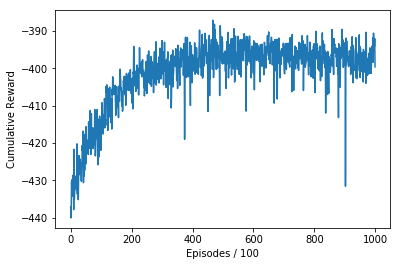

In [8]:
CHUNK_SIZE = 100
num_iter = NUM_EPISODES // CHUNK_SIZE
ma_rew = np.empty((num_iter))
for n in range(num_iter):
    ma_rew[n] = np.mean(rew[n*CHUNK_SIZE:(n+1)*CHUNK_SIZE])
plt.plot(np.asarray(np.arange(ma_rew.size)), ma_rew)
plt.xlabel('Episodes / {}'.format(CHUNK_SIZE))
plt.ylabel('Cumulative Reward')

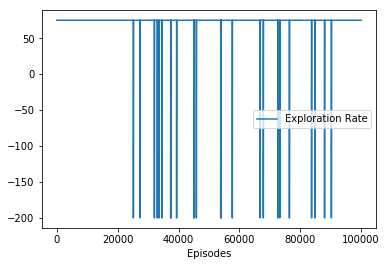

In [9]:
plt.plot(np.asarray(np.arange(NUM_EPISODES)),final_reward, label='final_reward')
plt.xlabel('Episodes')
plt.legend()

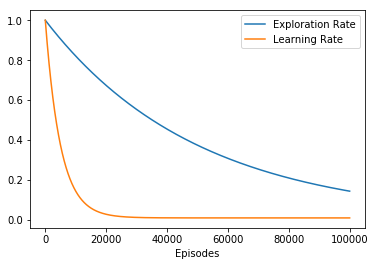

In [10]:
plt.plot(np.asarray(np.arange(NUM_EPISODES)),Rate_explore, label='Exploration Rate')
plt.plot(np.asarray(np.arange(NUM_EPISODES)),Rate_learn, label='Learning Rate')
plt.xlabel('Episodes')
plt.legend()

In [11]:
# print(q_table)
import pickle
with open('CarQL.pickle', 'wb') as f:
    pickle.dump(q_table_car, f)